# Předzpracování dat

### Data z prezidentských voleb 2018 a 2023

In [ ]:
import pandas as pd
import requests
import xml.etree.ElementTree as ET

def parse_xml_to_dataframe(url, davka):

    response = requests.get(url)
    if response.status_code != 200:
        print(f"Failed to fetch data from {url}. Status code: {response.status_code}")
        return None

    root = ET.fromstring(response.content)

    data_list = []
    for okrsek in root.findall('.//{http://www.volby.cz/prezident/}OKRSEK'):
        okrsek_data = {'CIS_OBEC': okrsek.get('CIS_OBEC'), 'CIS_OKRSEK': okrsek.get('CIS_OKRSEK')}
        ucast_okrsek = okrsek.find('{http://www.volby.cz/prezident/}UCAST_OKRSEK')
        hlasy_okrsek = okrsek.findall('{http://www.volby.cz/prezident/}HLASY_OKRSEK')

        okrsek_data.update({
            'ZAPSANI_VOLICI': ucast_okrsek.get('ZAPSANI_VOLICI'),
            'VYDANE_OBALKY': ucast_okrsek.get('VYDANE_OBALKY'),
            'ODEVZDANE_OBALKY': ucast_okrsek.get('ODEVZDANE_OBALKY'),
            'PLATNE_HLASY': ucast_okrsek.get('PLATNE_HLASY')
        })

        for hlasy in hlasy_okrsek:
            okrsek_data[f'HLASY_{hlasy.get("PORADOVE_CISLO")}'] = hlasy.get('HLASY')

        data_list.append(okrsek_data)

    df = pd.DataFrame(data_list)

    df['davka'] = davka

    return df

base_url = 'https://www.volby.cz/pls/prez2023nss/vysledky_okrsky?davka='
urls = [base_url + str(i) for i in range(1, 41)]

prez_2023_2_df = pd.concat([parse_xml_to_dataframe(url, i+1) for i, url in enumerate(urls)], ignore_index=True)

print(prez_2023_2_df)

      CIS_OBEC CIS_OKRSEK ZAPSANI_VOLICI VYDANE_OBALKY ODEVZDANE_OBALKY  \
0       577731         18            555            88               88   
1       554022          1            123            92               92   
2       588083          1             70            54               54   
3       564788          1             65            53               53   
4       595411         11             74            63               63   
...        ...        ...            ...           ...              ...   
14874   572659          7            928           750              750   
14875   552046         24            728           490              482   
14876   500208       8090            720           489              489   
14877   500186       7031            809           620              627   
14878   500186       7031            809           620              621   

      PLATNE_HLASY HLASY_4 HLASY_7  davka  
0               88      47      41      1  
1          

In [ ]:
import pandas as pd
import requests
import xml.etree.ElementTree as ET

def parse_xml_to_dataframe(url, davka):

    response = requests.get(url)
    if response.status_code != 200:
        print(f"Failed to fetch data from {url}. Status code: {response.status_code}")
        return None

    root = ET.fromstring(response.content)

    data_list = []
    for okrsek in root.findall('.//{http://www.volby.cz/prezident/}OKRSEK'):
        okrsek_data = {'CIS_OBEC': okrsek.get('CIS_OBEC'), 'CIS_OKRSEK': okrsek.get('CIS_OKRSEK')}
        ucast_okrsek = okrsek.find('{http://www.volby.cz/prezident/}UCAST_OKRSEK')
        hlasy_okrsek = okrsek.findall('{http://www.volby.cz/prezident/}HLASY_OKRSEK')

        okrsek_data.update({
            'ZAPSANI_VOLICI': ucast_okrsek.get('ZAPSANI_VOLICI'),
            'VYDANE_OBALKY': ucast_okrsek.get('VYDANE_OBALKY'),
            'ODEVZDANE_OBALKY': ucast_okrsek.get('ODEVZDANE_OBALKY'),
            'PLATNE_HLASY': ucast_okrsek.get('PLATNE_HLASY')
        })

        for hlasy in hlasy_okrsek:
            okrsek_data[f'HLASY_{hlasy.get("PORADOVE_CISLO")}'] = hlasy.get('HLASY')

        data_list.append(okrsek_data)

    df = pd.DataFrame(data_list)

    df['davka'] = davka

    return df

base_url = 'https://www.volby.cz/pls/prez2023nss/vysledky_okrsky?kolo=1&davka='
urls = [base_url + str(i) for i in range(1, 51)]

prez_2023_1_df = pd.concat([parse_xml_to_dataframe(url, i+1) for i, url in enumerate(urls)], ignore_index=True)

print(prez_2023_1_df)

      CIS_OBEC CIS_OKRSEK ZAPSANI_VOLICI VYDANE_OBALKY ODEVZDANE_OBALKY  \
0       577731         18            554            56               56   
1       566101          1             68            59               59   
2       549584          2             79            63               63   
3       560511          1             76            59               59   
4       502081       2010            214            61               61   
...        ...        ...            ...           ...              ...   
14861   540111          5           1005           809              809   
14862   999997         40           2021          1475             1474   
14863   569097          1            195           124              124   
14864   598810         11            712           450              448   
14865   500216       9017           1451          1118             1116   

      PLATNE_HLASY HLASY_1 HLASY_2 HLASY_4 HLASY_6 HLASY_7 HLASY_9  davka  \
0               56    

In [ ]:
import pandas as pd
import requests
import xml.etree.ElementTree as ET

def parse_xml_to_dataframe(url, davka):

    response = requests.get(url)
    if response.status_code != 200:
        print(f"Failed to fetch data from {url}. Status code: {response.status_code}")
        return None

    root = ET.fromstring(response.content)

    data_list = []
    for okrsek in root.findall('.//{http://www.volby.cz/prezident/}OKRSEK'):
        okrsek_data = {'CIS_OBEC': okrsek.get('CIS_OBEC'), 'CIS_OKRSEK': okrsek.get('CIS_OKRSEK')}
        ucast_okrsek = okrsek.find('{http://www.volby.cz/prezident/}UCAST_OKRSEK')
        hlasy_okrsek = okrsek.findall('{http://www.volby.cz/prezident/}HLASY_OKRSEK')

        okrsek_data.update({
            'ZAPSANI_VOLICI': ucast_okrsek.get('ZAPSANI_VOLICI'),
            'VYDANE_OBALKY': ucast_okrsek.get('VYDANE_OBALKY'),
            'ODEVZDANE_OBALKY': ucast_okrsek.get('ODEVZDANE_OBALKY'),
            'PLATNE_HLASY': ucast_okrsek.get('PLATNE_HLASY')
        })

        for hlasy in hlasy_okrsek:
            okrsek_data[f'HLASY_{hlasy.get("PORADOVE_CISLO")}'] = hlasy.get('HLASY')

        data_list.append(okrsek_data)

    df = pd.DataFrame(data_list)

    df['davka'] = davka

    return df

base_url = 'https://www.volby.cz/pls/prez2018/vysledky_okrsky?davka='
urls = [base_url + str(i) for i in range(1, 39)]

prez_2018_2_df = pd.concat([parse_xml_to_dataframe(url, i+1) for i, url in enumerate(urls)], ignore_index=True)

print(prez_2018_2_df)

      CIS_OBEC CIS_OKRSEK ZAPSANI_VOLICI VYDANE_OBALKY ODEVZDANE_OBALKY  \
0       541281          5            123            54               54   
1       549584          2             79            58               58   
2       547701          1             68            47               47   
3       587206          1             66            47               47   
4       573060          5            123            77               77   
...        ...        ...            ...           ...              ...   
14879   547034      11015           2723          1038             1035   
14880   999997        104             21            21               21   
14881   582824          2           1333          1010             1010   
14882   500097       3045           1407          1082             1082   
14883   563706          1            715           572              572   

      PLATNE_HLASY HLASY_7 HLASY_9  davka  
0               54      38      16      1  
1          

In [ ]:
import pandas as pd
import requests
import xml.etree.ElementTree as ET

def parse_xml_to_dataframe(url, davka):

    response = requests.get(url)
    if response.status_code != 200:
        print(f"Failed to fetch data from {url}. Status code: {response.status_code}")
        return None

    root = ET.fromstring(response.content)

    data_list = []
    for okrsek in root.findall('.//{http://www.volby.cz/prezident/}OKRSEK'):
        okrsek_data = {'CIS_OBEC': okrsek.get('CIS_OBEC'), 'CIS_OKRSEK': okrsek.get('CIS_OKRSEK')}
        ucast_okrsek = okrsek.find('{http://www.volby.cz/prezident/}UCAST_OKRSEK')
        hlasy_okrsek = okrsek.findall('{http://www.volby.cz/prezident/}HLASY_OKRSEK')

        okrsek_data.update({
            'ZAPSANI_VOLICI': ucast_okrsek.get('ZAPSANI_VOLICI'),
            'VYDANE_OBALKY': ucast_okrsek.get('VYDANE_OBALKY'),
            'ODEVZDANE_OBALKY': ucast_okrsek.get('ODEVZDANE_OBALKY'),
            'PLATNE_HLASY': ucast_okrsek.get('PLATNE_HLASY')
        })

        for hlasy in hlasy_okrsek:
            okrsek_data[f'HLASY_{hlasy.get("PORADOVE_CISLO")}'] = hlasy.get('HLASY')

        data_list.append(okrsek_data)

    df = pd.DataFrame(data_list)

    df['davka'] = davka

    return df

base_url = 'https://www.volby.cz/pls/prez2018/vysledky_okrsky?kolo=1&davka='
urls = [base_url + str(i) for i in range(1, 54)]

prez_2018_1_df = pd.concat([parse_xml_to_dataframe(url, i+1) for i, url in enumerate(urls)], ignore_index=True)

print(prez_2018_1_df)

      CIS_OBEC CIS_OKRSEK ZAPSANI_VOLICI VYDANE_OBALKY ODEVZDANE_OBALKY  \
0       566080          1             68            26               26   
1       573060          5            124            69               69   
2       547701          1             66            47               47   
3       542059          1             48            29               29   
4       599034          1             73            47               47   
...        ...        ...            ...           ...              ...   
14877   579050          1            714           378              378   
14878   579173          1            296           187              187   
14879   579742          1           1722          1422             1418   
14880   547051      38006           1068           781              781   
14881   500208       8089            858           552              552   

      PLATNE_HLASY HLASY_2 HLASY_3 HLASY_5 HLASY_7 HLASY_8 HLASY_9 HLASY_1  \
0               26   

In [ ]:
import requests
import pandas as pd
from xml.etree import ElementTree as ET

def fetch_xml_data(url):
    response = requests.get(url)
    return response.content


def parse_xml_to_dataframe(xml_data, davka):
    root = ET.fromstring(xml_data)

    data = []
    for okrsek in root.findall('.//{http://www.volby.cz/ps/}OKRSEK'):
        cis_obec = okrsek.get('CIS_OBEC')
        cis_okrsek = okrsek.get('CIS_OKRSEK')
        poradi_zprac = okrsek.get('PORADI_ZPRAC')
        datum_cas_zprac = okrsek.get('DATUM_CAS_ZPRAC')

        ucast_okrsek = okrsek.find('{http://www.volby.cz/ps/}UCAST_OKRSEK')
        zapsani_volici = ucast_okrsek.get('ZAPSANI_VOLICI')
        vydane_obalky = ucast_okrsek.get('VYDANE_OBALKY')
        odevzdane_obalky = ucast_okrsek.get('ODEVZDANE_OBALKY')
        platne_hlasy = ucast_okrsek.get('PLATNE_HLASY')

        for hlasy_okrsek in okrsek.findall('{http://www.volby.cz/ps/}HLASY_OKRSEK'):
            kstrana = hlasy_okrsek.get('KSTRANA')
            hlasy = hlasy_okrsek.get('HLASY')

            data.append({
                'CIS_OBEC': cis_obec,
                'CIS_OKRSEK': cis_okrsek,
                'PORADI_ZPRAC': poradi_zprac,
                'DATUM_CAS_ZPRAC': datum_cas_zprac,
                'ZAPSANI_VOLICI': zapsani_volici,
                'VYDANE_OBALKY': vydane_obalky,
                'ODEVZDANE_OBALKY': odevzdane_obalky,
                'PLATNE_HLASY': platne_hlasy,
                'KSTRANA': kstrana,
                'HLASY': hlasy,
                'davka': davka
            })

    df = pd.DataFrame(data)
    return df

base_url = "https://www.volby.cz/pls/ps2021/vysledky_okrsky?davka="
num_davky = 75
url_list = [base_url + str(i + 1) for i in range(num_davky)]

ps_2021_df = pd.DataFrame()

for i, url in enumerate(url_list):

    xml_data = fetch_xml_data(url)

    df = parse_xml_to_dataframe(xml_data, i + 1)

    ps_2021_df = pd.concat([ps_2021_df, df], ignore_index=True)

print(ps_2021_df)


       CIS_OBEC CIS_OKRSEK PORADI_ZPRAC      DATUM_CAS_ZPRAC ZAPSANI_VOLICI  \
0        545384          1            1  2021-10-09T14:22:15             29   
1        545384          1            1  2021-10-09T14:22:15             29   
2        545384          1            1  2021-10-09T14:22:15             29   
3        545384          1            1  2021-10-09T14:22:15             29   
4        545384          1            1  2021-10-09T14:22:15             29   
...         ...        ...          ...                  ...            ...   
193141   584720          1        14906  2021-10-10T11:20:26           1072   
193142   584720          1        14906  2021-10-10T11:20:26           1072   
193143   584720          1        14906  2021-10-10T11:20:26           1072   
193144   584720          1        14906  2021-10-10T11:20:26           1072   
193145   584720          1        14906  2021-10-10T11:20:26           1072   

       VYDANE_OBALKY ODEVZDANE_OBALKY PLATNE_HLASY 

In [ ]:
prez_2018_1_df.to_csv('prez_2018_1_abs.csv', index = False)
prez_2018_2_df.to_csv('prez_2018_2_abs.csv', index = False)
prez_2023_1_df.to_csv('prez_2023_1_abs.csv', index = False)
prez_2023_2_df.to_csv('prez_2023_2_abs.csv', index = False)
ps_2021_df.to_csv('ps_2021_abs.csv', index = False)

In [ ]:
prez_2018_1 = pd.read_csv('prez_2018_1_abs.csv')
prez_2018_2 = pd.read_csv('prez_2018_2_abs.csv')
prez_2023_1 = pd.read_csv('prez_2023_1_abs.csv')
prez_2023_2 = pd.read_csv('prez_2023_2_abs.csv')
ps_2021_df = pd.read_csv('ps_2021_abs.csv')

In [ ]:
#############################################
# funkce only_unique_rows odstranuje duplicity v datech, stava se, ze v nekterych okrscich se vysledky prepocitavaji jeste jednou, potom v datech bude dany okrsek 2x
# tato funkce bere vzdy pouze posledni zaznam o danem okrsku
#############################################
def only_unique_rows(df):
  unique_combinations = df.drop_duplicates(subset=['CIS_OBEC', 'CIS_OKRSEK'], keep=False)

  duplicates = df[df.duplicated(subset=['CIS_OBEC', 'CIS_OKRSEK'], keep=False)]

  duplicates_max_davka = duplicates.groupby(['CIS_OBEC', 'CIS_OKRSEK'])['davka'].idxmax()
  max_davka_rows = df.loc[duplicates_max_davka]

  df_filtered = pd.concat([unique_combinations, max_davka_rows])
  return df_filtered

In [ ]:
def str_cols_to_int_cols(df):

    hlasy_cols = [col for col in df.columns if col.startswith('HLASY_')]

    int_columns = ['ZAPSANI_VOLICI', 'PLATNE_HLASY', 'davka'] + hlasy_cols

    df[int_columns] = df[int_columns].astype('Int64')
    return df

In [ ]:
def reindex_cols(df):

    known_columns =  [col for col in df.columns if not col.startswith('HLASY_')]

    hlasy_cols = [col for col in df.columns if col.startswith('HLASY_')]
    hlasy_cols_sorted = sorted(hlasy_cols)

    column_order = known_columns + hlasy_cols_sorted

    df = df.reindex(columns=column_order)

    return df

In [ ]:
def prub_vysledky(df):

  hlasy_cols = [col for col in df.columns if col.startswith('HLASY_')]

  df_result = pd.DataFrame(columns=df.columns)

  frames = []
  celkove_okrsku = df.shape[0]

  for i in range(1, max(df['davka']) + 1):
      df_until_davka_i = df[df['davka'] <= i]
      okrsku_do_davky = df_until_davka_i.shape[0]

      column_sums = df_until_davka_i.sum()
      column_sums = pd.DataFrame(column_sums).T
      for col in range(len(hlasy_cols)):
        column_sums[hlasy_cols[col]] /= column_sums['PLATNE_HLASY']
      column_sums['davka'] = int(i)
      column_sums['okrsku_secteno'] = okrsku_do_davky / celkove_okrsku
      column_sums['volebni_ucast'] = column_sums['PLATNE_HLASY'] / column_sums['ZAPSANI_VOLICI']
      frames.append(pd.DataFrame(column_sums))

  df_result = pd.concat(frames, ignore_index=True)

  return df_result

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
def drop_cols(df, typ_voleb):
  if typ_voleb == "prezidentske":
    df = df.drop(['VYDANE_OBALKY', 'ODEVZDANE_OBALKY', 'CIS_OBEC', 'CIS_OKRSEK', 'ZAPSANI_VOLICI', 'PLATNE_HLASY'], axis = 1)
  elif typ_voleb == "ps":
    df = df.drop(['VYDANE_OBALKY', 'ODEVZDANE_OBALKY', 'CIS_OBEC', 'CIS_OKRSEK', 'ZAPSANI_VOLICI', 'PLATNE_HLASY', 'PORADI_ZPRAC', 'DATUM_CAS_ZPRAC'], axis = 1)
  return df

In [ ]:
prez_2023_1 = only_unique_rows(prez_2023_1)
prez_2023_2 = only_unique_rows(prez_2023_2)
prez_2018_1 = only_unique_rows(prez_2018_1)
prez_2018_2 = only_unique_rows(prez_2018_2)

In [ ]:
pocet_okrsku_2018 = prez_2018_1.groupby(['CIS_OBEC', 'CIS_OKRSEK']).sum().shape[0]
pocet_okrsku_2023 = prez_2023_1.groupby(['CIS_OBEC', 'CIS_OKRSEK']).sum().shape[0]

In [ ]:
prez_2023_1 = reindex_cols(prez_2023_1)
prez_2023_2 = reindex_cols(prez_2023_2)
prez_2018_1 = reindex_cols(prez_2018_1)
prez_2018_2 = reindex_cols(prez_2018_2)

In [ ]:
prez_2023_1 = str_cols_to_int_cols(prez_2023_1)
prez_2023_2 = str_cols_to_int_cols(prez_2023_2)
prez_2018_1 = str_cols_to_int_cols(prez_2018_1)
prez_2018_2 = str_cols_to_int_cols(prez_2018_2)

In [ ]:
prez_2023_1 = prub_vysledky(prez_2023_1)
prez_2023_2 = prub_vysledky(prez_2023_2)
prez_2018_1 = prub_vysledky(prez_2018_1)
prez_2018_2 = prub_vysledky(prez_2018_2)

In [ ]:
prez_2023_1 = drop_cols(prez_2023_1, typ_voleb = "prezidentske")
prez_2023_2 = drop_cols(prez_2023_2, typ_voleb = "prezidentske")
prez_2018_1 = drop_cols(prez_2018_1, typ_voleb = "prezidentske")
prez_2018_2 = drop_cols(prez_2018_2, typ_voleb = "prezidentske")

In [ ]:
prez_2023_1['okrsku_secteno'] /= pocet_okrsku_2023
prez_2023_2['okrsku_secteno'] /= pocet_okrsku_2023
prez_2018_1['okrsku_secteno'] /= pocet_okrsku_2018
prez_2018_2['okrsku_secteno'] /= pocet_okrsku_2018

In [ ]:
print(prez_2018_1.head())

   davka   HLASY_1   HLASY_2   HLASY_3   HLASY_4   HLASY_5   HLASY_6  \
0      1  0.044218  0.095238  0.103175  0.012472  0.007937  0.004535   
1      2  0.036612  0.080041  0.082563  0.016158  0.006911  0.005043   
2      3  0.035641  0.083776  0.083509  0.013195  0.007201   0.00511   
3      4  0.035378  0.084751   0.08509  0.012427  0.006229  0.004984   
4      5  0.036922  0.085087  0.087654   0.01249  0.006137  0.004885   

    HLASY_7   HLASY_8   HLASY_9  okrsku_secteno volebni_ucast  
0   0.29932  0.120181  0.312925        0.001211      0.641455  
1  0.443822  0.086299  0.242552        0.009821      0.589106  
2  0.443457  0.087818  0.240293        0.046078      0.596189  
3  0.442375  0.086632  0.242134        0.098143      0.591895  
4  0.439261   0.08617  0.241393        0.156801      0.584148  


In [ ]:
print(prez_2018_1.tail())

    davka   HLASY_1   HLASY_2   HLASY_3   HLASY_4   HLASY_5   HLASY_6  \
48     49  0.043032  0.091787    0.1023  0.012307  0.005678  0.004748   
49     50  0.043031  0.091787  0.102297  0.012306  0.005678  0.004748   
50     51  0.043031  0.091787  0.102295  0.012306  0.005678  0.004747   
51     52  0.043056  0.091801  0.102307  0.012305  0.005677  0.004748   
52     53  0.043062  0.091808  0.102308  0.012305  0.005677  0.004748   

     HLASY_7   HLASY_8   HLASY_9  okrsku_secteno volebni_ucast  
48  0.385774  0.088368  0.266007        0.999664       0.61528  
49  0.385779   0.08837  0.266004        0.999731      0.615273  
50  0.385785  0.088369  0.266002        0.999798      0.615273  
51  0.385715  0.088369  0.266024        0.999865      0.615315  
52  0.385682  0.088372  0.266038        1.000000      0.615333  


In [ ]:
print(prez_2023_1.head())

   davka   HLASY_1   HLASY_2   HLASY_4   HLASY_5   HLASY_6   HLASY_7  \
0      1  0.034783   0.06087  0.234783       0.0  0.147826  0.469565   
1      2  0.061491  0.048825  0.276813  0.005516  0.139939  0.424311   
2      3  0.063208  0.048605  0.304708  0.006354  0.139943  0.394783   
3      4  0.064309   0.04776  0.305747  0.005854  0.137675  0.396788   
4      5  0.063357  0.048422  0.310541  0.005867   0.13791  0.392124   

    HLASY_8   HLASY_9  okrsku_secteno volebni_ucast  
0       0.0  0.052174        0.000135      0.184887  
1   0.01144  0.031665        0.005519       0.61073  
2  0.014492  0.027907        0.021741      0.651535  
3  0.014098   0.02777        0.051625      0.663034  
4  0.014194  0.027585        0.094434       0.67644  


In [ ]:
prez_2023_1.to_csv('prez_2023_1_proc.csv', index = False)
prez_2023_2.to_csv('prez_2023_2_proc.csv', index = False)
prez_2018_1.to_csv('prez_2018_1_proc.csv', index = False)
prez_2018_2.to_csv('prez_2018_2_proc.csv', index = False)

### Data z voleb do PS 2021

In [ ]:
import pandas as pd
import numpy as np

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
ps_2021_df_copy = ps_2021_df
ps_2021_df_copy.head()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,CIS_OBEC,CIS_OKRSEK,PORADI_ZPRAC,DATUM_CAS_ZPRAC,ZAPSANI_VOLICI,VYDANE_OBALKY,ODEVZDANE_OBALKY,PLATNE_HLASY,KSTRANA,HLASY,davka
0,545384,1,1,2021-10-09T14:22:15,29,20,20,20,4,4,1
1,545384,1,1,2021-10-09T14:22:15,29,20,20,20,8,1,1
2,545384,1,1,2021-10-09T14:22:15,29,20,20,20,12,1,1
3,545384,1,1,2021-10-09T14:22:15,29,20,20,20,13,3,1
4,545384,1,1,2021-10-09T14:22:15,29,20,20,20,17,1,1


In [ ]:
ps_2021_df_without_time = ps_2021_df_copy.drop(columns = ['PORADI_ZPRAC', 'DATUM_CAS_ZPRAC', 'VYDANE_OBALKY', 	'ODEVZDANE_OBALKY'], axis = 1)
ps_2021_df_without_time.head()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,CIS_OBEC,CIS_OKRSEK,ZAPSANI_VOLICI,PLATNE_HLASY,KSTRANA,HLASY,davka
0,545384,1,29,20,4,4,1
1,545384,1,29,20,8,1,1
2,545384,1,29,20,12,1,1
3,545384,1,29,20,13,3,1
4,545384,1,29,20,17,1,1


In [ ]:
def only_unique_rows_ps(df):
  unique_combinations = df.drop_duplicates(subset=['CIS_OBEC', 'CIS_OKRSEK', 'KSTRANA'], keep=False)

  duplicates = df[df.duplicated(subset=['CIS_OBEC', 'CIS_OKRSEK', 'KSTRANA'], keep=False)]

  duplicates_max_davka = duplicates.groupby(['CIS_OBEC', 'CIS_OKRSEK'])['davka'].idxmax()
  max_davka_rows = df.loc[duplicates_max_davka]

  df_filtered = pd.concat([unique_combinations, max_davka_rows])
  return df_filtered

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
ps_2021_df_copy = only_unique_rows_ps(ps_2021_df_copy)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
def str_cols_to_int_cols_ps(df):

    for col in df.columns:
        if df[col].dtype == 'object' and col != 'DATUM_CAS_ZPRAC':
            df[col] = pd.to_numeric(df[col], errors='coerce').fillna(0).astype(int)

    return df

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
ps_2021_df_copy = str_cols_to_int_cols_ps(ps_2021_df_copy)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
ps_2021_pivot = ps_2021_df_copy.pivot_table(index=['CIS_OBEC', 'CIS_OKRSEK', 'PLATNE_HLASY', 'ZAPSANI_VOLICI', 'davka'],
                                       columns='KSTRANA', values='HLASY', fill_value=0)

ps_2021_pivot = ps_2021_pivot.reset_index()

ps_2021_pivot.columns = [f'HLASY_{int(col)}' if isinstance(col, int) else col for col in ps_2021_pivot.columns]

print(ps_2021_pivot.head())

   CIS_OBEC  CIS_OKRSEK  PLATNE_HLASY  ZAPSANI_VOLICI  davka  HLASY_1  \
0    500011           1           504             717     15      1.0   
1    500011           2           284             435     21      3.0   
2    500011           3           289             394     17      2.0   
3    500020           1           159             268     19      1.0   
4    500020           2           452             729     30      1.0   

   HLASY_2  HLASY_3  HLASY_4  HLASY_5  ...  HLASY_13  HLASY_14  HLASY_15  \
0      1.0      8.0     67.0     28.0  ...     141.0       0.0       2.0   
1      3.0      8.0     31.0     16.0  ...      83.0       0.0       0.0   
2      0.0      4.0     17.0     24.0  ...     118.0       0.0       1.0   
3      1.0      8.0     16.0      8.0  ...      32.0       0.0       0.0   
4      0.0      5.0     81.0     23.0  ...     113.0       0.0       2.0   

   HLASY_16  HLASY_17  HLASY_18  HLASY_19  HLASY_20  HLASY_21  HLASY_22  
0       4.0      64.0      14.

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
ps_2021_pivot.to_csv('ps_2021_abs.csv', index = False)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
ps_2021_pivot.drop(columns = ['CIS_OBEC', 'CIS_OKRSEK'], axis = 1, inplace = True)
ps_2021_df_copy = prub_vysledky(ps_2021_pivot)
ps_2021_df_copy.tail(10)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,PLATNE_HLASY,ZAPSANI_VOLICI,davka,HLASY_1,HLASY_2,HLASY_3,HLASY_4,HLASY_5,HLASY_6,HLASY_7,...,HLASY_15,HLASY_16,HLASY_17,HLASY_18,HLASY_19,HLASY_20,HLASY_21,HLASY_22,okrsku_secteno,volebni_ucast
65,5364838.0,8261532.0,66,0.009922,0.003131,0.013322,0.095659,0.046599,0.000109,0.00096,...,0.001260,0.001606,0.155799,0.036068,0.000306,0.271395,0.004062,0.002658,0.999127,0.649376
66,5367489.0,8264980.0,67,0.009920,0.003131,0.013318,0.095631,0.046584,0.000109,0.00096,...,0.001260,0.001606,0.155884,0.036061,0.000305,0.271336,0.004061,0.002657,0.999261,0.649426
67,5368113.0,8265830.0,68,0.009920,0.003131,0.013317,0.095625,0.046581,0.000109,0.00096,...,0.001260,0.001606,0.155888,0.036059,0.000305,0.271325,0.004061,0.002656,0.999328,0.649434
68,5369524.0,8267699.0,69,0.009920,0.003130,0.013318,0.095622,0.046578,0.000109,0.00096,...,0.001260,0.001606,0.155935,0.036057,0.000306,0.271295,0.004060,0.002657,0.999463,0.649458
69,5370869.0,8269741.0,70,0.009921,0.003130,0.013318,0.095615,0.046573,0.000109,0.00096,...,0.001259,0.001606,0.155943,0.036054,0.000306,0.271276,0.004060,0.002657,0.999597,0.649460
70,5372082.0,8271380.0,71,0.009921,0.003130,0.013316,0.095606,0.046574,0.000109,0.00096,...,0.001260,0.001606,0.155956,0.036054,0.000306,0.271257,0.004060,0.002657,0.999731,0.649478
71,5373243.0,8273134.0,72,0.009925,0.003129,0.013315,0.095588,0.046566,0.000109,0.00096,...,0.001260,0.001606,0.156051,0.036046,0.000306,0.271203,0.004060,0.002657,0.999798,0.649481
72,5373937.0,8274072.0,73,0.009924,0.003128,0.013315,0.095582,0.046565,0.000109,0.00096,...,0.001259,0.001606,0.156056,0.036043,0.000306,0.271190,0.004059,0.002656,0.999866,0.649491
73,5374529.0,8274918.0,74,0.009924,0.003128,0.013314,0.095574,0.046560,0.000109,0.00096,...,0.001259,0.001606,0.156100,0.036039,0.000306,0.271163,0.004059,0.002656,0.999933,0.649496
74,5375280.0,8275990.0,75,0.009924,0.003128,0.013312,0.095560,0.046553,0.000109,0.00096,...,0.001259,0.001605,0.156078,0.036034,0.000306,0.271126,0.004058,0.002656,1.000000,0.649503


In [ ]:
final_results = ps_2021_df_copy[ps_2021_df_copy['davka'] == 75].iloc[0]

party_cols = [col for col in ps_2021_df_copy.columns if col.startswith('HLASY_')]

threshold = 0.015  # 1.5% hranice
parties_above_threshold = [col for col in party_cols if final_results[col] >= threshold]

parties_below_threshold = [col for col in party_cols if final_results[col] < threshold]

ps_2021_df_copy['HLASY_ostatni'] = ps_2021_df_copy[parties_below_threshold].sum(axis=1)

filtered_data_ps_2021 = ps_2021_df_copy[['davka', 'okrsku_secteno'] + parties_above_threshold + ['HLASY_ostatni']]

print(filtered_data_ps_2021.head())

   davka  okrsku_secteno   HLASY_4   HLASY_5   HLASY_8  HLASY_12  HLASY_13  \
0      1        0.000134  0.129032  0.032258  0.032258  0.032258  0.290323   
1      2        0.000336  0.146154  0.046154  0.030769  0.015385  0.269231   
2      3        0.001746  0.110827  0.063086  0.024723  0.040921  0.225916   
3      4        0.005978  0.105095  0.063057  0.024446  0.048435  0.224355   
4      5        0.013098  0.111040  0.056118  0.027139  0.048850  0.224931   

   HLASY_17  HLASY_18  HLASY_20  HLASY_ostatni  
0  0.161290  0.096774  0.225806       0.000000  
1  0.130769  0.046154  0.246154       0.069231  
2  0.128730  0.048593  0.307758       0.049446  
3  0.131369  0.047978  0.305689       0.049577  
4  0.124287  0.047010  0.318399       0.042226  


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
filtered_data_ps_2021.to_csv('ps_2021_proc.csv', index = False)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


# Grafy průběhu voleb

In [ ]:
import numpy as np
import pandas as pd
prez_2023_1 = pd.read_csv('prez_2023_1_proc.csv')
prez_2023_2 = pd.read_csv('prez_2023_2_proc.csv')
prez_2018_1 = pd.read_csv('prez_2018_1_proc.csv')
prez_2018_2 = pd.read_csv('prez_2018_2_proc.csv')
ps_2021_df = pd.read_csv('ps_2021_proc.csv')

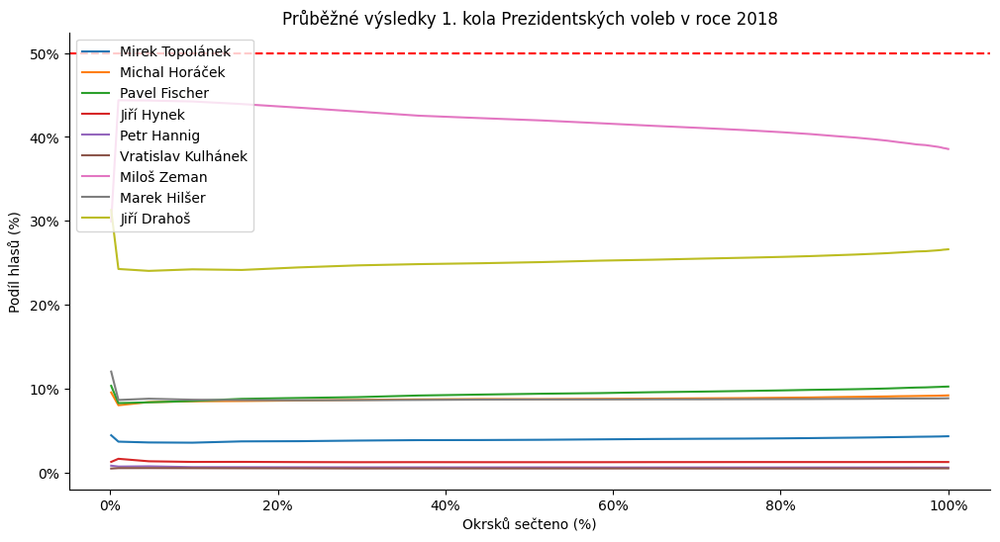

In [ ]:
from matplotlib import pyplot as plt
from matplotlib.ticker import FuncFormatter

def percentage(x, pos):
    return '{:.0%}'.format(x)

fig, ax = plt.subplots(figsize=(12, 6))

labels = ["Mirek Topolánek", "Michal Horáček", "Pavel Fischer", "Jiří Hynek", "Petr Hannig", "Vratislav Kulhánek", "Miloš Zeman", "Marek Hilšer", "Jiří Drahoš"]
okrsku_secteno = prez_2018_1['okrsku_secteno']

for i, label in enumerate(labels):
    column_name = f'HLASY_{i+1}'
    ax.plot(okrsku_secteno, prez_2018_1[column_name], label=label)

    # last_value = prez_2018_1[column_name].iloc[-1]
    # ax.annotate(f'{label}: {last_value:.2%}', xy=(okrsku_secteno.iloc[-1], last_value), xytext=(-50,10), textcoords='offset points')

plt.axhline(y=0.5, color='red', linestyle='--')

plt.xlabel('Okrsků sečteno (%)')
plt.ylabel('Podíl hlasů (%)')

plt.title("Průběžné výsledky 1. kola Prezidentských voleb v roce 2018")

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

formatter = FuncFormatter(percentage)
ax.yaxis.set_major_formatter(formatter)
ax.xaxis.set_major_formatter(formatter)

plt.legend(loc='upper left')

plt.show()


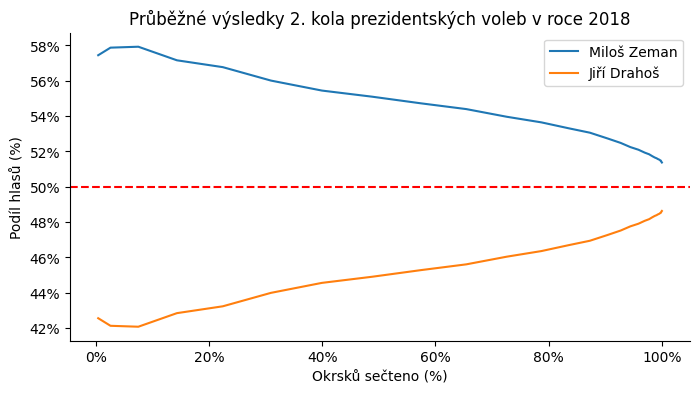

In [ ]:
from matplotlib import pyplot as plt
from matplotlib.ticker import FuncFormatter


def percentage(x, pos):
    return '{:.0%}'.format(x)

fig, ax = plt.subplots(figsize=(8, 4))

okrsku_secteno = prez_2018_2['okrsku_secteno']
ax.plot(okrsku_secteno, prez_2018_2['HLASY_7'], label='Miloš Zeman')
ax.plot(okrsku_secteno, prez_2018_2['HLASY_9'], label='Jiří Drahoš')

plt.axhline(y=0.5, color='red', linestyle='--')

plt.title("Průběžné výsledky 2. kola prezidentských voleb v roce 2018")

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.xlabel('Okrsků sečteno (%)')
plt.ylabel('Podíl hlasů (%)')

formatter = FuncFormatter(percentage)
ax.yaxis.set_major_formatter(formatter)
ax.xaxis.set_major_formatter(formatter)

plt.legend()

plt.show()


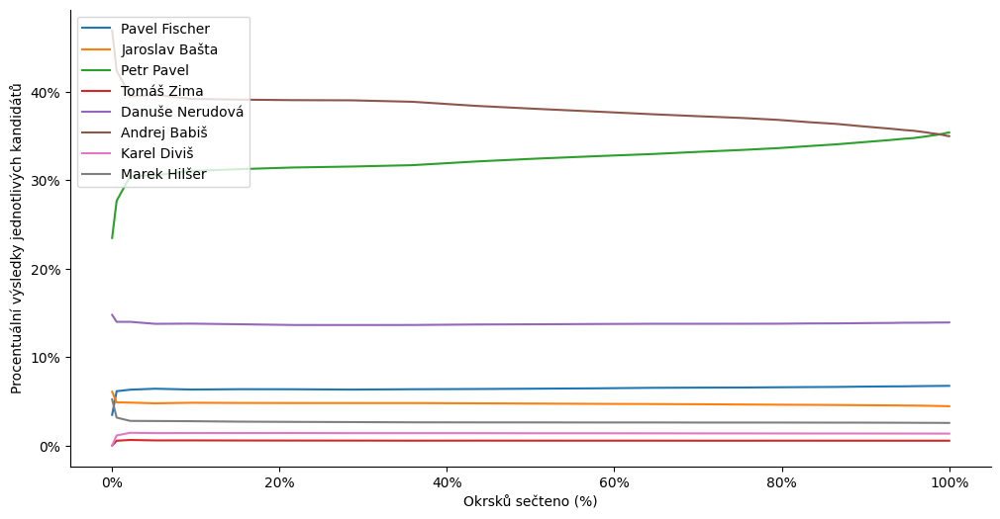

In [ ]:
from matplotlib import pyplot as plt
from matplotlib.ticker import FuncFormatter


def percentage(x, pos):
    return '{:.0%}'.format(x)

fig, ax = plt.subplots(figsize=(12, 6))

labels = ["Pavel Fischer", "Jaroslav Bašta", "", "Petr Pavel", "Tomáš Zima", "Danuše Nerudová", "Andrej Babiš", "Karel Diviš", "Marek Hilšer"]

for i, label in enumerate(labels):
    if i == 2:
        continue
    else:
        column_name = f'HLASY_{i+1}'
        prez_2023_1.plot(x='okrsku_secteno', y=column_name, kind='line', label=label, ax=ax)

plt.xlabel('Okrsků sečteno (%)')
plt.ylabel('Procentuální výsledky jednotlivých kandidátů')

formatter = FuncFormatter(percentage)
ax.xaxis.set_major_formatter(formatter)
ax.yaxis.set_major_formatter(formatter)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.legend(loc='upper left')

plt.show()


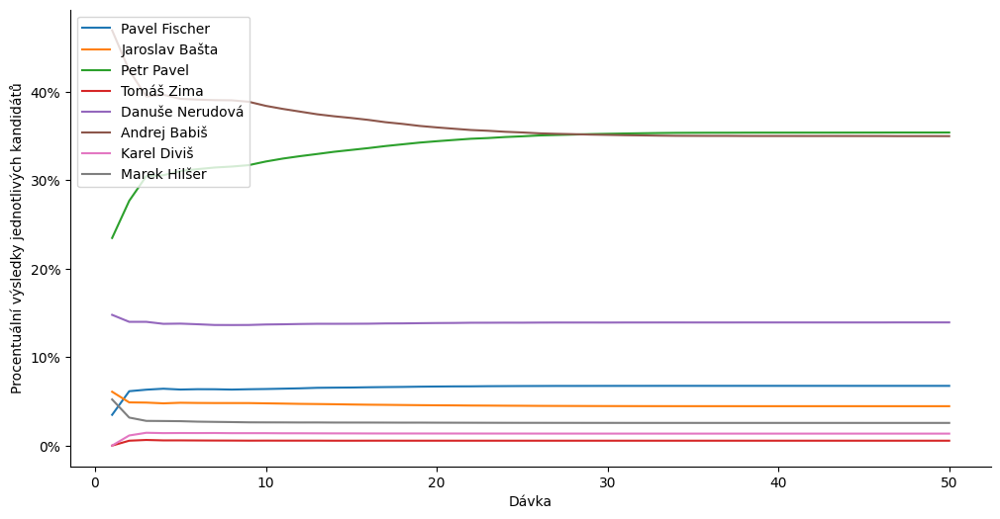

In [ ]:
from matplotlib import pyplot as plt

fig, ax = plt.subplots(figsize=(12, 6))

labels = ["Pavel Fischer", "Jaroslav Bašta", "", "Petr Pavel", "Tomáš Zima", "Danuše Nerudová", "Andrej Babiš", "Karel Diviš", "Marek Hilšer"]
for i, label in enumerate(labels):
    if i == 2:
      continue
    else:
      column_name = f'HLASY_{i+1}'

      prez_2023_1.plot(x='davka', y=column_name, kind='line', label=label, ax=ax)

plt.xlabel('Dávka')

ax.yaxis.set_major_formatter(formatter)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.ylabel('Procentuální výsledky jednotlivých kandidátů')

plt.legend(loc='upper left')

plt.show()

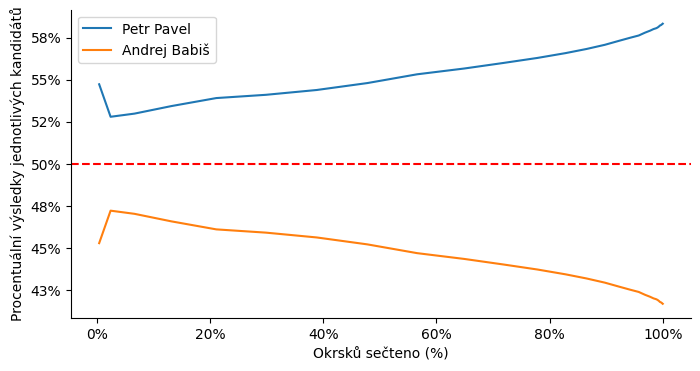

In [ ]:
from matplotlib import pyplot as plt
from matplotlib.ticker import FuncFormatter


def percentage(x, pos):
    return '{:.0%}'.format(x)

fig, ax = plt.subplots(figsize=(8, 4))

prez_2023_2.plot(x='okrsku_secteno', y='HLASY_4', kind='line', ax=ax, label='Petr Pavel')

prez_2023_2.plot(x='okrsku_secteno', y='HLASY_7', kind='line', ax=ax, label='Andrej Babiš')

plt.axhline(y=0.5, color='red', linestyle='--')

formatter = FuncFormatter(percentage)
ax.xaxis.set_major_formatter(formatter)

ax.yaxis.set_major_formatter(formatter)

plt.xlabel('Okrsků sečteno (%)')
plt.ylabel('Procentuální výsledky jednotlivých kandidátů')

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.legend()

plt.show()

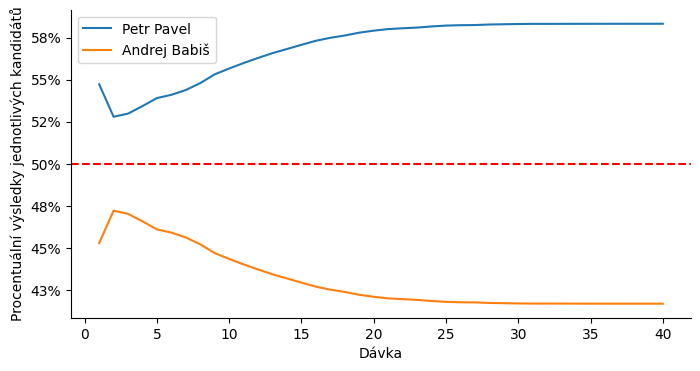

In [ ]:
from matplotlib import pyplot as plt
from matplotlib.ticker import FuncFormatter


def percentage(x, pos):
    return '{:.0%}'.format(x)

fig, ax = plt.subplots(figsize=(8, 4))

prez_2023_2.plot(x='davka', y='HLASY_4', kind='line', ax=ax, label='Petr Pavel')

prez_2023_2.plot(x='davka', y='HLASY_7', kind='line', ax=ax, label='Andrej Babiš')

plt.axhline(y=0.5, color='red', linestyle='--')

formatter = FuncFormatter(percentage)

ax.yaxis.set_major_formatter(formatter)

plt.xlabel('Dávka')
plt.ylabel('Procentuální výsledky jednotlivých kandidátů')

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.legend()

plt.show()

# Model - časové řady - průběžné výsledky

## ARIMA



### Predikce prez voleb 2023 1. kolo

In [ ]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt

In [ ]:
prez_2023_1_proc_df = pd.read_csv('prez_2023_1_proc.csv')
prez_2023_1_proc_df.head()

,davka,HLASY_1,HLASY_2,HLASY_4,HLASY_5,HLASY_6,HLASY_7,HLASY_8,HLASY_9,okrsku_secteno,volebni_ucast
0,1,0.034783,0.060870,0.234783,0.000000,0.147826,0.469565,0.000000,0.052174,0.000135,0.184887
1,2,0.061491,0.048825,0.276813,0.005516,0.139939,0.424311,0.011440,0.031665,0.005519,0.610730
2,3,0.063208,0.048605,0.304708,0.006354,0.139943,0.394783,0.014492,0.027907,0.021741,0.651535
3,4,0.064309,0.047760,0.305747,0.005854,0.137675,0.396788,0.014098,0.027770,0.051625,0.663034
4,5,0.063357,0.048422,0.310541,0.005867,0.137910,0.392124,0.014194,0.027585,0.094434,0.676440


In [ ]:
!pip install composition-stats

In [ ]:
from composition_stats import clr, clr_inv

def replace_zeros(data, epsilon=1e-6):
    return data.replace(0, epsilon)


def apply_clr_transform(data, parties_cols):
    non_zero_data = replace_zeros(data[parties_cols])
    clr_data = clr(non_zero_data.values)

    if clr_data.ndim == 1:
        return pd.DataFrame([clr_data], columns=[f'clr_{i+1}' for i in range(clr_data.shape[0])])
    else:
        return pd.DataFrame(clr_data, columns=[f'clr_{i+1}' for i in range(clr_data.shape[1])])


def apply_clr_inverse_transform(clr_pred):
    pred_proportions = clr_inv(clr_pred)
    return pred_proportions

In [ ]:
parties_cols = [col for col in prez_2023_1_proc_df.columns if col.startswith('HLASY_')]

clr_data = apply_clr_transform(prez_2023_1_proc_df, parties_cols)

In [ ]:
clr_data_train = clr_data[:4] # 5.1% okrsku secteno
clr_data_test = clr_data[4:]
clr_data_train = pd.concat([clr_data_train, prez_2023_1_proc_df['okrsku_secteno'][:4,]], axis = "columns")
clr_data_train.columns = parties_cols + ['okrsku_secteno']

In [ ]:
prez_2023_1_proc_df_train = prez_2023_1_proc_df[:4]

start_time = pd.Timestamp('2023-01-14 14:20')

time_list = [start_time + pd.Timedelta(minutes=5 * i) for i in range(4)]
time_list_formatted = pd.Series([time.strftime('%H:%M') for time in time_list])
time_list_formatted.name = "Times"

prez_2023_1_proc_df_train = pd.concat([prez_2023_1_proc_df_train, time_list_formatted], axis = 1)
prez_2023_1_proc_df_train

,davka,HLASY_1,HLASY_2,HLASY_4,HLASY_5,HLASY_6,HLASY_7,HLASY_8,HLASY_9,okrsku_secteno,volebni_ucast,Times
0,1,0.034783,0.060870,0.234783,0.000000,0.147826,0.469565,0.000000,0.052174,0.000135,0.184887,14:20
1,2,0.061491,0.048825,0.276813,0.005516,0.139939,0.424311,0.011440,0.031665,0.005519,0.610730,14:25
2,3,0.063208,0.048605,0.304708,0.006354,0.139943,0.394783,0.014492,0.027907,0.021741,0.651535,14:30
3,4,0.064309,0.047760,0.305747,0.005854,0.137675,0.396788,0.014098,0.027770,0.051625,0.663034,14:35


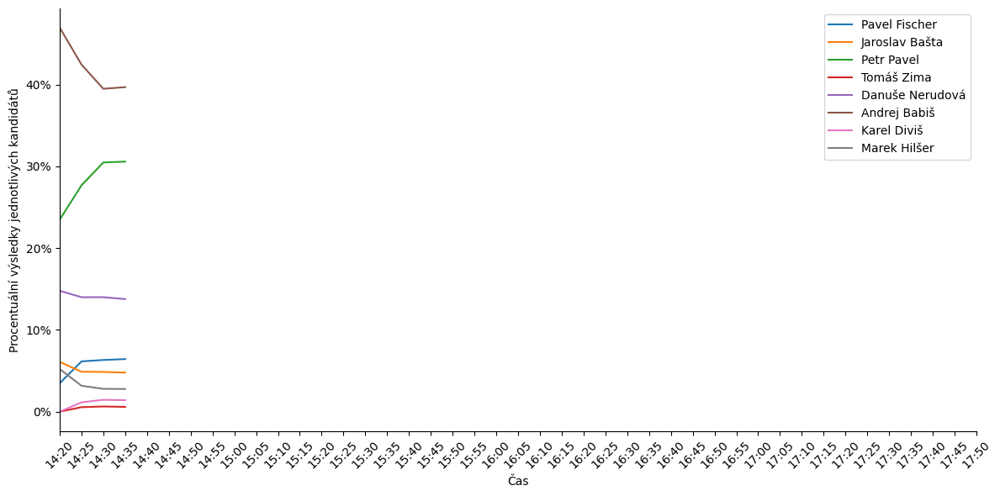

In [ ]:
from matplotlib.ticker import FuncFormatter


fig, ax = plt.subplots(figsize=(12, 6))

labels = ["Pavel Fischer", "Jaroslav Bašta", "", "Petr Pavel", "Tomáš Zima", "Danuše Nerudová", "Andrej Babiš", "Karel Diviš", "Marek Hilšer"]
for i, label in enumerate(labels):
    if i == 2:
        continue
    else:
        column_name = f'HLASY_{i+1}'
        prez_2023_1_proc_df_train.plot(x='Times', y=column_name, kind='line', label=label, ax=ax)

plt.xlabel('Čas')

start_time = pd.Timestamp('2023-01-14 14:20')
end_time = pd.Timestamp('2023-01-14 17:50')
time_range = pd.date_range(start=start_time, end=end_time, freq='5min').strftime('%H:%M')

ax.set_xticks(range(len(time_range)))
ax.set_xticklabels(time_range, rotation=45)

ax.set_xlim([0, len(time_range) - 1])

formatter = FuncFormatter(lambda y, _: f'{y:.0%}')
ax.yaxis.set_major_formatter(formatter)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.ylabel('Procentuální výsledky jednotlivých kandidátů')

plt.legend(loc='upper right')

plt.tight_layout()
plt.show()

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


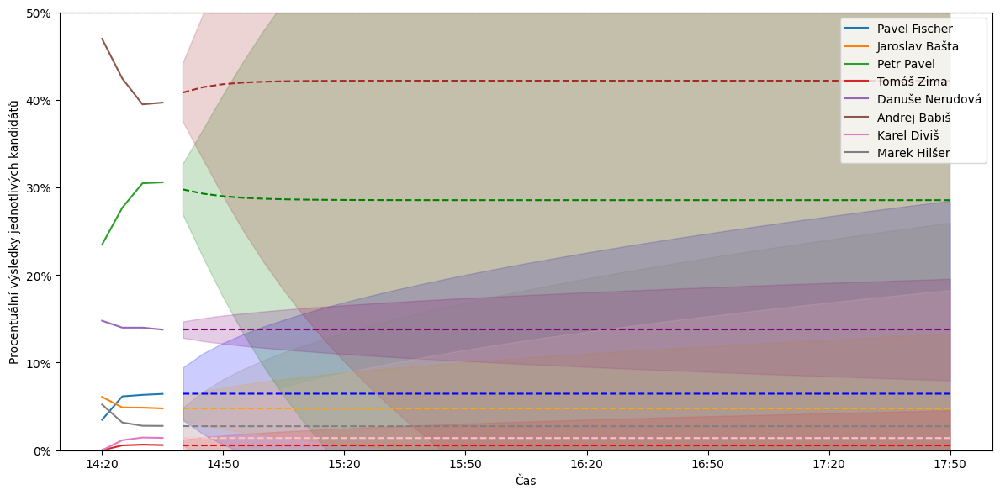

In [ ]:
from statsmodels.tsa.arima.model import ARIMA


fig, ax = plt.subplots(figsize=(12, 6))

labels = ["Pavel Fischer", "Jaroslav Bašta", "", "Petr Pavel", "Tomáš Zima", "Danuše Nerudová", "Andrej Babiš", "Karel Diviš", "Marek Hilšer"]
candidates = [f'HLASY_{i+1}' for i in range(9) if i != 2]

for i, label in enumerate(labels):
    if i == 2:
        continue
    else:
        column_name = f'HLASY_{i+1}'
        prez_2023_1_proc_df_train.plot(x='Times', y=column_name, kind='line', label=label, ax=ax)

plt.axhline(y=0.5, color='red', linestyle='--')

plt.xlabel('Čas')

start_time = pd.Timestamp('2023-01-14 14:20')
end_time = pd.Timestamp('2023-01-14 17:50')
time_range = pd.date_range(start=start_time, end=end_time, freq='5min').strftime('%H:%M')

def arima_forecast_and_plot(candidate, label, color):
    last_known_values = prez_2023_1_proc_df_train[candidate].values

    model = ARIMA(last_known_values, order=(1, 1, 1))
    model_fit = model.fit()

    n_forecast = len(time_range) - len(last_known_values)
    forecast = model_fit.get_forecast(steps=n_forecast)
    pred_values = forecast.predicted_mean
    conf_int = forecast.conf_int()

    future_times = np.arange(len(last_known_values), len(time_range))
    plt.plot(future_times, pred_values, linestyle='--', color=color)

    plt.fill_between(future_times, conf_int[:, 0], conf_int[:, 1], color=color, alpha=0.2)

colors = ['blue', 'orange', 'green', 'red', 'purple', 'brown', 'pink', 'gray']

for i, (candidate, label, color) in enumerate(zip(candidates, labels, colors)):
    arima_forecast_and_plot(candidate, label, color)

plt.xticks(ticks=range(0, len(time_range), 6), labels=time_range[::6])

formatter = FuncFormatter(lambda y, _: f'{y:.0%}')
plt.gca().yaxis.set_major_formatter(formatter)

plt.legend(loc='upper right')
plt.ylim(0, 0.5)

plt.ylabel('Procentuální výsledky jednotlivých kandidátů')

plt.tight_layout()
plt.show()

In [ ]:
!pip install pmdarima

In [ ]:
# testy stacionarity
from statsmodels.tsa.stattools import adfuller

"""
    Pass in a time series and an optional title, returns an ADF report
"""

def adf_test(series,title=''):
    print(f'Augmented Dickey-Fuller Test: {title}')
    result = adfuller(series.dropna(),autolag='AIC')

    labels = ['ADF test statistic','p-value','# lags used','# observations']
    out = pd.Series(result[0:4],index=labels)
    for key,val in result[4].items():
        out[f'critical value ({key})']=val
    print(out.to_string())

    if result[1] <= 0.05:
        print("Strong evidence against the null hypothesis")
        print("Reject the null hypothesis")
        print("Data has no unit root and is stationary")
    else:
        print("Weak evidence against the null hypothesis")
        print("Fail to reject the null hypothesis")
        print("Data has a unit root and is non-stationary")

for party in parties_cols:
    print(adf_test(clr_data_train[party]))

Augmented Dickey-Fuller Test: 
ADF test statistic     -59.206293
p-value                  0.000000
# lags used              0.000000
# observations           3.000000
critical value (1%)    -10.417191
critical value (5%)     -5.778381
critical value (10%)    -3.391681
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary
None
Augmented Dickey-Fuller Test: 
ADF test statistic     -1888.124926
p-value                    0.000000
# lags used                0.000000
# observations             3.000000
critical value (1%)      -10.417191
critical value (5%)       -5.778381
critical value (10%)      -3.391681
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary
None
Augmented Dickey-Fuller Test: 
ADF test statistic     -117.303237
p-value                   0.000000
# lags used               0.000000
# observations            3.000000
critical value (1%)     -10.417191
critical v

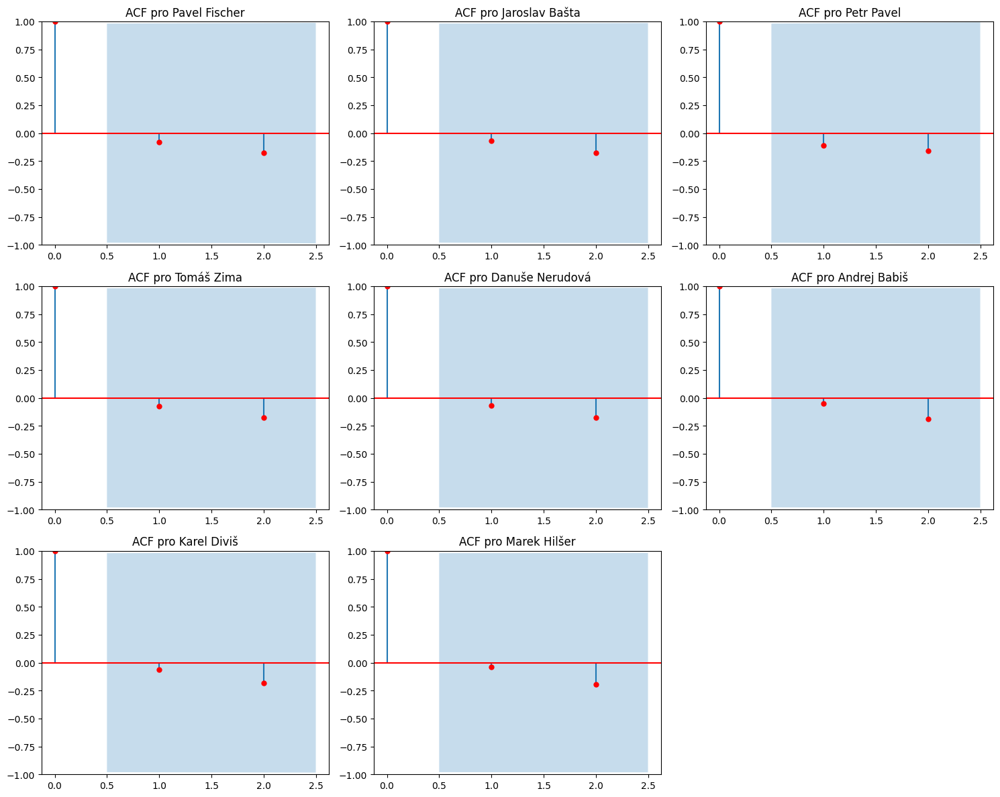

In [ ]:
# ACF
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

fig, axes = plt.subplots(3, 3, figsize=(15, 12))

labels = ["Pavel Fischer", "Jaroslav Bašta", "Petr Pavel", "Tomáš Zima", "Danuše Nerudová", "Andrej Babiš", "Karel Diviš", "Marek Hilšer"]

for i, party in enumerate(parties_cols):
    row, col = divmod(i, 3)

    plot_acf(clr_data_train[party], ax=axes[row, col], color="red", alpha=0.05)

    if labels[i]:
        axes[row, col].set_title(f'ACF pro {labels[i]}')
    else:
        axes[row, col].set_title(f'ACF pro {party}')

if len(parties_cols) < 9:
    fig.delaxes(axes[2, 2])

plt.tight_layout()
plt.show()


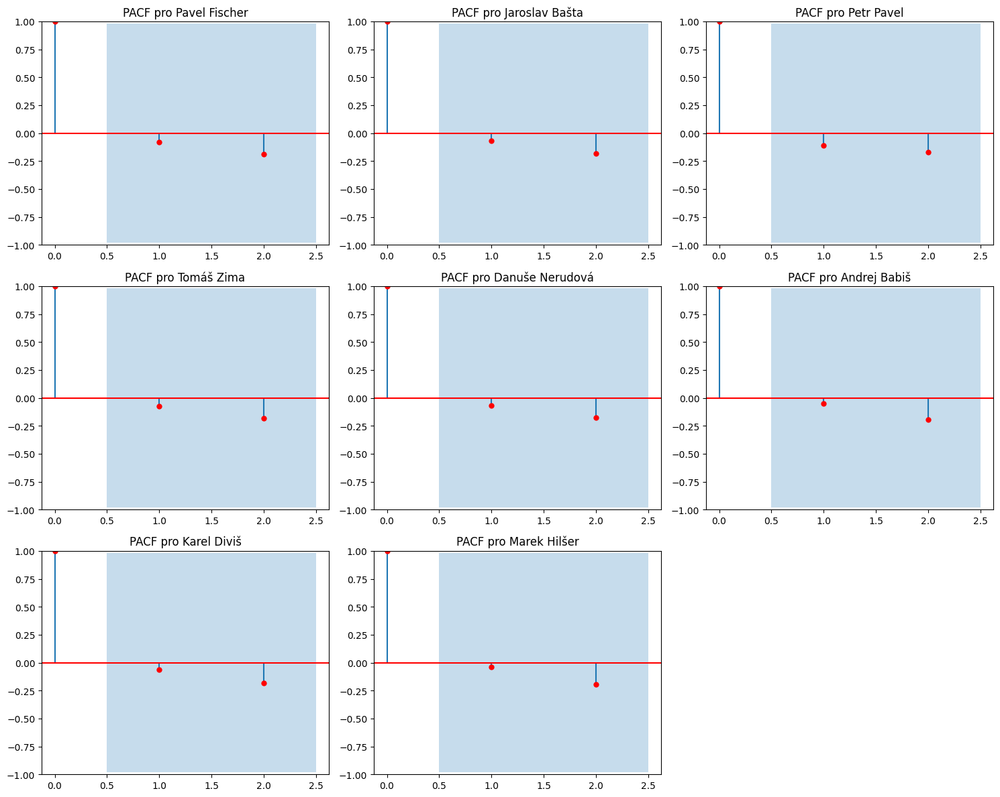

In [ ]:
# PACF
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

fig, axes = plt.subplots(3, 3, figsize=(15, 12))

labels = ["Pavel Fischer", "Jaroslav Bašta", "Petr Pavel", "Tomáš Zima", "Danuše Nerudová", "Andrej Babiš", "Karel Diviš", "Marek Hilšer"]

for i, party in enumerate(parties_cols):
    row, col = divmod(i, 3)

    plot_pacf(clr_data_train[party], ax=axes[row, col], color="red", alpha=0.05)

    if labels[i]:
        axes[row, col].set_title(f'PACF pro {labels[i]}')
    else:
        axes[row, col].set_title(f'PACF pro {party}')

if len(parties_cols) < 9:
    fig.delaxes(axes[2, 2])

plt.tight_layout()
plt.show()

In [ ]:
import pmdarima as pm


party_columns = [col for col in prez_2023_1_proc_df.columns if col.startswith('HLASY_')]
forecast_dict = {}

for party in party_columns:
    model = pm.auto_arima(clr_data_train[party], exogenous=clr_data_train[['okrsku_secteno']],
                          start_p=1, start_q=1, max_p=5, max_q=5, seasonal=False,
                          trace=True, error_action='ignore', suppress_warnings=True)

    forecast = model.predict(n_periods=1, exogenous=[[1]])
    forecast_dict[party] = forecast.values[0]

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=16.238, Time=0.05 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=12.314, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=14.262, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=14.274, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=12.678, Time=0.03 sec

Best model:  ARIMA(0,0,0)(0,0,0)[0]          
Total fit time: 0.152 seconds
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=18.399, Time=0.04 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=14.563, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=16.526, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=16.443, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=15.911, Time=0.02 sec

Best model:  ARIMA(0,0,0)(0,0,0)[0]          
Total fit time: 0.137 seconds
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=20.162, Time=0.04 sec
 ARIMA(0,0,0)

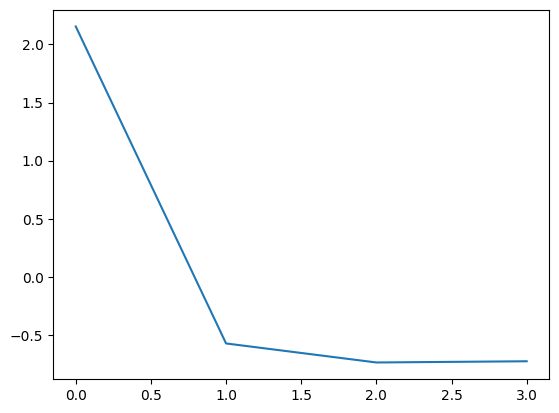

Ljung-Box test:
     lb_stat  lb_pvalue
3  2.164491   0.538976


In [ ]:
import statsmodels.api as sm

residuals = model.resid()
residuals.plot()
plt.show()

# Ljung-Box test
ljung_box_test = sm.stats.acorr_ljungbox(residuals, lags=[3], return_df=True)
print("Ljung-Box test:\n", ljung_box_test)
# p-hodnota > 0.05: Nemáme dostatek důkazů pro zamítnutí nulové hypotézy, což znamená, že rezidua se chovají jako náhodná (nejsou autokorelovaná). Model je tedy dobře specifikovaný

In [ ]:
final_predictions_arima = clr_inv([value for key, value in forecast_dict.items()])
final_predictions_arima = pd.DataFrame(final_predictions_arima).T
final_predictions_arima.columns = parties_cols
final_predictions_arima

,HLASY_1,HLASY_2,HLASY_4,HLASY_5,HLASY_6,HLASY_7,HLASY_8,HLASY_9
0,0.034716,0.034716,0.296625,0.000716,0.150247,0.446949,0.001315,0.034716


In [ ]:
final_results_prez_2023_1 = prez_2023_1_proc_df[prez_2023_1_proc_df['okrsku_secteno'] == 1]
final_results_prez_2023_1.drop(columns = ['davka', 'okrsku_secteno', 'volebni_ucast'], axis = 1, inplace = True)
final_results_prez_2023_1

<ipython-input-158-109fd0a4fdd0>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  final_results_prez_2023_1.drop(columns = ['davka', 'okrsku_secteno', 'volebni_ucast'], axis = 1, inplace = True)


,HLASY_1,HLASY_2,HLASY_4,HLASY_5,HLASY_6,HLASY_7,HLASY_8,HLASY_9
49,0.067526,0.044522,0.354054,0.005515,0.139294,0.349941,0.013529,0.025617


In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

mse = mean_squared_error(final_predictions_arima, final_results_prez_2023_1)
rmse = sqrt(mse)
print(rmse)

0.042213885237925984


In [ ]:
prez_2023_1_train_last_row = pd.DataFrame(prez_2023_1_proc_df.iloc[len(clr_data_train)-1, :]).T
procent_secteno = prez_2023_1_train_last_row['okrsku_secteno'].values[0]
prez_2023_1_train_last_row.drop(['davka', 'okrsku_secteno', 'volebni_ucast'], axis = 1, inplace = True)
prez_2023_1_train_last_row.head()

,HLASY_1,HLASY_2,HLASY_4,HLASY_5,HLASY_6,HLASY_7,HLASY_8,HLASY_9
3,0.064309,0.04776,0.305747,0.005854,0.137675,0.396788,0.014098,0.02777


In [ ]:
vysledky = pd.concat([prez_2023_1_train_last_row, final_predictions_arima, final_results_prez_2023_1])
vysledky = vysledky.T
vysledky.index = ['P. Fischer', 'J. Bašta', 'P. Pavel', 'T. Zima', 'D. Nerudová', 'A. Babiš', 'K. Diviš', 'M. Hilšer']
popisek_prubeh = "Průběžný výsledek: " + str(round(procent_secteno * 100, 2)) + "% okrsků sečteno"
popisek_predikce = "Predikovaný konečný výsledek při " + str(round(procent_secteno * 100, 2)) + "% sečtených okrků"
vysledky.columns = [popisek_prubeh, popisek_predikce, 'Skutečný konečný výsledek']
vysledky

,Průběžný výsledek: 5.16% okrsků sečteno,Predikovaný konečný výsledek při 5.16% sečtených okrků,Skutečný konečný výsledek
P. Fischer,0.064309,0.034716,0.067526
J. Bašta,0.047760,0.034716,0.044522
P. Pavel,0.305747,0.296625,0.354054
T. Zima,0.005854,0.000716,0.005515
D. Nerudová,0.137675,0.150247,0.139294
A. Babiš,0.396788,0.446949,0.349941
K. Diviš,0.014098,0.001315,0.013529
M. Hilšer,0.027770,0.034716,0.025617


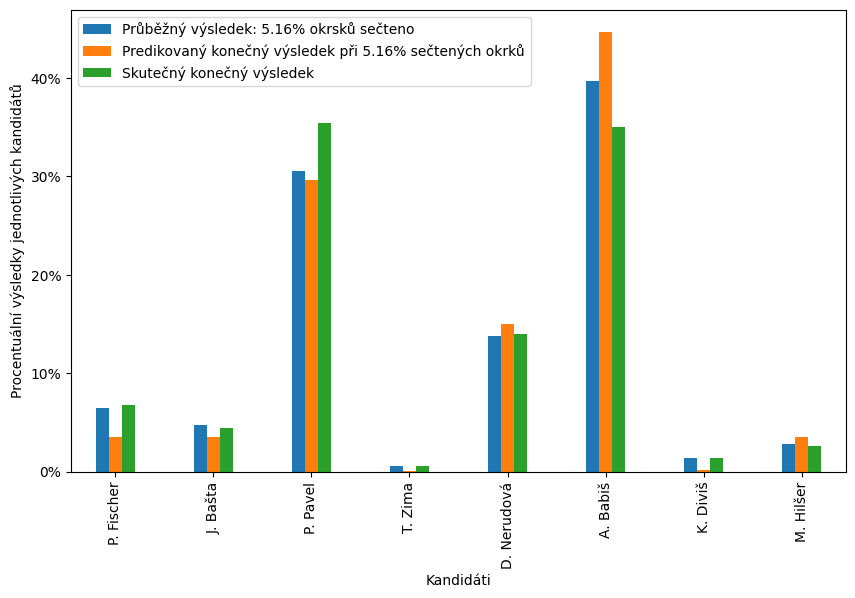

In [ ]:
def percentage(x, pos):
    return '{:.0%}'.format(x)

ax = vysledky.plot(kind='bar', figsize=(10, 6), width=0.4)

plt.xlabel('Kandidáti')
plt.ylabel('Procentuální výsledky jednotlivých kandidátů')

formatter = FuncFormatter(percentage)
ax.yaxis.set_major_formatter(formatter)

plt.legend()

plt.show()

In [ ]:
# POZOR, BEZI 10 MINUT

mse_list = []
rmse_list = []
forecast_dict = {col: [] for col in parties_cols}

# ZDE JEDU OD TRETI DAVKY, DRIVE TO NEJDE
for i in range(3, prez_2023_1_proc_df['davka'].max()):
  data_do_davky_i = prez_2023_1_proc_df[prez_2023_1_proc_df['davka'] <= i]
  clr_data_do_davky_i = apply_clr_transform(data_do_davky_i, parties_cols)
  clr_data_do_davky_i = pd.concat([clr_data_do_davky_i, prez_2023_1_proc_df['okrsku_secteno'][:i]], axis = "columns")
  clr_data_do_davky_i.columns = parties_cols + ['okrsku_secteno']

  for party in party_columns:
      model = pm.auto_arima(clr_data_do_davky_i[party], exogenous=clr_data_do_davky_i[['okrsku_secteno']],
                            start_p=1, start_q=1, max_p=3, max_q=3, seasonal=False,
                            trace=True, error_action='ignore', suppress_warnings=True)

      forecast = model.predict(n_periods=1, exogenous=[[1]])
      forecast_dict[party].append(forecast.values[0])

Výstupní stream byl oříznut na posledních 5000 řádků.
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=17.845, Time=0.47 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=15.998, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=15.922, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=17.230, Time=0.12 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=14.025, Time=0.20 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=12.261, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.53 sec

Best model:  ARIMA(0,0,0)(0,0,0)[0] intercept
Total fit time: 1.689 seconds
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=23.770, Time=0.29 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=20.585, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=21.812, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=22.219, Time=0.11 sec
 ARIMA(0,0,0)(0,0,0)[

In [ ]:
forecast_dict_copy = forecast_dict.copy()

In [ ]:
forecast_df = pd.DataFrame(forecast_dict_copy)
forecast_df.head()
for i in range(len(forecast_df)):
  forecast_df.iloc[i] = clr_inv([forecast_df.iloc[i]])
forecast_df.head()

,HLASY_1,HLASY_2,HLASY_4,HLASY_5,HLASY_6,HLASY_7,HLASY_8,HLASY_9
0,0.029291,0.029291,0.292940,0.000354,0.154317,0.463922,0.000595,0.029291
1,0.034716,0.034716,0.296625,0.000716,0.150247,0.446949,0.001315,0.034716
2,0.038361,0.038361,0.299106,0.001089,0.147571,0.435037,0.002114,0.038361
3,0.040922,0.040922,0.300760,0.001436,0.145521,0.426622,0.002897,0.040922
4,0.058910,0.042089,0.296924,0.001715,0.141434,0.413274,0.003567,0.042089


In [ ]:
for i in range(len(forecast_df)):
  predictions_i_davka = pd.DataFrame(forecast_df.iloc[i]).T
  mse = mean_squared_error(predictions_i_davka, final_results_prez_2023_1)
  mse_list.append(mse)
  rmse = sqrt(mse)
  rmse_list.append(rmse)

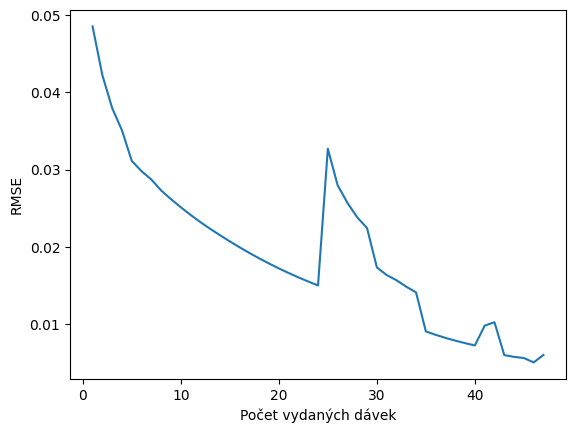

In [ ]:
x = range(1, 1 + len(rmse_list))
plt.plot(x, rmse_list)
plt.xlabel('Počet vydaných dávek')
plt.ylabel('RMSE')
plt.show()

In [ ]:
na_values_front = pd.Series([np.nan, np.nan])
na_values_back = pd.Series([np.nan])
rmse_list_ser = pd.Series(rmse_list)
rmse_list_ser = pd.concat([na_values_front, rmse_list_ser, na_values_back], ignore_index=True)

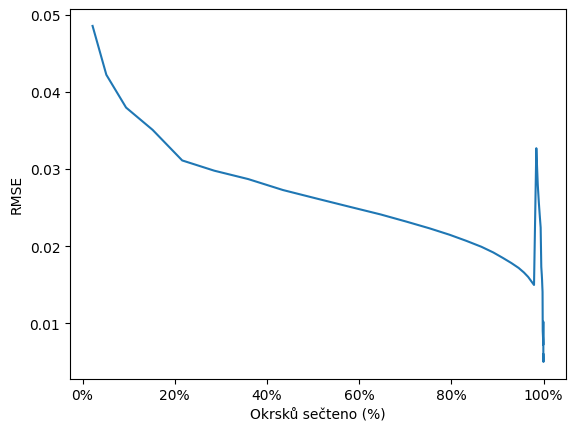

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter


def percentage(x, pos):
    return '{:.0%}'.format(x)


plt.plot(prez_2023_1_proc_df['okrsku_secteno'], rmse_list_ser)

plt.xlabel('Okrsků sečteno (%)')
plt.ylabel('RMSE')

formatter = FuncFormatter(percentage)
plt.gca().xaxis.set_major_formatter(formatter)

plt.show()

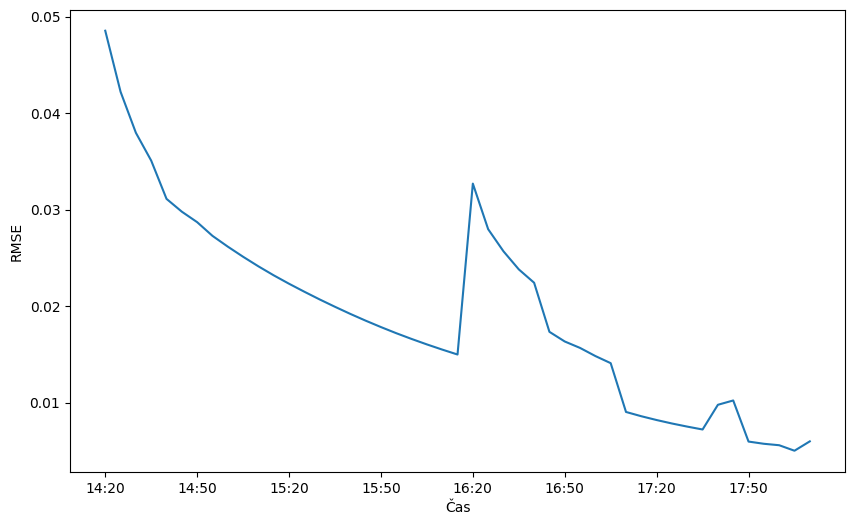

In [ ]:
n_points = len(rmse_list)

start_time = pd.Timestamp('2023-10-10 14:20')
time_labels = [(start_time + pd.Timedelta(minutes=5 * i)).strftime('%H:%M') for i in range(n_points)]

plt.figure(figsize=(10, 6))
plt.plot(range(1, n_points + 1), rmse_list)

plt.xticks(ticks=range(1, n_points + 1, 6), labels=time_labels[::6])  # Popisky každých 30 minut

plt.xlabel('Čas')
plt.ylabel('RMSE')

plt.show()

In [ ]:
predictions = dict(forecast_df)

prejmenovani_klicu_slovniku = {
    'HLASY_1': 'P. Fischer',
    'HLASY_2': 'J. Bašta',
    'HLASY_4': 'P. Pavel',
    'HLASY_5': 'T. Zima',
    'HLASY_6': 'D. Nerudová',
    'HLASY_7': 'A. Babiš',
    'HLASY_8': 'K. Diviš',
    'HLASY_9': 'M. Hilšer'
}

predikce_prejmenovany_dict = {prejmenovani_klicu_slovniku.get(k, k): v for k, v in predictions.items()}

In [ ]:
import pandas as pd
import numpy as np


modified_predikce_dict = {}

for key, values in predikce_prejmenovany_dict.items():
    modified_values = pd.concat([pd.Series([np.nan, np.nan]), values, pd.Series([np.nan])]).reset_index(drop=True)
    modified_predikce_dict[key] = modified_values

for key, values in modified_predikce_dict.items():
    print(f"{key}: {values.tolist()}")

P. Fischer: [nan, nan, 0.029290826580921938, 0.03471602408646415, 0.03836095049222237, 0.040921640596952955, 0.058909723172216565, 0.0592436706075434, 0.05953206014030707, 0.060785414850378826, 0.06109480635979023, 0.06138170972014333, 0.06166187257604602, 0.06191481249862235, 0.06213786846894306, 0.06234971908081189, 0.06254895095932264, 0.0627343644138835, 0.06291146901039961, 0.06308146359035328, 0.06324120069958948, 0.06338721965000615, 0.06352824239156907, 0.06366052001656085, 0.06378450640091482, 0.06389925034064996, 0.06833586027241825, 0.06744748092260766, 0.0671110362524954, 0.06735239922296894, 0.06721931169573657, 0.06838144831218712, 0.06829317256085761, 0.06073705729419681, 0.06192995502583765, 0.06257740674963023, 0.06452045957929406, 0.06481856928312885, 0.06505151842217326, 0.06524451419080755, 0.06540568860427687, 0.06554446030446996, 0.0646406628846979, 0.06453711501518501, 0.06613950244806123, 0.0662368052260622, 0.06628532160045483, 0.06685387109006283, 0.0660206034

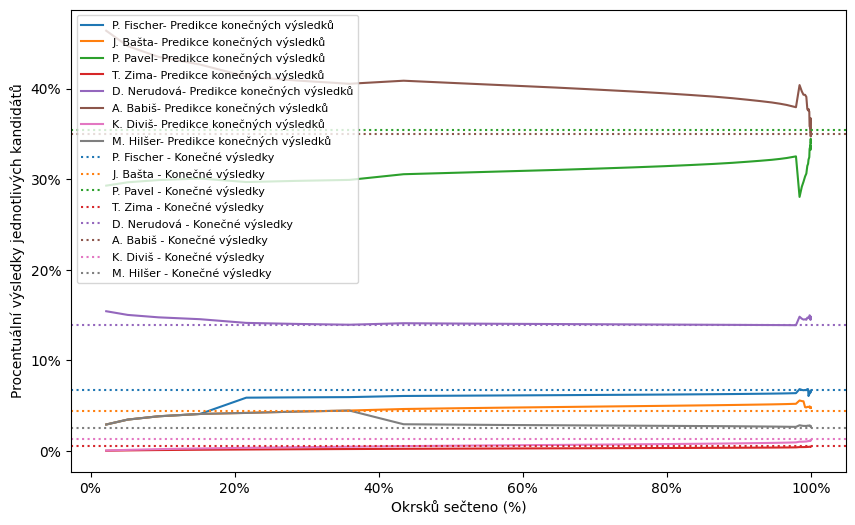

In [ ]:
from matplotlib.ticker import FuncFormatter
import matplotlib.pyplot as plt

prez_2023_1_original_data_proc = pd.read_csv('prez_2023_1_proc.csv')
prubeh = prez_2023_1_original_data_proc[['HLASY_1', 'HLASY_2', 'HLASY_4', 'HLASY_5', 'HLASY_6', 'HLASY_7', 'HLASY_8', 'HLASY_9']].copy()
konecne_vysledky = prubeh.iloc[-1]

def percentage(x, pos):
    return '{:.0%}'.format(x)

plt.figure(figsize=(10, 6))

for key, values in modified_predikce_dict.items():
    plt.plot(prez_2023_1_proc_df['okrsku_secteno'], values, label=key + '- Predikce konečných výsledků')

plt.axhline(y=konecne_vysledky['HLASY_1'], label="P. Fischer - Konečné výsledky", color='#1f77b4', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_2'], label="J. Bašta - Konečné výsledky", color='#ff7f0e', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_4'], label="P. Pavel - Konečné výsledky", color='#2ca02c', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_5'], label="T. Zima - Konečné výsledky", color='#d6272B', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_6'], label="D. Nerudová - Konečné výsledky", color='#9467bd', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_7'], label="A. Babiš - Konečné výsledky", color='#8c564b', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_8'], label="K. Diviš - Konečné výsledky", color='#e377c2', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_9'], label="M. Hilšer - Konečné výsledky", color='#7f7f7f', linestyle='dotted')

plt.xlabel('Okrsků sečteno (%)')
plt.ylabel('Procentuální výsledky jednotlivých kandidátů')

ax = plt.gca()

formatter = FuncFormatter(percentage)
ax.yaxis.set_major_formatter(formatter)
ax.xaxis.set_major_formatter(formatter)

plt.legend(loc='upper left', fontsize=8)

plt.show()

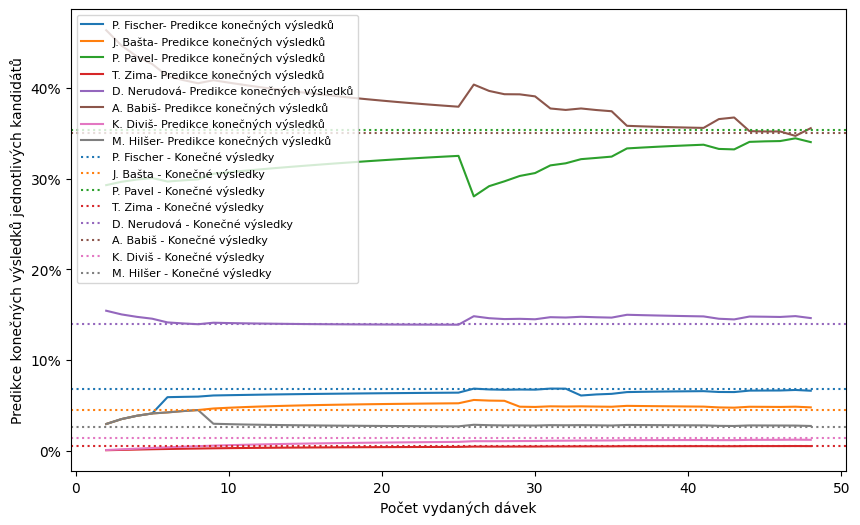

In [ ]:
from matplotlib.ticker import FuncFormatter

prubeh = prez_2023_1_original_data_proc[['HLASY_1', 'HLASY_2', 'HLASY_4', 'HLASY_5', 'HLASY_6', 'HLASY_7', 'HLASY_8', 'HLASY_9']].copy()
konecne_vysledky = prubeh.iloc[-1]

def percentage(x, pos):
    return '{:.0%}'.format(x)

plt.figure(figsize=(10, 6))

for key, values in modified_predikce_dict.items():
    plt.plot(values, label=key + '- Predikce konečných výsledků')

plt.axhline(y=konecne_vysledky['HLASY_1'], label="P. Fischer - Konečné výsledky", color='#1f77b4', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_2'], label="J. Bašta - Konečné výsledky", color='#ff7f0e', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_4'], label="P. Pavel - Konečné výsledky", color='#2ca02c', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_5'], label="T. Zima - Konečné výsledky", color='#d6272B', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_6'], label="D. Nerudová - Konečné výsledky", color='#9467bd', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_7'], label="A. Babiš - Konečné výsledky", color='#8c564b', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_8'], label="K. Diviš - Konečné výsledky", color='#e377c2', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_9'], label="M. Hilšer - Konečné výsledky", color='#7f7f7f', linestyle='dotted')

plt.xlabel('Počet vydaných dávek')
plt.ylabel('Predikce konečných výsledků jednotlivých kandidátů')

ax = plt.gca()

formatter = FuncFormatter(percentage)
ax.yaxis.set_major_formatter(formatter)

plt.legend(loc='upper left', fontsize=8)

plt.show()

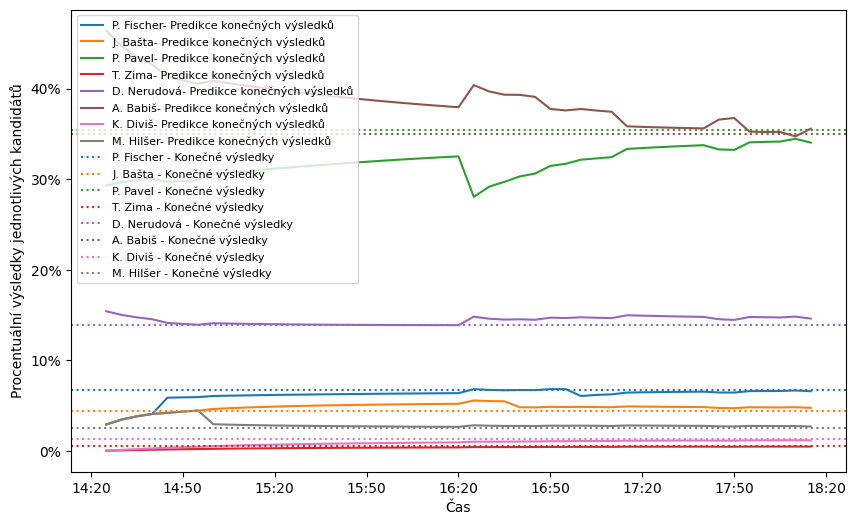

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.ticker import FuncFormatter


prubeh = prez_2023_1_original_data_proc[['HLASY_1', 'HLASY_2', 'HLASY_4', 'HLASY_5', 'HLASY_6', 'HLASY_7', 'HLASY_8', 'HLASY_9']].copy()
konecne_vysledky = prubeh.iloc[-1]

def percentage(x, pos):
    return '{:.0%}'.format(x)

n_points = len(next(iter(modified_predikce_dict.values())))

start_time = pd.Timestamp('2023-01-14 14:20')
time_labels = [(start_time + pd.Timedelta(minutes=5 * i)).strftime('%H:%M') for i in range(n_points)]

plt.figure(figsize=(10, 6))

for key, values in modified_predikce_dict.items():
    plt.plot(values, label=key + '- Predikce konečných výsledků')

plt.axhline(y=konecne_vysledky['HLASY_1'], label="P. Fischer - Konečné výsledky", color='#1f77b4', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_2'], label="J. Bašta - Konečné výsledky", color='#ff7f0e', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_4'], label="P. Pavel - Konečné výsledky", color='#2ca02c', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_5'], label="T. Zima - Konečné výsledky", color='#d6272B', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_6'], label="D. Nerudová - Konečné výsledky", color='#9467bd', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_7'], label="A. Babiš - Konečné výsledky", color='#8c564b', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_8'], label="K. Diviš - Konečné výsledky", color='#e377c2', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_9'], label="M. Hilšer - Konečné výsledky", color='#7f7f7f', linestyle='dotted')

plt.xlabel('Čas')
plt.ylabel('Procentuální výsledky jednotlivých kandidátů')

ax = plt.gca()

formatter = FuncFormatter(percentage)
ax.yaxis.set_major_formatter(formatter)

plt.xticks(ticks=range(1, n_points + 1, 6), labels=time_labels[::6])

plt.legend(loc='upper left', fontsize=8)

plt.show()

In [ ]:
avg_rmse_arima_1 = sum(rmse_list) / len(rmse_list)
print(f"Průměrný RMSE pro model ARIMA a 1. kolo prezidentských voleb v roce 2023 je {avg_rmse_arima_1}.")

Průměrný RMSE pro model ARIMA a 1. kolo prezidentských voleb v roce 2023 je 0.019292843123034007.


In [ ]:
rmse_list_ARIMA_1 = rmse_list
rmse_arima_df = pd.DataFrame(rmse_list_ARIMA_1)
rmse_arima_df.rename(columns = {0: 'ARIMA_1'}, inplace = True)
rmse_arima_df.to_csv('rmse_ARIMA_1.csv')

### Predikce prez voleb 2023 2. kolo

In [ ]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt

In [ ]:
prez_2023_2_proc_df = pd.read_csv('prez_2023_2_proc.csv')
prez_2023_2_proc_df.head()

,davka,HLASY_4,HLASY_7,okrsku_secteno,volebni_ucast
0,1,0.547267,0.452733,0.003971,0.693168
1,2,0.527929,0.472071,0.024164,0.702844
2,3,0.529816,0.470184,0.066501,0.684922
3,4,0.534290,0.465710,0.131520,0.686718
4,5,0.539061,0.460939,0.210944,0.684321


In [ ]:
pip install composition-stats

In [ ]:
from composition_stats import clr, clr_inv


def replace_zeros(data, epsilon=1e-6):
    return data.replace(0, epsilon)


def apply_clr_transform(data, parties_cols):

    non_zero_data = replace_zeros(data[parties_cols])
    clr_data = clr(non_zero_data.values)

    if clr_data.ndim == 1:
        return pd.DataFrame([clr_data], columns=[f'clr_{i+1}' for i in range(clr_data.shape[0])])
    else:
        return pd.DataFrame(clr_data, columns=[f'clr_{i+1}' for i in range(clr_data.shape[1])])


def apply_clr_inverse_transform(clr_pred):
    pred_proportions = clr_inv(clr_pred)
    return pred_proportions


In [ ]:
parties_cols = [col for col in prez_2023_2_proc_df.columns if col.startswith('HLASY_')]
clr_data = apply_clr_transform(prez_2023_2_proc_df, parties_cols)

In [ ]:
clr_data_train = clr_data[:3] # 6% okrsku secteno
clr_data_test = clr_data[3:]
clr_data_train = pd.concat([clr_data_train, prez_2023_1_proc_df['okrsku_secteno'][:3,]], axis = "columns")
clr_data_train.columns = parties_cols + ['okrsku_secteno']

In [ ]:
prez_2023_2_proc_df_train = prez_2023_2_proc_df[:3]

start_time = pd.Timestamp('2023-01-14 14:20')
time_list = [start_time + pd.Timedelta(minutes=5 * i) for i in range(3)]
time_list_formatted = pd.Series([time.strftime('%H:%M') for time in time_list])
time_list_formatted.name = "Times"

prez_2023_2_proc_df_train = pd.concat([prez_2023_2_proc_df_train, time_list_formatted], axis = 1)
prez_2023_2_proc_df_train

,davka,HLASY_4,HLASY_7,okrsku_secteno,volebni_ucast,Times
0,1,0.547267,0.452733,0.003971,0.693168,14:20
1,2,0.527929,0.472071,0.024164,0.702844,14:25
2,3,0.529816,0.470184,0.066501,0.684922,14:30


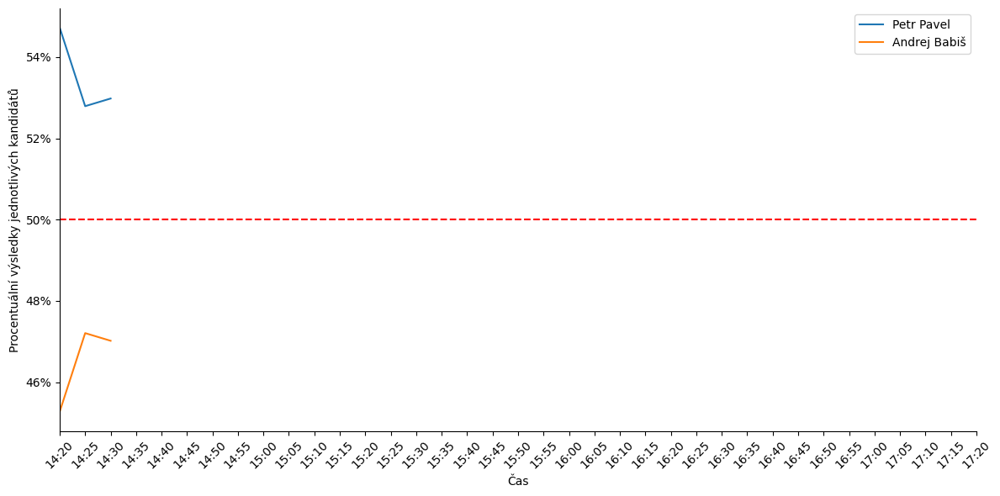

In [ ]:
import pandas as pd
from matplotlib import pyplot as plt

fig, ax = plt.subplots(figsize=(12, 6))

prez_2023_2_proc_df_train.plot(x='Times', y='HLASY_4', kind='line', ax=ax, label='Petr Pavel')
prez_2023_2_proc_df_train.plot(x='Times', y='HLASY_7', kind='line', ax=ax, label='Andrej Babiš')

plt.xlabel('Čas')

start_time = pd.Timestamp('2023-01-14 14:20')
end_time = pd.Timestamp('2023-01-14 17:20')
time_range = pd.date_range(start=start_time, end=end_time, freq='5min').strftime('%H:%M')

ax.set_xticks(range(len(time_range)))
ax.set_xticklabels(time_range, rotation=45)

ax.set_xlim([0, len(time_range) - 1])

ax.yaxis.set_major_formatter(formatter)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.ylabel('Procentuální výsledky jednotlivých kandidátů')

plt.axhline(y=0.5, color='r', linestyle='--')

plt.legend(loc='upper right')

plt.tight_layout()
plt.show()

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


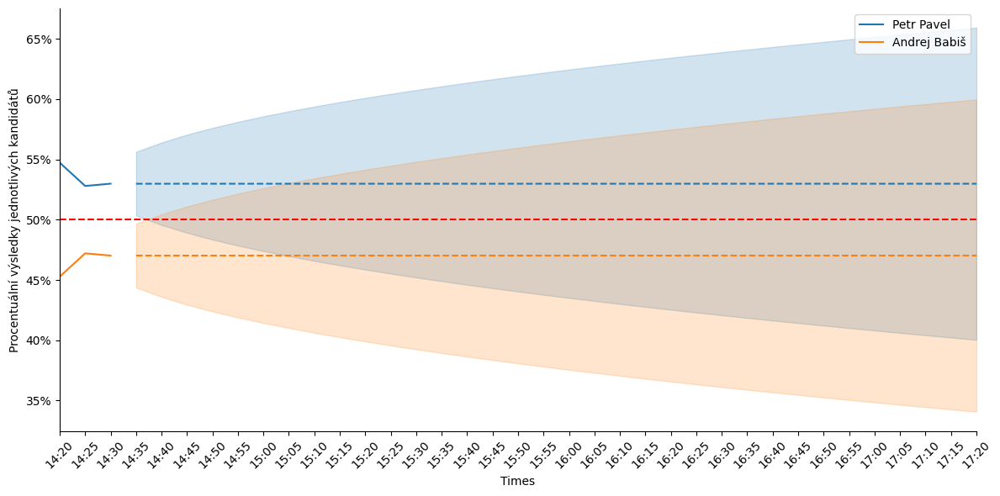

In [ ]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
from statsmodels.tsa.arima.model import ARIMA
from matplotlib.ticker import FuncFormatter

fig, ax = plt.subplots(figsize=(12, 6))

prez_2023_2_proc_df_train.plot(x='Times', y='HLASY_4', kind='line', ax=ax, label='Petr Pavel', color='#1f77b4')
prez_2023_2_proc_df_train.plot(x='Times', y='HLASY_7', kind='line', ax=ax, label='Andrej Babiš', color='#ff7f0e')

start_time = pd.Timestamp('2023-01-14 14:20')
end_time = pd.Timestamp('2023-01-14 17:20')
time_range = pd.date_range(start=start_time, end=end_time, freq='5min').strftime('%H:%M')

ax.set_xticks(range(len(time_range)))
ax.set_xticklabels(time_range, rotation=45)

ax.set_xlim([0, len(time_range) - 1])

def arima_forecast_and_plot(data, label, color):
    last_known_values = data.values

    model = ARIMA(last_known_values, order=(1, 1, 1))
    model_fit = model.fit()

    n_forecast = len(time_range) - len(last_known_values)
    forecast = model_fit.get_forecast(steps=n_forecast)
    pred_values = forecast.predicted_mean
    conf_int = forecast.conf_int()

    future_times = np.arange(len(last_known_values), len(time_range))
    plt.plot(future_times, pred_values, linestyle='--', color=color)
    plt.fill_between(future_times, conf_int[:, 0], conf_int[:, 1], color=color, alpha=0.2)


arima_forecast_and_plot(prez_2023_2_proc_df_train['HLASY_4'], 'Petr Pavel', '#1f77b4')
arima_forecast_and_plot(prez_2023_2_proc_df_train['HLASY_7'], 'Andrej Babiš', '#ff7f0e')

formatter = FuncFormatter(lambda y, _: f'{y:.0%}')
ax.yaxis.set_major_formatter(formatter)

plt.axhline(y=0.5, color='red', linestyle='--')

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.ylabel('Procentuální výsledky jednotlivých kandidátů')

plt.legend(loc='upper right')

plt.tight_layout()
plt.show()

In [ ]:
"""
# testy stacionarity
from statsmodels.tsa.stattools import adfuller


# Pass in a time series and an optional title, returns an ADF report


def adf_test(series,title=''):
    print(f'Augmented Dickey-Fuller Test: {title}')
    result = adfuller(series.dropna(),autolag='AIC')
# .dropna() handles differenced data
    labels = ['ADF test statistic','p-value','# lags used','# observations']
    out = pd.Series(result[0:4],index=labels)
    for key,val in result[4].items():
        out[f'critical value ({key})']=val
    print(out.to_string())
# .to_string() removes the line "dtype: float64"
    if result[1] <= 0.05:
        print("Strong evidence against the null hypothesis")
        print("Reject the null hypothesis")
        print("Data has no unit root and is stationary")
    else:
        print("Weak evidence against the null hypothesis")
        print("Fail to reject the null hypothesis")
        print("Data has a unit root and is non-stationary")

for party in parties_cols:
    print(adf_test(clr_data_train[party]))
"""

'\n# testy stacionarity\nfrom statsmodels.tsa.stattools import adfuller\n\n\n# Pass in a time series and an optional title, returns an ADF report\n\n\ndef adf_test(series,title=\'\'):\n    print(f\'Augmented Dickey-Fuller Test: {title}\')\n    result = adfuller(series.dropna(),autolag=\'AIC\')\n# .dropna() handles differenced data\n    labels = [\'ADF test statistic\',\'p-value\',\'# lags used\',\'# observations\']\n    out = pd.Series(result[0:4],index=labels)\n    for key,val in result[4].items():\n        out[f\'critical value ({key})\']=val\n    print(out.to_string())\n# .to_string() removes the line "dtype: float64"\n    if result[1] <= 0.05:\n        print("Strong evidence against the null hypothesis")\n        print("Reject the null hypothesis")\n        print("Data has no unit root and is stationary")\n    else:\n        print("Weak evidence against the null hypothesis")\n        print("Fail to reject the null hypothesis")\n        print("Data has a unit root and is non-station

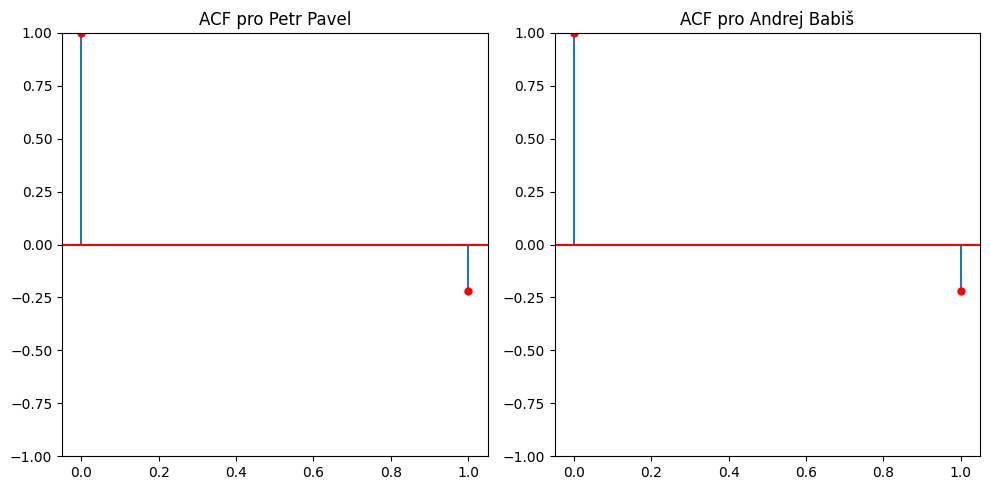

In [ ]:
# ACF
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf


fig, axes = plt.subplots(1, 2, figsize=(10, 5))

labels = ["Petr Pavel", "Andrej Babiš"]

for i, party in enumerate(parties_cols):

    plot_acf(clr_data_train[party], ax=axes[i], color="red", alpha=0.05)
    axes[i].set_title(f'ACF pro {labels[i]}')


plt.tight_layout()
plt.show()


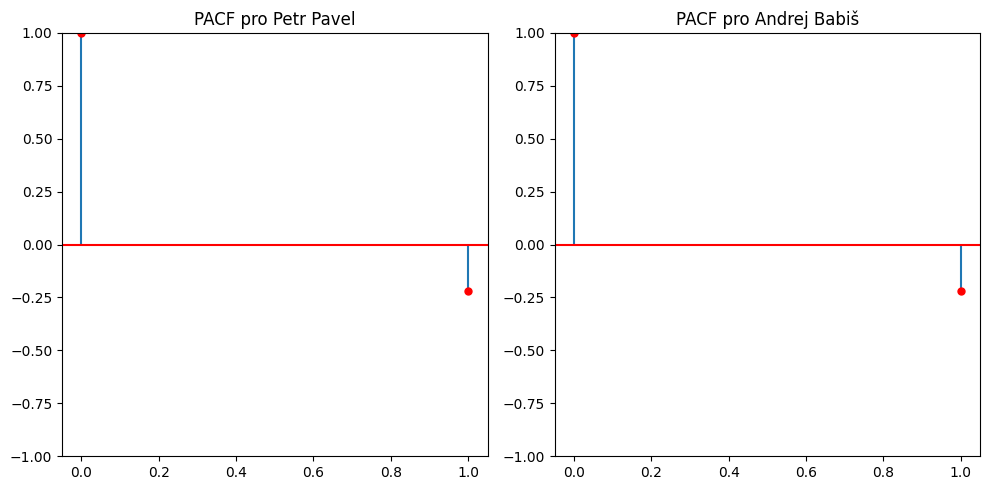

In [ ]:
# PACF
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf


fig, axes = plt.subplots(1, 2, figsize=(10, 5))

for i, party in enumerate(parties_cols[:2]):

    plot_pacf(clr_data_train[party], ax=axes[i], color="red", alpha=0.05)
    axes[i].set_title(f'PACF pro {labels[i]}')

plt.tight_layout()
plt.show()

In [ ]:
pip install pmdarima

In [ ]:
import pmdarima as pm
import pandas as pd
import matplotlib.pyplot as plt


party_columns = [col for col in prez_2023_2_proc_df.columns if col.startswith('HLASY_')]
forecast_dict = {}

for party in party_columns:

    model = pm.auto_arima(clr_data_train[party], exogenous=clr_data_train[['okrsku_secteno']],
                          start_p=1, start_q=1, max_p=5, max_q=5, seasonal=False,
                          trace=True, error_action='ignore', suppress_warnings=True)


    forecast = model.predict(n_periods=1, exogenous=[[1]])
    forecast_dict[party] = forecast.values[0]

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=-5.120, Time=0.61 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-5.248, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=-6.990, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=inf, Time=0.16 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=-10.096, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=-11.755, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=-9.020, Time=0.38 sec

Best model:  ARIMA(0,0,0)(0,0,0)[0] intercept
Total fit time: 1.729 seconds
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=-5.120, Time=0.61 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-5.248, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=-6.990, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=inf, Time=0.36 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=-10.096, Time=0.33 sec
 ARIMA(0,0,

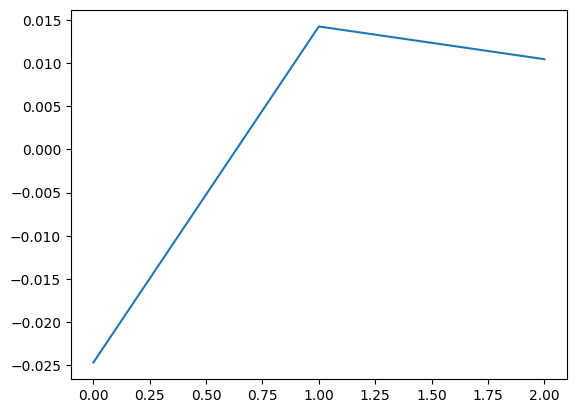

Ljung-Box test:
     lb_stat  lb_pvalue
2  1.538958   0.463254


In [ ]:
import statsmodels.api as sm

residuals = model.resid()
residuals.plot()
plt.show()

# Ljung-Box test (test na náhodnost reziduí)
ljung_box_test = sm.stats.acorr_ljungbox(residuals, lags=[2], return_df=True)
print("Ljung-Box test:\n", ljung_box_test)
# p-hodnota > 0.05: Nemáme dostatek důkazů pro zamítnutí nulové hypotézy, což znamená, že rezidua se chovají jako náhodná (nejsou autokorelovaná). Model je tedy dobře specifikovaný

In [ ]:
final_predictions_arima = clr_inv([value for key, value in forecast_dict.items()])
final_predictions_arima = pd.DataFrame(final_predictions_arima).T
final_predictions_arima.columns = parties_cols
final_predictions_arima

,HLASY_4,HLASY_7
0,0.535015,0.464985


In [ ]:
final_results_prez_2023_2 = prez_2023_2_proc_df[prez_2023_2_proc_df['okrsku_secteno'] == 1]
final_results_prez_2023_2.drop(columns = ['davka', 'okrsku_secteno', 'volebni_ucast'], axis = 1, inplace = True)
final_results_prez_2023_2

<ipython-input-198-5d38c2fb44b1>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  final_results_prez_2023_2.drop(columns = ['davka', 'okrsku_secteno', 'volebni_ucast'], axis = 1, inplace = True)


,HLASY_4,HLASY_7
39,0.583293,0.416707


In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

mse = mean_squared_error(final_predictions_arima, final_results_prez_2023_2)
rmse = sqrt(mse)
print(rmse)

0.04827771310096737


In [ ]:
prez_2023_2_train_last_row = pd.DataFrame(prez_2023_2_proc_df.iloc[len(clr_data_train)-1, :]).T
procent_secteno = prez_2023_2_train_last_row['okrsku_secteno'].values[0]
prez_2023_2_train_last_row.drop(['davka', 'okrsku_secteno', 'volebni_ucast'], axis = 1, inplace = True)
prez_2023_2_train_last_row.head()

,HLASY_4,HLASY_7
2,0.529816,0.470184


In [ ]:
vysledky = pd.concat([prez_2023_2_train_last_row, final_predictions_arima, final_results_prez_2023_2])
vysledky = vysledky.T
vysledky.index = ['P. Pavel', 'A. Babiš']
popisek_prubeh = "Průběžný výsledek: " + str(round(procent_secteno * 100, 2)) + "% okrsků sečteno"
popisek_predikce = "Predikovaný konečný výsledek při " + str(round(procent_secteno * 100, 2)) + "% sečtených okrků"
vysledky.columns = [popisek_prubeh, popisek_predikce, 'Skutečný konečný výsledek']
vysledky

,Průběžný výsledek: 6.65% okrsků sečteno,Predikovaný konečný výsledek při 6.65% sečtených okrků,Skutečný konečný výsledek
P. Pavel,0.529816,0.535015,0.583293
A. Babiš,0.470184,0.464985,0.416707


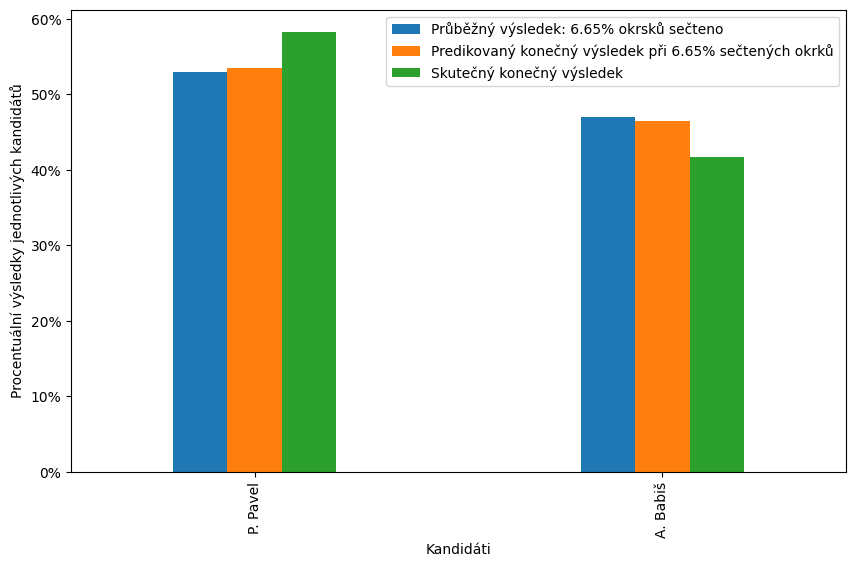

In [ ]:
from matplotlib.ticker import FuncFormatter


def percentage(x, pos):
    return '{:.0%}'.format(x)


ax = vysledky.plot(kind='bar', figsize=(10, 6), width=0.4)  # Adjust the width as needed

plt.xlabel('Kandidáti')
plt.ylabel('Procentuální výsledky jednotlivých kandidátů')

formatter = FuncFormatter(percentage)
ax.yaxis.set_major_formatter(formatter)

plt.legend()

plt.show()

In [ ]:
mse_list = []
rmse_list = []
forecast_dict_2 = {col: [] for col in parties_cols}

for i in range(3, prez_2023_2_proc_df['davka'].max()):
  data_do_davky_i = prez_2023_2_proc_df[prez_2023_2_proc_df['davka'] <= i]
  clr_data_do_davky_i = apply_clr_transform(data_do_davky_i, parties_cols)
  clr_data_do_davky_i = pd.concat([clr_data_do_davky_i, prez_2023_2_proc_df['okrsku_secteno'][:i]], axis = "columns")
  clr_data_do_davky_i.columns = parties_cols + ['okrsku_secteno']

  for party in party_columns:

      model = pm.auto_arima(clr_data_do_davky_i[party], exogenous=clr_data_do_davky_i[['okrsku_secteno']],
                            start_p=1, start_q=1, max_p=5, max_q=5, seasonal=False,
                            trace=True, error_action='ignore', suppress_warnings=True)

      forecast = model.predict(n_periods=1, exogenous=[[1]])
      forecast_dict_2[party].append(forecast.values[0])

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=-5.120, Time=0.22 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-5.248, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=-6.990, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=inf, Time=0.08 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=-10.096, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=-11.755, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=-9.020, Time=0.55 sec

Best model:  ARIMA(0,0,0)(0,0,0)[0] intercept
Total fit time: 1.590 seconds
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=-5.120, Time=2.63 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-5.248, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=-6.990, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=inf, Time=2.41 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=-10.096, Time=0.39 sec
 ARIMA(0,0,

In [ ]:
forecast_dict_copy = forecast_dict_2.copy()

In [ ]:
forecast_df = pd.DataFrame(forecast_dict_copy)
forecast_df.head()
for i in range(len(forecast_df)):
  forecast_df.iloc[i] = clr_inv([forecast_df.iloc[i]])
forecast_df.head()

,HLASY_4,HLASY_7
0,0.535015,0.464985
1,0.534834,0.465166
2,0.535680,0.464320
3,0.536567,0.463433
4,0.537611,0.462389


In [ ]:
for i in range(len(forecast_df)):
  predictions_i_davka = pd.DataFrame(forecast_df.iloc[i]).T
  mse = mean_squared_error(predictions_i_davka, final_results_prez_2023_2)
  mse_list.append(mse)
  rmse = sqrt(mse)
  rmse_list.append(rmse)

In [ ]:
na_values_front = pd.Series([np.nan, np.nan])
na_values_back = pd.Series([np.nan])
rmse_list_ser = pd.Series(rmse_list)
rmse_list_ser = pd.concat([na_values_front, rmse_list_ser, na_values_back], ignore_index=True)

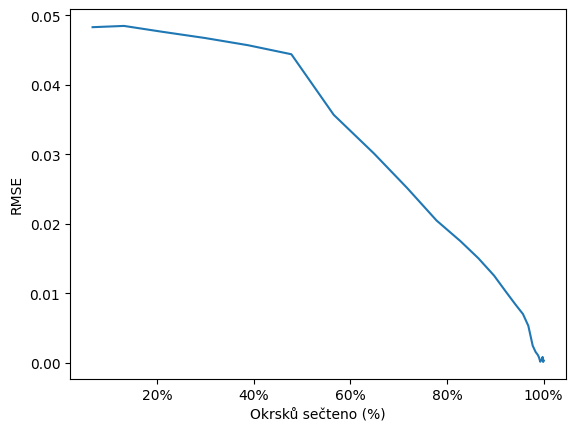

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

def percentage(x, pos):
    return '{:.0%}'.format(x)

plt.plot(prez_2023_2_proc_df['okrsku_secteno'], rmse_list_ser)

plt.xlabel('Okrsků sečteno (%)')
plt.ylabel('RMSE')

formatter = FuncFormatter(percentage)
plt.gca().xaxis.set_major_formatter(formatter)

plt.show()

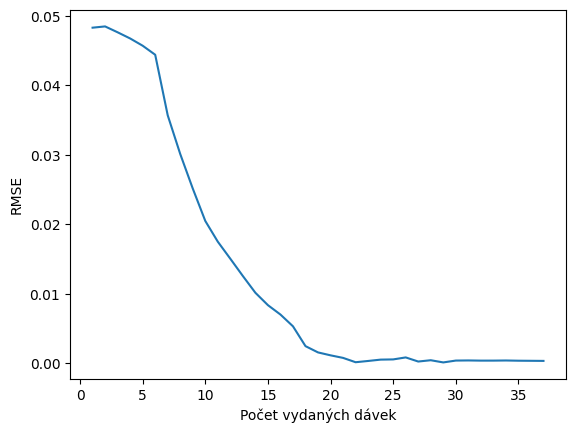

In [ ]:
x = range(1, 1 + len(rmse_list))
plt.plot(x, rmse_list)
plt.xlabel('Počet vydaných dávek')
plt.ylabel('RMSE')
plt.show()

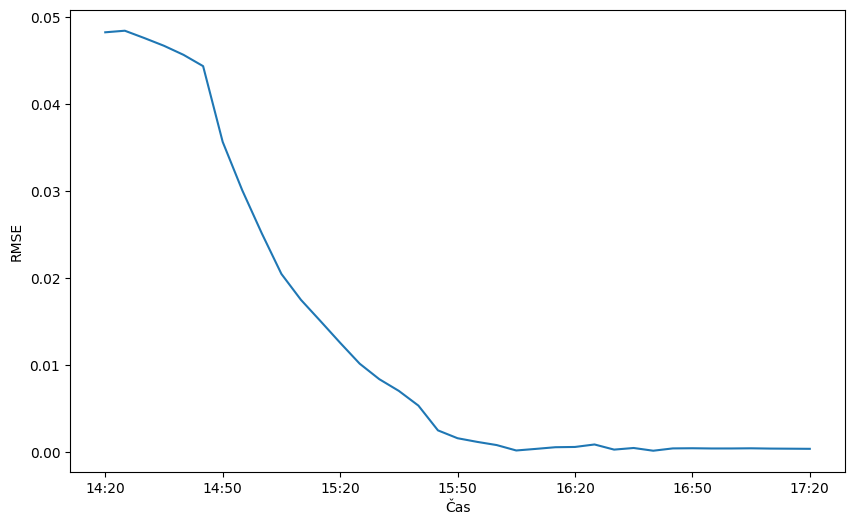

In [ ]:
n_points = len(rmse_list)

start_time = pd.Timestamp('2023-10-10 14:20')
time_labels = [(start_time + pd.Timedelta(minutes=5 * i)).strftime('%H:%M') for i in range(n_points)]

plt.figure(figsize=(10, 6))
plt.plot(range(1, n_points + 1), rmse_list)

plt.xticks(ticks=range(1, n_points + 1, 6), labels=time_labels[::6])  # Popisky každých 30 minut

plt.xlabel('Čas')
plt.ylabel('RMSE')

plt.show()

In [ ]:
predictions = dict(forecast_df)

prejmenovani_klicu_slovniku = {
    'HLASY_4': 'P. Pavel',
    'HLASY_7': 'A. Babiš'
}

predikce_prejmenovany_dict = {prejmenovani_klicu_slovniku.get(k, k): v for k, v in predictions.items()}

In [ ]:
import pandas as pd
import numpy as np


modified_predikce_dict = {}

for key, values in predikce_prejmenovany_dict.items():

    modified_values = pd.concat([pd.Series([np.nan, np.nan]), values, pd.Series([np.nan])]).reset_index(drop=True)
    modified_predikce_dict[key] = modified_values

for key, values in modified_predikce_dict.items():
    print(f"{key}: {values.tolist()}")

P. Pavel: [nan, nan, 0.535015380261495, 0.5348339602129625, 0.5356798311622647, 0.5365672654328733, 0.5376107006996553, 0.5389103918390572, 0.5476255879286226, 0.5531984647039994, 0.5581630720557447, 0.562824487874277, 0.5658109102282476, 0.5682633949037422, 0.5707487320831753, 0.5731570750195178, 0.5749372068310382, 0.5762887746976736, 0.5779814344884259, 0.5808343109031144, 0.5817372809180966, 0.5821562591204357, 0.5825248224471389, 0.5831477445431537, 0.5836203255499163, 0.5838129649097163, 0.5838432877940853, 0.584129396806895, 0.5835383012137999, 0.5837249858602196, 0.5834101411523998, 0.5836767693708611, 0.5836944694610038, 0.5836682721236857, 0.5836697793590236, 0.583688349839827, 0.5836561776382774, 0.5836431121699241, 0.5836287281812307, nan]
A. Babiš: [nan, nan, 0.46498461973850497, 0.4651660397870374, 0.46432016883773536, 0.46343273456712664, 0.46238929930034484, 0.4610896081609429, 0.4523744120713774, 0.44680153529600064, 0.44183692794425516, 0.43717551212572303, 0.43418908

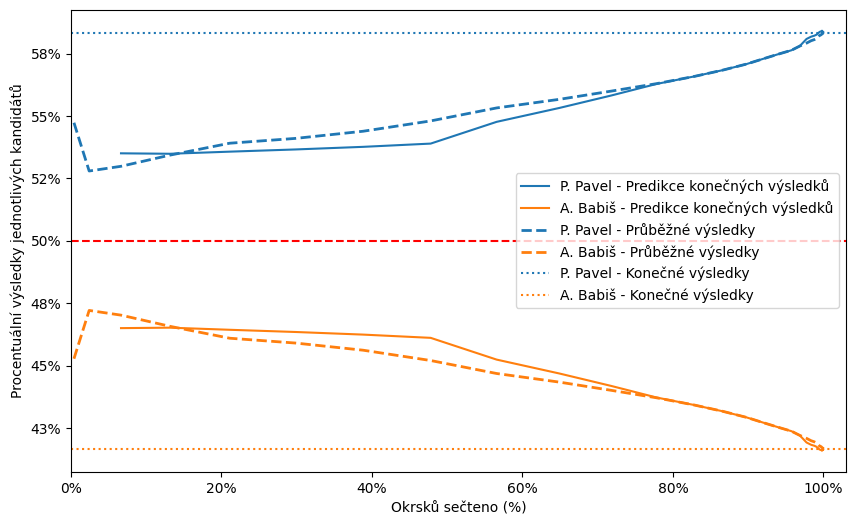

In [ ]:
from matplotlib.ticker import FuncFormatter
import matplotlib.pyplot as plt

prez_2023_2_original_data_proc = pd.read_csv('prez_2023_2_proc.csv')
prubeh = prez_2023_2_original_data_proc[['HLASY_4', 'HLASY_7']].copy()
konecne_vysledky = prubeh.iloc[-1]

def percentage(x, pos):
    return '{:.0%}'.format(x)

plt.figure(figsize=(10, 6))

for key, values in modified_predikce_dict.items():
    plt.plot(prez_2023_2_proc_df['okrsku_secteno'], values, label=key + ' - Predikce konečných výsledků')

plt.plot(prez_2023_2_proc_df['okrsku_secteno'], prubeh['HLASY_4'], label="P. Pavel - Průběžné výsledky", color='#1f77b4', linestyle='--', linewidth=2)
plt.plot(prez_2023_2_proc_df['okrsku_secteno'], prubeh['HLASY_7'], label="A. Babiš - Průběžné výsledky", color='#ff7f0e', linestyle='--', linewidth=2)

plt.axhline(y=konecne_vysledky['HLASY_4'], label="P. Pavel - Konečné výsledky", color='#1f77b4', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_7'], label="A. Babiš - Konečné výsledky", color='#ff7f0e', linestyle='dotted')

plt.xlabel('Okrsků sečteno (%)')
plt.ylabel('Procentuální výsledky jednotlivých kandidátů')

ax = plt.gca()

formatter = FuncFormatter(percentage)
ax.yaxis.set_major_formatter(formatter)
ax.xaxis.set_major_formatter(formatter)

plt.axhline(y=0.5, color='red', linestyle='--')
plt.xlim(0, 1.03)

plt.legend()

plt.show()

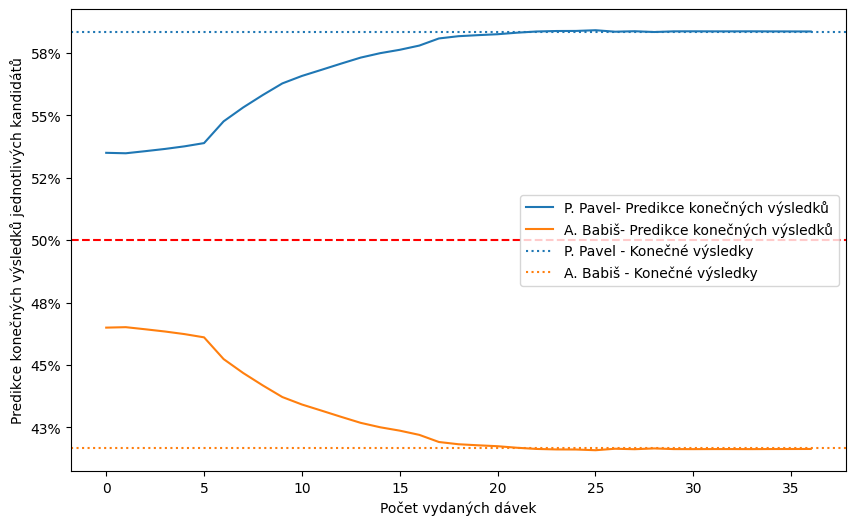

In [ ]:
from matplotlib.ticker import FuncFormatter

prez_2023_2_original_data_proc = pd.read_csv('prez_2023_2_proc.csv')
prubeh = prez_2023_2_original_data_proc[['HLASY_4', 'HLASY_7']].copy()
konecne_vysledky = prubeh.iloc[-1]

def percentage(x, pos):
    return '{:.0%}'.format(x)


plt.figure(figsize=(10, 6))

for key, values in predikce_prejmenovany_dict.items():
    plt.plot(values, label=key + '- Predikce konečných výsledků')

plt.axhline(y=konecne_vysledky['HLASY_4'], label="P. Pavel - Konečné výsledky", color='#1f77b4', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_7'], label="A. Babiš - Konečné výsledky", color='#ff7f0e', linestyle='dotted')

plt.xlabel('Počet vydaných dávek')
plt.ylabel('Predikce konečných výsledků jednotlivých kandidátů')

plt.axhline(y=0.5, color='red', linestyle='--')

ax = plt.gca()

formatter = FuncFormatter(percentage)
ax.yaxis.set_major_formatter(formatter)

plt.legend()

plt.show()

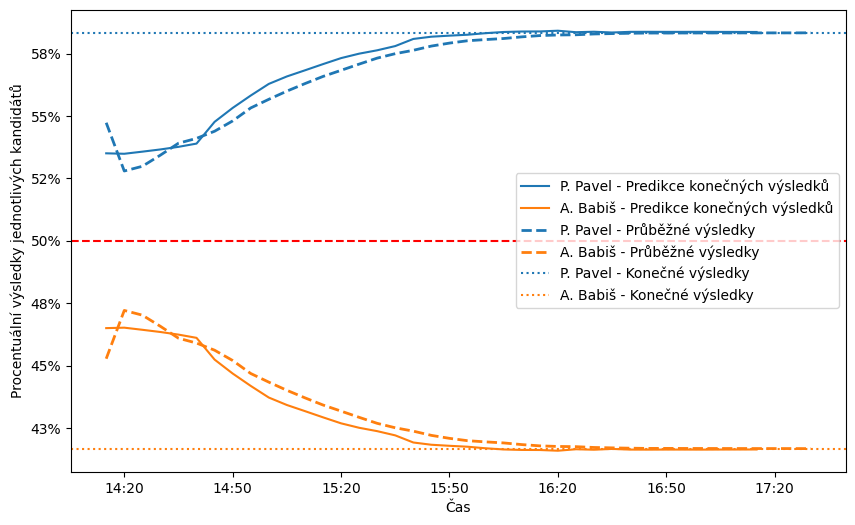

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.ticker import FuncFormatter

prez_2023_2_original_data_proc = pd.read_csv('prez_2023_2_proc.csv')
prubeh = prez_2023_2_original_data_proc[['HLASY_4', 'HLASY_7']].copy()
konecne_vysledky = prubeh.iloc[-1]

def percentage(x, pos):
    return '{:.0%}'.format(x)


n_points = len(next(iter(predikce_prejmenovany_dict.values())))

start_time = pd.Timestamp('2023-01-28 14:20')
time_labels = [(start_time + pd.Timedelta(minutes=5 * i)).strftime('%H:%M') for i in range(n_points)]

plt.figure(figsize=(10, 6))

for key, values in predikce_prejmenovany_dict.items():
    plt.plot(values, label=key + ' - Predikce konečných výsledků')

plt.plot(prubeh['HLASY_4'], label="P. Pavel - Průběžné výsledky", color='#1f77b4', linestyle='--', linewidth=2)
plt.plot(prubeh['HLASY_7'], label="A. Babiš - Průběžné výsledky", color='#ff7f0e', linestyle='--', linewidth=2)

plt.axhline(y=konecne_vysledky['HLASY_4'], label="P. Pavel - Konečné výsledky", color='#1f77b4', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_7'], label="A. Babiš - Konečné výsledky", color='#ff7f0e', linestyle='dotted')

plt.xlabel('Čas')
plt.ylabel('Procentuální výsledky jednotlivých kandidátů')

plt.axhline(y=0.5, color='red', linestyle='--')

ax = plt.gca()

formatter = FuncFormatter(percentage)
ax.yaxis.set_major_formatter(formatter)

plt.xticks(ticks=range(1, n_points + 1, 6), labels=time_labels[::6])

plt.xlim()

plt.legend()

plt.show()

In [ ]:
avg_rmse_arima_2 = sum(rmse_list) / len(rmse_list)
print(f"Průměrný RMSE pro model ARIMA a 2. kolo prezidentských voleb v roce 2023 je {avg_rmse_arima_2}.")

Průměrný RMSE pro model ARIMA a 2. kolo prezidentských voleb v roce 2023 je 0.012984854773334883.


In [ ]:
rmse_list_ARIMA_2 = rmse_list
rmse_arima_df = pd.DataFrame(rmse_list_ARIMA_2)
rmse_arima_df.rename(columns = {0: 'ARIMA'}, inplace = True)
rmse_arima_df.to_csv('rmse_ARIMA_2.csv', index = False)

# Model - proporcionálního vyrovnávání

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score

In [ ]:
prez_2018_1_original_data_abs = pd.read_csv('prez_2018_1_abs.csv')
prez_2018_2_original_data_abs = pd.read_csv('prez_2018_2_abs.csv')
ps_2021_original_data_abs = pd.read_csv('ps_2021_abs.csv')
prez_2023_1_original_data_abs = pd.read_csv('prez_2023_1_abs.csv')
prez_2023_2_original_data_abs = pd.read_csv('prez_2023_2_abs.csv')

Vybereme matici, na které budeme dělat clustering. Jeden řádek odpovídá jednomu okrsku.

### Relativni cisla - pro 1. kolo


#### Priprava dat

In [ ]:
#############################################
# funkce only_unique_rows odstranuje duplicity v datech, stava se, ze v nekterych okrscich se vysledky prepocitavaji jeste jednou, potom v datech bude dany okrsek 2x
# tato funkce bere vzdy pouze posledni zaznam o danem okrsku
#############################################
def only_unique_rows(df):

  unique_combinations = df.drop_duplicates(subset=['CIS_OBEC', 'CIS_OKRSEK'], keep=False)
  duplicates = df[df.duplicated(subset=['CIS_OBEC', 'CIS_OKRSEK'], keep=False)]

  duplicates_max_davka = duplicates.groupby(['CIS_OBEC', 'CIS_OKRSEK'])['davka'].idxmax()
  max_davka_rows = df.loc[duplicates_max_davka]

  df_filtered = pd.concat([unique_combinations, max_davka_rows])
  return df_filtered

In [ ]:
def str_cols_to_int_cols(df):

    hlasy_cols = [col for col in df.columns if col.startswith('HLASY_')]

    int_columns = ['ZAPSANI_VOLICI', 'PLATNE_HLASY', 'davka'] + hlasy_cols

    df[int_columns] = df[int_columns].astype('Int64')
    return df

In [ ]:
def reindex_cols(df):

    known_columns =  [col for col in df.columns if not col.startswith('HLASY_')]

    hlasy_cols = [col for col in df.columns if col.startswith('HLASY_')]
    hlasy_cols_sorted = sorted(hlasy_cols)

    column_order = known_columns + hlasy_cols_sorted

    df = df.reindex(columns=column_order)

    return df

In [ ]:
def prub_vysledky(df):

  hlasy_cols = [col for col in df.columns if col.startswith('HLASY_')]

  df_result = pd.DataFrame(columns=df.columns)

  frames = []

  for i in range(1, max(df['davka']) + 1):
      df_until_davka_i = df[df['davka'] <= i]
      okrsku_do_davky = df_until_davka_i.shape[0]

      column_sums = df_until_davka_i.sum()
      column_sums = pd.DataFrame(column_sums).T
      for col in range(len(hlasy_cols)):
        column_sums[hlasy_cols[col]] /= column_sums['PLATNE_HLASY']
      column_sums['davka'] = int(i)
      column_sums['okrsku_secteno'] = okrsku_do_davky

      column_sums['volebni_ucast'] = column_sums['PLATNE_HLASY'] / column_sums['ZAPSANI_VOLICI']

      frames.append(pd.DataFrame(column_sums))

  df_result = pd.concat(frames, ignore_index=True)

  return df_result

In [ ]:
def drop_cols(df, typ_voleb):
  if typ_voleb == "prezidentske":
    df = df.drop(['VYDANE_OBALKY', 'ODEVZDANE_OBALKY', 'CIS_OBEC', 'CIS_OKRSEK', 'ZAPSANI_VOLICI', 'PLATNE_HLASY'], axis = 1)
  elif typ_voleb == "ps":
    df = df.drop(['VYDANE_OBALKY', 'ODEVZDANE_OBALKY', 'CIS_OBEC', 'CIS_OKRSEK', 'ZAPSANI_VOLICI', 'PLATNE_HLASY', 'PORADI_ZPRAC', 'DATUM_CAS_ZPRAC'], axis = 1)
  return df

In [ ]:
def vysledky_okrsky_proc(df):
  columns_to_divide = df.columns[df.columns.str.startswith('HLASY_')]
  df[columns_to_divide] = df[columns_to_divide].div(df['PLATNE_HLASY'], axis=0)
  #df['VOLEBNI_UCAST'] = df['PLATNE_HLASY'].div(df['ZAPSANI_VOLICI'], axis = 0)
  df['CIS_OBEC_OKRSEK'] = df['CIS_OBEC'].astype(str) + '_' + df['CIS_OKRSEK'].astype(str)
  df = df.drop(['ZAPSANI_VOLICI', 'VYDANE_OBALKY', 'ODEVZDANE_OBALKY', 'PLATNE_HLASY', 'davka', 'CIS_OBEC', 'CIS_OKRSEK'], axis = 1)
  return df

In [ ]:
prez_2018_1_abs = only_unique_rows(prez_2018_1_original_data_abs)
prez_2018_1_abs = str_cols_to_int_cols(prez_2018_1_abs)
prez_2018_1_abs = reindex_cols(prez_2018_1_abs)

prez_2018_2_abs = only_unique_rows(prez_2018_2_original_data_abs)
prez_2018_2_abs = str_cols_to_int_cols(prez_2018_2_abs)
prez_2018_2_abs = reindex_cols(prez_2018_2_abs)

In [ ]:
prez_2018_1_rel = vysledky_okrsky_proc(prez_2018_1_abs)
prez_2018_2_rel = vysledky_okrsky_proc(prez_2018_2_abs)

In [ ]:
prez_2018_1_rel = prez_2018_1_rel.fillna(0)
prez_2018_2_rel = prez_2018_2_rel.fillna(0)
prez_2018_1_rel.head()

,HLASY_1,HLASY_2,HLASY_3,HLASY_4,HLASY_5,HLASY_6,HLASY_7,HLASY_8,HLASY_9,CIS_OBEC_OKRSEK
0,0.0,0.153846,0.038462,0.0,0.038462,0.0,0.538462,0.076923,0.153846,566080_1
1,0.028986,0.101449,0.101449,0.014493,0.014493,0.014493,0.463768,0.130435,0.130435,573060_5
2,0.12766,0.06383,0.085106,0.021277,0.021277,0.0,0.255319,0.106383,0.319149,547701_1
3,0.0,0.448276,0.034483,0.0,0.0,0.0,0.310345,0.0,0.206897,542059_1
4,0.042553,0.148936,0.085106,0.0,0.0,0.0,0.382979,0.191489,0.148936,599034_1


In [ ]:
prez_2018_2_rel.head()

,HLASY_7,HLASY_9,CIS_OBEC_OKRSEK
0,0.703704,0.296296,541281_5
1,0.413793,0.586207,549584_2
2,0.404255,0.595745,547701_1
3,0.510638,0.489362,587206_1
4,0.597403,0.402597,573060_5


In [ ]:
ps_2021_abs = only_unique_rows(ps_2021_original_data_abs)
ps_2021_abs = str_cols_to_int_cols(ps_2021_abs)
ps_2021_abs.head()

,CIS_OBEC,CIS_OKRSEK,PLATNE_HLASY,ZAPSANI_VOLICI,davka,HLASY_1,HLASY_2,HLASY_3,HLASY_4,HLASY_5,...,HLASY_13,HLASY_14,HLASY_15,HLASY_16,HLASY_17,HLASY_18,HLASY_19,HLASY_20,HLASY_21,HLASY_22
0,500011,1,504,717,15,1,1,8,67,28,...,141,0,2,4,64,14,0,128,5,8
1,500011,2,284,435,21,3,3,8,31,16,...,83,0,0,0,37,4,0,75,0,0
2,500011,3,289,394,17,2,0,4,17,24,...,118,0,1,1,37,6,0,60,1,0
3,500020,1,159,268,19,1,1,8,16,8,...,32,0,0,0,22,13,0,35,0,3
4,500020,2,452,729,30,1,0,5,81,23,...,113,0,2,0,37,7,0,139,3,2


In [ ]:
def vysledky_okrsky_proc_PS(df):
  columns_to_divide = df.columns[df.columns.str.startswith('HLASY_')]
  df[columns_to_divide] = df[columns_to_divide].div(df['PLATNE_HLASY'], axis=0)
  #df['VOLEBNI_UCAST'] = df['PLATNE_HLASY'].div(df['ZAPSANI_VOLICI'], axis = 0)
  df['CIS_OBEC_OKRSEK'] = df['CIS_OBEC'].astype(str) + '_' + df['CIS_OKRSEK'].astype(str)
  df = df.drop(['ZAPSANI_VOLICI', 'PLATNE_HLASY', 'davka', 'CIS_OBEC', 'CIS_OKRSEK'], axis = 1)
  return df

In [ ]:
ps_2021_rel = vysledky_okrsky_proc_PS(ps_2021_abs)
ps_2021_rel.head()

,HLASY_1,HLASY_2,HLASY_3,HLASY_4,HLASY_5,HLASY_6,HLASY_7,HLASY_8,HLASY_9,HLASY_10,...,HLASY_14,HLASY_15,HLASY_16,HLASY_17,HLASY_18,HLASY_19,HLASY_20,HLASY_21,HLASY_22,CIS_OBEC_OKRSEK
0,0.001984,0.001984,0.015873,0.132937,0.055556,0.0,0.001984,0.02381,0.0,0.001984,...,0.0,0.003968,0.007937,0.126984,0.027778,0.0,0.253968,0.009921,0.015873,500011_1
1,0.010563,0.010563,0.028169,0.109155,0.056338,0.0,0.003521,0.028169,0.003521,0.003521,...,0.0,0.0,0.0,0.130282,0.014085,0.0,0.264085,0.0,0.0,500011_2
2,0.00692,0.0,0.013841,0.058824,0.083045,0.0,0.0,0.024221,0.00692,0.0,...,0.0,0.00346,0.00346,0.128028,0.020761,0.0,0.207612,0.00346,0.0,500011_3
3,0.006289,0.006289,0.050314,0.100629,0.050314,0.0,0.0,0.025157,0.0,0.012579,...,0.0,0.0,0.0,0.138365,0.081761,0.0,0.220126,0.0,0.018868,500020_1
4,0.002212,0.0,0.011062,0.179204,0.050885,0.0,0.002212,0.037611,0.0,0.004425,...,0.0,0.004425,0.0,0.081858,0.015487,0.0,0.307522,0.006637,0.004425,500020_2


In [ ]:
merged_dataset = prez_2018_1_rel.merge(ps_2021_rel, on = 'CIS_OBEC_OKRSEK', how = 'outer', suffixes = ('_prez', '_ps'))
merged_dataset.head()

,HLASY_1_prez,HLASY_2_prez,HLASY_3_prez,HLASY_4_prez,HLASY_5_prez,HLASY_6_prez,HLASY_7_prez,HLASY_8_prez,HLASY_9_prez,CIS_OBEC_OKRSEK,...,HLASY_13,HLASY_14,HLASY_15,HLASY_16,HLASY_17,HLASY_18,HLASY_19,HLASY_20,HLASY_21,HLASY_22
0,0.030242,0.070565,0.159274,0.008065,0.008065,0.004032,0.407258,0.0625,0.25,500011_1,...,0.279762,0.0,0.003968,0.007937,0.126984,0.027778,0.0,0.253968,0.009921,0.015873
1,0.018382,0.040441,0.139706,0.0,0.0,0.003676,0.400735,0.128676,0.268382,500011_2,...,0.292254,0.0,0.0,0.0,0.130282,0.014085,0.0,0.264085,0.0,0.0
2,0.073944,0.088028,0.144366,0.010563,0.010563,0.0,0.316901,0.151408,0.204225,500011_3,...,0.408304,0.0,0.00346,0.00346,0.128028,0.020761,0.0,0.207612,0.00346,0.0
3,0.025157,0.062893,0.069182,0.006289,0.006289,0.0,0.534591,0.056604,0.238994,500020_1,...,0.201258,0.0,0.0,0.0,0.138365,0.081761,0.0,0.220126,0.0,0.018868
4,0.038647,0.077295,0.077295,0.016908,0.002415,0.002415,0.44686,0.125604,0.21256,500020_2,...,0.25,0.0,0.004425,0.0,0.081858,0.015487,0.0,0.307522,0.006637,0.004425


In [ ]:
merged_dataset = merged_dataset.merge(prez_2018_2_rel, on = 'CIS_OBEC_OKRSEK', how = 'outer')
merged_dataset[['CIS_OBEC', 'CIS_OKRSEK']] = merged_dataset['CIS_OBEC_OKRSEK'].str.split('_', expand=True)
merged_dataset.drop(columns=['CIS_OBEC_OKRSEK'], inplace=True)
merged_dataset.head()

,HLASY_1_prez,HLASY_2_prez,HLASY_3_prez,HLASY_4_prez,HLASY_5_prez,HLASY_6_prez,HLASY_7_prez,HLASY_8_prez,HLASY_9_prez,HLASY_1_ps,...,HLASY_17,HLASY_18,HLASY_19,HLASY_20,HLASY_21,HLASY_22,HLASY_7,HLASY_9,CIS_OBEC,CIS_OKRSEK
0,0.030242,0.070565,0.159274,0.008065,0.008065,0.004032,0.407258,0.0625,0.25,0.001984,...,0.126984,0.027778,0.0,0.253968,0.009921,0.015873,0.522556,0.477444,500011,1
1,0.018382,0.040441,0.139706,0.0,0.0,0.003676,0.400735,0.128676,0.268382,0.010563,...,0.130282,0.014085,0.0,0.264085,0.0,0.0,0.533113,0.466887,500011,2
2,0.073944,0.088028,0.144366,0.010563,0.010563,0.0,0.316901,0.151408,0.204225,0.00692,...,0.128028,0.020761,0.0,0.207612,0.00346,0.0,0.47931,0.52069,500011,3
3,0.025157,0.062893,0.069182,0.006289,0.006289,0.0,0.534591,0.056604,0.238994,0.006289,...,0.138365,0.081761,0.0,0.220126,0.0,0.018868,0.644809,0.355191,500020,1
4,0.038647,0.077295,0.077295,0.016908,0.002415,0.002415,0.44686,0.125604,0.21256,0.002212,...,0.081858,0.015487,0.0,0.307522,0.006637,0.004425,0.622222,0.377778,500020,2


#### Pro predikce prez voleb 2023 1. kolo

##### Vahy clusteru se zde pocitaji z 2018 1.kolo

###### K-means

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
np.random.seed(0)

rmse_dict = {k: 0 for k in range(2, 20)}

ps_2021_original_data_proc = pd.read_csv('ps_2021_proc.csv')
max_davka = ps_2021_original_data_proc['davka'].max()
ps_2021_vysledky = ps_2021_original_data_proc[ps_2021_original_data_proc['davka'] == max_davka]
ps_2021_vysledky.drop(columns = ['davka', 'okrsku_secteno'], axis = 1, inplace = True)


merged_dataset.fillna(0, inplace = True)
X = merged_dataset.drop(columns = ['CIS_OBEC', 'CIS_OKRSEK'])

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

num_runs = 1

for k in range(2, 20):
    total_rmse = 0
    for run in range(num_runs):
        kmeans = KMeans(n_clusters=k, random_state=0)
        kmeans.fit(X_scaled)

        merged_dataset['cluster_label'] = kmeans.labels_
        objekty = ['CIS_OBEC', 'CIS_OKRSEK']
        merged_dataset[objekty] = merged_dataset[objekty].astype('int64')
        cluster_labels = merged_dataset[['cluster_label', 'CIS_OBEC', 'CIS_OKRSEK']]
        merged_data_2018 = pd.merge(cluster_labels, prez_2018_1_original_data_abs[['PLATNE_HLASY', 'CIS_OBEC', 'CIS_OKRSEK']], on=['CIS_OBEC', 'CIS_OKRSEK'], how='inner')
        merged_data_2018.drop(columns = ['CIS_OKRSEK', 'CIS_OBEC'], axis = 1, inplace = True)
        clustered_2018 = merged_data_2018.groupby('cluster_label').sum()
        total_zapsani_volici = clustered_2018['PLATNE_HLASY'].sum()
        clustered_2018['PODIL_CLUSTERU'] = clustered_2018['PLATNE_HLASY'] / total_zapsani_volici
        clustered_2018 = clustered_2018['PODIL_CLUSTERU']


        for i in range(1, ps_2021_original_data_abs['davka'].max()):
            nove_volby = ps_2021_original_data_abs[ps_2021_original_data_abs['davka'] <= i]
            nove_volby_with_clusters = pd.merge(cluster_labels, nove_volby, on=['CIS_OBEC', 'CIS_OKRSEK'], how='inner')
            nove_volby_with_clusters.drop(columns = ['CIS_OBEC', 'CIS_OKRSEK', 'davka', 'ZAPSANI_VOLICI'], inplace = True)
            clustered_2021 = nove_volby_with_clusters.groupby('cluster_label').sum()
            celkove_volicu = clustered_2021['PLATNE_HLASY'].sum()
            clustered_2021['podil_clusteru_2021'] = clustered_2021['PLATNE_HLASY'] / celkove_volicu
            clustered_2021.drop(columns = ['PLATNE_HLASY'], inplace = True)
            clustered_2021_with_shares_of_clusters = pd.merge(clustered_2021, clustered_2018, on=['cluster_label'], how='inner')
            clustered_2021_with_shares_of_clusters.rename(columns={'PODIL_CLUSTERU': 'podil_clusteru_2018'}, inplace=True)
            party_cols = [col for col in clustered_2021_with_shares_of_clusters.columns if col.startswith('HLASY_')]
            for col in party_cols:
                clustered_2021_with_shares_of_clusters[col] = clustered_2021_with_shares_of_clusters[col] * (clustered_2021_with_shares_of_clusters['podil_clusteru_2018'] / clustered_2021_with_shares_of_clusters['podil_clusteru_2021'])
            clustered_2021_reweighted = clustered_2021_with_shares_of_clusters.drop(columns=['podil_clusteru_2021', 'podil_clusteru_2018'], axis = 1)
            clustered_2021_reweighted = clustered_2021_reweighted.sum().sort_index()
            clustered_2021_reweighted = pd.DataFrame(clustered_2021_reweighted)
            clustered_2021_reweighted.rename(columns={0: 'pred_pocet_hlasu'}, inplace=True)
            celkem_hlasu = clustered_2021_reweighted['pred_pocet_hlasu'].sum()
            clustered_2021_reweighted['pred_proc_vysl'] = clustered_2021_reweighted['pred_pocet_hlasu'] / celkem_hlasu
            ps_2021_predikce = clustered_2021_reweighted['pred_proc_vysl']
            ps_2021_predikce = pd.DataFrame(ps_2021_predikce).T
            hlasy_columns_rel = [col for col in ps_2021_vysledky.columns if col.startswith('HLASY_') and col != 'HLASY_ostatni']
            ps_2021_selected = ps_2021_predikce[hlasy_columns_rel]

            hlasy_columns_dopl_matic = [col for col in ps_2021_predikce.columns if col.startswith('HLASY_')]
            hlasy_ostatni_columns = list(set(hlasy_columns_dopl_matic) - set(hlasy_columns_rel))

            ps_2021_selected['HLASY_ostatni'] = ps_2021_predikce[hlasy_ostatni_columns].sum(axis=1)

            mse = mean_squared_error(ps_2021_selected, ps_2021_vysledky)
            rmse = sqrt(mse)
            total_rmse += rmse

    rmse_dict[k] = total_rmse / num_runs

Výstupní stream byl oříznut na posledních 5000 řádků.
See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ps_2021_selected['HLASY_ostatni'] = ps_2021_predikce[hlasy_ostatni_columns].sum(axis=1)
<ipython-input-87-d349d9ed1dc6>:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ps_2021_selected['HLASY_ostatni'] = ps_2021_predikce[hlasy_ostatni_columns].sum(axis=1)
<ipython-input-87-d349d9ed1dc6>:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-

In [ ]:
rmse_dict

{2: 0.3187787214846153,
 3: 0.2061562211544788,
 4: 0.20249225788861544,
 5: 0.19998306514511427,
 6: 0.19411231909958623,
 7: 0.18016488501950084,
 8: 0.1761378013216913,
 9: 0.17864646560940603,
 10: 0.17797299041544995,
 11: 0.1952680797321796,
 12: 0.2207339048605895,
 13: 0.1935096571538624,
 14: 0.19157674944184172,
 15: 0.2176451151550254,
 16: 0.17148252736311165,
 17: 0.16507417850284037,
 18: 0.16415543814288597,
 19: 0.16675414932071533}

In [ ]:
lowest_key = min(rmse_dict, key=rmse_dict.get)
lowest_value = rmse_dict[lowest_key]

print(f"The number of clusters with the lowest RMSE is: {lowest_key} with a value of: {lowest_value}")

The number of clusters with the lowest RMSE is: 18 with a value of: 0.16415543814288597


In [ ]:
lowest_value / (ps_2021_original_data_abs['davka'].max() - 1)

0.002218316731660621

###### Aglomerativni clustering

In [ ]:
### POZOR, BEZI 6 MIN
from sklearn.metrics import mean_squared_error
from math import sqrt
from sklearn.cluster import AgglomerativeClustering
from sklearn.preprocessing import StandardScaler


rmse_dict = {k: 0 for k in range(2, 15)}

ps_2021_original_data_proc = pd.read_csv('ps_2021_proc.csv')
max_davka = ps_2021_original_data_proc['davka'].max()
ps_2021_vysledky = ps_2021_original_data_proc[ps_2021_original_data_proc['davka'] == max_davka]
ps_2021_vysledky.drop(columns = ['davka', 'okrsku_secteno'], axis = 1, inplace = True)

merged_dataset.fillna(0, inplace = True)
X = merged_dataset.drop(columns = ['CIS_OBEC', 'CIS_OKRSEK'])

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)


for n_clusters in range(2, 15):
    agg_clustering = AgglomerativeClustering(n_clusters=n_clusters)
    labels = agg_clustering.fit_predict(X_scaled)

    merged_dataset['cluster_label'] = labels
    objekty = ['CIS_OBEC', 'CIS_OKRSEK']
    merged_dataset[objekty] = merged_dataset[objekty].astype('int64')
    cluster_labels = merged_dataset[['cluster_label', 'CIS_OBEC', 'CIS_OKRSEK']]
    merged_data_2018 = pd.merge(cluster_labels, prez_2018_1_original_data_abs[['PLATNE_HLASY', 'CIS_OBEC', 'CIS_OKRSEK']], on=['CIS_OBEC', 'CIS_OKRSEK'], how='inner')
    merged_data_2018.drop(columns = ['CIS_OKRSEK', 'CIS_OBEC'], axis = 1, inplace = True)
    clustered_2018 = merged_data_2018.groupby('cluster_label').sum()
    total_zapsani_volici = clustered_2018['PLATNE_HLASY'].sum()
    clustered_2018['PODIL_CLUSTERU'] = clustered_2018['PLATNE_HLASY'] / total_zapsani_volici
    clustered_2018 = clustered_2018['PODIL_CLUSTERU']

    for i in range(1, ps_2021_original_data_abs['davka'].max()):
        nove_volby = ps_2021_original_data_abs[ps_2021_original_data_abs['davka'] <= i]
        nove_volby_with_clusters = pd.merge(cluster_labels, nove_volby, on=['CIS_OBEC', 'CIS_OKRSEK'], how='inner')
        nove_volby_with_clusters.drop(columns = ['CIS_OBEC', 'CIS_OKRSEK', 'davka', 'ZAPSANI_VOLICI'], inplace = True)
        clustered_2021 = nove_volby_with_clusters.groupby('cluster_label').sum()
        celkove_volicu = clustered_2021['PLATNE_HLASY'].sum()
        clustered_2021['podil_clusteru_2021'] = clustered_2021['PLATNE_HLASY'] / celkove_volicu
        clustered_2021.drop(columns = ['PLATNE_HLASY'], inplace = True)
        clustered_2021_with_shares_of_clusters = pd.merge(clustered_2021, clustered_2018, on=['cluster_label'], how='inner')
        clustered_2021_with_shares_of_clusters.rename(columns={'PODIL_CLUSTERU': 'podil_clusteru_2018'}, inplace=True)
        party_cols = [col for col in clustered_2021_with_shares_of_clusters.columns if col.startswith('HLASY_')]
        for col in party_cols:
            clustered_2021_with_shares_of_clusters[col] = clustered_2021_with_shares_of_clusters[col] * (clustered_2021_with_shares_of_clusters['podil_clusteru_2018'] / clustered_2021_with_shares_of_clusters['podil_clusteru_2021'])
        clustered_2021_reweighted = clustered_2021_with_shares_of_clusters.drop(columns=['podil_clusteru_2021', 'podil_clusteru_2018'], axis = 1)
        clustered_2021_reweighted = clustered_2021_reweighted.sum().sort_index()
        clustered_2021_reweighted = pd.DataFrame(clustered_2021_reweighted)
        clustered_2021_reweighted.rename(columns={0: 'pred_pocet_hlasu'}, inplace=True)
        celkem_hlasu = clustered_2021_reweighted['pred_pocet_hlasu'].sum()
        clustered_2021_reweighted['pred_proc_vysl'] = clustered_2021_reweighted['pred_pocet_hlasu'] / celkem_hlasu
        ps_2021_predikce = clustered_2021_reweighted['pred_proc_vysl']
        ps_2021_predikce = pd.DataFrame(ps_2021_predikce).T
        hlasy_columns_rel = [col for col in ps_2021_vysledky.columns if col.startswith('HLASY_') and col != 'HLASY_ostatni']
        ps_2021_selected = ps_2021_predikce[hlasy_columns_rel]

        hlasy_columns_dopl_matic = [col for col in ps_2021_predikce.columns if col.startswith('HLASY_')]
        hlasy_ostatni_columns = list(set(hlasy_columns_dopl_matic) - set(hlasy_columns_rel))

        ps_2021_selected['HLASY_ostatni'] = ps_2021_predikce[hlasy_ostatni_columns].sum(axis=1)

        mse = mean_squared_error(ps_2021_selected, ps_2021_vysledky)
        rmse = sqrt(mse)
        rmse_dict[n_clusters] += rmse

Výstupní stream byl oříznut na posledních 5000 řádků.
See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ps_2021_selected['HLASY_ostatni'] = ps_2021_predikce[hlasy_ostatni_columns].sum(axis=1)
<ipython-input-95-155612ea6122>:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ps_2021_selected['HLASY_ostatni'] = ps_2021_predikce[hlasy_ostatni_columns].sum(axis=1)
<ipython-input-95-155612ea6122>:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-

In [ ]:
rmse_dict

{2: 0.31602981140316166,
 3: 0.2864679546004828,
 4: 0.30333465451767805,
 5: 0.21639028280234454,
 6: 0.2154346704685851,
 7: 0.21534124150108927,
 8: 0.2163614251475445,
 9: 0.21799223856884797,
 10: 0.20996904166550676,
 11: 0.2098693809115549,
 12: 0.19063856012112698,
 13: 0.19314883020337048,
 14: 0.19307551672486079}

In [ ]:
lowest_key = min(rmse_dict, key=rmse_dict.get)
lowest_value = rmse_dict[lowest_key]

print(f"The number of cluster with the lowest RMSE is: {lowest_key} with a value of: {lowest_value}")

The number of cluster with the lowest RMSE is: 12 with a value of: 0.19063856012112698


In [ ]:
lowest_value / (ps_2021_original_data_abs['davka'].max() - 1)

0.0025761967583936077

In [ ]:
"""
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage

# Standardize the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Perform Agglomerative Hierarchical Clustering
# You can change n_clusters to the desired number of clusters
n_clusters = 13
agg_clustering = AgglomerativeClustering(n_clusters=n_clusters)
labels = agg_clustering.fit_predict(X_scaled)
merged_dataset['cluster_label'] = labels


# Create a dendrogram
linkage_matrix = linkage(X_scaled, method='ward')  # You can change the method to 'average', 'single', etc.
plt.figure(figsize=(12, 6))
dendrogram(linkage_matrix)
plt.title('Dendrogram')
plt.xlabel('Sample Index')
plt.ylabel('Distance')
plt.show()
"""

KeyboardInterrupt: 

##### Vahy clusteru se zde pocitaji z 2018 2. kolo

###### K-means

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
np.random.seed(0)

rmse_dict = {k: 0 for k in range(2, 15)}

ps_2021_original_data_proc = pd.read_csv('ps_2021_proc.csv')
max_davka = ps_2021_original_data_proc['davka'].max()
ps_2021_vysledky = ps_2021_original_data_proc[ps_2021_original_data_proc['davka'] == max_davka]
ps_2021_vysledky.drop(columns = ['davka', 'okrsku_secteno'], axis = 1, inplace = True)

merged_dataset.fillna(0, inplace = True)
X = merged_dataset.drop(columns = ['CIS_OBEC', 'CIS_OKRSEK'])

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

num_runs = 1


for k in range(2, 15):
    total_rmse = 0
    for run in range(num_runs):
        kmeans = KMeans(n_clusters=k, random_state=0)
        kmeans.fit(X_scaled)

        merged_dataset['cluster_label'] = kmeans.labels_
        objekty = ['CIS_OBEC', 'CIS_OKRSEK']
        merged_dataset[objekty] = merged_dataset[objekty].astype('int64')
        cluster_labels = merged_dataset[['cluster_label', 'CIS_OBEC', 'CIS_OKRSEK']]
        merged_data_2018 = pd.merge(cluster_labels, prez_2018_2_original_data_abs[['PLATNE_HLASY', 'CIS_OBEC', 'CIS_OKRSEK']], on=['CIS_OBEC', 'CIS_OKRSEK'], how='inner')
        merged_data_2018.drop(columns = ['CIS_OKRSEK', 'CIS_OBEC'], axis = 1, inplace = True)
        clustered_2018 = merged_data_2018.groupby('cluster_label').sum()
        total_zapsani_volici = clustered_2018['PLATNE_HLASY'].sum()
        clustered_2018['PODIL_CLUSTERU'] = clustered_2018['PLATNE_HLASY'] / total_zapsani_volici
        clustered_2018 = clustered_2018['PODIL_CLUSTERU']

        for i in range(1, ps_2021_original_data_abs['davka'].max()):
            nove_volby = ps_2021_original_data_abs[ps_2021_original_data_abs['davka'] <= i]
            nove_volby_with_clusters = pd.merge(cluster_labels, nove_volby, on=['CIS_OBEC', 'CIS_OKRSEK'], how='inner')
            nove_volby_with_clusters.drop(columns = ['CIS_OBEC', 'CIS_OKRSEK', 'davka', 'ZAPSANI_VOLICI'], inplace = True)
            clustered_2021 = nove_volby_with_clusters.groupby('cluster_label').sum()
            celkove_volicu = clustered_2021['PLATNE_HLASY'].sum()
            clustered_2021['podil_clusteru_2021'] = clustered_2021['PLATNE_HLASY'] / celkove_volicu
            clustered_2021.drop(columns = ['PLATNE_HLASY'], inplace = True)
            clustered_2021_with_shares_of_clusters = pd.merge(clustered_2021, clustered_2018, on=['cluster_label'], how='inner')
            clustered_2021_with_shares_of_clusters.rename(columns={'PODIL_CLUSTERU': 'podil_clusteru_2018'}, inplace=True)
            party_cols = [col for col in clustered_2021_with_shares_of_clusters.columns if col.startswith('HLASY_')]
            for col in party_cols:
                clustered_2021_with_shares_of_clusters[col] = clustered_2021_with_shares_of_clusters[col] * (clustered_2021_with_shares_of_clusters['podil_clusteru_2018'] / clustered_2021_with_shares_of_clusters['podil_clusteru_2021'])
            clustered_2021_reweighted = clustered_2021_with_shares_of_clusters.drop(columns=['podil_clusteru_2021', 'podil_clusteru_2018'], axis = 1)
            clustered_2021_reweighted = clustered_2021_reweighted.sum().sort_index()
            clustered_2021_reweighted = pd.DataFrame(clustered_2021_reweighted)
            clustered_2021_reweighted.rename(columns={0: 'pred_pocet_hlasu'}, inplace=True)
            celkem_hlasu = clustered_2021_reweighted['pred_pocet_hlasu'].sum()
            clustered_2021_reweighted['pred_proc_vysl'] = clustered_2021_reweighted['pred_pocet_hlasu'] / celkem_hlasu
            ps_2021_predikce = clustered_2021_reweighted['pred_proc_vysl']
            ps_2021_predikce = pd.DataFrame(ps_2021_predikce).T
            hlasy_columns_rel = [col for col in ps_2021_vysledky.columns if col.startswith('HLASY_') and col != 'HLASY_ostatni']
            ps_2021_selected = ps_2021_predikce[hlasy_columns_rel]

            hlasy_columns_dopl_matic = [col for col in ps_2021_predikce.columns if col.startswith('HLASY_')]
            hlasy_ostatni_columns = list(set(hlasy_columns_dopl_matic) - set(hlasy_columns_rel))

            ps_2021_selected['HLASY_ostatni'] = ps_2021_predikce[hlasy_ostatni_columns].sum(axis=1)

            mse = mean_squared_error(ps_2021_selected, ps_2021_vysledky)
            rmse = sqrt(mse)
            total_rmse += rmse
    rmse_dict[k] = total_rmse / num_runs

Výstupní stream byl oříznut na posledních 5000 řádků.
See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ps_2021_selected['HLASY_ostatni'] = ps_2021_predikce[hlasy_ostatni_columns].sum(axis=1)
<ipython-input-91-341a28f738c1>:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ps_2021_selected['HLASY_ostatni'] = ps_2021_predikce[hlasy_ostatni_columns].sum(axis=1)
<ipython-input-91-341a28f738c1>:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-

In [ ]:
rmse_dict

{2: 0.3381340429785193,
 3: 0.23052024370301225,
 4: 0.210036458105058,
 5: 0.212727852460774,
 6: 0.2131493533494774,
 7: 0.20766199572325025,
 8: 0.2106353018865064,
 9: 0.216347878834275,
 10: 0.21703340379321828,
 11: 0.21462535243077938,
 12: 0.20857513560368537,
 13: 0.21464053692272977,
 14: 0.22132267967315994}

In [ ]:
lowest_key = min(rmse_dict, key=rmse_dict.get)
lowest_value = rmse_dict[lowest_key]

print(f"The number of cluster with the lowest RMSE is: {lowest_key} with a value of: {lowest_value}")

The number of cluster with the lowest RMSE is: 7 with a value of: 0.20766199572325025


In [ ]:
lowest_value / (ps_2021_original_data_abs['davka'].max() - 1)

0.0028062431854493277

###### Aglomerativni clustering

In [ ]:
### POZOR, BEZI 5 MIN
from sklearn.metrics import mean_squared_error
from math import sqrt
from sklearn.cluster import AgglomerativeClustering
from sklearn.preprocessing import StandardScaler


rmse_dict = {k: 0 for k in range(2, 15)}

ps_2021_original_data_proc = pd.read_csv('ps_2021_proc.csv')
max_davka = ps_2021_original_data_proc['davka'].max()
ps_2021_vysledky = ps_2021_original_data_proc[ps_2021_original_data_proc['davka'] == max_davka]
ps_2021_vysledky.drop(columns = ['davka', 'okrsku_secteno'], axis = 1, inplace = True)

merged_dataset.fillna(0, inplace = True)
X = merged_dataset.drop(columns = ['CIS_OBEC', 'CIS_OKRSEK'])

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)


for n_clusters in range(2, 15):
    agg_clustering = AgglomerativeClustering(n_clusters=n_clusters)
    labels = agg_clustering.fit_predict(X_scaled)
    merged_dataset['cluster_label'] = labels
    objekty = ['CIS_OBEC', 'CIS_OKRSEK']
    merged_dataset[objekty] = merged_dataset[objekty].astype('int64')
    cluster_labels = merged_dataset[['cluster_label', 'CIS_OBEC', 'CIS_OKRSEK']]
    merged_data_2018 = pd.merge(cluster_labels, prez_2018_2_original_data_abs[['PLATNE_HLASY', 'CIS_OBEC', 'CIS_OKRSEK']], on=['CIS_OBEC', 'CIS_OKRSEK'], how='inner')
    merged_data_2018.drop(columns = ['CIS_OKRSEK', 'CIS_OBEC'], axis = 1, inplace = True)
    clustered_2018 = merged_data_2018.groupby('cluster_label').sum()
    total_zapsani_volici = clustered_2018['PLATNE_HLASY'].sum()
    clustered_2018['PODIL_CLUSTERU'] = clustered_2018['PLATNE_HLASY'] / total_zapsani_volici
    clustered_2018 = clustered_2018['PODIL_CLUSTERU']

    for i in range(1, ps_2021_original_data_abs['davka'].max()):
        nove_volby = ps_2021_original_data_abs[ps_2021_original_data_abs['davka'] <= i]
        nove_volby_with_clusters = pd.merge(cluster_labels, nove_volby, on=['CIS_OBEC', 'CIS_OKRSEK'], how='inner')
        nove_volby_with_clusters.drop(columns = ['CIS_OBEC', 'CIS_OKRSEK', 'davka', 'ZAPSANI_VOLICI'], inplace = True)
        clustered_2021 = nove_volby_with_clusters.groupby('cluster_label').sum()
        celkove_volicu = clustered_2021['PLATNE_HLASY'].sum()
        clustered_2021['podil_clusteru_2021'] = clustered_2021['PLATNE_HLASY'] / celkove_volicu
        clustered_2021.drop(columns = ['PLATNE_HLASY'], inplace = True)
        clustered_2021_with_shares_of_clusters = pd.merge(clustered_2021, clustered_2018, on=['cluster_label'], how='inner')
        clustered_2021_with_shares_of_clusters.rename(columns={'PODIL_CLUSTERU': 'podil_clusteru_2018'}, inplace=True)
        party_cols = [col for col in clustered_2021_with_shares_of_clusters.columns if col.startswith('HLASY_')]
        for col in party_cols:
            clustered_2021_with_shares_of_clusters[col] = clustered_2021_with_shares_of_clusters[col] * (clustered_2021_with_shares_of_clusters['podil_clusteru_2018'] / clustered_2021_with_shares_of_clusters['podil_clusteru_2021'])
        clustered_2021_reweighted = clustered_2021_with_shares_of_clusters.drop(columns=['podil_clusteru_2021', 'podil_clusteru_2018'], axis = 1)
        clustered_2021_reweighted = clustered_2021_reweighted.sum().sort_index()
        clustered_2021_reweighted = pd.DataFrame(clustered_2021_reweighted)
        clustered_2021_reweighted.rename(columns={0: 'pred_pocet_hlasu'}, inplace=True)
        celkem_hlasu = clustered_2021_reweighted['pred_pocet_hlasu'].sum()
        clustered_2021_reweighted['pred_proc_vysl'] = clustered_2021_reweighted['pred_pocet_hlasu'] / celkem_hlasu
        ps_2021_predikce = clustered_2021_reweighted['pred_proc_vysl']
        ps_2021_predikce = pd.DataFrame(ps_2021_predikce).T
        hlasy_columns_rel = [col for col in ps_2021_vysledky.columns if col.startswith('HLASY_') and col != 'HLASY_ostatni']
        ps_2021_selected = ps_2021_predikce[hlasy_columns_rel]

        hlasy_columns_dopl_matic = [col for col in ps_2021_predikce.columns if col.startswith('HLASY_')]
        hlasy_ostatni_columns = list(set(hlasy_columns_dopl_matic) - set(hlasy_columns_rel))

        ps_2021_selected['HLASY_ostatni'] = ps_2021_predikce[hlasy_ostatni_columns].sum(axis=1)

        mse = mean_squared_error(ps_2021_selected, ps_2021_vysledky)
        rmse = sqrt(mse)
        rmse_dict[n_clusters] += rmse

Výstupní stream byl oříznut na posledních 5000 řádků.
See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ps_2021_selected['HLASY_ostatni'] = ps_2021_predikce[hlasy_ostatni_columns].sum(axis=1)
<ipython-input-99-71fbd6aa88ed>:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ps_2021_selected['HLASY_ostatni'] = ps_2021_predikce[hlasy_ostatni_columns].sum(axis=1)
<ipython-input-99-71fbd6aa88ed>:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-

In [ ]:
rmse_dict

{2: 0.363692518862252,
 3: 0.3617155356303097,
 4: 0.27349041353345244,
 5: 0.26030756375197717,
 6: 0.26030823808377307,
 7: 0.2619348362982863,
 8: 0.2618360442096864,
 9: 0.2611821154955885,
 10: 0.26099670821365073,
 11: 0.26071984753827915,
 12: 0.26082030837091424,
 13: 0.263575985107373,
 14: 0.26034150358162295}

In [ ]:
lowest_key = min(rmse_dict, key=rmse_dict.get)
lowest_value = rmse_dict[lowest_key]

print(f"The number of cluster with the lowest RMSE is: {lowest_key} with a value of: {lowest_value}")

The number of cluster with the lowest RMSE is: 5 with a value of: 0.26030756375197717


In [ ]:
lowest_value / (ps_2021_original_data_abs['davka'].max() - 1)

0.003517669780432124

In [ ]:
"""
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage

# Standardize the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Perform Agglomerative Hierarchical Clustering
# You can change n_clusters to the desired number of clusters
n_clusters = 9
agg_clustering = AgglomerativeClustering(n_clusters=n_clusters)
labels = agg_clustering.fit_predict(X_scaled)
merged_dataset['cluster_label'] = labels


# Create a dendrogram
linkage_matrix = linkage(X_scaled, method='ward')  # You can change the method to 'average', 'single', etc.
plt.figure(figsize=(12, 6))
dendrogram(linkage_matrix)
plt.title('Dendrogram')
plt.xlabel('Sample Index')
plt.ylabel('Distance')
plt.show()
"""

### Absolutni cisla - pro 1. kolo

#### Priprava dat

In [ ]:
prez_2018_1_abs = only_unique_rows(prez_2018_1_original_data_abs)
prez_2018_1_abs = str_cols_to_int_cols(prez_2018_1_abs)
prez_2018_1_abs = reindex_cols(prez_2018_1_abs)
prez_2018_1_abs.drop(columns = ['ZAPSANI_VOLICI', 'VYDANE_OBALKY', 'ODEVZDANE_OBALKY', 'PLATNE_HLASY', 'davka'], axis = 1, inplace = True)
prez_2018_1_abs = prez_2018_1_abs.fillna(0)
prez_2018_1_abs['CIS_OBEC_OKRSEK'] = prez_2018_1_abs['CIS_OBEC'].astype(str) + '_' + prez_2018_1_abs['CIS_OKRSEK'].astype(str)
prez_2018_1_abs = prez_2018_1_abs.drop(['CIS_OBEC', 'CIS_OKRSEK'], axis = 1)
prez_2018_1_abs.head()

,HLASY_1,HLASY_2,HLASY_3,HLASY_4,HLASY_5,HLASY_6,HLASY_7,HLASY_8,HLASY_9,CIS_OBEC_OKRSEK
0,0,4,1,0,1,0,14,2,4,566080_1
1,2,7,7,1,1,1,32,9,9,573060_5
2,6,3,4,1,1,0,12,5,15,547701_1
3,0,13,1,0,0,0,9,0,6,542059_1
4,2,7,4,0,0,0,18,9,7,599034_1


In [ ]:
ps_2021_abs = only_unique_rows(ps_2021_original_data_abs)
ps_2021_abs = str_cols_to_int_cols(ps_2021_abs)
ps_2021_abs.drop(columns = ['ZAPSANI_VOLICI', 'PLATNE_HLASY', 'davka'], axis = 1, inplace = True)
ps_2021_abs = ps_2021_abs.fillna(0)
ps_2021_abs['CIS_OBEC_OKRSEK'] = ps_2021_abs['CIS_OBEC'].astype(str) + '_' + ps_2021_abs['CIS_OKRSEK'].astype(str)
ps_2021_abs = ps_2021_abs.drop(['CIS_OBEC', 'CIS_OKRSEK'], axis = 1)
ps_2021_abs.head()

,HLASY_1,HLASY_2,HLASY_3,HLASY_4,HLASY_5,HLASY_6,HLASY_7,HLASY_8,HLASY_9,HLASY_10,...,HLASY_14,HLASY_15,HLASY_16,HLASY_17,HLASY_18,HLASY_19,HLASY_20,HLASY_21,HLASY_22,CIS_OBEC_OKRSEK
0,1,1,8,67,28,0,1,12,0,1,...,0,2,4,64,14,0,128,5,8,500011_1
1,3,3,8,31,16,0,1,8,1,1,...,0,0,0,37,4,0,75,0,0,500011_2
2,2,0,4,17,24,0,0,7,2,0,...,0,1,1,37,6,0,60,1,0,500011_3
3,1,1,8,16,8,0,0,4,0,2,...,0,0,0,22,13,0,35,0,3,500020_1
4,1,0,5,81,23,0,1,17,0,2,...,0,2,0,37,7,0,139,3,2,500020_2


In [ ]:
merged_dataset = prez_2018_1_abs.merge(ps_2021_abs, on = 'CIS_OBEC_OKRSEK', how = 'outer', suffixes = ('_prez', '_ps'))
merged_dataset[['CIS_OBEC', 'CIS_OKRSEK']] = merged_dataset['CIS_OBEC_OKRSEK'].str.split('_', expand=True)
merged_dataset.drop(columns=['CIS_OBEC_OKRSEK'], inplace=True)
merged_dataset.head()

,HLASY_1_prez,HLASY_2_prez,HLASY_3_prez,HLASY_4_prez,HLASY_5_prez,HLASY_6_prez,HLASY_7_prez,HLASY_8_prez,HLASY_9_prez,HLASY_1_ps,...,HLASY_15,HLASY_16,HLASY_17,HLASY_18,HLASY_19,HLASY_20,HLASY_21,HLASY_22,CIS_OBEC,CIS_OKRSEK
0,15,35,79,4,4,2,202,31,124,1,...,2,4,64,14,0,128,5,8,500011,1
1,5,11,38,0,0,1,109,35,73,3,...,0,0,37,4,0,75,0,0,500011,2
2,21,25,41,3,3,0,90,43,58,2,...,1,1,37,6,0,60,1,0,500011,3
3,4,10,11,1,1,0,85,9,38,1,...,0,0,22,13,0,35,0,3,500020,1
4,16,32,32,7,1,1,185,52,88,1,...,2,0,37,7,0,139,3,2,500020,2


#### Pro predikce prez voleb 2023 1. kolo

##### Vahy clusteru se zde pocitaji z 2018 1.kolo

###### K-means

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
np.random.seed(0)

rmse_dict = {k: 0 for k in range(2, 20)}

ps_2021_original_data_proc = pd.read_csv('ps_2021_proc.csv')
max_davka = ps_2021_original_data_proc['davka'].max()
ps_2021_vysledky = ps_2021_original_data_proc[ps_2021_original_data_proc['davka'] == max_davka]
ps_2021_vysledky.drop(columns = ['davka', 'okrsku_secteno'], axis = 1, inplace = True)


merged_dataset.fillna(0, inplace = True)
X = merged_dataset.drop(columns = ['CIS_OBEC', 'CIS_OKRSEK'])

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

num_runs = 1


for k in range(2, 20):
    total_rmse = 0
    for run in range(num_runs):
        kmeans = KMeans(n_clusters=k, random_state=0)
        kmeans.fit(X_scaled)

        merged_dataset['cluster_label'] = kmeans.labels_
        objekty = ['CIS_OBEC', 'CIS_OKRSEK']
        merged_dataset[objekty] = merged_dataset[objekty].astype('int64')
        cluster_labels = merged_dataset[['cluster_label', 'CIS_OBEC', 'CIS_OKRSEK']]
        merged_data_2018 = pd.merge(cluster_labels, prez_2018_1_original_data_abs[['PLATNE_HLASY', 'CIS_OBEC', 'CIS_OKRSEK']], on=['CIS_OBEC', 'CIS_OKRSEK'], how='inner')
        merged_data_2018.drop(columns = ['CIS_OKRSEK', 'CIS_OBEC'], axis = 1, inplace = True)
        clustered_2018 = merged_data_2018.groupby('cluster_label').sum()
        total_zapsani_volici = clustered_2018['PLATNE_HLASY'].sum()
        clustered_2018['PODIL_CLUSTERU'] = clustered_2018['PLATNE_HLASY'] / total_zapsani_volici
        clustered_2018 = clustered_2018['PODIL_CLUSTERU']


        for i in range(1, ps_2021_original_data_abs['davka'].max()):
            nove_volby = ps_2021_original_data_abs[ps_2021_original_data_abs['davka'] <= i]
            nove_volby_with_clusters = pd.merge(cluster_labels, nove_volby, on=['CIS_OBEC', 'CIS_OKRSEK'], how='inner')
            nove_volby_with_clusters.drop(columns = ['CIS_OBEC', 'CIS_OKRSEK', 'davka', 'ZAPSANI_VOLICI'], inplace = True)
            clustered_2021 = nove_volby_with_clusters.groupby('cluster_label').sum()
            celkove_volicu = clustered_2021['PLATNE_HLASY'].sum()
            clustered_2021['podil_clusteru_2021'] = clustered_2021['PLATNE_HLASY'] / celkove_volicu
            clustered_2021.drop(columns = ['PLATNE_HLASY'], inplace = True)
            clustered_2021_with_shares_of_clusters = pd.merge(clustered_2021, clustered_2018, on=['cluster_label'], how='inner')
            clustered_2021_with_shares_of_clusters.rename(columns={'PODIL_CLUSTERU': 'podil_clusteru_2018'}, inplace=True)
            party_cols = [col for col in clustered_2021_with_shares_of_clusters.columns if col.startswith('HLASY_')]
            for col in party_cols:
                clustered_2021_with_shares_of_clusters[col] = clustered_2021_with_shares_of_clusters[col] * (clustered_2021_with_shares_of_clusters['podil_clusteru_2018'] / clustered_2021_with_shares_of_clusters['podil_clusteru_2021'])
            clustered_2021_reweighted = clustered_2021_with_shares_of_clusters.drop(columns=['podil_clusteru_2021', 'podil_clusteru_2018'], axis = 1)
            clustered_2021_reweighted = clustered_2021_reweighted.sum().sort_index()
            clustered_2021_reweighted = pd.DataFrame(clustered_2021_reweighted)
            clustered_2021_reweighted.rename(columns={0: 'pred_pocet_hlasu'}, inplace=True)
            celkem_hlasu = clustered_2021_reweighted['pred_pocet_hlasu'].sum()
            clustered_2021_reweighted['pred_proc_vysl'] = clustered_2021_reweighted['pred_pocet_hlasu'] / celkem_hlasu
            ps_2021_predikce = clustered_2021_reweighted['pred_proc_vysl']
            ps_2021_predikce = pd.DataFrame(ps_2021_predikce).T
            hlasy_columns_rel = [col for col in ps_2021_vysledky.columns if col.startswith('HLASY_') and col != 'HLASY_ostatni']
            ps_2021_selected = ps_2021_predikce[hlasy_columns_rel]

            hlasy_columns_dopl_matic = [col for col in ps_2021_predikce.columns if col.startswith('HLASY_')]
            hlasy_ostatni_columns = list(set(hlasy_columns_dopl_matic) - set(hlasy_columns_rel))

            ps_2021_selected['HLASY_ostatni'] = ps_2021_predikce[hlasy_ostatni_columns].sum(axis=1)

            mse = mean_squared_error(ps_2021_selected, ps_2021_vysledky)
            rmse = sqrt(mse)
            total_rmse += rmse
    rmse_dict[k] = total_rmse / num_runs

Výstupní stream byl oříznut na posledních 5000 řádků.
See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ps_2021_selected['HLASY_ostatni'] = ps_2021_predikce[hlasy_ostatni_columns].sum(axis=1)
<ipython-input-57-2277f7bf2ae1>:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ps_2021_selected['HLASY_ostatni'] = ps_2021_predikce[hlasy_ostatni_columns].sum(axis=1)
<ipython-input-57-2277f7bf2ae1>:96: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-

In [ ]:
rmse_dict

{2: 0.5734782832505896,
 3: 0.5485499529957256,
 4: 0.4241441761811977,
 5: 0.3447645102102277,
 6: 0.3624878510576875,
 7: 0.3813967615645237,
 8: 0.3742547155552889,
 9: 0.37664799449168096,
 10: 0.40259042697188746,
 11: 0.40785906410880235,
 12: 0.39467995720256693,
 13: 0.39441289221031095,
 14: 0.3879826797739716,
 15: 0.4051301143967662,
 16: 0.41285463301967273,
 17: 0.41781226734280646,
 18: 0.39640343327948874,
 19: 0.3994037839716112}

In [ ]:
lowest_key = min(rmse_dict, key=rmse_dict.get)
lowest_value = rmse_dict[lowest_key]

print(f"The number of clusters with the lowest RMSE is: {lowest_key} with a value of: {lowest_value}")

The number of clusters with the lowest RMSE is: 5 with a value of: 0.3447645102102277


In [ ]:
lowest_value / (ps_2021_original_data_abs['davka'].max() - 1)

0.004658979867705779

###### Aglomerativni clustering

In [ ]:
### POZOR, BEZI 3 MIN
from sklearn.metrics import mean_squared_error
from math import sqrt
from sklearn.cluster import AgglomerativeClustering
from sklearn.preprocessing import StandardScaler


rmse_dict = {k: 0 for k in range(2, 15)}

ps_2021_original_data_proc = pd.read_csv('ps_2021_proc.csv')
max_davka = ps_2021_original_data_proc['davka'].max()
ps_2021_vysledky = ps_2021_original_data_proc[ps_2021_original_data_proc['davka'] == max_davka]
ps_2021_vysledky.drop(columns = ['davka', 'okrsku_secteno'], axis = 1, inplace = True)

merged_dataset.fillna(0, inplace = True)
X = merged_dataset.drop(columns = ['CIS_OBEC', 'CIS_OKRSEK'])

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)


for n_clusters in range(2, 15):
    agg_clustering = AgglomerativeClustering(n_clusters=n_clusters)
    labels = agg_clustering.fit_predict(X_scaled)

    merged_dataset['cluster_label'] = labels
    objekty = ['CIS_OBEC', 'CIS_OKRSEK']
    merged_dataset[objekty] = merged_dataset[objekty].astype('int64')
    cluster_labels = merged_dataset[['cluster_label', 'CIS_OBEC', 'CIS_OKRSEK']]
    merged_data_2018 = pd.merge(cluster_labels, prez_2018_1_original_data_abs[['PLATNE_HLASY', 'CIS_OBEC', 'CIS_OKRSEK']], on=['CIS_OBEC', 'CIS_OKRSEK'], how='inner')
    merged_data_2018.drop(columns = ['CIS_OKRSEK', 'CIS_OBEC'], axis = 1, inplace = True)
    clustered_2018 = merged_data_2018.groupby('cluster_label').sum()
    total_zapsani_volici = clustered_2018['PLATNE_HLASY'].sum()
    clustered_2018['PODIL_CLUSTERU'] = clustered_2018['PLATNE_HLASY'] / total_zapsani_volici
    clustered_2018 = clustered_2018['PODIL_CLUSTERU']

    for i in range(1, ps_2021_original_data_abs['davka'].max()):
        nove_volby = ps_2021_original_data_abs[ps_2021_original_data_abs['davka'] <= i]
        nove_volby_with_clusters = pd.merge(cluster_labels, nove_volby, on=['CIS_OBEC', 'CIS_OKRSEK'], how='inner')
        nove_volby_with_clusters.drop(columns = ['CIS_OBEC', 'CIS_OKRSEK', 'davka', 'ZAPSANI_VOLICI'], inplace = True)
        clustered_2021 = nove_volby_with_clusters.groupby('cluster_label').sum()
        celkove_volicu = clustered_2021['PLATNE_HLASY'].sum()
        clustered_2021['podil_clusteru_2021'] = clustered_2021['PLATNE_HLASY'] / celkove_volicu
        clustered_2021.drop(columns = ['PLATNE_HLASY'], inplace = True)
        clustered_2021_with_shares_of_clusters = pd.merge(clustered_2021, clustered_2018, on=['cluster_label'], how='inner')
        clustered_2021_with_shares_of_clusters.rename(columns={'PODIL_CLUSTERU': 'podil_clusteru_2018'}, inplace=True)
        party_cols = [col for col in clustered_2021_with_shares_of_clusters.columns if col.startswith('HLASY_')]
        for col in party_cols:
            clustered_2021_with_shares_of_clusters[col] = clustered_2021_with_shares_of_clusters[col] * (clustered_2021_with_shares_of_clusters['podil_clusteru_2018'] / clustered_2021_with_shares_of_clusters['podil_clusteru_2021'])
        clustered_2021_reweighted = clustered_2021_with_shares_of_clusters.drop(columns=['podil_clusteru_2021', 'podil_clusteru_2018'], axis = 1)
        clustered_2021_reweighted = clustered_2021_reweighted.sum().sort_index()
        clustered_2021_reweighted = pd.DataFrame(clustered_2021_reweighted)
        clustered_2021_reweighted.rename(columns={0: 'pred_pocet_hlasu'}, inplace=True)
        celkem_hlasu = clustered_2021_reweighted['pred_pocet_hlasu'].sum()
        clustered_2021_reweighted['pred_proc_vysl'] = clustered_2021_reweighted['pred_pocet_hlasu'] / celkem_hlasu
        ps_2021_predikce = clustered_2021_reweighted['pred_proc_vysl']
        ps_2021_predikce = pd.DataFrame(ps_2021_predikce).T
        hlasy_columns_rel = [col for col in ps_2021_vysledky.columns if col.startswith('HLASY_') and col != 'HLASY_ostatni']
        ps_2021_selected = ps_2021_predikce[hlasy_columns_rel]

        hlasy_columns_dopl_matic = [col for col in ps_2021_predikce.columns if col.startswith('HLASY_')]
        hlasy_ostatni_columns = list(set(hlasy_columns_dopl_matic) - set(hlasy_columns_rel))

        ps_2021_selected['HLASY_ostatni'] = ps_2021_predikce[hlasy_ostatni_columns].sum(axis=1)

        mse = mean_squared_error(ps_2021_selected, ps_2021_vysledky)
        rmse = sqrt(mse)
        rmse_dict[n_clusters] += rmse

Výstupní stream byl oříznut na posledních 5000 řádků.
See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ps_2021_selected['HLASY_ostatni'] = ps_2021_predikce[hlasy_ostatni_columns].sum(axis=1)
<ipython-input-106-4f6bf03a4263>:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ps_2021_selected['HLASY_ostatni'] = ps_2021_predikce[hlasy_ostatni_columns].sum(axis=1)
<ipython-input-106-4f6bf03a4263>:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returnin

In [ ]:
rmse_dict

{2: 0.682759048172459,
 3: 0.7479855865667628,
 4: 0.7225386430176579,
 5: 0.6839521311236396,
 6: 0.6560113703959227,
 7: 0.6492599591189773,
 8: 0.6137487071005182,
 9: 0.6158542547119112,
 10: 0.6294507689790566,
 11: 0.5980137198390602,
 12: 0.5979170314777147,
 13: 0.5583305400691757,
 14: 0.5566502639976713}

In [ ]:
lowest_key = min(rmse_dict, key=rmse_dict.get)
lowest_value = rmse_dict[lowest_key]

print(f"The number of cluster with the lowest RMSE is: {lowest_key} with a value of: {lowest_value}")

The number of cluster with the lowest RMSE is: 14 with a value of: 0.5566502639976713


In [ ]:
lowest_value / (ps_2021_original_data_abs['davka'].max() - 1)

0.007522300864833395

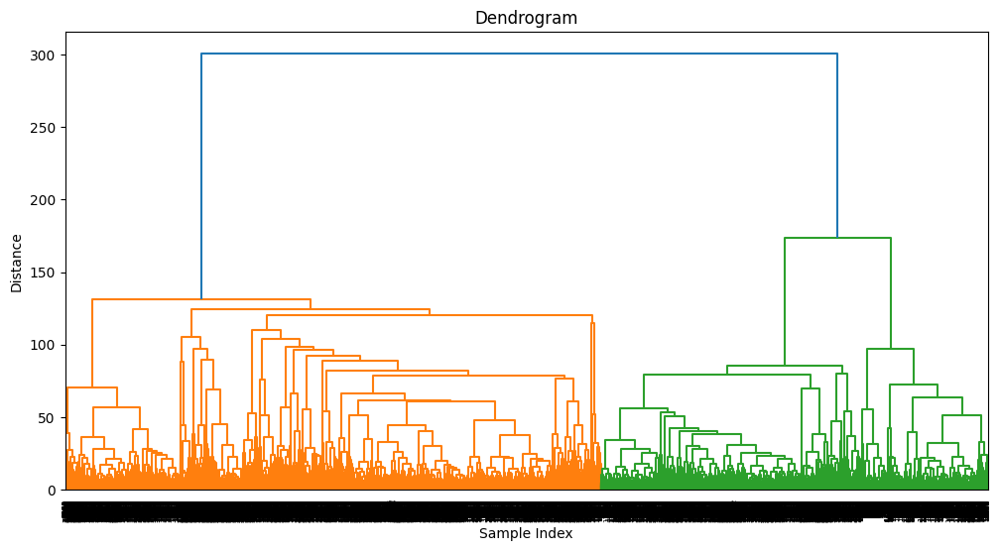

In [ ]:
"""
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage

# Standardize the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Perform Agglomerative Hierarchical Clustering
# You can change n_clusters to the desired number of clusters
n_clusters = 13
agg_clustering = AgglomerativeClustering(n_clusters=n_clusters)
labels = agg_clustering.fit_predict(X_scaled)
merged_dataset['cluster_label'] = labels


# Create a dendrogram
linkage_matrix = linkage(X_scaled, method='ward')  # You can change the method to 'average', 'single', etc.
plt.figure(figsize=(12, 6))
dendrogram(linkage_matrix)
plt.title('Dendrogram')
plt.xlabel('Sample Index')
plt.ylabel('Distance')
plt.show()
"""

##### Vahy clusteru se zde pocitaji z 2018 2. kolo

###### K-means

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
np.random.seed(0)

rmse_dict = {k: 0 for k in range(2, 15)}

ps_2021_original_data_proc = pd.read_csv('ps_2021_proc.csv')
max_davka = ps_2021_original_data_proc['davka'].max()
ps_2021_vysledky = ps_2021_original_data_proc[ps_2021_original_data_proc['davka'] == max_davka]
ps_2021_vysledky.drop(columns = ['davka', 'okrsku_secteno'], axis = 1, inplace = True)

merged_dataset.fillna(0, inplace = True)
X = merged_dataset.drop(columns = ['CIS_OBEC', 'CIS_OKRSEK'])

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

num_runs = 1


for k in range(2, 15):
    total_rmse = 0
    for run in range(num_runs):
        kmeans = KMeans(n_clusters=k, random_state=0)
        kmeans.fit(X_scaled)

        merged_dataset['cluster_label'] = kmeans.labels_
        objekty = ['CIS_OBEC', 'CIS_OKRSEK']
        merged_dataset[objekty] = merged_dataset[objekty].astype('int64')
        cluster_labels = merged_dataset[['cluster_label', 'CIS_OBEC', 'CIS_OKRSEK']]
        merged_data_2018 = pd.merge(cluster_labels, prez_2018_2_original_data_abs[['PLATNE_HLASY', 'CIS_OBEC', 'CIS_OKRSEK']], on=['CIS_OBEC', 'CIS_OKRSEK'], how='inner')
        merged_data_2018.drop(columns = ['CIS_OKRSEK', 'CIS_OBEC'], axis = 1, inplace = True)
        clustered_2018 = merged_data_2018.groupby('cluster_label').sum()
        total_zapsani_volici = clustered_2018['PLATNE_HLASY'].sum()
        clustered_2018['PODIL_CLUSTERU'] = clustered_2018['PLATNE_HLASY'] / total_zapsani_volici
        clustered_2018 = clustered_2018['PODIL_CLUSTERU']

        for i in range(1, ps_2021_original_data_abs['davka'].max()):
            nove_volby = ps_2021_original_data_abs[ps_2021_original_data_abs['davka'] <= i]
            nove_volby_with_clusters = pd.merge(cluster_labels, nove_volby, on=['CIS_OBEC', 'CIS_OKRSEK'], how='inner')
            nove_volby_with_clusters.drop(columns = ['CIS_OBEC', 'CIS_OKRSEK', 'davka', 'ZAPSANI_VOLICI'], inplace = True)
            clustered_2021 = nove_volby_with_clusters.groupby('cluster_label').sum()
            celkove_volicu = clustered_2021['PLATNE_HLASY'].sum()
            clustered_2021['podil_clusteru_2021'] = clustered_2021['PLATNE_HLASY'] / celkove_volicu
            clustered_2021.drop(columns = ['PLATNE_HLASY'], inplace = True)
            clustered_2021_with_shares_of_clusters = pd.merge(clustered_2021, clustered_2018, on=['cluster_label'], how='inner')
            clustered_2021_with_shares_of_clusters.rename(columns={'PODIL_CLUSTERU': 'podil_clusteru_2018'}, inplace=True)
            party_cols = [col for col in clustered_2021_with_shares_of_clusters.columns if col.startswith('HLASY_')]
            for col in party_cols:
                clustered_2021_with_shares_of_clusters[col] = clustered_2021_with_shares_of_clusters[col] * (clustered_2021_with_shares_of_clusters['podil_clusteru_2018'] / clustered_2021_with_shares_of_clusters['podil_clusteru_2021'])
            clustered_2021_reweighted = clustered_2021_with_shares_of_clusters.drop(columns=['podil_clusteru_2021', 'podil_clusteru_2018'], axis = 1)
            clustered_2021_reweighted = clustered_2021_reweighted.sum().sort_index()
            clustered_2021_reweighted = pd.DataFrame(clustered_2021_reweighted)
            clustered_2021_reweighted.rename(columns={0: 'pred_pocet_hlasu'}, inplace=True)
            celkem_hlasu = clustered_2021_reweighted['pred_pocet_hlasu'].sum()
            clustered_2021_reweighted['pred_proc_vysl'] = clustered_2021_reweighted['pred_pocet_hlasu'] / celkem_hlasu
            ps_2021_predikce = clustered_2021_reweighted['pred_proc_vysl']
            ps_2021_predikce = pd.DataFrame(ps_2021_predikce).T
            hlasy_columns_rel = [col for col in ps_2021_vysledky.columns if col.startswith('HLASY_') and col != 'HLASY_ostatni']
            ps_2021_selected = ps_2021_predikce[hlasy_columns_rel]

            hlasy_columns_dopl_matic = [col for col in ps_2021_predikce.columns if col.startswith('HLASY_')]
            hlasy_ostatni_columns = list(set(hlasy_columns_dopl_matic) - set(hlasy_columns_rel))

            ps_2021_selected['HLASY_ostatni'] = ps_2021_predikce[hlasy_ostatni_columns].sum(axis=1)

            mse = mean_squared_error(ps_2021_selected, ps_2021_vysledky)
            rmse = sqrt(mse)
            total_rmse += rmse
    rmse_dict[k] = total_rmse / num_runs

Výstupní stream byl oříznut na posledních 5000 řádků.
See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ps_2021_selected['HLASY_ostatni'] = ps_2021_predikce[hlasy_ostatni_columns].sum(axis=1)
<ipython-input-64-5a4d6cd0b760>:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ps_2021_selected['HLASY_ostatni'] = ps_2021_predikce[hlasy_ostatni_columns].sum(axis=1)
<ipython-input-64-5a4d6cd0b760>:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-

In [ ]:
rmse_dict

{2: 0.5408894276560208,
 3: 0.5429092958982183,
 4: 0.42945816110441054,
 5: 0.3826797617047048,
 6: 0.4094551672143195,
 7: 0.41137985568383956,
 8: 0.3730849616505972,
 9: 0.39468523829758667,
 10: 0.3749856289906712,
 11: 0.4208053572253576,
 12: 0.42179123816435804,
 13: 0.42662909825217277,
 14: 0.41804820796864095}

In [ ]:
lowest_key = min(rmse_dict, key=rmse_dict.get)
lowest_value = rmse_dict[lowest_key]

print(f"The number of cluster with the lowest RMSE is: {lowest_key} with a value of: {lowest_value}")

The number of cluster with the lowest RMSE is: 8 with a value of: 0.3730849616505972


In [ ]:
lowest_value / (ps_2021_original_data_abs['davka'].max() - 1)

0.005041688670954016

###### Aglomerativni clustering

In [ ]:
### POZOR, BEZI 5 MIN
from sklearn.metrics import mean_squared_error
from math import sqrt
from sklearn.cluster import AgglomerativeClustering
from sklearn.preprocessing import StandardScaler

rmse_dict = {k: 0 for k in range(2, 15)}

ps_2021_original_data_proc = pd.read_csv('ps_2021_proc.csv')
max_davka = ps_2021_original_data_proc['davka'].max()
ps_2021_vysledky = ps_2021_original_data_proc[ps_2021_original_data_proc['davka'] == max_davka]
ps_2021_vysledky.drop(columns = ['davka', 'okrsku_secteno'], axis = 1, inplace = True)

merged_dataset.fillna(0, inplace = True)
X = merged_dataset.drop(columns = ['CIS_OBEC', 'CIS_OKRSEK'])

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)


for n_clusters in range(2, 15):
    agg_clustering = AgglomerativeClustering(n_clusters=n_clusters)
    labels = agg_clustering.fit_predict(X_scaled)
    merged_dataset['cluster_label'] = labels
    objekty = ['CIS_OBEC', 'CIS_OKRSEK']
    merged_dataset[objekty] = merged_dataset[objekty].astype('int64')
    cluster_labels = merged_dataset[['cluster_label', 'CIS_OBEC', 'CIS_OKRSEK']]
    merged_data_2018 = pd.merge(cluster_labels, prez_2018_2_original_data_abs[['PLATNE_HLASY', 'CIS_OBEC', 'CIS_OKRSEK']], on=['CIS_OBEC', 'CIS_OKRSEK'], how='inner')
    merged_data_2018.drop(columns = ['CIS_OKRSEK', 'CIS_OBEC'], axis = 1, inplace = True)
    clustered_2018 = merged_data_2018.groupby('cluster_label').sum()
    total_zapsani_volici = clustered_2018['PLATNE_HLASY'].sum()
    clustered_2018['PODIL_CLUSTERU'] = clustered_2018['PLATNE_HLASY'] / total_zapsani_volici
    clustered_2018 = clustered_2018['PODIL_CLUSTERU']

    for i in range(1, ps_2021_original_data_abs['davka'].max()):
        nove_volby = ps_2021_original_data_abs[ps_2021_original_data_abs['davka'] <= i]
        nove_volby_with_clusters = pd.merge(cluster_labels, nove_volby, on=['CIS_OBEC', 'CIS_OKRSEK'], how='inner')
        nove_volby_with_clusters.drop(columns = ['CIS_OBEC', 'CIS_OKRSEK', 'davka', 'ZAPSANI_VOLICI'], inplace = True)
        clustered_2021 = nove_volby_with_clusters.groupby('cluster_label').sum()
        celkove_volicu = clustered_2021['PLATNE_HLASY'].sum()
        clustered_2021['podil_clusteru_2021'] = clustered_2021['PLATNE_HLASY'] / celkove_volicu
        clustered_2021.drop(columns = ['PLATNE_HLASY'], inplace = True)
        clustered_2021_with_shares_of_clusters = pd.merge(clustered_2021, clustered_2018, on=['cluster_label'], how='inner')
        clustered_2021_with_shares_of_clusters.rename(columns={'PODIL_CLUSTERU': 'podil_clusteru_2018'}, inplace=True)
        party_cols = [col for col in clustered_2021_with_shares_of_clusters.columns if col.startswith('HLASY_')]
        for col in party_cols:
            clustered_2021_with_shares_of_clusters[col] = clustered_2021_with_shares_of_clusters[col] * (clustered_2021_with_shares_of_clusters['podil_clusteru_2018'] / clustered_2021_with_shares_of_clusters['podil_clusteru_2021'])
        clustered_2021_reweighted = clustered_2021_with_shares_of_clusters.drop(columns=['podil_clusteru_2021', 'podil_clusteru_2018'], axis = 1)
        clustered_2021_reweighted = clustered_2021_reweighted.sum().sort_index()
        clustered_2021_reweighted = pd.DataFrame(clustered_2021_reweighted)
        clustered_2021_reweighted.rename(columns={0: 'pred_pocet_hlasu'}, inplace=True)
        celkem_hlasu = clustered_2021_reweighted['pred_pocet_hlasu'].sum()
        clustered_2021_reweighted['pred_proc_vysl'] = clustered_2021_reweighted['pred_pocet_hlasu'] / celkem_hlasu
        ps_2021_predikce = clustered_2021_reweighted['pred_proc_vysl']
        ps_2021_predikce = pd.DataFrame(ps_2021_predikce).T
        hlasy_columns_rel = [col for col in ps_2021_vysledky.columns if col.startswith('HLASY_') and col != 'HLASY_ostatni']
        ps_2021_selected = ps_2021_predikce[hlasy_columns_rel]

        hlasy_columns_dopl_matic = [col for col in ps_2021_predikce.columns if col.startswith('HLASY_')]
        hlasy_ostatni_columns = list(set(hlasy_columns_dopl_matic) - set(hlasy_columns_rel))

        ps_2021_selected['HLASY_ostatni'] = ps_2021_predikce[hlasy_ostatni_columns].sum(axis=1)

        mse = mean_squared_error(ps_2021_selected, ps_2021_vysledky)
        rmse = sqrt(mse)
        rmse_dict[n_clusters] += rmse

Výstupní stream byl oříznut na posledních 5000 řádků.
See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ps_2021_selected['HLASY_ostatni'] = ps_2021_predikce[hlasy_ostatni_columns].sum(axis=1)
<ipython-input-68-8b2e4ca16875>:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ps_2021_selected['HLASY_ostatni'] = ps_2021_predikce[hlasy_ostatni_columns].sum(axis=1)
<ipython-input-68-8b2e4ca16875>:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-

In [ ]:
rmse_dict

{2: 0.44841087313127026,
 3: 0.4403034527118014,
 4: 0.45459200235208486,
 5: 0.45224415921332367,
 6: 0.427065521727036,
 7: 0.43118310582323593,
 8: 0.44110832012482537,
 9: 0.4007172966120844,
 10: 0.4171579183073846,
 11: 0.41011325453999187,
 12: 0.41297584862908987,
 13: 0.40568707267868154,
 14: 0.3909155305648231}

In [ ]:
lowest_key = min(rmse_dict, key=rmse_dict.get)
lowest_value = rmse_dict[lowest_key]

print(f"The number of cluster with the lowest RMSE is: {lowest_key} with a value of: {lowest_value}")

The number of cluster with the lowest RMSE is: 14 with a value of: 0.3909155305648231


In [ ]:
lowest_value / (ps_2021_original_data_abs['davka'].max() - 1)

0.005282642304930042

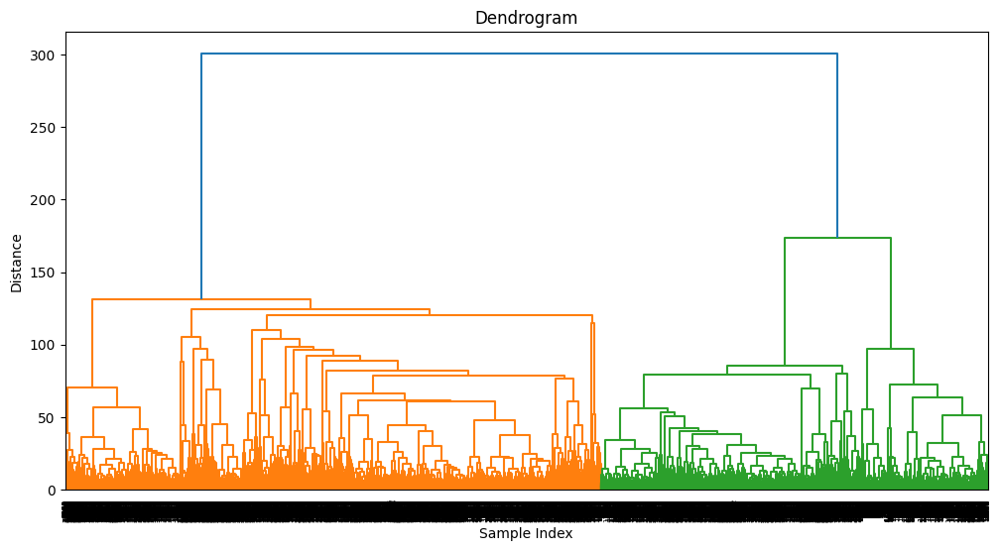

In [ ]:
"""
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage

# Standardize the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Perform Agglomerative Hierarchical Clustering
# You can change n_clusters to the desired number of clusters
n_clusters = 9
agg_clustering = AgglomerativeClustering(n_clusters=n_clusters)
labels = agg_clustering.fit_predict(X_scaled)
merged_dataset['cluster_label'] = labels


# Create a dendrogram
linkage_matrix = linkage(X_scaled, method='ward')  # You can change the method to 'average', 'single', etc.
plt.figure(figsize=(12, 6))
dendrogram(linkage_matrix)
plt.title('Dendrogram')
plt.xlabel('Sample Index')
plt.ylabel('Distance')
plt.show()
"""

### Predikce prez voleb 2023 1. kolo

Z výsledku vyplývá, že pro predikci prez voleb 2023 1. kola je nejlepší vzít


1.   Aglomerativni clustering, prez. volby 2018 1.kolo, relativni cisla, 12 clusteru
2.   K-means, prez. volby 2018 1. kolo, relativni cisla, 18 clusterů



#### Priprava dat

In [ ]:
#############################################
# funkce only_unique_rows odstranuje duplicity v datech, stava se, ze v nekterych okrscich se vysledky prepocitavaji jeste jednou, potom v datech bude dany okrsek 2x
# tato funkce bere vzdy pouze posledni zaznam o danem okrsku
#############################################
def only_unique_rows(df):

  unique_combinations = df.drop_duplicates(subset=['CIS_OBEC', 'CIS_OKRSEK'], keep=False)
  duplicates = df[df.duplicated(subset=['CIS_OBEC', 'CIS_OKRSEK'], keep=False)]

  duplicates_max_davka = duplicates.groupby(['CIS_OBEC', 'CIS_OKRSEK'])['davka'].idxmax()
  max_davka_rows = df.loc[duplicates_max_davka]

  df_filtered = pd.concat([unique_combinations, max_davka_rows])
  return df_filtered

In [ ]:
def str_cols_to_int_cols(df):

    hlasy_cols = [col for col in df.columns if col.startswith('HLASY_')]

    int_columns = ['ZAPSANI_VOLICI', 'PLATNE_HLASY', 'davka'] + hlasy_cols

    df[int_columns] = df[int_columns].astype('Int64')
    return df

In [ ]:
def reindex_cols(df):

    known_columns =  [col for col in df.columns if not col.startswith('HLASY_')]

    hlasy_cols = [col for col in df.columns if col.startswith('HLASY_')]
    hlasy_cols_sorted = sorted(hlasy_cols)

    column_order = known_columns + hlasy_cols_sorted

    df = df.reindex(columns=column_order)

    return df

In [ ]:
def prub_vysledky(df):

  hlasy_cols = [col for col in df.columns if col.startswith('HLASY_')]

  df_result = pd.DataFrame(columns=df.columns)

  frames = []

  for i in range(1, max(df['davka']) + 1):
      df_until_davka_i = df[df['davka'] <= i]
      okrsku_do_davky = df_until_davka_i.shape[0]

      column_sums = df_until_davka_i.sum()
      column_sums = pd.DataFrame(column_sums).T
      for col in range(len(hlasy_cols)):
        column_sums[hlasy_cols[col]] /= column_sums['PLATNE_HLASY']
      column_sums['davka'] = int(i)
      column_sums['okrsku_secteno'] = okrsku_do_davky

      column_sums['volebni_ucast'] = column_sums['PLATNE_HLASY'] / column_sums['ZAPSANI_VOLICI']

      frames.append(pd.DataFrame(column_sums))

  df_result = pd.concat(frames, ignore_index=True)

  return df_result

In [ ]:
def drop_cols(df, typ_voleb):
  if typ_voleb == "prezidentske":
    df = df.drop(['VYDANE_OBALKY', 'ODEVZDANE_OBALKY', 'CIS_OBEC', 'CIS_OKRSEK', 'ZAPSANI_VOLICI', 'PLATNE_HLASY'], axis = 1)
  elif typ_voleb == "ps":
    df = df.drop(['VYDANE_OBALKY', 'ODEVZDANE_OBALKY', 'CIS_OBEC', 'CIS_OKRSEK', 'ZAPSANI_VOLICI', 'PLATNE_HLASY', 'PORADI_ZPRAC', 'DATUM_CAS_ZPRAC'], axis = 1)
  return df

In [ ]:
def vysledky_okrsky_proc(df):
  columns_to_divide = df.columns[df.columns.str.startswith('HLASY_')]
  df[columns_to_divide] = df[columns_to_divide].div(df['PLATNE_HLASY'], axis=0)
  #df['VOLEBNI_UCAST'] = df['PLATNE_HLASY'].div(df['ZAPSANI_VOLICI'], axis = 0)
  df['CIS_OBEC_OKRSEK'] = df['CIS_OBEC'].astype(str) + '_' + df['CIS_OKRSEK'].astype(str)
  df = df.drop(['ZAPSANI_VOLICI', 'VYDANE_OBALKY', 'ODEVZDANE_OBALKY', 'PLATNE_HLASY', 'davka', 'CIS_OBEC', 'CIS_OKRSEK'], axis = 1)
  return df

In [ ]:
prez_2018_1_abs = only_unique_rows(prez_2018_1_original_data_abs)
prez_2018_1_abs = str_cols_to_int_cols(prez_2018_1_abs)
prez_2018_1_abs = reindex_cols(prez_2018_1_abs)

prez_2018_2_abs = only_unique_rows(prez_2018_2_original_data_abs)
prez_2018_2_abs = str_cols_to_int_cols(prez_2018_2_abs)
prez_2018_2_abs = reindex_cols(prez_2018_2_abs)

In [ ]:
prez_2018_1_rel = vysledky_okrsky_proc(prez_2018_1_abs)
prez_2018_2_rel = vysledky_okrsky_proc(prez_2018_2_abs)

In [ ]:
prez_2018_1_rel = prez_2018_1_rel.fillna(0)
prez_2018_2_rel = prez_2018_2_rel.fillna(0)
prez_2018_1_rel.head()

,HLASY_1,HLASY_2,HLASY_3,HLASY_4,HLASY_5,HLASY_6,HLASY_7,HLASY_8,HLASY_9,CIS_OBEC_OKRSEK
0,0.0,0.153846,0.038462,0.0,0.038462,0.0,0.538462,0.076923,0.153846,566080_1
1,0.028986,0.101449,0.101449,0.014493,0.014493,0.014493,0.463768,0.130435,0.130435,573060_5
2,0.12766,0.06383,0.085106,0.021277,0.021277,0.0,0.255319,0.106383,0.319149,547701_1
3,0.0,0.448276,0.034483,0.0,0.0,0.0,0.310345,0.0,0.206897,542059_1
4,0.042553,0.148936,0.085106,0.0,0.0,0.0,0.382979,0.191489,0.148936,599034_1


In [ ]:
prez_2018_2_rel.head()

,HLASY_7,HLASY_9,CIS_OBEC_OKRSEK
0,0.703704,0.296296,541281_5
1,0.413793,0.586207,549584_2
2,0.404255,0.595745,547701_1
3,0.510638,0.489362,587206_1
4,0.597403,0.402597,573060_5


In [ ]:
ps_2021_abs = only_unique_rows(ps_2021_original_data_abs)
ps_2021_abs = str_cols_to_int_cols(ps_2021_abs)
ps_2021_abs.head()

,CIS_OBEC,CIS_OKRSEK,PLATNE_HLASY,ZAPSANI_VOLICI,davka,HLASY_1,HLASY_2,HLASY_3,HLASY_4,HLASY_5,...,HLASY_13,HLASY_14,HLASY_15,HLASY_16,HLASY_17,HLASY_18,HLASY_19,HLASY_20,HLASY_21,HLASY_22
0,500011,1,504,717,15,1,1,8,67,28,...,141,0,2,4,64,14,0,128,5,8
1,500011,2,284,435,21,3,3,8,31,16,...,83,0,0,0,37,4,0,75,0,0
2,500011,3,289,394,17,2,0,4,17,24,...,118,0,1,1,37,6,0,60,1,0
3,500020,1,159,268,19,1,1,8,16,8,...,32,0,0,0,22,13,0,35,0,3
4,500020,2,452,729,30,1,0,5,81,23,...,113,0,2,0,37,7,0,139,3,2


In [ ]:
def vysledky_okrsky_proc_PS(df):
  columns_to_divide = df.columns[df.columns.str.startswith('HLASY_')]
  df[columns_to_divide] = df[columns_to_divide].div(df['PLATNE_HLASY'], axis=0)
  #df['VOLEBNI_UCAST'] = df['PLATNE_HLASY'].div(df['ZAPSANI_VOLICI'], axis = 0)
  df['CIS_OBEC_OKRSEK'] = df['CIS_OBEC'].astype(str) + '_' + df['CIS_OKRSEK'].astype(str)
  df = df.drop(['ZAPSANI_VOLICI', 'PLATNE_HLASY', 'davka', 'CIS_OBEC', 'CIS_OKRSEK'], axis = 1)
  return df

In [ ]:
ps_2021_rel = vysledky_okrsky_proc_PS(ps_2021_abs)
ps_2021_rel.head()

,HLASY_1,HLASY_2,HLASY_3,HLASY_4,HLASY_5,HLASY_6,HLASY_7,HLASY_8,HLASY_9,HLASY_10,...,HLASY_14,HLASY_15,HLASY_16,HLASY_17,HLASY_18,HLASY_19,HLASY_20,HLASY_21,HLASY_22,CIS_OBEC_OKRSEK
0,0.001984,0.001984,0.015873,0.132937,0.055556,0.0,0.001984,0.02381,0.0,0.001984,...,0.0,0.003968,0.007937,0.126984,0.027778,0.0,0.253968,0.009921,0.015873,500011_1
1,0.010563,0.010563,0.028169,0.109155,0.056338,0.0,0.003521,0.028169,0.003521,0.003521,...,0.0,0.0,0.0,0.130282,0.014085,0.0,0.264085,0.0,0.0,500011_2
2,0.00692,0.0,0.013841,0.058824,0.083045,0.0,0.0,0.024221,0.00692,0.0,...,0.0,0.00346,0.00346,0.128028,0.020761,0.0,0.207612,0.00346,0.0,500011_3
3,0.006289,0.006289,0.050314,0.100629,0.050314,0.0,0.0,0.025157,0.0,0.012579,...,0.0,0.0,0.0,0.138365,0.081761,0.0,0.220126,0.0,0.018868,500020_1
4,0.002212,0.0,0.011062,0.179204,0.050885,0.0,0.002212,0.037611,0.0,0.004425,...,0.0,0.004425,0.0,0.081858,0.015487,0.0,0.307522,0.006637,0.004425,500020_2


In [ ]:
merged_dataset = prez_2018_1_rel.merge(ps_2021_rel, on = 'CIS_OBEC_OKRSEK', how = 'outer', suffixes = ('_prez', '_ps'))
merged_dataset.head()

,HLASY_1_prez,HLASY_2_prez,HLASY_3_prez,HLASY_4_prez,HLASY_5_prez,HLASY_6_prez,HLASY_7_prez,HLASY_8_prez,HLASY_9_prez,CIS_OBEC_OKRSEK,...,HLASY_13,HLASY_14,HLASY_15,HLASY_16,HLASY_17,HLASY_18,HLASY_19,HLASY_20,HLASY_21,HLASY_22
0,0.030242,0.070565,0.159274,0.008065,0.008065,0.004032,0.407258,0.0625,0.25,500011_1,...,0.279762,0.0,0.003968,0.007937,0.126984,0.027778,0.0,0.253968,0.009921,0.015873
1,0.018382,0.040441,0.139706,0.0,0.0,0.003676,0.400735,0.128676,0.268382,500011_2,...,0.292254,0.0,0.0,0.0,0.130282,0.014085,0.0,0.264085,0.0,0.0
2,0.073944,0.088028,0.144366,0.010563,0.010563,0.0,0.316901,0.151408,0.204225,500011_3,...,0.408304,0.0,0.00346,0.00346,0.128028,0.020761,0.0,0.207612,0.00346,0.0
3,0.025157,0.062893,0.069182,0.006289,0.006289,0.0,0.534591,0.056604,0.238994,500020_1,...,0.201258,0.0,0.0,0.0,0.138365,0.081761,0.0,0.220126,0.0,0.018868
4,0.038647,0.077295,0.077295,0.016908,0.002415,0.002415,0.44686,0.125604,0.21256,500020_2,...,0.25,0.0,0.004425,0.0,0.081858,0.015487,0.0,0.307522,0.006637,0.004425


In [ ]:
merged_dataset = merged_dataset.merge(prez_2018_2_rel, on = 'CIS_OBEC_OKRSEK', how = 'outer')
merged_dataset[['CIS_OBEC', 'CIS_OKRSEK']] = merged_dataset['CIS_OBEC_OKRSEK'].str.split('_', expand=True)
merged_dataset.drop(columns=['CIS_OBEC_OKRSEK'], inplace=True)
merged_dataset.head()

,HLASY_1_prez,HLASY_2_prez,HLASY_3_prez,HLASY_4_prez,HLASY_5_prez,HLASY_6_prez,HLASY_7_prez,HLASY_8_prez,HLASY_9_prez,HLASY_1_ps,...,HLASY_17,HLASY_18,HLASY_19,HLASY_20,HLASY_21,HLASY_22,HLASY_7,HLASY_9,CIS_OBEC,CIS_OKRSEK
0,0.030242,0.070565,0.159274,0.008065,0.008065,0.004032,0.407258,0.0625,0.25,0.001984,...,0.126984,0.027778,0.0,0.253968,0.009921,0.015873,0.522556,0.477444,500011,1
1,0.018382,0.040441,0.139706,0.0,0.0,0.003676,0.400735,0.128676,0.268382,0.010563,...,0.130282,0.014085,0.0,0.264085,0.0,0.0,0.533113,0.466887,500011,2
2,0.073944,0.088028,0.144366,0.010563,0.010563,0.0,0.316901,0.151408,0.204225,0.00692,...,0.128028,0.020761,0.0,0.207612,0.00346,0.0,0.47931,0.52069,500011,3
3,0.025157,0.062893,0.069182,0.006289,0.006289,0.0,0.534591,0.056604,0.238994,0.006289,...,0.138365,0.081761,0.0,0.220126,0.0,0.018868,0.644809,0.355191,500020,1
4,0.038647,0.077295,0.077295,0.016908,0.002415,0.002415,0.44686,0.125604,0.21256,0.002212,...,0.081858,0.015487,0.0,0.307522,0.006637,0.004425,0.622222,0.377778,500020,2


#### Predikce prezidentskych voleb 2023 1. kolo - Aglomerativni clustering

In [ ]:
prez_2018_1_abs = only_unique_rows(prez_2018_1_original_data_abs)
prez_2018_1_abs = str_cols_to_int_cols(prez_2018_1_abs)
prez_2018_1_abs = reindex_cols(prez_2018_1_abs)

prez_2018_2_abs = only_unique_rows(prez_2018_2_original_data_abs)
prez_2018_2_abs = str_cols_to_int_cols(prez_2018_2_abs)
prez_2018_2_abs = reindex_cols(prez_2018_2_abs)

In [ ]:
prez_2018_1_rel = vysledky_okrsky_proc(prez_2018_1_abs)
prez_2018_2_rel = vysledky_okrsky_proc(prez_2018_2_abs)

In [ ]:
prez_2018_1_rel = prez_2018_1_rel.fillna(0)
prez_2018_2_rel = prez_2018_2_rel.fillna(0)
prez_2018_1_rel.head()

,HLASY_1,HLASY_2,HLASY_3,HLASY_4,HLASY_5,HLASY_6,HLASY_7,HLASY_8,HLASY_9,CIS_OBEC_OKRSEK
0,0.0,0.153846,0.038462,0.0,0.038462,0.0,0.538462,0.076923,0.153846,566080_1
1,0.028986,0.101449,0.101449,0.014493,0.014493,0.014493,0.463768,0.130435,0.130435,573060_5
2,0.12766,0.06383,0.085106,0.021277,0.021277,0.0,0.255319,0.106383,0.319149,547701_1
3,0.0,0.448276,0.034483,0.0,0.0,0.0,0.310345,0.0,0.206897,542059_1
4,0.042553,0.148936,0.085106,0.0,0.0,0.0,0.382979,0.191489,0.148936,599034_1


In [ ]:
prez_2018_2_rel.head()

,HLASY_7,HLASY_9,CIS_OBEC_OKRSEK
0,0.703704,0.296296,541281_5
1,0.413793,0.586207,549584_2
2,0.404255,0.595745,547701_1
3,0.510638,0.489362,587206_1
4,0.597403,0.402597,573060_5


In [ ]:
ps_2021_abs = only_unique_rows(ps_2021_original_data_abs)
ps_2021_abs = str_cols_to_int_cols(ps_2021_abs)
ps_2021_abs.head()

,CIS_OBEC,CIS_OKRSEK,PLATNE_HLASY,ZAPSANI_VOLICI,davka,HLASY_1,HLASY_2,HLASY_3,HLASY_4,HLASY_5,...,HLASY_13,HLASY_14,HLASY_15,HLASY_16,HLASY_17,HLASY_18,HLASY_19,HLASY_20,HLASY_21,HLASY_22
0,500011,1,504,717,15,1,1,8,67,28,...,141,0,2,4,64,14,0,128,5,8
1,500011,2,284,435,21,3,3,8,31,16,...,83,0,0,0,37,4,0,75,0,0
2,500011,3,289,394,17,2,0,4,17,24,...,118,0,1,1,37,6,0,60,1,0
3,500020,1,159,268,19,1,1,8,16,8,...,32,0,0,0,22,13,0,35,0,3
4,500020,2,452,729,30,1,0,5,81,23,...,113,0,2,0,37,7,0,139,3,2


In [ ]:
def vysledky_okrsky_proc_PS(df):
  columns_to_divide = df.columns[df.columns.str.startswith('HLASY_')]
  df[columns_to_divide] = df[columns_to_divide].div(df['PLATNE_HLASY'], axis=0)
  #df['VOLEBNI_UCAST'] = df['PLATNE_HLASY'].div(df['ZAPSANI_VOLICI'], axis = 0)
  df['CIS_OBEC_OKRSEK'] = df['CIS_OBEC'].astype(str) + '_' + df['CIS_OKRSEK'].astype(str)
  df = df.drop(['ZAPSANI_VOLICI', 'PLATNE_HLASY', 'davka', 'CIS_OBEC', 'CIS_OKRSEK'], axis = 1)
  return df

In [ ]:
ps_2021_rel = vysledky_okrsky_proc_PS(ps_2021_abs)
ps_2021_rel.head()

,HLASY_1,HLASY_2,HLASY_3,HLASY_4,HLASY_5,HLASY_6,HLASY_7,HLASY_8,HLASY_9,HLASY_10,...,HLASY_14,HLASY_15,HLASY_16,HLASY_17,HLASY_18,HLASY_19,HLASY_20,HLASY_21,HLASY_22,CIS_OBEC_OKRSEK
0,0.001984,0.001984,0.015873,0.132937,0.055556,0.0,0.001984,0.02381,0.0,0.001984,...,0.0,0.003968,0.007937,0.126984,0.027778,0.0,0.253968,0.009921,0.015873,500011_1
1,0.010563,0.010563,0.028169,0.109155,0.056338,0.0,0.003521,0.028169,0.003521,0.003521,...,0.0,0.0,0.0,0.130282,0.014085,0.0,0.264085,0.0,0.0,500011_2
2,0.00692,0.0,0.013841,0.058824,0.083045,0.0,0.0,0.024221,0.00692,0.0,...,0.0,0.00346,0.00346,0.128028,0.020761,0.0,0.207612,0.00346,0.0,500011_3
3,0.006289,0.006289,0.050314,0.100629,0.050314,0.0,0.0,0.025157,0.0,0.012579,...,0.0,0.0,0.0,0.138365,0.081761,0.0,0.220126,0.0,0.018868,500020_1
4,0.002212,0.0,0.011062,0.179204,0.050885,0.0,0.002212,0.037611,0.0,0.004425,...,0.0,0.004425,0.0,0.081858,0.015487,0.0,0.307522,0.006637,0.004425,500020_2


In [ ]:
merged_dataset = prez_2018_1_rel.merge(ps_2021_rel, on = 'CIS_OBEC_OKRSEK', how = 'outer', suffixes = ('_prez', '_ps'))
merged_dataset.head()

,HLASY_1_prez,HLASY_2_prez,HLASY_3_prez,HLASY_4_prez,HLASY_5_prez,HLASY_6_prez,HLASY_7_prez,HLASY_8_prez,HLASY_9_prez,CIS_OBEC_OKRSEK,...,HLASY_13,HLASY_14,HLASY_15,HLASY_16,HLASY_17,HLASY_18,HLASY_19,HLASY_20,HLASY_21,HLASY_22
0,0.030242,0.070565,0.159274,0.008065,0.008065,0.004032,0.407258,0.0625,0.25,500011_1,...,0.279762,0.0,0.003968,0.007937,0.126984,0.027778,0.0,0.253968,0.009921,0.015873
1,0.018382,0.040441,0.139706,0.0,0.0,0.003676,0.400735,0.128676,0.268382,500011_2,...,0.292254,0.0,0.0,0.0,0.130282,0.014085,0.0,0.264085,0.0,0.0
2,0.073944,0.088028,0.144366,0.010563,0.010563,0.0,0.316901,0.151408,0.204225,500011_3,...,0.408304,0.0,0.00346,0.00346,0.128028,0.020761,0.0,0.207612,0.00346,0.0
3,0.025157,0.062893,0.069182,0.006289,0.006289,0.0,0.534591,0.056604,0.238994,500020_1,...,0.201258,0.0,0.0,0.0,0.138365,0.081761,0.0,0.220126,0.0,0.018868
4,0.038647,0.077295,0.077295,0.016908,0.002415,0.002415,0.44686,0.125604,0.21256,500020_2,...,0.25,0.0,0.004425,0.0,0.081858,0.015487,0.0,0.307522,0.006637,0.004425


In [ ]:
merged_dataset = merged_dataset.merge(prez_2018_2_rel, on = 'CIS_OBEC_OKRSEK', how = 'outer')
merged_dataset[['CIS_OBEC', 'CIS_OKRSEK']] = merged_dataset['CIS_OBEC_OKRSEK'].str.split('_', expand=True)
merged_dataset.drop(columns=['CIS_OBEC_OKRSEK'], inplace=True)
merged_dataset.head()

,HLASY_1_prez,HLASY_2_prez,HLASY_3_prez,HLASY_4_prez,HLASY_5_prez,HLASY_6_prez,HLASY_7_prez,HLASY_8_prez,HLASY_9_prez,HLASY_1_ps,...,HLASY_17,HLASY_18,HLASY_19,HLASY_20,HLASY_21,HLASY_22,HLASY_7,HLASY_9,CIS_OBEC,CIS_OKRSEK
0,0.030242,0.070565,0.159274,0.008065,0.008065,0.004032,0.407258,0.0625,0.25,0.001984,...,0.126984,0.027778,0.0,0.253968,0.009921,0.015873,0.522556,0.477444,500011,1
1,0.018382,0.040441,0.139706,0.0,0.0,0.003676,0.400735,0.128676,0.268382,0.010563,...,0.130282,0.014085,0.0,0.264085,0.0,0.0,0.533113,0.466887,500011,2
2,0.073944,0.088028,0.144366,0.010563,0.010563,0.0,0.316901,0.151408,0.204225,0.00692,...,0.128028,0.020761,0.0,0.207612,0.00346,0.0,0.47931,0.52069,500011,3
3,0.025157,0.062893,0.069182,0.006289,0.006289,0.0,0.534591,0.056604,0.238994,0.006289,...,0.138365,0.081761,0.0,0.220126,0.0,0.018868,0.644809,0.355191,500020,1
4,0.038647,0.077295,0.077295,0.016908,0.002415,0.002415,0.44686,0.125604,0.21256,0.002212,...,0.081858,0.015487,0.0,0.307522,0.006637,0.004425,0.622222,0.377778,500020,2


In [ ]:
from sklearn.preprocessing import StandardScaler

merged_dataset.fillna(0, inplace = True)
X = merged_dataset.drop(columns = ['CIS_OBEC', 'CIS_OKRSEK'])

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
X_scaled


array([[-0.3971544 , -0.47312476,  1.29666587, ...,  2.09176316,
        -0.11849341,  0.13548525],
       [-0.89244675, -1.25056114,  0.8981808 , ..., -0.42808253,
        -0.04061096,  0.0572271 ],
       [ 1.42796305, -0.02241514,  0.99308249, ..., -0.42808253,
        -0.43755809,  0.45608912],
       ...,
       [-1.66014991, 10.60993481, -1.94676109, ..., -0.42808253,
        -1.02270128,  1.04405509],
       [-1.66014991, -0.30902023,  2.75257612, ..., -0.42808253,
        -3.97385828,  4.00944866],
       [-1.66014991, -0.7761413 ,  2.84471999, ..., -0.42808253,
        -3.69009319,  3.72431466]])

In [ ]:
agg_clustering = AgglomerativeClustering(n_clusters=12)
labels = agg_clustering.fit_predict(X_scaled)
merged_dataset['cluster_label'] = labels

In [ ]:
"""
from scipy.cluster.hierarchy import dendrogram, linkage

# Create a dendrogram
linkage_matrix = linkage(X_scaled, method='ward')  # You can change the method to 'average', 'single', etc.
plt.figure(figsize=(12, 6))
dendrogram(linkage_matrix)
plt.xlabel('Index')
plt.ylabel('Vzdálenost')
plt.show()
"""

"\nfrom scipy.cluster.hierarchy import dendrogram, linkage\n\n# Create a dendrogram\nlinkage_matrix = linkage(X_scaled, method='ward')  # You can change the method to 'average', 'single', etc.\nplt.figure(figsize=(12, 6))\ndendrogram(linkage_matrix)\nplt.xlabel('Index')\nplt.ylabel('Vzdálenost')\nplt.show()\n"

In [ ]:
merged_dataset.head()

,HLASY_1_prez,HLASY_2_prez,HLASY_3_prez,HLASY_4_prez,HLASY_5_prez,HLASY_6_prez,HLASY_7_prez,HLASY_8_prez,HLASY_9_prez,HLASY_1_ps,...,HLASY_18,HLASY_19,HLASY_20,HLASY_21,HLASY_22,HLASY_7,HLASY_9,CIS_OBEC,CIS_OKRSEK,cluster_label
0,0.030242,0.070565,0.159274,0.008065,0.008065,0.004032,0.407258,0.0625,0.25,0.001984,...,0.027778,0.0,0.253968,0.009921,0.015873,0.522556,0.477444,500011,1,1
1,0.018382,0.040441,0.139706,0.0,0.0,0.003676,0.400735,0.128676,0.268382,0.010563,...,0.014085,0.0,0.264085,0.0,0.0,0.533113,0.466887,500011,2,2
2,0.073944,0.088028,0.144366,0.010563,0.010563,0.0,0.316901,0.151408,0.204225,0.00692,...,0.020761,0.0,0.207612,0.00346,0.0,0.47931,0.52069,500011,3,2
3,0.025157,0.062893,0.069182,0.006289,0.006289,0.0,0.534591,0.056604,0.238994,0.006289,...,0.081761,0.0,0.220126,0.0,0.018868,0.644809,0.355191,500020,1,1
4,0.038647,0.077295,0.077295,0.016908,0.002415,0.002415,0.44686,0.125604,0.21256,0.002212,...,0.015487,0.0,0.307522,0.006637,0.004425,0.622222,0.377778,500020,2,1


In [ ]:
objekty = ['CIS_OBEC', 'CIS_OKRSEK']
merged_dataset[objekty] = merged_dataset[objekty].astype('int64')

In [ ]:
cluster_labels = merged_dataset[['cluster_label', 'CIS_OBEC', 'CIS_OKRSEK']]
cluster_labels.head()

,cluster_label,CIS_OBEC,CIS_OKRSEK
0,1,500011,1
1,2,500011,2
2,2,500011,3
3,1,500020,1
4,1,500020,2


In [ ]:
merged_data_2018 = pd.merge(cluster_labels, prez_2018_1_original_data_abs[['PLATNE_HLASY', 'CIS_OBEC', 'CIS_OKRSEK']], on=['CIS_OBEC', 'CIS_OKRSEK'], how='inner')
merged_data_2018.info()
merged_data_2018.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14882 entries, 0 to 14881
Data columns (total 4 columns):
 #   Column         Non-Null Count  Dtype
---  ------         --------------  -----
 0   cluster_label  14882 non-null  int64
 1   CIS_OBEC       14882 non-null  int64
 2   CIS_OKRSEK     14882 non-null  int64
 3   PLATNE_HLASY   14882 non-null  int64
dtypes: int64(4)
memory usage: 465.2 KB


,cluster_label,CIS_OBEC,CIS_OKRSEK,PLATNE_HLASY
0,1,500011,1,496
1,2,500011,2,272
2,2,500011,3,284
3,1,500020,1,159
4,1,500020,2,414


In [ ]:
merged_data_2018.drop(columns = ['CIS_OKRSEK', 'CIS_OBEC'], axis = 1, inplace = True)

In [ ]:
clustered_2018 = merged_data_2018.groupby('cluster_label').sum()
clustered_2018

,PLATNE_HLASY
cluster_label,
0,268616
1,1539015
2,1576683
3,74228
4,56199
5,244583
6,33
7,34859
8,522921


In [ ]:
total_zapsani_volici = clustered_2018['PLATNE_HLASY'].sum()

clustered_2018['PODIL_CLUSTERU'] = clustered_2018['PLATNE_HLASY'] / total_zapsani_volici
clustered_2018 = clustered_2018['PODIL_CLUSTERU']
clustered_2018

,PODIL_CLUSTERU
cluster_label,
0,0.052112
1,0.298570
2,0.305878
3,0.014400
4,0.010903
5,0.047449
6,0.000006
7,0.006763
8,0.101447


In [ ]:
nove_volby_rel = pd.read_csv('prez_2023_1_proc.csv')
nove_volby_rel.head(10)

,davka,HLASY_1,HLASY_2,HLASY_4,HLASY_5,HLASY_6,HLASY_7,HLASY_8,HLASY_9,okrsku_secteno,volebni_ucast
0,1,0.034783,0.060870,0.234783,0.000000,0.147826,0.469565,0.000000,0.052174,0.000135,0.184887
1,2,0.061491,0.048825,0.276813,0.005516,0.139939,0.424311,0.011440,0.031665,0.005519,0.610730
2,3,0.063208,0.048605,0.304708,0.006354,0.139943,0.394783,0.014492,0.027907,0.021741,0.651535
3,4,0.064309,0.047760,0.305747,0.005854,0.137675,0.396788,0.014098,0.027770,0.051625,0.663034
4,5,0.063357,0.048422,0.310541,0.005867,0.137910,0.392124,0.014194,0.027585,0.094434,0.676440
5,6,0.063759,0.048196,0.312621,0.005774,0.137205,0.391245,0.014147,0.027053,0.151982,0.661196
6,7,0.063688,0.048091,0.314477,0.005701,0.136370,0.390671,0.014210,0.026792,0.216194,0.664434
7,8,0.063321,0.048077,0.315550,0.005657,0.136312,0.390475,0.014038,0.026570,0.285791,0.666647
8,9,0.063710,0.048056,0.317147,0.005579,0.136383,0.388801,0.014044,0.026281,0.359359,0.666384
9,10,0.063970,0.047764,0.321277,0.005618,0.136935,0.384186,0.014032,0.026218,0.434677,0.667227


In [ ]:
# ZDE SI ZVOLIM CISLO DAVKY:
pocet_davek = 4
nove_volby = prez_2023_1_original_data_abs[prez_2023_1_original_data_abs['davka'] <= pocet_davek]
nove_volby.head()

,CIS_OBEC,CIS_OKRSEK,ZAPSANI_VOLICI,VYDANE_OBALKY,ODEVZDANE_OBALKY,PLATNE_HLASY,HLASY_1,HLASY_2,HLASY_4,HLASY_6,HLASY_7,HLASY_9,davka,HLASY_8,HLASY_5
0,577731,18,554,56,56,56,2.0,1.0,17.0,10.0,22.0,4.0,1,NaN,NaN
1,566101,1,68,59,59,59,2.0,6.0,10.0,7.0,32.0,2.0,1,NaN,NaN
2,549584,2,79,63,63,63,7.0,6.0,28.0,8.0,11.0,3.0,2,NaN,NaN
3,560511,1,76,59,59,57,2.0,2.0,19.0,13.0,19.0,2.0,2,NaN,NaN
4,502081,2010,214,61,61,61,2.0,1.0,14.0,3.0,38.0,3.0,2,NaN,NaN


In [ ]:
nove_volby_with_clusters = pd.merge(cluster_labels, nove_volby, on=['CIS_OBEC', 'CIS_OKRSEK'], how='inner')
nove_volby_with_clusters.drop(columns = ['CIS_OBEC', 'CIS_OKRSEK', 'davka', 'VYDANE_OBALKY', 'ODEVZDANE_OBALKY', 'ZAPSANI_VOLICI'], inplace = True)
nove_volby_with_clusters.sample(5)

,cluster_label,PLATNE_HLASY,HLASY_1,HLASY_2,HLASY_4,HLASY_6,HLASY_7,HLASY_9,HLASY_8,HLASY_5
395,1,39,1.0,8.0,9.0,12.0,7.0,2.0,NaN,NaN
250,1,79,6.0,2.0,21.0,18.0,30.0,2.0,NaN,NaN
202,2,98,12.0,1.0,39.0,12.0,27.0,3.0,2.0,2.0
598,7,117,10.0,6.0,40.0,19.0,36.0,2.0,4.0,NaN
752,1,456,25.0,40.0,127.0,66.0,176.0,11.0,8.0,3.0


In [ ]:
clustered_2023 = nove_volby_with_clusters.groupby('cluster_label').sum()
clustered_2023

,PLATNE_HLASY,HLASY_1,HLASY_2,HLASY_4,HLASY_6,HLASY_7,HLASY_9,HLASY_8,HLASY_5
cluster_label,,,,,,,,,
0,4087,314.0,229.0,1199.0,589.0,1563.0,108.0,58.0,27.0
1,29031,1861.0,1376.0,8659.0,4057.0,11646.0,796.0,458.0,178.0
2,19610,1541.0,828.0,6954.0,2987.0,6332.0,589.0,259.0,120.0
3,244,13.0,5.0,77.0,38.0,98.0,9.0,4.0,0.0
4,1563,76.0,98.0,394.0,200.0,708.0,58.0,19.0,10.0
7,2695,151.0,151.0,756.0,386.0,1111.0,73.0,52.0,15.0
8,14086,609.0,747.0,3139.0,1445.0,7559.0,336.0,177.0,74.0
9,4022,296.0,152.0,1897.0,622.0,902.0,100.0,38.0,15.0
10,2706,174.0,133.0,819.0,444.0,998.0,79.0,38.0,21.0


In [ ]:
celkove_volicu = clustered_2023['PLATNE_HLASY'].sum()

clustered_2023['podil_clusteru_2023'] = clustered_2023['PLATNE_HLASY'] / celkove_volicu

clustered_2023.drop(columns = ['PLATNE_HLASY'], inplace = True)
clustered_2023

,HLASY_1,HLASY_2,HLASY_4,HLASY_6,HLASY_7,HLASY_9,HLASY_8,HLASY_5,podil_clusteru_2023
cluster_label,,,,,,,,,
0,314.0,229.0,1199.0,589.0,1563.0,108.0,58.0,27.0,0.051125
1,1861.0,1376.0,8659.0,4057.0,11646.0,796.0,458.0,178.0,0.363151
2,1541.0,828.0,6954.0,2987.0,6332.0,589.0,259.0,120.0,0.245303
3,13.0,5.0,77.0,38.0,98.0,9.0,4.0,0.0,0.003052
4,76.0,98.0,394.0,200.0,708.0,58.0,19.0,10.0,0.019552
7,151.0,151.0,756.0,386.0,1111.0,73.0,52.0,15.0,0.033712
8,609.0,747.0,3139.0,1445.0,7559.0,336.0,177.0,74.0,0.176203
9,296.0,152.0,1897.0,622.0,902.0,100.0,38.0,15.0,0.050311
10,174.0,133.0,819.0,444.0,998.0,79.0,38.0,21.0,0.033850


In [ ]:
clustered_2023_with_shares_of_clusters = pd.merge(clustered_2023, clustered_2018, on=['cluster_label'], how='inner')
clustered_2023_with_shares_of_clusters.rename(columns={'PODIL_CLUSTERU': 'podil_clusteru_2018'}, inplace=True)
clustered_2023_with_shares_of_clusters

,HLASY_1,HLASY_2,HLASY_4,HLASY_6,HLASY_7,HLASY_9,HLASY_8,HLASY_5,podil_clusteru_2023,podil_clusteru_2018
cluster_label,,,,,,,,,,
0,314.0,229.0,1199.0,589.0,1563.0,108.0,58.0,27.0,0.051125,0.052112
1,1861.0,1376.0,8659.0,4057.0,11646.0,796.0,458.0,178.0,0.363151,0.298570
2,1541.0,828.0,6954.0,2987.0,6332.0,589.0,259.0,120.0,0.245303,0.305878
3,13.0,5.0,77.0,38.0,98.0,9.0,4.0,0.0,0.003052,0.014400
4,76.0,98.0,394.0,200.0,708.0,58.0,19.0,10.0,0.019552,0.010903
7,151.0,151.0,756.0,386.0,1111.0,73.0,52.0,15.0,0.033712,0.006763
8,609.0,747.0,3139.0,1445.0,7559.0,336.0,177.0,74.0,0.176203,0.101447
9,296.0,152.0,1897.0,622.0,902.0,100.0,38.0,15.0,0.050311,0.153135
10,174.0,133.0,819.0,444.0,998.0,79.0,38.0,21.0,0.033850,0.005258


In [ ]:
for col in ['HLASY_1', 'HLASY_2', 'HLASY_4', 'HLASY_5', 'HLASY_6', 'HLASY_7',  'HLASY_8', 'HLASY_9']:
    clustered_2023_with_shares_of_clusters[col] = clustered_2023_with_shares_of_clusters[col] * (clustered_2023_with_shares_of_clusters['podil_clusteru_2018'] / clustered_2023_with_shares_of_clusters['podil_clusteru_2023'])
clustered_2023_reweighted = clustered_2023_with_shares_of_clusters.drop(columns=['podil_clusteru_2023', 'podil_clusteru_2018'], axis = 1)
clustered_2023_reweighted

,HLASY_1,HLASY_2,HLASY_4,HLASY_6,HLASY_7,HLASY_9,HLASY_8,HLASY_5
cluster_label,,,,,,,,
0,320.062956,233.421710,1222.151222,600.372869,1593.179616,110.085348,59.119909,27.521337
1,1530.050459,1131.300070,7119.133219,3335.526443,9574.942311,654.443936,376.551913,146.345503
2,1921.533469,1032.465745,8671.215928,3724.607704,7895.619680,734.447251,322.957280,149.632717
3,61.333791,23.589920,363.284762,179.283389,462.362424,42.461855,18.871936,0.000000
4,42.380075,54.647992,219.707233,111.526514,394.803861,32.342689,10.595019,5.576326
7,30.290862,30.290862,151.654909,77.432269,222.868524,14.643926,10.431290,3.009026
8,350.626079,430.078294,1807.250019,831.945294,4352.023859,193.448871,101.906102,42.604811
9,900.945108,462.647488,5773.962400,1893.202221,2745.447594,304.373347,115.661872,45.656002
10,27.030208,20.661021,127.228394,68.973635,155.035332,12.272336,5.903149,3.262267


In [ ]:
clustered_2023_reweighted = clustered_2023_reweighted.sum().sort_index()
clustered_2023_reweighted = pd.DataFrame(clustered_2023_reweighted)
clustered_2023_reweighted.rename(columns={0: 'pred_pocet_hlasu'}, inplace=True)
clustered_2023_reweighted

,pred_pocet_hlasu
HLASY_1,5202.463604
HLASY_2,3436.111111
HLASY_4,25549.733437
HLASY_5,424.982373
HLASY_6,10863.758282
HLASY_7,27534.237063
HLASY_8,1026.121623
HLASY_9,2110.889022


In [ ]:
celkem_hlasu = clustered_2023_reweighted['pred_pocet_hlasu'].sum()
clustered_2023_reweighted['pred_proc_vysl'] = clustered_2023_reweighted['pred_pocet_hlasu'] / celkem_hlasu
prez_2023_1_predikce = clustered_2023_reweighted['pred_proc_vysl']
prez_2023_1_predikce = pd.DataFrame(prez_2023_1_predikce).T
prez_2023_1_predikce

,HLASY_1,HLASY_2,HLASY_4,HLASY_5,HLASY_6,HLASY_7,HLASY_8,HLASY_9
pred_proc_vysl,0.06832,0.045124,0.335526,0.005581,0.142666,0.361587,0.013475,0.027721


In [ ]:
prez_2023_1_original_data_proc = pd.read_csv('prez_2023_1_proc.csv')
prez_2023_1_original_data_proc.tail()

,davka,HLASY_1,HLASY_2,HLASY_4,HLASY_5,HLASY_6,HLASY_7,HLASY_8,HLASY_9,okrsku_secteno,volebni_ucast
45,46,0.067528,0.044535,0.353977,0.005516,0.139233,0.350062,0.013532,0.025616,0.999731,0.676513
46,47,0.067527,0.044525,0.354022,0.005515,0.139288,0.349975,0.013530,0.025618,0.999798,0.676526
47,48,0.067528,0.044526,0.354018,0.005516,0.139286,0.349978,0.013530,0.025618,0.999865,0.676525
48,49,0.067527,0.044526,0.354015,0.005515,0.139286,0.349984,0.013530,0.025618,0.999933,0.676521
49,50,0.067526,0.044522,0.354054,0.005515,0.139294,0.349941,0.013529,0.025617,1.000000,0.676536


In [ ]:
prez_2023_1_vysledky = prez_2023_1_original_data_proc[prez_2023_1_original_data_proc['davka'] == 50]
prez_2023_1_vysledky.drop(['davka', 'okrsku_secteno', 'volebni_ucast'], axis = 1, inplace = True)
prez_2023_1_vysledky

<ipython-input-267-3ecbaf53ffa2>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prez_2023_1_vysledky.drop(['davka', 'okrsku_secteno', 'volebni_ucast'], axis = 1, inplace = True)


,HLASY_1,HLASY_2,HLASY_4,HLASY_5,HLASY_6,HLASY_7,HLASY_8,HLASY_9
49,0.067526,0.044522,0.354054,0.005515,0.139294,0.349941,0.013529,0.025617


In [ ]:
prez_2023_1_train_last_row = prez_2023_1_original_data_proc[prez_2023_1_original_data_proc['davka'] == pocet_davek]
procent_secteno = prez_2023_1_train_last_row['okrsku_secteno'].values[0]
prez_2023_1_train_last_row.drop(['davka', 'okrsku_secteno', 'volebni_ucast'], axis = 1, inplace = True)
prez_2023_1_train_last_row.head()

<ipython-input-268-8148b53c99f5>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prez_2023_1_train_last_row.drop(['davka', 'okrsku_secteno', 'volebni_ucast'], axis = 1, inplace = True)


,HLASY_1,HLASY_2,HLASY_4,HLASY_5,HLASY_6,HLASY_7,HLASY_8,HLASY_9
3,0.064309,0.04776,0.305747,0.005854,0.137675,0.396788,0.014098,0.02777


In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

mse = mean_squared_error(prez_2023_1_predikce, prez_2023_1_vysledky)
rmse = sqrt(mse)
print("MSE: ", mse)
print("RMSE: ", rmse)

MSE:  6.196140906962282e-05
RMSE:  0.007871556966040633


In [ ]:
vysledky = pd.concat([prez_2023_1_train_last_row, prez_2023_1_predikce, prez_2023_1_vysledky])
vysledky = vysledky.T
vysledky.index = ['P. Fischer', 'J. Bašta', 'P. Pavel', 'T. Zima', 'D. Nerudová', 'A. Babiš', 'K. Diviš', 'M. Hilšer']
popisek_prubeh = "Průběžný výsledek: " + str(round(procent_secteno * 100, 2)) + "% okrsků sečteno"
popisek_predikce = "Predikovaný konečný výsledek při " + str(round(procent_secteno * 100, 2)) + "% sečtených okrků"
vysledky.columns = [popisek_prubeh, popisek_predikce, 'Skutečný konečný výsledek']
vysledky

,Průběžný výsledek: 5.16% okrsků sečteno,Predikovaný konečný výsledek při 5.16% sečtených okrků,Skutečný konečný výsledek
P. Fischer,0.064309,0.068320,0.067526
J. Bašta,0.047760,0.045124,0.044522
P. Pavel,0.305747,0.335526,0.354054
T. Zima,0.005854,0.005581,0.005515
D. Nerudová,0.137675,0.142666,0.139294
A. Babiš,0.396788,0.361587,0.349941
K. Diviš,0.014098,0.013475,0.013529
M. Hilšer,0.027770,0.027721,0.025617


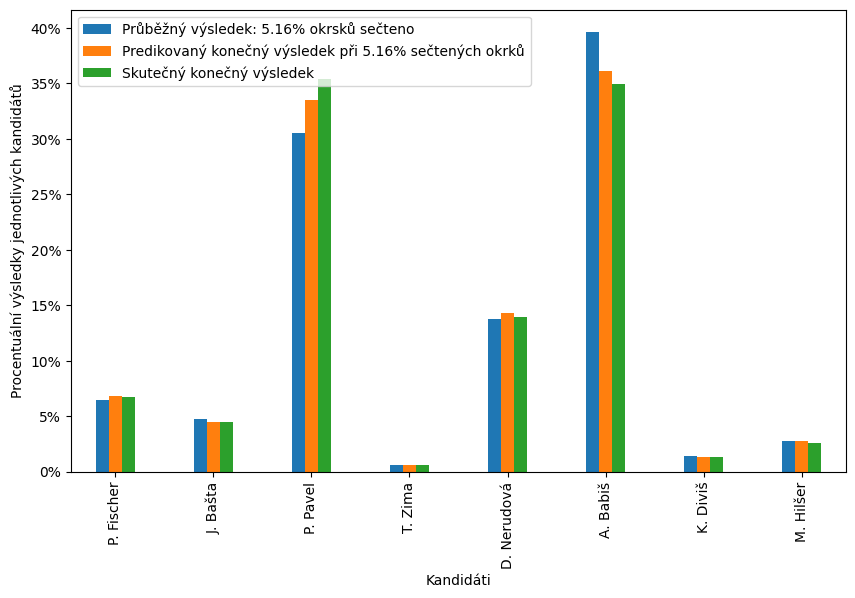

In [ ]:
from matplotlib.ticker import FuncFormatter


def percentage(x, pos):
    return '{:.0%}'.format(x)


ax = vysledky.plot(kind='bar', figsize=(10, 6), width=0.4)  # Adjust the width as needed

plt.xlabel('Kandidáti')
plt.ylabel('Procentuální výsledky jednotlivých kandidátů')

formatter = FuncFormatter(percentage)
ax.yaxis.set_major_formatter(formatter)

plt.legend()

plt.show()

In [ ]:
mse_list = []
rmse_list = []
hlasy_cols = list(prez_2023_1_train_last_row.columns)
hlasy_predikce_dict = {col: [] for col in hlasy_cols}

for i in range(1, prez_2023_1_original_data_abs['davka'].max()):
  prez_2023_1_abs_do_davky = prez_2023_1_original_data_abs[prez_2023_1_original_data_abs['davka'] <= i]
  prez_2023_1_abs_do_davky_merged_cluster_labels = pd.merge(cluster_labels, prez_2023_1_abs_do_davky, how = 'right', on = ['CIS_OBEC', 'CIS_OKRSEK'])
  prez_2023_1_abs_do_davky_merged_cluster_labels = prez_2023_1_abs_do_davky_merged_cluster_labels.groupby('cluster_label')[['PLATNE_HLASY'] + hlasy_cols].sum()
  total_zapsani_volici_2023_1_davka = prez_2023_1_abs_do_davky_merged_cluster_labels['PLATNE_HLASY'].sum()
  prez_2023_1_abs_do_davky_merged_cluster_labels['PODIL_CLUSTERU'] = prez_2023_1_abs_do_davky_merged_cluster_labels['PLATNE_HLASY'] / total_zapsani_volici_2023_1_davka
  prez_2023_1_abs_do_davky_merged_cluster_labels.drop(columns = ['PLATNE_HLASY'], inplace = True)
  prez_2023_1_abs_do_davky_merged_cluster_labels
  podily_clusteru = pd.merge(prez_2023_1_abs_do_davky_merged_cluster_labels, clustered_2018, on = 'cluster_label', how = 'inner', suffixes=['_2023', '_2018'])
  for col in hlasy_cols:
      podily_clusteru[col] = podily_clusteru[col] * (podily_clusteru['PODIL_CLUSTERU_2018'] / podily_clusteru['PODIL_CLUSTERU_2023'])
  podily_clusteru.drop(['PODIL_CLUSTERU_2023', 'PODIL_CLUSTERU_2018'], axis = 1, inplace=True)
  pocet_hlasu_predikce = podily_clusteru.sum()
  pocet_hlasu_predikce = pd.DataFrame(pocet_hlasu_predikce)
  pocet_hlasu_predikce.rename(columns={0: 'pred_pocet_hlasu'}, inplace=True)
  celkem_hlasu_davka_predikce = pocet_hlasu_predikce['pred_pocet_hlasu'].sum()
  pocet_hlasu_predikce['pred_pocet_hlasu'] = pocet_hlasu_predikce['pred_pocet_hlasu'] / celkem_hlasu_davka_predikce
  pocet_hlasu_predikce = pocet_hlasu_predikce.T

  for col in hlasy_predikce_dict:
    hlasy_predikce_dict[col].append(pocet_hlasu_predikce[col].values[0])

  mse = mean_squared_error(pocet_hlasu_predikce, prez_2023_1_vysledky)
  mse_list.append(mse)
  rmse = sqrt(mse)
  rmse_list.append(rmse)

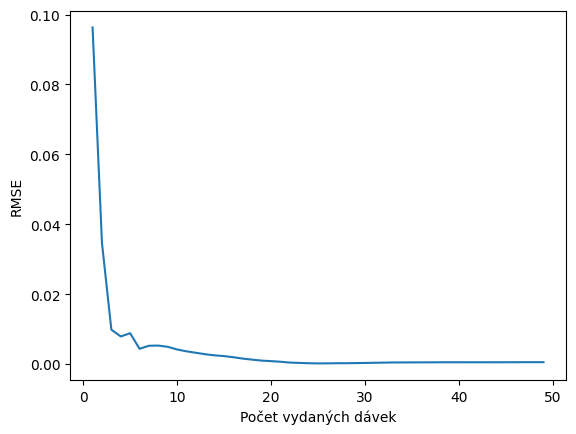

In [ ]:
x = range(1, 1 + len(rmse_list))
plt.plot(x, rmse_list)
plt.xlabel('Počet vydaných dávek')
plt.ylabel('RMSE')
plt.show()

In [ ]:
na_values_back = pd.Series([np.nan])
rmse_list_ser = pd.Series(rmse_list)
rmse_list_ser = pd.concat([rmse_list_ser, na_values_back], ignore_index=True)

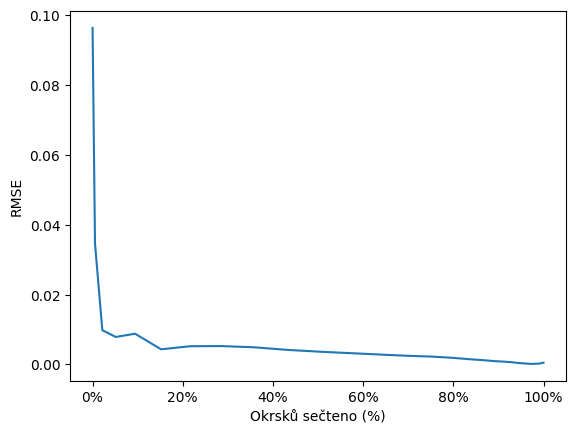

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

def percentage(x, pos):
    return '{:.0%}'.format(x)

plt.plot(prez_2023_1_original_data_proc['okrsku_secteno'], rmse_list_ser)

plt.xlabel('Okrsků sečteno (%)')
plt.ylabel('RMSE')

formatter = FuncFormatter(percentage)
plt.gca().xaxis.set_major_formatter(formatter)

plt.show()

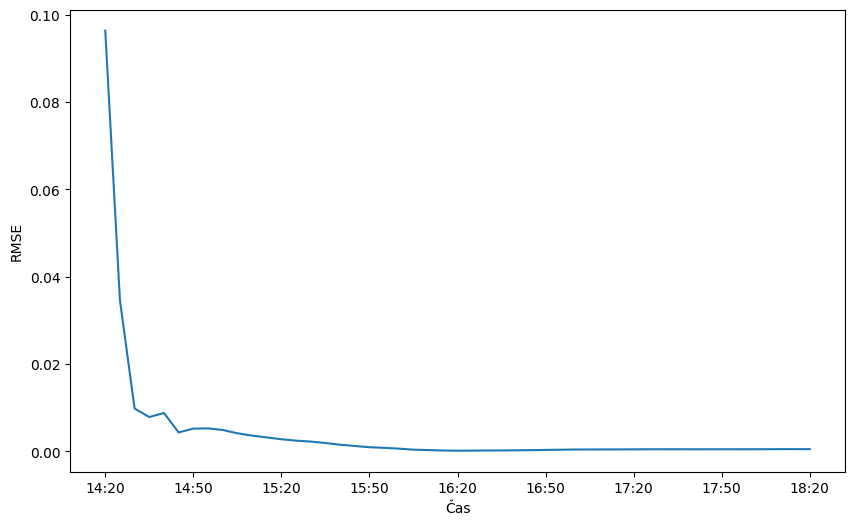

In [ ]:
n_points = len(rmse_list)

start_time = pd.Timestamp('2023-10-10 14:20')
time_labels = [(start_time + pd.Timedelta(minutes=5 * i)).strftime('%H:%M') for i in range(n_points)]

plt.figure(figsize=(10, 6))
plt.plot(range(1, n_points + 1), rmse_list)

plt.xticks(ticks=range(1, n_points + 1, 6), labels=time_labels[::6])

plt.xlabel('Čas')
plt.ylabel('RMSE')

plt.show()

In [ ]:
prejmenovani_klicu_slovniku = {
    'HLASY_1': 'P. Fischer',
    'HLASY_2': 'J. Bašta',
    'HLASY_4': 'P. Pavel',
    'HLASY_5': 'T. Zima',
    'HLASY_6': 'D. Nerudová',
    'HLASY_7': 'A. Babiš',
    'HLASY_8': 'K. Diviš',
    'HLASY_9': 'M. Hilšer'
}

predikce_prejmenovany_dict = {prejmenovani_klicu_slovniku.get(k, k): v for k, v in hlasy_predikce_dict.items()}

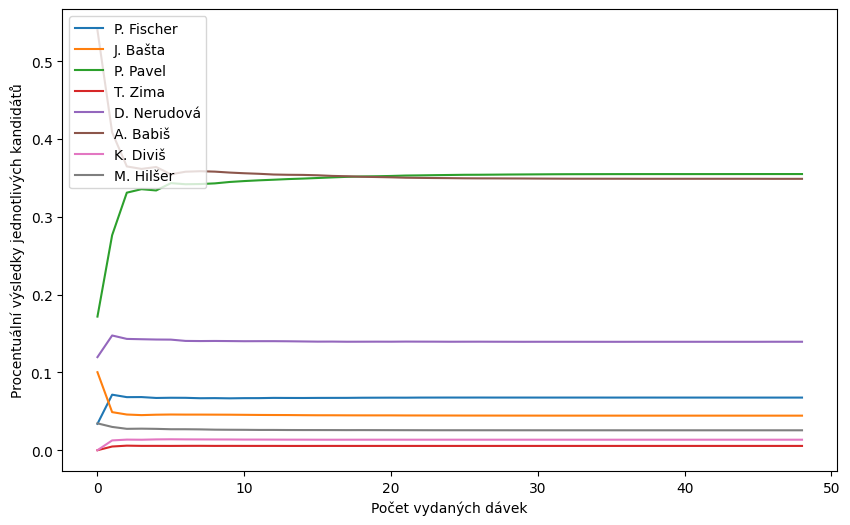

In [ ]:
plt.figure(figsize=(10, 6))

for key, values in predikce_prejmenovany_dict.items():
    plt.plot(values, label=key)

plt.xlabel('Počet vydaných dávek')
plt.ylabel('Procentuální výsledky jednotlivých kandidátů')

plt.legend()

plt.show()

In [ ]:
modified_predikce_dict = {}

for key, values in predikce_prejmenovany_dict.items():
    modified_values = pd.concat([pd.Series(values), pd.Series([np.nan])]).reset_index(drop=True)
    modified_predikce_dict[key] = modified_values

for key, values in modified_predikce_dict.items():
    print(f"{key}: {values.tolist()}")

P. Fischer: [0.033928996270216456, 0.0713866770099174, 0.06821996531573492, 0.06832015740017311, 0.06717559304006197, 0.0674358082865039, 0.06735485482508805, 0.06683805672530667, 0.0669672478576754, 0.06670387982025978, 0.06694230107241728, 0.06696765195292187, 0.0672644976143769, 0.06717854759869353, 0.06713644409756299, 0.06724664751154191, 0.0672799906726416, 0.06730076043530989, 0.06746002087365162, 0.06751782762996573, 0.06757472681579306, 0.06754928928655457, 0.06766613399128234, 0.06768210460502322, 0.06771004041520418, 0.06769292902040605, 0.06771939901750586, 0.06769089821945756, 0.06768548835931501, 0.0676906717789506, 0.06768510799020937, 0.0676800086563179, 0.06768815361232802, 0.06768999817920325, 0.06768743451678333, 0.06767530483192528, 0.06767538934756458, 0.06768747407800059, 0.06768362688865569, 0.06768080630726538, 0.0676755297096772, 0.06767471349194198, 0.06767101498962302, 0.0676624660051204, 0.06766201766598262, 0.06766121979096666, 0.0676573147569666, 0.0676590

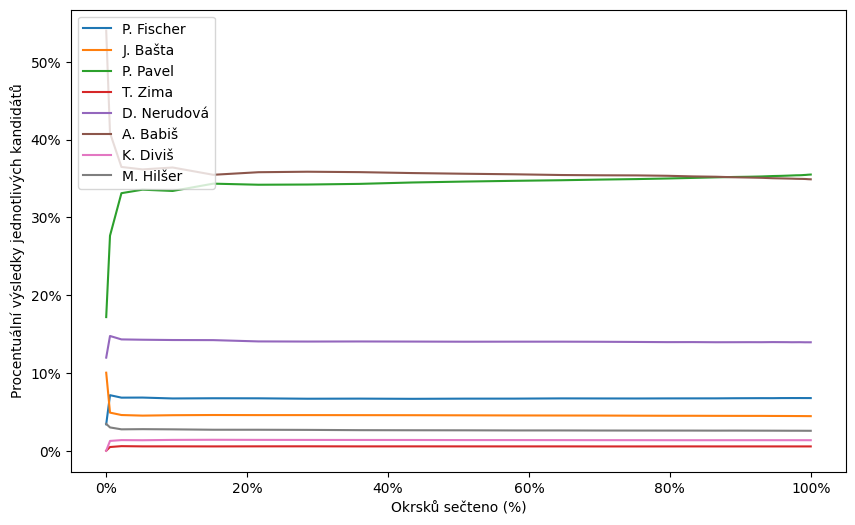

In [ ]:
from matplotlib.ticker import FuncFormatter
import matplotlib.pyplot as plt

prubeh = prez_2023_1_original_data_proc[['HLASY_1', 'HLASY_2', 'HLASY_4', 'HLASY_5', 'HLASY_6', 'HLASY_7', 'HLASY_8', 'HLASY_9']].copy()
konecne_vysledky = prubeh.iloc[-1]

def percentage(x, pos):
    return '{:.0%}'.format(x)

plt.figure(figsize=(10, 6))

for key, values in modified_predikce_dict.items():
    plt.plot(prez_2023_1_original_data_proc['okrsku_secteno'], values, label=key)

plt.xlabel('Okrsků sečteno (%)')
plt.ylabel('Procentuální výsledky jednotlivých kandidátů')

ax = plt.gca()

formatter = FuncFormatter(percentage)
ax.yaxis.set_major_formatter(formatter)
ax.xaxis.set_major_formatter(formatter)

plt.legend(loc='upper left')

plt.show()

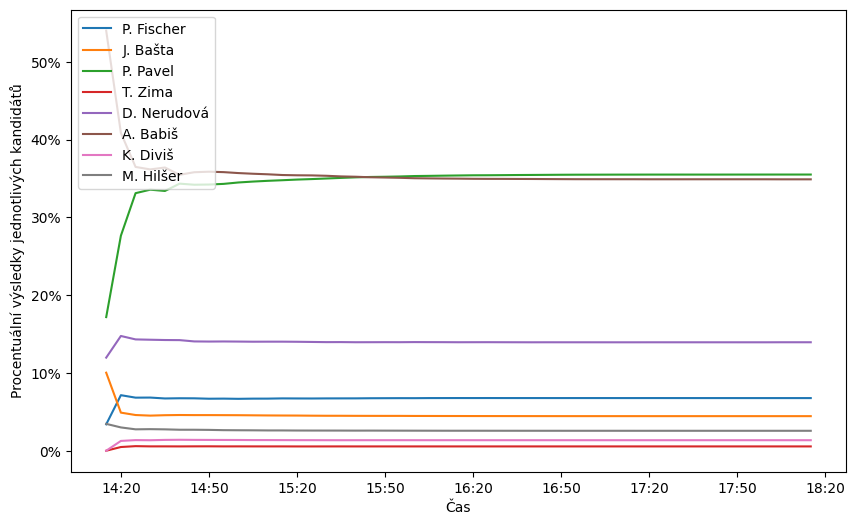

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.ticker import FuncFormatter

prubeh = prez_2023_1_original_data_proc[['HLASY_1', 'HLASY_2', 'HLASY_4', 'HLASY_5', 'HLASY_6', 'HLASY_7', 'HLASY_8', 'HLASY_9']].copy()
konecne_vysledky = prubeh.iloc[-1]

def percentage(x, pos):
    return '{:.0%}'.format(x)

n_points = len(next(iter(modified_predikce_dict.values())))

start_time = pd.Timestamp('2023-01-14 14:20')
time_labels = [(start_time + pd.Timedelta(minutes=5 * i)).strftime('%H:%M') for i in range(n_points)]

plt.figure(figsize=(10, 6))

for key, values in modified_predikce_dict.items():
    plt.plot(values, label=key)

plt.xlabel('Čas')
plt.ylabel('Procentuální výsledky jednotlivých kandidátů')

ax = plt.gca()

formatter = FuncFormatter(percentage)
ax.yaxis.set_major_formatter(formatter)

plt.xticks(ticks=range(1, n_points + 1, 6), labels=time_labels[::6])

plt.legend()

plt.show()

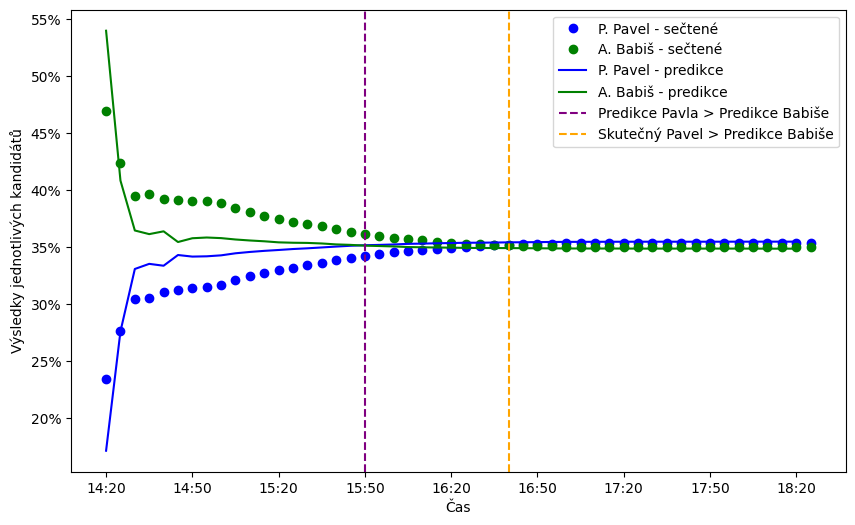

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter


n_points = len(next(iter(modified_predikce_dict.values())))

start_time = pd.Timestamp('2023-01-14 14:20')
time_labels = [(start_time + pd.Timedelta(minutes=5 * i)).strftime('%H:%M') for i in range(n_points)]

prubeh = prez_2023_1_original_data_proc[['HLASY_4', 'HLASY_7']].copy()
prubeh['P. Pavel'] = modified_predikce_dict['P. Pavel']
prubeh['A. Babiš'] = modified_predikce_dict['A. Babiš']

prubeh.columns = ["P. Pavel - sečtené", "A. Babiš - sečtené", "P. Pavel - predikce", "A. Babiš - predikce"]

index_pred_over = (prubeh['P. Pavel - predikce'] > prubeh['A. Babiš - predikce']).idxmax()
index_real_over = (prubeh['P. Pavel - sečtené'] > prubeh['A. Babiš - sečtené']).idxmax()

plt.figure(figsize=(10, 6))

pavel_color = 'blue'
babis_color = 'green'

plt.plot(prubeh['P. Pavel - sečtené'], 'o', label="P. Pavel - sečtené", color=pavel_color)
plt.plot(prubeh['A. Babiš - sečtené'], 'o', label="A. Babiš - sečtené", color=babis_color)

plt.plot(prubeh['P. Pavel - predikce'], '-', label="P. Pavel - predikce", color=pavel_color)
plt.plot(prubeh['A. Babiš - predikce'], '-', label="A. Babiš - predikce", color=babis_color)

plt.axvline(x=index_pred_over, color='purple', linestyle='--', label="Predikce Pavla > Predikce Babiše")
plt.axvline(x=index_real_over, color='orange', linestyle='--', label="Skutečný Pavel > Predikce Babiše")

plt.xlabel('Čas')
plt.ylabel('Výsledky jednotlivých kandidátů')

plt.xticks(ticks=range(0, n_points, 6), labels=time_labels[::6])

formatter = FuncFormatter(lambda y, _: f'{y:.0%}')
plt.gca().yaxis.set_major_formatter(formatter)

plt.legend()

plt.show()

In [ ]:
avg_rmse_agl_clust_1 = sum(rmse_list) / len(rmse_list)
print(f"Průměrný RMSE pro model Aglomerativního clusteringu a 1. kolo prezidentských voleb v roce 2023 je {avg_rmse_agl_clust_1}.")

Průměrný RMSE pro model Aglomerativního clusteringu a 1. kolo prezidentských voleb v roce 2023 je 0.004363368323627698.


In [ ]:
rmse_list_AGLOM_1 = rmse_list
rmse_df = pd.DataFrame(rmse_list_AGLOM_1)
rmse_df.rename(columns = {0: 'Aglom'}, inplace = True)
rmse_df.to_csv('rmse_AGLOM_1.csv', index = False)

##### Intervaly Spolehlivosti

In [ ]:
from scipy.stats import norm


z_score = norm.ppf(0.975)

predictions = {}
lower_bounds = {}
upper_bounds = {}

objekty = ['CIS_OBEC', 'CIS_OKRSEK']
merged_dataset[objekty] = merged_dataset[objekty].astype('int64')
cluster_labels = merged_dataset[['cluster_label', 'CIS_OBEC', 'CIS_OKRSEK']]
merged_data_2018 = pd.merge(cluster_labels, prez_2018_1_original_data_abs[['PLATNE_HLASY', 'CIS_OBEC', 'CIS_OKRSEK']], on=['CIS_OBEC', 'CIS_OKRSEK'], how='inner')
merged_data_2018.drop(columns = ['CIS_OKRSEK', 'CIS_OBEC'], axis = 1, inplace = True)
clustered_2018 = merged_data_2018.groupby('cluster_label').sum()
total_zapsani_volici = clustered_2018['PLATNE_HLASY'].sum()
clustered_2018['PODIL_CLUSTERU'] = clustered_2018['PLATNE_HLASY'] / total_zapsani_volici
clustered_2018.rename(columns = {'PLATNE_HLASY': 'PLATNE_HLASY_2018'}, inplace = True)


for i in range(1, prez_2023_1_original_data_abs['davka'].max()):
  prez_2023_1_abs_do_davky = prez_2023_1_original_data_abs[prez_2023_1_original_data_abs['davka'] <= i]
  nove_volby_with_clusters = pd.merge(cluster_labels, prez_2023_1_abs_do_davky, on=['CIS_OBEC', 'CIS_OKRSEK'], how='inner')
  nove_volby_with_clusters.drop(columns = ['CIS_OBEC', 'CIS_OKRSEK', 'davka', 'VYDANE_OBALKY', 'ODEVZDANE_OBALKY', 'ZAPSANI_VOLICI'], inplace = True)

  clustered_2023 = nove_volby_with_clusters.groupby('cluster_label').sum()

  celkove_volicu = clustered_2023['PLATNE_HLASY'].sum()

  clustered_2023['podil_clusteru_2023'] = clustered_2023['PLATNE_HLASY'] / celkove_volicu

  clustered_2023_with_shares_of_clusters = pd.merge(clustered_2023, clustered_2018, on=['cluster_label'], how='inner')

  clustered_2023_with_shares_of_clusters.rename(columns={'PODIL_CLUSTERU': 'podil_clusteru_2018'}, inplace=True)
  for col in ['HLASY_1', 'HLASY_2', 'HLASY_4', 'HLASY_5', 'HLASY_6', 'HLASY_7',  'HLASY_8', 'HLASY_9']:
    clustered_2023_with_shares_of_clusters[col + '_perc'] = clustered_2023_with_shares_of_clusters[col] / clustered_2023_with_shares_of_clusters['PLATNE_HLASY']

  for col in ['HLASY_1', 'HLASY_2', 'HLASY_4', 'HLASY_5', 'HLASY_6', 'HLASY_7',  'HLASY_8', 'HLASY_9']:
    clustered_2023_with_shares_of_clusters[col] = clustered_2023_with_shares_of_clusters[col] * (clustered_2023_with_shares_of_clusters['podil_clusteru_2018'] / clustered_2023_with_shares_of_clusters['podil_clusteru_2023'])
    clustered_2023_with_shares_of_clusters['scaled_fraction'] = (clustered_2023_with_shares_of_clusters['PLATNE_HLASY'] / clustered_2023_with_shares_of_clusters['PLATNE_HLASY_2018']).clip(upper=1)
    clustered_2023_with_shares_of_clusters[col + '_rozptyl'] = ((clustered_2023_with_shares_of_clusters[col + '_perc'] * (1 - clustered_2023_with_shares_of_clusters[col + '_perc'])) / clustered_2023_with_shares_of_clusters['PLATNE_HLASY']) * (clustered_2023_with_shares_of_clusters['podil_clusteru_2018'] / clustered_2023_with_shares_of_clusters['podil_clusteru_2023'])**2 * (1 - clustered_2023_with_shares_of_clusters['scaled_fraction'])

  clustered_2023_reweighted = clustered_2023_with_shares_of_clusters
  cols_to_choose_hlasy = ['HLASY_1', 'HLASY_2', 'HLASY_4', 'HLASY_5', 'HLASY_6', 'HLASY_7',  'HLASY_8', 'HLASY_9']
  cols_to_choose_rozptyl = ['HLASY_1_rozptyl', 'HLASY_2_rozptyl', 'HLASY_4_rozptyl', 'HLASY_5_rozptyl', 'HLASY_6_rozptyl', 'HLASY_7_rozptyl',  'HLASY_8_rozptyl', 'HLASY_9_rozptyl']
  clustered_2023_pred_pocet_hlasu = clustered_2023_reweighted[cols_to_choose_hlasy]
  clustered_2023_rozptyl = clustered_2023_reweighted[cols_to_choose_rozptyl]
  clustered_2023_pred_pocet_hlasu = clustered_2023_pred_pocet_hlasu.sum().sort_index()
  clustered_2023_rozptyl = clustered_2023_rozptyl.sum().sort_index()
  clustered_2023_pred_pocet_hlasu = pd.DataFrame(clustered_2023_pred_pocet_hlasu)
  clustered_2023_rozptyl = pd.DataFrame(clustered_2023_rozptyl)

  clustered_2023_pred_pocet_hlasu.rename(columns={0: 'pred_pocet_hlasu'}, inplace=True)
  clustered_2023_rozptyl.rename(columns={0: 'rozptyl'}, inplace=True)

  clustered_2023_rozptyl = clustered_2023_rozptyl.T

  celkem_hlasu = clustered_2023_pred_pocet_hlasu['pred_pocet_hlasu'].sum()
  clustered_2023_pred_pocet_hlasu['pred_proc_vysl'] = clustered_2023_pred_pocet_hlasu['pred_pocet_hlasu'] / celkem_hlasu
  prez_2023_1_predikce = clustered_2023_pred_pocet_hlasu['pred_proc_vysl']
  prez_2023_1_predikce = pd.DataFrame(prez_2023_1_predikce).T

  predictions[i] = {}
  lower_bounds[i] = {}
  upper_bounds[i] = {}

  for col in prez_2023_1_predikce.columns:
      pred_value = prez_2023_1_predikce[col].values[0]
      lower_bound = pred_value - z_score * np.sqrt(clustered_2023_rozptyl[col + '_rozptyl'].values[0])
      upper_bound = pred_value + z_score * np.sqrt(clustered_2023_rozptyl[col + '_rozptyl'].values[0])

      predictions[i][col] = pred_value
      lower_bounds[i][col] = lower_bound
      upper_bounds[i][col] = upper_bound

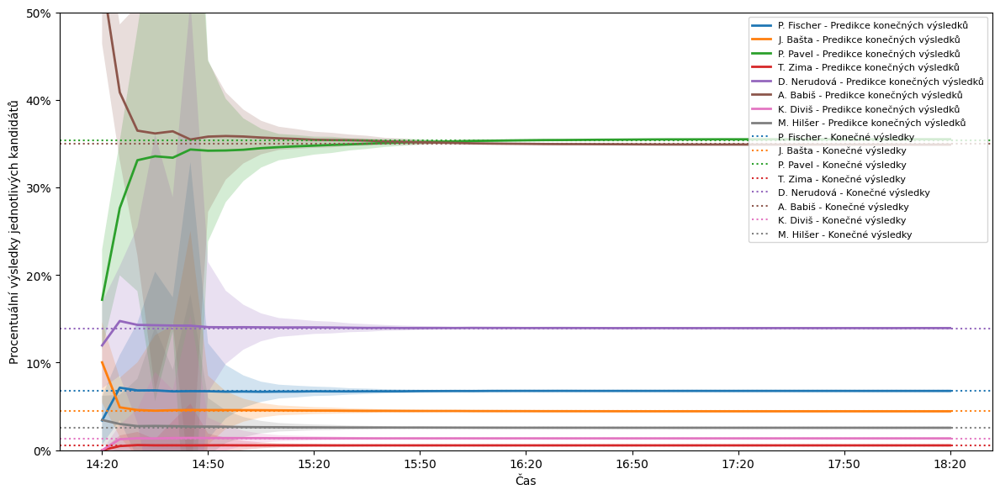

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.ticker import FuncFormatter


prubeh = prez_2023_1_original_data_proc[['HLASY_1', 'HLASY_2', 'HLASY_4', 'HLASY_5', 'HLASY_6', 'HLASY_7', 'HLASY_8', 'HLASY_9']].copy()
konecne_vysledky = prubeh.iloc[-1]

plt.figure(figsize=(12, 6))

labels = {
    'HLASY_1': 'P. Fischer',
    'HLASY_2': 'J. Bašta',
    'HLASY_4': 'P. Pavel',
    'HLASY_5': 'T. Zima',
    'HLASY_6': 'D. Nerudová',
    'HLASY_7': 'A. Babiš',
    'HLASY_8': 'K. Diviš',
    'HLASY_9': 'M. Hilšer'
}

def percentage(x, pos):
    return '{:.0%}'.format(x)

n_points = 50

start_time = pd.Timestamp('2023-01-14 14:20')
time_labels = [(start_time + pd.Timedelta(minutes=5 * i)).strftime('%H:%M') for i in range(n_points)]

for col in predictions[1].keys():
    pred_values = [predictions[i][col] for i in range(1, len(predictions) + 1)]
    lower_values = [lower_bounds[i][col] for i in range(1, len(lower_bounds) + 1)]
    upper_values = [upper_bounds[i][col] for i in range(1, len(upper_bounds) + 1)]

    plt.plot(pred_values, label=labels.get(col, col) + ' - Predikce konečných výsledků', linewidth=2)
    plt.fill_between(range(len(pred_values)), lower_values, upper_values, alpha=0.2)

plt.axhline(y=konecne_vysledky['HLASY_1'], label="P. Fischer - Konečné výsledky", color='#1f77b4', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_2'], label="J. Bašta - Konečné výsledky", color='#ff7f0e', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_4'], label="P. Pavel - Konečné výsledky", color='#2ca02c', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_5'], label="T. Zima - Konečné výsledky", color='#d6272B', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_6'], label="D. Nerudová - Konečné výsledky", color='#9467bd', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_7'], label="A. Babiš - Konečné výsledky", color='#8c564b', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_8'], label="K. Diviš - Konečné výsledky", color='#e377c2', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_9'], label="M. Hilšer - Konečné výsledky", color='#7f7f7f', linestyle='dotted')

plt.xlabel('Čas')
plt.ylabel('Procentuální výsledky jednotlivých kandidátů')

plt.ylim(0, 0.5)

ax = plt.gca()

formatter = FuncFormatter(percentage)
ax.yaxis.set_major_formatter(formatter)

plt.xticks(ticks=range(0, n_points, 6), labels=time_labels[::6])

plt.legend(loc='upper right', fontsize=8)

plt.tight_layout()
plt.show()

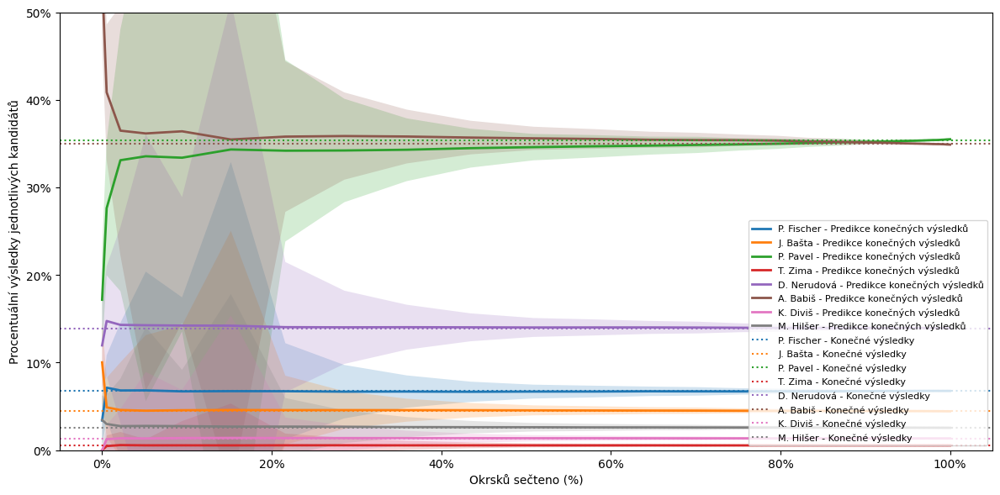

In [ ]:
from matplotlib.ticker import FuncFormatter
import matplotlib.pyplot as plt
import pandas as pd

prubeh = prez_2023_1_original_data_proc[['HLASY_1', 'HLASY_2', 'HLASY_4', 'HLASY_5', 'HLASY_6', 'HLASY_7', 'HLASY_8', 'HLASY_9']].copy()
konecne_vysledky = prubeh.iloc[-1]

orsku_secteno = prez_2023_1_original_data_proc['okrsku_secteno'][:-1]

plt.figure(figsize=(12, 6))

labels = {
    'HLASY_1': 'P. Fischer',
    'HLASY_2': 'J. Bašta',
    'HLASY_4': 'P. Pavel',
    'HLASY_5': 'T. Zima',
    'HLASY_6': 'D. Nerudová',
    'HLASY_7': 'A. Babiš',
    'HLASY_8': 'K. Diviš',
    'HLASY_9': 'M. Hilšer'
}

def percentage(x, pos):
    return '{:.0%}'.format(x)

for col in predictions[1].keys():
    pred_values = [predictions[i][col] for i in range(1, len(predictions) + 1)]
    lower_values = [lower_bounds[i][col] for i in range(1, len(lower_bounds) + 1)]
    upper_values = [upper_bounds[i][col] for i in range(1, len(upper_bounds) + 1)]

    plt.plot(orsku_secteno, pred_values, label=labels.get(col, col) + ' - Predikce konečných výsledků', linewidth=2)
    plt.fill_between(orsku_secteno, lower_values, upper_values, alpha=0.2)


plt.axhline(y=konecne_vysledky['HLASY_1'], label="P. Fischer - Konečné výsledky", color='#1f77b4', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_2'], label="J. Bašta - Konečné výsledky", color='#ff7f0e', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_4'], label="P. Pavel - Konečné výsledky", color='#2ca02c', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_5'], label="T. Zima - Konečné výsledky", color='#d6272B', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_6'], label="D. Nerudová - Konečné výsledky", color='#9467bd', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_7'], label="A. Babiš - Konečné výsledky", color='#8c564b', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_8'], label="K. Diviš - Konečné výsledky", color='#e377c2', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_9'], label="M. Hilšer - Konečné výsledky", color='#7f7f7f', linestyle='dotted')

plt.xlabel('Okrsků sečteno (%)')
plt.ylabel('Procentuální výsledky jednotlivých kandidátů')

plt.ylim(0, 0.5)

ax = plt.gca()

formatter = FuncFormatter(percentage)
ax.yaxis.set_major_formatter(formatter)
ax.xaxis.set_major_formatter(formatter)

plt.legend(loc='lower right', fontsize=8)

plt.tight_layout()
plt.show()

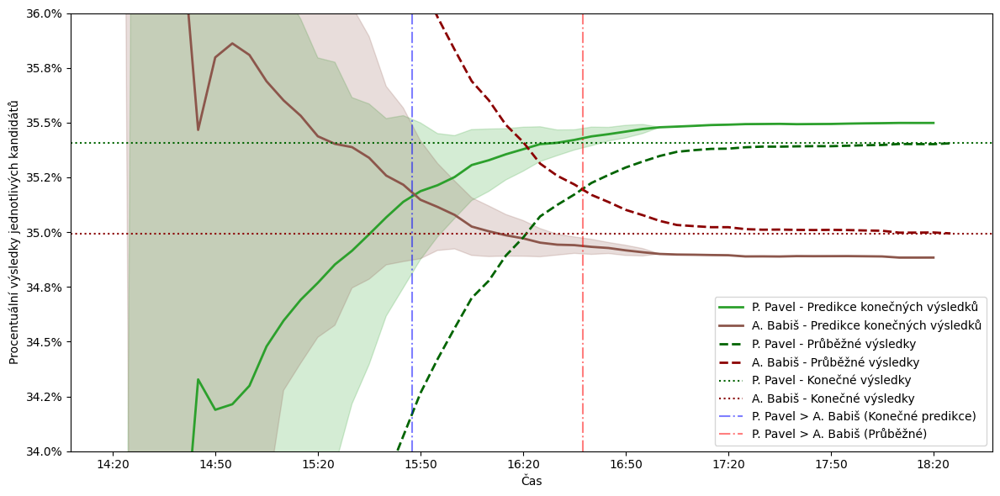

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.ticker import FuncFormatter

prubeh = prez_2023_1_original_data_proc[['HLASY_4', 'HLASY_7']].copy()
konecne_vysledky = prubeh.iloc[-1]

plt.figure(figsize=(12, 6))

labels = {
    'HLASY_4': 'P. Pavel - Predikce konečných výsledků',
    'HLASY_7': 'A. Babiš - Predikce konečných výsledků'
}

colors = {
    'HLASY_4': '#2ca02c',
    'HLASY_7': '#8c564b'
}

def percentage(x, pos):
    return '{:.1%}'.format(x)

n_points = len(predictions)

start_time = pd.Timestamp('2023-01-14 14:20')
time_labels = [(start_time + pd.Timedelta(minutes=5 * i)).strftime('%H:%M') for i in range(n_points)]

pred_pavel_greater_idx = None
real_pavel_greater_idx = None
ci_pavel_greater_idx = None

for i in range(1, n_points + 1):
    # 1. Predikce P. Pavel > Predikce A. Babiš
    if pred_pavel_greater_idx is None and predictions[i]['HLASY_4'] > predictions[i]['HLASY_7']:
        pred_pavel_greater_idx = i

    # 2. Skutečné výsledky P. Pavel > Predikce A. Babiš
    if real_pavel_greater_idx is None and prubeh['HLASY_4'].iloc[i - 1] > prubeh['HLASY_7'].iloc[i - 1]:
        real_pavel_greater_idx = i

    # 3. Dolní hranice IS P. Pavel > Horní hranice IS A. Babiš
    if ci_pavel_greater_idx is None and lower_bounds[i]['HLASY_4'] > upper_bounds[i]['HLASY_7']:
        ci_pavel_greater_idx = i

for col in ['HLASY_4', 'HLASY_7']:
    pred_values = [predictions[i][col] for i in range(1, n_points + 1)]
    lower_values = [lower_bounds[i][col] for i in range(1, n_points + 1)]
    upper_values = [upper_bounds[i][col] for i in range(1, n_points + 1)]

    plt.plot(pred_values, label=labels.get(col, col), linewidth=2, color=colors[col])
    plt.fill_between(range(n_points), lower_values, upper_values, alpha=0.2, color=colors[col])

plt.plot(prubeh['HLASY_4'], label="P. Pavel - Průběžné výsledky", color='#006400', linestyle='--', linewidth=2)
plt.plot(prubeh['HLASY_7'], label="A. Babiš - Průběžné výsledky", color='#8B0000', linestyle='--', linewidth=2)

plt.axhline(y=konecne_vysledky['HLASY_4'], label="P. Pavel - Konečné výsledky", color='#006400', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_7'], label="A. Babiš - Konečné výsledky", color='#8B0000', linestyle='dotted')

if pred_pavel_greater_idx:
    plt.axvline(x=pred_pavel_greater_idx-1.5, color='blue', linestyle='dashdot', label="P. Pavel > A. Babiš (Konečné predikce)", alpha=0.5)
if real_pavel_greater_idx:
    plt.axvline(x=real_pavel_greater_idx-1.5, color='red', linestyle='dashdot', label="P. Pavel > A. Babiš (Průběžné)", alpha=0.5)

plt.xlabel('Čas')
plt.ylabel('Procentuální výsledky jednotlivých kandidátů')

plt.ylim(0.34, 0.36)

ax = plt.gca()

formatter = FuncFormatter(percentage)
ax.yaxis.set_major_formatter(formatter)

plt.xticks(ticks=range(0, n_points, 6), labels=time_labels[::6])

plt.legend(loc='lower right')

plt.tight_layout()
plt.show()

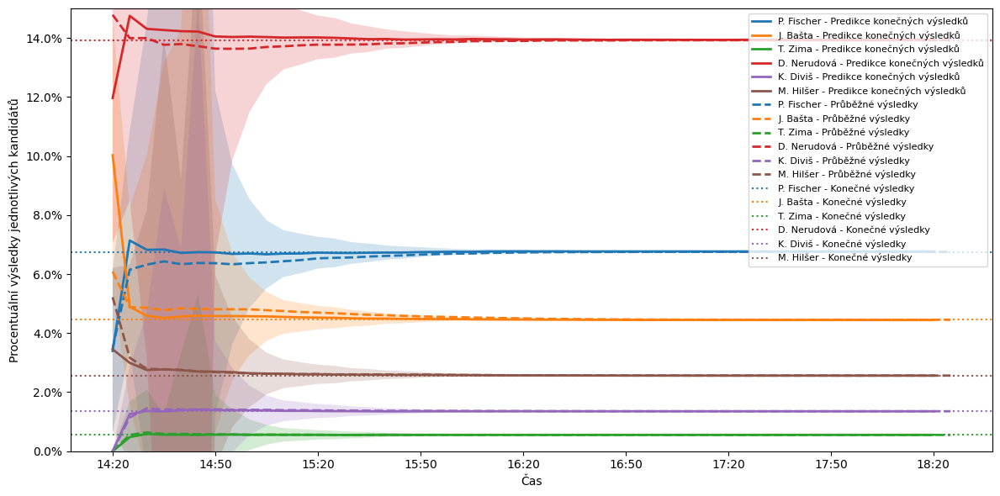

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.ticker import FuncFormatter

prubeh = prez_2023_1_original_data_proc[['HLASY_1', 'HLASY_2', 'HLASY_5', 'HLASY_6', 'HLASY_8', 'HLASY_9']].copy()
konecne_vysledky = prubeh.iloc[-1]

plt.figure(figsize=(12, 6))

labels = {
    'HLASY_1': 'P. Fischer',
    'HLASY_2': 'J. Bašta',
    'HLASY_5': 'T. Zima',
    'HLASY_6': 'D. Nerudová',
    'HLASY_8': 'K. Diviš',
    'HLASY_9': 'M. Hilšer'
}

def percentage(x, pos):
    return '{:.1%}'.format(x)

n_points = 50

start_time = pd.Timestamp('2023-01-14 14:20')
time_labels = [(start_time + pd.Timedelta(minutes=5 * i)).strftime('%H:%M') for i in range(n_points)]

for col in ['HLASY_1', 'HLASY_2', 'HLASY_5', 'HLASY_6', 'HLASY_8', 'HLASY_9']:
    pred_values = [predictions[i][col] for i in range(1, len(predictions) + 1)]
    lower_values = [lower_bounds[i][col] for i in range(1, len(lower_bounds) + 1)]
    upper_values = [upper_bounds[i][col] for i in range(1, len(upper_bounds) + 1)]

    plt.plot(pred_values, label=labels.get(col, col) + ' - Predikce konečných výsledků', linewidth=2)
    plt.fill_between(range(len(pred_values)), lower_values, upper_values, alpha=0.2)

plt.plot(prubeh['HLASY_1'], label="P. Fischer - Průběžné výsledky", color='#1f77b4', linestyle='--', linewidth=2)
plt.plot(prubeh['HLASY_2'], label="J. Bašta - Průběžné výsledky", color='#ff7f0e', linestyle='--', linewidth=2)
plt.plot(prubeh['HLASY_5'], label="T. Zima - Průběžné výsledky", color='#2ca02c', linestyle='--', linewidth=2)
plt.plot(prubeh['HLASY_6'], label="D. Nerudová - Průběžné výsledky", color='#d6272B', linestyle='--', linewidth=2)
plt.plot(prubeh['HLASY_8'], label="K. Diviš - Průběžné výsledky", color='#9467bd', linestyle='--', linewidth=2)
plt.plot(prubeh['HLASY_9'], label="M. Hilšer - Průběžné výsledky", color='#8c564b', linestyle='--', linewidth=2)

plt.axhline(y=konecne_vysledky['HLASY_1'], label="P. Fischer - Konečné výsledky", color='#1f77b4', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_2'], label="J. Bašta - Konečné výsledky", color='#ff7f0e', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_5'], label="T. Zima - Konečné výsledky", color='#2ca02c', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_6'], label="D. Nerudová - Konečné výsledky", color='#d6272B', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_8'], label="K. Diviš - Konečné výsledky", color='#9467bd', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_9'], label="M. Hilšer - Konečné výsledky", color='#8c564b', linestyle='dotted')

plt.xlabel('Čas')
plt.ylabel('Procentuální výsledky jednotlivých kandidátů')

plt.ylim(0, 0.15)

ax = plt.gca()

formatter = FuncFormatter(percentage)
ax.yaxis.set_major_formatter(formatter)

plt.xticks(ticks=range(0, n_points, 6), labels=time_labels[::6])

plt.legend(loc='upper right', fontsize=8)

plt.tight_layout()
plt.show()


#### Predikce prezidentskych voleb 2023 1. kolo - K-means

In [ ]:
prez_2018_1_abs = only_unique_rows(prez_2018_1_original_data_abs)
prez_2018_1_abs = str_cols_to_int_cols(prez_2018_1_abs)
prez_2018_1_abs = reindex_cols(prez_2018_1_abs)

prez_2018_2_abs = only_unique_rows(prez_2018_2_original_data_abs)
prez_2018_2_abs = str_cols_to_int_cols(prez_2018_2_abs)
prez_2018_2_abs = reindex_cols(prez_2018_2_abs)

In [ ]:
prez_2018_1_rel = vysledky_okrsky_proc(prez_2018_1_abs)
prez_2018_2_rel = vysledky_okrsky_proc(prez_2018_2_abs)

In [ ]:
prez_2018_1_rel = prez_2018_1_rel.fillna(0)
prez_2018_2_rel = prez_2018_2_rel.fillna(0)
prez_2018_1_rel.head()

,HLASY_1,HLASY_2,HLASY_3,HLASY_4,HLASY_5,HLASY_6,HLASY_7,HLASY_8,HLASY_9,CIS_OBEC_OKRSEK
0,0.0,0.153846,0.038462,0.0,0.038462,0.0,0.538462,0.076923,0.153846,566080_1
1,0.028986,0.101449,0.101449,0.014493,0.014493,0.014493,0.463768,0.130435,0.130435,573060_5
2,0.12766,0.06383,0.085106,0.021277,0.021277,0.0,0.255319,0.106383,0.319149,547701_1
3,0.0,0.448276,0.034483,0.0,0.0,0.0,0.310345,0.0,0.206897,542059_1
4,0.042553,0.148936,0.085106,0.0,0.0,0.0,0.382979,0.191489,0.148936,599034_1


In [ ]:
prez_2018_2_rel.head()

,HLASY_7,HLASY_9,CIS_OBEC_OKRSEK
0,0.703704,0.296296,541281_5
1,0.413793,0.586207,549584_2
2,0.404255,0.595745,547701_1
3,0.510638,0.489362,587206_1
4,0.597403,0.402597,573060_5


In [ ]:
ps_2021_abs = only_unique_rows(ps_2021_original_data_abs)
ps_2021_abs = str_cols_to_int_cols(ps_2021_abs)
ps_2021_abs.head()

,CIS_OBEC,CIS_OKRSEK,PLATNE_HLASY,ZAPSANI_VOLICI,davka,HLASY_1,HLASY_2,HLASY_3,HLASY_4,HLASY_5,...,HLASY_13,HLASY_14,HLASY_15,HLASY_16,HLASY_17,HLASY_18,HLASY_19,HLASY_20,HLASY_21,HLASY_22
0,500011,1,504,717,15,1,1,8,67,28,...,141,0,2,4,64,14,0,128,5,8
1,500011,2,284,435,21,3,3,8,31,16,...,83,0,0,0,37,4,0,75,0,0
2,500011,3,289,394,17,2,0,4,17,24,...,118,0,1,1,37,6,0,60,1,0
3,500020,1,159,268,19,1,1,8,16,8,...,32,0,0,0,22,13,0,35,0,3
4,500020,2,452,729,30,1,0,5,81,23,...,113,0,2,0,37,7,0,139,3,2


In [ ]:
def vysledky_okrsky_proc_PS(df):
  columns_to_divide = df.columns[df.columns.str.startswith('HLASY_')]
  df[columns_to_divide] = df[columns_to_divide].div(df['PLATNE_HLASY'], axis=0)
  #df['VOLEBNI_UCAST'] = df['PLATNE_HLASY'].div(df['ZAPSANI_VOLICI'], axis = 0)
  df['CIS_OBEC_OKRSEK'] = df['CIS_OBEC'].astype(str) + '_' + df['CIS_OKRSEK'].astype(str)
  df = df.drop(['ZAPSANI_VOLICI', 'PLATNE_HLASY', 'davka', 'CIS_OBEC', 'CIS_OKRSEK'], axis = 1)
  return df

In [ ]:
ps_2021_rel = vysledky_okrsky_proc_PS(ps_2021_abs)
ps_2021_rel.head()

,HLASY_1,HLASY_2,HLASY_3,HLASY_4,HLASY_5,HLASY_6,HLASY_7,HLASY_8,HLASY_9,HLASY_10,...,HLASY_14,HLASY_15,HLASY_16,HLASY_17,HLASY_18,HLASY_19,HLASY_20,HLASY_21,HLASY_22,CIS_OBEC_OKRSEK
0,0.001984,0.001984,0.015873,0.132937,0.055556,0.0,0.001984,0.02381,0.0,0.001984,...,0.0,0.003968,0.007937,0.126984,0.027778,0.0,0.253968,0.009921,0.015873,500011_1
1,0.010563,0.010563,0.028169,0.109155,0.056338,0.0,0.003521,0.028169,0.003521,0.003521,...,0.0,0.0,0.0,0.130282,0.014085,0.0,0.264085,0.0,0.0,500011_2
2,0.00692,0.0,0.013841,0.058824,0.083045,0.0,0.0,0.024221,0.00692,0.0,...,0.0,0.00346,0.00346,0.128028,0.020761,0.0,0.207612,0.00346,0.0,500011_3
3,0.006289,0.006289,0.050314,0.100629,0.050314,0.0,0.0,0.025157,0.0,0.012579,...,0.0,0.0,0.0,0.138365,0.081761,0.0,0.220126,0.0,0.018868,500020_1
4,0.002212,0.0,0.011062,0.179204,0.050885,0.0,0.002212,0.037611,0.0,0.004425,...,0.0,0.004425,0.0,0.081858,0.015487,0.0,0.307522,0.006637,0.004425,500020_2


In [ ]:
merged_dataset = prez_2018_1_rel.merge(ps_2021_rel, on = 'CIS_OBEC_OKRSEK', how = 'outer', suffixes = ('_prez', '_ps'))
merged_dataset.head()

,HLASY_1_prez,HLASY_2_prez,HLASY_3_prez,HLASY_4_prez,HLASY_5_prez,HLASY_6_prez,HLASY_7_prez,HLASY_8_prez,HLASY_9_prez,CIS_OBEC_OKRSEK,...,HLASY_13,HLASY_14,HLASY_15,HLASY_16,HLASY_17,HLASY_18,HLASY_19,HLASY_20,HLASY_21,HLASY_22
0,0.030242,0.070565,0.159274,0.008065,0.008065,0.004032,0.407258,0.0625,0.25,500011_1,...,0.279762,0.0,0.003968,0.007937,0.126984,0.027778,0.0,0.253968,0.009921,0.015873
1,0.018382,0.040441,0.139706,0.0,0.0,0.003676,0.400735,0.128676,0.268382,500011_2,...,0.292254,0.0,0.0,0.0,0.130282,0.014085,0.0,0.264085,0.0,0.0
2,0.073944,0.088028,0.144366,0.010563,0.010563,0.0,0.316901,0.151408,0.204225,500011_3,...,0.408304,0.0,0.00346,0.00346,0.128028,0.020761,0.0,0.207612,0.00346,0.0
3,0.025157,0.062893,0.069182,0.006289,0.006289,0.0,0.534591,0.056604,0.238994,500020_1,...,0.201258,0.0,0.0,0.0,0.138365,0.081761,0.0,0.220126,0.0,0.018868
4,0.038647,0.077295,0.077295,0.016908,0.002415,0.002415,0.44686,0.125604,0.21256,500020_2,...,0.25,0.0,0.004425,0.0,0.081858,0.015487,0.0,0.307522,0.006637,0.004425


In [ ]:
merged_dataset = merged_dataset.merge(prez_2018_2_rel, on = 'CIS_OBEC_OKRSEK', how = 'outer')
merged_dataset[['CIS_OBEC', 'CIS_OKRSEK']] = merged_dataset['CIS_OBEC_OKRSEK'].str.split('_', expand=True)
merged_dataset.drop(columns=['CIS_OBEC_OKRSEK'], inplace=True)
merged_dataset.head()

,HLASY_1_prez,HLASY_2_prez,HLASY_3_prez,HLASY_4_prez,HLASY_5_prez,HLASY_6_prez,HLASY_7_prez,HLASY_8_prez,HLASY_9_prez,HLASY_1_ps,...,HLASY_17,HLASY_18,HLASY_19,HLASY_20,HLASY_21,HLASY_22,HLASY_7,HLASY_9,CIS_OBEC,CIS_OKRSEK
0,0.030242,0.070565,0.159274,0.008065,0.008065,0.004032,0.407258,0.0625,0.25,0.001984,...,0.126984,0.027778,0.0,0.253968,0.009921,0.015873,0.522556,0.477444,500011,1
1,0.018382,0.040441,0.139706,0.0,0.0,0.003676,0.400735,0.128676,0.268382,0.010563,...,0.130282,0.014085,0.0,0.264085,0.0,0.0,0.533113,0.466887,500011,2
2,0.073944,0.088028,0.144366,0.010563,0.010563,0.0,0.316901,0.151408,0.204225,0.00692,...,0.128028,0.020761,0.0,0.207612,0.00346,0.0,0.47931,0.52069,500011,3
3,0.025157,0.062893,0.069182,0.006289,0.006289,0.0,0.534591,0.056604,0.238994,0.006289,...,0.138365,0.081761,0.0,0.220126,0.0,0.018868,0.644809,0.355191,500020,1
4,0.038647,0.077295,0.077295,0.016908,0.002415,0.002415,0.44686,0.125604,0.21256,0.002212,...,0.081858,0.015487,0.0,0.307522,0.006637,0.004425,0.622222,0.377778,500020,2


In [ ]:
from sklearn.preprocessing import StandardScaler

merged_dataset.fillna(0, inplace = True)
X = merged_dataset.drop(columns = ['CIS_OBEC', 'CIS_OKRSEK'])

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
X_scaled


array([[-0.3971544 , -0.47312476,  1.29666587, ...,  2.09176316,
        -0.11849341,  0.13548525],
       [-0.89244675, -1.25056114,  0.8981808 , ..., -0.42808253,
        -0.04061096,  0.0572271 ],
       [ 1.42796305, -0.02241514,  0.99308249, ..., -0.42808253,
        -0.43755809,  0.45608912],
       ...,
       [-1.66014991, 10.60993481, -1.94676109, ..., -0.42808253,
        -1.02270128,  1.04405509],
       [-1.66014991, -0.30902023,  2.75257612, ..., -0.42808253,
        -3.97385828,  4.00944866],
       [-1.66014991, -0.7761413 ,  2.84471999, ..., -0.42808253,
        -3.69009319,  3.72431466]])

In [ ]:
# K-means clustering
kmeans = KMeans(n_clusters=18, random_state=0)
kmeans.fit(X_scaled)
merged_dataset['cluster_label'] = kmeans.labels_

In [ ]:
merged_dataset.head()

,HLASY_1_prez,HLASY_2_prez,HLASY_3_prez,HLASY_4_prez,HLASY_5_prez,HLASY_6_prez,HLASY_7_prez,HLASY_8_prez,HLASY_9_prez,HLASY_1_ps,...,HLASY_18,HLASY_19,HLASY_20,HLASY_21,HLASY_22,HLASY_7,HLASY_9,CIS_OBEC,CIS_OKRSEK,cluster_label
0,0.030242,0.070565,0.159274,0.008065,0.008065,0.004032,0.407258,0.0625,0.25,0.001984,...,0.027778,0.0,0.253968,0.009921,0.015873,0.522556,0.477444,500011,1,8
1,0.018382,0.040441,0.139706,0.0,0.0,0.003676,0.400735,0.128676,0.268382,0.010563,...,0.014085,0.0,0.264085,0.0,0.0,0.533113,0.466887,500011,2,8
2,0.073944,0.088028,0.144366,0.010563,0.010563,0.0,0.316901,0.151408,0.204225,0.00692,...,0.020761,0.0,0.207612,0.00346,0.0,0.47931,0.52069,500011,3,10
3,0.025157,0.062893,0.069182,0.006289,0.006289,0.0,0.534591,0.056604,0.238994,0.006289,...,0.081761,0.0,0.220126,0.0,0.018868,0.644809,0.355191,500020,1,17
4,0.038647,0.077295,0.077295,0.016908,0.002415,0.002415,0.44686,0.125604,0.21256,0.002212,...,0.015487,0.0,0.307522,0.006637,0.004425,0.622222,0.377778,500020,2,3


In [ ]:
objekty = ['CIS_OBEC', 'CIS_OKRSEK']
merged_dataset[objekty] = merged_dataset[objekty].astype('int64')

In [ ]:
# Sloučení vybraných částí dohromady
cluster_labels = merged_dataset[['cluster_label', 'CIS_OBEC', 'CIS_OKRSEK']]
cluster_labels.head()

,cluster_label,CIS_OBEC,CIS_OKRSEK
0,8,500011,1
1,8,500011,2
2,10,500011,3
3,17,500020,1
4,3,500020,2


In [ ]:
merged_data_2018 = pd.merge(cluster_labels, prez_2018_1_original_data_abs[['PLATNE_HLASY', 'CIS_OBEC', 'CIS_OKRSEK']], on=['CIS_OBEC', 'CIS_OKRSEK'], how='inner')
merged_data_2018.info()
merged_data_2018.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14882 entries, 0 to 14881
Data columns (total 4 columns):
 #   Column         Non-Null Count  Dtype
---  ------         --------------  -----
 0   cluster_label  14882 non-null  int32
 1   CIS_OBEC       14882 non-null  int64
 2   CIS_OKRSEK     14882 non-null  int64
 3   PLATNE_HLASY   14882 non-null  int64
dtypes: int32(1), int64(3)
memory usage: 407.1 KB


,cluster_label,CIS_OBEC,CIS_OKRSEK,PLATNE_HLASY
0,8,500011,1,496
1,8,500011,2,272
2,10,500011,3,284
3,17,500020,1,159
4,3,500020,2,414


In [ ]:
merged_data_2018.drop(columns = ['CIS_OKRSEK', 'CIS_OBEC'], axis = 1, inplace = True)

In [ ]:
clustered_2018 = merged_data_2018.groupby('cluster_label').sum()
clustered_2018

,PLATNE_HLASY
cluster_label,
0,41666
1,30502
2,26432
3,576849
4,126432
5,21128
6,1199202
7,50066
8,546459


In [ ]:
# Calculate the sum of 'ZAPSANI_VOLICI_SUM' across all clusters
total_zapsani_volici = clustered_2018['PLATNE_HLASY'].sum()

# Calculate the percentage share of 'ZAPSANI_VOLICI' for each cluster
clustered_2018['PODIL_CLUSTERU'] = clustered_2018['PLATNE_HLASY'] / total_zapsani_volici
clustered_2018 = clustered_2018['PODIL_CLUSTERU']
clustered_2018

,PODIL_CLUSTERU
cluster_label,
0,0.008083
1,0.005917
2,0.005128
3,0.111909
4,0.024528
5,0.004099
6,0.232646
7,0.009713
8,0.106013


In [ ]:
nove_volby_rel = pd.read_csv('prez_2023_1_proc.csv')
nove_volby_rel.head(10)

,davka,HLASY_1,HLASY_2,HLASY_4,HLASY_5,HLASY_6,HLASY_7,HLASY_8,HLASY_9,okrsku_secteno,volebni_ucast
0,1,0.034783,0.060870,0.234783,0.000000,0.147826,0.469565,0.000000,0.052174,0.000135,0.184887
1,2,0.061491,0.048825,0.276813,0.005516,0.139939,0.424311,0.011440,0.031665,0.005519,0.610730
2,3,0.063208,0.048605,0.304708,0.006354,0.139943,0.394783,0.014492,0.027907,0.021741,0.651535
3,4,0.064309,0.047760,0.305747,0.005854,0.137675,0.396788,0.014098,0.027770,0.051625,0.663034
4,5,0.063357,0.048422,0.310541,0.005867,0.137910,0.392124,0.014194,0.027585,0.094434,0.676440
5,6,0.063759,0.048196,0.312621,0.005774,0.137205,0.391245,0.014147,0.027053,0.151982,0.661196
6,7,0.063688,0.048091,0.314477,0.005701,0.136370,0.390671,0.014210,0.026792,0.216194,0.664434
7,8,0.063321,0.048077,0.315550,0.005657,0.136312,0.390475,0.014038,0.026570,0.285791,0.666647
8,9,0.063710,0.048056,0.317147,0.005579,0.136383,0.388801,0.014044,0.026281,0.359359,0.666384
9,10,0.063970,0.047764,0.321277,0.005618,0.136935,0.384186,0.014032,0.026218,0.434677,0.667227


In [ ]:
# ZDE SI ZVOLIM CISLO DAVKY:
pocet_davek = 4
nove_volby = prez_2023_1_original_data_abs[prez_2023_1_original_data_abs['davka'] <= pocet_davek]
nove_volby.head()

,CIS_OBEC,CIS_OKRSEK,ZAPSANI_VOLICI,VYDANE_OBALKY,ODEVZDANE_OBALKY,PLATNE_HLASY,HLASY_1,HLASY_2,HLASY_4,HLASY_6,HLASY_7,HLASY_9,davka,HLASY_8,HLASY_5
0,577731,18,554,56,56,56,2.0,1.0,17.0,10.0,22.0,4.0,1,NaN,NaN
1,566101,1,68,59,59,59,2.0,6.0,10.0,7.0,32.0,2.0,1,NaN,NaN
2,549584,2,79,63,63,63,7.0,6.0,28.0,8.0,11.0,3.0,2,NaN,NaN
3,560511,1,76,59,59,57,2.0,2.0,19.0,13.0,19.0,2.0,2,NaN,NaN
4,502081,2010,214,61,61,61,2.0,1.0,14.0,3.0,38.0,3.0,2,NaN,NaN


In [ ]:
nove_volby_with_clusters = pd.merge(cluster_labels, nove_volby, on=['CIS_OBEC', 'CIS_OKRSEK'], how='inner')
nove_volby_with_clusters.drop(columns = ['CIS_OBEC', 'CIS_OKRSEK', 'davka', 'VYDANE_OBALKY', 'ODEVZDANE_OBALKY', 'ZAPSANI_VOLICI'], inplace = True)
nove_volby_with_clusters.sample(5)

,cluster_label,PLATNE_HLASY,HLASY_1,HLASY_2,HLASY_4,HLASY_6,HLASY_7,HLASY_9,HLASY_8,HLASY_5
554,10,111,8.0,1.0,55.0,15.0,27.0,3.0,2.0,NaN
36,10,135,3.0,7.0,72.0,21.0,28.0,1.0,3.0,NaN
618,6,142,22.0,9.0,31.0,20.0,57.0,2.0,NaN,1.0
680,0,106,12.0,9.0,32.0,12.0,31.0,6.0,3.0,1.0
591,3,151,8.0,8.0,34.0,14.0,81.0,3.0,1.0,2.0


In [ ]:
clustered_2023 = nove_volby_with_clusters.groupby('cluster_label').sum()
clustered_2023

,PLATNE_HLASY,HLASY_1,HLASY_2,HLASY_4,HLASY_6,HLASY_7,HLASY_9,HLASY_8,HLASY_5
cluster_label,,,,,,,,,
0,2059,119.0,103.0,589.0,265.0,848.0,75.0,42.0,18.0
1,1173,107.0,67.0,369.0,167.0,401.0,29.0,24.0,9.0
2,1987,141.0,72.0,654.0,313.0,681.0,76.0,35.0,15.0
3,9036,490.0,429.0,2612.0,1161.0,3872.0,279.0,143.0,50.0
5,1832,109.0,97.0,552.0,235.0,736.0,74.0,20.0,9.0
6,12336,862.0,497.0,3915.0,1719.0,4732.0,318.0,197.0,96.0
7,2751,173.0,208.0,742.0,366.0,1134.0,71.0,45.0,12.0
8,5946,588.0,285.0,2080.0,915.0,1815.0,168.0,68.0,27.0
9,14906,591.0,778.0,3164.0,1508.0,8259.0,334.0,202.0,70.0


In [ ]:
celkove_volicu = clustered_2023['PLATNE_HLASY'].sum()

clustered_2023['podil_clusteru_2023'] = clustered_2023['PLATNE_HLASY'] / celkove_volicu

clustered_2023.drop(columns = ['PLATNE_HLASY'], inplace = True)
clustered_2023

,HLASY_1,HLASY_2,HLASY_4,HLASY_6,HLASY_7,HLASY_9,HLASY_8,HLASY_5,podil_clusteru_2023
cluster_label,,,,,,,,,
0,119.0,103.0,589.0,265.0,848.0,75.0,42.0,18.0,0.025756
1,107.0,67.0,369.0,167.0,401.0,29.0,24.0,9.0,0.014673
2,141.0,72.0,654.0,313.0,681.0,76.0,35.0,15.0,0.024856
3,490.0,429.0,2612.0,1161.0,3872.0,279.0,143.0,50.0,0.113032
5,109.0,97.0,552.0,235.0,736.0,74.0,20.0,9.0,0.022917
6,862.0,497.0,3915.0,1719.0,4732.0,318.0,197.0,96.0,0.154312
7,173.0,208.0,742.0,366.0,1134.0,71.0,45.0,12.0,0.034412
8,588.0,285.0,2080.0,915.0,1815.0,168.0,68.0,27.0,0.074379
9,591.0,778.0,3164.0,1508.0,8259.0,334.0,202.0,70.0,0.186460


In [ ]:
clustered_2023_with_shares_of_clusters = pd.merge(clustered_2023, clustered_2018, on=['cluster_label'], how='inner')
clustered_2023_with_shares_of_clusters.rename(columns={'PODIL_CLUSTERU': 'podil_clusteru_2018'}, inplace=True)
clustered_2023_with_shares_of_clusters

,HLASY_1,HLASY_2,HLASY_4,HLASY_6,HLASY_7,HLASY_9,HLASY_8,HLASY_5,podil_clusteru_2023,podil_clusteru_2018
cluster_label,,,,,,,,,,
0,119.0,103.0,589.0,265.0,848.0,75.0,42.0,18.0,0.025756,0.008083
1,107.0,67.0,369.0,167.0,401.0,29.0,24.0,9.0,0.014673,0.005917
2,141.0,72.0,654.0,313.0,681.0,76.0,35.0,15.0,0.024856,0.005128
3,490.0,429.0,2612.0,1161.0,3872.0,279.0,143.0,50.0,0.113032,0.111909
5,109.0,97.0,552.0,235.0,736.0,74.0,20.0,9.0,0.022917,0.004099
6,862.0,497.0,3915.0,1719.0,4732.0,318.0,197.0,96.0,0.154312,0.232646
7,173.0,208.0,742.0,366.0,1134.0,71.0,45.0,12.0,0.034412,0.009713
8,588.0,285.0,2080.0,915.0,1815.0,168.0,68.0,27.0,0.074379,0.106013
9,591.0,778.0,3164.0,1508.0,8259.0,334.0,202.0,70.0,0.186460,0.098478


In [ ]:
for col in ['HLASY_1', 'HLASY_2', 'HLASY_4', 'HLASY_5', 'HLASY_6', 'HLASY_7',  'HLASY_8', 'HLASY_9']:
    clustered_2023_with_shares_of_clusters[col] = clustered_2023_with_shares_of_clusters[col] * (clustered_2023_with_shares_of_clusters['podil_clusteru_2018'] / clustered_2023_with_shares_of_clusters['podil_clusteru_2023'])
clustered_2023_reweighted = clustered_2023_with_shares_of_clusters.drop(columns=['podil_clusteru_2023', 'podil_clusteru_2018'], axis = 1)
clustered_2023_reweighted

,HLASY_1,HLASY_2,HLASY_4,HLASY_6,HLASY_7,HLASY_9,HLASY_8,HLASY_5
cluster_label,,,,,,,,
0,37.346589,32.325199,184.849926,83.166775,266.133680,23.537766,13.181149,5.649064
1,43.151173,27.019893,148.811054,67.348092,161.716078,11.695178,9.678768,3.629538
2,29.089067,14.853992,134.923758,64.573603,140.494005,15.679214,7.220690,3.094582
3,485.132674,424.738606,2586.054170,1149.467416,3833.538187,276.228604,141.579535,49.503334
5,19.495660,17.349349,98.730314,42.031927,131.640419,13.235586,3.577185,1.609733
6,1299.582255,749.295105,5902.395043,2591.626329,7134.133676,479.428256,297.004297,144.733059
7,48.828899,58.707578,209.427994,103.302757,320.069199,20.039606,12.701159,3.386976
8,838.085887,406.215098,2964.657561,1304.164263,2586.948785,239.453111,96.921497,38.483536
9,312.133362,410.896371,1671.048996,796.441810,4361.944898,176.400242,106.685176,36.970111


In [ ]:
clustered_2023_reweighted = clustered_2023_reweighted.sum().sort_index()
clustered_2023_reweighted = pd.DataFrame(clustered_2023_reweighted)
clustered_2023_reweighted.rename(columns={0: 'pred_pocet_hlasu'}, inplace=True)
clustered_2023_reweighted

,pred_pocet_hlasu
HLASY_1,5500.072689
HLASY_2,3359.603190
HLASY_4,26790.880468
HLASY_5,458.057163
HLASY_6,11325.675994
HLASY_7,27350.044802
HLASY_8,1031.505392
HLASY_9,2101.205776


In [ ]:
celkem_hlasu = clustered_2023_reweighted['pred_pocet_hlasu'].sum()
clustered_2023_reweighted['pred_proc_vysl'] = clustered_2023_reweighted['pred_pocet_hlasu'] / celkem_hlasu
prez_2023_1_predikce = clustered_2023_reweighted['pred_proc_vysl']
prez_2023_1_predikce = pd.DataFrame(prez_2023_1_predikce).T
prez_2023_1_predikce

,HLASY_1,HLASY_2,HLASY_4,HLASY_5,HLASY_6,HLASY_7,HLASY_8,HLASY_9
pred_proc_vysl,0.070589,0.043118,0.343839,0.005879,0.145356,0.351015,0.013239,0.026967


In [ ]:
prez_2023_1_original_data_proc = pd.read_csv('prez_2023_1_proc.csv')
prez_2023_1_original_data_proc.tail()

,davka,HLASY_1,HLASY_2,HLASY_4,HLASY_5,HLASY_6,HLASY_7,HLASY_8,HLASY_9,okrsku_secteno,volebni_ucast
45,46,0.067528,0.044535,0.353977,0.005516,0.139233,0.350062,0.013532,0.025616,0.999731,0.676513
46,47,0.067527,0.044525,0.354022,0.005515,0.139288,0.349975,0.013530,0.025618,0.999798,0.676526
47,48,0.067528,0.044526,0.354018,0.005516,0.139286,0.349978,0.013530,0.025618,0.999865,0.676525
48,49,0.067527,0.044526,0.354015,0.005515,0.139286,0.349984,0.013530,0.025618,0.999933,0.676521
49,50,0.067526,0.044522,0.354054,0.005515,0.139294,0.349941,0.013529,0.025617,1.000000,0.676536


In [ ]:
max_davka = prez_2023_1_original_data_proc['davka'].max()
prez_2023_1_vysledky = prez_2023_1_original_data_proc[prez_2023_1_original_data_proc['davka'] == max_davka]
prez_2023_1_vysledky.drop(['davka', 'okrsku_secteno', 'volebni_ucast'], axis = 1, inplace = True)
prez_2023_1_vysledky

<ipython-input-320-6e6603ef19ef>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prez_2023_1_vysledky.drop(['davka', 'okrsku_secteno', 'volebni_ucast'], axis = 1, inplace = True)


,HLASY_1,HLASY_2,HLASY_4,HLASY_5,HLASY_6,HLASY_7,HLASY_8,HLASY_9
49,0.067526,0.044522,0.354054,0.005515,0.139294,0.349941,0.013529,0.025617


In [ ]:
prez_2023_1_train_last_row = prez_2023_1_original_data_proc[prez_2023_1_original_data_proc['davka'] == pocet_davek]
procent_secteno = prez_2023_1_train_last_row['okrsku_secteno'].values[0]
prez_2023_1_train_last_row.drop(['davka', 'okrsku_secteno', 'volebni_ucast'], axis = 1, inplace = True)
prez_2023_1_train_last_row.head()

<ipython-input-321-8148b53c99f5>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prez_2023_1_train_last_row.drop(['davka', 'okrsku_secteno', 'volebni_ucast'], axis = 1, inplace = True)


,HLASY_1,HLASY_2,HLASY_4,HLASY_5,HLASY_6,HLASY_7,HLASY_8,HLASY_9
3,0.064309,0.04776,0.305747,0.005854,0.137675,0.396788,0.014098,0.02777


In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

mse = mean_squared_error(prez_2023_1_predikce, prez_2023_1_vysledky)
rmse = sqrt(mse)
print("MSE: ", mse)
print("RMSE: ", rmse)

MSE:  1.945421956516529e-05
RMSE:  0.004410693773678387


In [ ]:
vysledky = pd.concat([prez_2023_1_train_last_row, prez_2023_1_predikce, prez_2023_1_vysledky])
vysledky = vysledky.T
vysledky.index = ['P. Fischer', 'J. Bašta', 'P. Pavel', 'T. Zima', 'D. Nerudová', 'A. Babiš', 'K. Diviš', 'M. Hilšer']
popisek_prubeh = "Průběžný výsledek: " + str(round(procent_secteno * 100, 2)) + "% okrsků sečteno"
popisek_predikce = "Predikovaný konečný výsledek při " + str(round(procent_secteno * 100, 2)) + "% sečtených okrků"
vysledky.columns = [popisek_prubeh, popisek_predikce, 'Skutečný konečný výsledek']
vysledky

,Průběžný výsledek: 5.16% okrsků sečteno,Predikovaný konečný výsledek při 5.16% sečtených okrků,Skutečný konečný výsledek
P. Fischer,0.064309,0.070589,0.067526
J. Bašta,0.047760,0.043118,0.044522
P. Pavel,0.305747,0.343839,0.354054
T. Zima,0.005854,0.005879,0.005515
D. Nerudová,0.137675,0.145356,0.139294
A. Babiš,0.396788,0.351015,0.349941
K. Diviš,0.014098,0.013239,0.013529
M. Hilšer,0.027770,0.026967,0.025617


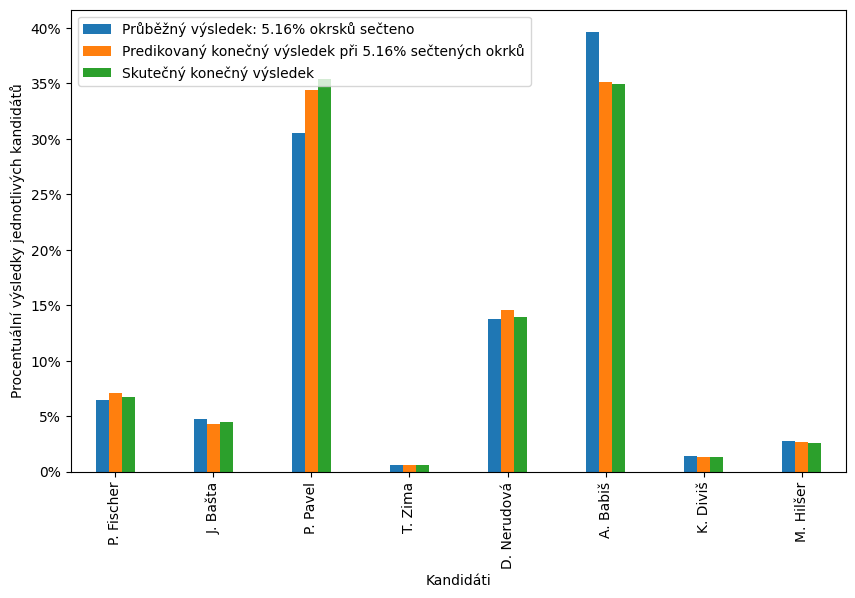

In [ ]:
from matplotlib.ticker import FuncFormatter

def percentage(x, pos):
    return '{:.0%}'.format(x)

ax = vysledky.plot(kind='bar', figsize=(10, 6), width=0.4)

plt.xlabel('Kandidáti')
plt.ylabel('Procentuální výsledky jednotlivých kandidátů')

formatter = FuncFormatter(percentage)
ax.yaxis.set_major_formatter(formatter)

plt.legend(loc='upper left')

plt.show()

In [ ]:
mse_list = []
rmse_list = []
hlasy_cols = list(prez_2023_1_train_last_row.columns)
hlasy_predikce_dict = {col: [] for col in hlasy_cols}

for i in range(1, prez_2023_1_original_data_abs['davka'].max()):
  prez_2023_1_abs_do_davky = prez_2023_1_original_data_abs[prez_2023_1_original_data_abs['davka'] <= i]
  prez_2023_1_abs_do_davky_merged_cluster_labels = pd.merge(cluster_labels, prez_2023_1_abs_do_davky, how = 'right', on = ['CIS_OBEC', 'CIS_OKRSEK'])
  prez_2023_1_abs_do_davky_merged_cluster_labels = prez_2023_1_abs_do_davky_merged_cluster_labels.groupby('cluster_label')[['PLATNE_HLASY'] + hlasy_cols].sum()
  total_zapsani_volici_2023_1_davka = prez_2023_1_abs_do_davky_merged_cluster_labels['PLATNE_HLASY'].sum()
  prez_2023_1_abs_do_davky_merged_cluster_labels['PODIL_CLUSTERU'] = prez_2023_1_abs_do_davky_merged_cluster_labels['PLATNE_HLASY'] / total_zapsani_volici_2023_1_davka
  prez_2023_1_abs_do_davky_merged_cluster_labels.drop(columns = ['PLATNE_HLASY'], inplace = True)
  prez_2023_1_abs_do_davky_merged_cluster_labels
  podily_clusteru = pd.merge(prez_2023_1_abs_do_davky_merged_cluster_labels, clustered_2018, on = 'cluster_label', how = 'inner', suffixes=['_2023', '_2018'])
  for col in hlasy_cols:
      podily_clusteru[col] = podily_clusteru[col] * (podily_clusteru['PODIL_CLUSTERU_2018'] / podily_clusteru['PODIL_CLUSTERU_2023'])
  podily_clusteru.drop(['PODIL_CLUSTERU_2023', 'PODIL_CLUSTERU_2018'], axis = 1, inplace=True)
  pocet_hlasu_predikce = podily_clusteru.sum()
  pocet_hlasu_predikce = pd.DataFrame(pocet_hlasu_predikce)
  pocet_hlasu_predikce.rename(columns={0: 'pred_pocet_hlasu'}, inplace=True)
  celkem_hlasu_davka_predikce = pocet_hlasu_predikce['pred_pocet_hlasu'].sum()
  pocet_hlasu_predikce['pred_pocet_hlasu'] = pocet_hlasu_predikce['pred_pocet_hlasu'] / celkem_hlasu_davka_predikce
  pocet_hlasu_predikce = pocet_hlasu_predikce.T

  for col in hlasy_predikce_dict:
    hlasy_predikce_dict[col].append(pocet_hlasu_predikce[col].values[0])

  mse = mean_squared_error(pocet_hlasu_predikce, prez_2023_1_vysledky)
  mse_list.append(mse)
  rmse = sqrt(mse)
  rmse_list.append(rmse)

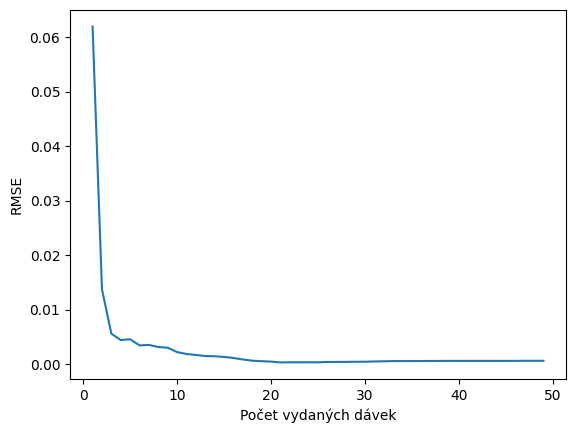

In [ ]:
x = range(1, 1 + len(rmse_list))
plt.plot(x, rmse_list)
plt.xlabel('Počet vydaných dávek')
plt.ylabel('RMSE')
plt.show()

In [ ]:
na_values_back = pd.Series([np.nan])
rmse_list_ser = pd.Series(rmse_list)
rmse_list_ser = pd.concat([rmse_list_ser, na_values_back], ignore_index=True)

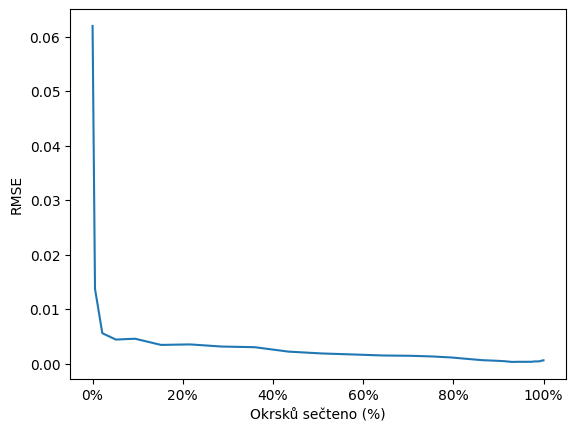

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

def percentage(x, pos):
    return '{:.0%}'.format(x)

plt.plot(prez_2023_1_original_data_proc['okrsku_secteno'], rmse_list_ser)

plt.xlabel('Okrsků sečteno (%)')
plt.ylabel('RMSE')

formatter = FuncFormatter(percentage)
plt.gca().xaxis.set_major_formatter(formatter)

plt.show()


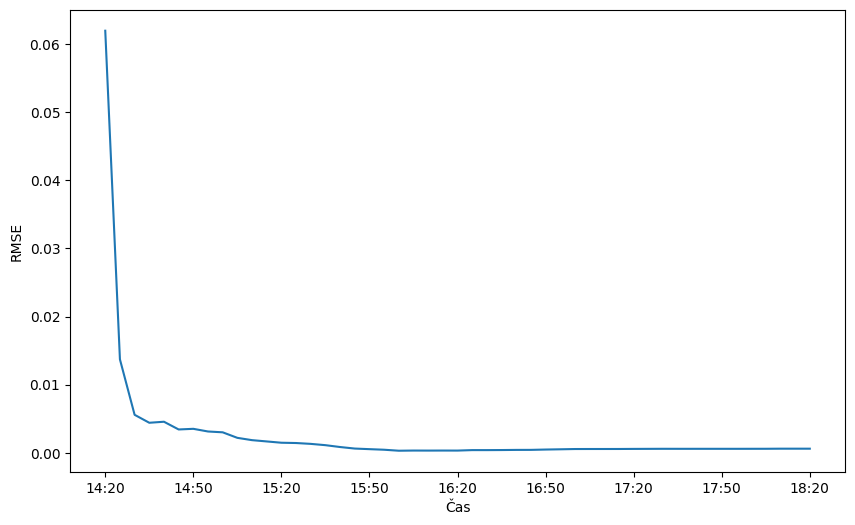

In [ ]:
n_points = len(rmse_list)

start_time = pd.Timestamp('2023-10-10 14:20')
time_labels = [(start_time + pd.Timedelta(minutes=5 * i)).strftime('%H:%M') for i in range(n_points)]

plt.figure(figsize=(10, 6))
plt.plot(range(1, n_points + 1), rmse_list)

plt.xticks(ticks=range(1, n_points + 1, 6), labels=time_labels[::6])

plt.xlabel('Čas')
plt.ylabel('RMSE')

plt.show()


In [ ]:
prejmenovani_klicu_slovniku = {
    'HLASY_1': 'P. Fischer',
    'HLASY_2': 'J. Bašta',
    'HLASY_4': 'P. Pavel',
    'HLASY_5': 'T. Zima',
    'HLASY_6': 'D. Nerudová',
    'HLASY_7': 'A. Babiš',
    'HLASY_8': 'K. Diviš',
    'HLASY_9': 'M. Hilšer'
}

predikce_prejmenovany_dict = {prejmenovani_klicu_slovniku.get(k, k): v for k, v in hlasy_predikce_dict.items()}


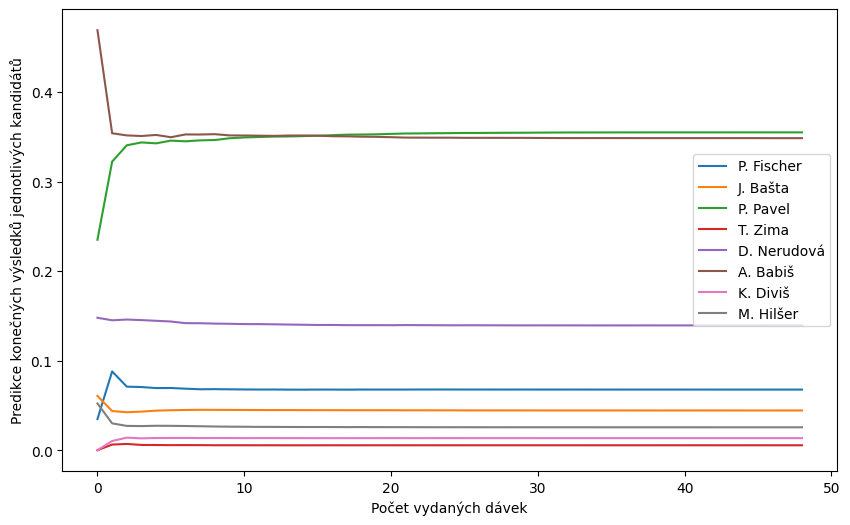

In [ ]:
plt.figure(figsize=(10, 6))

for key, values in predikce_prejmenovany_dict.items():
    plt.plot(values, label=key)

plt.xlabel('Počet vydaných dávek')
plt.ylabel('Predikce konečných výsledků jednotlivých kandidátů')

plt.legend()

plt.show()

In [ ]:
import pandas as pd
import numpy as np


modified_predikce_dict = {}

for key, values in predikce_prejmenovany_dict.items():
    modified_values = pd.concat([pd.Series(values), pd.Series([np.nan])]).reset_index(drop=True)
    modified_predikce_dict[key] = modified_values

for key, values in modified_predikce_dict.items():
    print(f"{key}: {values.tolist()}")


P. Fischer: [0.03478725106636575, 0.08801869833183038, 0.07100481902844928, 0.0705888250178215, 0.06941308775257976, 0.06949759775879455, 0.06875610107022852, 0.06808193130407021, 0.06820821207372571, 0.0680259528987036, 0.06788905821948438, 0.06779677117860773, 0.06782005019433929, 0.06770020932986053, 0.06765723466893746, 0.06776501742871126, 0.06775777403647767, 0.06766714626149715, 0.06778663473463115, 0.06776206017224952, 0.06777068959175987, 0.06775955701531707, 0.06783079641759443, 0.06782984811498695, 0.06783911780809021, 0.06781188803615516, 0.06780802104073727, 0.06778758728093506, 0.06778130101111433, 0.06779453079699542, 0.06777967390676476, 0.06777509005925618, 0.06778716796361245, 0.06778253311071031, 0.06776903292396703, 0.06776259877901099, 0.06776034543551891, 0.06776754306341068, 0.0677661819259285, 0.0677639522947758, 0.06776011450086106, 0.06776029984863749, 0.06775623568695055, 0.06775041515380972, 0.0677497179842918, 0.06775004672344236, 0.06774538445735055, 0.067

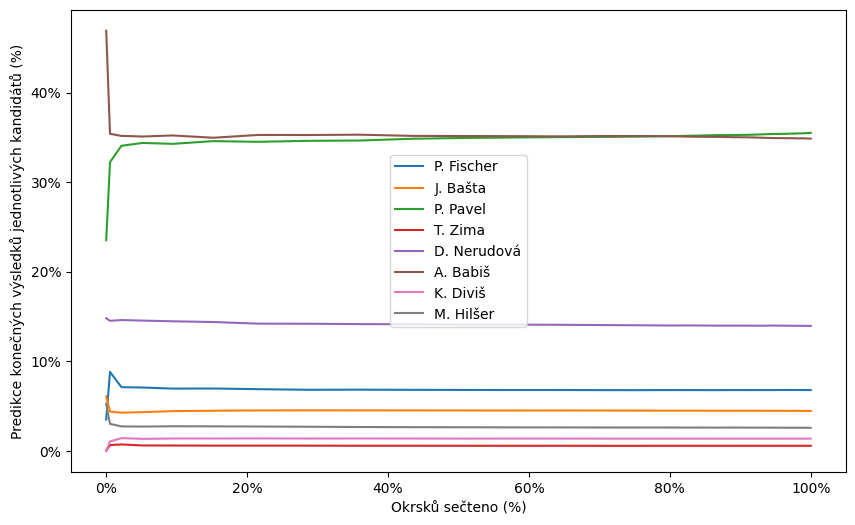

In [ ]:
from matplotlib.ticker import FuncFormatter
import matplotlib.pyplot as plt

def percentage(x, pos):
    return '{:.0%}'.format(x)

plt.figure(figsize=(10, 6))

for key, values in modified_predikce_dict.items():
    plt.plot(prez_2023_1_original_data_proc['okrsku_secteno'], values, label=key)

plt.xlabel('Okrsků sečteno (%)')
plt.ylabel('Predikce konečných výsledků jednotlivých kandidátů (%)')

ax = plt.gca()

formatter = FuncFormatter(percentage)
ax.yaxis.set_major_formatter(formatter)
ax.xaxis.set_major_formatter(formatter)

plt.legend()

plt.show()

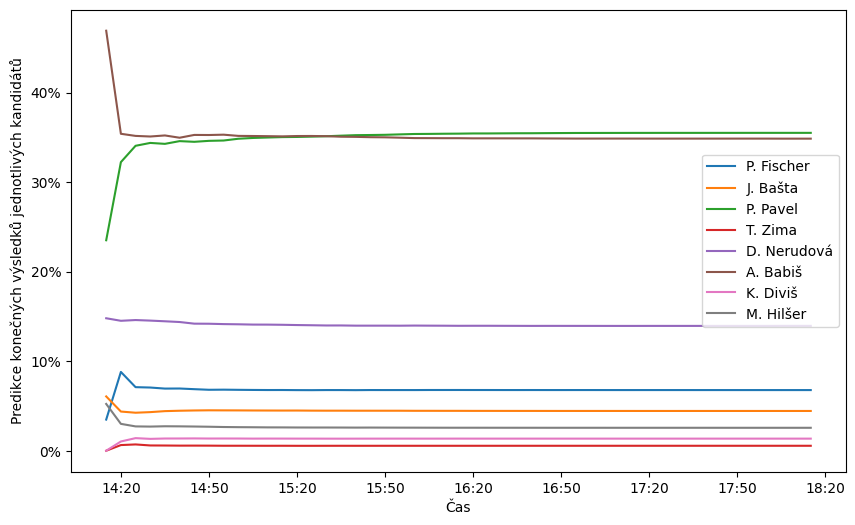

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.ticker import FuncFormatter

def percentage(x, pos):
    return '{:.0%}'.format(x)

n_points = len(next(iter(modified_predikce_dict.values())))

start_time = pd.Timestamp('2023-01-14 14:20')
time_labels = [(start_time + pd.Timedelta(minutes=5 * i)).strftime('%H:%M') for i in range(n_points)]

plt.figure(figsize=(10, 6))

for key, values in modified_predikce_dict.items():
    plt.plot(values, label=key)

plt.xlabel('Čas')
plt.ylabel('Predikce konečných výsledků jednotlivých kandidátů')

ax = plt.gca()

formatter = FuncFormatter(percentage)
ax.yaxis.set_major_formatter(formatter)

plt.xticks(ticks=range(1, n_points + 1, 6), labels=time_labels[::6])

plt.legend()

plt.show()

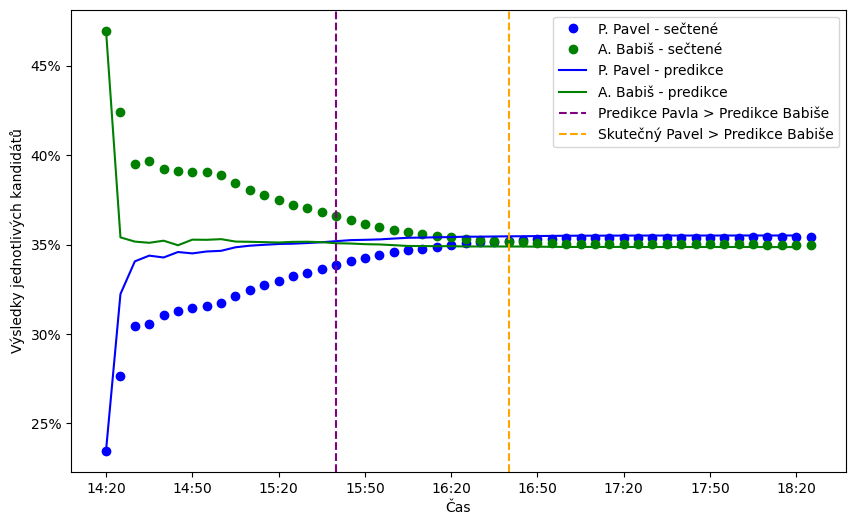

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

n_points = len(next(iter(modified_predikce_dict.values())))

start_time = pd.Timestamp('2023-01-14 14:20')
time_labels = [(start_time + pd.Timedelta(minutes=5 * i)).strftime('%H:%M') for i in range(n_points)]

prubeh = prez_2023_1_original_data_proc[['HLASY_4', 'HLASY_7']].copy()
prubeh['P. Pavel'] = modified_predikce_dict['P. Pavel']
prubeh['A. Babiš'] = modified_predikce_dict['A. Babiš']

prubeh.columns = ["P. Pavel - sečtené", "A. Babiš - sečtené", "P. Pavel - predikce", "A. Babiš - predikce"]

index_pred_over = (prubeh['P. Pavel - predikce'] > prubeh['A. Babiš - predikce']).idxmax()

index_real_over = (prubeh['P. Pavel - sečtené'] > prubeh['A. Babiš - sečtené']).idxmax()

plt.figure(figsize=(10, 6))

pavel_color = 'blue'
babis_color = 'green'

plt.plot(prubeh['P. Pavel - sečtené'], 'o', label="P. Pavel - sečtené", color=pavel_color)
plt.plot(prubeh['A. Babiš - sečtené'], 'o', label="A. Babiš - sečtené", color=babis_color)

plt.plot(prubeh['P. Pavel - predikce'], '-', label="P. Pavel - predikce", color=pavel_color)
plt.plot(prubeh['A. Babiš - predikce'], '-', label="A. Babiš - predikce", color=babis_color)

plt.axvline(x=index_pred_over, color='purple', linestyle='--', label="Predikce Pavla > Predikce Babiše")
plt.axvline(x=index_real_over, color='orange', linestyle='--', label="Skutečný Pavel > Predikce Babiše")

plt.xlabel('Čas')
plt.ylabel('Výsledky jednotlivých kandidátů')

plt.xticks(ticks=range(0, n_points, 6), labels=time_labels[::6])

formatter = FuncFormatter(lambda y, _: f'{y:.0%}')
plt.gca().yaxis.set_major_formatter(formatter)

plt.legend()

plt.show()

In [ ]:
avg_rmse_kmeans_clust_1 = sum(rmse_list) / len(rmse_list)
print(f"Průměrný RMSE pro model K-means a 1. kolo prezidentských voleb v roce 2023 je {avg_rmse_kmeans_clust_1}.")

Průměrný RMSE pro model K-means a 1. kolo prezidentských voleb v roce 2023 je 0.0026830916908343063.


In [ ]:
rmse_list_KMEANS_1 = rmse_list
rmse_df = pd.DataFrame(rmse_list_KMEANS_1)
rmse_df.rename(columns = {0: 'Kmeans'}, inplace = True)
rmse_df.to_csv('rmse_KMEANS_1.csv', index = False)

##### Intervaly spolehlivosti

In [ ]:
"""
from scipy.stats import norm

# Define Z-score for 95% confidence interval
z_score = norm.ppf(0.975)  # 95% confidence level

# Store results in dictionaries
predictions = {}
lower_bounds = {}
upper_bounds = {}

objekty = ['CIS_OBEC', 'CIS_OKRSEK']
merged_dataset[objekty] = merged_dataset[objekty].astype('int64')
cluster_labels = merged_dataset[['cluster_label', 'CIS_OBEC', 'CIS_OKRSEK']]
merged_data_2018 = pd.merge(cluster_labels, prez_2018_1_original_data_abs[['PLATNE_HLASY', 'CIS_OBEC', 'CIS_OKRSEK']], on=['CIS_OBEC', 'CIS_OKRSEK'], how='inner')
merged_data_2018.drop(columns = ['CIS_OKRSEK', 'CIS_OBEC'], axis = 1, inplace = True)
clustered_2018 = merged_data_2018.groupby('cluster_label').sum()
total_zapsani_volici = clustered_2018['PLATNE_HLASY'].sum()
clustered_2018['PODIL_CLUSTERU'] = clustered_2018['PLATNE_HLASY'] / total_zapsani_volici
clustered_2018.rename(columns = {'PLATNE_HLASY': 'PLATNE_HLASY_2018'}, inplace = True)


for i in range(1, prez_2023_1_original_data_abs['davka'].max()):
  # vezmu dataset do i-te davku
  prez_2023_1_abs_do_davky = prez_2023_1_original_data_abs[prez_2023_1_original_data_abs['davka'] <= i]
  nove_volby_with_clusters = pd.merge(cluster_labels, prez_2023_1_abs_do_davky, on=['CIS_OBEC', 'CIS_OKRSEK'], how='inner')
  nove_volby_with_clusters.drop(columns = ['CIS_OBEC', 'CIS_OKRSEK', 'davka', 'VYDANE_OBALKY', 'ODEVZDANE_OBALKY', 'ZAPSANI_VOLICI'], inplace = True)

  clustered_2023 = nove_volby_with_clusters.groupby('cluster_label').sum()

  celkove_volicu = clustered_2023['PLATNE_HLASY'].sum()

  clustered_2023['podil_clusteru_2023'] = clustered_2023['PLATNE_HLASY'] / celkove_volicu

  clustered_2023_with_shares_of_clusters = pd.merge(clustered_2023, clustered_2018, on=['cluster_label'], how='inner')

  clustered_2023_with_shares_of_clusters.rename(columns={'PODIL_CLUSTERU': 'podil_clusteru_2018'}, inplace=True)
  for col in ['HLASY_1', 'HLASY_2', 'HLASY_4', 'HLASY_5', 'HLASY_6', 'HLASY_7',  'HLASY_8', 'HLASY_9']:
    clustered_2023_with_shares_of_clusters[col + '_perc'] = clustered_2023_with_shares_of_clusters[col] / clustered_2023_with_shares_of_clusters['PLATNE_HLASY']

  rozptyl = 0
  for col in ['HLASY_1', 'HLASY_2', 'HLASY_4', 'HLASY_5', 'HLASY_6', 'HLASY_7',  'HLASY_8', 'HLASY_9']:
    clustered_2023_with_shares_of_clusters[col] = clustered_2023_with_shares_of_clusters[col] * (clustered_2023_with_shares_of_clusters['podil_clusteru_2018'] / clustered_2023_with_shares_of_clusters['podil_clusteru_2023'])
    clustered_2023_with_shares_of_clusters['scaled_fraction'] = (clustered_2023_with_shares_of_clusters['PLATNE_HLASY'] / clustered_2023_with_shares_of_clusters['PLATNE_HLASY_2018']).clip(upper=1)
    rozptyl += ((clustered_2023_with_shares_of_clusters[col + '_perc'] * (1 - clustered_2023_with_shares_of_clusters[col + '_perc'])) / clustered_2023_with_shares_of_clusters['PLATNE_HLASY']) * (clustered_2023_with_shares_of_clusters['podil_clusteru_2018'] / clustered_2023_with_shares_of_clusters['podil_clusteru_2023'])**2 * (1 - clustered_2023_with_shares_of_clusters['scaled_fraction'])
  rozptyl = rozptyl.sum()
  clustered_2023_reweighted = clustered_2023_with_shares_of_clusters
  cols_to_choose = ['HLASY_1', 'HLASY_2', 'HLASY_4', 'HLASY_5', 'HLASY_6', 'HLASY_7',  'HLASY_8', 'HLASY_9']
  clustered_2023_pred_pocet_hlasu = clustered_2023_reweighted[cols_to_choose]
  clustered_2023_pred_pocet_hlasu = clustered_2023_pred_pocet_hlasu.sum().sort_index()
  clustered_2023_pred_pocet_hlasu = pd.DataFrame(clustered_2023_pred_pocet_hlasu)

  clustered_2023_pred_pocet_hlasu.rename(columns={0: 'pred_pocet_hlasu'}, inplace=True)
  celkem_hlasu = clustered_2023_pred_pocet_hlasu['pred_pocet_hlasu'].sum()
  clustered_2023_pred_pocet_hlasu['pred_proc_vysl'] = clustered_2023_pred_pocet_hlasu['pred_pocet_hlasu'] / celkem_hlasu
  prez_2023_1_predikce = clustered_2023_pred_pocet_hlasu['pred_proc_vysl']
  prez_2023_1_predikce = pd.DataFrame(prez_2023_1_predikce).T

  # Initialize sub-dictionaries for this iteration
  predictions[i] = {}
  lower_bounds[i] = {}
  upper_bounds[i] = {}

  # Loop through each column to calculate confidence intervals
  for col in prez_2023_1_predikce.columns:
      pred_value = prez_2023_1_predikce[col].values[0]  # Extract prediction

      # Calculate lower and upper bounds
      lower_bound = pred_value - z_score * np.sqrt(rozptyl)
      upper_bound = pred_value + z_score * np.sqrt(rozptyl)

      # Store in nested dictionaries
      predictions[i][col] = pred_value
      lower_bounds[i][col] = lower_bound
      upper_bounds[i][col] = upper_bound
  """

"\nfrom scipy.stats import norm\n\n# Define Z-score for 95% confidence interval\nz_score = norm.ppf(0.975)  # 95% confidence level\n\n# Store results in dictionaries\npredictions = {}\nlower_bounds = {}\nupper_bounds = {}\n\nobjekty = ['CIS_OBEC', 'CIS_OKRSEK']\nmerged_dataset[objekty] = merged_dataset[objekty].astype('int64')\ncluster_labels = merged_dataset[['cluster_label', 'CIS_OBEC', 'CIS_OKRSEK']]\nmerged_data_2018 = pd.merge(cluster_labels, prez_2018_1_original_data_abs[['PLATNE_HLASY', 'CIS_OBEC', 'CIS_OKRSEK']], on=['CIS_OBEC', 'CIS_OKRSEK'], how='inner')\nmerged_data_2018.drop(columns = ['CIS_OKRSEK', 'CIS_OBEC'], axis = 1, inplace = True)\nclustered_2018 = merged_data_2018.groupby('cluster_label').sum()\ntotal_zapsani_volici = clustered_2018['PLATNE_HLASY'].sum()\nclustered_2018['PODIL_CLUSTERU'] = clustered_2018['PLATNE_HLASY'] / total_zapsani_volici\nclustered_2018.rename(columns = {'PLATNE_HLASY': 'PLATNE_HLASY_2018'}, inplace = True)\n\n\nfor i in range(1, prez_2023_1_or

In [ ]:
from scipy.stats import norm

z_score = norm.ppf(0.975)

predictions = {}
lower_bounds = {}
upper_bounds = {}

objekty = ['CIS_OBEC', 'CIS_OKRSEK']
merged_dataset[objekty] = merged_dataset[objekty].astype('int64')
cluster_labels = merged_dataset[['cluster_label', 'CIS_OBEC', 'CIS_OKRSEK']]
merged_data_2018 = pd.merge(cluster_labels, prez_2018_1_original_data_abs[['PLATNE_HLASY', 'CIS_OBEC', 'CIS_OKRSEK']], on=['CIS_OBEC', 'CIS_OKRSEK'], how='inner')
merged_data_2018.drop(columns = ['CIS_OKRSEK', 'CIS_OBEC'], axis = 1, inplace = True)
clustered_2018 = merged_data_2018.groupby('cluster_label').sum()
total_zapsani_volici = clustered_2018['PLATNE_HLASY'].sum()
clustered_2018['PODIL_CLUSTERU'] = clustered_2018['PLATNE_HLASY'] / total_zapsani_volici
clustered_2018.rename(columns = {'PLATNE_HLASY': 'PLATNE_HLASY_2018'}, inplace = True)


for i in range(1, prez_2023_1_original_data_abs['davka'].max()):
  prez_2023_1_abs_do_davky = prez_2023_1_original_data_abs[prez_2023_1_original_data_abs['davka'] <= i]
  nove_volby_with_clusters = pd.merge(cluster_labels, prez_2023_1_abs_do_davky, on=['CIS_OBEC', 'CIS_OKRSEK'], how='inner')
  nove_volby_with_clusters.drop(columns = ['CIS_OBEC', 'CIS_OKRSEK', 'davka', 'VYDANE_OBALKY', 'ODEVZDANE_OBALKY', 'ZAPSANI_VOLICI'], inplace = True)

  clustered_2023 = nove_volby_with_clusters.groupby('cluster_label').sum()

  celkove_volicu = clustered_2023['PLATNE_HLASY'].sum()

  clustered_2023['podil_clusteru_2023'] = clustered_2023['PLATNE_HLASY'] / celkove_volicu

  clustered_2023_with_shares_of_clusters = pd.merge(clustered_2023, clustered_2018, on=['cluster_label'], how='inner')

  clustered_2023_with_shares_of_clusters.rename(columns={'PODIL_CLUSTERU': 'podil_clusteru_2018'}, inplace=True)
  for col in ['HLASY_1', 'HLASY_2', 'HLASY_4', 'HLASY_5', 'HLASY_6', 'HLASY_7',  'HLASY_8', 'HLASY_9']:
    clustered_2023_with_shares_of_clusters[col + '_perc'] = clustered_2023_with_shares_of_clusters[col] / clustered_2023_with_shares_of_clusters['PLATNE_HLASY']

  for col in ['HLASY_1', 'HLASY_2', 'HLASY_4', 'HLASY_5', 'HLASY_6', 'HLASY_7',  'HLASY_8', 'HLASY_9']:
    clustered_2023_with_shares_of_clusters[col] = clustered_2023_with_shares_of_clusters[col] * (clustered_2023_with_shares_of_clusters['podil_clusteru_2018'] / clustered_2023_with_shares_of_clusters['podil_clusteru_2023'])
    clustered_2023_with_shares_of_clusters['scaled_fraction'] = (clustered_2023_with_shares_of_clusters['PLATNE_HLASY'] / clustered_2023_with_shares_of_clusters['PLATNE_HLASY_2018']).clip(upper=1)
    clustered_2023_with_shares_of_clusters[col + '_rozptyl'] = ((clustered_2023_with_shares_of_clusters[col + '_perc'] * (1 - clustered_2023_with_shares_of_clusters[col + '_perc'])) / clustered_2023_with_shares_of_clusters['PLATNE_HLASY']) * (clustered_2023_with_shares_of_clusters['podil_clusteru_2018'] / clustered_2023_with_shares_of_clusters['podil_clusteru_2023'])**2 * (1 - clustered_2023_with_shares_of_clusters['scaled_fraction'])

  clustered_2023_reweighted = clustered_2023_with_shares_of_clusters
  cols_to_choose_hlasy = ['HLASY_1', 'HLASY_2', 'HLASY_4', 'HLASY_5', 'HLASY_6', 'HLASY_7',  'HLASY_8', 'HLASY_9']
  cols_to_choose_rozptyl = ['HLASY_1_rozptyl', 'HLASY_2_rozptyl', 'HLASY_4_rozptyl', 'HLASY_5_rozptyl', 'HLASY_6_rozptyl', 'HLASY_7_rozptyl',  'HLASY_8_rozptyl', 'HLASY_9_rozptyl']
  clustered_2023_pred_pocet_hlasu = clustered_2023_reweighted[cols_to_choose_hlasy]
  clustered_2023_rozptyl = clustered_2023_reweighted[cols_to_choose_rozptyl]
  clustered_2023_pred_pocet_hlasu = clustered_2023_pred_pocet_hlasu.sum().sort_index()
  clustered_2023_rozptyl = clustered_2023_rozptyl.sum().sort_index()
  clustered_2023_pred_pocet_hlasu = pd.DataFrame(clustered_2023_pred_pocet_hlasu)
  clustered_2023_rozptyl = pd.DataFrame(clustered_2023_rozptyl)

  clustered_2023_pred_pocet_hlasu.rename(columns={0: 'pred_pocet_hlasu'}, inplace=True)
  clustered_2023_rozptyl.rename(columns={0: 'rozptyl'}, inplace=True)

  clustered_2023_rozptyl = clustered_2023_rozptyl.T

  celkem_hlasu = clustered_2023_pred_pocet_hlasu['pred_pocet_hlasu'].sum()
  clustered_2023_pred_pocet_hlasu['pred_proc_vysl'] = clustered_2023_pred_pocet_hlasu['pred_pocet_hlasu'] / celkem_hlasu
  prez_2023_1_predikce = clustered_2023_pred_pocet_hlasu['pred_proc_vysl']
  prez_2023_1_predikce = pd.DataFrame(prez_2023_1_predikce).T

  predictions[i] = {}
  lower_bounds[i] = {}
  upper_bounds[i] = {}

  for col in prez_2023_1_predikce.columns:
      pred_value = prez_2023_1_predikce[col].values[0]

      lower_bound = pred_value - z_score * np.sqrt(clustered_2023_rozptyl[col + '_rozptyl'].values[0])
      upper_bound = pred_value + z_score * np.sqrt(clustered_2023_rozptyl[col + '_rozptyl'].values[0])

      predictions[i][col] = pred_value
      lower_bounds[i][col] = lower_bound
      upper_bounds[i][col] = upper_bound

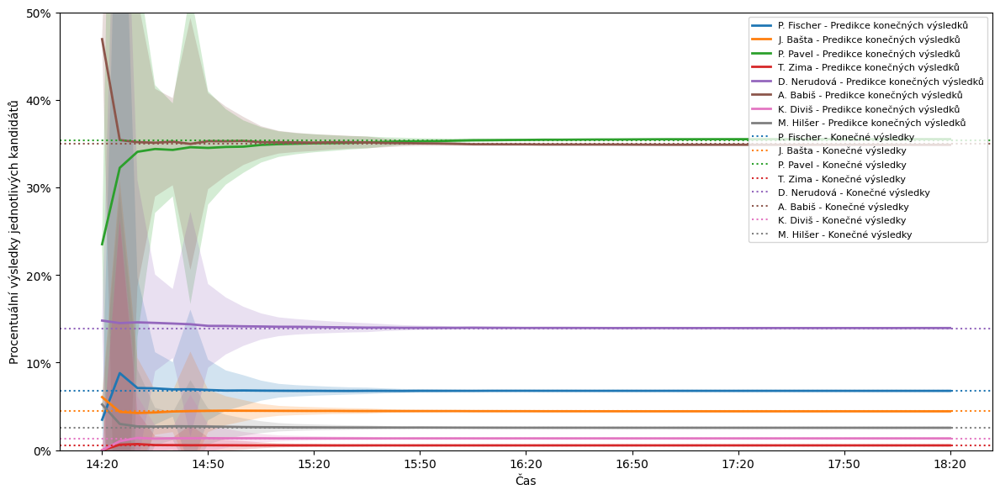

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.ticker import FuncFormatter


prubeh = prez_2023_1_original_data_proc[['HLASY_1', 'HLASY_2', 'HLASY_4', 'HLASY_5', 'HLASY_6', 'HLASY_7', 'HLASY_8', 'HLASY_9']].copy()
konecne_vysledky = prubeh.iloc[-1]


plt.figure(figsize=(12, 6))

labels = {
    'HLASY_1': 'P. Fischer',
    'HLASY_2': 'J. Bašta',
    'HLASY_4': 'P. Pavel',
    'HLASY_5': 'T. Zima',
    'HLASY_6': 'D. Nerudová',
    'HLASY_7': 'A. Babiš',
    'HLASY_8': 'K. Diviš',
    'HLASY_9': 'M. Hilšer'
}

def percentage(x, pos):
    return '{:.0%}'.format(x)

n_points = 50

start_time = pd.Timestamp('2023-01-14 14:20')
time_labels = [(start_time + pd.Timedelta(minutes=5 * i)).strftime('%H:%M') for i in range(n_points)]


for col in predictions[1].keys():
    pred_values = [predictions[i][col] for i in range(1, len(predictions) + 1)]
    lower_values = [lower_bounds[i][col] for i in range(1, len(lower_bounds) + 1)]
    upper_values = [upper_bounds[i][col] for i in range(1, len(upper_bounds) + 1)]

    plt.plot(pred_values, label=labels.get(col, col) + ' - Predikce konečných výsledků', linewidth=2)

    plt.fill_between(range(len(pred_values)), lower_values, upper_values, alpha=0.2)

plt.axhline(y=konecne_vysledky['HLASY_1'], label="P. Fischer - Konečné výsledky", color='#1f77b4', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_2'], label="J. Bašta - Konečné výsledky", color='#ff7f0e', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_4'], label="P. Pavel - Konečné výsledky", color='#2ca02c', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_5'], label="T. Zima - Konečné výsledky", color='#d6272B', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_6'], label="D. Nerudová - Konečné výsledky", color='#9467bd', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_7'], label="A. Babiš - Konečné výsledky", color='#8c564b', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_8'], label="K. Diviš - Konečné výsledky", color='#e377c2', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_9'], label="M. Hilšer - Konečné výsledky", color='#7f7f7f', linestyle='dotted')



plt.xlabel('Čas')
plt.ylabel('Procentuální výsledky jednotlivých kandidátů')

plt.ylim(0, 0.5)

ax = plt.gca()

formatter = FuncFormatter(percentage)
ax.yaxis.set_major_formatter(formatter)

plt.xticks(ticks=range(0, n_points, 6), labels=time_labels[::6])

plt.legend(loc='upper right', fontsize=8)

plt.tight_layout()
plt.show()

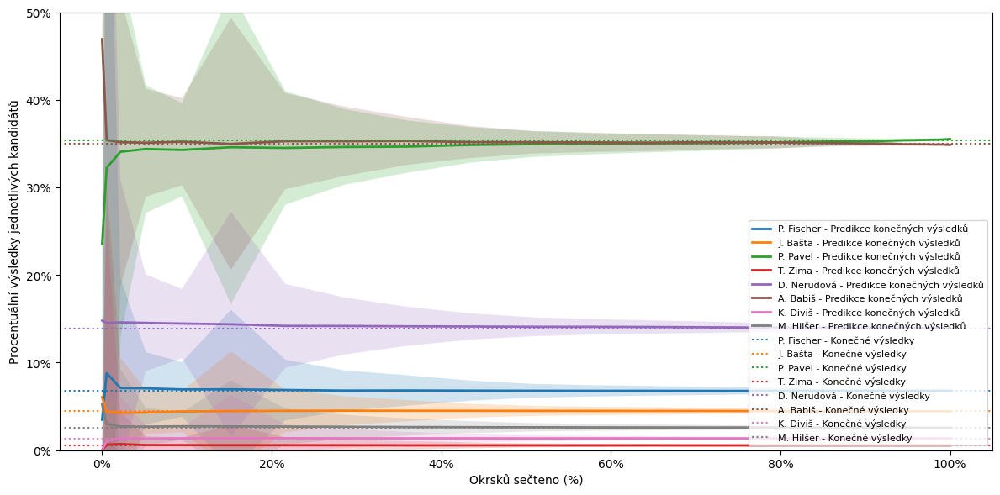

In [ ]:
from matplotlib.ticker import FuncFormatter
import matplotlib.pyplot as plt
import pandas as pd

prubeh = prez_2023_1_original_data_proc[['HLASY_1', 'HLASY_2', 'HLASY_4', 'HLASY_5', 'HLASY_6', 'HLASY_7', 'HLASY_8', 'HLASY_9']].copy()
konecne_vysledky = prubeh.iloc[-1]

orsku_secteno = prez_2023_1_original_data_proc['okrsku_secteno'][:-1]

plt.figure(figsize=(12, 6))

labels = {
    'HLASY_1': 'P. Fischer',
    'HLASY_2': 'J. Bašta',
    'HLASY_4': 'P. Pavel',
    'HLASY_5': 'T. Zima',
    'HLASY_6': 'D. Nerudová',
    'HLASY_7': 'A. Babiš',
    'HLASY_8': 'K. Diviš',
    'HLASY_9': 'M. Hilšer'
}

def percentage(x, pos):
    return '{:.0%}'.format(x)

for col in predictions[1].keys():
    pred_values = [predictions[i][col] for i in range(1, len(predictions) + 1)]
    lower_values = [lower_bounds[i][col] for i in range(1, len(lower_bounds) + 1)]
    upper_values = [upper_bounds[i][col] for i in range(1, len(upper_bounds) + 1)]

    plt.plot(orsku_secteno, pred_values, label=labels.get(col, col) + ' - Predikce konečných výsledků', linewidth=2)

    plt.fill_between(orsku_secteno, lower_values, upper_values, alpha=0.2)

plt.axhline(y=konecne_vysledky['HLASY_1'], label="P. Fischer - Konečné výsledky", color='#1f77b4', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_2'], label="J. Bašta - Konečné výsledky", color='#ff7f0e', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_4'], label="P. Pavel - Konečné výsledky", color='#2ca02c', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_5'], label="T. Zima - Konečné výsledky", color='#d6272B', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_6'], label="D. Nerudová - Konečné výsledky", color='#9467bd', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_7'], label="A. Babiš - Konečné výsledky", color='#8c564b', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_8'], label="K. Diviš - Konečné výsledky", color='#e377c2', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_9'], label="M. Hilšer - Konečné výsledky", color='#7f7f7f', linestyle='dotted')

plt.xlabel('Okrsků sečteno (%)')
plt.ylabel('Procentuální výsledky jednotlivých kandidátů')

plt.ylim(0, 0.5)

ax = plt.gca()

formatter = FuncFormatter(percentage)
ax.yaxis.set_major_formatter(formatter)
ax.xaxis.set_major_formatter(formatter)

plt.legend(loc='lower right', fontsize=8)

plt.tight_layout()
plt.show()

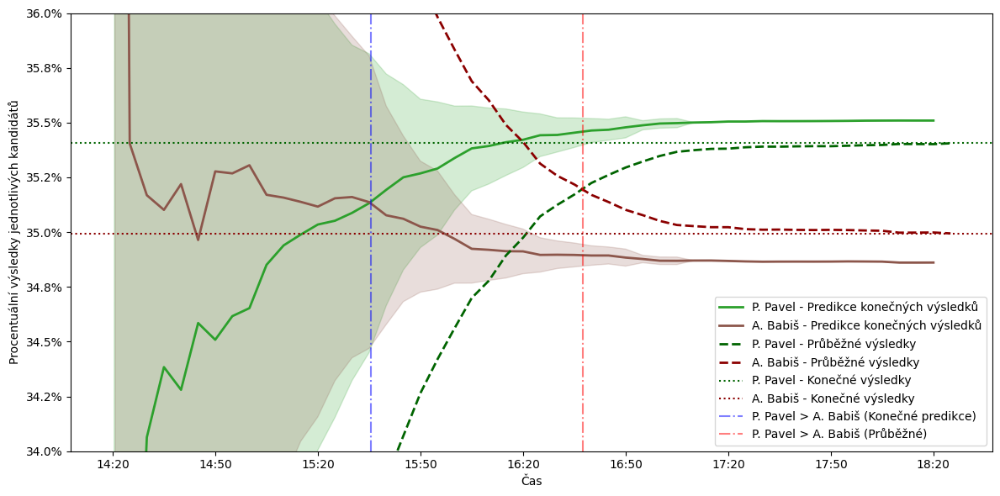

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.ticker import FuncFormatter

prubeh = prez_2023_1_original_data_proc[['HLASY_4', 'HLASY_7']].copy()
konecne_vysledky = prubeh.iloc[-1]

plt.figure(figsize=(12, 6))

labels = {
    'HLASY_4': 'P. Pavel - Predikce konečných výsledků',
    'HLASY_7': 'A. Babiš - Predikce konečných výsledků'
}

colors = {
    'HLASY_4': '#2ca02c',
    'HLASY_7': '#8c564b'
}

def percentage(x, pos):
    return '{:.1%}'.format(x)

n_points = len(predictions)

start_time = pd.Timestamp('2023-01-14 14:20')
time_labels = [(start_time + pd.Timedelta(minutes=5 * i)).strftime('%H:%M') for i in range(n_points)]

pred_pavel_greater_idx = None
real_pavel_greater_idx = None
ci_pavel_greater_idx = None

for i in range(1, n_points + 1):
    if pred_pavel_greater_idx is None and predictions[i]['HLASY_4'] > predictions[i]['HLASY_7']:
        pred_pavel_greater_idx = i

    if real_pavel_greater_idx is None and prubeh['HLASY_4'].iloc[i - 1] > prubeh['HLASY_7'].iloc[i - 1]:
        real_pavel_greater_idx = i

    if ci_pavel_greater_idx is None and lower_bounds[i]['HLASY_4'] > upper_bounds[i]['HLASY_7']:
        ci_pavel_greater_idx = i

for col in ['HLASY_4', 'HLASY_7']:
    pred_values = [predictions[i][col] for i in range(1, n_points + 1)]
    lower_values = [lower_bounds[i][col] for i in range(1, n_points + 1)]
    upper_values = [upper_bounds[i][col] for i in range(1, n_points + 1)]

    plt.plot(pred_values, label=labels.get(col, col), linewidth=2, color=colors[col])

    plt.fill_between(range(n_points), lower_values, upper_values, alpha=0.2, color=colors[col])

plt.plot(prubeh['HLASY_4'], label="P. Pavel - Průběžné výsledky", color='#006400', linestyle='--', linewidth=2)
plt.plot(prubeh['HLASY_7'], label="A. Babiš - Průběžné výsledky", color='#8B0000', linestyle='--', linewidth=2)

plt.axhline(y=konecne_vysledky['HLASY_4'], label="P. Pavel - Konečné výsledky", color='#006400', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_7'], label="A. Babiš - Konečné výsledky", color='#8B0000', linestyle='dotted')

if pred_pavel_greater_idx:
    plt.axvline(x=pred_pavel_greater_idx-1.9, color='blue', linestyle='dashdot', label="P. Pavel > A. Babiš (Konečné predikce)", alpha=0.5)
if real_pavel_greater_idx:
    plt.axvline(x=real_pavel_greater_idx-1.5, color='red', linestyle='dashdot', label="P. Pavel > A. Babiš (Průběžné)", alpha=0.5)

plt.xlabel('Čas')
plt.ylabel('Procentuální výsledky jednotlivých kandidátů')

plt.ylim(0.34, 0.36)

ax = plt.gca()

formatter = FuncFormatter(percentage)
ax.yaxis.set_major_formatter(formatter)

plt.xticks(ticks=range(0, n_points, 6), labels=time_labels[::6])

plt.legend(loc='lower right')

plt.tight_layout()
plt.show()

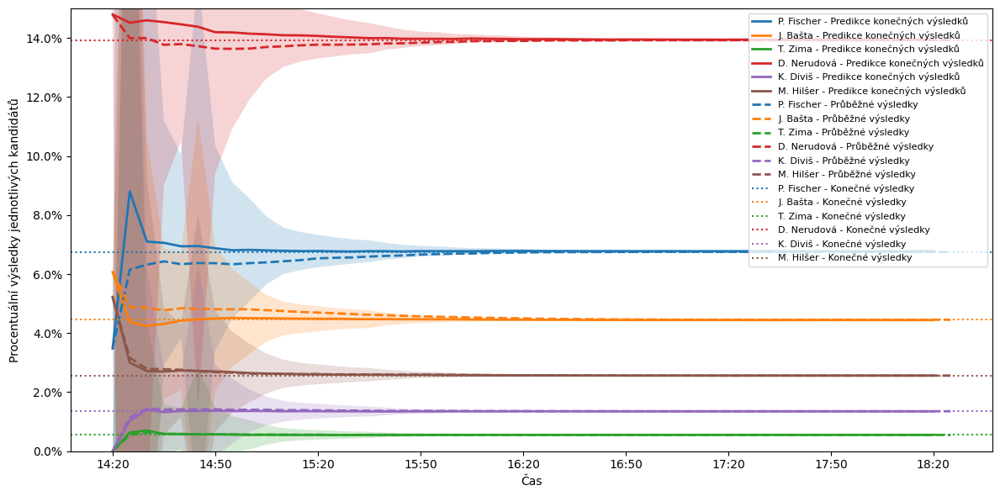

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.ticker import FuncFormatter

prubeh = prez_2023_1_original_data_proc[['HLASY_1', 'HLASY_2', 'HLASY_5', 'HLASY_6', 'HLASY_8', 'HLASY_9']].copy()
konecne_vysledky = prubeh.iloc[-1]

plt.figure(figsize=(12, 6))

labels = {
    'HLASY_1': 'P. Fischer',
    'HLASY_2': 'J. Bašta',
    'HLASY_5': 'T. Zima',
    'HLASY_6': 'D. Nerudová',
    'HLASY_8': 'K. Diviš',
    'HLASY_9': 'M. Hilšer'
}

def percentage(x, pos):
    return '{:.1%}'.format(x)

n_points = 50

start_time = pd.Timestamp('2023-01-14 14:20')
time_labels = [(start_time + pd.Timedelta(minutes=5 * i)).strftime('%H:%M') for i in range(n_points)]

for col in ['HLASY_1', 'HLASY_2', 'HLASY_5', 'HLASY_6', 'HLASY_8', 'HLASY_9']:
    pred_values = [predictions[i][col] for i in range(1, len(predictions) + 1)]
    lower_values = [lower_bounds[i][col] for i in range(1, len(lower_bounds) + 1)]
    upper_values = [upper_bounds[i][col] for i in range(1, len(upper_bounds) + 1)]

    plt.plot(pred_values, label=labels.get(col, col) + ' - Predikce konečných výsledků', linewidth=2)

    plt.fill_between(range(len(pred_values)), lower_values, upper_values, alpha=0.2)

plt.plot(prubeh['HLASY_1'], label="P. Fischer - Průběžné výsledky", color='#1f77b4', linestyle='--', linewidth=2)
plt.plot(prubeh['HLASY_2'], label="J. Bašta - Průběžné výsledky", color='#ff7f0e', linestyle='--', linewidth=2)
plt.plot(prubeh['HLASY_5'], label="T. Zima - Průběžné výsledky", color='#2ca02c', linestyle='--', linewidth=2)
plt.plot(prubeh['HLASY_6'], label="D. Nerudová - Průběžné výsledky", color='#d6272B', linestyle='--', linewidth=2)
plt.plot(prubeh['HLASY_8'], label="K. Diviš - Průběžné výsledky", color='#9467bd', linestyle='--', linewidth=2)
plt.plot(prubeh['HLASY_9'], label="M. Hilšer - Průběžné výsledky", color='#8c564b', linestyle='--', linewidth=2)

plt.axhline(y=konecne_vysledky['HLASY_1'], label="P. Fischer - Konečné výsledky", color='#1f77b4', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_2'], label="J. Bašta - Konečné výsledky", color='#ff7f0e', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_5'], label="T. Zima - Konečné výsledky", color='#2ca02c', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_6'], label="D. Nerudová - Konečné výsledky", color='#d6272B', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_8'], label="K. Diviš - Konečné výsledky", color='#9467bd', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_9'], label="M. Hilšer - Konečné výsledky", color='#8c564b', linestyle='dotted')

plt.xlabel('Čas')
plt.ylabel('Procentuální výsledky jednotlivých kandidátů')

plt.ylim(0, 0.15)

ax = plt.gca()

formatter = FuncFormatter(percentage)
ax.yaxis.set_major_formatter(formatter)

plt.xticks(ticks=range(0, n_points, 6), labels=time_labels[::6])

plt.legend(loc='upper right', fontsize=8)

plt.tight_layout()
plt.show()

#### Predikce prezidentskych voleb 2023 1. kolo - K-means - zjemnovani clusteru

In [ ]:
prez_2018_1_abs = only_unique_rows(prez_2018_1_original_data_abs)
prez_2018_1_abs = str_cols_to_int_cols(prez_2018_1_abs)
prez_2018_1_abs = reindex_cols(prez_2018_1_abs)

prez_2018_2_abs = only_unique_rows(prez_2018_2_original_data_abs)
prez_2018_2_abs = str_cols_to_int_cols(prez_2018_2_abs)
prez_2018_2_abs = reindex_cols(prez_2018_2_abs)

prez_2018_1_rel = vysledky_okrsky_proc(prez_2018_1_abs)
prez_2018_2_rel = vysledky_okrsky_proc(prez_2018_2_abs)

prez_2018_1_rel = prez_2018_1_rel.fillna(0)
prez_2018_2_rel = prez_2018_2_rel.fillna(0)

ps_2021_abs = only_unique_rows(ps_2021_original_data_abs)
ps_2021_abs = str_cols_to_int_cols(ps_2021_abs)

ps_2021_rel = vysledky_okrsky_proc_PS(ps_2021_abs)

merged_dataset = prez_2018_1_rel.merge(ps_2021_rel, on = 'CIS_OBEC_OKRSEK', how = 'outer', suffixes = ('_prez', '_ps'))
merged_dataset = merged_dataset.merge(prez_2018_2_rel, on = 'CIS_OBEC_OKRSEK', how = 'outer')
merged_dataset[['CIS_OBEC', 'CIS_OKRSEK']] = merged_dataset['CIS_OBEC_OKRSEK'].str.split('_', expand=True)
merged_dataset.drop(columns=['CIS_OBEC_OKRSEK'], inplace=True)

merged_dataset.fillna(0, inplace = True)
X = merged_dataset.drop(columns = ['CIS_OBEC', 'CIS_OKRSEK'])

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
X_scaled

for k in range(2, 20):
  kmeans = KMeans(n_clusters=k, random_state=0)
  kmeans.fit(X_scaled)
  merged_dataset['cluster_label_' + str(k) + '_clusters'] = kmeans.labels_

merged_dataset

,HLASY_1_prez,HLASY_2_prez,HLASY_3_prez,HLASY_4_prez,HLASY_5_prez,HLASY_6_prez,HLASY_7_prez,HLASY_8_prez,HLASY_9_prez,HLASY_1_ps,...,cluster_label_10_clusters,cluster_label_11_clusters,cluster_label_12_clusters,cluster_label_13_clusters,cluster_label_14_clusters,cluster_label_15_clusters,cluster_label_16_clusters,cluster_label_17_clusters,cluster_label_18_clusters,cluster_label_19_clusters
0,0.030242,0.070565,0.159274,0.008065,0.008065,0.004032,0.407258,0.0625,0.25,0.001984,...,6,8,5,8,8,6,8,8,8,8
1,0.018382,0.040441,0.139706,0.0,0.0,0.003676,0.400735,0.128676,0.268382,0.010563,...,6,8,6,8,8,6,8,8,8,8
2,0.073944,0.088028,0.144366,0.010563,0.010563,0.0,0.316901,0.151408,0.204225,0.00692,...,8,8,8,8,10,8,15,10,10,10
3,0.025157,0.062893,0.069182,0.006289,0.006289,0.0,0.534591,0.056604,0.238994,0.006289,...,5,5,5,5,5,5,5,5,17,17
4,0.038647,0.077295,0.077295,0.016908,0.002415,0.002415,0.44686,0.125604,0.21256,0.002212,...,3,3,3,3,3,3,3,3,3,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14894,0.035211,0.091549,0.15493,0.0,0.007042,0.007042,0.077465,0.06338,0.56338,0.028571,...,4,4,4,4,4,4,4,15,15,15
14895,0.018349,0.082569,0.238532,0.009174,0.009174,0.0,0.155963,0.06422,0.422018,0.031008,...,4,4,4,4,4,4,4,15,15,15
14896,0.0,0.5,0.0,0.0,0.0,0.0,0.5,0.0,0.0,0.0,...,3,3,10,10,13,13,13,13,13,13
14897,0.0,0.076923,0.230769,0.0,0.0,0.0,0.0,0.0,0.692308,0.0,...,4,4,4,4,4,4,4,15,15,15


In [ ]:
objekty = ['CIS_OBEC', 'CIS_OKRSEK']
merged_dataset[objekty] = merged_dataset[objekty].astype('int64')
cluster_labels_columns = [col for col in merged_dataset.columns if col.startswith('cluster_label')]
cluster_labels = merged_dataset[cluster_labels_columns + ['CIS_OBEC', 'CIS_OKRSEK']]
merged_data_2018 = pd.merge(cluster_labels, prez_2018_1_original_data_abs[['PLATNE_HLASY', 'CIS_OBEC', 'CIS_OKRSEK']], on=['CIS_OBEC', 'CIS_OKRSEK'], how='inner')
merged_data_2018.drop(columns = ['CIS_OKRSEK', 'CIS_OBEC'], axis = 1, inplace = True)

clustered_dataframes_2018 = {}
for i, col in enumerate(cluster_labels_columns, start=2):

    dataframe_name = f'cluster_label_{i}_clusters'
    clustered_dataframe = merged_data_2018.groupby(col)['PLATNE_HLASY'].sum()
    total_zapsani_volici = clustered_dataframe.sum()
    clustered_dataframe['PLATNE_HLASY'] = clustered_dataframe / total_zapsani_volici
    clustered_dataframe = clustered_dataframe['PLATNE_HLASY']
    clustered_dataframes_2018[dataframe_name] = clustered_dataframe

In [ ]:
nove_volby_rel = pd.read_csv('prez_2023_1_proc.csv')
max_davka = nove_volby_rel['davka'].max()
prez_2023_1_predikce = None
clustered_2023 = None

for davka in range(1, max_davka + 1):
    nove_volby = prez_2023_1_original_data_abs[prez_2023_1_original_data_abs['davka'] <= davka]

    if davka >= 15:
        col = 'cluster_label_15_clusters'
        labels = cluster_labels[['CIS_OBEC', 'CIS_OKRSEK', col]]
    else:
        col = 'cluster_label_' + str(davka + 1) + '_clusters'
        labels = cluster_labels[['CIS_OBEC', 'CIS_OKRSEK', col]]

    nove_volby_with_clusters = pd.merge(labels, nove_volby, on=['CIS_OBEC', 'CIS_OKRSEK'], how='inner')
    nove_volby_with_clusters.drop(columns = ['CIS_OBEC', 'CIS_OKRSEK', 'davka', 'VYDANE_OBALKY', 'ODEVZDANE_OBALKY', 'ZAPSANI_VOLICI'], inplace = True)
    clustered_2023 = nove_volby_with_clusters.groupby(col)['PLATNE_HLASY'].sum()
    clustered_2023 = clustered_2023 / clustered_2023.sum()

    nove_volby_with_clusters = nove_volby_with_clusters.groupby(col).sum()
    nove_volby_with_clusters.drop(columns = 'PLATNE_HLASY', inplace = True)
    nove_volby_with_clusters = pd.concat([nove_volby_with_clusters, clustered_2023], axis = 1)
    nove_volby_with_clusters.rename(columns={'PLATNE_HLASY': 'podil_clusteru_2023'}, inplace=True)

    if davka >= 15:
        col = 'cluster_label_15_clusters'
    else:
        col = 'cluster_label_' + str(davka + 1) + '_clusters'

    nove_volby_with_clusters = pd.concat([nove_volby_with_clusters, clustered_dataframes_2018[col]], axis = 1)
    nove_volby_with_clusters.rename(columns = {'PLATNE_HLASY': 'podil_clusteru_2018'}, inplace = True)
    for columns in ['HLASY_1', 'HLASY_2', 'HLASY_4', 'HLASY_5', 'HLASY_6', 'HLASY_7',  'HLASY_8', 'HLASY_9']:
        nove_volby_with_clusters[columns] = nove_volby_with_clusters[columns] * (nove_volby_with_clusters['podil_clusteru_2018'] / nove_volby_with_clusters['podil_clusteru_2023'])
    nove_volby_with_clusters.fillna(0, inplace = True)
    nove_volby_with_clusters.drop(columns = ['podil_clusteru_2018', 'podil_clusteru_2023'], inplace = True)
    nove_volby_with_clusters = nove_volby_with_clusters.sum()
    nove_volby_with_clusters = pd.DataFrame(nove_volby_with_clusters)
    nove_volby_with_clusters.rename(columns={0: 'pred_pocet_hlasu'}, inplace=True)
    celkem_hlasu = nove_volby_with_clusters['pred_pocet_hlasu'].sum()
    name = 'predikce_po_davce_' + str(davka)
    nove_volby_with_clusters[name] = nove_volby_with_clusters['pred_pocet_hlasu'] / celkem_hlasu
    nove_volby_with_clusters.drop(columns = ['pred_pocet_hlasu'], inplace = True)
    nove_volby_with_clusters = nove_volby_with_clusters.sort_index()
    nove_volby_with_clusters = pd.DataFrame(nove_volby_with_clusters).T
    prez_2023_1_predikce = pd.concat([prez_2023_1_predikce, nove_volby_with_clusters], axis = 0)

prez_2023_1_predikce

,HLASY_1,HLASY_2,HLASY_4,HLASY_5,HLASY_6,HLASY_7,HLASY_8,HLASY_9
predikce_po_davce_1,0.034762,0.061824,0.233256,0.000000,0.147144,0.471268,0.000000,0.051747
predikce_po_davce_2,0.079548,0.043217,0.306801,0.005795,0.152140,0.366801,0.012019,0.033678
predikce_po_davce_3,0.070070,0.046102,0.331131,0.006438,0.147781,0.355866,0.014631,0.027982
predikce_po_davce_4,0.070197,0.045181,0.335248,0.005540,0.146286,0.356854,0.013562,0.027133
predikce_po_davce_5,0.069272,0.044912,0.338672,0.005555,0.145105,0.355256,0.013857,0.027372
predikce_po_davce_6,0.069350,0.044792,0.343927,0.005737,0.144491,0.350678,0.013711,0.027315
predikce_po_davce_7,0.068667,0.045351,0.343617,0.005765,0.142347,0.353286,0.013694,0.027273
predikce_po_davce_8,0.068127,0.045260,0.345740,0.005721,0.141912,0.352628,0.013637,0.026975
predikce_po_davce_9,0.068255,0.045126,0.347049,0.005608,0.141688,0.351991,0.013655,0.026627
predikce_po_davce_10,0.068008,0.045098,0.348279,0.005586,0.141336,0.351622,0.013651,0.026418


In [ ]:
prez_2023_1_original_data_proc = pd.read_csv('prez_2023_1_proc.csv')
max_davka = prez_2023_1_original_data_proc['davka'].max()
prez_2023_1_vysledky = prez_2023_1_original_data_proc[prez_2023_1_original_data_proc['davka'] == max_davka]
prez_2023_1_vysledky.drop(['davka', 'okrsku_secteno', 'volebni_ucast'], axis = 1, inplace = True)
prez_2023_1_vysledky

<ipython-input-55-432668ddb1a2>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prez_2023_1_vysledky.drop(['davka', 'okrsku_secteno', 'volebni_ucast'], axis = 1, inplace = True)


,HLASY_1,HLASY_2,HLASY_4,HLASY_5,HLASY_6,HLASY_7,HLASY_8,HLASY_9
49,0.067526,0.044522,0.354054,0.005515,0.139294,0.349941,0.013529,0.025617


In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

rmse_list = []
for row in prez_2023_1_predikce.values:
    row = pd.DataFrame(row).T
    mse = mean_squared_error(row, prez_2023_1_vysledky)
    rmse = sqrt(mse)
    rmse_list.append(rmse)

In [ ]:
rmse_series = pd.Series(rmse_list)
rmse_mean = rmse_series.mean()
rmse_mean
print("RMSE: ", rmse_mean)

RMSE:  0.0029603157579626525


### Relativni cisla - pro 2. kolo

#### Priprava dat

In [ ]:
def only_unique_rows(df):
  unique_combinations = df.drop_duplicates(subset=['CIS_OBEC', 'CIS_OKRSEK'], keep=False)
  duplicates = df[df.duplicated(subset=['CIS_OBEC', 'CIS_OKRSEK'], keep=False)]
  duplicates_max_davka = duplicates.groupby(['CIS_OBEC', 'CIS_OKRSEK'])['davka'].idxmax()
  max_davka_rows = df.loc[duplicates_max_davka]
  df_filtered = pd.concat([unique_combinations, max_davka_rows])
  return df_filtered

In [ ]:
def str_cols_to_int_cols(df):
    hlasy_cols = [col for col in df.columns if col.startswith('HLASY_')]

    int_columns = ['ZAPSANI_VOLICI', 'PLATNE_HLASY', 'davka'] + hlasy_cols

    df[int_columns] = df[int_columns].astype('Int64')
    return df

In [ ]:
def reindex_cols(df):
    known_columns =  [col for col in df.columns if not col.startswith('HLASY_')]

    hlasy_cols = [col for col in df.columns if col.startswith('HLASY_')]
    hlasy_cols_sorted = sorted(hlasy_cols)

    column_order = known_columns + hlasy_cols_sorted

    df = df.reindex(columns=column_order)

    return df

In [ ]:
def prub_vysledky(df):
  hlasy_cols = [col for col in df.columns if col.startswith('HLASY_')]

  df_result = pd.DataFrame(columns=df.columns)

  frames = []

  for i in range(1, max(df['davka']) + 1):
      df_until_davka_i = df[df['davka'] <= i]
      okrsku_do_davky = df_until_davka_i.shape[0]

      column_sums = df_until_davka_i.sum()
      column_sums = pd.DataFrame(column_sums).T
      for col in range(len(hlasy_cols)):
        column_sums[hlasy_cols[col]] /= column_sums['PLATNE_HLASY']
      column_sums['davka'] = int(i)
      column_sums['okrsku_secteno'] = okrsku_do_davky

      column_sums['volebni_ucast'] = column_sums['PLATNE_HLASY'] / column_sums['ZAPSANI_VOLICI']

      frames.append(pd.DataFrame(column_sums))

  df_result = pd.concat(frames, ignore_index=True)

  return df_result

In [ ]:
def drop_cols(df, typ_voleb):
  if typ_voleb == "prezidentske":
    df = df.drop(['VYDANE_OBALKY', 'ODEVZDANE_OBALKY', 'CIS_OBEC', 'CIS_OKRSEK', 'ZAPSANI_VOLICI', 'PLATNE_HLASY'], axis = 1)
  elif typ_voleb == "ps":
    df = df.drop(['VYDANE_OBALKY', 'ODEVZDANE_OBALKY', 'CIS_OBEC', 'CIS_OKRSEK', 'ZAPSANI_VOLICI', 'PLATNE_HLASY', 'PORADI_ZPRAC', 'DATUM_CAS_ZPRAC'], axis = 1)
  return df

In [ ]:
def vysledky_okrsky_proc(df):
  columns_to_divide = df.columns[df.columns.str.startswith('HLASY_')]
  df[columns_to_divide] = df[columns_to_divide].div(df['PLATNE_HLASY'], axis=0)
  df['CIS_OBEC_OKRSEK'] = df['CIS_OBEC'].astype(str) + '_' + df['CIS_OKRSEK'].astype(str)
  df = df.drop(['ZAPSANI_VOLICI', 'VYDANE_OBALKY', 'ODEVZDANE_OBALKY', 'PLATNE_HLASY', 'davka', 'CIS_OBEC', 'CIS_OKRSEK'], axis = 1)
  return df

In [ ]:
prez_2023_1_abs = only_unique_rows(prez_2023_1_original_data_abs)
prez_2023_1_abs = str_cols_to_int_cols(prez_2023_1_abs)
prez_2023_1_abs = reindex_cols(prez_2023_1_abs)

prez_2018_2_abs = only_unique_rows(prez_2018_2_original_data_abs)
prez_2018_2_abs = str_cols_to_int_cols(prez_2018_2_abs)
prez_2018_2_abs = reindex_cols(prez_2018_2_abs)

In [ ]:
prez_2023_1_rel = vysledky_okrsky_proc(prez_2023_1_abs)
prez_2018_2_rel = vysledky_okrsky_proc(prez_2018_2_abs)

In [ ]:
prez_2023_1_rel = prez_2023_1_rel.fillna(0)
prez_2018_2_rel = prez_2018_2_rel.fillna(0)
prez_2023_1_rel.head()

,HLASY_1,HLASY_2,HLASY_4,HLASY_5,HLASY_6,HLASY_7,HLASY_8,HLASY_9,CIS_OBEC_OKRSEK
0,0.035714,0.017857,0.303571,0.0,0.178571,0.392857,0.0,0.071429,577731_18
1,0.033898,0.101695,0.169492,0.0,0.118644,0.542373,0.0,0.033898,566101_1
2,0.111111,0.095238,0.444444,0.0,0.126984,0.174603,0.0,0.047619,549584_2
3,0.035088,0.035088,0.333333,0.0,0.22807,0.333333,0.0,0.035088,560511_1
4,0.032787,0.016393,0.229508,0.0,0.04918,0.622951,0.0,0.04918,502081_2010


In [ ]:
prez_2018_2_rel.head()

,HLASY_7,HLASY_9,CIS_OBEC_OKRSEK
0,0.703704,0.296296,541281_5
1,0.413793,0.586207,549584_2
2,0.404255,0.595745,547701_1
3,0.510638,0.489362,587206_1
4,0.597403,0.402597,573060_5


In [ ]:
ps_2021_abs = only_unique_rows(ps_2021_original_data_abs)
ps_2021_abs = str_cols_to_int_cols(ps_2021_abs)
ps_2021_abs.head()

,CIS_OBEC,CIS_OKRSEK,PLATNE_HLASY,ZAPSANI_VOLICI,davka,HLASY_1,HLASY_2,HLASY_3,HLASY_4,HLASY_5,...,HLASY_13,HLASY_14,HLASY_15,HLASY_16,HLASY_17,HLASY_18,HLASY_19,HLASY_20,HLASY_21,HLASY_22
0,500011,1,504,717,15,1,1,8,67,28,...,141,0,2,4,64,14,0,128,5,8
1,500011,2,284,435,21,3,3,8,31,16,...,83,0,0,0,37,4,0,75,0,0
2,500011,3,289,394,17,2,0,4,17,24,...,118,0,1,1,37,6,0,60,1,0
3,500020,1,159,268,19,1,1,8,16,8,...,32,0,0,0,22,13,0,35,0,3
4,500020,2,452,729,30,1,0,5,81,23,...,113,0,2,0,37,7,0,139,3,2


In [ ]:
def vysledky_okrsky_proc_PS(df):
  columns_to_divide = df.columns[df.columns.str.startswith('HLASY_')]
  df[columns_to_divide] = df[columns_to_divide].div(df['PLATNE_HLASY'], axis=0)
  df['CIS_OBEC_OKRSEK'] = df['CIS_OBEC'].astype(str) + '_' + df['CIS_OKRSEK'].astype(str)
  df = df.drop(['ZAPSANI_VOLICI', 'PLATNE_HLASY', 'davka', 'CIS_OBEC', 'CIS_OKRSEK'], axis = 1)
  return df

In [ ]:
ps_2021_rel = vysledky_okrsky_proc_PS(ps_2021_abs)
ps_2021_rel.head()

,HLASY_1,HLASY_2,HLASY_3,HLASY_4,HLASY_5,HLASY_6,HLASY_7,HLASY_8,HLASY_9,HLASY_10,...,HLASY_14,HLASY_15,HLASY_16,HLASY_17,HLASY_18,HLASY_19,HLASY_20,HLASY_21,HLASY_22,CIS_OBEC_OKRSEK
0,0.001984,0.001984,0.015873,0.132937,0.055556,0.0,0.001984,0.02381,0.0,0.001984,...,0.0,0.003968,0.007937,0.126984,0.027778,0.0,0.253968,0.009921,0.015873,500011_1
1,0.010563,0.010563,0.028169,0.109155,0.056338,0.0,0.003521,0.028169,0.003521,0.003521,...,0.0,0.0,0.0,0.130282,0.014085,0.0,0.264085,0.0,0.0,500011_2
2,0.00692,0.0,0.013841,0.058824,0.083045,0.0,0.0,0.024221,0.00692,0.0,...,0.0,0.00346,0.00346,0.128028,0.020761,0.0,0.207612,0.00346,0.0,500011_3
3,0.006289,0.006289,0.050314,0.100629,0.050314,0.0,0.0,0.025157,0.0,0.012579,...,0.0,0.0,0.0,0.138365,0.081761,0.0,0.220126,0.0,0.018868,500020_1
4,0.002212,0.0,0.011062,0.179204,0.050885,0.0,0.002212,0.037611,0.0,0.004425,...,0.0,0.004425,0.0,0.081858,0.015487,0.0,0.307522,0.006637,0.004425,500020_2


In [ ]:
merged_dataset = prez_2023_1_rel.merge(ps_2021_rel, on = 'CIS_OBEC_OKRSEK', how = 'outer', suffixes = ('_prez', '_ps'))
merged_dataset.head()

,HLASY_1_prez,HLASY_2_prez,HLASY_4_prez,HLASY_5_prez,HLASY_6_prez,HLASY_7_prez,HLASY_8_prez,HLASY_9_prez,CIS_OBEC_OKRSEK,HLASY_1_ps,...,HLASY_13,HLASY_14,HLASY_15,HLASY_16,HLASY_17,HLASY_18,HLASY_19,HLASY_20,HLASY_21,HLASY_22
0,0.066019,0.071845,0.320388,0.003883,0.145631,0.339806,0.015534,0.036893,500011_1,0.001984,...,0.279762,0.0,0.003968,0.007937,0.126984,0.027778,0.0,0.253968,0.009921,0.015873
1,0.09589,0.061644,0.287671,0.013699,0.188356,0.304795,0.006849,0.041096,500011_2,0.010563,...,0.292254,0.0,0.0,0.0,0.130282,0.014085,0.0,0.264085,0.0,0.0
2,0.084746,0.040678,0.389831,0.00678,0.135593,0.298305,0.010169,0.033898,500011_3,0.00692,...,0.408304,0.0,0.00346,0.00346,0.128028,0.020761,0.0,0.207612,0.00346,0.0
3,0.046358,0.07947,0.211921,0.0,0.192053,0.450331,0.0,0.019868,500020_1,0.006289,...,0.201258,0.0,0.0,0.0,0.138365,0.081761,0.0,0.220126,0.0,0.018868
4,0.065844,0.037037,0.246914,0.00823,0.183128,0.409465,0.016461,0.032922,500020_2,0.002212,...,0.25,0.0,0.004425,0.0,0.081858,0.015487,0.0,0.307522,0.006637,0.004425


In [ ]:
merged_dataset = merged_dataset.merge(prez_2018_2_rel, on = 'CIS_OBEC_OKRSEK', how = 'outer')
merged_dataset[['CIS_OBEC', 'CIS_OKRSEK']] = merged_dataset['CIS_OBEC_OKRSEK'].str.split('_', expand=True)
merged_dataset.drop(columns=['CIS_OBEC_OKRSEK'], inplace=True)
merged_dataset.head()

,HLASY_1_prez,HLASY_2_prez,HLASY_4_prez,HLASY_5_prez,HLASY_6_prez,HLASY_7_prez,HLASY_8_prez,HLASY_9_prez,HLASY_1_ps,HLASY_2_ps,...,HLASY_17,HLASY_18,HLASY_19,HLASY_20,HLASY_21,HLASY_22,HLASY_7,HLASY_9,CIS_OBEC,CIS_OKRSEK
0,0.066019,0.071845,0.320388,0.003883,0.145631,0.339806,0.015534,0.036893,0.001984,0.001984,...,0.126984,0.027778,0.0,0.253968,0.009921,0.015873,0.522556,0.477444,500011,1
1,0.09589,0.061644,0.287671,0.013699,0.188356,0.304795,0.006849,0.041096,0.010563,0.010563,...,0.130282,0.014085,0.0,0.264085,0.0,0.0,0.533113,0.466887,500011,2
2,0.084746,0.040678,0.389831,0.00678,0.135593,0.298305,0.010169,0.033898,0.00692,0.0,...,0.128028,0.020761,0.0,0.207612,0.00346,0.0,0.47931,0.52069,500011,3
3,0.046358,0.07947,0.211921,0.0,0.192053,0.450331,0.0,0.019868,0.006289,0.006289,...,0.138365,0.081761,0.0,0.220126,0.0,0.018868,0.644809,0.355191,500020,1
4,0.065844,0.037037,0.246914,0.00823,0.183128,0.409465,0.016461,0.032922,0.002212,0.0,...,0.081858,0.015487,0.0,0.307522,0.006637,0.004425,0.622222,0.377778,500020,2


#### Pro predikce prez voleb 2023 2. kolo

##### Vahy clusteru se zde pocitaji z 2018 1. kola

###### K-means

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
np.random.seed(0)

rmse_dict = {k: 0 for k in range(2, 15)}

prez_2023_1_original_data_proc = pd.read_csv('prez_2023_1_proc.csv')
max_davka = prez_2023_1_original_data_proc['davka'].max()
prez_2023_1_vysledky = prez_2023_1_original_data_proc[prez_2023_1_original_data_proc['davka'] == max_davka]
prez_2023_1_vysledky.drop(columns = ['davka', 'okrsku_secteno', 'volebni_ucast'], axis = 1, inplace = True)

merged_dataset.fillna(0, inplace = True)
X = merged_dataset.drop(columns = ['CIS_OBEC', 'CIS_OKRSEK'])

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

num_runs = 1


for k in range(2, 15):
    total_rmse = 0
    for run in range(num_runs):
        kmeans = KMeans(n_clusters=k, random_state=0)
        kmeans.fit(X_scaled)
        merged_dataset['cluster_label'] = kmeans.labels_
        objekty = ['CIS_OBEC', 'CIS_OKRSEK']
        merged_dataset[objekty] = merged_dataset[objekty].astype('int64')
        cluster_labels = merged_dataset[['cluster_label', 'CIS_OBEC', 'CIS_OKRSEK']]
        merged_data_2018 = pd.merge(cluster_labels, prez_2018_1_original_data_abs[['PLATNE_HLASY', 'CIS_OBEC', 'CIS_OKRSEK']], on=['CIS_OBEC', 'CIS_OKRSEK'], how='inner')
        merged_data_2018.drop(columns = ['CIS_OKRSEK', 'CIS_OBEC'], axis = 1, inplace = True)
        clustered_2018 = merged_data_2018.groupby('cluster_label').sum()
        total_zapsani_volici = clustered_2018['PLATNE_HLASY'].sum()
        clustered_2018['PODIL_CLUSTERU'] = clustered_2018['PLATNE_HLASY'] / total_zapsani_volici
        clustered_2018 = clustered_2018['PODIL_CLUSTERU']

        for i in range(1, prez_2023_1_original_data_abs['davka'].max()):
            nove_volby = prez_2023_1_original_data_abs[prez_2023_1_original_data_abs['davka'] <= i]
            nove_volby_with_clusters = pd.merge(cluster_labels, nove_volby, on=['CIS_OBEC', 'CIS_OKRSEK'], how='inner')
            nove_volby_with_clusters.drop(columns = ['CIS_OBEC', 'CIS_OKRSEK', 'davka', 'ZAPSANI_VOLICI', 'ODEVZDANE_OBALKY', 'VYDANE_OBALKY'], inplace = True)
            clustered_2023 = nove_volby_with_clusters.groupby('cluster_label').sum()
            celkove_volicu = clustered_2023['PLATNE_HLASY'].sum()
            clustered_2023['podil_clusteru_2023'] = clustered_2023['PLATNE_HLASY'] / celkove_volicu
            clustered_2023.drop(columns = ['PLATNE_HLASY'], inplace = True)
            clustered_2023_with_shares_of_clusters = pd.merge(clustered_2018, clustered_2023, on=['cluster_label'], how='inner')
            clustered_2023_with_shares_of_clusters.rename(columns={'PODIL_CLUSTERU': 'podil_clusteru_2018'}, inplace=True)
            party_cols = [col for col in clustered_2023_with_shares_of_clusters.columns if col.startswith('HLASY_')]
            for col in party_cols:
                clustered_2023_with_shares_of_clusters[col] = clustered_2023_with_shares_of_clusters[col] * (clustered_2023_with_shares_of_clusters['podil_clusteru_2018'] / clustered_2023_with_shares_of_clusters['podil_clusteru_2023'])
            clustered_2023_reweighted = clustered_2023_with_shares_of_clusters.drop(columns=['podil_clusteru_2023', 'podil_clusteru_2018'], axis = 1)
            clustered_2023_reweighted = clustered_2023_reweighted.sum().sort_index()
            clustered_2023_reweighted = pd.DataFrame(clustered_2023_reweighted)
            clustered_2023_reweighted.rename(columns={0: 'pred_pocet_hlasu'}, inplace=True)
            celkem_hlasu = clustered_2023_reweighted['pred_pocet_hlasu'].sum()
            clustered_2023_reweighted['pred_proc_vysl'] = clustered_2023_reweighted['pred_pocet_hlasu'] / celkem_hlasu
            prez_2023_predikce = clustered_2023_reweighted['pred_proc_vysl']
            prez_2023_predikce = pd.DataFrame(prez_2023_predikce).T


            mse = mean_squared_error(prez_2023_predikce, prez_2023_1_vysledky)
            rmse = sqrt(mse)
            total_rmse += rmse

    rmse_dict[k] = total_rmse / num_runs

<ipython-input-178-1fd3ec883996>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prez_2023_1_vysledky.drop(columns = ['davka', 'okrsku_secteno', 'volebni_ucast'], axis = 1, inplace = True)


In [ ]:
rmse_dict

{2: 0.22898221729066232,
 3: 0.2576667794934496,
 4: 0.17458865488481748,
 5: 0.16029875869594462,
 6: 0.159047846766987,
 7: 0.16171858977649453,
 8: 0.16065610659345272,
 9: 0.16037353841473798,
 10: 0.162561409411758,
 11: 0.16261025450168076,
 12: 0.15551268555611117,
 13: 0.16000378931753162,
 14: 0.16313242461994226}

In [ ]:
lowest_key = min(rmse_dict, key=rmse_dict.get)
lowest_value = rmse_dict[lowest_key]

print(f"The number of cluster with the lowest RMSE is: {lowest_key} with a value of: {lowest_value}")

The number of cluster with the lowest RMSE is: 12 with a value of: 0.15551268555611117


In [ ]:
lowest_value / (prez_2023_1_original_data_abs['davka'].max() - 1)

0.00317372827665533

###### Aglomerativni clustering

In [ ]:
# POZOR, BEZI 7 MINUT
from sklearn.metrics import mean_squared_error
from math import sqrt
from sklearn.cluster import AgglomerativeClustering
from sklearn.preprocessing import StandardScaler

rmse_dict = {k: 0 for k in range(2, 20)}

prez_2023_1_original_data_proc = pd.read_csv('prez_2023_1_proc.csv')
max_davka = prez_2023_1_original_data_proc['davka'].max()
prez_2023_1_vysledky = prez_2023_1_original_data_proc[prez_2023_1_original_data_proc['davka'] == max_davka]
prez_2023_1_vysledky.drop(columns = ['davka', 'okrsku_secteno', 'volebni_ucast'], axis = 1, inplace = True)

merged_dataset.fillna(0, inplace = True)
X = merged_dataset.drop(columns = ['CIS_OBEC', 'CIS_OKRSEK'])

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)


for n_clusters in range(2, 20):
    agg_clustering = AgglomerativeClustering(n_clusters=n_clusters)
    labels = agg_clustering.fit_predict(X_scaled)

    merged_dataset['cluster_label'] = labels
    objekty = ['CIS_OBEC', 'CIS_OKRSEK']
    merged_dataset[objekty] = merged_dataset[objekty].astype('int64')
    cluster_labels = merged_dataset[['cluster_label', 'CIS_OBEC', 'CIS_OKRSEK']]
    merged_data_2018 = pd.merge(cluster_labels, prez_2018_1_original_data_abs[['PLATNE_HLASY', 'CIS_OBEC', 'CIS_OKRSEK']], on=['CIS_OBEC', 'CIS_OKRSEK'], how='inner')
    merged_data_2018.drop(columns = ['CIS_OKRSEK', 'CIS_OBEC'], axis = 1, inplace = True)
    clustered_2018 = merged_data_2018.groupby('cluster_label').sum()
    total_zapsani_volici = clustered_2018['PLATNE_HLASY'].sum()
    clustered_2018['PODIL_CLUSTERU'] = clustered_2018['PLATNE_HLASY'] / total_zapsani_volici
    clustered_2018 = clustered_2018['PODIL_CLUSTERU']


    for i in range(1, prez_2023_1_original_data_abs['davka'].max()):
        nove_volby = prez_2023_1_original_data_abs[prez_2023_1_original_data_abs['davka'] <= i]
        nove_volby_with_clusters = pd.merge(cluster_labels, nove_volby, on=['CIS_OBEC', 'CIS_OKRSEK'], how='inner')
        nove_volby_with_clusters.drop(columns = ['CIS_OBEC', 'CIS_OKRSEK', 'davka', 'ZAPSANI_VOLICI', 'ODEVZDANE_OBALKY', 'VYDANE_OBALKY'], inplace = True)
        clustered_2023 = nove_volby_with_clusters.groupby('cluster_label').sum()
        celkove_volicu = clustered_2023['PLATNE_HLASY'].sum()
        clustered_2023['podil_clusteru_2023'] = clustered_2023['PLATNE_HLASY'] / celkove_volicu
        clustered_2023.drop(columns = ['PLATNE_HLASY'], inplace = True)
        clustered_2023_with_shares_of_clusters = pd.merge(clustered_2018, clustered_2023, on=['cluster_label'], how='inner')
        clustered_2023_with_shares_of_clusters.rename(columns={'PODIL_CLUSTERU': 'podil_clusteru_2018'}, inplace=True)
        party_cols = [col for col in clustered_2023_with_shares_of_clusters.columns if col.startswith('HLASY_')]
        for col in party_cols:
            clustered_2023_with_shares_of_clusters[col] = clustered_2023_with_shares_of_clusters[col] * (clustered_2023_with_shares_of_clusters['podil_clusteru_2018'] / clustered_2023_with_shares_of_clusters['podil_clusteru_2023'])
        clustered_2023_reweighted = clustered_2023_with_shares_of_clusters.drop(columns=['podil_clusteru_2023', 'podil_clusteru_2018'], axis = 1)
        clustered_2023_reweighted = clustered_2023_reweighted.sum().sort_index()
        clustered_2023_reweighted = pd.DataFrame(clustered_2023_reweighted)
        clustered_2023_reweighted.rename(columns={0: 'pred_pocet_hlasu'}, inplace=True)
        celkem_hlasu = clustered_2023_reweighted['pred_pocet_hlasu'].sum()
        clustered_2023_reweighted['pred_proc_vysl'] = clustered_2023_reweighted['pred_pocet_hlasu'] / celkem_hlasu
        prez_2023_predikce = clustered_2023_reweighted['pred_proc_vysl']
        prez_2023_predikce = pd.DataFrame(prez_2023_predikce).T

        mse = mean_squared_error(prez_2023_predikce, prez_2023_1_vysledky)
        rmse = sqrt(mse)
        rmse_dict[n_clusters] += rmse

<ipython-input-197-6e010d2b25fe>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prez_2023_1_vysledky.drop(columns = ['davka', 'okrsku_secteno', 'volebni_ucast'], axis = 1, inplace = True)


In [ ]:
rmse_dict

{2: 0.19714425346145836,
 3: 0.13601548208701386,
 4: 0.11265449857401882,
 5: 0.11485003482309433,
 6: 0.11489940865591734,
 7: 0.11484092502289332,
 8: 0.11494995895122015,
 9: 0.1155002038478478,
 10: 0.11602193769941842,
 11: 0.1630139580876029,
 12: 0.16118252190224783,
 13: 0.1609441971709933,
 14: 0.16892898173805831,
 15: 0.16968072613175952,
 16: 0.15959463394670212,
 17: 0.1592681893887847,
 18: 0.1596453522754179,
 19: 0.16135102774322557}

In [ ]:
lowest_key = min(rmse_dict, key=rmse_dict.get)
lowest_value = rmse_dict[lowest_key]

print(f"The number of cluster with the lowest RMSE is: {lowest_key} with a value of: {lowest_value}")

The number of cluster with the lowest RMSE is: 4 with a value of: 0.11265449857401882


In [ ]:
lowest_value / (prez_2023_1_original_data_abs['davka'].max() - 1)

0.002299071399469772

In [ ]:
"""
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage

# Standardize the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Perform Agglomerative Hierarchical Clustering
# You can change n_clusters to the desired number of clusters
n_clusters = 13
agg_clustering = AgglomerativeClustering(n_clusters=n_clusters)
labels = agg_clustering.fit_predict(X_scaled)
merged_dataset['cluster_label'] = labels


# Create a dendrogram
linkage_matrix = linkage(X_scaled, method='ward')  # You can change the method to 'average', 'single', etc.
plt.figure(figsize=(12, 6))
dendrogram(linkage_matrix)
plt.title('Dendrogram')
plt.xlabel('Sample Index')
plt.ylabel('Distance')
plt.show()
"""

"\nfrom sklearn.preprocessing import StandardScaler\nfrom sklearn.cluster import AgglomerativeClustering\nfrom scipy.cluster.hierarchy import dendrogram, linkage\n\n# Standardize the data\nscaler = StandardScaler()\nX_scaled = scaler.fit_transform(X)\n\n# Perform Agglomerative Hierarchical Clustering\n# You can change n_clusters to the desired number of clusters\nn_clusters = 13\nagg_clustering = AgglomerativeClustering(n_clusters=n_clusters)\nlabels = agg_clustering.fit_predict(X_scaled)\nmerged_dataset['cluster_label'] = labels\n\n\n# Create a dendrogram\nlinkage_matrix = linkage(X_scaled, method='ward')  # You can change the method to 'average', 'single', etc.\nplt.figure(figsize=(12, 6))\ndendrogram(linkage_matrix)\nplt.title('Dendrogram')\nplt.xlabel('Sample Index')\nplt.ylabel('Distance')\nplt.show()\n"

##### Vahy clusteru se zde pocitaji z 2018 2.kolo

###### K-means

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
np.random.seed(0)

rmse_dict = {k: 0 for k in range(2, 20)}

prez_2023_1_original_data_proc = pd.read_csv('prez_2023_1_proc.csv')
max_davka = prez_2023_1_original_data_proc['davka'].max()
prez_2023_1_vysledky = prez_2023_1_original_data_proc[prez_2023_1_original_data_proc['davka'] == max_davka]
prez_2023_1_vysledky.drop(columns = ['davka', 'okrsku_secteno', 'volebni_ucast'], axis = 1, inplace = True)

merged_dataset.fillna(0, inplace = True)
X = merged_dataset.drop(columns = ['CIS_OBEC', 'CIS_OKRSEK'])

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

num_runs = 1


for k in range(2, 20):
    total_rmse = 0
    for run in range(num_runs):
        kmeans = KMeans(n_clusters=k, random_state=0)
        kmeans.fit(X_scaled)

        merged_dataset['cluster_label'] = kmeans.labels_
        objekty = ['CIS_OBEC', 'CIS_OKRSEK']
        merged_dataset[objekty] = merged_dataset[objekty].astype('int64')
        cluster_labels = merged_dataset[['cluster_label', 'CIS_OBEC', 'CIS_OKRSEK']]
        merged_data_2018 = pd.merge(cluster_labels, prez_2018_2_original_data_abs[['PLATNE_HLASY', 'CIS_OBEC', 'CIS_OKRSEK']], on=['CIS_OBEC', 'CIS_OKRSEK'], how='inner')
        merged_data_2018.drop(columns = ['CIS_OKRSEK', 'CIS_OBEC'], axis = 1, inplace = True)
        clustered_2018 = merged_data_2018.groupby('cluster_label').sum()
        total_zapsani_volici = clustered_2018['PLATNE_HLASY'].sum()
        clustered_2018['PODIL_CLUSTERU'] = clustered_2018['PLATNE_HLASY'] / total_zapsani_volici
        clustered_2018 = clustered_2018['PODIL_CLUSTERU']

        for i in range(1, prez_2023_1_original_data_abs['davka'].max()):

            nove_volby = prez_2023_1_original_data_abs[prez_2023_1_original_data_abs['davka'] <= i]
            nove_volby_with_clusters = pd.merge(cluster_labels, nove_volby, on=['CIS_OBEC', 'CIS_OKRSEK'], how='inner')
            nove_volby_with_clusters.drop(columns = ['CIS_OBEC', 'CIS_OKRSEK', 'davka', 'ZAPSANI_VOLICI', 'ODEVZDANE_OBALKY', 'VYDANE_OBALKY'], inplace = True)
            clustered_2023 = nove_volby_with_clusters.groupby('cluster_label').sum()
            celkove_volicu = clustered_2023['PLATNE_HLASY'].sum()
            clustered_2023['podil_clusteru_2023'] = clustered_2023['PLATNE_HLASY'] / celkove_volicu
            clustered_2023.drop(columns = ['PLATNE_HLASY'], inplace = True)
            clustered_2023_with_shares_of_clusters = pd.merge(clustered_2018, clustered_2023, on=['cluster_label'], how='inner')
            clustered_2023_with_shares_of_clusters.rename(columns={'PODIL_CLUSTERU': 'podil_clusteru_2018'}, inplace=True)
            party_cols = [col for col in clustered_2023_with_shares_of_clusters.columns if col.startswith('HLASY_')]
            for col in party_cols:
                clustered_2023_with_shares_of_clusters[col] = clustered_2023_with_shares_of_clusters[col] * (clustered_2023_with_shares_of_clusters['podil_clusteru_2018'] / clustered_2023_with_shares_of_clusters['podil_clusteru_2023'])
            clustered_2023_reweighted = clustered_2023_with_shares_of_clusters.drop(columns=['podil_clusteru_2023', 'podil_clusteru_2018'], axis = 1)
            clustered_2023_reweighted = clustered_2023_reweighted.sum().sort_index()
            clustered_2023_reweighted = pd.DataFrame(clustered_2023_reweighted)
            clustered_2023_reweighted.rename(columns={0: 'pred_pocet_hlasu'}, inplace=True)
            celkem_hlasu = clustered_2023_reweighted['pred_pocet_hlasu'].sum()
            clustered_2023_reweighted['pred_proc_vysl'] = clustered_2023_reweighted['pred_pocet_hlasu'] / celkem_hlasu
            prez_2023_predikce = clustered_2023_reweighted['pred_proc_vysl']
            prez_2023_predikce = pd.DataFrame(prez_2023_predikce).T


            mse = mean_squared_error(prez_2023_predikce, prez_2023_1_vysledky)
            rmse = sqrt(mse)
            total_rmse += rmse
    rmse_dict[k] = total_rmse / num_runs

<ipython-input-183-8c64b0bc0909>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prez_2023_1_vysledky.drop(columns = ['davka', 'okrsku_secteno', 'volebni_ucast'], axis = 1, inplace = True)


In [ ]:
rmse_dict

{2: 0.23127776272355383,
 3: 0.2606269914629174,
 4: 0.21598770214292912,
 5: 0.15754202929330136,
 6: 0.15757495720449605,
 7: 0.16282141624637667,
 8: 0.15708408185993986,
 9: 0.1533824225547522,
 10: 0.1537103668196938,
 11: 0.15050796972788463,
 12: 0.14679211996818228,
 13: 0.15431073469372522,
 14: 0.1554377132829696,
 15: 0.15721322628856504,
 16: 0.15607918612180977,
 17: 0.15499946647115256,
 18: 0.15493966332955153,
 19: 0.15602040489769914}

In [ ]:
lowest_key = min(rmse_dict, key=rmse_dict.get)
lowest_value = rmse_dict[lowest_key]

print(f"The number of cluster with the lowest RMSE is: {lowest_key} with a value of: {lowest_value}")

The number of cluster with the lowest RMSE is: 12 with a value of: 0.14679211996818228


In [ ]:
lowest_value / (prez_2023_1_original_data_abs['davka'].max() - 1)

0.002995757550371067

###### Aglomerativni clustering

In [ ]:
# POZOR, BEZI 7 MINUT
from sklearn.metrics import mean_squared_error
from math import sqrt
from sklearn.cluster import AgglomerativeClustering
from sklearn.preprocessing import StandardScaler


rmse_dict = {k: 0 for k in range(2, 20)}

prez_2023_1_original_data_proc = pd.read_csv('prez_2023_1_proc.csv')
max_davka = prez_2023_1_original_data_proc['davka'].max()
prez_2023_1_vysledky = prez_2023_1_original_data_proc[prez_2023_1_original_data_proc['davka'] == max_davka]
prez_2023_1_vysledky.drop(columns = ['davka', 'okrsku_secteno', 'volebni_ucast'], axis = 1, inplace = True)

merged_dataset.fillna(0, inplace = True)
X = merged_dataset.drop(columns = ['CIS_OBEC', 'CIS_OKRSEK'])

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)


for n_clusters in range(2, 20):
    agg_clustering = AgglomerativeClustering(n_clusters=n_clusters)
    labels = agg_clustering.fit_predict(X_scaled)

    merged_dataset['cluster_label'] = labels
    objekty = ['CIS_OBEC', 'CIS_OKRSEK']
    merged_dataset[objekty] = merged_dataset[objekty].astype('int64')
    cluster_labels = merged_dataset[['cluster_label', 'CIS_OBEC', 'CIS_OKRSEK']]
    merged_data_2018 = pd.merge(cluster_labels, prez_2018_2_original_data_abs[['PLATNE_HLASY', 'CIS_OBEC', 'CIS_OKRSEK']], on=['CIS_OBEC', 'CIS_OKRSEK'], how='inner')
    merged_data_2018.drop(columns = ['CIS_OKRSEK', 'CIS_OBEC'], axis = 1, inplace = True)
    clustered_2018 = merged_data_2018.groupby('cluster_label').sum()
    total_zapsani_volici = clustered_2018['PLATNE_HLASY'].sum()
    clustered_2018['PODIL_CLUSTERU'] = clustered_2018['PLATNE_HLASY'] / total_zapsani_volici
    clustered_2018 = clustered_2018['PODIL_CLUSTERU']


    for i in range(1, prez_2023_1_original_data_abs['davka'].max()):
        nove_volby = prez_2023_1_original_data_abs[prez_2023_1_original_data_abs['davka'] <= i]
        nove_volby_with_clusters = pd.merge(cluster_labels, nove_volby, on=['CIS_OBEC', 'CIS_OKRSEK'], how='inner')
        nove_volby_with_clusters.drop(columns = ['CIS_OBEC', 'CIS_OKRSEK', 'davka', 'ZAPSANI_VOLICI', 'ODEVZDANE_OBALKY', 'VYDANE_OBALKY'], inplace = True)
        clustered_2023 = nove_volby_with_clusters.groupby('cluster_label').sum()
        celkove_volicu = clustered_2023['PLATNE_HLASY'].sum()
        clustered_2023['podil_clusteru_2023'] = clustered_2023['PLATNE_HLASY'] / celkove_volicu
        clustered_2023.drop(columns = ['PLATNE_HLASY'], inplace = True)
        clustered_2023_with_shares_of_clusters = pd.merge(clustered_2018, clustered_2023, on=['cluster_label'], how='inner')
        clustered_2023_with_shares_of_clusters.rename(columns={'PODIL_CLUSTERU': 'podil_clusteru_2018'}, inplace=True)
        party_cols = [col for col in clustered_2023_with_shares_of_clusters.columns if col.startswith('HLASY_')]
        for col in party_cols:
            clustered_2023_with_shares_of_clusters[col] = clustered_2023_with_shares_of_clusters[col] * (clustered_2023_with_shares_of_clusters['podil_clusteru_2018'] / clustered_2023_with_shares_of_clusters['podil_clusteru_2023'])
        clustered_2023_reweighted = clustered_2023_with_shares_of_clusters.drop(columns=['podil_clusteru_2023', 'podil_clusteru_2018'], axis = 1)
        clustered_2023_reweighted = clustered_2023_reweighted.sum().sort_index()
        clustered_2023_reweighted = pd.DataFrame(clustered_2023_reweighted)
        clustered_2023_reweighted.rename(columns={0: 'pred_pocet_hlasu'}, inplace=True)
        celkem_hlasu = clustered_2023_reweighted['pred_pocet_hlasu'].sum()
        clustered_2023_reweighted['pred_proc_vysl'] = clustered_2023_reweighted['pred_pocet_hlasu'] / celkem_hlasu
        prez_2023_predikce = clustered_2023_reweighted['pred_proc_vysl']
        prez_2023_predikce = pd.DataFrame(prez_2023_predikce).T

        mse = mean_squared_error(prez_2023_predikce, prez_2023_1_vysledky)
        rmse = sqrt(mse)
        rmse_dict[n_clusters] += rmse

<ipython-input-191-2ebe78e3d9a3>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prez_2023_1_vysledky.drop(columns = ['davka', 'okrsku_secteno', 'volebni_ucast'], axis = 1, inplace = True)


In [ ]:
rmse_dict

{2: 0.21785179921035955,
 3: 0.1336152507755567,
 4: 0.14953991905953676,
 5: 0.11908383622816124,
 6: 0.12002699489221548,
 7: 0.15859175509246048,
 8: 0.15852279649135256,
 9: 0.16052122710168307,
 10: 0.16070841518915166,
 11: 0.16055480496704444,
 12: 0.1614401549039594,
 13: 0.15987502199155004,
 14: 0.17161441092107915,
 15: 0.17103828190531575,
 16: 0.17081766653597708,
 17: 0.1704095865484422,
 18: 0.15160001947846946,
 19: 0.15316930605426654}

In [ ]:
lowest_key = min(rmse_dict, key=rmse_dict.get)
lowest_value = rmse_dict[lowest_key]

print(f"The number of cluster with the lowest RMSE is: {lowest_key} with a value of: {lowest_value}")

The number of cluster with the lowest RMSE is: 5 with a value of: 0.11908383622816124


In [ ]:
lowest_value / (prez_2023_1_original_data_abs['davka'].max() - 1)

0.0024302823720032908

In [ ]:
"""
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage

# Standardize the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Perform Agglomerative Hierarchical Clustering
# You can change n_clusters to the desired number of clusters
n_clusters = 13
agg_clustering = AgglomerativeClustering(n_clusters=n_clusters)
labels = agg_clustering.fit_predict(X_scaled)
merged_dataset['cluster_label'] = labels


# Create a dendrogram
linkage_matrix = linkage(X_scaled, method='ward')  # You can change the method to 'average', 'single', etc.
plt.figure(figsize=(12, 6))
dendrogram(linkage_matrix)
plt.title('Dendrogram')
plt.xlabel('Sample Index')
plt.ylabel('Distance')
plt.show()
"""

"\nfrom sklearn.preprocessing import StandardScaler\nfrom sklearn.cluster import AgglomerativeClustering\nfrom scipy.cluster.hierarchy import dendrogram, linkage\n\n# Standardize the data\nscaler = StandardScaler()\nX_scaled = scaler.fit_transform(X)\n\n# Perform Agglomerative Hierarchical Clustering\n# You can change n_clusters to the desired number of clusters\nn_clusters = 13\nagg_clustering = AgglomerativeClustering(n_clusters=n_clusters)\nlabels = agg_clustering.fit_predict(X_scaled)\nmerged_dataset['cluster_label'] = labels\n\n\n# Create a dendrogram\nlinkage_matrix = linkage(X_scaled, method='ward')  # You can change the method to 'average', 'single', etc.\nplt.figure(figsize=(12, 6))\ndendrogram(linkage_matrix)\nplt.title('Dendrogram')\nplt.xlabel('Sample Index')\nplt.ylabel('Distance')\nplt.show()\n"

##### Vahy clusteru se zde pocitaji z 2021

###### K-means

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
np.random.seed(0)

rmse_dict = {k: 0 for k in range(2, 15)}

prez_2023_1_original_data_proc = pd.read_csv('prez_2023_1_proc.csv')
max_davka = prez_2023_1_original_data_proc['davka'].max()
prez_2023_1_vysledky = prez_2023_1_original_data_proc[prez_2023_1_original_data_proc['davka'] == max_davka]
prez_2023_1_vysledky.drop(columns = ['davka', 'okrsku_secteno', 'volebni_ucast'], axis = 1, inplace = True)

merged_dataset.fillna(0, inplace = True)
X = merged_dataset.drop(columns = ['CIS_OBEC', 'CIS_OKRSEK'])

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

num_runs = 1


for k in range(2, 15):
    total_rmse = 0
    for run in range(num_runs):
        kmeans = KMeans(n_clusters=k, random_state=0)
        kmeans.fit(X_scaled)

        merged_dataset['cluster_label'] = kmeans.labels_
        objekty = ['CIS_OBEC', 'CIS_OKRSEK']
        merged_dataset[objekty] = merged_dataset[objekty].astype('int64')
        cluster_labels = merged_dataset[['cluster_label', 'CIS_OBEC', 'CIS_OKRSEK']]
        merged_data_2021 = pd.merge(cluster_labels, ps_2021_original_data_abs[['PLATNE_HLASY', 'CIS_OBEC', 'CIS_OKRSEK']], on=['CIS_OBEC', 'CIS_OKRSEK'], how='inner')
        merged_data_2021.drop(columns = ['CIS_OKRSEK', 'CIS_OBEC'], axis = 1, inplace = True)
        clustered_2021 = merged_data_2021.groupby('cluster_label').sum()
        total_zapsani_volici = clustered_2021['PLATNE_HLASY'].sum()
        clustered_2021['PODIL_CLUSTERU'] = clustered_2021['PLATNE_HLASY'] / total_zapsani_volici
        clustered_2021 = clustered_2021['PODIL_CLUSTERU']

        for i in range(1, prez_2023_1_original_data_abs['davka'].max()):
            nove_volby = prez_2023_1_original_data_abs[prez_2023_1_original_data_abs['davka'] <= i]
            nove_volby_with_clusters = pd.merge(cluster_labels, nove_volby, on=['CIS_OBEC', 'CIS_OKRSEK'], how='inner')
            nove_volby_with_clusters.drop(columns = ['CIS_OBEC', 'CIS_OKRSEK', 'davka', 'ZAPSANI_VOLICI', 'ODEVZDANE_OBALKY', 'VYDANE_OBALKY'], inplace = True)
            clustered_2023 = nove_volby_with_clusters.groupby('cluster_label').sum()
            celkove_volicu = clustered_2023['PLATNE_HLASY'].sum()
            clustered_2023['podil_clusteru_2023'] = clustered_2023['PLATNE_HLASY'] / celkove_volicu
            clustered_2023.drop(columns = ['PLATNE_HLASY'], inplace = True)
            clustered_2023_with_shares_of_clusters = pd.merge(clustered_2021, clustered_2023, on=['cluster_label'], how='inner')
            clustered_2023_with_shares_of_clusters.rename(columns={'PODIL_CLUSTERU': 'podil_clusteru_2021'}, inplace=True)
            party_cols = [col for col in clustered_2023_with_shares_of_clusters.columns if col.startswith('HLASY_')]
            for col in party_cols:
                clustered_2023_with_shares_of_clusters[col] = clustered_2023_with_shares_of_clusters[col] * (clustered_2023_with_shares_of_clusters['podil_clusteru_2021'] / clustered_2023_with_shares_of_clusters['podil_clusteru_2023'])
            clustered_2023_reweighted = clustered_2023_with_shares_of_clusters.drop(columns=['podil_clusteru_2023', 'podil_clusteru_2021'], axis = 1)
            clustered_2023_reweighted = clustered_2023_reweighted.sum().sort_index()
            clustered_2023_reweighted = pd.DataFrame(clustered_2023_reweighted)
            clustered_2023_reweighted.rename(columns={0: 'pred_pocet_hlasu'}, inplace=True)
            celkem_hlasu = clustered_2023_reweighted['pred_pocet_hlasu'].sum()
            clustered_2023_reweighted['pred_proc_vysl'] = clustered_2023_reweighted['pred_pocet_hlasu'] / celkem_hlasu
            prez_2023_predikce = clustered_2023_reweighted['pred_proc_vysl']
            prez_2023_predikce = pd.DataFrame(prez_2023_predikce).T


            mse = mean_squared_error(prez_2023_predikce, prez_2023_1_vysledky)
            rmse = sqrt(mse)
            total_rmse += rmse
    rmse_dict[k] = total_rmse / num_runs

<ipython-input-202-288052de3e93>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prez_2023_1_vysledky.drop(columns = ['davka', 'okrsku_secteno', 'volebni_ucast'], axis = 1, inplace = True)


KeyboardInterrupt: 

In [ ]:
rmse_dict

In [ ]:
lowest_key = min(rmse_dict, key=rmse_dict.get)
lowest_value = rmse_dict[lowest_key]

print(f"The number of cluster with the lowest RMSE is: {lowest_key} with a value of: {lowest_value}")

In [ ]:
lowest_value / (prez_2023_1_original_data_abs['davka'].max() - 1)

###### Aglomerativni clustering

In [ ]:
# POZOR, BEZI 7 MINUT
from sklearn.metrics import mean_squared_error
from math import sqrt
from sklearn.cluster import AgglomerativeClustering
from sklearn.preprocessing import StandardScaler

rmse_dict = {k: 0 for k in range(2, 20)}

prez_2023_1_original_data_proc = pd.read_csv('prez_2023_1_proc.csv')
max_davka = prez_2023_1_original_data_proc['davka'].max()
prez_2023_1_vysledky = prez_2023_1_original_data_proc[prez_2023_1_original_data_proc['davka'] == max_davka]
prez_2023_1_vysledky.drop(columns = ['davka', 'okrsku_secteno', 'volebni_ucast'], axis = 1, inplace = True)

merged_dataset.fillna(0, inplace = True)
X = merged_dataset.drop(columns = ['CIS_OBEC', 'CIS_OKRSEK'])

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)


for n_clusters in range(2, 20):
    agg_clustering = AgglomerativeClustering(n_clusters=n_clusters)
    labels = agg_clustering.fit_predict(X_scaled)
    merged_dataset['cluster_label'] = labels
    objekty = ['CIS_OBEC', 'CIS_OKRSEK']
    merged_dataset[objekty] = merged_dataset[objekty].astype('int64')
    cluster_labels = merged_dataset[['cluster_label', 'CIS_OBEC', 'CIS_OKRSEK']]
    merged_data_2021 = pd.merge(cluster_labels, ps_2021_original_data_abs[['PLATNE_HLASY', 'CIS_OBEC', 'CIS_OKRSEK']], on=['CIS_OBEC', 'CIS_OKRSEK'], how='inner')
    merged_data_2021.drop(columns = ['CIS_OKRSEK', 'CIS_OBEC'], axis = 1, inplace = True)
    clustered_2021 = merged_data_2021.groupby('cluster_label').sum()
    total_zapsani_volici = clustered_2021['PLATNE_HLASY'].sum()
    clustered_2021['PODIL_CLUSTERU'] = clustered_2021['PLATNE_HLASY'] / total_zapsani_volici
    clustered_2021 = clustered_2021['PODIL_CLUSTERU']


    for i in range(1, prez_2023_1_original_data_abs['davka'].max()):
        nove_volby = prez_2023_1_original_data_abs[prez_2023_1_original_data_abs['davka'] <= i]
        nove_volby_with_clusters = pd.merge(cluster_labels, nove_volby, on=['CIS_OBEC', 'CIS_OKRSEK'], how='inner')
        nove_volby_with_clusters.drop(columns = ['CIS_OBEC', 'CIS_OKRSEK', 'davka', 'ZAPSANI_VOLICI', 'ODEVZDANE_OBALKY', 'VYDANE_OBALKY'], inplace = True)
        clustered_2023 = nove_volby_with_clusters.groupby('cluster_label').sum()
        celkove_volicu = clustered_2023['PLATNE_HLASY'].sum()
        clustered_2023['podil_clusteru_2023'] = clustered_2023['PLATNE_HLASY'] / celkove_volicu
        clustered_2023.drop(columns = ['PLATNE_HLASY'], inplace = True)
        clustered_2023_with_shares_of_clusters = pd.merge(clustered_2021, clustered_2023, on=['cluster_label'], how='inner')
        clustered_2023_with_shares_of_clusters.rename(columns={'PODIL_CLUSTERU': 'podil_clusteru_2021'}, inplace=True)
        party_cols = [col for col in clustered_2023_with_shares_of_clusters.columns if col.startswith('HLASY_')]
        for col in party_cols:
            clustered_2023_with_shares_of_clusters[col] = clustered_2023_with_shares_of_clusters[col] * (clustered_2023_with_shares_of_clusters['podil_clusteru_2021'] / clustered_2023_with_shares_of_clusters['podil_clusteru_2023'])
        clustered_2023_reweighted = clustered_2023_with_shares_of_clusters.drop(columns=['podil_clusteru_2023', 'podil_clusteru_2021'], axis = 1)
        clustered_2023_reweighted = clustered_2023_reweighted.sum().sort_index()
        clustered_2023_reweighted = pd.DataFrame(clustered_2023_reweighted)
        clustered_2023_reweighted.rename(columns={0: 'pred_pocet_hlasu'}, inplace=True)
        celkem_hlasu = clustered_2023_reweighted['pred_pocet_hlasu'].sum()
        clustered_2023_reweighted['pred_proc_vysl'] = clustered_2023_reweighted['pred_pocet_hlasu'] / celkem_hlasu
        prez_2023_predikce = clustered_2023_reweighted['pred_proc_vysl']
        prez_2023_predikce = pd.DataFrame(prez_2023_predikce).T

        mse = mean_squared_error(prez_2023_predikce, prez_2023_1_vysledky)
        rmse = sqrt(mse)
        rmse_dict[n_clusters] += rmse

<ipython-input-203-bab467134ced>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prez_2023_1_vysledky.drop(columns = ['davka', 'okrsku_secteno', 'volebni_ucast'], axis = 1, inplace = True)


In [ ]:
rmse_dict

{2: 0.21636576720075631,
 3: 0.15752480721157555,
 4: 0.1572274900290986,
 5: 0.14813944050667782,
 6: 0.1478953777016874,
 7: 0.14789503246976898,
 8: 0.14803246801706277,
 9: 0.146881995330302,
 10: 0.1475314173607286,
 11: 0.14746986094879466,
 12: 0.14734956757728151,
 13: 0.14615358691050248,
 14: 0.1447265387910956,
 15: 0.15133095975889718,
 16: 0.14960349094291087,
 17: 0.1435123420366124,
 18: 0.14389616577454611,
 19: 0.14168847507688184}

In [ ]:
lowest_key = min(rmse_dict, key=rmse_dict.get)
lowest_value = rmse_dict[lowest_key]

print(f"The number of cluster with the lowest RMSE is: {lowest_key} with a value of: {lowest_value}")

The number of cluster with the lowest RMSE is: 19 with a value of: 0.14168847507688184


In [ ]:
lowest_value / (prez_2023_1_original_data_abs['davka'].max() - 1)

0.002891601532181262

In [ ]:
"""
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage

# Standardize the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Perform Agglomerative Hierarchical Clustering
# You can change n_clusters to the desired number of clusters
n_clusters = 13
agg_clustering = AgglomerativeClustering(n_clusters=n_clusters)
labels = agg_clustering.fit_predict(X_scaled)
merged_dataset['cluster_label'] = labels


# Create a dendrogram
linkage_matrix = linkage(X_scaled, method='ward')  # You can change the method to 'average', 'single', etc.
plt.figure(figsize=(12, 6))
dendrogram(linkage_matrix)
plt.title('Dendrogram')
plt.xlabel('Sample Index')
plt.ylabel('Distance')
plt.show()
"""

"\nfrom sklearn.preprocessing import StandardScaler\nfrom sklearn.cluster import AgglomerativeClustering\nfrom scipy.cluster.hierarchy import dendrogram, linkage\n\n# Standardize the data\nscaler = StandardScaler()\nX_scaled = scaler.fit_transform(X)\n\n# Perform Agglomerative Hierarchical Clustering\n# You can change n_clusters to the desired number of clusters\nn_clusters = 13\nagg_clustering = AgglomerativeClustering(n_clusters=n_clusters)\nlabels = agg_clustering.fit_predict(X_scaled)\nmerged_dataset['cluster_label'] = labels\n\n\n# Create a dendrogram\nlinkage_matrix = linkage(X_scaled, method='ward')  # You can change the method to 'average', 'single', etc.\nplt.figure(figsize=(12, 6))\ndendrogram(linkage_matrix)\nplt.title('Dendrogram')\nplt.xlabel('Sample Index')\nplt.ylabel('Distance')\nplt.show()\n"

### Absolutni cisla - pro 2. kolo

#### Priprava dat

In [ ]:
prez_2023_1_abs = only_unique_rows(prez_2023_1_original_data_abs)
prez_2023_1_abs = str_cols_to_int_cols(prez_2023_1_abs)
prez_2023_1_abs = reindex_cols(prez_2023_1_abs)
prez_2023_1_abs.drop(columns = ['ZAPSANI_VOLICI', 'VYDANE_OBALKY', 'ODEVZDANE_OBALKY', 'PLATNE_HLASY', 'davka'], axis = 1, inplace = True)
prez_2023_1_abs = prez_2023_1_abs.fillna(0)
prez_2023_1_abs['CIS_OBEC_OKRSEK'] = prez_2023_1_abs['CIS_OBEC'].astype(str) + '_' + prez_2023_1_abs['CIS_OKRSEK'].astype(str)
prez_2023_1_abs = prez_2023_1_abs.drop(['CIS_OBEC', 'CIS_OKRSEK'], axis = 1)
prez_2023_1_abs.head()

,HLASY_1,HLASY_2,HLASY_4,HLASY_5,HLASY_6,HLASY_7,HLASY_8,HLASY_9,CIS_OBEC_OKRSEK
0,2,1,17,0,10,22,0,4,577731_18
1,2,6,10,0,7,32,0,2,566101_1
2,7,6,28,0,8,11,0,3,549584_2
3,2,2,19,0,13,19,0,2,560511_1
4,2,1,14,0,3,38,0,3,502081_2010


In [ ]:
ps_2021_abs = only_unique_rows(ps_2021_original_data_abs)
ps_2021_abs = str_cols_to_int_cols(ps_2021_abs)
ps_2021_abs.drop(columns = ['ZAPSANI_VOLICI', 'PLATNE_HLASY', 'davka'], axis = 1, inplace = True)
ps_2021_abs = ps_2021_abs.fillna(0)
ps_2021_abs['CIS_OBEC_OKRSEK'] = ps_2021_abs['CIS_OBEC'].astype(str) + '_' + ps_2021_abs['CIS_OKRSEK'].astype(str)
ps_2021_abs = ps_2021_abs.drop(['CIS_OBEC', 'CIS_OKRSEK'], axis = 1)
ps_2021_abs.head()

,HLASY_1,HLASY_2,HLASY_3,HLASY_4,HLASY_5,HLASY_6,HLASY_7,HLASY_8,HLASY_9,HLASY_10,...,HLASY_14,HLASY_15,HLASY_16,HLASY_17,HLASY_18,HLASY_19,HLASY_20,HLASY_21,HLASY_22,CIS_OBEC_OKRSEK
0,1,1,8,67,28,0,1,12,0,1,...,0,2,4,64,14,0,128,5,8,500011_1
1,3,3,8,31,16,0,1,8,1,1,...,0,0,0,37,4,0,75,0,0,500011_2
2,2,0,4,17,24,0,0,7,2,0,...,0,1,1,37,6,0,60,1,0,500011_3
3,1,1,8,16,8,0,0,4,0,2,...,0,0,0,22,13,0,35,0,3,500020_1
4,1,0,5,81,23,0,1,17,0,2,...,0,2,0,37,7,0,139,3,2,500020_2


In [ ]:
merged_dataset = prez_2023_1_abs.merge(ps_2021_abs, on = 'CIS_OBEC_OKRSEK', how = 'outer', suffixes = ('_prez', '_ps'))
merged_dataset[['CIS_OBEC', 'CIS_OKRSEK']] = merged_dataset['CIS_OBEC_OKRSEK'].str.split('_', expand=True)
merged_dataset.drop(columns=['CIS_OBEC_OKRSEK'], inplace=True)
merged_dataset.head()

,HLASY_1_prez,HLASY_2_prez,HLASY_4_prez,HLASY_5_prez,HLASY_6_prez,HLASY_7_prez,HLASY_8_prez,HLASY_9_prez,HLASY_1_ps,HLASY_2_ps,...,HLASY_15,HLASY_16,HLASY_17,HLASY_18,HLASY_19,HLASY_20,HLASY_21,HLASY_22,CIS_OBEC,CIS_OKRSEK
0,34,37,165,2,75,175,8,19,1,1,...,2,4,64,14,0,128,5,8,500011,1
1,28,18,84,4,55,89,2,12,3,3,...,0,0,37,4,0,75,0,0,500011,2
2,25,12,115,2,40,88,3,10,2,0,...,1,1,37,6,0,60,1,0,500011,3
3,7,12,32,0,29,68,0,3,1,1,...,0,0,22,13,0,35,0,3,500020,1
4,32,18,120,4,89,199,8,16,1,0,...,2,0,37,7,0,139,3,2,500020,2


#### Pro predikce prez voleb 2023 2. kolo

##### Vahy clusteru se zde pocitaji z 2018 1. kola

###### K-means

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
np.random.seed(0)

rmse_dict = {k: 0 for k in range(2, 15)}

prez_2023_1_original_data_proc = pd.read_csv('prez_2023_1_proc.csv')
max_davka = prez_2023_1_original_data_proc['davka'].max()
prez_2023_1_vysledky = prez_2023_1_original_data_proc[prez_2023_1_original_data_proc['davka'] == max_davka]
prez_2023_1_vysledky.drop(columns = ['davka', 'okrsku_secteno', 'volebni_ucast'], axis = 1, inplace = True)

merged_dataset.fillna(0, inplace = True)
X = merged_dataset.drop(columns = ['CIS_OBEC', 'CIS_OKRSEK'])

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

num_runs = 1


for k in range(2, 15):
    total_rmse = 0
    for run in range(num_runs):
        kmeans = KMeans(n_clusters=k, random_state=0)
        kmeans.fit(X_scaled)

        merged_dataset['cluster_label'] = kmeans.labels_
        objekty = ['CIS_OBEC', 'CIS_OKRSEK']
        merged_dataset[objekty] = merged_dataset[objekty].astype('int64')
        cluster_labels = merged_dataset[['cluster_label', 'CIS_OBEC', 'CIS_OKRSEK']]
        merged_data_2018 = pd.merge(cluster_labels, prez_2018_1_original_data_abs[['PLATNE_HLASY', 'CIS_OBEC', 'CIS_OKRSEK']], on=['CIS_OBEC', 'CIS_OKRSEK'], how='inner')
        merged_data_2018.drop(columns = ['CIS_OKRSEK', 'CIS_OBEC'], axis = 1, inplace = True)
        clustered_2018 = merged_data_2018.groupby('cluster_label').sum()
        total_zapsani_volici = clustered_2018['PLATNE_HLASY'].sum()
        clustered_2018['PODIL_CLUSTERU'] = clustered_2018['PLATNE_HLASY'] / total_zapsani_volici
        clustered_2018 = clustered_2018['PODIL_CLUSTERU']

        for i in range(1, prez_2023_1_original_data_abs['davka'].max()):
            nove_volby = prez_2023_1_original_data_abs[prez_2023_1_original_data_abs['davka'] <= i]
            nove_volby_with_clusters = pd.merge(cluster_labels, nove_volby, on=['CIS_OBEC', 'CIS_OKRSEK'], how='inner')
            nove_volby_with_clusters.drop(columns = ['CIS_OBEC', 'CIS_OKRSEK', 'davka', 'ZAPSANI_VOLICI', 'ODEVZDANE_OBALKY', 'VYDANE_OBALKY'], inplace = True)
            clustered_2023 = nove_volby_with_clusters.groupby('cluster_label').sum()
            celkove_volicu = clustered_2023['PLATNE_HLASY'].sum()
            clustered_2023['podil_clusteru_2023'] = clustered_2023['PLATNE_HLASY'] / celkove_volicu
            clustered_2023.drop(columns = ['PLATNE_HLASY'], inplace = True)
            clustered_2023_with_shares_of_clusters = pd.merge(clustered_2018, clustered_2023, on=['cluster_label'], how='inner')
            clustered_2023_with_shares_of_clusters.rename(columns={'PODIL_CLUSTERU': 'podil_clusteru_2018'}, inplace=True)
            party_cols = [col for col in clustered_2023_with_shares_of_clusters.columns if col.startswith('HLASY_')]
            for col in party_cols:
                clustered_2023_with_shares_of_clusters[col] = clustered_2023_with_shares_of_clusters[col] * (clustered_2023_with_shares_of_clusters['podil_clusteru_2018'] / clustered_2023_with_shares_of_clusters['podil_clusteru_2023'])
            clustered_2023_reweighted = clustered_2023_with_shares_of_clusters.drop(columns=['podil_clusteru_2023', 'podil_clusteru_2018'], axis = 1)
            clustered_2023_reweighted = clustered_2023_reweighted.sum().sort_index()
            clustered_2023_reweighted = pd.DataFrame(clustered_2023_reweighted)
            clustered_2023_reweighted.rename(columns={0: 'pred_pocet_hlasu'}, inplace=True)
            celkem_hlasu = clustered_2023_reweighted['pred_pocet_hlasu'].sum()
            clustered_2023_reweighted['pred_proc_vysl'] = clustered_2023_reweighted['pred_pocet_hlasu'] / celkem_hlasu
            prez_2023_predikce = clustered_2023_reweighted['pred_proc_vysl']
            prez_2023_predikce = pd.DataFrame(prez_2023_predikce).T


            mse = mean_squared_error(prez_2023_predikce, prez_2023_1_vysledky)
            rmse = sqrt(mse)
            total_rmse += rmse

    rmse_dict[k] = total_rmse / num_runs

<ipython-input-212-e3ec5664ad45>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prez_2023_1_vysledky.drop(columns = ['davka', 'okrsku_secteno', 'volebni_ucast'], axis = 1, inplace = True)


In [ ]:
rmse_dict

{2: 0.3392487155713833,
 3: 0.33723835032320465,
 4: 0.3346852679468882,
 5: 0.3168746647720559,
 6: 0.2829136927273266,
 7: 0.2678968894912709,
 8: 0.25875897393698877,
 9: 0.2662037500102636,
 10: 0.2402625786773906,
 11: 0.26232491579021877,
 12: 0.2710507479965586,
 13: 0.26236131580442396,
 14: 0.2614330715117441}

In [ ]:
lowest_key = min(rmse_dict, key=rmse_dict.get)
lowest_value = rmse_dict[lowest_key]

print(f"The number of cluster with the lowest RMSE is: {lowest_key} with a value of: {lowest_value}")

The number of cluster with the lowest RMSE is: 10 with a value of: 0.2402625786773906


In [ ]:
lowest_value / (prez_2023_1_original_data_abs['davka'].max() - 1)

0.004903317932191645

###### Aglomerativni clustering

In [ ]:
# POZOR, BEZI 10 MINUT
from sklearn.metrics import mean_squared_error
from math import sqrt
from sklearn.cluster import AgglomerativeClustering
from sklearn.preprocessing import StandardScaler


rmse_dict = {k: 0 for k in range(2, 20)}

prez_2023_1_original_data_proc = pd.read_csv('prez_2023_1_proc.csv')
max_davka = prez_2023_1_original_data_proc['davka'].max()
prez_2023_1_vysledky = prez_2023_1_original_data_proc[prez_2023_1_original_data_proc['davka'] == max_davka]
prez_2023_1_vysledky.drop(columns = ['davka', 'okrsku_secteno', 'volebni_ucast'], axis = 1, inplace = True)

merged_dataset.fillna(0, inplace = True)
X = merged_dataset.drop(columns = ['CIS_OBEC', 'CIS_OKRSEK'])

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)


for n_clusters in range(2, 20):
    agg_clustering = AgglomerativeClustering(n_clusters=n_clusters)
    labels = agg_clustering.fit_predict(X_scaled)

    merged_dataset['cluster_label'] = labels
    objekty = ['CIS_OBEC', 'CIS_OKRSEK']
    merged_dataset[objekty] = merged_dataset[objekty].astype('int64')
    cluster_labels = merged_dataset[['cluster_label', 'CIS_OBEC', 'CIS_OKRSEK']]
    merged_data_2018 = pd.merge(cluster_labels, prez_2018_1_original_data_abs[['PLATNE_HLASY', 'CIS_OBEC', 'CIS_OKRSEK']], on=['CIS_OBEC', 'CIS_OKRSEK'], how='inner')
    merged_data_2018.drop(columns = ['CIS_OKRSEK', 'CIS_OBEC'], axis = 1, inplace = True)
    clustered_2018 = merged_data_2018.groupby('cluster_label').sum()
    total_zapsani_volici = clustered_2018['PLATNE_HLASY'].sum()
    clustered_2018['PODIL_CLUSTERU'] = clustered_2018['PLATNE_HLASY'] / total_zapsani_volici
    clustered_2018 = clustered_2018['PODIL_CLUSTERU']


    for i in range(1, prez_2023_1_original_data_abs['davka'].max()):
        nove_volby = prez_2023_1_original_data_abs[prez_2023_1_original_data_abs['davka'] <= i]
        nove_volby_with_clusters = pd.merge(cluster_labels, nove_volby, on=['CIS_OBEC', 'CIS_OKRSEK'], how='inner')
        nove_volby_with_clusters.drop(columns = ['CIS_OBEC', 'CIS_OKRSEK', 'davka', 'ZAPSANI_VOLICI', 'ODEVZDANE_OBALKY', 'VYDANE_OBALKY'], inplace = True)
        clustered_2023 = nove_volby_with_clusters.groupby('cluster_label').sum()
        celkove_volicu = clustered_2023['PLATNE_HLASY'].sum()
        clustered_2023['podil_clusteru_2023'] = clustered_2023['PLATNE_HLASY'] / celkove_volicu
        clustered_2023.drop(columns = ['PLATNE_HLASY'], inplace = True)
        clustered_2023_with_shares_of_clusters = pd.merge(clustered_2018, clustered_2023, on=['cluster_label'], how='inner')
        clustered_2023_with_shares_of_clusters.rename(columns={'PODIL_CLUSTERU': 'podil_clusteru_2018'}, inplace=True)
        party_cols = [col for col in clustered_2023_with_shares_of_clusters.columns if col.startswith('HLASY_')]
        for col in party_cols:
            clustered_2023_with_shares_of_clusters[col] = clustered_2023_with_shares_of_clusters[col] * (clustered_2023_with_shares_of_clusters['podil_clusteru_2018'] / clustered_2023_with_shares_of_clusters['podil_clusteru_2023'])
        clustered_2023_reweighted = clustered_2023_with_shares_of_clusters.drop(columns=['podil_clusteru_2023', 'podil_clusteru_2018'], axis = 1)
        clustered_2023_reweighted = clustered_2023_reweighted.sum().sort_index()
        clustered_2023_reweighted = pd.DataFrame(clustered_2023_reweighted)
        clustered_2023_reweighted.rename(columns={0: 'pred_pocet_hlasu'}, inplace=True)
        celkem_hlasu = clustered_2023_reweighted['pred_pocet_hlasu'].sum()
        clustered_2023_reweighted['pred_proc_vysl'] = clustered_2023_reweighted['pred_pocet_hlasu'] / celkem_hlasu
        prez_2023_predikce = clustered_2023_reweighted['pred_proc_vysl']
        prez_2023_predikce = pd.DataFrame(prez_2023_predikce).T

        mse = mean_squared_error(prez_2023_predikce, prez_2023_1_vysledky)
        rmse = sqrt(mse)
        rmse_dict[n_clusters] += rmse

<ipython-input-224-84ac251f6339>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prez_2023_1_vysledky.drop(columns = ['davka', 'okrsku_secteno', 'volebni_ucast'], axis = 1, inplace = True)


In [ ]:
rmse_dict

{2: 0.403126080601611,
 3: 0.3742190359462035,
 4: 0.3608773077200525,
 5: 0.36597999053708624,
 6: 0.35410531985470517,
 7: 0.3577303681213486,
 8: 0.35738326507607043,
 9: 0.3377057325375799,
 10: 0.3202864432770865,
 11: 0.3191237590755429,
 12: 0.3182317979931101,
 13: 0.2995269329952568,
 14: 0.2943138908945009,
 15: 0.2693422269247366,
 16: 0.2657989331983387,
 17: 0.2661821175869141,
 18: 0.26604487578119196,
 19: 0.25719580472054515}

In [ ]:
lowest_key = min(rmse_dict, key=rmse_dict.get)
lowest_value = rmse_dict[lowest_key]

print(f"The number of cluster with the lowest RMSE is: {lowest_key} with a value of: {lowest_value}")

The number of cluster with the lowest RMSE is: 19 with a value of: 0.25719580472054515


In [ ]:
lowest_value / (prez_2023_1_original_data_abs['davka'].max() - 1)

0.0052488939738886764

In [ ]:
"""
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage

# Standardize the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Perform Agglomerative Hierarchical Clustering
# You can change n_clusters to the desired number of clusters
n_clusters = 13
agg_clustering = AgglomerativeClustering(n_clusters=n_clusters)
labels = agg_clustering.fit_predict(X_scaled)
merged_dataset['cluster_label'] = labels


# Create a dendrogram
linkage_matrix = linkage(X_scaled, method='ward')  # You can change the method to 'average', 'single', etc.
plt.figure(figsize=(12, 6))
dendrogram(linkage_matrix)
plt.title('Dendrogram')
plt.xlabel('Sample Index')
plt.ylabel('Distance')
plt.show()
"""

"\nfrom sklearn.preprocessing import StandardScaler\nfrom sklearn.cluster import AgglomerativeClustering\nfrom scipy.cluster.hierarchy import dendrogram, linkage\n\n# Standardize the data\nscaler = StandardScaler()\nX_scaled = scaler.fit_transform(X)\n\n# Perform Agglomerative Hierarchical Clustering\n# You can change n_clusters to the desired number of clusters\nn_clusters = 13\nagg_clustering = AgglomerativeClustering(n_clusters=n_clusters)\nlabels = agg_clustering.fit_predict(X_scaled)\nmerged_dataset['cluster_label'] = labels\n\n\n# Create a dendrogram\nlinkage_matrix = linkage(X_scaled, method='ward')  # You can change the method to 'average', 'single', etc.\nplt.figure(figsize=(12, 6))\ndendrogram(linkage_matrix)\nplt.title('Dendrogram')\nplt.xlabel('Sample Index')\nplt.ylabel('Distance')\nplt.show()\n"

##### Vahy clusteru se zde pocitaji z 2018 2.kolo

###### K-means

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
np.random.seed(0)


rmse_dict = {k: 0 for k in range(2, 20)}

prez_2023_1_original_data_proc = pd.read_csv('prez_2023_1_proc.csv')
max_davka = prez_2023_1_original_data_proc['davka'].max()
prez_2023_1_vysledky = prez_2023_1_original_data_proc[prez_2023_1_original_data_proc['davka'] == max_davka]
prez_2023_1_vysledky.drop(columns = ['davka', 'okrsku_secteno', 'volebni_ucast'], axis = 1, inplace = True)

merged_dataset.fillna(0, inplace = True)
X = merged_dataset.drop(columns = ['CIS_OBEC', 'CIS_OKRSEK'])

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

num_runs = 1


for k in range(2, 20):
    total_rmse = 0
    for run in range(num_runs):
        kmeans = KMeans(n_clusters=k, random_state=0)
        kmeans.fit(X_scaled)

        merged_dataset['cluster_label'] = kmeans.labels_
        objekty = ['CIS_OBEC', 'CIS_OKRSEK']
        merged_dataset[objekty] = merged_dataset[objekty].astype('int64')
        cluster_labels = merged_dataset[['cluster_label', 'CIS_OBEC', 'CIS_OKRSEK']]
        merged_data_2018 = pd.merge(cluster_labels, prez_2018_2_original_data_abs[['PLATNE_HLASY', 'CIS_OBEC', 'CIS_OKRSEK']], on=['CIS_OBEC', 'CIS_OKRSEK'], how='inner')
        merged_data_2018.drop(columns = ['CIS_OKRSEK', 'CIS_OBEC'], axis = 1, inplace = True)
        clustered_2018 = merged_data_2018.groupby('cluster_label').sum()
        total_zapsani_volici = clustered_2018['PLATNE_HLASY'].sum()
        clustered_2018['PODIL_CLUSTERU'] = clustered_2018['PLATNE_HLASY'] / total_zapsani_volici
        clustered_2018 = clustered_2018['PODIL_CLUSTERU']

        for i in range(1, prez_2023_1_original_data_abs['davka'].max()):
            nove_volby = prez_2023_1_original_data_abs[prez_2023_1_original_data_abs['davka'] <= i]
            nove_volby_with_clusters = pd.merge(cluster_labels, nove_volby, on=['CIS_OBEC', 'CIS_OKRSEK'], how='inner')
            nove_volby_with_clusters.drop(columns = ['CIS_OBEC', 'CIS_OKRSEK', 'davka', 'ZAPSANI_VOLICI', 'ODEVZDANE_OBALKY', 'VYDANE_OBALKY'], inplace = True)
            clustered_2023 = nove_volby_with_clusters.groupby('cluster_label').sum()
            celkove_volicu = clustered_2023['PLATNE_HLASY'].sum()
            clustered_2023['podil_clusteru_2023'] = clustered_2023['PLATNE_HLASY'] / celkove_volicu
            clustered_2023.drop(columns = ['PLATNE_HLASY'], inplace = True)
            clustered_2023_with_shares_of_clusters = pd.merge(clustered_2018, clustered_2023, on=['cluster_label'], how='inner')
            clustered_2023_with_shares_of_clusters.rename(columns={'PODIL_CLUSTERU': 'podil_clusteru_2018'}, inplace=True)
            party_cols = [col for col in clustered_2023_with_shares_of_clusters.columns if col.startswith('HLASY_')]
            for col in party_cols:
                clustered_2023_with_shares_of_clusters[col] = clustered_2023_with_shares_of_clusters[col] * (clustered_2023_with_shares_of_clusters['podil_clusteru_2018'] / clustered_2023_with_shares_of_clusters['podil_clusteru_2023'])
            clustered_2023_reweighted = clustered_2023_with_shares_of_clusters.drop(columns=['podil_clusteru_2023', 'podil_clusteru_2018'], axis = 1)
            clustered_2023_reweighted = clustered_2023_reweighted.sum().sort_index()
            clustered_2023_reweighted = pd.DataFrame(clustered_2023_reweighted)
            clustered_2023_reweighted.rename(columns={0: 'pred_pocet_hlasu'}, inplace=True)
            celkem_hlasu = clustered_2023_reweighted['pred_pocet_hlasu'].sum()
            clustered_2023_reweighted['pred_proc_vysl'] = clustered_2023_reweighted['pred_pocet_hlasu'] / celkem_hlasu
            prez_2023_predikce = clustered_2023_reweighted['pred_proc_vysl']
            prez_2023_predikce = pd.DataFrame(prez_2023_predikce).T


            mse = mean_squared_error(prez_2023_predikce, prez_2023_1_vysledky)
            rmse = sqrt(mse)
            total_rmse += rmse

    rmse_dict[k] = total_rmse / num_runs

<ipython-input-216-0131ee513316>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prez_2023_1_vysledky.drop(columns = ['davka', 'okrsku_secteno', 'volebni_ucast'], axis = 1, inplace = True)


In [ ]:
rmse_dict

{2: 0.3178957276771616,
 3: 0.3263769089440602,
 4: 0.24883693176392346,
 5: 0.27058289142111513,
 6: 0.24299225323416018,
 7: 0.3019809975923064,
 8: 0.30592954834488617,
 9: 0.29221934839918634,
 10: 0.2635040201786391,
 11: 0.28960282023575873,
 12: 0.26404190755431756,
 13: 0.26533308540463296,
 14: 0.27317623900904947,
 15: 0.2731326026702525,
 16: 0.27218264423940913,
 17: 0.27631626850305646,
 18: 0.2785201169060107,
 19: 0.27790254036796536}

In [ ]:
lowest_key = min(rmse_dict, key=rmse_dict.get)
lowest_value = rmse_dict[lowest_key]

print(f"The number of cluster with the lowest RMSE is: {lowest_key} with a value of: {lowest_value}")

The number of cluster with the lowest RMSE is: 6 with a value of: 0.24299225323416018


In [ ]:
lowest_value / (prez_2023_1_original_data_abs['davka'].max() - 1)

0.004959025576207351

###### Aglomerativni clustering

In [ ]:
# POZOR, BEZI 7 MINUT
from sklearn.metrics import mean_squared_error
from math import sqrt
from sklearn.cluster import AgglomerativeClustering
from sklearn.preprocessing import StandardScaler


rmse_dict = {k: 0 for k in range(2, 20)}

prez_2023_1_original_data_proc = pd.read_csv('prez_2023_1_proc.csv')
max_davka = prez_2023_1_original_data_proc['davka'].max()
prez_2023_1_vysledky = prez_2023_1_original_data_proc[prez_2023_1_original_data_proc['davka'] == max_davka]
prez_2023_1_vysledky.drop(columns = ['davka', 'okrsku_secteno', 'volebni_ucast'], axis = 1, inplace = True)

merged_dataset.fillna(0, inplace = True)
X = merged_dataset.drop(columns = ['CIS_OBEC', 'CIS_OKRSEK'])

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)


for n_clusters in range(2, 20):
    agg_clustering = AgglomerativeClustering(n_clusters=n_clusters)
    labels = agg_clustering.fit_predict(X_scaled)

    merged_dataset['cluster_label'] = labels
    objekty = ['CIS_OBEC', 'CIS_OKRSEK']
    merged_dataset[objekty] = merged_dataset[objekty].astype('int64')
    cluster_labels = merged_dataset[['cluster_label', 'CIS_OBEC', 'CIS_OKRSEK']]
    merged_data_2018 = pd.merge(cluster_labels, prez_2018_2_original_data_abs[['PLATNE_HLASY', 'CIS_OBEC', 'CIS_OKRSEK']], on=['CIS_OBEC', 'CIS_OKRSEK'], how='inner')
    merged_data_2018.drop(columns = ['CIS_OKRSEK', 'CIS_OBEC'], axis = 1, inplace = True)
    clustered_2018 = merged_data_2018.groupby('cluster_label').sum()
    total_zapsani_volici = clustered_2018['PLATNE_HLASY'].sum()
    clustered_2018['PODIL_CLUSTERU'] = clustered_2018['PLATNE_HLASY'] / total_zapsani_volici
    clustered_2018 = clustered_2018['PODIL_CLUSTERU']


    for i in range(1, prez_2023_1_original_data_abs['davka'].max()):
        nove_volby = prez_2023_1_original_data_abs[prez_2023_1_original_data_abs['davka'] <= i]
        nove_volby_with_clusters = pd.merge(cluster_labels, nove_volby, on=['CIS_OBEC', 'CIS_OKRSEK'], how='inner')
        nove_volby_with_clusters.drop(columns = ['CIS_OBEC', 'CIS_OKRSEK', 'davka', 'ZAPSANI_VOLICI', 'ODEVZDANE_OBALKY', 'VYDANE_OBALKY'], inplace = True)
        clustered_2023 = nove_volby_with_clusters.groupby('cluster_label').sum()
        celkove_volicu = clustered_2023['PLATNE_HLASY'].sum()
        clustered_2023['podil_clusteru_2023'] = clustered_2023['PLATNE_HLASY'] / celkove_volicu
        clustered_2023.drop(columns = ['PLATNE_HLASY'], inplace = True)
        clustered_2023_with_shares_of_clusters = pd.merge(clustered_2018, clustered_2023, on=['cluster_label'], how='inner')
        clustered_2023_with_shares_of_clusters.rename(columns={'PODIL_CLUSTERU': 'podil_clusteru_2018'}, inplace=True)
        party_cols = [col for col in clustered_2023_with_shares_of_clusters.columns if col.startswith('HLASY_')]
        for col in party_cols:
            clustered_2023_with_shares_of_clusters[col] = clustered_2023_with_shares_of_clusters[col] * (clustered_2023_with_shares_of_clusters['podil_clusteru_2018'] / clustered_2023_with_shares_of_clusters['podil_clusteru_2023'])
        clustered_2023_reweighted = clustered_2023_with_shares_of_clusters.drop(columns=['podil_clusteru_2023', 'podil_clusteru_2018'], axis = 1)
        clustered_2023_reweighted = clustered_2023_reweighted.sum().sort_index()
        clustered_2023_reweighted = pd.DataFrame(clustered_2023_reweighted)
        clustered_2023_reweighted.rename(columns={0: 'pred_pocet_hlasu'}, inplace=True)
        celkem_hlasu = clustered_2023_reweighted['pred_pocet_hlasu'].sum()
        clustered_2023_reweighted['pred_proc_vysl'] = clustered_2023_reweighted['pred_pocet_hlasu'] / celkem_hlasu
        prez_2023_predikce = clustered_2023_reweighted['pred_proc_vysl']
        prez_2023_predikce = pd.DataFrame(prez_2023_predikce).T

        mse = mean_squared_error(prez_2023_predikce, prez_2023_1_vysledky)
        rmse = sqrt(mse)
        rmse_dict[n_clusters] += rmse

<ipython-input-229-2ebe78e3d9a3>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prez_2023_1_vysledky.drop(columns = ['davka', 'okrsku_secteno', 'volebni_ucast'], axis = 1, inplace = True)


In [ ]:
rmse_dict

{2: 0.4498668846391337,
 3: 0.45289936451552154,
 4: 0.4130456430149135,
 5: 0.3982735867078813,
 6: 0.3977887898786001,
 7: 0.39852626173587735,
 8: 0.3612174212340997,
 9: 0.3612846663653862,
 10: 0.34903952614119993,
 11: 0.335391001258205,
 12: 0.32894986627317907,
 13: 0.32581887272511456,
 14: 0.31700902517261126,
 15: 0.3169578531593258,
 16: 0.3073655571468932,
 17: 0.3039604747653762,
 18: 0.29900474081940254,
 19: 0.3014216619540446}

In [ ]:
lowest_key = min(rmse_dict, key=rmse_dict.get)
lowest_value = rmse_dict[lowest_key]

print(f"The number of cluster with the lowest RMSE is: {lowest_key} with a value of: {lowest_value}")

The number of cluster with the lowest RMSE is: 18 with a value of: 0.29900474081940254


In [ ]:
lowest_value / (prez_2023_1_original_data_abs['davka'].max() - 1)

0.006102137567742909

In [ ]:
"""
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage

# Standardize the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Perform Agglomerative Hierarchical Clustering
# You can change n_clusters to the desired number of clusters
n_clusters = 13
agg_clustering = AgglomerativeClustering(n_clusters=n_clusters)
labels = agg_clustering.fit_predict(X_scaled)
merged_dataset['cluster_label'] = labels


# Create a dendrogram
linkage_matrix = linkage(X_scaled, method='ward')  # You can change the method to 'average', 'single', etc.
plt.figure(figsize=(12, 6))
dendrogram(linkage_matrix)
plt.title('Dendrogram')
plt.xlabel('Sample Index')
plt.ylabel('Distance')
plt.show()
"""

"\nfrom sklearn.preprocessing import StandardScaler\nfrom sklearn.cluster import AgglomerativeClustering\nfrom scipy.cluster.hierarchy import dendrogram, linkage\n\n# Standardize the data\nscaler = StandardScaler()\nX_scaled = scaler.fit_transform(X)\n\n# Perform Agglomerative Hierarchical Clustering\n# You can change n_clusters to the desired number of clusters\nn_clusters = 13\nagg_clustering = AgglomerativeClustering(n_clusters=n_clusters)\nlabels = agg_clustering.fit_predict(X_scaled)\nmerged_dataset['cluster_label'] = labels\n\n\n# Create a dendrogram\nlinkage_matrix = linkage(X_scaled, method='ward')  # You can change the method to 'average', 'single', etc.\nplt.figure(figsize=(12, 6))\ndendrogram(linkage_matrix)\nplt.title('Dendrogram')\nplt.xlabel('Sample Index')\nplt.ylabel('Distance')\nplt.show()\n"

##### Vahy clusteru se zde pocitaji z 2021

###### K-means

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
np.random.seed(0)


rmse_dict = {k: 0 for k in range(2, 20)}

prez_2023_1_original_data_proc = pd.read_csv('prez_2023_1_proc.csv')
max_davka = prez_2023_1_original_data_proc['davka'].max()
prez_2023_1_vysledky = prez_2023_1_original_data_proc[prez_2023_1_original_data_proc['davka'] == max_davka]
prez_2023_1_vysledky.drop(columns = ['davka', 'okrsku_secteno', 'volebni_ucast'], axis = 1, inplace = True)

merged_dataset.fillna(0, inplace = True)
X = merged_dataset.drop(columns = ['CIS_OBEC', 'CIS_OKRSEK'])

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

num_runs = 1


for k in range(2, 20):
    total_rmse = 0
    for run in range(num_runs):
        kmeans = KMeans(n_clusters=k, random_state=0)
        kmeans.fit(X_scaled)

        merged_dataset['cluster_label'] = kmeans.labels_
        objekty = ['CIS_OBEC', 'CIS_OKRSEK']
        merged_dataset[objekty] = merged_dataset[objekty].astype('int64')
        cluster_labels = merged_dataset[['cluster_label', 'CIS_OBEC', 'CIS_OKRSEK']]
        merged_data_2021 = pd.merge(cluster_labels, ps_2021_original_data_abs[['PLATNE_HLASY', 'CIS_OBEC', 'CIS_OKRSEK']], on=['CIS_OBEC', 'CIS_OKRSEK'], how='inner')
        merged_data_2021.drop(columns = ['CIS_OKRSEK', 'CIS_OBEC'], axis = 1, inplace = True)
        clustered_2021 = merged_data_2021.groupby('cluster_label').sum()
        total_zapsani_volici = clustered_2021['PLATNE_HLASY'].sum()
        clustered_2021['PODIL_CLUSTERU'] = clustered_2021['PLATNE_HLASY'] / total_zapsani_volici
        clustered_2021 = clustered_2021['PODIL_CLUSTERU']

        for i in range(1, prez_2023_1_original_data_abs['davka'].max()):
            nove_volby = prez_2023_1_original_data_abs[prez_2023_1_original_data_abs['davka'] <= i]
            nove_volby_with_clusters = pd.merge(cluster_labels, nove_volby, on=['CIS_OBEC', 'CIS_OKRSEK'], how='inner')
            nove_volby_with_clusters.drop(columns = ['CIS_OBEC', 'CIS_OKRSEK', 'davka', 'ZAPSANI_VOLICI', 'ODEVZDANE_OBALKY', 'VYDANE_OBALKY'], inplace = True)
            clustered_2023 = nove_volby_with_clusters.groupby('cluster_label').sum()
            celkove_volicu = clustered_2023['PLATNE_HLASY'].sum()
            clustered_2023['podil_clusteru_2023'] = clustered_2023['PLATNE_HLASY'] / celkove_volicu
            clustered_2023.drop(columns = ['PLATNE_HLASY'], inplace = True)
            clustered_2023_with_shares_of_clusters = pd.merge(clustered_2021, clustered_2023, on=['cluster_label'], how='inner')
            clustered_2023_with_shares_of_clusters.rename(columns={'PODIL_CLUSTERU': 'podil_clusteru_2021'}, inplace=True)
            party_cols = [col for col in clustered_2023_with_shares_of_clusters.columns if col.startswith('HLASY_')]
            for col in party_cols:
                clustered_2023_with_shares_of_clusters[col] = clustered_2023_with_shares_of_clusters[col] * (clustered_2023_with_shares_of_clusters['podil_clusteru_2021'] / clustered_2023_with_shares_of_clusters['podil_clusteru_2023'])
            clustered_2023_reweighted = clustered_2023_with_shares_of_clusters.drop(columns=['podil_clusteru_2023', 'podil_clusteru_2021'], axis = 1)
            clustered_2023_reweighted = clustered_2023_reweighted.sum().sort_index()
            clustered_2023_reweighted = pd.DataFrame(clustered_2023_reweighted)
            clustered_2023_reweighted.rename(columns={0: 'pred_pocet_hlasu'}, inplace=True)
            celkem_hlasu = clustered_2023_reweighted['pred_pocet_hlasu'].sum()
            clustered_2023_reweighted['pred_proc_vysl'] = clustered_2023_reweighted['pred_pocet_hlasu'] / celkem_hlasu
            prez_2023_predikce = clustered_2023_reweighted['pred_proc_vysl']
            prez_2023_predikce = pd.DataFrame(prez_2023_predikce).T


            mse = mean_squared_error(prez_2023_predikce, prez_2023_1_vysledky)
            rmse = sqrt(mse)
            total_rmse += rmse

    rmse_dict[k] = total_rmse / num_runs

<ipython-input-220-3b8a846ddd7a>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prez_2023_1_vysledky.drop(columns = ['davka', 'okrsku_secteno', 'volebni_ucast'], axis = 1, inplace = True)


In [ ]:
rmse_dict

{2: 0.3195368816282062,
 3: 0.3372275382798388,
 4: 0.25197698453298223,
 5: 0.33942139609848276,
 6: 0.29712955251362055,
 7: 0.2873467406994754,
 8: 0.2492450581354564,
 9: 0.24873744600376038,
 10: 0.2852354558653488,
 11: 0.2842187764860094,
 12: 0.2832965107936832,
 13: 0.31191582964008213,
 14: 0.2947229865824795,
 15: 0.2668820238894156,
 16: 0.25180643165475514,
 17: 0.2554469810791925,
 18: 0.26298836198667924,
 19: 0.2535563844852715}

In [ ]:
lowest_key = min(rmse_dict, key=rmse_dict.get)
lowest_value = rmse_dict[lowest_key]

print(f"The number of cluster with the lowest RMSE is: {lowest_key} with a value of: {lowest_value}")

The number of cluster with the lowest RMSE is: 9 with a value of: 0.24873744600376038


In [ ]:
lowest_value / (prez_2023_1_original_data_abs['davka'].max() - 1)

0.005076274408240008

###### Aglomerativni clustering

In [ ]:
# POZOR, BEZI 7 MINUT
from sklearn.metrics import mean_squared_error
from math import sqrt
from sklearn.cluster import AgglomerativeClustering
from sklearn.preprocessing import StandardScaler


rmse_dict = {k: 0 for k in range(2, 20)}

prez_2023_1_original_data_proc = pd.read_csv('prez_2023_1_proc.csv')
max_davka = prez_2023_1_original_data_proc['davka'].max()
prez_2023_1_vysledky = prez_2023_1_original_data_proc[prez_2023_1_original_data_proc['davka'] == max_davka]
prez_2023_1_vysledky.drop(columns = ['davka', 'okrsku_secteno', 'volebni_ucast'], axis = 1, inplace = True)

merged_dataset.fillna(0, inplace = True)
X = merged_dataset.drop(columns = ['CIS_OBEC', 'CIS_OKRSEK'])

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)


for n_clusters in range(2, 20):
    agg_clustering = AgglomerativeClustering(n_clusters=n_clusters)
    labels = agg_clustering.fit_predict(X_scaled)

    merged_dataset['cluster_label'] = labels
    objekty = ['CIS_OBEC', 'CIS_OKRSEK']
    merged_dataset[objekty] = merged_dataset[objekty].astype('int64')
    cluster_labels = merged_dataset[['cluster_label', 'CIS_OBEC', 'CIS_OKRSEK']]
    merged_data_2021 = pd.merge(cluster_labels, ps_2021_original_data_abs[['PLATNE_HLASY', 'CIS_OBEC', 'CIS_OKRSEK']], on=['CIS_OBEC', 'CIS_OKRSEK'], how='inner')
    merged_data_2021.drop(columns = ['CIS_OKRSEK', 'CIS_OBEC'], axis = 1, inplace = True)
    clustered_2021 = merged_data_2021.groupby('cluster_label').sum()
    total_zapsani_volici = clustered_2021['PLATNE_HLASY'].sum()
    clustered_2021['PODIL_CLUSTERU'] = clustered_2021['PLATNE_HLASY'] / total_zapsani_volici
    clustered_2021 = clustered_2021['PODIL_CLUSTERU']


    for i in range(1, prez_2023_1_original_data_abs['davka'].max()):
        nove_volby = prez_2023_1_original_data_abs[prez_2023_1_original_data_abs['davka'] <= i]
        nove_volby_with_clusters = pd.merge(cluster_labels, nove_volby, on=['CIS_OBEC', 'CIS_OKRSEK'], how='inner')
        nove_volby_with_clusters.drop(columns = ['CIS_OBEC', 'CIS_OKRSEK', 'davka', 'ZAPSANI_VOLICI', 'ODEVZDANE_OBALKY', 'VYDANE_OBALKY'], inplace = True)
        clustered_2023 = nove_volby_with_clusters.groupby('cluster_label').sum()
        celkove_volicu = clustered_2023['PLATNE_HLASY'].sum()
        clustered_2023['podil_clusteru_2023'] = clustered_2023['PLATNE_HLASY'] / celkove_volicu
        clustered_2023.drop(columns = ['PLATNE_HLASY'], inplace = True)
        clustered_2023_with_shares_of_clusters = pd.merge(clustered_2021, clustered_2023, on=['cluster_label'], how='inner')
        clustered_2023_with_shares_of_clusters.rename(columns={'PODIL_CLUSTERU': 'podil_clusteru_2021'}, inplace=True)
        party_cols = [col for col in clustered_2023_with_shares_of_clusters.columns if col.startswith('HLASY_')]
        for col in party_cols:
            clustered_2023_with_shares_of_clusters[col] = clustered_2023_with_shares_of_clusters[col] * (clustered_2023_with_shares_of_clusters['podil_clusteru_2021'] / clustered_2023_with_shares_of_clusters['podil_clusteru_2023'])
        clustered_2023_reweighted = clustered_2023_with_shares_of_clusters.drop(columns=['podil_clusteru_2023', 'podil_clusteru_2021'], axis = 1)
        clustered_2023_reweighted = clustered_2023_reweighted.sum().sort_index()
        clustered_2023_reweighted = pd.DataFrame(clustered_2023_reweighted)
        clustered_2023_reweighted.rename(columns={0: 'pred_pocet_hlasu'}, inplace=True)
        celkem_hlasu = clustered_2023_reweighted['pred_pocet_hlasu'].sum()
        clustered_2023_reweighted['pred_proc_vysl'] = clustered_2023_reweighted['pred_pocet_hlasu'] / celkem_hlasu
        prez_2023_predikce = clustered_2023_reweighted['pred_proc_vysl']
        prez_2023_predikce = pd.DataFrame(prez_2023_predikce).T

        mse = mean_squared_error(prez_2023_predikce, prez_2023_1_vysledky)
        rmse = sqrt(mse)
        rmse_dict[n_clusters] += rmse

<ipython-input-234-bab467134ced>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prez_2023_1_vysledky.drop(columns = ['davka', 'okrsku_secteno', 'volebni_ucast'], axis = 1, inplace = True)


In [ ]:
rmse_dict

{2: 0.4296133471143641,
 3: 0.4096834330450514,
 4: 0.4001023189991531,
 5: 0.3453330129468255,
 6: 0.3225088882715975,
 7: 0.3224664039677301,
 8: 0.3198243420288749,
 9: 0.3242608441229518,
 10: 0.3197914149855917,
 11: 0.32470613674774446,
 12: 0.3130076518860854,
 13: 0.30028634131346316,
 14: 0.30093262859611764,
 15: 0.30089143173924887,
 16: 0.30266328568360173,
 17: 0.29714954854462994,
 18: 0.2896881955677618,
 19: 0.2840297187737707}

In [ ]:
lowest_key = min(rmse_dict, key=rmse_dict.get)
lowest_value = rmse_dict[lowest_key]

print(f"The number of cluster with the lowest RMSE is: {lowest_key} with a value of: {lowest_value}")

The number of cluster with the lowest RMSE is: 19 with a value of: 0.2840297187737707


In [ ]:
lowest_value / (prez_2023_1_original_data_abs['davka'].max() - 1)

0.005796524872934096

In [ ]:
"""
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage

# Standardize the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Perform Agglomerative Hierarchical Clustering
# You can change n_clusters to the desired number of clusters
n_clusters = 13
agg_clustering = AgglomerativeClustering(n_clusters=n_clusters)
labels = agg_clustering.fit_predict(X_scaled)
merged_dataset['cluster_label'] = labels


# Create a dendrogram
linkage_matrix = linkage(X_scaled, method='ward')  # You can change the method to 'average', 'single', etc.
plt.figure(figsize=(12, 6))
dendrogram(linkage_matrix)
plt.title('Dendrogram')
plt.xlabel('Sample Index')
plt.ylabel('Distance')
plt.show()
"""

"\nfrom sklearn.preprocessing import StandardScaler\nfrom sklearn.cluster import AgglomerativeClustering\nfrom scipy.cluster.hierarchy import dendrogram, linkage\n\n# Standardize the data\nscaler = StandardScaler()\nX_scaled = scaler.fit_transform(X)\n\n# Perform Agglomerative Hierarchical Clustering\n# You can change n_clusters to the desired number of clusters\nn_clusters = 13\nagg_clustering = AgglomerativeClustering(n_clusters=n_clusters)\nlabels = agg_clustering.fit_predict(X_scaled)\nmerged_dataset['cluster_label'] = labels\n\n\n# Create a dendrogram\nlinkage_matrix = linkage(X_scaled, method='ward')  # You can change the method to 'average', 'single', etc.\nplt.figure(figsize=(12, 6))\ndendrogram(linkage_matrix)\nplt.title('Dendrogram')\nplt.xlabel('Sample Index')\nplt.ylabel('Distance')\nplt.show()\n"

### Predikce prez voleb 2023 2. kolo

Z výsledku vyplývá, že pro predikci prez voleb 2023 2. kola je nejlepší vzít


1.   K-means, prez. volby 2018 2. kolo, relativni cisla, 12 clusteru
2.   Aglomerativni clustering, prez. volby 2018 1. kolo, relativni cisla, 4 clustery

#### Priprava dat

In [ ]:
def only_unique_rows(df):
  unique_combinations = df.drop_duplicates(subset=['CIS_OBEC', 'CIS_OKRSEK'], keep=False)
  duplicates = df[df.duplicated(subset=['CIS_OBEC', 'CIS_OKRSEK'], keep=False)]
  duplicates_max_davka = duplicates.groupby(['CIS_OBEC', 'CIS_OKRSEK'])['davka'].idxmax()
  max_davka_rows = df.loc[duplicates_max_davka]
  df_filtered = pd.concat([unique_combinations, max_davka_rows])
  return df_filtered

In [ ]:
def str_cols_to_int_cols(df):
    hlasy_cols = [col for col in df.columns if col.startswith('HLASY_')]

    int_columns = ['ZAPSANI_VOLICI', 'PLATNE_HLASY', 'davka'] + hlasy_cols

    df[int_columns] = df[int_columns].astype('Int64')
    return df

In [ ]:
def reindex_cols(df):
    known_columns =  [col for col in df.columns if not col.startswith('HLASY_')]

    hlasy_cols = [col for col in df.columns if col.startswith('HLASY_')]
    hlasy_cols_sorted = sorted(hlasy_cols)

    column_order = known_columns + hlasy_cols_sorted

    df = df.reindex(columns=column_order)

    return df

In [ ]:
def prub_vysledky(df):
  hlasy_cols = [col for col in df.columns if col.startswith('HLASY_')]

  df_result = pd.DataFrame(columns=df.columns)

  frames = []

  for i in range(1, max(df['davka']) + 1):
      df_until_davka_i = df[df['davka'] <= i]
      okrsku_do_davky = df_until_davka_i.shape[0]

      column_sums = df_until_davka_i.sum()
      column_sums = pd.DataFrame(column_sums).T
      for col in range(len(hlasy_cols)):
        column_sums[hlasy_cols[col]] /= column_sums['PLATNE_HLASY']
      column_sums['davka'] = int(i)
      column_sums['okrsku_secteno'] = okrsku_do_davky

      column_sums['volebni_ucast'] = column_sums['PLATNE_HLASY'] / column_sums['ZAPSANI_VOLICI']

      frames.append(pd.DataFrame(column_sums))

  df_result = pd.concat(frames, ignore_index=True)

  return df_result

In [ ]:
def drop_cols(df, typ_voleb):
  if typ_voleb == "prezidentske":
    df = df.drop(['VYDANE_OBALKY', 'ODEVZDANE_OBALKY', 'CIS_OBEC', 'CIS_OKRSEK', 'ZAPSANI_VOLICI', 'PLATNE_HLASY'], axis = 1)
  elif typ_voleb == "ps":
    df = df.drop(['VYDANE_OBALKY', 'ODEVZDANE_OBALKY', 'CIS_OBEC', 'CIS_OKRSEK', 'ZAPSANI_VOLICI', 'PLATNE_HLASY', 'PORADI_ZPRAC', 'DATUM_CAS_ZPRAC'], axis = 1)
  return df

In [ ]:
def vysledky_okrsky_proc(df):
  columns_to_divide = df.columns[df.columns.str.startswith('HLASY_')]
  df[columns_to_divide] = df[columns_to_divide].div(df['PLATNE_HLASY'], axis=0)
  df['CIS_OBEC_OKRSEK'] = df['CIS_OBEC'].astype(str) + '_' + df['CIS_OKRSEK'].astype(str)
  df = df.drop(['ZAPSANI_VOLICI', 'VYDANE_OBALKY', 'ODEVZDANE_OBALKY', 'PLATNE_HLASY', 'davka', 'CIS_OBEC', 'CIS_OKRSEK'], axis = 1)
  return df

In [ ]:
prez_2023_1_abs = only_unique_rows(prez_2023_1_original_data_abs)
prez_2023_1_abs = str_cols_to_int_cols(prez_2023_1_abs)
prez_2023_1_abs = reindex_cols(prez_2023_1_abs)

prez_2018_2_abs = only_unique_rows(prez_2018_2_original_data_abs)
prez_2018_2_abs = str_cols_to_int_cols(prez_2018_2_abs)
prez_2018_2_abs = reindex_cols(prez_2018_2_abs)

In [ ]:
prez_2023_1_rel = vysledky_okrsky_proc(prez_2023_1_abs)
prez_2018_2_rel = vysledky_okrsky_proc(prez_2018_2_abs)

In [ ]:
prez_2023_1_rel = prez_2023_1_rel.fillna(0)
prez_2018_2_rel = prez_2018_2_rel.fillna(0)
prez_2023_1_rel.head()

,HLASY_1,HLASY_2,HLASY_4,HLASY_5,HLASY_6,HLASY_7,HLASY_8,HLASY_9,CIS_OBEC_OKRSEK
0,0.035714,0.017857,0.303571,0.0,0.178571,0.392857,0.0,0.071429,577731_18
1,0.033898,0.101695,0.169492,0.0,0.118644,0.542373,0.0,0.033898,566101_1
2,0.111111,0.095238,0.444444,0.0,0.126984,0.174603,0.0,0.047619,549584_2
3,0.035088,0.035088,0.333333,0.0,0.22807,0.333333,0.0,0.035088,560511_1
4,0.032787,0.016393,0.229508,0.0,0.04918,0.622951,0.0,0.04918,502081_2010


In [ ]:
prez_2018_2_rel.head()

,HLASY_7,HLASY_9,CIS_OBEC_OKRSEK
0,0.703704,0.296296,541281_5
1,0.413793,0.586207,549584_2
2,0.404255,0.595745,547701_1
3,0.510638,0.489362,587206_1
4,0.597403,0.402597,573060_5


In [ ]:
ps_2021_abs = only_unique_rows(ps_2021_original_data_abs)
ps_2021_abs = str_cols_to_int_cols(ps_2021_abs)
ps_2021_abs.head()

,CIS_OBEC,CIS_OKRSEK,PLATNE_HLASY,ZAPSANI_VOLICI,davka,HLASY_1,HLASY_2,HLASY_3,HLASY_4,HLASY_5,...,HLASY_13,HLASY_14,HLASY_15,HLASY_16,HLASY_17,HLASY_18,HLASY_19,HLASY_20,HLASY_21,HLASY_22
0,500011,1,504,717,15,1,1,8,67,28,...,141,0,2,4,64,14,0,128,5,8
1,500011,2,284,435,21,3,3,8,31,16,...,83,0,0,0,37,4,0,75,0,0
2,500011,3,289,394,17,2,0,4,17,24,...,118,0,1,1,37,6,0,60,1,0
3,500020,1,159,268,19,1,1,8,16,8,...,32,0,0,0,22,13,0,35,0,3
4,500020,2,452,729,30,1,0,5,81,23,...,113,0,2,0,37,7,0,139,3,2


In [ ]:
def vysledky_okrsky_proc_PS(df):
  columns_to_divide = df.columns[df.columns.str.startswith('HLASY_')]
  df[columns_to_divide] = df[columns_to_divide].div(df['PLATNE_HLASY'], axis=0)
  df['CIS_OBEC_OKRSEK'] = df['CIS_OBEC'].astype(str) + '_' + df['CIS_OKRSEK'].astype(str)
  df = df.drop(['ZAPSANI_VOLICI', 'PLATNE_HLASY', 'davka', 'CIS_OBEC', 'CIS_OKRSEK'], axis = 1)
  return df

In [ ]:
ps_2021_rel = vysledky_okrsky_proc_PS(ps_2021_abs)
ps_2021_rel.head()

,HLASY_1,HLASY_2,HLASY_3,HLASY_4,HLASY_5,HLASY_6,HLASY_7,HLASY_8,HLASY_9,HLASY_10,...,HLASY_14,HLASY_15,HLASY_16,HLASY_17,HLASY_18,HLASY_19,HLASY_20,HLASY_21,HLASY_22,CIS_OBEC_OKRSEK
0,0.001984,0.001984,0.015873,0.132937,0.055556,0.0,0.001984,0.02381,0.0,0.001984,...,0.0,0.003968,0.007937,0.126984,0.027778,0.0,0.253968,0.009921,0.015873,500011_1
1,0.010563,0.010563,0.028169,0.109155,0.056338,0.0,0.003521,0.028169,0.003521,0.003521,...,0.0,0.0,0.0,0.130282,0.014085,0.0,0.264085,0.0,0.0,500011_2
2,0.00692,0.0,0.013841,0.058824,0.083045,0.0,0.0,0.024221,0.00692,0.0,...,0.0,0.00346,0.00346,0.128028,0.020761,0.0,0.207612,0.00346,0.0,500011_3
3,0.006289,0.006289,0.050314,0.100629,0.050314,0.0,0.0,0.025157,0.0,0.012579,...,0.0,0.0,0.0,0.138365,0.081761,0.0,0.220126,0.0,0.018868,500020_1
4,0.002212,0.0,0.011062,0.179204,0.050885,0.0,0.002212,0.037611,0.0,0.004425,...,0.0,0.004425,0.0,0.081858,0.015487,0.0,0.307522,0.006637,0.004425,500020_2


In [ ]:
merged_dataset = prez_2023_1_rel.merge(ps_2021_rel, on = 'CIS_OBEC_OKRSEK', how = 'outer', suffixes = ('_prez', '_ps'))
merged_dataset.head()

,HLASY_1_prez,HLASY_2_prez,HLASY_4_prez,HLASY_5_prez,HLASY_6_prez,HLASY_7_prez,HLASY_8_prez,HLASY_9_prez,CIS_OBEC_OKRSEK,HLASY_1_ps,...,HLASY_13,HLASY_14,HLASY_15,HLASY_16,HLASY_17,HLASY_18,HLASY_19,HLASY_20,HLASY_21,HLASY_22
0,0.066019,0.071845,0.320388,0.003883,0.145631,0.339806,0.015534,0.036893,500011_1,0.001984,...,0.279762,0.0,0.003968,0.007937,0.126984,0.027778,0.0,0.253968,0.009921,0.015873
1,0.09589,0.061644,0.287671,0.013699,0.188356,0.304795,0.006849,0.041096,500011_2,0.010563,...,0.292254,0.0,0.0,0.0,0.130282,0.014085,0.0,0.264085,0.0,0.0
2,0.084746,0.040678,0.389831,0.00678,0.135593,0.298305,0.010169,0.033898,500011_3,0.00692,...,0.408304,0.0,0.00346,0.00346,0.128028,0.020761,0.0,0.207612,0.00346,0.0
3,0.046358,0.07947,0.211921,0.0,0.192053,0.450331,0.0,0.019868,500020_1,0.006289,...,0.201258,0.0,0.0,0.0,0.138365,0.081761,0.0,0.220126,0.0,0.018868
4,0.065844,0.037037,0.246914,0.00823,0.183128,0.409465,0.016461,0.032922,500020_2,0.002212,...,0.25,0.0,0.004425,0.0,0.081858,0.015487,0.0,0.307522,0.006637,0.004425


In [ ]:
merged_dataset = merged_dataset.merge(prez_2018_2_rel, on = 'CIS_OBEC_OKRSEK', how = 'outer')
merged_dataset[['CIS_OBEC', 'CIS_OKRSEK']] = merged_dataset['CIS_OBEC_OKRSEK'].str.split('_', expand=True)
merged_dataset.drop(columns=['CIS_OBEC_OKRSEK'], inplace=True)
merged_dataset.head()

,HLASY_1_prez,HLASY_2_prez,HLASY_4_prez,HLASY_5_prez,HLASY_6_prez,HLASY_7_prez,HLASY_8_prez,HLASY_9_prez,HLASY_1_ps,HLASY_2_ps,...,HLASY_17,HLASY_18,HLASY_19,HLASY_20,HLASY_21,HLASY_22,HLASY_7,HLASY_9,CIS_OBEC,CIS_OKRSEK
0,0.066019,0.071845,0.320388,0.003883,0.145631,0.339806,0.015534,0.036893,0.001984,0.001984,...,0.126984,0.027778,0.0,0.253968,0.009921,0.015873,0.522556,0.477444,500011,1
1,0.09589,0.061644,0.287671,0.013699,0.188356,0.304795,0.006849,0.041096,0.010563,0.010563,...,0.130282,0.014085,0.0,0.264085,0.0,0.0,0.533113,0.466887,500011,2
2,0.084746,0.040678,0.389831,0.00678,0.135593,0.298305,0.010169,0.033898,0.00692,0.0,...,0.128028,0.020761,0.0,0.207612,0.00346,0.0,0.47931,0.52069,500011,3
3,0.046358,0.07947,0.211921,0.0,0.192053,0.450331,0.0,0.019868,0.006289,0.006289,...,0.138365,0.081761,0.0,0.220126,0.0,0.018868,0.644809,0.355191,500020,1
4,0.065844,0.037037,0.246914,0.00823,0.183128,0.409465,0.016461,0.032922,0.002212,0.0,...,0.081858,0.015487,0.0,0.307522,0.006637,0.004425,0.622222,0.377778,500020,2


#### Predikce prezidentskych voleb 2023 2. kolo - Aglomerativni clustering

In [ ]:
merged_dataset = prez_2023_1_rel.merge(ps_2021_rel, on = 'CIS_OBEC_OKRSEK', how = 'outer', suffixes = ('_prez', '_ps'))
merged_dataset.head()

,HLASY_1_prez,HLASY_2_prez,HLASY_4_prez,HLASY_5_prez,HLASY_6_prez,HLASY_7_prez,HLASY_8_prez,HLASY_9_prez,CIS_OBEC_OKRSEK,HLASY_1_ps,...,HLASY_13,HLASY_14,HLASY_15,HLASY_16,HLASY_17,HLASY_18,HLASY_19,HLASY_20,HLASY_21,HLASY_22
0,0.066019,0.071845,0.320388,0.003883,0.145631,0.339806,0.015534,0.036893,500011_1,0.001984,...,0.279762,0.0,0.003968,0.007937,0.126984,0.027778,0.0,0.253968,0.009921,0.015873
1,0.09589,0.061644,0.287671,0.013699,0.188356,0.304795,0.006849,0.041096,500011_2,0.010563,...,0.292254,0.0,0.0,0.0,0.130282,0.014085,0.0,0.264085,0.0,0.0
2,0.084746,0.040678,0.389831,0.00678,0.135593,0.298305,0.010169,0.033898,500011_3,0.00692,...,0.408304,0.0,0.00346,0.00346,0.128028,0.020761,0.0,0.207612,0.00346,0.0
3,0.046358,0.07947,0.211921,0.0,0.192053,0.450331,0.0,0.019868,500020_1,0.006289,...,0.201258,0.0,0.0,0.0,0.138365,0.081761,0.0,0.220126,0.0,0.018868
4,0.065844,0.037037,0.246914,0.00823,0.183128,0.409465,0.016461,0.032922,500020_2,0.002212,...,0.25,0.0,0.004425,0.0,0.081858,0.015487,0.0,0.307522,0.006637,0.004425


In [ ]:
merged_dataset = merged_dataset.merge(prez_2018_2_rel, on = 'CIS_OBEC_OKRSEK', how = 'outer')
merged_dataset[['CIS_OBEC', 'CIS_OKRSEK']] = merged_dataset['CIS_OBEC_OKRSEK'].str.split('_', expand=True)
merged_dataset.drop(columns=['CIS_OBEC_OKRSEK'], inplace=True)
merged_dataset.head()

,HLASY_1_prez,HLASY_2_prez,HLASY_4_prez,HLASY_5_prez,HLASY_6_prez,HLASY_7_prez,HLASY_8_prez,HLASY_9_prez,HLASY_1_ps,HLASY_2_ps,...,HLASY_17,HLASY_18,HLASY_19,HLASY_20,HLASY_21,HLASY_22,HLASY_7,HLASY_9,CIS_OBEC,CIS_OKRSEK
0,0.066019,0.071845,0.320388,0.003883,0.145631,0.339806,0.015534,0.036893,0.001984,0.001984,...,0.126984,0.027778,0.0,0.253968,0.009921,0.015873,0.522556,0.477444,500011,1
1,0.09589,0.061644,0.287671,0.013699,0.188356,0.304795,0.006849,0.041096,0.010563,0.010563,...,0.130282,0.014085,0.0,0.264085,0.0,0.0,0.533113,0.466887,500011,2
2,0.084746,0.040678,0.389831,0.00678,0.135593,0.298305,0.010169,0.033898,0.00692,0.0,...,0.128028,0.020761,0.0,0.207612,0.00346,0.0,0.47931,0.52069,500011,3
3,0.046358,0.07947,0.211921,0.0,0.192053,0.450331,0.0,0.019868,0.006289,0.006289,...,0.138365,0.081761,0.0,0.220126,0.0,0.018868,0.644809,0.355191,500020,1
4,0.065844,0.037037,0.246914,0.00823,0.183128,0.409465,0.016461,0.032922,0.002212,0.0,...,0.081858,0.015487,0.0,0.307522,0.006637,0.004425,0.622222,0.377778,500020,2


In [ ]:
from sklearn.preprocessing import StandardScaler

merged_dataset.fillna(0, inplace = True)
X = merged_dataset.drop(columns = ['CIS_OBEC', 'CIS_OKRSEK'])

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
X_scaled


array([[-8.38330597e-03,  1.02975863e+00, -1.13641871e-01, ...,
         2.09288173e+00, -1.14295195e-01,  1.37818862e-01],
       [ 8.26515531e-01,  6.21577868e-01, -4.30660359e-01, ...,
        -4.27861718e-01, -3.69096308e-02,  5.99190419e-02],
       [ 5.15020908e-01, -2.17360645e-01,  5.59230637e-01, ...,
        -4.27861718e-01, -4.31324269e-01,  4.56954709e-01],
       ...,
       [ 9.32642506e+00, -1.84506859e+00,  2.59570639e+00, ...,
        -4.27861718e-01, -1.01273430e+00,  1.04222842e+00],
       [-1.85363612e+00,  6.55836846e-01,  2.23234327e+00, ...,
        -4.27861718e-01, -3.94506316e+00,  3.99404368e+00],
       [ 4.75543291e-01, -1.84506859e+00,  3.24168525e+00, ...,
        -4.27861718e-01, -3.66310846e+00,  3.71021529e+00]])

In [ ]:
agg_clustering = AgglomerativeClustering(n_clusters=4)
labels = agg_clustering.fit_predict(X_scaled)

merged_dataset['cluster_label'] = labels

objekty = ['CIS_OBEC', 'CIS_OKRSEK']
merged_dataset[objekty] = merged_dataset[objekty].astype('int64')

cluster_labels = merged_dataset[['cluster_label', 'CIS_OBEC', 'CIS_OKRSEK']]
merged_data_2018 = pd.merge(cluster_labels, prez_2018_1_original_data_abs[['PLATNE_HLASY', 'CIS_OBEC', 'CIS_OKRSEK']], on=['CIS_OBEC', 'CIS_OKRSEK'], how='inner')
merged_data_2018.drop(columns = ['CIS_OKRSEK', 'CIS_OBEC'], axis = 1, inplace = True)
clustered_2018 = merged_data_2018.groupby('cluster_label').sum()
total_zapsani_volici = clustered_2018['PLATNE_HLASY'].sum()

clustered_2018['PODIL_CLUSTERU'] = clustered_2018['PLATNE_HLASY'] / total_zapsani_volici
clustered_2018 = clustered_2018['PODIL_CLUSTERU']

In [ ]:
"""
from scipy.cluster.hierarchy import dendrogram, linkage

# Create a dendrogram
linkage_matrix = linkage(X_scaled, method='ward')  # You can change the method to 'average', 'single', etc.
plt.figure(figsize=(12, 6))
dendrogram(linkage_matrix)
plt.xlabel('Index')
plt.ylabel('Vzdálenost')
plt.show()
"""

"\nfrom scipy.cluster.hierarchy import dendrogram, linkage\n\n# Create a dendrogram\nlinkage_matrix = linkage(X_scaled, method='ward')  # You can change the method to 'average', 'single', etc.\nplt.figure(figsize=(12, 6))\ndendrogram(linkage_matrix)\nplt.xlabel('Index')\nplt.ylabel('Vzdálenost')\nplt.show()\n"

In [ ]:
nove_volby_2_rel = pd.read_csv('prez_2023_2_proc.csv')
nove_volby_2_rel.head()

,davka,HLASY_4,HLASY_7,okrsku_secteno,volebni_ucast
0,1,0.547267,0.452733,0.003971,0.693168
1,2,0.527929,0.472071,0.024164,0.702844
2,3,0.529816,0.470184,0.066501,0.684922
3,4,0.534290,0.465710,0.131520,0.686718
4,5,0.539061,0.460939,0.210944,0.684321


In [ ]:
# ZDE SI ZVOLIM CISLO DAVKY:
pocet_davek = 3
nove_volby_2 = prez_2023_2_original_data_abs[prez_2023_2_original_data_abs['davka'] <= pocet_davek]
nove_volby_2.head()

,CIS_OBEC,CIS_OKRSEK,ZAPSANI_VOLICI,VYDANE_OBALKY,ODEVZDANE_OBALKY,PLATNE_HLASY,HLASY_4,HLASY_7,davka
0,577731,18,555,88,88,88,47,41.0,1
1,554022,1,123,92,92,92,50,42.0,1
2,588083,1,70,54,54,54,31,23.0,1
3,564788,1,65,53,53,53,32,21.0,1
4,595411,11,74,63,63,63,45,18.0,1


In [ ]:
nove_volby_2_with_clusters = pd.merge(cluster_labels, nove_volby_2, on=['CIS_OBEC', 'CIS_OKRSEK'], how='inner')
nove_volby_2_with_clusters.drop(columns = ['CIS_OBEC', 'CIS_OKRSEK', 'davka', 'VYDANE_OBALKY', 'ODEVZDANE_OBALKY', 'ZAPSANI_VOLICI'], inplace = True)
nove_volby_2_with_clusters.sample(5)

,cluster_label,PLATNE_HLASY,HLASY_4,HLASY_7
319,0,42,21,21.0
604,2,552,404,148.0
725,0,281,168,113.0
820,0,62,35,27.0
116,0,189,121,68.0


In [ ]:
clustered_2023_2 = nove_volby_2_with_clusters.groupby('cluster_label').sum()
clustered_2023_2

,PLATNE_HLASY,HLASY_4,HLASY_7
cluster_label,,,
0,68218,35853,32365.0
1,2642,2097,545.0
2,25641,16386,9255.0
3,32523,13986,18537.0


In [ ]:
celkove_volicu_2 = clustered_2023_2['PLATNE_HLASY'].sum()

clustered_2023_2['podil_clusteru_2023'] = clustered_2023_2['PLATNE_HLASY'] / celkove_volicu_2

clustered_2023_2.drop(columns = ['PLATNE_HLASY'], inplace = True)
clustered_2023_2

,HLASY_4,HLASY_7,podil_clusteru_2023
cluster_label,,,
0,35853,32365.0,0.528723
1,2097,545.0,0.020477
2,16386,9255.0,0.198730
3,13986,18537.0,0.252069


In [ ]:
clustered_2023_2_with_shares_of_clusters = pd.merge(clustered_2023_2, clustered_2018, on=['cluster_label'], how='inner')
clustered_2023_2_with_shares_of_clusters.rename(columns={'PODIL_CLUSTERU': 'podil_clusteru_2018'}, inplace=True)
clustered_2023_2_with_shares_of_clusters

,HLASY_4,HLASY_7,podil_clusteru_2023,podil_clusteru_2018
cluster_label,,,,
0,35853,32365.0,0.528723,0.395232
1,2097,545.0,0.020477,0.100630
2,16386,9255.0,0.198730,0.318983
3,13986,18537.0,0.252069,0.185155


In [ ]:
for col in ['HLASY_4', 'HLASY_7']:
    clustered_2023_2_with_shares_of_clusters[col] = clustered_2023_2_with_shares_of_clusters[col] * (clustered_2023_2_with_shares_of_clusters['podil_clusteru_2018'] / clustered_2023_2_with_shares_of_clusters['podil_clusteru_2023'])
clustered_2023_2_reweighted = clustered_2023_2_with_shares_of_clusters.drop(columns=['podil_clusteru_2023', 'podil_clusteru_2018'], axis = 1)
clustered_2023_2_reweighted

,HLASY_4,HLASY_7
cluster_label,,
0,26800.884317,24193.529717
1,10305.405635,2678.324307
2,26301.204137,14855.220571
3,10273.270805,13616.160511


In [ ]:
clustered_2023_2_reweighted = clustered_2023_2_reweighted.sum().sort_index()
clustered_2023_2_reweighted = pd.DataFrame(clustered_2023_2_reweighted)
clustered_2023_2_reweighted.rename(columns={0: 'pred_pocet_hlasu'}, inplace=True)
clustered_2023_2_reweighted

,pred_pocet_hlasu
HLASY_4,73680.764894
HLASY_7,55343.235106


In [ ]:
celkem_hlasu_2 = clustered_2023_2_reweighted['pred_pocet_hlasu'].sum()
clustered_2023_2_reweighted['pred_proc_vysl'] = clustered_2023_2_reweighted['pred_pocet_hlasu'] / celkem_hlasu_2
prez_2023_2_predikce = clustered_2023_2_reweighted['pred_proc_vysl']
prez_2023_2_predikce = pd.DataFrame(prez_2023_2_predikce).T
prez_2023_2_predikce

,HLASY_4,HLASY_7
pred_proc_vysl,0.571062,0.428938


In [ ]:
prez_2023_2_original_data_proc = pd.read_csv('prez_2023_2_proc.csv')
prez_2023_2_original_data_proc.tail()

,davka,HLASY_4,HLASY_7,okrsku_secteno,volebni_ucast
35,36,0.583252,0.416748,0.999731,0.698703
36,37,0.583261,0.416739,0.999798,0.698714
37,38,0.583265,0.416735,0.999933,0.698708
38,39,0.583265,0.416735,0.999933,0.698708
39,40,0.583293,0.416707,1.000000,0.698714


In [ ]:
max_davka = prez_2023_2_original_data_proc['davka'].max()
prez_2023_2_vysledky = prez_2023_2_original_data_proc[prez_2023_2_original_data_proc['davka'] == max_davka]
prez_2023_2_vysledky.drop(['davka', 'okrsku_secteno', 'volebni_ucast'], axis = 1, inplace = True)
prez_2023_2_vysledky

<ipython-input-375-92007d091414>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prez_2023_2_vysledky.drop(['davka', 'okrsku_secteno', 'volebni_ucast'], axis = 1, inplace = True)


,HLASY_4,HLASY_7
39,0.583293,0.416707


In [ ]:
prez_2023_2_train_last_row = prez_2023_2_original_data_proc[prez_2023_2_original_data_proc['davka'] == pocet_davek]
procent_secteno = prez_2023_2_train_last_row['okrsku_secteno'].values[0]
prez_2023_2_train_last_row.drop(['davka', 'okrsku_secteno', 'volebni_ucast'], axis = 1, inplace = True)
prez_2023_2_train_last_row.head()

<ipython-input-376-3ef2c3af9c34>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prez_2023_2_train_last_row.drop(['davka', 'okrsku_secteno', 'volebni_ucast'], axis = 1, inplace = True)


,HLASY_4,HLASY_7
2,0.529816,0.470184


In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

mse = mean_squared_error(prez_2023_2_predikce, prez_2023_2_vysledky)
rmse = sqrt(mse)
print("MSE: ", mse)
print("RMSE: ", rmse)

MSE:  0.0001495880028757455
RMSE:  0.012230617436407104


In [ ]:
vysledky = pd.concat([prez_2023_2_train_last_row, prez_2023_2_predikce, prez_2023_2_vysledky])
vysledky = vysledky.T
vysledky.index = ['P. Pavel', 'A. Babiš']
popisek_prubeh = "Průběžný výsledek: " + str(round(procent_secteno * 100, 2)) + "% okrsků sečteno"
popisek_predikce = "Predikovaný konečný výsledek při " + str(round(procent_secteno * 100, 2)) + "% sečtených okrků"
vysledky.columns = [popisek_prubeh, popisek_predikce, 'Skutečný konečný výsledek']
vysledky

,Průběžný výsledek: 6.65% okrsků sečteno,Predikovaný konečný výsledek při 6.65% sečtených okrků,Skutečný konečný výsledek
P. Pavel,0.529816,0.571062,0.583293
A. Babiš,0.470184,0.428938,0.416707


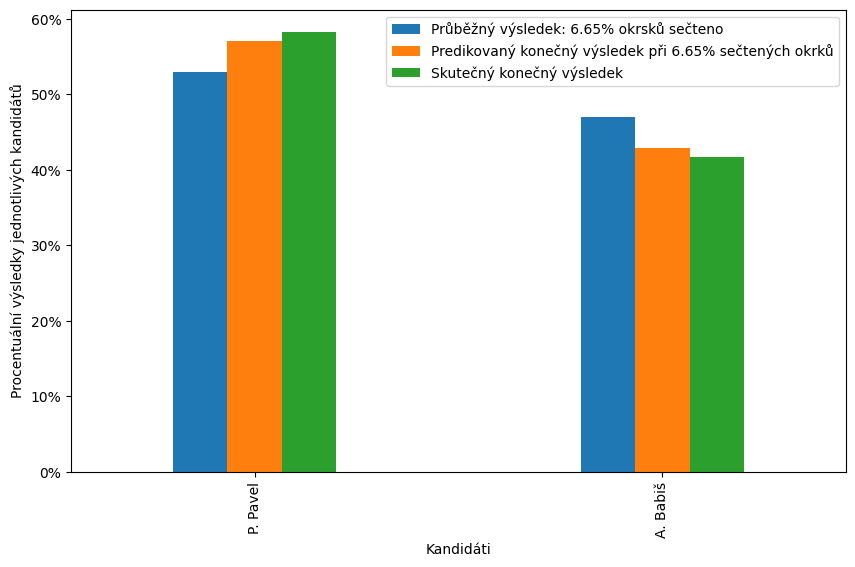

In [ ]:
from matplotlib.ticker import FuncFormatter

def percentage(x, pos):
    return '{:.0%}'.format(x)

ax = vysledky.plot(kind='bar', figsize=(10, 6), width=0.4)

plt.xlabel('Kandidáti')
plt.ylabel('Procentuální výsledky jednotlivých kandidátů')

formatter = FuncFormatter(percentage)
ax.yaxis.set_major_formatter(formatter)

plt.legend(loc='upper right')

plt.show()

In [ ]:
mse_list = []
rmse_list = []
hlasy_cols = [col for col in prez_2023_2_original_data_abs.columns if col.startswith('HLASY_')]
hlasy_predikce_dict = {col: [] for col in hlasy_cols}

for i in range(1, prez_2023_2_original_data_abs['davka'].max()):
  prez_2023_2_abs_do_davky = prez_2023_2_original_data_abs[prez_2023_2_original_data_abs['davka'] <= i]
  prez_2023_2_abs_do_davky_merged_cluster_labels = pd.merge(cluster_labels, prez_2023_2_abs_do_davky, how = 'right', on = ['CIS_OBEC', 'CIS_OKRSEK'])
  prez_2023_2_abs_do_davky_merged_cluster_labels = prez_2023_2_abs_do_davky_merged_cluster_labels.groupby('cluster_label')[['PLATNE_HLASY'] + hlasy_cols].sum()
  total_zapsani_volici_2023_2_davka = prez_2023_2_abs_do_davky_merged_cluster_labels['PLATNE_HLASY'].sum()
  prez_2023_2_abs_do_davky_merged_cluster_labels['PODIL_CLUSTERU'] = prez_2023_2_abs_do_davky_merged_cluster_labels['PLATNE_HLASY'] / total_zapsani_volici_2023_2_davka
  prez_2023_2_abs_do_davky_merged_cluster_labels.drop(columns = ['PLATNE_HLASY'], inplace = True)
  prez_2023_2_abs_do_davky_merged_cluster_labels
  podily_clusteru = pd.merge(prez_2023_2_abs_do_davky_merged_cluster_labels, clustered_2018, on = 'cluster_label', how = 'inner', suffixes=['_2023', '_2018'])
  for col in hlasy_cols:
      podily_clusteru[col] = podily_clusteru[col] * (podily_clusteru['PODIL_CLUSTERU_2018'] / podily_clusteru['PODIL_CLUSTERU_2023'])
  podily_clusteru.drop(['PODIL_CLUSTERU_2023', 'PODIL_CLUSTERU_2018'], axis = 1, inplace=True)
  pocet_hlasu_predikce = podily_clusteru.sum()
  pocet_hlasu_predikce = pd.DataFrame(pocet_hlasu_predikce)
  pocet_hlasu_predikce.rename(columns={0: 'pred_pocet_hlasu'}, inplace=True)
  celkem_hlasu_davka_predikce = pocet_hlasu_predikce['pred_pocet_hlasu'].sum()
  pocet_hlasu_predikce['pred_pocet_hlasu'] = pocet_hlasu_predikce['pred_pocet_hlasu'] / celkem_hlasu_davka_predikce
  pocet_hlasu_predikce = pocet_hlasu_predikce.T

  for col in hlasy_predikce_dict:
    hlasy_predikce_dict[col].append(pocet_hlasu_predikce[col].values[0])


  mse = mean_squared_error(pocet_hlasu_predikce, prez_2023_2_vysledky)
  mse_list.append(mse)
  rmse = sqrt(mse)
  rmse_list.append(rmse)

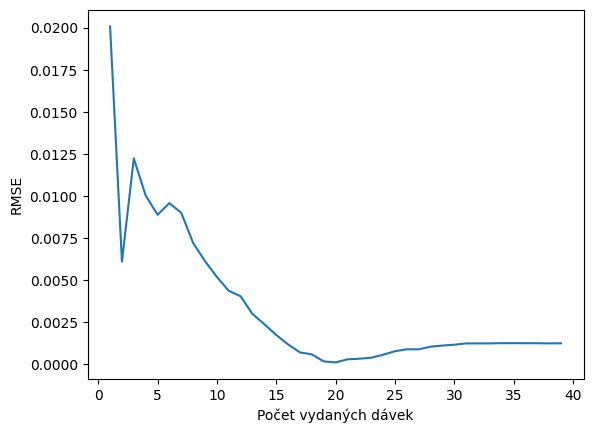

In [ ]:
x = range(1, 1 + len(rmse_list))
plt.plot(x, rmse_list)
plt.xlabel('Počet vydaných dávek')
plt.ylabel('RMSE')
plt.show()

In [ ]:
na_values_back = pd.Series([np.nan])
rmse_list_ser = pd.Series(rmse_list)
rmse_list_ser = pd.concat([rmse_list_ser, na_values_back], ignore_index=True)

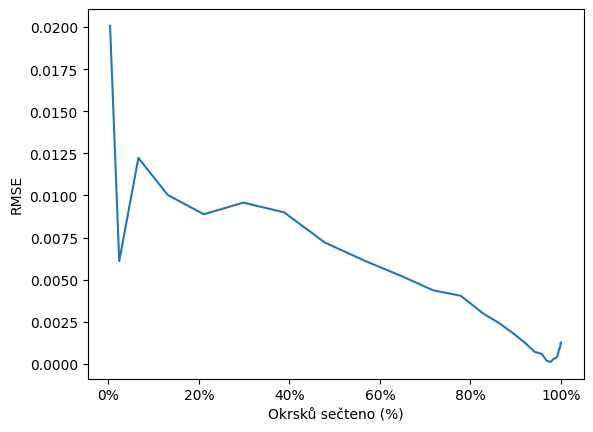

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

def percentage(x, pos):
    return '{:.0%}'.format(x)

plt.plot(prez_2023_2_original_data_proc['okrsku_secteno'], rmse_list_ser)

plt.xlabel('Okrsků sečteno (%)')
plt.ylabel('RMSE')

formatter = FuncFormatter(percentage)
plt.gca().xaxis.set_major_formatter(formatter)

plt.show()

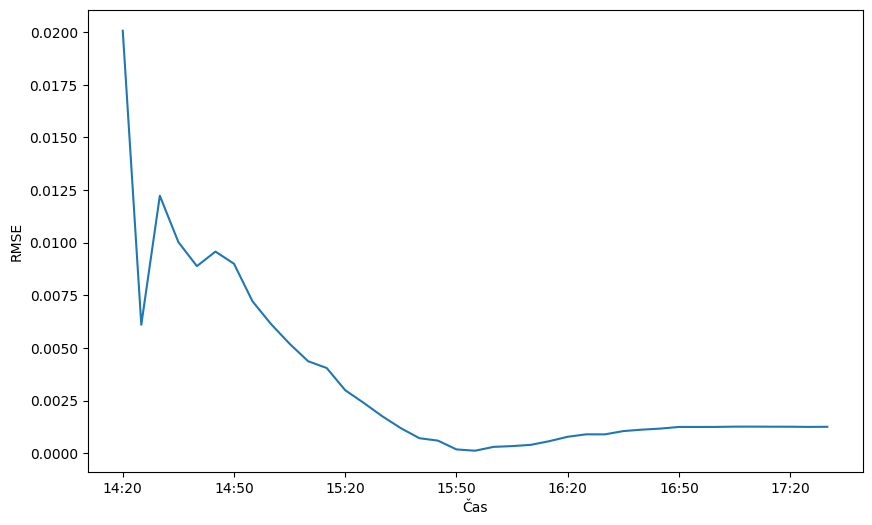

In [ ]:
n_points = len(rmse_list)

start_time = pd.Timestamp('2023-10-10 14:20')
time_labels = [(start_time + pd.Timedelta(minutes=5 * i)).strftime('%H:%M') for i in range(n_points)]

plt.figure(figsize=(10, 6))
plt.plot(range(1, n_points + 1), rmse_list)

plt.xticks(ticks=range(1, n_points + 1, 6), labels=time_labels[::6])

plt.xlabel('Čas')
plt.ylabel('RMSE')

plt.show()


In [ ]:
prejmenovani_klicu_slovniku = {
    'HLASY_4': 'P. Pavel',
    'HLASY_7': 'A. Babiš'
}

predikce_prejmenovany_dict = {prejmenovani_klicu_slovniku.get(k, k): v for k, v in hlasy_predikce_dict.items()}


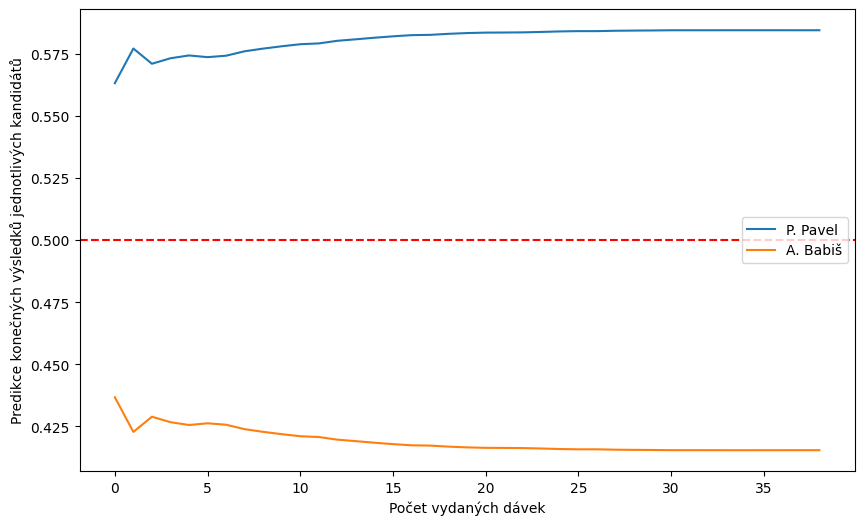

In [ ]:
plt.figure(figsize=(10, 6))

for key, values in predikce_prejmenovany_dict.items():
    plt.plot(values, label=key)

plt.xlabel('Počet vydaných dávek')
plt.ylabel('Predikce konečných výsledků jednotlivých kandidátů')

plt.axhline(y=0.5, color='red', linestyle='--')

plt.legend()

plt.show()

In [ ]:
modified_predikce_dict = {}

for key, values in predikce_prejmenovany_dict.items():
    modified_values = pd.concat([pd.Series(values), pd.Series([np.nan])]).reset_index(drop=True)
    modified_predikce_dict[key] = modified_values

for key, values in modified_predikce_dict.items():
    print(f"{key}: {values.tolist()}")

P. Pavel: [0.5632276592105869, 0.5771898398411726, 0.5710624759260553, 0.573264349873631, 0.5744066067390312, 0.5737152099987813, 0.5742943803450208, 0.5760796055180688, 0.5771594860627597, 0.5780929341164851, 0.578922219929374, 0.579245011693326, 0.5802995032377135, 0.5809026799734422, 0.5815371026653005, 0.582102019831308, 0.5825777261172662, 0.58269248786678, 0.5831104522231417, 0.583414312331757, 0.5835969189131538, 0.5836343798976423, 0.5836917840522147, 0.5838665337192528, 0.5840773738357532, 0.5841935172747159, 0.584190305967458, 0.5843467639663991, 0.584415219004065, 0.5844646783038903, 0.5845435034633727, 0.5845428790137641, 0.5845441230436028, 0.5845573398466566, 0.5845586620335804, 0.5845546896649383, 0.5845536680077369, 0.5845447054522706, 0.584550749122973, nan]
A. Babiš: [0.43677234078941307, 0.4228101601588275, 0.42893752407394475, 0.42673565012636894, 0.42559339326096873, 0.4262847900012187, 0.42570561965497916, 0.4239203944819312, 0.4228405139372404, 0.4219070658835149

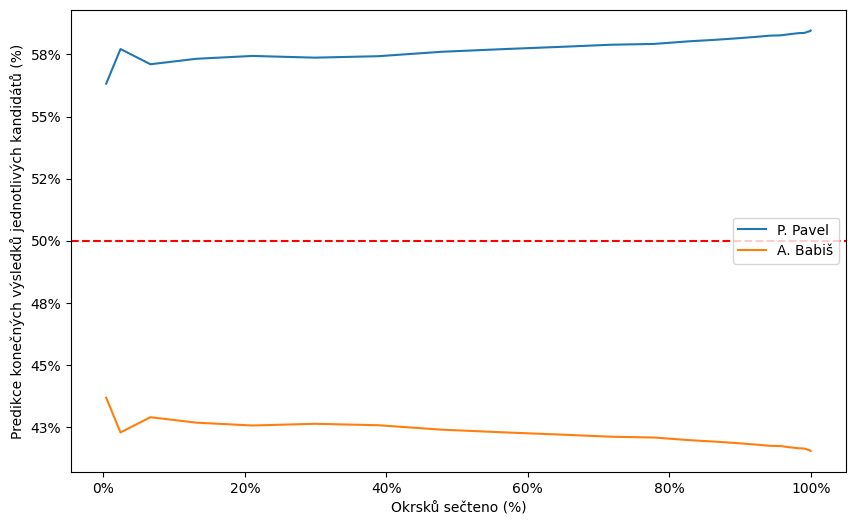

In [ ]:
from matplotlib.ticker import FuncFormatter
import matplotlib.pyplot as plt

def percentage(x, pos):
    return '{:.0%}'.format(x)

plt.figure(figsize=(10, 6))

for key, values in modified_predikce_dict.items():
    plt.plot(prez_2023_2_original_data_proc['okrsku_secteno'], values, label=key)

plt.xlabel('Okrsků sečteno (%)')
plt.ylabel('Predikce konečných výsledků jednotlivých kandidátů (%)')

ax = plt.gca()

formatter = FuncFormatter(percentage)
ax.yaxis.set_major_formatter(formatter)
ax.xaxis.set_major_formatter(formatter)

plt.axhline(y=0.5, color='red', linestyle='--')

plt.legend()

plt.show()

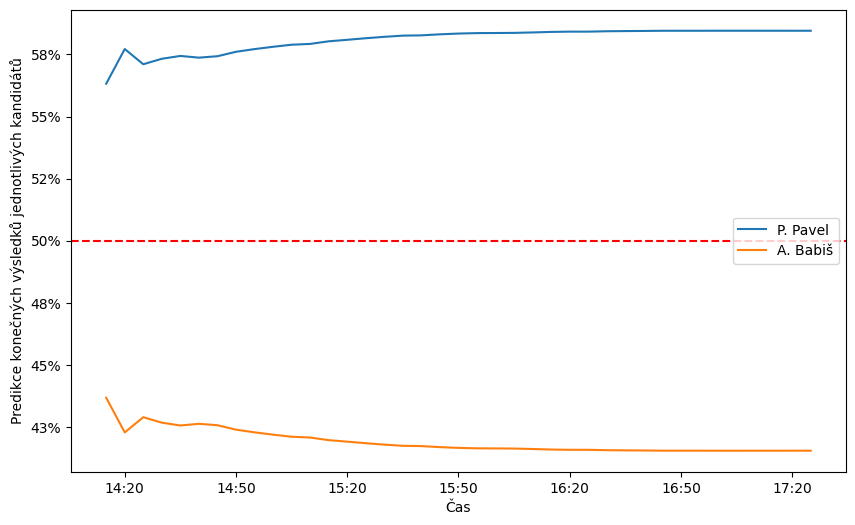

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.ticker import FuncFormatter

def percentage(x, pos):
    return '{:.0%}'.format(x)

n_points = len(next(iter(modified_predikce_dict.values())))

start_time = pd.Timestamp('2023-01-14 14:20')
time_labels = [(start_time + pd.Timedelta(minutes=5 * i)).strftime('%H:%M') for i in range(n_points)]

plt.figure(figsize=(10, 6))

for key, values in modified_predikce_dict.items():
    plt.plot(values, label=key)

plt.xlabel('Čas')
plt.ylabel('Predikce konečných výsledků jednotlivých kandidátů')

ax = plt.gca()

formatter = FuncFormatter(percentage)
ax.yaxis.set_major_formatter(formatter)

plt.axhline(y=0.5, color='red', linestyle='--')

plt.xticks(ticks=range(1, n_points + 1, 6), labels=time_labels[::6])

plt.legend()

plt.show()

In [ ]:
avg_rmse_agl_clust_2 = sum(rmse_list) / len(rmse_list)
print(f"Průměrný RMSE pro model Aglomerativního clusteringu a 2. kolo prezidentských voleb v roce 2023 je {avg_rmse_agl_clust_2}.")

Průměrný RMSE pro model Aglomerativního clusteringu a 2. kolo prezidentských voleb v roce 2023 je 0.0033760836508587313.


In [ ]:
rmse_list_AGLOM_2 = rmse_list
rmse_df = pd.DataFrame(rmse_list_AGLOM_2)
rmse_df.rename(columns = {0: 'Aglom'}, inplace = True)
rmse_df.to_csv('rmse_AGLOM_2.csv', index = False)

##### Intervaly Spolehlivosti

In [ ]:
from scipy.stats import norm


z_score = norm.ppf(0.975)

predictions = {}
lower_bounds = {}
upper_bounds = {}

objekty = ['CIS_OBEC', 'CIS_OKRSEK']
merged_dataset[objekty] = merged_dataset[objekty].astype('int64')
cluster_labels = merged_dataset[['cluster_label', 'CIS_OBEC', 'CIS_OKRSEK']]
merged_data_2018 = pd.merge(cluster_labels, prez_2018_1_original_data_abs[['PLATNE_HLASY', 'CIS_OBEC', 'CIS_OKRSEK']], on=['CIS_OBEC', 'CIS_OKRSEK'], how='inner')
merged_data_2018.drop(columns = ['CIS_OKRSEK', 'CIS_OBEC'], axis = 1, inplace = True)
clustered_2018 = merged_data_2018.groupby('cluster_label').sum()
total_zapsani_volici = clustered_2018['PLATNE_HLASY'].sum()
clustered_2018['PODIL_CLUSTERU'] = clustered_2018['PLATNE_HLASY'] / total_zapsani_volici
clustered_2018.rename(columns = {'PLATNE_HLASY': 'PLATNE_HLASY_2018'}, inplace = True)


for i in range(1, prez_2023_2_original_data_abs['davka'].max()):
  prez_2023_2_abs_do_davky = prez_2023_2_original_data_abs[prez_2023_2_original_data_abs['davka'] <= i]
  nove_volby_with_clusters = pd.merge(cluster_labels, prez_2023_2_abs_do_davky, on=['CIS_OBEC', 'CIS_OKRSEK'], how='inner')
  nove_volby_with_clusters.drop(columns = ['CIS_OBEC', 'CIS_OKRSEK', 'davka', 'VYDANE_OBALKY', 'ODEVZDANE_OBALKY', 'ZAPSANI_VOLICI'], inplace = True)

  clustered_2023 = nove_volby_with_clusters.groupby('cluster_label').sum()

  celkove_volicu = clustered_2023['PLATNE_HLASY'].sum()

  clustered_2023['podil_clusteru_2023'] = clustered_2023['PLATNE_HLASY'] / celkove_volicu

  clustered_2023_with_shares_of_clusters = pd.merge(clustered_2023, clustered_2018, on=['cluster_label'], how='inner')

  clustered_2023_with_shares_of_clusters.rename(columns={'PODIL_CLUSTERU': 'podil_clusteru_2018'}, inplace=True)
  for col in ['HLASY_4', 'HLASY_7']:
    clustered_2023_with_shares_of_clusters[col + '_perc'] = clustered_2023_with_shares_of_clusters[col] / clustered_2023_with_shares_of_clusters['PLATNE_HLASY']


  for col in ['HLASY_4', 'HLASY_7']:
    clustered_2023_with_shares_of_clusters[col] = clustered_2023_with_shares_of_clusters[col] * (clustered_2023_with_shares_of_clusters['podil_clusteru_2018'] / clustered_2023_with_shares_of_clusters['podil_clusteru_2023'])
    clustered_2023_with_shares_of_clusters['scaled_fraction'] = (clustered_2023_with_shares_of_clusters['PLATNE_HLASY'] / clustered_2023_with_shares_of_clusters['PLATNE_HLASY_2018']).clip(upper=1)
    clustered_2023_with_shares_of_clusters['scaled_fraction'] = (clustered_2023_with_shares_of_clusters['PLATNE_HLASY'] / clustered_2023_with_shares_of_clusters['PLATNE_HLASY_2018']).clip(upper=1)
    clustered_2023_with_shares_of_clusters[col + '_rozptyl'] = ((clustered_2023_with_shares_of_clusters[col + '_perc'] * (1 - clustered_2023_with_shares_of_clusters[col + '_perc'])) / clustered_2023_with_shares_of_clusters['PLATNE_HLASY']) * (clustered_2023_with_shares_of_clusters['podil_clusteru_2018'] / clustered_2023_with_shares_of_clusters['podil_clusteru_2023'])**2 * (1 - clustered_2023_with_shares_of_clusters['scaled_fraction'])

  clustered_2023_reweighted = clustered_2023_with_shares_of_clusters
  cols_to_choose_hlasy = ['HLASY_4', 'HLASY_7']
  cols_to_choose_rozptyl = ['HLASY_4_rozptyl',  'HLASY_7_rozptyl']
  clustered_2023_pred_pocet_hlasu = clustered_2023_reweighted[cols_to_choose_hlasy]
  clustered_2023_rozptyl = clustered_2023_reweighted[cols_to_choose_rozptyl]
  clustered_2023_pred_pocet_hlasu = clustered_2023_pred_pocet_hlasu.sum().sort_index()
  clustered_2023_rozptyl = clustered_2023_rozptyl.sum().sort_index()
  clustered_2023_pred_pocet_hlasu = pd.DataFrame(clustered_2023_pred_pocet_hlasu)
  clustered_2023_rozptyl = pd.DataFrame(clustered_2023_rozptyl).T
  clustered_2023_pred_pocet_hlasu.rename(columns={0: 'pred_pocet_hlasu'}, inplace=True)
  celkem_hlasu = clustered_2023_pred_pocet_hlasu['pred_pocet_hlasu'].sum()
  clustered_2023_pred_pocet_hlasu['pred_proc_vysl'] = clustered_2023_pred_pocet_hlasu['pred_pocet_hlasu'] / celkem_hlasu
  prez_2023_2_predikce = clustered_2023_pred_pocet_hlasu['pred_proc_vysl']
  prez_2023_2_predikce = pd.DataFrame(prez_2023_2_predikce).T

  predictions[i] = {}
  lower_bounds[i] = {}
  upper_bounds[i] = {}

  for col in prez_2023_2_predikce.columns:
      pred_value = prez_2023_2_predikce[col].values[0]
      lower_bound = pred_value - z_score * np.sqrt(clustered_2023_rozptyl[col + '_rozptyl'].values[0])
      upper_bound = pred_value + z_score * np.sqrt(clustered_2023_rozptyl[col + '_rozptyl'].values[0])

      predictions[i][col] = pred_value
      lower_bounds[i][col] = lower_bound
      upper_bounds[i][col] = upper_bound

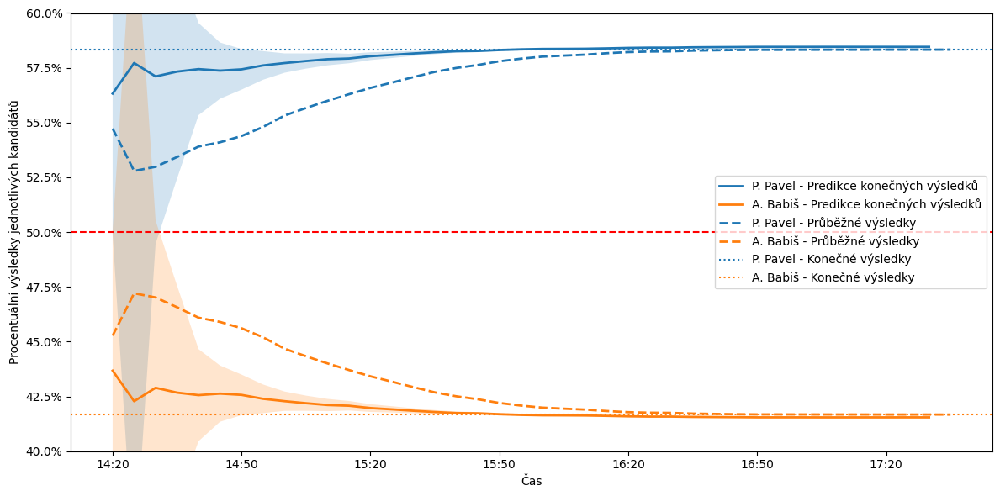

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.ticker import FuncFormatter


prez_2023_2_original_data_proc = pd.read_csv('prez_2023_2_proc.csv')
prubeh = prez_2023_2_original_data_proc[['HLASY_4', 'HLASY_7']].copy()
konecne_vysledky = prubeh.iloc[-1]

plt.figure(figsize=(12, 6))

labels = {
    'HLASY_4': 'P. Pavel - Predikce konečných výsledků',
    'HLASY_7': 'A. Babiš - Predikce konečných výsledků'
}

def percentage(x, pos):
    return '{:.1%}'.format(x)

n_points = 40

start_time = pd.Timestamp('2023-01-14 14:20')
time_labels = [(start_time + pd.Timedelta(minutes=5 * i)).strftime('%H:%M') for i in range(n_points)]

for col in ['HLASY_4', 'HLASY_7']:

    pred_values = [predictions[i][col] for i in range(1, len(predictions) + 1)]
    lower_values = [lower_bounds[i][col] for i in range(1, len(lower_bounds) + 1)]
    upper_values = [upper_bounds[i][col] for i in range(1, len(upper_bounds) + 1)]

    plt.plot(pred_values, label=labels.get(col, col), linewidth=2)
    plt.fill_between(range(len(pred_values)), lower_values, upper_values, alpha=0.2)

plt.plot(prubeh['HLASY_4'], label="P. Pavel - Průběžné výsledky", color='#1f77b4', linestyle='--', linewidth=2)
plt.plot(prubeh['HLASY_7'], label="A. Babiš - Průběžné výsledky", color='#ff7f0e', linestyle='--', linewidth=2)

plt.xlabel('Čas')
plt.ylabel('Procentuální výsledky jednotlivých kandidátů')

plt.axhline(y=0.5, color='red', linestyle='--')

plt.axhline(y=konecne_vysledky['HLASY_4'], label="P. Pavel - Konečné výsledky", color='#1f77b4', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_7'], label="A. Babiš - Konečné výsledky", color='#ff7f0e', linestyle='dotted')

plt.ylim(0.4, 0.6)

ax = plt.gca()

formatter = FuncFormatter(percentage)
ax.yaxis.set_major_formatter(formatter)

plt.xticks(ticks=range(0, n_points, 6), labels=time_labels[::6])

plt.legend(loc='center right')

plt.tight_layout()
plt.show()

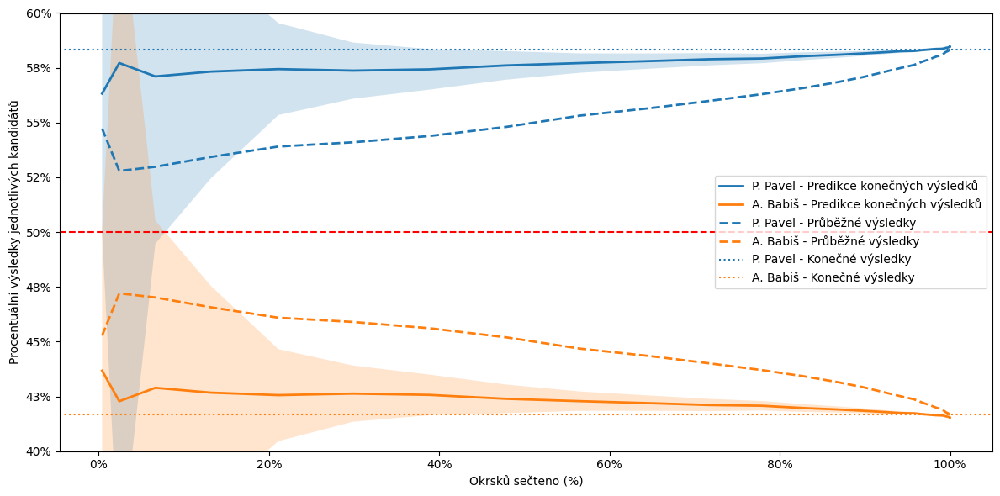

In [ ]:
from matplotlib.ticker import FuncFormatter
import matplotlib.pyplot as plt
import pandas as pd

prez_2023_2_original_data_proc = pd.read_csv('prez_2023_2_proc.csv')
prubeh = prez_2023_2_original_data_proc[['HLASY_4', 'HLASY_7']].copy()
prubeh = prubeh[:-1]
konecne_vysledky = prubeh.iloc[-1]
orsku_secteno = prez_2023_2_original_data_proc['okrsku_secteno'][:-1]  # Excluding the last value

plt.figure(figsize=(12, 6))

labels = {
    'HLASY_4': 'P. Pavel - Predikce konečných výsledků',
    'HLASY_7': 'A. Babiš - Predikce konečných výsledků'
}

def percentage(x, pos):
    return '{:.0%}'.format(x)

for col in ['HLASY_4', 'HLASY_7']:

    pred_values = [predictions[i][col] for i in range(1, len(predictions) + 1)]
    lower_values = [lower_bounds[i][col] for i in range(1, len(lower_bounds) + 1)]
    upper_values = [upper_bounds[i][col] for i in range(1, len(upper_bounds) + 1)]

    plt.plot(orsku_secteno, pred_values, label=labels.get(col, col), linewidth=2)
    plt.fill_between(orsku_secteno, lower_values, upper_values, alpha=0.2)

plt.plot(orsku_secteno, prubeh['HLASY_4'], label="P. Pavel - Průběžné výsledky", color='#1f77b4', linestyle='--', linewidth=2)
plt.plot(orsku_secteno, prubeh['HLASY_7'], label="A. Babiš - Průběžné výsledky", color='#ff7f0e', linestyle='--', linewidth=2)

plt.xlabel('Okrsků sečteno (%)')
plt.ylabel('Procentuální výsledky jednotlivých kandidátů')

plt.axhline(y=0.5, color='red', linestyle='--')
plt.axhline(y=konecne_vysledky['HLASY_4'], label="P. Pavel - Konečné výsledky", color='#1f77b4', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_7'], label="A. Babiš - Konečné výsledky", color='#ff7f0e', linestyle='dotted')


plt.ylim(0.4, 0.6)

ax = plt.gca()

formatter = FuncFormatter(percentage)
ax.yaxis.set_major_formatter(formatter)
ax.xaxis.set_major_formatter(formatter)

plt.legend(loc='center right')

plt.tight_layout()
plt.show()

#### Predikce prezidentskych voleb 2023 2. kolo - K-means

In [ ]:
merged_dataset = prez_2023_1_rel.merge(ps_2021_rel, on = 'CIS_OBEC_OKRSEK', how = 'outer', suffixes = ('_prez', '_ps'))
merged_dataset.head()

,HLASY_1_prez,HLASY_2_prez,HLASY_4_prez,HLASY_5_prez,HLASY_6_prez,HLASY_7_prez,HLASY_8_prez,HLASY_9_prez,CIS_OBEC_OKRSEK,HLASY_1_ps,...,HLASY_13,HLASY_14,HLASY_15,HLASY_16,HLASY_17,HLASY_18,HLASY_19,HLASY_20,HLASY_21,HLASY_22
0,0.066019,0.071845,0.320388,0.003883,0.145631,0.339806,0.015534,0.036893,500011_1,0.001984,...,0.279762,0.0,0.003968,0.007937,0.126984,0.027778,0.0,0.253968,0.009921,0.015873
1,0.09589,0.061644,0.287671,0.013699,0.188356,0.304795,0.006849,0.041096,500011_2,0.010563,...,0.292254,0.0,0.0,0.0,0.130282,0.014085,0.0,0.264085,0.0,0.0
2,0.084746,0.040678,0.389831,0.00678,0.135593,0.298305,0.010169,0.033898,500011_3,0.00692,...,0.408304,0.0,0.00346,0.00346,0.128028,0.020761,0.0,0.207612,0.00346,0.0
3,0.046358,0.07947,0.211921,0.0,0.192053,0.450331,0.0,0.019868,500020_1,0.006289,...,0.201258,0.0,0.0,0.0,0.138365,0.081761,0.0,0.220126,0.0,0.018868
4,0.065844,0.037037,0.246914,0.00823,0.183128,0.409465,0.016461,0.032922,500020_2,0.002212,...,0.25,0.0,0.004425,0.0,0.081858,0.015487,0.0,0.307522,0.006637,0.004425


In [ ]:
merged_dataset = merged_dataset.merge(prez_2018_2_rel, on = 'CIS_OBEC_OKRSEK', how = 'outer')
merged_dataset[['CIS_OBEC', 'CIS_OKRSEK']] = merged_dataset['CIS_OBEC_OKRSEK'].str.split('_', expand=True)
merged_dataset.drop(columns=['CIS_OBEC_OKRSEK'], inplace=True)
merged_dataset.head()

,HLASY_1_prez,HLASY_2_prez,HLASY_4_prez,HLASY_5_prez,HLASY_6_prez,HLASY_7_prez,HLASY_8_prez,HLASY_9_prez,HLASY_1_ps,HLASY_2_ps,...,HLASY_17,HLASY_18,HLASY_19,HLASY_20,HLASY_21,HLASY_22,HLASY_7,HLASY_9,CIS_OBEC,CIS_OKRSEK
0,0.066019,0.071845,0.320388,0.003883,0.145631,0.339806,0.015534,0.036893,0.001984,0.001984,...,0.126984,0.027778,0.0,0.253968,0.009921,0.015873,0.522556,0.477444,500011,1
1,0.09589,0.061644,0.287671,0.013699,0.188356,0.304795,0.006849,0.041096,0.010563,0.010563,...,0.130282,0.014085,0.0,0.264085,0.0,0.0,0.533113,0.466887,500011,2
2,0.084746,0.040678,0.389831,0.00678,0.135593,0.298305,0.010169,0.033898,0.00692,0.0,...,0.128028,0.020761,0.0,0.207612,0.00346,0.0,0.47931,0.52069,500011,3
3,0.046358,0.07947,0.211921,0.0,0.192053,0.450331,0.0,0.019868,0.006289,0.006289,...,0.138365,0.081761,0.0,0.220126,0.0,0.018868,0.644809,0.355191,500020,1
4,0.065844,0.037037,0.246914,0.00823,0.183128,0.409465,0.016461,0.032922,0.002212,0.0,...,0.081858,0.015487,0.0,0.307522,0.006637,0.004425,0.622222,0.377778,500020,2


In [ ]:
merged_dataset.fillna(0, inplace = True)
X = merged_dataset.drop(columns = ['CIS_OBEC', 'CIS_OKRSEK'])

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [ ]:
kmeans = KMeans(n_clusters=12, random_state=0)
kmeans.fit(X_scaled)

merged_dataset['cluster_label'] = kmeans.labels_
objekty = ['CIS_OBEC', 'CIS_OKRSEK']
merged_dataset[objekty] = merged_dataset[objekty].astype('int64')
cluster_labels = merged_dataset[['cluster_label', 'CIS_OBEC', 'CIS_OKRSEK']]
merged_data_2018 = pd.merge(cluster_labels, prez_2018_2_original_data_abs[['PLATNE_HLASY', 'CIS_OBEC', 'CIS_OKRSEK']], on=['CIS_OBEC', 'CIS_OKRSEK'], how='inner')
merged_data_2018.drop(columns = ['CIS_OKRSEK', 'CIS_OBEC'], axis = 1, inplace = True)
clustered_2018 = merged_data_2018.groupby('cluster_label').sum()
total_zapsani_volici = clustered_2018['PLATNE_HLASY'].sum()
clustered_2018['PODIL_CLUSTERU'] = clustered_2018['PLATNE_HLASY'] / total_zapsani_volici
clustered_2018 = clustered_2018['PODIL_CLUSTERU']


In [ ]:
nove_volby_2_rel = pd.read_csv('prez_2023_2_proc.csv')
nove_volby_2_rel.head(10)

,davka,HLASY_4,HLASY_7,okrsku_secteno,volebni_ucast
0,1,0.547267,0.452733,0.003971,0.693168
1,2,0.527929,0.472071,0.024164,0.702844
2,3,0.529816,0.470184,0.066501,0.684922
3,4,0.534290,0.465710,0.131520,0.686718
4,5,0.539061,0.460939,0.210944,0.684321
5,6,0.541001,0.458999,0.298714,0.685329
6,7,0.543864,0.456136,0.388369,0.686911
7,8,0.547992,0.452008,0.478024,0.688955
8,9,0.553197,0.446803,0.565727,0.691474
9,10,0.556648,0.443352,0.649189,0.691906


In [ ]:
# ZDE SI ZVOLIM CISLO DAVKY:
pocet_davek = 3
nove_volby_2 = prez_2023_2_original_data_abs[prez_2023_2_original_data_abs['davka'] <= pocet_davek]
nove_volby_2.head()

,CIS_OBEC,CIS_OKRSEK,ZAPSANI_VOLICI,VYDANE_OBALKY,ODEVZDANE_OBALKY,PLATNE_HLASY,HLASY_4,HLASY_7,davka
0,577731,18,555,88,88,88,47,41.0,1
1,554022,1,123,92,92,92,50,42.0,1
2,588083,1,70,54,54,54,31,23.0,1
3,564788,1,65,53,53,53,32,21.0,1
4,595411,11,74,63,63,63,45,18.0,1


In [ ]:
nove_volby_2_with_clusters = pd.merge(cluster_labels, nove_volby_2, on=['CIS_OBEC', 'CIS_OKRSEK'], how='inner')
nove_volby_2_with_clusters.drop(columns = ['CIS_OBEC', 'CIS_OKRSEK', 'davka', 'VYDANE_OBALKY', 'ODEVZDANE_OBALKY', 'ZAPSANI_VOLICI'], inplace = True)
nove_volby_2_with_clusters.sample(5)

,cluster_label,PLATNE_HLASY,HLASY_4,HLASY_7
507,3,95,70,25.0
626,8,120,32,88.0
130,1,83,42,41.0
388,3,121,84,37.0
132,6,53,35,18.0


In [ ]:
clustered_2023_2 = nove_volby_2_with_clusters.groupby('cluster_label').sum()
clustered_2023_2

,PLATNE_HLASY,HLASY_4,HLASY_7
cluster_label,,,
0,4692,2579,2113.0
1,12296,6338,5958.0
2,3906,3077,829.0
3,12043,7343,4700.0
4,1298,690,608.0
5,4636,2219,2417.0
6,25169,16239,8930.0
7,2797,1491,1306.0
8,26913,9590,17323.0


In [ ]:
celkove_volicu_2 = clustered_2023_2['PLATNE_HLASY'].sum()

clustered_2023_2['podil_clusteru_2023'] = clustered_2023_2['PLATNE_HLASY'] / celkove_volicu_2

clustered_2023_2.drop(columns = ['PLATNE_HLASY'], inplace = True)
clustered_2023_2

,HLASY_4,HLASY_7,podil_clusteru_2023
cluster_label,,,
0,2579,2113.0,0.036365
1,6338,5958.0,0.095300
2,3077,829.0,0.030273
3,7343,4700.0,0.093339
4,690,608.0,0.010060
5,2219,2417.0,0.035931
6,16239,8930.0,0.195072
7,1491,1306.0,0.021678
8,9590,17323.0,0.208589


In [ ]:
clustered_2023_2_with_shares_of_clusters = pd.merge(clustered_2023_2, clustered_2018, on=['cluster_label'], how='inner')
clustered_2023_2_with_shares_of_clusters.rename(columns={'PODIL_CLUSTERU': 'podil_clusteru_2018'}, inplace=True)
clustered_2023_2_with_shares_of_clusters

,HLASY_4,HLASY_7,podil_clusteru_2023,podil_clusteru_2018
cluster_label,,,,
0,2579,2113.0,0.036365,0.006445
1,6338,5958.0,0.095300,0.088285
2,3077,829.0,0.030273,0.122436
3,7343,4700.0,0.093339,0.069585
4,690,608.0,0.010060,0.006668
5,2219,2417.0,0.035931,0.034286
6,16239,8930.0,0.195072,0.272171
7,1491,1306.0,0.021678,0.004913
8,9590,17323.0,0.208589,0.109390


In [ ]:
for col in ['HLASY_4', 'HLASY_7']:
    clustered_2023_2_with_shares_of_clusters[col] = clustered_2023_2_with_shares_of_clusters[col] * (clustered_2023_2_with_shares_of_clusters['podil_clusteru_2018'] / clustered_2023_2_with_shares_of_clusters['podil_clusteru_2023'])
clustered_2023_2_reweighted = clustered_2023_2_with_shares_of_clusters.drop(columns=['podil_clusteru_2023', 'podil_clusteru_2018'], axis = 1)
clustered_2023_2_reweighted

,HLASY_4,HLASY_7
cluster_label,,
0,457.097485,374.504454
1,5871.422731,5519.396755
2,12444.432095,3352.757298
3,5474.235782,3503.868742
4,457.371257,403.016992
5,2117.382323,2306.315041
6,22657.196106,12459.434770
7,337.890095,295.965435
8,5029.244483,9084.630049


In [ ]:
clustered_2023_2_reweighted = clustered_2023_2_reweighted.sum().sort_index()
clustered_2023_2_reweighted = pd.DataFrame(clustered_2023_2_reweighted)
clustered_2023_2_reweighted.rename(columns={0: 'pred_pocet_hlasu'}, inplace=True)
clustered_2023_2_reweighted

,pred_pocet_hlasu
HLASY_4,75230.219121
HLASY_7,53793.780879


In [ ]:
celkem_hlasu_2 = clustered_2023_2_reweighted['pred_pocet_hlasu'].sum()
clustered_2023_2_reweighted['pred_proc_vysl'] = clustered_2023_2_reweighted['pred_pocet_hlasu'] / celkem_hlasu_2
prez_2023_2_predikce = clustered_2023_2_reweighted['pred_proc_vysl']
prez_2023_2_predikce = pd.DataFrame(prez_2023_2_predikce).T
prez_2023_2_predikce

,HLASY_4,HLASY_7
pred_proc_vysl,0.583072,0.416928


In [ ]:
prez_2023_2_original_data_proc = pd.read_csv('prez_2023_2_proc.csv')
prez_2023_2_original_data_proc.tail()

,davka,HLASY_4,HLASY_7,okrsku_secteno,volebni_ucast
35,36,0.583252,0.416748,0.999731,0.698703
36,37,0.583261,0.416739,0.999798,0.698714
37,38,0.583265,0.416735,0.999933,0.698708
38,39,0.583265,0.416735,0.999933,0.698708
39,40,0.583293,0.416707,1.000000,0.698714


In [ ]:
max_davka = prez_2023_2_original_data_proc['davka'].max()
prez_2023_2_vysledky = prez_2023_2_original_data_proc[prez_2023_2_original_data_proc['davka'] == max_davka]
prez_2023_2_vysledky.drop(['davka', 'okrsku_secteno', 'volebni_ucast'], axis = 1, inplace = True)
prez_2023_2_vysledky

<ipython-input-409-92007d091414>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prez_2023_2_vysledky.drop(['davka', 'okrsku_secteno', 'volebni_ucast'], axis = 1, inplace = True)


,HLASY_4,HLASY_7
39,0.583293,0.416707


In [ ]:
prez_2023_2_train_last_row = prez_2023_2_original_data_proc[prez_2023_2_original_data_proc['davka'] == pocet_davek]
procent_secteno = prez_2023_2_train_last_row['okrsku_secteno'].values[0]
prez_2023_2_train_last_row.drop(['davka', 'okrsku_secteno', 'volebni_ucast'], axis = 1, inplace = True)
prez_2023_2_train_last_row.head()

<ipython-input-410-3ef2c3af9c34>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prez_2023_2_train_last_row.drop(['davka', 'okrsku_secteno', 'volebni_ucast'], axis = 1, inplace = True)


,HLASY_4,HLASY_7
2,0.529816,0.470184


In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

mse = mean_squared_error(prez_2023_2_predikce, prez_2023_2_vysledky)
rmse = sqrt(mse)
print("MSE: ", mse)
print("RMSE: ", rmse)

MSE:  4.909707669212485e-08
RMSE:  0.00022157860161153842


In [ ]:
vysledky = pd.concat([prez_2023_2_train_last_row, prez_2023_2_predikce, prez_2023_2_vysledky])
vysledky = vysledky.T
vysledky.index = ['P. Pavel', 'A. Babiš']
popisek_prubeh = "Průběžný výsledek: " + str(round(procent_secteno * 100, 2)) + "% okrsků sečteno"
popisek_predikce = "Predikovaný konečný výsledek při " + str(round(procent_secteno * 100, 2)) + "% sečtených okrků"
vysledky.columns = [popisek_prubeh, popisek_predikce, 'Skutečný konečný výsledek']
vysledky

,Průběžný výsledek: 6.65% okrsků sečteno,Predikovaný konečný výsledek při 6.65% sečtených okrků,Skutečný konečný výsledek
P. Pavel,0.529816,0.583072,0.583293
A. Babiš,0.470184,0.416928,0.416707


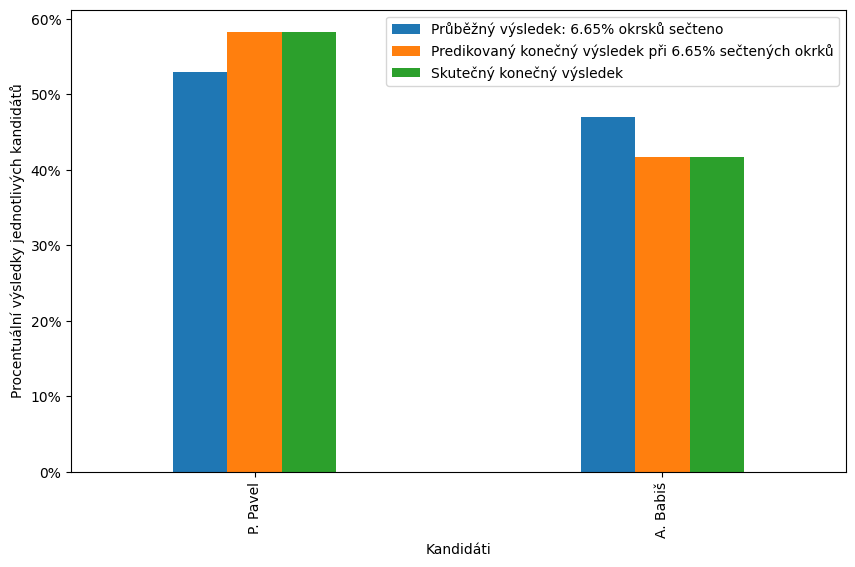

In [ ]:
from matplotlib.ticker import FuncFormatter


def percentage(x, pos):
    return '{:.0%}'.format(x)

ax = vysledky.plot(kind='bar', figsize=(10, 6), width=0.4)

plt.xlabel('Kandidáti')
plt.ylabel('Procentuální výsledky jednotlivých kandidátů')

formatter = FuncFormatter(percentage)
ax.yaxis.set_major_formatter(formatter)

plt.legend(loc='upper right')

plt.show()

In [ ]:
mse_list = []
rmse_list = []
hlasy_cols = [col for col in prez_2023_2_original_data_abs.columns if col.startswith('HLASY_')]
hlasy_predikce_dict = {col: [] for col in hlasy_cols}

for i in range(1, prez_2023_2_original_data_abs['davka'].max()):
  prez_2023_2_abs_do_davky = prez_2023_2_original_data_abs[prez_2023_2_original_data_abs['davka'] <= i]
  prez_2023_2_abs_do_davky_merged_cluster_labels = pd.merge(cluster_labels, prez_2023_2_abs_do_davky, how = 'right', on = ['CIS_OBEC', 'CIS_OKRSEK'])
  prez_2023_2_abs_do_davky_merged_cluster_labels = prez_2023_2_abs_do_davky_merged_cluster_labels.groupby('cluster_label')[['PLATNE_HLASY'] + hlasy_cols].sum()
  total_zapsani_volici_2023_2_davka = prez_2023_2_abs_do_davky_merged_cluster_labels['PLATNE_HLASY'].sum()
  prez_2023_2_abs_do_davky_merged_cluster_labels['PODIL_CLUSTERU'] = prez_2023_2_abs_do_davky_merged_cluster_labels['PLATNE_HLASY'] / total_zapsani_volici_2023_2_davka
  prez_2023_2_abs_do_davky_merged_cluster_labels.drop(columns = ['PLATNE_HLASY'], inplace = True)
  prez_2023_2_abs_do_davky_merged_cluster_labels
  podily_clusteru = pd.merge(prez_2023_2_abs_do_davky_merged_cluster_labels, clustered_2018, on = 'cluster_label', how = 'inner', suffixes=['_2023', '_2018'])

  for col in hlasy_cols:
      podily_clusteru[col] = podily_clusteru[col] * (podily_clusteru['PODIL_CLUSTERU_2018'] / podily_clusteru['PODIL_CLUSTERU_2023'])

  podily_clusteru.drop(['PODIL_CLUSTERU_2023', 'PODIL_CLUSTERU_2018'], axis = 1, inplace=True)
  pocet_hlasu_predikce = podily_clusteru.sum()
  pocet_hlasu_predikce = pd.DataFrame(pocet_hlasu_predikce)
  pocet_hlasu_predikce.rename(columns={0: 'pred_pocet_hlasu'}, inplace=True)
  celkem_hlasu_davka_predikce = pocet_hlasu_predikce['pred_pocet_hlasu'].sum()
  pocet_hlasu_predikce['pred_pocet_hlasu'] = pocet_hlasu_predikce['pred_pocet_hlasu'] / celkem_hlasu_davka_predikce
  pocet_hlasu_predikce = pocet_hlasu_predikce.T

  for col in hlasy_predikce_dict:
    hlasy_predikce_dict[col].append(pocet_hlasu_predikce[col].values[0])

  mse = mean_squared_error(pocet_hlasu_predikce, prez_2023_2_vysledky)
  mse_list.append(mse)
  rmse = sqrt(mse)
  rmse_list.append(rmse)

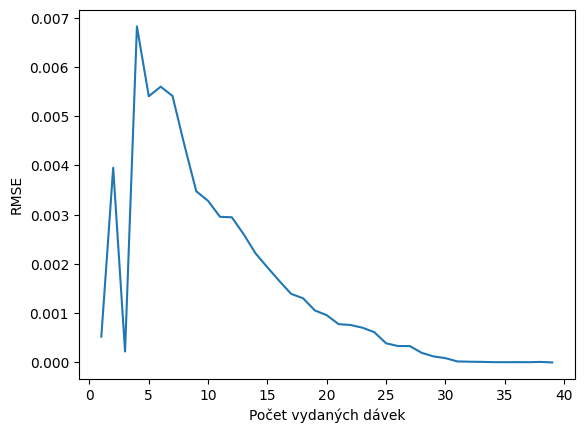

In [ ]:
x = range(1, 1 + len(rmse_list))
plt.plot(x, rmse_list)
plt.xlabel('Počet vydaných dávek')
plt.ylabel('RMSE')
plt.show()

In [ ]:
na_values_back = pd.Series([np.nan])
rmse_list_ser = pd.Series(rmse_list)
rmse_list_ser = pd.concat([rmse_list_ser, na_values_back], ignore_index=True)

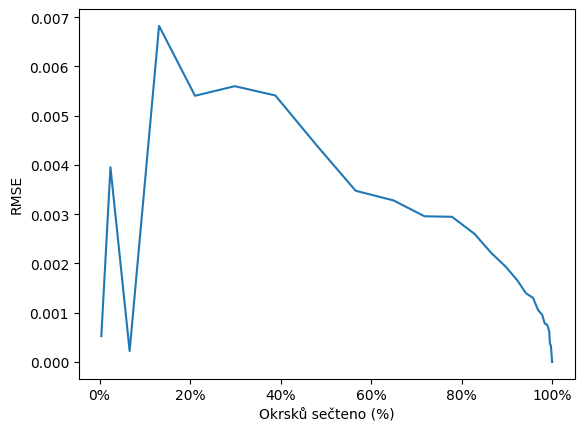

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter


def percentage(x, pos):
    return '{:.0%}'.format(x)

plt.plot(prez_2023_2_original_data_proc['okrsku_secteno'], rmse_list_ser)

plt.xlabel('Okrsků sečteno (%)')
plt.ylabel('RMSE')

formatter = FuncFormatter(percentage)
plt.gca().xaxis.set_major_formatter(formatter)

plt.show()

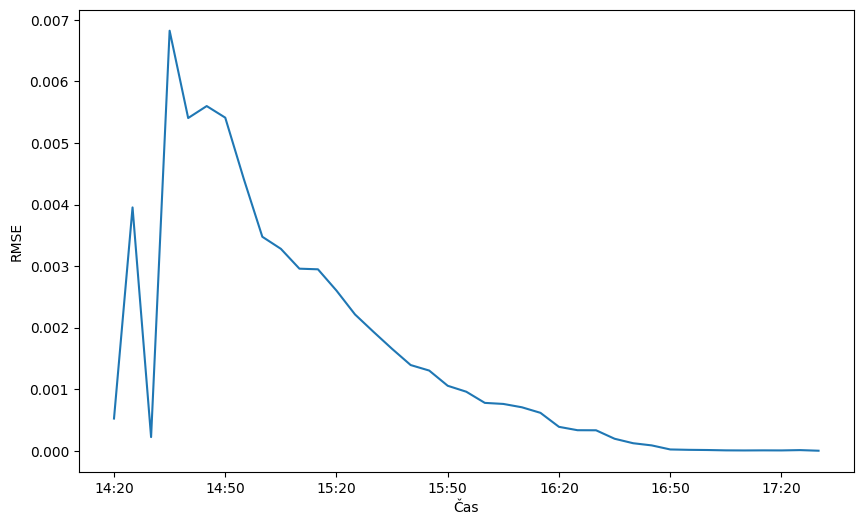

In [ ]:
n_points = len(rmse_list)

start_time = pd.Timestamp('2023-10-10 14:20')
time_labels = [(start_time + pd.Timedelta(minutes=5 * i)).strftime('%H:%M') for i in range(n_points)]

plt.figure(figsize=(10, 6))
plt.plot(range(1, n_points + 1), rmse_list)

plt.xticks(ticks=range(1, n_points + 1, 6), labels=time_labels[::6])

plt.xlabel('Čas')
plt.ylabel('RMSE')

plt.show()


In [ ]:
prejmenovani_klicu_slovniku = {
    'HLASY_4': 'P. Pavel',
    'HLASY_7': 'A. Babiš'
}

predikce_prejmenovany_dict = {prejmenovani_klicu_slovniku.get(k, k): v for k, v in hlasy_predikce_dict.items()}


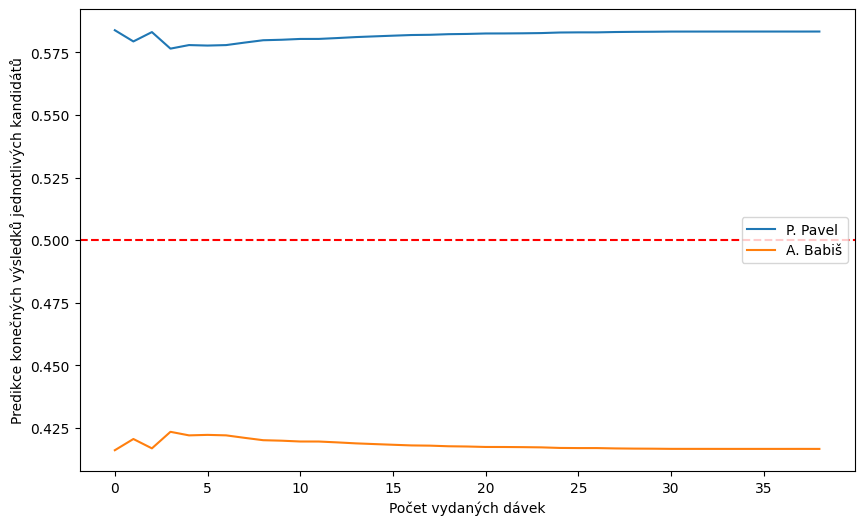

In [ ]:
plt.figure(figsize=(10, 6))

for key, values in predikce_prejmenovany_dict.items():
    plt.plot(values, label=key)

plt.xlabel('Počet vydaných dávek')
plt.ylabel('Predikce konečných výsledků jednotlivých kandidátů')

plt.axhline(y=0.5, color='red', linestyle='--')

plt.legend()

plt.show()

In [ ]:
modified_predikce_dict = {}

for key, values in predikce_prejmenovany_dict.items():

    modified_values = pd.concat([pd.Series(values), pd.Series([np.nan])]).reset_index(drop=True)
    modified_predikce_dict[key] = modified_values

for key, values in modified_predikce_dict.items():
    print(f"{key}: {values.tolist()}")


P. Pavel: [0.5838161460553725, 0.5793400507582376, 0.5830715147608508, 0.576469383887855, 0.577887932909734, 0.5776933975539356, 0.5778817418157066, 0.5788772754496115, 0.5798169133132137, 0.5800129882996439, 0.5803354079317974, 0.5803456261870357, 0.5806917366078823, 0.581079384910543, 0.5813626797123559, 0.5816384723994559, 0.5819010589397946, 0.5819905764180802, 0.5822379812841854, 0.5823343286310788, 0.5825157649388384, 0.5825329295978923, 0.5825872776297856, 0.5826773639470304, 0.5829050919307989, 0.5829598013845572, 0.5829609823344486, 0.5830985587817408, 0.5831712354523859, 0.5832064371060343, 0.5832724388728447, 0.5832785706826258, 0.5832815350039637, 0.5832871796348585, 0.5832885356211619, 0.5832871266022951, 0.583288172616812, 0.58328298942224, 0.5832931837624878, nan]
A. Babiš: [0.4161838539446276, 0.42065994924176237, 0.41692848523914916, 0.42353061611214504, 0.4221120670902661, 0.4223066024460644, 0.4221182581842935, 0.42112272455038846, 0.4201830866867863, 0.4199870117003

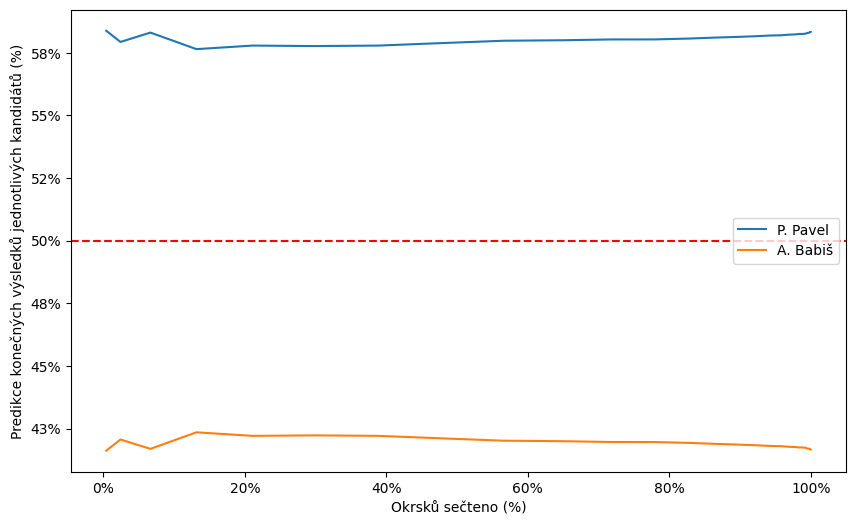

In [ ]:
from matplotlib.ticker import FuncFormatter
import matplotlib.pyplot as plt

def percentage(x, pos):
    return '{:.0%}'.format(x)

plt.figure(figsize=(10, 6))

for key, values in modified_predikce_dict.items():
    plt.plot(prez_2023_2_original_data_proc['okrsku_secteno'], values, label=key)

plt.xlabel('Okrsků sečteno (%)')
plt.ylabel('Predikce konečných výsledků jednotlivých kandidátů (%)')

ax = plt.gca()

formatter = FuncFormatter(percentage)
ax.yaxis.set_major_formatter(formatter)
ax.xaxis.set_major_formatter(formatter)

plt.axhline(y=0.5, color='red', linestyle='--')

plt.legend()

plt.show()

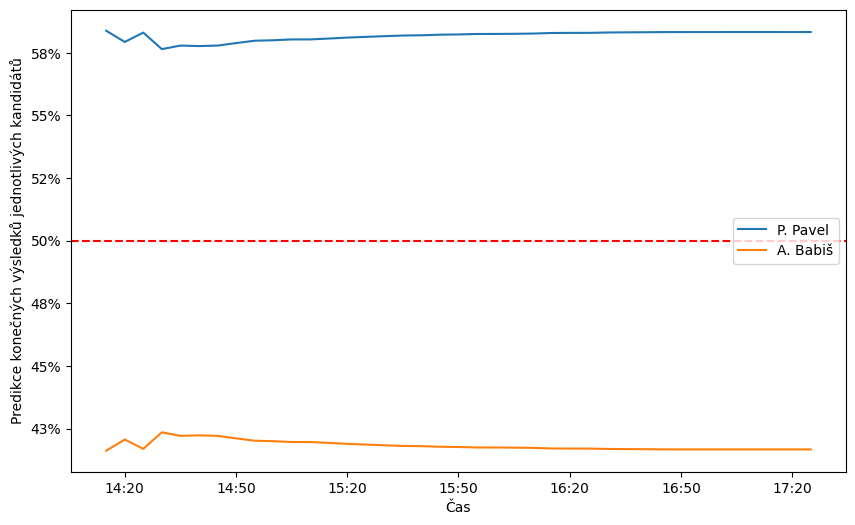

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.ticker import FuncFormatter


def percentage(x, pos):
    return '{:.0%}'.format(x)

n_points = len(next(iter(modified_predikce_dict.values())))

start_time = pd.Timestamp('2023-01-14 14:20')
time_labels = [(start_time + pd.Timedelta(minutes=5 * i)).strftime('%H:%M') for i in range(n_points)]

plt.figure(figsize=(10, 6))

for key, values in modified_predikce_dict.items():
    plt.plot(values, label=key)

plt.xlabel('Čas')
plt.ylabel('Predikce konečných výsledků jednotlivých kandidátů')

ax = plt.gca()

formatter = FuncFormatter(percentage)
ax.yaxis.set_major_formatter(formatter)

plt.axhline(y=0.5, color='red', linestyle='--')

plt.xticks(ticks=range(1, n_points + 1, 6), labels=time_labels[::6])

plt.legend()

plt.show()

In [ ]:
avg_rmse_kmeans_clust_2 = sum(rmse_list) / len(rmse_list)
print(f"Průměrný RMSE pro model K-means a 2. kolo prezidentských voleb v roce 2023 je {avg_rmse_kmeans_clust_2}.")

Průměrný RMSE pro model K-means a 2. kolo prezidentských voleb v roce 2023 je 0.0016030039531469763.


In [ ]:
rmse_list_KMEANS_2 = rmse_list
rmse_df = pd.DataFrame(rmse_list_KMEANS_2)
rmse_df.rename(columns = {0: 'Kmeans'}, inplace = True)
rmse_df.to_csv('rmse_KMEANS_2.csv', index = False)

##### Intervaly Spolehlivosti

In [ ]:
from scipy.stats import norm


z_score = norm.ppf(0.975)

predictions = {}
lower_bounds = {}
upper_bounds = {}

objekty = ['CIS_OBEC', 'CIS_OKRSEK']
merged_dataset[objekty] = merged_dataset[objekty].astype('int64')
cluster_labels = merged_dataset[['cluster_label', 'CIS_OBEC', 'CIS_OKRSEK']]
merged_data_2018 = pd.merge(cluster_labels, prez_2018_2_original_data_abs[['PLATNE_HLASY', 'CIS_OBEC', 'CIS_OKRSEK']], on=['CIS_OBEC', 'CIS_OKRSEK'], how='inner')
merged_data_2018.drop(columns = ['CIS_OKRSEK', 'CIS_OBEC'], axis = 1, inplace = True)
clustered_2018 = merged_data_2018.groupby('cluster_label').sum()
total_zapsani_volici = clustered_2018['PLATNE_HLASY'].sum()
clustered_2018['PODIL_CLUSTERU'] = clustered_2018['PLATNE_HLASY'] / total_zapsani_volici
clustered_2018.rename(columns = {'PLATNE_HLASY': 'PLATNE_HLASY_2018'}, inplace = True)


for i in range(1, prez_2023_2_original_data_abs['davka'].max()):

  prez_2023_2_abs_do_davky = prez_2023_2_original_data_abs[prez_2023_2_original_data_abs['davka'] <= i]
  nove_volby_with_clusters = pd.merge(cluster_labels, prez_2023_2_abs_do_davky, on=['CIS_OBEC', 'CIS_OKRSEK'], how='inner')
  nove_volby_with_clusters.drop(columns = ['CIS_OBEC', 'CIS_OKRSEK', 'davka', 'VYDANE_OBALKY', 'ODEVZDANE_OBALKY', 'ZAPSANI_VOLICI'], inplace = True)

  clustered_2023 = nove_volby_with_clusters.groupby('cluster_label').sum()

  celkove_volicu = clustered_2023['PLATNE_HLASY'].sum()

  clustered_2023['podil_clusteru_2023'] = clustered_2023['PLATNE_HLASY'] / celkove_volicu

  clustered_2023_with_shares_of_clusters = pd.merge(clustered_2023, clustered_2018, on=['cluster_label'], how='inner')

  clustered_2023_with_shares_of_clusters.rename(columns={'PODIL_CLUSTERU': 'podil_clusteru_2018'}, inplace=True)
  for col in ['HLASY_4', 'HLASY_7']:
    clustered_2023_with_shares_of_clusters[col + '_perc'] = clustered_2023_with_shares_of_clusters[col] / clustered_2023_with_shares_of_clusters['PLATNE_HLASY']


  for col in ['HLASY_4', 'HLASY_7']:
    clustered_2023_with_shares_of_clusters[col] = clustered_2023_with_shares_of_clusters[col] * (clustered_2023_with_shares_of_clusters['podil_clusteru_2018'] / clustered_2023_with_shares_of_clusters['podil_clusteru_2023'])
    clustered_2023_with_shares_of_clusters['scaled_fraction'] = (clustered_2023_with_shares_of_clusters['PLATNE_HLASY'] / clustered_2023_with_shares_of_clusters['PLATNE_HLASY_2018']).clip(upper=1)
    clustered_2023_with_shares_of_clusters['scaled_fraction'] = (clustered_2023_with_shares_of_clusters['PLATNE_HLASY'] / clustered_2023_with_shares_of_clusters['PLATNE_HLASY_2018']).clip(upper=1)
    clustered_2023_with_shares_of_clusters[col + '_rozptyl'] = ((clustered_2023_with_shares_of_clusters[col + '_perc'] * (1 - clustered_2023_with_shares_of_clusters[col + '_perc'])) / clustered_2023_with_shares_of_clusters['PLATNE_HLASY']) * (clustered_2023_with_shares_of_clusters['podil_clusteru_2018'] / clustered_2023_with_shares_of_clusters['podil_clusteru_2023'])**2 * (1 - clustered_2023_with_shares_of_clusters['scaled_fraction'])

  clustered_2023_reweighted = clustered_2023_with_shares_of_clusters
  cols_to_choose_hlasy = ['HLASY_4', 'HLASY_7']
  cols_to_choose_rozptyl = ['HLASY_4_rozptyl',  'HLASY_7_rozptyl']
  clustered_2023_pred_pocet_hlasu = clustered_2023_reweighted[cols_to_choose_hlasy]
  clustered_2023_rozptyl = clustered_2023_reweighted[cols_to_choose_rozptyl]
  clustered_2023_pred_pocet_hlasu = clustered_2023_pred_pocet_hlasu.sum().sort_index()
  clustered_2023_rozptyl = clustered_2023_rozptyl.sum().sort_index()
  clustered_2023_pred_pocet_hlasu = pd.DataFrame(clustered_2023_pred_pocet_hlasu)
  clustered_2023_rozptyl = pd.DataFrame(clustered_2023_rozptyl).T
  clustered_2023_pred_pocet_hlasu.rename(columns={0: 'pred_pocet_hlasu'}, inplace=True)
  celkem_hlasu = clustered_2023_pred_pocet_hlasu['pred_pocet_hlasu'].sum()
  clustered_2023_pred_pocet_hlasu['pred_proc_vysl'] = clustered_2023_pred_pocet_hlasu['pred_pocet_hlasu'] / celkem_hlasu
  prez_2023_2_predikce = clustered_2023_pred_pocet_hlasu['pred_proc_vysl']
  prez_2023_2_predikce = pd.DataFrame(prez_2023_2_predikce).T

  predictions[i] = {}
  lower_bounds[i] = {}
  upper_bounds[i] = {}

  for col in prez_2023_2_predikce.columns:

      pred_value = prez_2023_2_predikce[col].values[0]
      lower_bound = pred_value - z_score * np.sqrt(clustered_2023_rozptyl[col + '_rozptyl'].values[0])
      upper_bound = pred_value + z_score * np.sqrt(clustered_2023_rozptyl[col + '_rozptyl'].values[0])

      predictions[i][col] = pred_value
      lower_bounds[i][col] = lower_bound
      upper_bounds[i][col] = upper_bound

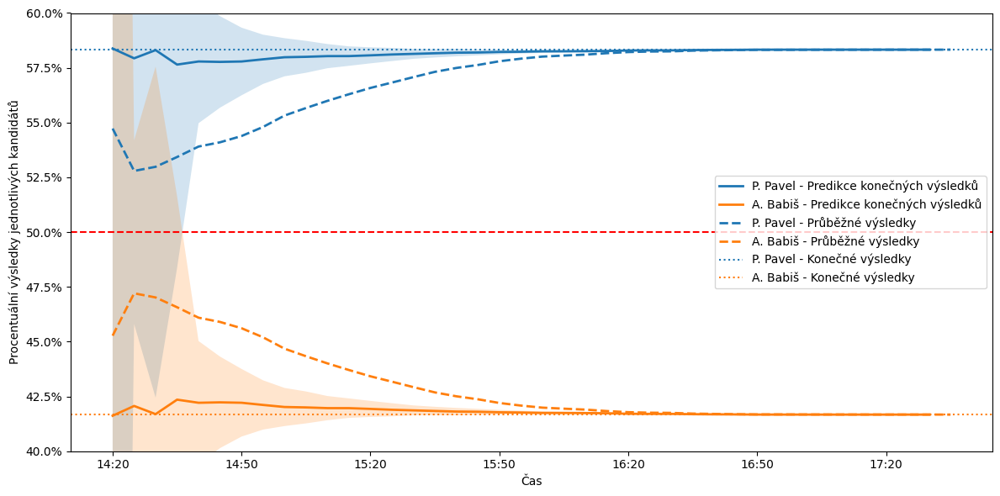

In [ ]:
from matplotlib.ticker import FuncFormatter


prez_2023_2_original_data_proc = pd.read_csv('prez_2023_2_proc.csv')
prubeh = prez_2023_2_original_data_proc[['HLASY_4', 'HLASY_7']].copy()
konecne_vysledky = prubeh.iloc[-1]

plt.figure(figsize=(12, 6))

labels = {
    'HLASY_4': 'P. Pavel - Predikce konečných výsledků',
    'HLASY_7': 'A. Babiš - Predikce konečných výsledků'
}

def percentage(x, pos):
    return '{:.1%}'.format(x)

n_points = 40

start_time = pd.Timestamp('2023-01-14 14:20')
time_labels = [(start_time + pd.Timedelta(minutes=5 * i)).strftime('%H:%M') for i in range(n_points)]

for col in ['HLASY_4', 'HLASY_7']:

    pred_values = [predictions[i][col] for i in range(1, len(predictions) + 1)]
    lower_values = [lower_bounds[i][col] for i in range(1, len(lower_bounds) + 1)]
    upper_values = [upper_bounds[i][col] for i in range(1, len(upper_bounds) + 1)]

    plt.plot(pred_values, label=labels.get(col, col), linewidth=2)
    plt.fill_between(range(len(pred_values)), lower_values, upper_values, alpha=0.2)

plt.plot(prubeh['HLASY_4'], label="P. Pavel - Průběžné výsledky", color='#1f77b4', linestyle='--', linewidth=2)
plt.plot(prubeh['HLASY_7'], label="A. Babiš - Průběžné výsledky", color='#ff7f0e', linestyle='--', linewidth=2)

plt.xlabel('Čas')
plt.ylabel('Procentuální výsledky jednotlivých kandidátů')

plt.axhline(y=0.5, color='red', linestyle='--')

plt.axhline(y=konecne_vysledky['HLASY_4'], label="P. Pavel - Konečné výsledky", color='#1f77b4', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_7'], label="A. Babiš - Konečné výsledky", color='#ff7f0e', linestyle='dotted')

plt.ylim(0.4, 0.6)

ax = plt.gca()

formatter = FuncFormatter(percentage)
ax.yaxis.set_major_formatter(formatter)

plt.xticks(ticks=range(0, n_points, 6), labels=time_labels[::6])

plt.legend(loc='center right')

plt.tight_layout()
plt.show()

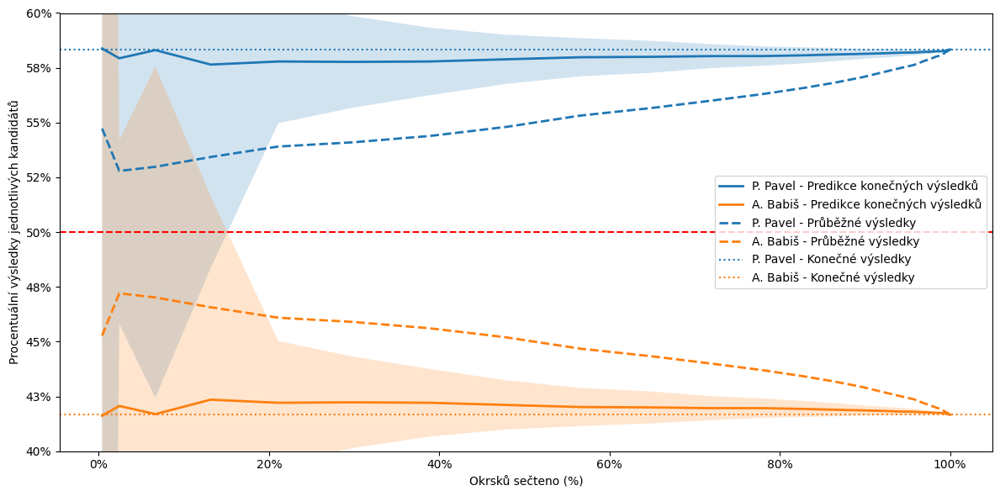

In [ ]:
from matplotlib.ticker import FuncFormatter
import matplotlib.pyplot as plt
import pandas as pd

prez_2023_2_original_data_proc = pd.read_csv('prez_2023_2_proc.csv')
prubeh = prez_2023_2_original_data_proc[['HLASY_4', 'HLASY_7']].copy()
prubeh = prubeh[:-1]
konecne_vysledky = prubeh.iloc[-1]
orsku_secteno = prez_2023_2_original_data_proc['okrsku_secteno'][:-1]

plt.figure(figsize=(12, 6))

labels = {
    'HLASY_4': 'P. Pavel - Predikce konečných výsledků',
    'HLASY_7': 'A. Babiš - Predikce konečných výsledků'
}

def percentage(x, pos):
    return '{:.0%}'.format(x)

for col in ['HLASY_4', 'HLASY_7']:

    pred_values = [predictions[i][col] for i in range(1, len(predictions) + 1)]
    lower_values = [lower_bounds[i][col] for i in range(1, len(lower_bounds) + 1)]
    upper_values = [upper_bounds[i][col] for i in range(1, len(upper_bounds) + 1)]

    plt.plot(orsku_secteno, pred_values, label=labels.get(col, col), linewidth=2)
    plt.fill_between(orsku_secteno, lower_values, upper_values, alpha=0.2)

plt.plot(orsku_secteno, prubeh['HLASY_4'], label="P. Pavel - Průběžné výsledky", color='#1f77b4', linestyle='--', linewidth=2)
plt.plot(orsku_secteno, prubeh['HLASY_7'], label="A. Babiš - Průběžné výsledky", color='#ff7f0e', linestyle='--', linewidth=2)

plt.xlabel('Okrsků sečteno (%)')
plt.ylabel('Procentuální výsledky jednotlivých kandidátů')

plt.axhline(y=0.5, color='red', linestyle='--')

plt.axhline(y=konecne_vysledky['HLASY_4'], label="P. Pavel - Konečné výsledky", color='#1f77b4', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_7'], label="A. Babiš - Konečné výsledky", color='#ff7f0e', linestyle='dotted')

plt.ylim(0.4, 0.6)

ax = plt.gca()

formatter = FuncFormatter(percentage)
ax.yaxis.set_major_formatter(formatter)
ax.xaxis.set_major_formatter(formatter)

plt.legend(loc='center right')

plt.tight_layout()
plt.show()

# Model - doplňování do matic

In [ ]:
pip install fancyimpute

  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.7/154.7 kB 6.8 MB/s eta 0:00:00
  Created wheel for fancyimpute: filename=fancyimpute-0.7.0-py3-none-any.whl size=29879 sha256=ed6289101122caa1581f460ef65e752886683bf33fc163f09a54a233fea55dc3
  Stored in directory: /root/.cache/pip/wheels/7b/0c/d3/ee82d1fbdcc0858d96434af108608d01703505d453720c84ed
  Created wheel for knnimpute: filename=knnimpute-0.1.0-py3-none-any.whl size=11329 sha256=751dcf4b1603e7dcefb67c06f3016879c039b784c3438154e17453153a4856dd
  Stored in directory: /root/.cache/pip/wheels/46/06/a5/45a724630562413c374e29c08732411d496092408b3a7bf754
Successfully built fancyimpute knnimpute


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.metrics import mean_squared_error
from math import sqrt
from fancyimpute import SoftImpute, KNN, BiScaler, IterativeImputer
from sklearn.preprocessing import StandardScaler

## 1. kolo prez voleb 2023

### Leva strana matice z prezidentskych voleb 2018 1. kolo - pro volby do PS v roce 2021 - Soft Impute - horsi

In [ ]:
# POZOR, BEZI 5 MIN
prez_2018_1_original_data = pd.read_csv('prez_2018_1_abs.csv')
ps_2021_original_data = pd.read_csv('ps_2021_abs.csv')
ps_2021_original_data_proc = pd.read_csv('ps_2021_proc.csv')

mse_list = []
rmse_list = []
hlasy_cols = [col for col in ps_2021_original_data_proc.columns if col.startswith('HLASY_')]
hlasy_predikce_dict = {col: [] for col in hlasy_cols}

ps_2021_proc = pd.read_csv('ps_2021_proc.csv')
max_davka = ps_2021_proc['davka'].max()
ps_2021_proc_last_row = ps_2021_proc[ps_2021_proc['davka'] == max_davka]
final_result_ps_2021 = ps_2021_proc_last_row.drop(columns = ['davka', 'okrsku_secteno'], axis = 1)
final_result_ps_2021

for i in range(1, ps_2021_original_data['davka'].max()):
  ps_2021_dopl_matic_df = ps_2021_original_data.drop(columns = ['ZAPSANI_VOLICI','PLATNE_HLASY'], axis = 1)
  ps_2021_dopl_matic_df = ps_2021_dopl_matic_df.fillna(0)
  ps_2021_dopl_matic_prubezne_vysl = ps_2021_dopl_matic_df[ps_2021_dopl_matic_df['davka'] <= i]
  ps_2021_dopl_matic_bez_davky = ps_2021_dopl_matic_prubezne_vysl.drop(columns = ['davka'], axis = 1)

  hlasy_columns_rel = [col for col in ps_2021_proc.columns if col.startswith('HLASY_') and col != 'HLASY_ostatni']
  selected_columns = ['CIS_OBEC', 'CIS_OKRSEK'] + hlasy_columns_rel
  ps_2021_selected = ps_2021_dopl_matic_bez_davky[selected_columns]
  hlasy_columns_dopl_matic = [col for col in ps_2021_dopl_matic_bez_davky.columns if col.startswith('HLASY_')]
  hlasy_ostatni_columns = list(set(hlasy_columns_dopl_matic) - set(hlasy_columns_rel))
  ps_2021_selected['HLASY_ostatni'] = ps_2021_dopl_matic_bez_davky[hlasy_ostatni_columns].sum(axis=1)
  prez_2018_1_dopl_matic_df = prez_2018_1_original_data.drop(columns = ['ZAPSANI_VOLICI', 'VYDANE_OBALKY', 'ODEVZDANE_OBALKY' ,'PLATNE_HLASY', 'davka'], axis = 1)
  prez_2018_1_dopl_matic_df = prez_2018_1_dopl_matic_df.fillna(0)
  df_na_values = prez_2018_1_dopl_matic_df.merge(ps_2021_selected, how = 'left', on = ['CIS_OBEC', 'CIS_OKRSEK'], suffixes = ('_2018', '_2021'))
  df_na_values.set_index(['CIS_OBEC', 'CIS_OKRSEK'], inplace=True)

  df_soft_impute = df_na_values.copy()
  df_soft_impute = df_soft_impute.replace({pd.NA: np.nan})
  vote_columns = df_soft_impute.columns
  vote_matrix = df_soft_impute[vote_columns].to_numpy()

  scaler = StandardScaler()
  vote_matrix_standardized = scaler.fit_transform(vote_matrix)

  imputed_matrix_standardized = SoftImpute().fit_transform(vote_matrix_standardized)

  imputed_matrix = scaler.inverse_transform(imputed_matrix_standardized)

  df_soft_impute[vote_columns] = imputed_matrix
  df_soft_imputed = df_soft_impute.iloc[:, -9:]

  total_votes_per_party = df_soft_imputed.sum()
  total_votes = total_votes_per_party.sum()
  final_predictions_soft_impute = (total_votes_per_party / total_votes)
  final_predictions_soft_impute = pd.DataFrame(final_predictions_soft_impute).T
  final_predictions_soft_impute.columns = hlasy_cols

  for col in hlasy_predikce_dict:
    hlasy_predikce_dict[col].append(final_predictions_soft_impute[col].values[0])

  mse = mean_squared_error(final_predictions_soft_impute, final_result_ps_2021)
  mse_list.append(mse)
  rmse = sqrt(mse)
  rmse_list.append(rmse)

In [ ]:
import statistics

statistics.mean(rmse_list)

### Leva strana matice z prezidentskych voleb 2018 1. a 2. kolo - pro volby do PS v roce 2021 - Soft Impute - lepsi

In [ ]:
# POZOR, BEZI 5 MIN
prez_2018_1_original_data = pd.read_csv('prez_2018_1_abs.csv')
prez_2018_2_original_data = pd.read_csv('prez_2018_2_abs.csv')
ps_2021_original_data = pd.read_csv('ps_2021_abs.csv')
ps_2021_original_data_proc = pd.read_csv('ps_2021_proc.csv')

mse_list = []
rmse_list = []
hlasy_cols = [col for col in ps_2021_original_data_proc.columns if col.startswith('HLASY_')]
hlasy_predikce_dict = {col: [] for col in hlasy_cols}

ps_2021_proc = pd.read_csv('ps_2021_proc.csv')
max_davka = ps_2021_proc['davka'].max()
ps_2021_proc_last_row = ps_2021_proc[ps_2021_proc['davka'] == max_davka]
final_result_ps_2021 = ps_2021_proc_last_row.drop(columns = ['davka', 'okrsku_secteno'], axis = 1)
final_result_ps_2021

for i in range(1, ps_2021_original_data['davka'].max()):
  ps_2021_dopl_matic_df = ps_2021_original_data.drop(columns = ['ZAPSANI_VOLICI','PLATNE_HLASY'], axis = 1)
  ps_2021_dopl_matic_df = ps_2021_dopl_matic_df.fillna(0)
  ps_2021_dopl_matic_prubezne_vysl = ps_2021_dopl_matic_df[ps_2021_dopl_matic_df['davka'] <= i]
  ps_2021_dopl_matic_bez_davky = ps_2021_dopl_matic_prubezne_vysl.drop(columns = ['davka'], axis = 1)

  hlasy_columns_rel = [col for col in ps_2021_proc.columns if col.startswith('HLASY_') and col != 'HLASY_ostatni']
  selected_columns = ['CIS_OBEC', 'CIS_OKRSEK'] + hlasy_columns_rel
  ps_2021_selected = ps_2021_dopl_matic_bez_davky[selected_columns]
  hlasy_columns_dopl_matic = [col for col in ps_2021_dopl_matic_bez_davky.columns if col.startswith('HLASY_')]
  hlasy_ostatni_columns = list(set(hlasy_columns_dopl_matic) - set(hlasy_columns_rel))
  ps_2021_selected['HLASY_ostatni'] = ps_2021_dopl_matic_bez_davky[hlasy_ostatni_columns].sum(axis=1)

  prez_2018_1_dopl_matic_df = prez_2018_1_original_data.drop(columns = ['ZAPSANI_VOLICI', 'VYDANE_OBALKY', 'ODEVZDANE_OBALKY' ,'PLATNE_HLASY', 'davka'], axis = 1)
  prez_2018_1_dopl_matic_df = prez_2018_1_dopl_matic_df.fillna(0)

  prez_2018_2_dopl_matic_df = prez_2018_2_original_data.drop(columns = ['ZAPSANI_VOLICI', 'VYDANE_OBALKY', 'ODEVZDANE_OBALKY' ,'PLATNE_HLASY', 'davka'], axis = 1)
  prez_2018_2_dopl_matic_df = prez_2018_2_dopl_matic_df.fillna(0)

  df_2018_merged = prez_2018_1_dopl_matic_df.merge(prez_2018_2_dopl_matic_df, how = 'left', on = ['CIS_OBEC', 'CIS_OKRSEK'])

  df_na_values = df_2018_merged.merge(ps_2021_selected, how = 'left', on = ['CIS_OBEC', 'CIS_OKRSEK'], suffixes = ('_2018', '_2021'))
  df_na_values.set_index(['CIS_OBEC', 'CIS_OKRSEK'], inplace=True)

  df_soft_impute = df_na_values.copy()
  df_soft_impute = df_soft_impute.replace({pd.NA: np.nan})
  vote_columns = df_soft_impute.columns
  vote_matrix = df_soft_impute[vote_columns].to_numpy()

  scaler = StandardScaler()
  vote_matrix_standardized = scaler.fit_transform(vote_matrix)
  imputed_matrix_standardized = SoftImpute().fit_transform(vote_matrix_standardized)
  imputed_matrix = scaler.inverse_transform(imputed_matrix_standardized)

  df_soft_impute[vote_columns] = imputed_matrix
  df_soft_imputed = df_soft_impute.iloc[:, -9:]

  total_votes_per_party = df_soft_imputed.sum()
  total_votes = total_votes_per_party.sum()
  final_predictions_soft_impute = (total_votes_per_party / total_votes)
  final_predictions_soft_impute = pd.DataFrame(final_predictions_soft_impute).T
  final_predictions_soft_impute.columns = hlasy_cols

  for col in hlasy_predikce_dict:
    hlasy_predikce_dict[col].append(final_predictions_soft_impute[col].values[0])

  mse = mean_squared_error(final_predictions_soft_impute, final_result_ps_2021)
  mse_list.append(mse)
  rmse = sqrt(mse)
  rmse_list.append(rmse)

In [ ]:
import statistics

statistics.mean(rmse_list)

### Leva strana matice z prezidentskych voleb 2018 1. kolo - pro volby do PS v roce 2021 - KNN - horsi

Hledam nejlepsi K

In [ ]:
# POZOR, BEZI 103 MIN
from sklearn.preprocessing import StandardScaler

prez_2018_1_original_data = pd.read_csv('prez_2018_1_abs.csv')
ps_2021_original_data = pd.read_csv('ps_2021_abs.csv')
ps_2021_original_data_proc = pd.read_csv('ps_2021_proc.csv')

mse_dict = {k: [] for k in range(2, 16)}
rmse_dict = {k: [] for k in range(2, 16)}

hlasy_cols = [col for col in ps_2021_original_data_proc.columns if col.startswith('HLASY_')]
hlasy_predikce_dict = {k: {col: [] for col in hlasy_cols} for k in range(2, 16)}

ps_2021_proc = pd.read_csv('ps_2021_proc.csv')
max_davka = ps_2021_proc['davka'].max()
ps_2021_proc_last_row = ps_2021_proc[ps_2021_proc['davka'] == max_davka]
final_result_ps_2021 = ps_2021_proc_last_row.drop(columns = ['davka', 'okrsku_secteno'], axis = 1)

for i in [1, 10, 20, 30, 40, 50, 60, 70]:
    ps_2021_dopl_matic_df = ps_2021_original_data.drop(columns = ['ZAPSANI_VOLICI','PLATNE_HLASY'], axis = 1)
    ps_2021_dopl_matic_df = ps_2021_dopl_matic_df.fillna(0)
    ps_2021_dopl_matic_prubezne_vysl = ps_2021_dopl_matic_df[ps_2021_dopl_matic_df['davka'] <= i]
    ps_2021_dopl_matic_bez_davky = ps_2021_dopl_matic_prubezne_vysl.drop(columns = ['davka'], axis = 1)

    hlasy_columns_rel = [col for col in ps_2021_proc.columns if col.startswith('HLASY_') and col != 'HLASY_ostatni']
    selected_columns = ['CIS_OBEC', 'CIS_OKRSEK'] + hlasy_columns_rel
    ps_2021_selected = ps_2021_dopl_matic_bez_davky[selected_columns]

    hlasy_columns_dopl_matic = [col for col in ps_2021_dopl_matic_bez_davky.columns if col.startswith('HLASY_')]
    hlasy_ostatni_columns = list(set(hlasy_columns_dopl_matic) - set(hlasy_columns_rel))
    ps_2021_selected['HLASY_ostatni'] = ps_2021_dopl_matic_bez_davky[hlasy_ostatni_columns].sum(axis=1)

    prez_2018_1_dopl_matic_df = prez_2018_1_original_data.drop(columns = ['ZAPSANI_VOLICI', 'VYDANE_OBALKY', 'ODEVZDANE_OBALKY' ,'PLATNE_HLASY', 'davka'], axis = 1)
    prez_2018_1_dopl_matic_df = prez_2018_1_dopl_matic_df.fillna(0)
    df_na_values = prez_2018_1_dopl_matic_df.merge(ps_2021_selected, how='left', on=['CIS_OBEC', 'CIS_OKRSEK'], suffixes=('_2018', '_2021'))
    df_na_values.set_index(['CIS_OBEC', 'CIS_OKRSEK'], inplace=True)

    df_knn = df_na_values.copy()
    df_knn = df_knn.replace({pd.NA: np.nan})
    vote_columns = df_knn.columns
    vote_matrix = df_knn[vote_columns].to_numpy()

    scaler = StandardScaler()
    vote_matrix_standardized = scaler.fit_transform(vote_matrix)

    for k in range(2, 16):

        imputed_matrix_standardized = KNN(k=k).fit_transform(vote_matrix_standardized)
        imputed_matrix = scaler.inverse_transform(imputed_matrix_standardized)

        df_knn[vote_columns] = imputed_matrix
        df_knn_imputed = df_knn.iloc[:, -9:]

        total_votes_per_party = df_knn_imputed.sum()
        total_votes = total_votes_per_party.sum()
        final_predictions_knn = (total_votes_per_party / total_votes)
        final_predictions_knn = pd.DataFrame(final_predictions_knn).T
        final_predictions_knn.columns = hlasy_cols

        for col in hlasy_predikce_dict[k]:
            hlasy_predikce_dict[k][col].append(final_predictions_knn[col].values[0])

        mse = mean_squared_error(final_predictions_knn, final_result_ps_2021)
        mse_dict[k].append(mse)
        rmse = sqrt(mse)
        rmse_dict[k].append(rmse)


In [ ]:
avg_rmse_dict = {k: sum(v) / len(v) for k, v in rmse_dict.items()}

print(avg_rmse_dict)


In [ ]:
min(avg_rmse_dict)

Nejlepsi K je 2

### Leva strana matice z prezidentskych voleb 2018 1. a 2. kolo - pro volby do PS v roce 2021 - KNN - lepsi

Hledam nejlepsi K

In [ ]:
# POZOR, BEZI 103 MIN
from sklearn.preprocessing import StandardScaler

prez_2018_1_original_data = pd.read_csv('prez_2018_1_abs.csv')
prez_2018_2_original_data = pd.read_csv('prez_2018_2_abs.csv')
ps_2021_original_data = pd.read_csv('ps_2021_abs.csv')
ps_2021_original_data_proc = pd.read_csv('ps_2021_proc.csv')

mse_dict = {k: [] for k in range(2, 16)}
rmse_dict = {k: [] for k in range(2, 16)}

hlasy_cols = [col for col in ps_2021_original_data_proc.columns if col.startswith('HLASY_')]
hlasy_predikce_dict = {k: {col: [] for col in hlasy_cols} for k in range(2, 16)}

ps_2021_proc = pd.read_csv('ps_2021_proc.csv')
max_davka = ps_2021_proc['davka'].max()
ps_2021_proc_last_row = ps_2021_proc[ps_2021_proc['davka'] == max_davka]
final_result_ps_2021 = ps_2021_proc_last_row.drop(columns = ['davka', 'okrsku_secteno'], axis = 1)

for i in [1, 10, 20, 30, 40, 50, 60, 70]:
    ps_2021_dopl_matic_df = ps_2021_original_data.drop(columns = ['ZAPSANI_VOLICI','PLATNE_HLASY'], axis = 1)
    ps_2021_dopl_matic_df = ps_2021_dopl_matic_df.fillna(0)
    ps_2021_dopl_matic_prubezne_vysl = ps_2021_dopl_matic_df[ps_2021_dopl_matic_df['davka'] <= i]
    ps_2021_dopl_matic_bez_davky = ps_2021_dopl_matic_prubezne_vysl.drop(columns = ['davka'], axis = 1)

    hlasy_columns_rel = [col for col in ps_2021_proc.columns if col.startswith('HLASY_') and col != 'HLASY_ostatni']
    selected_columns = ['CIS_OBEC', 'CIS_OKRSEK'] + hlasy_columns_rel
    ps_2021_selected = ps_2021_dopl_matic_bez_davky[selected_columns]

    hlasy_columns_dopl_matic = [col for col in ps_2021_dopl_matic_bez_davky.columns if col.startswith('HLASY_')]
    hlasy_ostatni_columns = list(set(hlasy_columns_dopl_matic) - set(hlasy_columns_rel))
    ps_2021_selected['HLASY_ostatni'] = ps_2021_dopl_matic_bez_davky[hlasy_ostatni_columns].sum(axis=1)

    prez_2018_1_dopl_matic_df = prez_2018_1_original_data.drop(columns = ['ZAPSANI_VOLICI', 'VYDANE_OBALKY', 'ODEVZDANE_OBALKY' ,'PLATNE_HLASY', 'davka'], axis = 1)
    prez_2018_1_dopl_matic_df = prez_2018_1_dopl_matic_df.fillna(0)

    prez_2018_2_dopl_matic_df = prez_2018_2_original_data.drop(columns = ['ZAPSANI_VOLICI', 'VYDANE_OBALKY', 'ODEVZDANE_OBALKY' ,'PLATNE_HLASY', 'davka'], axis = 1)
    prez_2018_2_dopl_matic_df = prez_2018_2_dopl_matic_df.fillna(0)

    df_2018_merged = prez_2018_1_dopl_matic_df.merge(prez_2018_2_dopl_matic_df, how = 'left', on = ['CIS_OBEC', 'CIS_OKRSEK'])

    df_na_values = df_2018_merged.merge(ps_2021_selected, how = 'left', on = ['CIS_OBEC', 'CIS_OKRSEK'], suffixes = ('_2018', '_2021'))
    df_na_values.set_index(['CIS_OBEC', 'CIS_OKRSEK'], inplace=True)

    df_knn = df_na_values.copy()
    df_knn = df_knn.replace({pd.NA: np.nan})
    vote_columns = df_knn.columns
    vote_matrix = df_knn[vote_columns].to_numpy()

    scaler = StandardScaler()
    vote_matrix_standardized = scaler.fit_transform(vote_matrix)

    for k in range(2, 16):

        imputed_matrix_standardized = KNN(k=k).fit_transform(vote_matrix_standardized)
        imputed_matrix = scaler.inverse_transform(imputed_matrix_standardized)

        df_knn[vote_columns] = imputed_matrix
        df_knn_imputed = df_knn.iloc[:, -9:]

        total_votes_per_party = df_knn_imputed.sum()
        total_votes = total_votes_per_party.sum()
        final_predictions_knn = (total_votes_per_party / total_votes)
        final_predictions_knn = pd.DataFrame(final_predictions_knn).T
        final_predictions_knn.columns = hlasy_cols

        for col in hlasy_predikce_dict[k]:
            hlasy_predikce_dict[k][col].append(final_predictions_knn[col].values[0])

        mse = mean_squared_error(final_predictions_knn, final_result_ps_2021)
        mse_dict[k].append(mse)
        rmse = sqrt(mse)
        rmse_dict[k].append(rmse)


In [ ]:
avg_rmse_dict = {k: sum(v) / len(v) for k, v in rmse_dict.items()}

print(avg_rmse_dict)

In [ ]:
min(avg_rmse_dict)

Nejlepsi K je 2

### Leva strana matice z prezidentskych voleb 2018 1. kolo - pro volby do PS v roce 2021 - IterativeImputer - lepsi

In [ ]:
# POZOR, BEZI 8 MIN
prez_2018_1_original_data = pd.read_csv('prez_2018_1_abs.csv')
ps_2021_original_data = pd.read_csv('ps_2021_abs.csv')
ps_2021_original_data_proc = pd.read_csv('ps_2021_proc.csv')

mse_list = []
rmse_list = []
hlasy_cols = [col for col in ps_2021_original_data_proc.columns if col.startswith('HLASY_')]
hlasy_predikce_dict = {col: [] for col in hlasy_cols}

ps_2021_proc = pd.read_csv('ps_2021_proc.csv')
max_davka = ps_2021_proc['davka'].max()
ps_2021_proc_last_row = ps_2021_proc[ps_2021_proc['davka'] == max_davka]
final_result_ps_2021 = ps_2021_proc_last_row.drop(columns = ['davka', 'okrsku_secteno'], axis = 1)
final_result_ps_2021

for i in range(1, ps_2021_original_data['davka'].max()):

  ps_2021_dopl_matic_df = ps_2021_original_data.drop(columns = ['ZAPSANI_VOLICI','PLATNE_HLASY'], axis = 1)
  ps_2021_dopl_matic_df = ps_2021_dopl_matic_df.fillna(0)
  ps_2021_dopl_matic_prubezne_vysl = ps_2021_dopl_matic_df[ps_2021_dopl_matic_df['davka'] <= i]
  ps_2021_dopl_matic_bez_davky = ps_2021_dopl_matic_prubezne_vysl.drop(columns = ['davka'], axis = 1)

  hlasy_columns_rel = [col for col in ps_2021_proc.columns if col.startswith('HLASY_') and col != 'HLASY_ostatni']
  selected_columns = ['CIS_OBEC', 'CIS_OKRSEK'] + hlasy_columns_rel
  ps_2021_selected = ps_2021_dopl_matic_bez_davky[selected_columns]
  hlasy_columns_dopl_matic = [col for col in ps_2021_dopl_matic_bez_davky.columns if col.startswith('HLASY_')]
  hlasy_ostatni_columns = list(set(hlasy_columns_dopl_matic) - set(hlasy_columns_rel))
  ps_2021_selected['HLASY_ostatni'] = ps_2021_dopl_matic_bez_davky[hlasy_ostatni_columns].sum(axis=1)
  prez_2018_1_dopl_matic_df = prez_2018_1_original_data.drop(columns = ['ZAPSANI_VOLICI', 'VYDANE_OBALKY', 'ODEVZDANE_OBALKY' ,'PLATNE_HLASY', 'davka'], axis = 1)
  prez_2018_1_dopl_matic_df = prez_2018_1_dopl_matic_df.fillna(0)
  df_na_values = prez_2018_1_dopl_matic_df.merge(ps_2021_selected, how = 'left', on = ['CIS_OBEC', 'CIS_OKRSEK'], suffixes = ('_2018', '_2021'))
  df_na_values.set_index(['CIS_OBEC', 'CIS_OKRSEK'], inplace=True)

  df_iter_impute = df_na_values.copy()
  df_iter_impute = df_iter_impute.replace({pd.NA: np.nan})
  vote_columns = df_iter_impute.columns
  vote_matrix = df_iter_impute[vote_columns].to_numpy()

  scaler = StandardScaler()
  vote_matrix_standardized = scaler.fit_transform(vote_matrix)
  imputed_matrix_standardized = IterativeImputer().fit_transform(vote_matrix_standardized)
  imputed_matrix = scaler.inverse_transform(imputed_matrix_standardized)

  df_iter_impute[vote_columns] = imputed_matrix
  df_iter_imputed = df_iter_impute.iloc[:, -9:]

  total_votes_per_party = df_iter_imputed.sum()
  total_votes = total_votes_per_party.sum()
  final_predictions_soft_impute = (total_votes_per_party / total_votes)
  final_predictions_soft_impute = pd.DataFrame(final_predictions_soft_impute).T
  final_predictions_soft_impute.columns = hlasy_cols

  for col in hlasy_predikce_dict:
    hlasy_predikce_dict[col].append(final_predictions_soft_impute[col].values[0])

  mse = mean_squared_error(final_predictions_soft_impute, final_result_ps_2021)
  mse_list.append(mse)
  rmse = sqrt(mse)
  rmse_list.append(rmse)

In [ ]:
import statistics

statistics.mean(rmse_list)

### Leva strana matice z prezidentskych voleb 2018 1. a 2. kolo - pro volby do PS v roce 2021 - IterativeImputer - horsi

In [ ]:
# POZOR, BEZI 8 MIN
prez_2018_1_original_data = pd.read_csv('prez_2018_1_abs.csv')
ps_2021_original_data = pd.read_csv('ps_2021_abs.csv')
ps_2021_original_data_proc = pd.read_csv('ps_2021_proc.csv')

mse_list = []
rmse_list = []
hlasy_cols = [col for col in ps_2021_original_data_proc.columns if col.startswith('HLASY_')]
hlasy_predikce_dict = {col: [] for col in hlasy_cols}

ps_2021_proc = pd.read_csv('ps_2021_proc.csv')
max_davka = ps_2021_proc['davka'].max()
ps_2021_proc_last_row = ps_2021_proc[ps_2021_proc['davka'] == max_davka]
final_result_ps_2021 = ps_2021_proc_last_row.drop(columns = ['davka', 'okrsku_secteno'], axis = 1)
final_result_ps_2021

for i in range(1, ps_2021_original_data['davka'].max()):

  ps_2021_dopl_matic_df = ps_2021_original_data.drop(columns = ['ZAPSANI_VOLICI','PLATNE_HLASY'], axis = 1)
  ps_2021_dopl_matic_df = ps_2021_dopl_matic_df.fillna(0)
  ps_2021_dopl_matic_prubezne_vysl = ps_2021_dopl_matic_df[ps_2021_dopl_matic_df['davka'] <= i]
  ps_2021_dopl_matic_bez_davky = ps_2021_dopl_matic_prubezne_vysl.drop(columns = ['davka'], axis = 1)

  hlasy_columns_rel = [col for col in ps_2021_proc.columns if col.startswith('HLASY_') and col != 'HLASY_ostatni']
  selected_columns = ['CIS_OBEC', 'CIS_OKRSEK'] + hlasy_columns_rel
  ps_2021_selected = ps_2021_dopl_matic_bez_davky[selected_columns]
  hlasy_columns_dopl_matic = [col for col in ps_2021_dopl_matic_bez_davky.columns if col.startswith('HLASY_')]
  hlasy_ostatni_columns = list(set(hlasy_columns_dopl_matic) - set(hlasy_columns_rel))
  ps_2021_selected['HLASY_ostatni'] = ps_2021_dopl_matic_bez_davky[hlasy_ostatni_columns].sum(axis=1)
  prez_2018_1_dopl_matic_df = prez_2018_1_original_data.drop(columns = ['ZAPSANI_VOLICI', 'VYDANE_OBALKY', 'ODEVZDANE_OBALKY' ,'PLATNE_HLASY', 'davka'], axis = 1)

  prez_2018_1_dopl_matic_df = prez_2018_1_original_data.drop(columns = ['ZAPSANI_VOLICI', 'VYDANE_OBALKY', 'ODEVZDANE_OBALKY' ,'PLATNE_HLASY', 'davka'], axis = 1)
  prez_2018_1_dopl_matic_df = prez_2018_1_dopl_matic_df.fillna(0)

  prez_2018_2_dopl_matic_df = prez_2018_2_original_data.drop(columns = ['ZAPSANI_VOLICI', 'VYDANE_OBALKY', 'ODEVZDANE_OBALKY' ,'PLATNE_HLASY', 'davka'], axis = 1)
  prez_2018_2_dopl_matic_df = prez_2018_2_dopl_matic_df.fillna(0)

  df_2018_merged = prez_2018_1_dopl_matic_df.merge(prez_2018_2_dopl_matic_df, how = 'left', on = ['CIS_OBEC', 'CIS_OKRSEK'])

  df_na_values = df_2018_merged.merge(ps_2021_selected, how = 'left', on = ['CIS_OBEC', 'CIS_OKRSEK'], suffixes = ('_2018', '_2021'))
  df_na_values.set_index(['CIS_OBEC', 'CIS_OKRSEK'], inplace=True)

  df_iter_impute = df_na_values.copy()
  df_iter_impute = df_iter_impute.replace({pd.NA: np.nan})
  vote_columns = df_iter_impute.columns
  vote_matrix = df_iter_impute[vote_columns].to_numpy()

  scaler = StandardScaler()
  vote_matrix_standardized = scaler.fit_transform(vote_matrix)
  imputed_matrix_standardized = IterativeImputer().fit_transform(vote_matrix_standardized)
  imputed_matrix = scaler.inverse_transform(imputed_matrix_standardized)

  df_iter_impute[vote_columns] = imputed_matrix
  df_iter_imputed = df_iter_impute.iloc[:, -9:]

  total_votes_per_party = df_iter_imputed.sum()
  total_votes = total_votes_per_party.sum()
  final_predictions_soft_impute = (total_votes_per_party / total_votes)
  final_predictions_soft_impute = pd.DataFrame(final_predictions_soft_impute).T
  final_predictions_soft_impute.columns = hlasy_cols

  for col in hlasy_predikce_dict:
    hlasy_predikce_dict[col].append(final_predictions_soft_impute[col].values[0])

  mse = mean_squared_error(final_predictions_soft_impute, final_result_ps_2021)
  mse_list.append(mse)
  rmse = sqrt(mse)
  rmse_list.append(rmse)

In [ ]:
import statistics

statistics.mean(rmse_list)

### Soft-impute - prezidentske 2023 - 1. kolo - predikce

In [ ]:
prez_2018_1_original_data = pd.read_csv('prez_2018_1_abs.csv')
prez_2018_2_original_data = pd.read_csv('prez_2018_2_abs.csv')
prez_2023_1_original_data = pd.read_csv('prez_2023_1_abs.csv')
prez_2023_1_original_data_proc = pd.read_csv('prez_2023_1_proc.csv')

prez_2023_1_dopl_matic_df = prez_2023_1_original_data.drop(columns = ['ZAPSANI_VOLICI', 'VYDANE_OBALKY', 'ODEVZDANE_OBALKY' ,'PLATNE_HLASY'], axis = 1)
prez_2023_1_dopl_matic_df = prez_2023_1_dopl_matic_df.fillna(0)

pocet_davek = 4
prez_2023_1_dopl_matic_prubezne_vysl = prez_2023_1_dopl_matic_df[prez_2023_1_dopl_matic_df['davka'] <= pocet_davek]
prez_2023_1_dopl_matic_bez_davky = prez_2023_1_dopl_matic_prubezne_vysl.drop(columns = ['davka'], axis = 1)


prez_2018_1_dopl_matic_df = prez_2018_1_original_data.drop(columns = ['ZAPSANI_VOLICI', 'VYDANE_OBALKY', 'ODEVZDANE_OBALKY' ,'PLATNE_HLASY', 'davka'], axis = 1)
prez_2018_1_dopl_matic_df = prez_2018_1_dopl_matic_df.fillna(0)

prez_2018_2_dopl_matic_df = prez_2018_2_original_data.drop(columns = ['ZAPSANI_VOLICI', 'VYDANE_OBALKY', 'ODEVZDANE_OBALKY' ,'PLATNE_HLASY', 'davka'], axis = 1)
prez_2018_2_dopl_matic_df = prez_2018_2_dopl_matic_df.fillna(0)

df_2018_merged = prez_2018_1_dopl_matic_df.merge(prez_2018_2_dopl_matic_df, how = 'left', on = ['CIS_OBEC', 'CIS_OKRSEK'])

df_na_values = df_2018_merged.merge(prez_2023_1_dopl_matic_bez_davky, how = 'left', on = ['CIS_OBEC', 'CIS_OKRSEK'], suffixes = ('_2018', '_2023'))
df_na_values.set_index(['CIS_OBEC', 'CIS_OKRSEK'], inplace=True)

df_soft_impute = df_na_values.copy()
df_soft_impute = df_soft_impute.replace({pd.NA: np.nan})
vote_columns = df_soft_impute.columns
vote_matrix = df_soft_impute[vote_columns].to_numpy()

scaler = StandardScaler()
vote_matrix_standardized = scaler.fit_transform(vote_matrix)

imputed_matrix_standardized = SoftImpute().fit_transform(vote_matrix_standardized)
imputed_matrix = scaler.inverse_transform(imputed_matrix_standardized)
df_soft_impute[vote_columns] = imputed_matrix
df_soft_imputed = df_soft_impute.iloc[:, -8:]

[SoftImpute] Max Singular Value of X_init = 333.022111
[SoftImpute] Iter 1: observed MAE=0.041388 rank=19
[SoftImpute] Iter 2: observed MAE=0.041387 rank=19
[SoftImpute] Iter 3: observed MAE=0.041386 rank=19
[SoftImpute] Iter 4: observed MAE=0.041384 rank=19
[SoftImpute] Iter 5: observed MAE=0.041383 rank=19
[SoftImpute] Iter 6: observed MAE=0.041382 rank=19
[SoftImpute] Iter 7: observed MAE=0.041381 rank=19
[SoftImpute] Iter 8: observed MAE=0.041380 rank=19
[SoftImpute] Iter 9: observed MAE=0.041379 rank=19
[SoftImpute] Iter 10: observed MAE=0.041378 rank=19
[SoftImpute] Iter 11: observed MAE=0.041377 rank=19
[SoftImpute] Iter 12: observed MAE=0.041376 rank=19
[SoftImpute] Iter 13: observed MAE=0.041375 rank=19
[SoftImpute] Iter 14: observed MAE=0.041374 rank=19
[SoftImpute] Iter 15: observed MAE=0.041373 rank=19
[SoftImpute] Iter 16: observed MAE=0.041372 rank=19
[SoftImpute] Iter 17: observed MAE=0.041372 rank=19
[SoftImpute] Iter 18: observed MAE=0.041371 rank=19
[SoftImpute] Iter 

In [ ]:
df_soft_imputed.head()

,,HLASY_1_2023,HLASY_2_2023,HLASY_4_2023,HLASY_6_2023,HLASY_7,HLASY_9,HLASY_8_2023,HLASY_5_2023
CIS_OBEC,CIS_OKRSEK,,,,,,,,
566080,1,6.302524,4.68415,29.120561,13.519313,38.213258,2.752835e+00,1.396782,0.574985
573060,5,3.000000,2.00000,17.000000,10.000000,41.000000,1.000000e+00,0.000000,0.000000
547701,1,2.000000,3.00000,20.000000,5.000000,12.000000,-4.440892e-16,1.000000,0.000000
542059,1,0.000000,4.00000,13.000000,0.000000,10.000000,1.000000e+00,0.000000,0.000000
599034,1,11.000000,0.00000,11.000000,12.000000,20.000000,3.000000e+00,3.000000,1.000000


In [ ]:
sorted_columns = sorted(df_soft_imputed.columns)

df_soft_imputed = df_soft_imputed[sorted_columns]
df_soft_imputed.head()

,,HLASY_1_2023,HLASY_2_2023,HLASY_4_2023,HLASY_5_2023,HLASY_6_2023,HLASY_7,HLASY_8_2023,HLASY_9
CIS_OBEC,CIS_OKRSEK,,,,,,,,
566080,1,6.302524,4.68415,29.120561,0.574985,13.519313,38.213258,1.396782,2.752835e+00
573060,5,3.000000,2.00000,17.000000,0.000000,10.000000,41.000000,0.000000,1.000000e+00
547701,1,2.000000,3.00000,20.000000,0.000000,5.000000,12.000000,1.000000,-4.440892e-16
542059,1,0.000000,4.00000,13.000000,0.000000,0.000000,10.000000,0.000000,1.000000e+00
599034,1,11.000000,0.00000,11.000000,1.000000,12.000000,20.000000,3.000000,3.000000e+00


In [ ]:
total_votes_per_party = df_soft_imputed.sum()
total_votes = total_votes_per_party.sum()
final_predictions_soft_impute = (total_votes_per_party / total_votes)
final_predictions_soft_impute

,0
HLASY_1_2023,0.064276
HLASY_2_2023,0.047751
HLASY_4_2023,0.305871
HLASY_5_2023,0.005850
HLASY_6_2023,0.137608
HLASY_7,0.396789
HLASY_8_2023,0.014082
HLASY_9,0.027774


In [ ]:
final_predictions_soft_impute = pd.DataFrame(final_predictions_soft_impute).T
final_predictions_soft_impute

,HLASY_1_2023,HLASY_2_2023,HLASY_4_2023,HLASY_5_2023,HLASY_6_2023,HLASY_7,HLASY_8_2023,HLASY_9
0,0.064276,0.047751,0.305871,0.00585,0.137608,0.396789,0.014082,0.027774


In [ ]:
prez_2023_1_original_data_proc = pd.read_csv('prez_2023_1_proc.csv')
max_davka = prez_2023_1_original_data_proc['davka'].max()
prez_2023_1_proc_last_row = prez_2023_1_original_data_proc[prez_2023_1_original_data_proc['davka'] == max_davka]
final_result_prez_2023_1 = prez_2023_1_proc_last_row.drop(columns = ['davka', 'okrsku_secteno', 'volebni_ucast'], axis = 1)
final_result_prez_2023_1

,HLASY_1,HLASY_2,HLASY_4,HLASY_5,HLASY_6,HLASY_7,HLASY_8,HLASY_9
49,0.067526,0.044522,0.354054,0.005515,0.139294,0.349941,0.013529,0.025617


In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

mse = mean_squared_error(final_predictions_soft_impute, final_result_prez_2023_1)
rmse = sqrt(mse)
print(rmse)

0.023835766735226565


In [ ]:
column_mapping = {
    'HLASY_1_2023': 'HLASY_1',
    'HLASY_2_2023': 'HLASY_2',
    'HLASY_4_2023': 'HLASY_4',
    'HLASY_5_2023': 'HLASY_5',
    'HLASY_6_2023': 'HLASY_6',
    'HLASY_7': 'HLASY_7',
    'HLASY_8_2023': 'HLASY_8',
    'HLASY_9': 'HLASY_9'
}

final_predictions_soft_impute.rename(columns=column_mapping, inplace=True)
final_predictions_soft_impute

,HLASY_1,HLASY_2,HLASY_4,HLASY_5,HLASY_6,HLASY_7,HLASY_8,HLASY_9
0,0.064276,0.047751,0.305871,0.00585,0.137608,0.396789,0.014082,0.027774


In [ ]:
prez_2023_1_train_last_row = pd.DataFrame(prez_2023_1_original_data_proc[prez_2023_1_original_data_proc['davka'] <= pocet_davek].iloc[-1]).T
procent_secteno = prez_2023_1_train_last_row['okrsku_secteno'].values[0]
prez_2023_1_train_last_row.drop(['davka', 'okrsku_secteno', 'volebni_ucast'], axis = 1, inplace = True)
prez_2023_1_train_last_row.head()

,HLASY_1,HLASY_2,HLASY_4,HLASY_5,HLASY_6,HLASY_7,HLASY_8,HLASY_9
3,0.064309,0.04776,0.305747,0.005854,0.137675,0.396788,0.014098,0.02777


In [ ]:
vysledky = pd.concat([prez_2023_1_train_last_row, final_predictions_soft_impute, final_result_prez_2023_1])
vysledky = vysledky.T
vysledky.index = ['P. Fischer', 'J. Bašta', 'P. Pavel', 'T. Zima', 'D. Nerudová', 'A. Babiš', 'K. Diviš', 'M. Hilšer']
popisek_prubeh = "Průběžný výsledek: " + str(round(procent_secteno * 100, 2)) + "% okrsků sečteno"
popisek_predikce = "Predikovaný konečný výsledek při " + str(round(procent_secteno * 100, 2)) + "% sečtených okrků"
vysledky.columns = [popisek_prubeh, popisek_predikce, 'Skutečný konečný výsledek']
vysledky

,Průběžný výsledek: 5.16% okrsků sečteno,Predikovaný konečný výsledek při 5.16% sečtených okrků,Skutečný konečný výsledek
P. Fischer,0.064309,0.064276,0.067526
J. Bašta,0.047760,0.047751,0.044522
P. Pavel,0.305747,0.305871,0.354054
T. Zima,0.005854,0.005850,0.005515
D. Nerudová,0.137675,0.137608,0.139294
A. Babiš,0.396788,0.396789,0.349941
K. Diviš,0.014098,0.014082,0.013529
M. Hilšer,0.027770,0.027774,0.025617


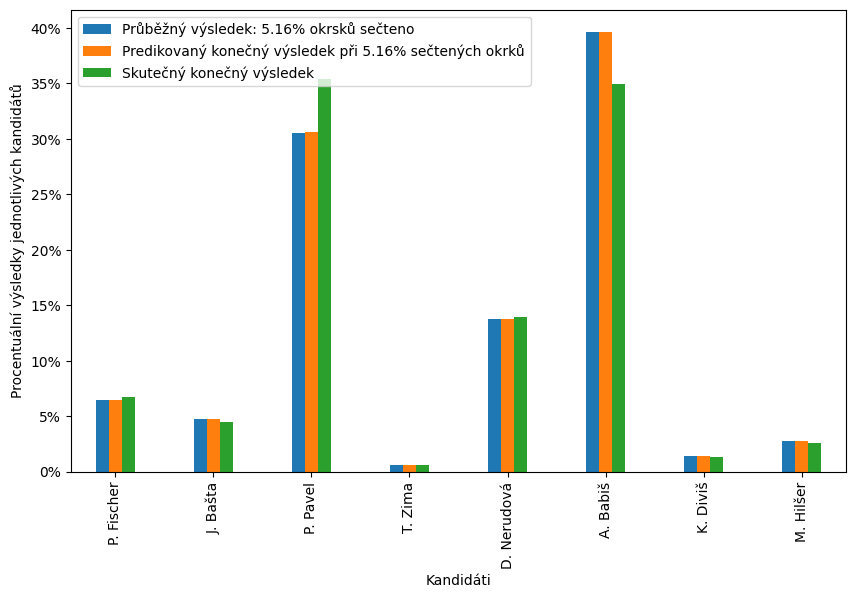

In [ ]:
from matplotlib.ticker import FuncFormatter


def percentage(x, pos):
    return '{:.0%}'.format(x)

ax = vysledky.plot(kind='bar', figsize=(10, 6), width=0.4)

plt.xlabel('Kandidáti')
plt.ylabel('Procentuální výsledky jednotlivých kandidátů')

formatter = FuncFormatter(percentage)
ax.yaxis.set_major_formatter(formatter)

plt.legend(loc='upper left')

plt.show()

In [ ]:
### POZOR, BEZI 2 MINUTY
from fancyimpute import SoftImpute, KNN


mse_list = []
rmse_list = []
hlasy_cols = [col for col in prez_2023_1_original_data_proc.columns if col.startswith('HLASY_')]
hlasy_predikce_dict = {col: [] for col in hlasy_cols}


for i in range(1, prez_2023_1_original_data_proc['davka'].max()):

  prez_2023_1_dopl_matic_prubezne_vysl = prez_2023_1_dopl_matic_df[prez_2023_1_dopl_matic_df['davka'] <= i]
  prez_2023_1_dopl_matic_bez_davky = prez_2023_1_dopl_matic_prubezne_vysl.drop(columns = ['davka'], axis = 1)

  prez_2018_1_dopl_matic_df = prez_2018_1_original_data.drop(columns = ['ZAPSANI_VOLICI', 'VYDANE_OBALKY', 'ODEVZDANE_OBALKY' ,'PLATNE_HLASY', 'davka'], axis = 1)
  prez_2018_1_dopl_matic_df = prez_2018_1_dopl_matic_df.fillna(0)

  prez_2018_2_dopl_matic_df = prez_2018_2_original_data.drop(columns = ['ZAPSANI_VOLICI', 'VYDANE_OBALKY', 'ODEVZDANE_OBALKY' ,'PLATNE_HLASY', 'davka'], axis = 1)
  prez_2018_2_dopl_matic_df = prez_2018_2_dopl_matic_df.fillna(0)

  df_2018_merged = prez_2018_1_dopl_matic_df.merge(prez_2018_2_dopl_matic_df, how = 'left', on = ['CIS_OBEC', 'CIS_OKRSEK'])

  df_na_values = df_2018_merged.merge(prez_2023_1_dopl_matic_bez_davky, how = 'left', on = ['CIS_OBEC', 'CIS_OKRSEK'], suffixes = ('_2018', '_2023'))
  df_na_values.set_index(['CIS_OBEC', 'CIS_OKRSEK'], inplace=True)


  df_soft_impute = df_na_values.copy()
  df_soft_impute = df_soft_impute.replace({pd.NA: np.nan})
  vote_columns = df_soft_impute.columns
  vote_matrix = df_soft_impute[vote_columns].to_numpy()

  scaler = StandardScaler()
  vote_matrix_standardized = scaler.fit_transform(vote_matrix)
  imputed_matrix_standardized = SoftImpute().fit_transform(vote_matrix_standardized)
  imputed_matrix = scaler.inverse_transform(imputed_matrix_standardized)

  df_soft_impute[vote_columns] = imputed_matrix
  df_soft_imputed = df_soft_impute.iloc[:, -8:]
  sorted_columns = sorted(df_soft_imputed.columns)
  df_soft_imputed = df_soft_imputed[sorted_columns]

  total_votes_per_party = df_soft_imputed.sum()
  total_votes = total_votes_per_party.sum()
  final_predictions_soft_impute = (total_votes_per_party / total_votes)
  final_predictions_soft_impute = pd.DataFrame(final_predictions_soft_impute).T
  final_predictions_soft_impute.columns = hlasy_cols

  for col in hlasy_predikce_dict:
    hlasy_predikce_dict[col].append(final_predictions_soft_impute[col].values[0])

  mse = mean_squared_error(final_predictions_soft_impute, final_result_prez_2023_1)
  mse_list.append(mse)
  rmse = sqrt(mse)
  rmse_list.append(rmse)

[SoftImpute] Max Singular Value of X_init = 332.992432
[SoftImpute] Iter 1: observed MAE=0.036499 rank=11
[SoftImpute] Iter 2: observed MAE=0.036499 rank=11
[SoftImpute] Iter 3: observed MAE=0.036499 rank=11
[SoftImpute] Iter 4: observed MAE=0.036499 rank=11
[SoftImpute] Iter 5: observed MAE=0.036499 rank=11
[SoftImpute] Iter 6: observed MAE=0.036499 rank=11
[SoftImpute] Iter 7: observed MAE=0.036499 rank=11
[SoftImpute] Iter 8: observed MAE=0.036499 rank=11
[SoftImpute] Iter 9: observed MAE=0.036499 rank=11
[SoftImpute] Iter 10: observed MAE=0.036499 rank=11
[SoftImpute] Iter 11: observed MAE=0.036499 rank=11
[SoftImpute] Iter 12: observed MAE=0.036499 rank=11
[SoftImpute] Iter 13: observed MAE=0.036499 rank=11
[SoftImpute] Iter 14: observed MAE=0.036499 rank=11
[SoftImpute] Iter 15: observed MAE=0.036499 rank=11
[SoftImpute] Iter 16: observed MAE=0.036499 rank=11
[SoftImpute] Iter 17: observed MAE=0.036499 rank=11
[SoftImpute] Iter 18: observed MAE=0.036498 rank=11
[SoftImpute] Iter 

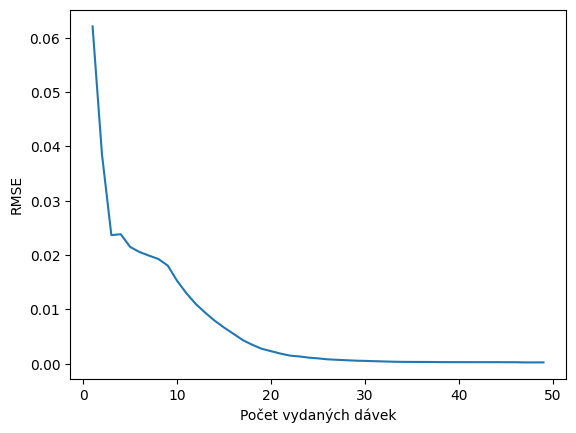

In [ ]:
x = range(1, 1 + len(rmse_list))
plt.plot(x, rmse_list)
plt.xlabel('Počet vydaných dávek')
plt.ylabel('RMSE')
plt.show()

In [ ]:
na_values_back = pd.Series([np.nan])
rmse_list_ser = pd.Series(rmse_list)
rmse_list_ser = pd.concat([rmse_list_ser, na_values_back], ignore_index=True)

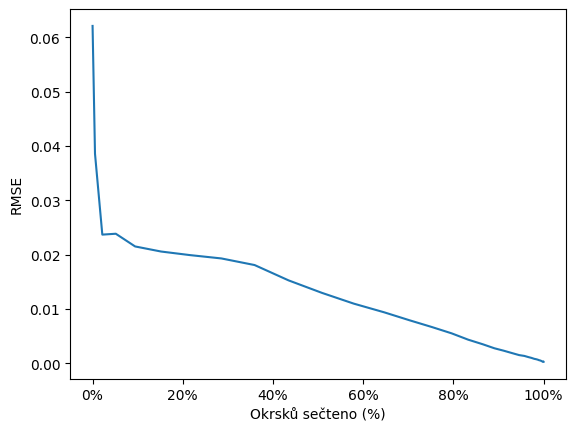

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter


def percentage(x, pos):
    return '{:.0%}'.format(x)

plt.plot(prez_2023_1_original_data_proc['okrsku_secteno'], rmse_list_ser)

plt.xlabel('Okrsků sečteno (%)')
plt.ylabel('RMSE')

formatter = FuncFormatter(percentage)
plt.gca().xaxis.set_major_formatter(formatter)

plt.show()

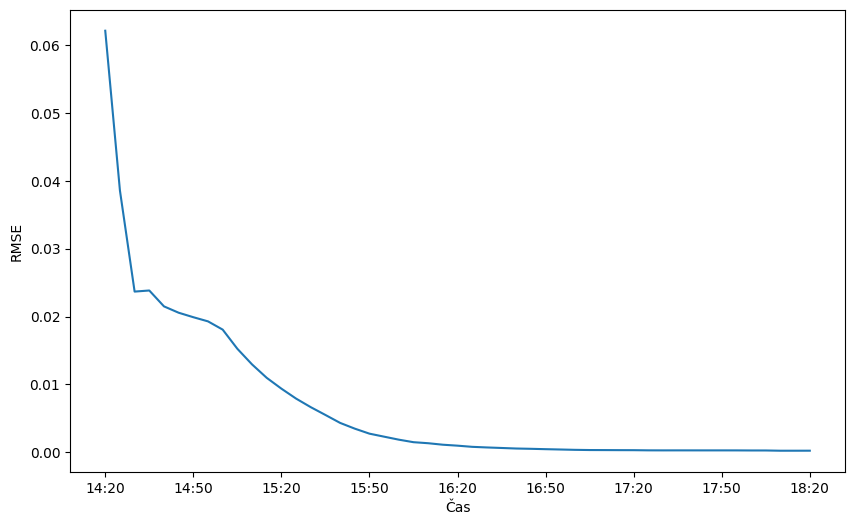

In [ ]:
n_points = len(rmse_list)

start_time = pd.Timestamp('2023-10-10 14:20')
time_labels = [(start_time + pd.Timedelta(minutes=5 * i)).strftime('%H:%M') for i in range(n_points)]

plt.figure(figsize=(10, 6))
plt.plot(range(1, n_points + 1), rmse_list)

plt.xticks(ticks=range(1, n_points + 1, 6), labels=time_labels[::6])  # Popisky každých 30 minut

plt.xlabel('Čas')
plt.ylabel('RMSE')

plt.show()

In [ ]:
prejmenovani_klicu_slovniku = {
    'HLASY_1': 'P. Fischer',
    'HLASY_2': 'J. Bašta',
    'HLASY_4': 'P. Pavel',
    'HLASY_5': 'T. Zima',
    'HLASY_6': 'D. Nerudová',
    'HLASY_7': 'A. Babiš',
    'HLASY_8': 'K. Diviš',
    'HLASY_9': 'M. Hilšer'
}

predikce_prejmenovany_dict = {prejmenovani_klicu_slovniku.get(k, k): v for k, v in hlasy_predikce_dict.items()}

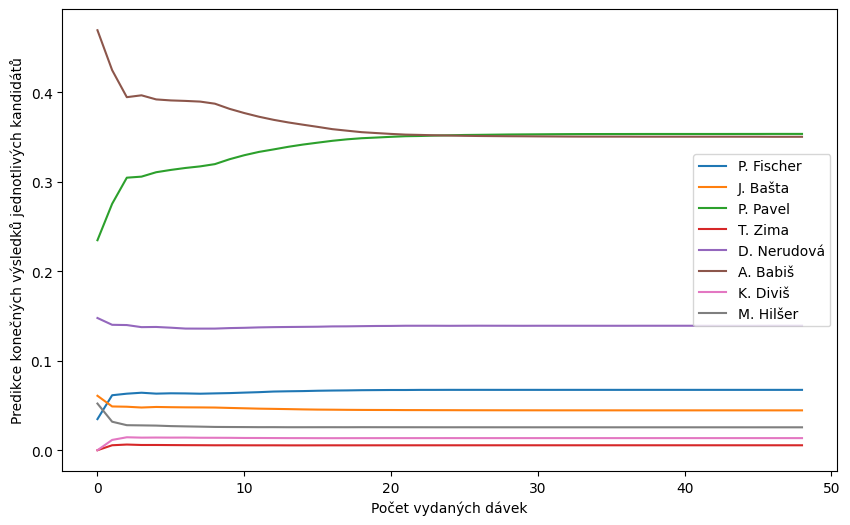

In [ ]:
plt.figure(figsize=(10, 6))

for key, values in predikce_prejmenovany_dict.items():
    plt.plot(values, label=key)

plt.xlabel('Počet vydaných dávek')
plt.ylabel('Predikce konečných výsledků jednotlivých kandidátů')

plt.legend()

plt.show()

In [ ]:
import pandas as pd
import numpy as np


modified_predikce_dict = {}

for key, values in predikce_prejmenovany_dict.items():

    modified_values = pd.concat([pd.Series(values), pd.Series([np.nan])]).reset_index(drop=True)
    modified_predikce_dict[key] = modified_values


for key, values in modified_predikce_dict.items():
    print(f"{key}: {values.tolist()}")

P. Fischer: [0.03478260872165098, 0.061472130628247156, 0.06321062790512046, 0.06427608131241272, 0.0632639172609969, 0.06364077492713019, 0.06350402979072152, 0.06318289252057929, 0.06354610372408445, 0.06386423865976142, 0.06440854475854574, 0.06490786708410119, 0.06560539875779742, 0.06589744941158664, 0.06611565103676034, 0.0664935932776174, 0.06672319881042604, 0.06687550444417684, 0.06711161667615605, 0.06722247099618521, 0.06733073451513574, 0.06733219883342416, 0.06745479999954664, 0.06745936043409845, 0.06749700287213728, 0.06748516845129322, 0.06749948771630582, 0.06748633260227789, 0.06747758930473538, 0.06748718033534896, 0.0674816421759814, 0.06747661142380008, 0.06748829891756666, 0.06748941967231169, 0.06748771399232881, 0.06748335946663363, 0.06748244157034772, 0.0674908022892474, 0.0674901185427856, 0.06748769850156931, 0.06748472805101755, 0.06748544988451496, 0.06748260275257406, 0.06747836345338021, 0.06747865359527426, 0.06747913284887727, 0.06747734092428762, 0.06

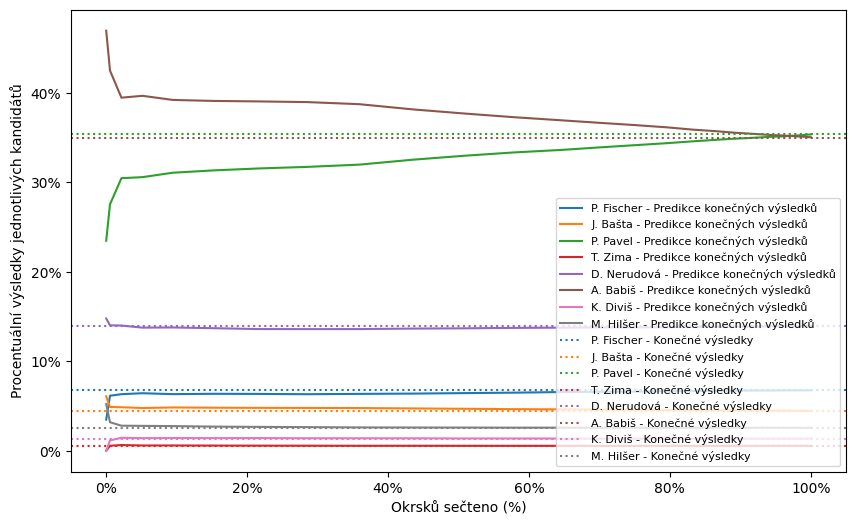

In [ ]:
from matplotlib.ticker import FuncFormatter
import matplotlib.pyplot as plt


prubeh = prez_2023_1_original_data_proc[['HLASY_1', 'HLASY_2', 'HLASY_4', 'HLASY_5', 'HLASY_6', 'HLASY_7', 'HLASY_8', 'HLASY_9']].copy()
konecne_vysledky = prubeh.iloc[-1]

def percentage(x, pos):
    return '{:.0%}'.format(x)

plt.figure(figsize=(10, 6))

for key, values in modified_predikce_dict.items():
    plt.plot(prez_2023_1_original_data_proc['okrsku_secteno'], values, label=key + ' - Predikce konečných výsledků')

plt.xlabel('Okrsků sečteno (%)')
plt.ylabel('Procentuální výsledky jednotlivých kandidátů')

plt.axhline(y=konecne_vysledky['HLASY_1'], label="P. Fischer - Konečné výsledky", color='#1f77b4', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_2'], label="J. Bašta - Konečné výsledky", color='#ff7f0e', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_4'], label="P. Pavel - Konečné výsledky", color='#2ca02c', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_5'], label="T. Zima - Konečné výsledky", color='#d6272B', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_6'], label="D. Nerudová - Konečné výsledky", color='#9467bd', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_7'], label="A. Babiš - Konečné výsledky", color='#8c564b', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_8'], label="K. Diviš - Konečné výsledky", color='#e377c2', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_9'], label="M. Hilšer - Konečné výsledky", color='#7f7f7f', linestyle='dotted')

ax = plt.gca()

formatter = FuncFormatter(percentage)
ax.yaxis.set_major_formatter(formatter)
ax.xaxis.set_major_formatter(formatter)

plt.legend(loc='lower right', fontsize=8)

plt.show()

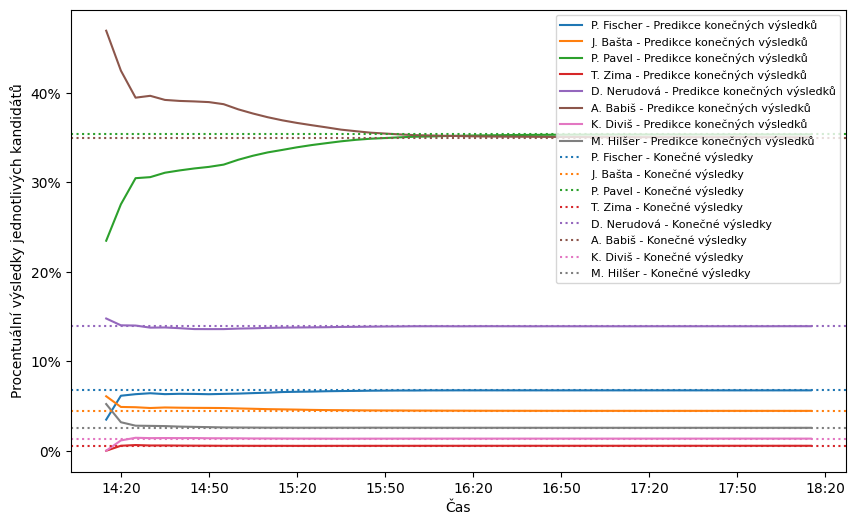

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.ticker import FuncFormatter

prubeh = prez_2023_1_original_data_proc[['HLASY_1', 'HLASY_2', 'HLASY_4', 'HLASY_5', 'HLASY_6', 'HLASY_7', 'HLASY_8', 'HLASY_9']].copy()
konecne_vysledky = prubeh.iloc[-1]

def percentage(x, pos):
    return '{:.0%}'.format(x)

n_points = len(next(iter(modified_predikce_dict.values())))

start_time = pd.Timestamp('2023-01-14 14:20')
time_labels = [(start_time + pd.Timedelta(minutes=5 * i)).strftime('%H:%M') for i in range(n_points)]

plt.figure(figsize=(10, 6))

for key, values in modified_predikce_dict.items():
    plt.plot(values, label=key + ' - Predikce konečných výsledků')

plt.axhline(y=konecne_vysledky['HLASY_1'], label="P. Fischer - Konečné výsledky", color='#1f77b4', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_2'], label="J. Bašta - Konečné výsledky", color='#ff7f0e', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_4'], label="P. Pavel - Konečné výsledky", color='#2ca02c', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_5'], label="T. Zima - Konečné výsledky", color='#d6272B', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_6'], label="D. Nerudová - Konečné výsledky", color='#9467bd', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_7'], label="A. Babiš - Konečné výsledky", color='#8c564b', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_8'], label="K. Diviš - Konečné výsledky", color='#e377c2', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_9'], label="M. Hilšer - Konečné výsledky", color='#7f7f7f', linestyle='dotted')

plt.xlabel('Čas')
plt.ylabel('Procentuální výsledky jednotlivých kandidátů')

ax = plt.gca()

formatter = FuncFormatter(percentage)
ax.yaxis.set_major_formatter(formatter)

plt.xticks(ticks=range(1, n_points + 1, 6), labels=time_labels[::6])

plt.legend(loc='upper right', fontsize=8)

plt.show()

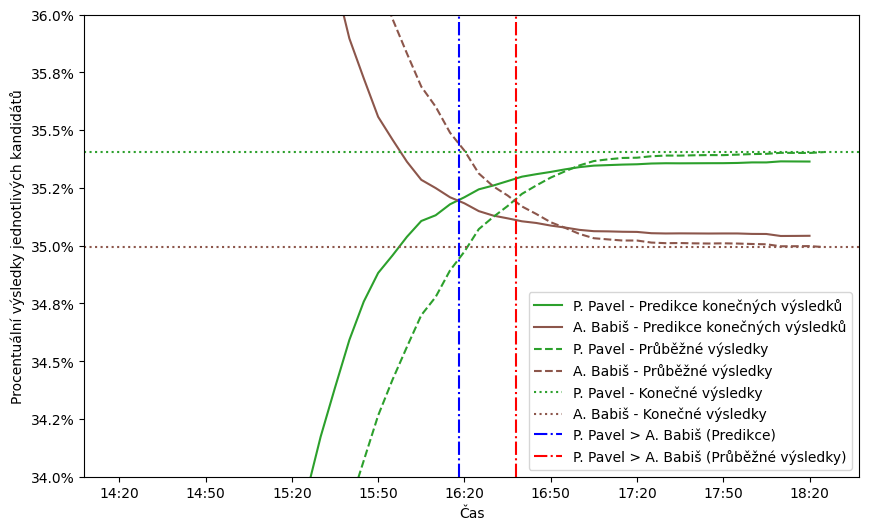

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter


prubeh = prez_2023_1_original_data_proc[['HLASY_1', 'HLASY_2', 'HLASY_4', 'HLASY_5', 'HLASY_6', 'HLASY_7', 'HLASY_8', 'HLASY_9']].copy()
konecne_vysledky = prubeh.iloc[-1]

n_points = len(next(iter(modified_predikce_dict.values())))

start_time = pd.Timestamp('2023-01-14 14:20')
time_labels = [(start_time + pd.Timedelta(minutes=5 * i)).strftime('%H:%M') for i in range(n_points)]

prubeh = prez_2023_1_original_data_proc[['HLASY_4', 'HLASY_7']].copy()
prubeh['P. Pavel'] = modified_predikce_dict['P. Pavel']
prubeh['A. Babiš'] = modified_predikce_dict['A. Babiš']

prubeh.columns = ["P. Pavel - sečtené", "A. Babiš - sečtené", "P. Pavel - predikce", "A. Babiš - predikce"]

index_pred_over = (prubeh['P. Pavel - predikce'] > prubeh['A. Babiš - predikce']).idxmax()
index_real_over = (prubeh['P. Pavel - sečtené'] > prubeh['A. Babiš - sečtené']).idxmax()

plt.figure(figsize=(10, 6))

pavel_color = '#2ca02c'
babis_color = '#8c564b'

plt.plot(prubeh['P. Pavel - predikce'], '-', label="P. Pavel - Predikce konečných výsledků", color=pavel_color)
plt.plot(prubeh['A. Babiš - predikce'], '-', label="A. Babiš - Predikce konečných výsledků", color=babis_color)

plt.plot(prubeh['P. Pavel - sečtené'], '--', label="P. Pavel - Průběžné výsledky", color=pavel_color)
plt.plot(prubeh['A. Babiš - sečtené'], '--', label="A. Babiš - Průběžné výsledky", color=babis_color)

plt.axhline(y=konecne_vysledky['HLASY_4'], label="P. Pavel - Konečné výsledky", color='#2ca02c', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_7'], label="A. Babiš - Konečné výsledky", color='#8c564b', linestyle='dotted')

plt.axvline(x=index_pred_over - 0.4, color='blue', linestyle='dashdot', label="P. Pavel > A. Babiš (Predikce)")
plt.axvline(x=index_real_over - 0.4, color='red', linestyle='dashdot', label="P. Pavel > A. Babiš (Průběžné výsledky)")

plt.xlabel('Čas')
plt.ylabel('Procentuální výsledky jednotlivých kandidátů')

plt.xticks(ticks=range(0, n_points, 6), labels=time_labels[::6])

formatter = FuncFormatter(lambda y, _: f'{y:.1%}')
plt.gca().yaxis.set_major_formatter(formatter)

plt.legend()

plt.ylim(0.34, 0.36)

plt.show()

In [ ]:
avg_rmse_soft_imp_1 = sum(rmse_list) / len(rmse_list)
print(f"Průměrný RMSE pro model Soft-impute a 1. kolo prezidentských voleb v roce 2023 je {avg_rmse_soft_imp_1}.")

Průměrný RMSE pro model Soft-impute a 1. kolo prezidentských voleb v roce 2023 je 0.007029256215912828.


In [ ]:
rmse_list_SOFTIMP_1 = rmse_list
rmse_df = pd.DataFrame(rmse_list_SOFTIMP_1)
rmse_df.rename(columns = {0: 'SoftImpute'}, inplace = True)
rmse_df.to_csv('rmse_SOFTIMP_1.csv', index = False)

### KNN - prezidentske 2023 - 1.kolo - predikce

In [ ]:
from sklearn.preprocessing import StandardScaler
import numpy as np
from fancyimpute import KNN

prez_2018_1_original_data = pd.read_csv('prez_2018_1_abs.csv')
prez_2018_2_original_data = pd.read_csv('prez_2018_2_abs.csv')
prez_2023_1_original_data = pd.read_csv('prez_2023_1_abs.csv')
prez_2023_1_original_data_proc = pd.read_csv('prez_2023_1_proc.csv')

prez_2023_1_dopl_matic_df = prez_2023_1_original_data.drop(columns=['ZAPSANI_VOLICI', 'VYDANE_OBALKY', 'ODEVZDANE_OBALKY', 'PLATNE_HLASY'], axis=1)
prez_2023_1_dopl_matic_df = prez_2023_1_dopl_matic_df.fillna(0)
pocet_davek = 4
prez_2023_1_dopl_matic_prubezne_vysl = prez_2023_1_dopl_matic_df[prez_2023_1_dopl_matic_df['davka'] <= pocet_davek]
prez_2023_1_dopl_matic_bez_davky = prez_2023_1_dopl_matic_prubezne_vysl.drop(columns=['davka'], axis=1)

prez_2018_1_dopl_matic_df = prez_2018_1_original_data.drop(columns=['ZAPSANI_VOLICI', 'VYDANE_OBALKY', 'ODEVZDANE_OBALKY', 'PLATNE_HLASY', 'davka'], axis=1)
prez_2018_1_dopl_matic_df = prez_2018_1_dopl_matic_df.fillna(0)

prez_2018_2_dopl_matic_df = prez_2018_2_original_data.drop(columns=['ZAPSANI_VOLICI', 'VYDANE_OBALKY', 'ODEVZDANE_OBALKY', 'PLATNE_HLASY', 'davka'], axis=1)
prez_2018_2_dopl_matic_df = prez_2018_2_dopl_matic_df.fillna(0)

df_2018_merged = prez_2018_1_dopl_matic_df.merge(prez_2018_2_dopl_matic_df, how='left', on=['CIS_OBEC', 'CIS_OKRSEK'])
df_na_values = df_2018_merged.merge(prez_2023_1_dopl_matic_bez_davky, how='left', on=['CIS_OBEC', 'CIS_OKRSEK'], suffixes=('_2018', '_2023'))
df_na_values.set_index(['CIS_OBEC', 'CIS_OKRSEK'], inplace=True)

df_knn = df_na_values.replace({pd.NA: np.nan})
vote_columns = df_knn.columns
vote_matrix = df_knn[vote_columns].to_numpy()


scaler = StandardScaler()
vote_matrix_standardized = scaler.fit_transform(vote_matrix)
imputed_matrix_standardized = KNN(k=2).fit_transform(vote_matrix_standardized)
imputed_matrix = scaler.inverse_transform(imputed_matrix_standardized)

df_knn[vote_columns] = imputed_matrix
df_knn_imputed = df_knn.iloc[:, -8:]

Imputing row 1/14900 with 8 missing, elapsed time: 134.216
Imputing row 101/14900 with 8 missing, elapsed time: 134.265
Imputing row 201/14900 with 0 missing, elapsed time: 134.304
Imputing row 301/14900 with 8 missing, elapsed time: 134.350
Imputing row 401/14900 with 8 missing, elapsed time: 134.409
Imputing row 501/14900 with 0 missing, elapsed time: 134.488
Imputing row 601/14900 with 8 missing, elapsed time: 134.561
Imputing row 701/14900 with 8 missing, elapsed time: 134.621
Imputing row 801/14900 with 8 missing, elapsed time: 134.750
Imputing row 901/14900 with 0 missing, elapsed time: 134.834
Imputing row 1001/14900 with 8 missing, elapsed time: 134.969
Imputing row 1101/14900 with 0 missing, elapsed time: 135.071
Imputing row 1201/14900 with 8 missing, elapsed time: 135.226
Imputing row 1301/14900 with 8 missing, elapsed time: 135.385
Imputing row 1401/14900 with 8 missing, elapsed time: 135.528
Imputing row 1501/14900 with 0 missing, elapsed time: 135.674
Imputing row 1601/14

In [ ]:
sorted_columns = sorted(df_knn_imputed.columns)
df_knn_imputed = df_knn_imputed[sorted_columns]
df_knn_imputed.head()

,,HLASY_1_2023,HLASY_2_2023,HLASY_4_2023,HLASY_5_2023,HLASY_6_2023,HLASY_7,HLASY_8_2023,HLASY_9
CIS_OBEC,CIS_OKRSEK,,,,,,,,
566080,1,1.297391,3.892172,4.999999,-1.292417e-08,3.594781,13.513046,1.0,-6.138979e-08
573060,5,3.000000,2.000000,17.000000,0.000000e+00,10.000000,41.000000,0.0,1.000000e+00
547701,1,2.000000,3.000000,20.000000,0.000000e+00,5.000000,12.000000,1.0,-4.440892e-16
542059,1,0.000000,4.000000,13.000000,0.000000e+00,0.000000,10.000000,0.0,1.000000e+00
599034,1,11.000000,0.000000,11.000000,1.000000e+00,12.000000,20.000000,3.0,3.000000e+00


In [ ]:
total_votes_per_party = df_knn_imputed.sum()
total_votes = total_votes_per_party.sum()
final_predictions_knn_impute = (total_votes_per_party / total_votes)
final_predictions_knn_impute

,0
HLASY_1_2023,0.058251
HLASY_2_2023,0.042959
HLASY_4_2023,0.361556
HLASY_5_2023,0.007034
HLASY_6_2023,0.131821
HLASY_7,0.362569
HLASY_8_2023,0.012185
HLASY_9,0.023624


In [ ]:
final_predictions_knn_impute = pd.DataFrame(final_predictions_knn_impute).T
final_predictions_knn_impute

,HLASY_1_2023,HLASY_2_2023,HLASY_4_2023,HLASY_5_2023,HLASY_6_2023,HLASY_7,HLASY_8_2023,HLASY_9
0,0.058251,0.042959,0.361556,0.007034,0.131821,0.362569,0.012185,0.023624


In [ ]:
prez_2023_1_original_data_proc = pd.read_csv('prez_2023_1_proc.csv')
max_davka = prez_2023_1_original_data_proc['davka'].max()
prez_2023_1_proc_last_row = prez_2023_1_original_data_proc[prez_2023_1_original_data_proc['davka'] == max_davka]
final_result_prez_2023_1 = prez_2023_1_proc_last_row.drop(columns = ['davka', 'okrsku_secteno', 'volebni_ucast'], axis = 1)
final_result_prez_2023_1

,HLASY_1,HLASY_2,HLASY_4,HLASY_5,HLASY_6,HLASY_7,HLASY_8,HLASY_9
49,0.067526,0.044522,0.354054,0.005515,0.139294,0.349941,0.013529,0.025617


In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

mse = mean_squared_error(final_predictions_knn_impute, final_result_prez_2023_1)
rmse = sqrt(mse)
print(rmse)

0.006783727315017336


In [ ]:
column_mapping = {
    'HLASY_1_2023': 'HLASY_1',
    'HLASY_2_2023': 'HLASY_2',
    'HLASY_4_2023': 'HLASY_4',
    'HLASY_5_2023': 'HLASY_5',
    'HLASY_6_2023': 'HLASY_6',
    'HLASY_7': 'HLASY_7',
    'HLASY_8_2023': 'HLASY_8',
    'HLASY_9': 'HLASY_9'
}

final_predictions_knn_impute.rename(columns=column_mapping, inplace=True)
final_predictions_knn_impute

,HLASY_1,HLASY_2,HLASY_4,HLASY_5,HLASY_6,HLASY_7,HLASY_8,HLASY_9
0,0.058251,0.042959,0.361556,0.007034,0.131821,0.362569,0.012185,0.023624


In [ ]:
prez_2023_1_train_last_row = pd.DataFrame(prez_2023_1_original_data_proc[prez_2023_1_original_data_proc['davka'] <= pocet_davek].iloc[-1]).T
procent_secteno = prez_2023_1_train_last_row['okrsku_secteno'].values[0]
prez_2023_1_train_last_row.drop(['davka', 'okrsku_secteno', 'volebni_ucast'], axis = 1, inplace = True)
prez_2023_1_train_last_row.head()

,HLASY_1,HLASY_2,HLASY_4,HLASY_5,HLASY_6,HLASY_7,HLASY_8,HLASY_9
3,0.064309,0.04776,0.305747,0.005854,0.137675,0.396788,0.014098,0.02777


In [ ]:
vysledky = pd.concat([prez_2023_1_train_last_row, final_predictions_knn_impute, final_result_prez_2023_1])
vysledky = vysledky.T
vysledky.index = ['P. Fischer', 'J. Bašta', 'P. Pavel', 'T. Zima', 'D. Nerudová', 'A. Babiš', 'K. Diviš', 'M. Hilšer']
popisek_prubeh = "Průběžný výsledek: " + str(round(procent_secteno * 100, 2)) + "% okrsků sečteno"
popisek_predikce = "Predikovaný konečný výsledek při " + str(round(procent_secteno * 100, 2)) + "% sečtených okrků"
vysledky.columns = [popisek_prubeh, popisek_predikce, 'Skutečný konečný výsledek']
vysledky

,Průběžný výsledek: 5.16% okrsků sečteno,Predikovaný konečný výsledek při 5.16% sečtených okrků,Skutečný konečný výsledek
P. Fischer,0.064309,0.058251,0.067526
J. Bašta,0.047760,0.042959,0.044522
P. Pavel,0.305747,0.361556,0.354054
T. Zima,0.005854,0.007034,0.005515
D. Nerudová,0.137675,0.131821,0.139294
A. Babiš,0.396788,0.362569,0.349941
K. Diviš,0.014098,0.012185,0.013529
M. Hilšer,0.027770,0.023624,0.025617


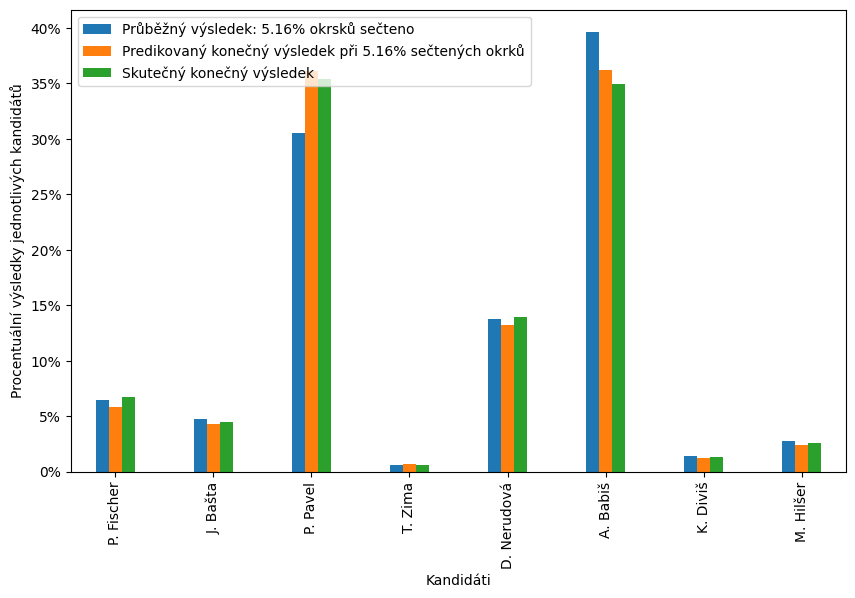

In [ ]:
from matplotlib.ticker import FuncFormatter


def percentage(x, pos):
    return '{:.0%}'.format(x)


ax = vysledky.plot(kind='bar', figsize=(10, 6), width=0.4)

plt.xlabel('Kandidáti')
plt.ylabel('Procentuální výsledky jednotlivých kandidátů')

formatter = FuncFormatter(percentage)
ax.yaxis.set_major_formatter(formatter)

plt.legend(loc='upper left')

plt.show()

In [ ]:
# POZOR, BEZI 43 MINUT
from fancyimpute import SoftImpute, KNN, NuclearNormMinimization, BiScaler

mse_list = []
rmse_list = []
hlasy_cols = [col for col in prez_2023_1_original_data_proc.columns if col.startswith('HLASY_')]
hlasy_predikce_dict = {col: [] for col in hlasy_cols}

prez_2023_1_proc = pd.read_csv('prez_2023_1_proc.csv')
prez_2023_1_proc_last_row = prez_2023_1_proc[prez_2023_1_proc['davka'] == 50]
final_result_prez_2023_1 = prez_2023_1_proc_last_row.drop(columns = ['davka', 'okrsku_secteno', 'volebni_ucast'], axis = 1)


for i in range(1, prez_2023_1_original_data_proc['davka'].max()):

  prez_2023_1_dopl_matic_prubezne_vysl = prez_2023_1_dopl_matic_df[prez_2023_1_dopl_matic_df['davka'] <= i]
  prez_2023_1_dopl_matic_bez_davky = prez_2023_1_dopl_matic_prubezne_vysl.drop(columns = ['davka'], axis = 1)
  prez_2018_1_dopl_matic_df = prez_2018_1_original_data.drop(columns = ['ZAPSANI_VOLICI', 'VYDANE_OBALKY', 'ODEVZDANE_OBALKY' ,'PLATNE_HLASY', 'davka'], axis = 1)
  prez_2018_1_dopl_matic_df = prez_2018_1_dopl_matic_df.fillna(0)

  prez_2018_2_dopl_matic_df = prez_2018_2_original_data.drop(columns = ['ZAPSANI_VOLICI', 'VYDANE_OBALKY', 'ODEVZDANE_OBALKY' ,'PLATNE_HLASY', 'davka'], axis = 1)
  prez_2018_2_dopl_matic_df = prez_2018_2_dopl_matic_df.fillna(0)

  df_2018_merged = prez_2018_1_dopl_matic_df.merge(prez_2018_2_dopl_matic_df, how = 'left', on = ['CIS_OBEC', 'CIS_OKRSEK'])

  df_na_values = df_2018_merged.merge(prez_2023_1_dopl_matic_bez_davky, how = 'left', on = ['CIS_OBEC', 'CIS_OKRSEK'], suffixes = ('_2018', '_2023'))
  df_na_values.set_index(['CIS_OBEC', 'CIS_OKRSEK'], inplace=True)

  df_knn = df_na_values.copy()
  df_knn = df_knn.replace({pd.NA: np.nan})
  vote_columns = df_knn.columns
  vote_matrix = df_knn[vote_columns].to_numpy()


  scaler = StandardScaler()
  vote_matrix_standardized = scaler.fit_transform(vote_matrix)
  imputed_matrix_standardized = KNN(k=2).fit_transform(vote_matrix_standardized)
  imputed_matrix = scaler.inverse_transform(imputed_matrix_standardized)

  df_knn[vote_columns] = imputed_matrix
  df_knn_imputed = df_knn.iloc[:, -8:]
  sorted_columns = sorted(df_knn_imputed.columns)
  df_knn_imputed = df_knn_imputed[sorted_columns]

  total_votes_per_party = df_knn_imputed.sum()
  total_votes = total_votes_per_party.sum()
  final_predictions_knn_impute = (total_votes_per_party / total_votes)
  final_predictions_knn_impute = pd.DataFrame(final_predictions_knn_impute).T
  final_predictions_knn_impute.columns = hlasy_cols

  for col in hlasy_predikce_dict:
    hlasy_predikce_dict[col].append(final_predictions_knn_impute[col].values[0])

  mse = mean_squared_error(final_predictions_knn_impute, final_result_prez_2023_1)
  mse_list.append(mse)
  rmse = sqrt(mse)
  rmse_list.append(rmse)

Výstupní stream byl oříznut na posledních 5000 řádků.
Imputing row 9901/14900 with 0 missing, elapsed time: 86.165
Imputing row 10001/14900 with 8 missing, elapsed time: 86.203
Imputing row 10101/14900 with 0 missing, elapsed time: 86.243
Imputing row 10201/14900 with 0 missing, elapsed time: 86.281
Imputing row 10301/14900 with 0 missing, elapsed time: 86.317
Imputing row 10401/14900 with 0 missing, elapsed time: 86.349
Imputing row 10501/14900 with 8 missing, elapsed time: 86.379
Imputing row 10601/14900 with 0 missing, elapsed time: 86.417
Imputing row 10701/14900 with 8 missing, elapsed time: 86.458
Imputing row 10801/14900 with 0 missing, elapsed time: 86.511
Imputing row 10901/14900 with 0 missing, elapsed time: 86.561
Imputing row 11001/14900 with 0 missing, elapsed time: 86.622
Imputing row 11101/14900 with 0 missing, elapsed time: 86.660
Imputing row 11201/14900 with 0 missing, elapsed time: 86.698
Imputing row 11301/14900 with 8 missing, elapsed time: 86.751
Imputing row 1140

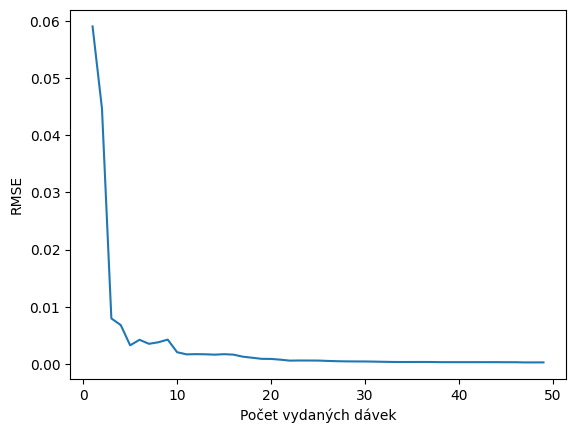

In [ ]:
x = range(1, 1 + len(rmse_list))
plt.plot(x, rmse_list)
plt.xlabel('Počet vydaných dávek')
plt.ylabel('RMSE')
plt.show()

In [ ]:
na_values_back = pd.Series([np.nan])
rmse_list_ser = pd.Series(rmse_list)
rmse_list_ser = pd.concat([rmse_list_ser, na_values_back], ignore_index=True)

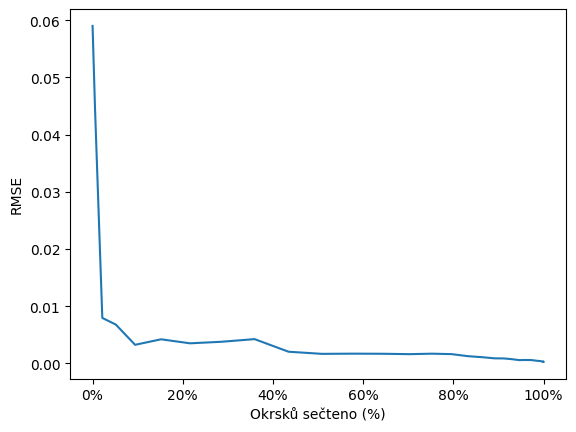

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter


def percentage(x, pos):
    return '{:.0%}'.format(x)

plt.plot(prez_2023_1_original_data_proc['okrsku_secteno'], rmse_list_ser)

plt.xlabel('Okrsků sečteno (%)')
plt.ylabel('RMSE')

formatter = FuncFormatter(percentage)
plt.gca().xaxis.set_major_formatter(formatter)

plt.show()

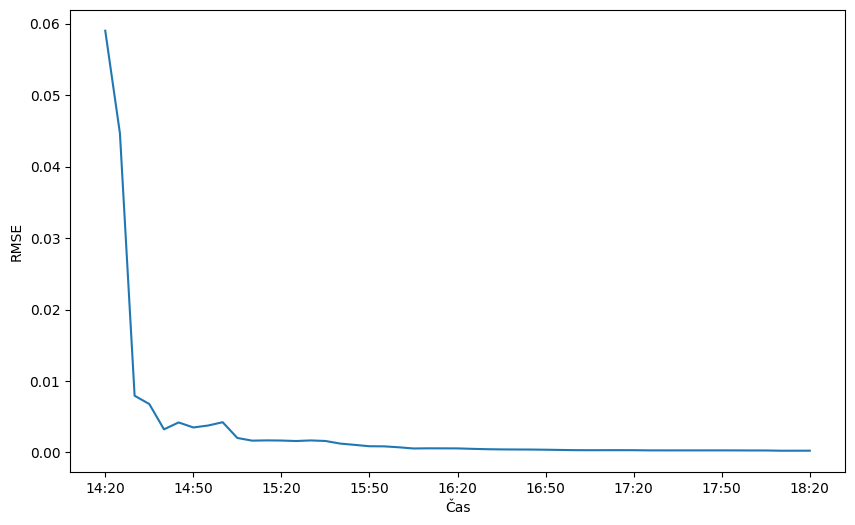

In [ ]:
n_points = len(rmse_list)

start_time = pd.Timestamp('2023-10-10 14:20')
time_labels = [(start_time + pd.Timedelta(minutes=5 * i)).strftime('%H:%M') for i in range(n_points)]

plt.figure(figsize=(10, 6))
plt.plot(range(1, n_points + 1), rmse_list)

plt.xticks(ticks=range(1, n_points + 1, 6), labels=time_labels[::6])  # Popisky každých 30 minut

plt.xlabel('Čas')
plt.ylabel('RMSE')

plt.show()

In [ ]:
prejmenovani_klicu_slovniku = {
    'HLASY_1': 'P. Fischer',
    'HLASY_2': 'J. Bašta',
    'HLASY_4': 'P. Pavel',
    'HLASY_5': 'T. Zima',
    'HLASY_6': 'D. Nerudová',
    'HLASY_7': 'A. Babiš',
    'HLASY_8': 'K. Diviš',
    'HLASY_9': 'M. Hilšer'
}

predikce_prejmenovany_dict = {prejmenovani_klicu_slovniku.get(k, k): v for k, v in hlasy_predikce_dict.items()}

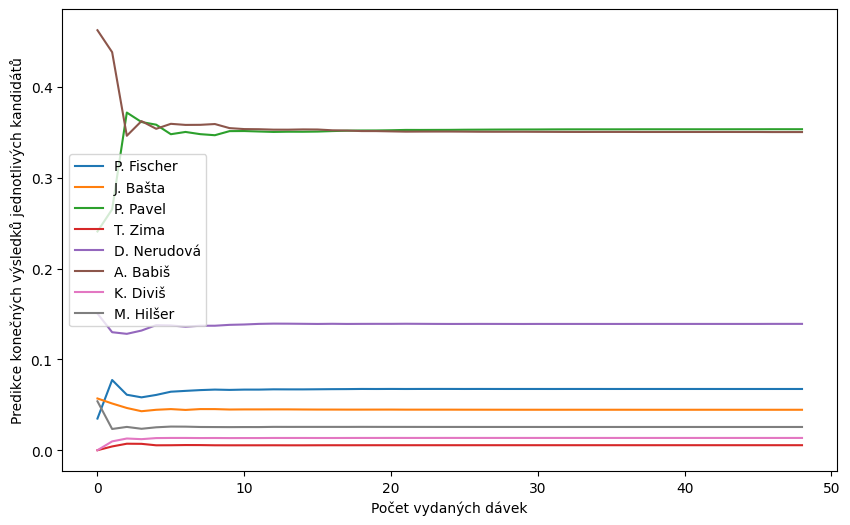

In [ ]:
plt.figure(figsize=(10, 6))

for key, values in predikce_prejmenovany_dict.items():
    plt.plot(values, label=key)

plt.xlabel('Počet vydaných dávek')
plt.ylabel('Predikce konečných výsledků jednotlivých kandidátů')

plt.legend()

plt.show()

In [ ]:
modified_predikce_dict = {}

for key, values in predikce_prejmenovany_dict.items():

    modified_values = pd.concat([pd.Series(values), pd.Series([np.nan])]).reset_index(drop=True)
    modified_predikce_dict[key] = modified_values

for key, values in modified_predikce_dict.items():
    print(f"{key}: {values.tolist()}")


P. Fischer: [0.03486616164169928, 0.07735839879415438, 0.06112703200352123, 0.05825145848521599, 0.060907901394549414, 0.06445610200955505, 0.06537676944724759, 0.06623113557843736, 0.06679621458170958, 0.06645132305587267, 0.06678515147167675, 0.06677912969117987, 0.06708491536942406, 0.06702469381625246, 0.06701814882083523, 0.06714311257675953, 0.06727309200287183, 0.06733944163514147, 0.06749100142865111, 0.06744759033550687, 0.06751251827820395, 0.06745309921474338, 0.06749803273381431, 0.06751793932441377, 0.06751234797155496, 0.0674723019967599, 0.06749727583999335, 0.06748072542667262, 0.06746911083152161, 0.06747432692603653, 0.06747476945405063, 0.06746103898418551, 0.06747913328583315, 0.06748036730164163, 0.06747977219995886, 0.06746833891422278, 0.06747249419019682, 0.06747650739964364, 0.06747682263324982, 0.06747287223834998, 0.06746919410786505, 0.06746999538711818, 0.06746917836362458, 0.06746374522413753, 0.06746403186924477, 0.06746444071932257, 0.06746232519494853, 

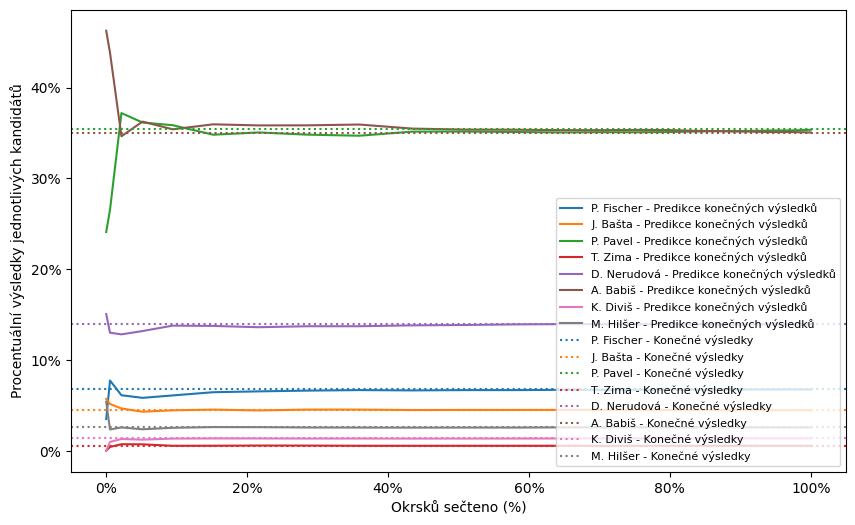

In [ ]:
from matplotlib.ticker import FuncFormatter
import matplotlib.pyplot as plt

prubeh = prez_2023_1_original_data_proc[['HLASY_1', 'HLASY_2', 'HLASY_4', 'HLASY_5', 'HLASY_6', 'HLASY_7', 'HLASY_8', 'HLASY_9']].copy()
konecne_vysledky = prubeh.iloc[-1]

def percentage(x, pos):
    return '{:.0%}'.format(x)

plt.figure(figsize=(10, 6))

for key, values in modified_predikce_dict.items():
    plt.plot(prez_2023_1_original_data_proc['okrsku_secteno'], values, label=key + ' - Predikce konečných výsledků')

plt.xlabel('Okrsků sečteno (%)')
plt.ylabel('Procentuální výsledky jednotlivých kandidátů')

plt.axhline(y=konecne_vysledky['HLASY_1'], label="P. Fischer - Konečné výsledky", color='#1f77b4', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_2'], label="J. Bašta - Konečné výsledky", color='#ff7f0e', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_4'], label="P. Pavel - Konečné výsledky", color='#2ca02c', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_5'], label="T. Zima - Konečné výsledky", color='#d6272B', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_6'], label="D. Nerudová - Konečné výsledky", color='#9467bd', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_7'], label="A. Babiš - Konečné výsledky", color='#8c564b', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_8'], label="K. Diviš - Konečné výsledky", color='#e377c2', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_9'], label="M. Hilšer - Konečné výsledky", color='#7f7f7f', linestyle='dotted')

plt.xlabel('Okrsků sečteno (%)')
plt.ylabel('Procentuální výsledky jednotlivých kandidátů')

ax = plt.gca()

formatter = FuncFormatter(percentage)
ax.yaxis.set_major_formatter(formatter)
ax.xaxis.set_major_formatter(formatter)

plt.legend(loc='lower right', fontsize=8)

plt.show()

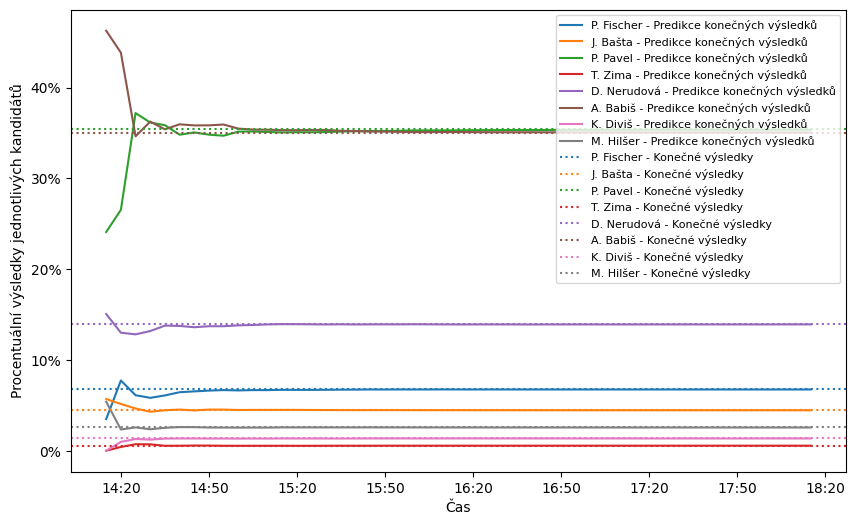

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.ticker import FuncFormatter

prubeh = prez_2023_1_original_data_proc[['HLASY_1', 'HLASY_2', 'HLASY_4', 'HLASY_5', 'HLASY_6', 'HLASY_7', 'HLASY_8', 'HLASY_9']].copy()
konecne_vysledky = prubeh.iloc[-1]

def percentage(x, pos):
    return '{:.0%}'.format(x)

n_points = len(next(iter(modified_predikce_dict.values())))

start_time = pd.Timestamp('2023-01-14 14:20')
time_labels = [(start_time + pd.Timedelta(minutes=5 * i)).strftime('%H:%M') for i in range(n_points)]

plt.figure(figsize=(10, 6))

for key, values in modified_predikce_dict.items():
    plt.plot(values, label=key + ' - Predikce konečných výsledků')

plt.xlabel('Čas')
plt.ylabel('Procentuální výsledky jednotlivých kandidátů')

plt.axhline(y=konecne_vysledky['HLASY_1'], label="P. Fischer - Konečné výsledky", color='#1f77b4', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_2'], label="J. Bašta - Konečné výsledky", color='#ff7f0e', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_4'], label="P. Pavel - Konečné výsledky", color='#2ca02c', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_5'], label="T. Zima - Konečné výsledky", color='#d6272B', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_6'], label="D. Nerudová - Konečné výsledky", color='#9467bd', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_7'], label="A. Babiš - Konečné výsledky", color='#8c564b', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_8'], label="K. Diviš - Konečné výsledky", color='#e377c2', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_9'], label="M. Hilšer - Konečné výsledky", color='#7f7f7f', linestyle='dotted')

ax = plt.gca()

formatter = FuncFormatter(percentage)
ax.yaxis.set_major_formatter(formatter)

plt.xticks(ticks=range(1, n_points + 1, 6), labels=time_labels[::6])

plt.legend(loc='upper right', fontsize=8)

plt.show()

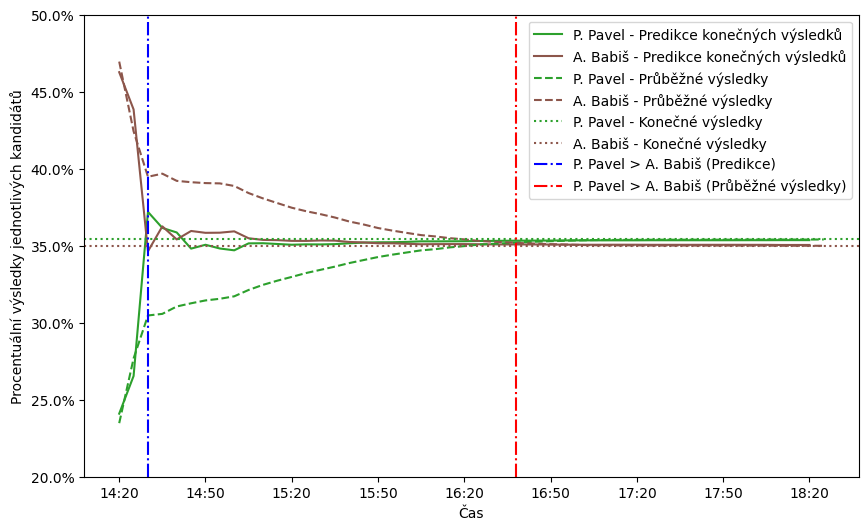

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

prubeh = prez_2023_1_original_data_proc[['HLASY_1', 'HLASY_2', 'HLASY_4', 'HLASY_5', 'HLASY_6', 'HLASY_7', 'HLASY_8', 'HLASY_9']].copy()
konecne_vysledky = prubeh.iloc[-1]

n_points = len(next(iter(modified_predikce_dict.values())))

start_time = pd.Timestamp('2023-01-14 14:20')
time_labels = [(start_time + pd.Timedelta(minutes=5 * i)).strftime('%H:%M') for i in range(n_points)]

prubeh = prez_2023_1_original_data_proc[['HLASY_4', 'HLASY_7']].copy()
prubeh['P. Pavel'] = modified_predikce_dict['P. Pavel']
prubeh['A. Babiš'] = modified_predikce_dict['A. Babiš']

prubeh.columns = ["P. Pavel - sečtené", "A. Babiš - sečtené", "P. Pavel - predikce", "A. Babiš - predikce"]

index_pred_over = (prubeh['P. Pavel - predikce'] > prubeh['A. Babiš - predikce']).idxmax()
index_real_over = (prubeh['P. Pavel - sečtené'] > prubeh['A. Babiš - sečtené']).idxmax()

plt.figure(figsize=(10, 6))

pavel_color = '#2ca02c'
babis_color = '#8c564b'

plt.plot(prubeh['P. Pavel - predikce'], '-', label="P. Pavel - Predikce konečných výsledků", color=pavel_color)
plt.plot(prubeh['A. Babiš - predikce'], '-', label="A. Babiš - Predikce konečných výsledků", color=babis_color)

plt.plot(prubeh['P. Pavel - sečtené'], '--', label="P. Pavel - Průběžné výsledky", color=pavel_color)
plt.plot(prubeh['A. Babiš - sečtené'], '--', label="A. Babiš - Průběžné výsledky", color=babis_color)

plt.axhline(y=konecne_vysledky['HLASY_4'], label="P. Pavel - Konečné výsledky", color='#2ca02c', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_7'], label="A. Babiš - Konečné výsledky", color='#8c564b', linestyle='dotted')

plt.axvline(x=index_pred_over, color='blue', linestyle='dashdot', label="P. Pavel > A. Babiš (Predikce)")
plt.axvline(x=index_real_over - 0.4, color='red', linestyle='dashdot', label="P. Pavel > A. Babiš (Průběžné výsledky)")

plt.xlabel('Čas')
plt.ylabel('Procentuální výsledky jednotlivých kandidátů')

plt.xticks(ticks=range(0, n_points, 6), labels=time_labels[::6])

formatter = FuncFormatter(lambda y, _: f'{y:.1%}')
plt.gca().yaxis.set_major_formatter(formatter)

plt.legend()

plt.ylim(0.20, 0.50)

plt.show()

In [ ]:
avg_rmse_knn_imp_1 = sum(rmse_list) / len(rmse_list)
print(f"Průměrný RMSE pro model KNN a 1. kolo prezidentských voleb v roce 2023 je {avg_rmse_knn_imp_1}.")

Průměrný RMSE pro model KNN a 1. kolo prezidentských voleb v roce 2023 je 0.0033549638222377357.


In [ ]:
rmse_list_KNN_1 = rmse_list
rmse_df = pd.DataFrame(rmse_list_KNN_1)
rmse_df.rename(columns = {0: 'KNN'}, inplace = True)
rmse_df.to_csv('rmse_KNN_1.csv', index = False)

### IterativeImputer - prezidentske 2023 - 1.kolo - predikce

In [ ]:
prez_2018_1_original_data = pd.read_csv('prez_2018_1_abs.csv')
prez_2018_2_original_data = pd.read_csv('prez_2018_2_abs.csv')
prez_2023_1_original_data = pd.read_csv('prez_2023_1_abs.csv')
prez_2023_1_original_data_proc = pd.read_csv('prez_2023_1_proc.csv')

prez_2023_1_dopl_matic_df = prez_2023_1_original_data.drop(columns = ['ZAPSANI_VOLICI', 'VYDANE_OBALKY', 'ODEVZDANE_OBALKY' ,'PLATNE_HLASY'], axis = 1)
prez_2023_1_dopl_matic_df = prez_2023_1_dopl_matic_df.fillna(0)

pocet_davek = 4
prez_2023_1_dopl_matic_prubezne_vysl = prez_2023_1_dopl_matic_df[prez_2023_1_dopl_matic_df['davka'] <= pocet_davek]
prez_2023_1_dopl_matic_bez_davky = prez_2023_1_dopl_matic_prubezne_vysl.drop(columns = ['davka'], axis = 1)

prez_2018_1_dopl_matic_df = prez_2018_1_original_data.drop(columns = ['ZAPSANI_VOLICI', 'VYDANE_OBALKY', 'ODEVZDANE_OBALKY' ,'PLATNE_HLASY', 'davka'], axis = 1)
prez_2018_1_dopl_matic_df = prez_2018_1_dopl_matic_df.fillna(0)
df_na_values = prez_2018_1_dopl_matic_df.merge(prez_2023_1_dopl_matic_bez_davky, how = 'left', on = ['CIS_OBEC', 'CIS_OKRSEK'], suffixes = ('_2018', '_2023'))
df_na_values.set_index(['CIS_OBEC', 'CIS_OKRSEK'], inplace=True)

df_iter_impute = df_na_values.copy()
df_iter_impute = df_iter_impute.replace({pd.NA: np.nan})
vote_columns = df_iter_impute.columns
vote_matrix = df_iter_impute[vote_columns].to_numpy()

scaler = StandardScaler()
vote_matrix_standardized = scaler.fit_transform(vote_matrix)
imputed_matrix_standardized = IterativeImputer().fit_transform(vote_matrix_standardized)
imputed_matrix = scaler.inverse_transform(imputed_matrix_standardized)

df_iter_impute[vote_columns] = imputed_matrix
df_iter_imputed = df_iter_impute.iloc[:, -8:]

In [ ]:
df_iter_imputed.head()

,,HLASY_1_2023,HLASY_2_2023,HLASY_4_2023,HLASY_6_2023,HLASY_7_2023,HLASY_9_2023,HLASY_8_2023,HLASY_5_2023
CIS_OBEC,CIS_OKRSEK,,,,,,,,
566080,1,2.209626,2.127715,6.324192,6.013606,16.777158,1.329062e+00,0.741499,0.251396
573060,5,3.000000,2.000000,17.000000,10.000000,41.000000,1.000000e+00,0.000000,0.000000
547701,1,2.000000,3.000000,20.000000,5.000000,12.000000,4.440892e-16,1.000000,0.000000
542059,1,0.000000,4.000000,13.000000,0.000000,10.000000,1.000000e+00,0.000000,0.000000
599034,1,11.000000,0.000000,11.000000,12.000000,20.000000,3.000000e+00,3.000000,1.000000


In [ ]:
sorted_columns = sorted(df_iter_imputed.columns)
df_iter_imputed = df_iter_imputed[sorted_columns]
df_iter_imputed.head()

,,HLASY_1_2023,HLASY_2_2023,HLASY_4_2023,HLASY_5_2023,HLASY_6_2023,HLASY_7_2023,HLASY_8_2023,HLASY_9_2023
CIS_OBEC,CIS_OKRSEK,,,,,,,,
566080,1,2.209626,2.127715,6.324192,0.251396,6.013606,16.777158,0.741499,1.329062e+00
573060,5,3.000000,2.000000,17.000000,0.000000,10.000000,41.000000,0.000000,1.000000e+00
547701,1,2.000000,3.000000,20.000000,0.000000,5.000000,12.000000,1.000000,4.440892e-16
542059,1,0.000000,4.000000,13.000000,0.000000,0.000000,10.000000,0.000000,1.000000e+00
599034,1,11.000000,0.000000,11.000000,1.000000,12.000000,20.000000,3.000000,3.000000e+00


In [ ]:
total_votes_per_party = df_iter_imputed.sum()
total_votes = total_votes_per_party.sum()
final_predictions_iter_impute = (total_votes_per_party / total_votes)
final_predictions_iter_impute

,0
HLASY_1_2023,0.066581
HLASY_2_2023,0.045121
HLASY_4_2023,0.364434
HLASY_5_2023,0.005777
HLASY_6_2023,0.133923
HLASY_7_2023,0.347032
HLASY_8_2023,0.012229
HLASY_9_2023,0.024903


In [ ]:
final_predictions_iter_impute = pd.DataFrame(final_predictions_iter_impute).T
final_predictions_iter_impute

,HLASY_1_2023,HLASY_2_2023,HLASY_4_2023,HLASY_5_2023,HLASY_6_2023,HLASY_7_2023,HLASY_8_2023,HLASY_9_2023
0,0.066581,0.045121,0.364434,0.005777,0.133923,0.347032,0.012229,0.024903


In [ ]:
prez_2023_1_original_data_proc = pd.read_csv('prez_2023_1_proc.csv')
max_davka = prez_2023_1_original_data_proc['davka'].max()
prez_2023_1_proc_last_row = prez_2023_1_original_data_proc[prez_2023_1_original_data_proc['davka'] == max_davka]
final_result_prez_2023_1 = prez_2023_1_proc_last_row.drop(columns = ['davka', 'okrsku_secteno', 'volebni_ucast'], axis = 1)
final_result_prez_2023_1

,HLASY_1,HLASY_2,HLASY_4,HLASY_5,HLASY_6,HLASY_7,HLASY_8,HLASY_9
49,0.067526,0.044522,0.354054,0.005515,0.139294,0.349941,0.013529,0.025617


In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

mse = mean_squared_error(final_predictions_iter_impute, final_result_prez_2023_1)
rmse = sqrt(mse)
print(rmse)

0.004309676697685328


In [ ]:
column_mapping = {
    'HLASY_1_2023': 'HLASY_1',
    'HLASY_2_2023': 'HLASY_2',
    'HLASY_4_2023': 'HLASY_4',
    'HLASY_5_2023': 'HLASY_5',
    'HLASY_6_2023': 'HLASY_6',
    'HLASY_7_2023': 'HLASY_7',
    'HLASY_8_2023': 'HLASY_8',
    'HLASY_9_2023': 'HLASY_9'
}

final_predictions_iter_impute.rename(columns=column_mapping, inplace=True)
final_predictions_iter_impute

,HLASY_1,HLASY_2,HLASY_4,HLASY_5,HLASY_6,HLASY_7,HLASY_8,HLASY_9
0,0.066581,0.045121,0.364434,0.005777,0.133923,0.347032,0.012229,0.024903


In [ ]:
prez_2023_1_train_last_row = pd.DataFrame(prez_2023_1_original_data_proc[prez_2023_1_original_data_proc['davka'] <= pocet_davek].iloc[-1]).T
procent_secteno = prez_2023_1_train_last_row['okrsku_secteno'].values[0]
prez_2023_1_train_last_row.drop(['davka', 'okrsku_secteno', 'volebni_ucast'], axis = 1, inplace = True)
prez_2023_1_train_last_row.head()

,HLASY_1,HLASY_2,HLASY_4,HLASY_5,HLASY_6,HLASY_7,HLASY_8,HLASY_9
3,0.064309,0.04776,0.305747,0.005854,0.137675,0.396788,0.014098,0.02777


In [ ]:
vysledky = pd.concat([prez_2023_1_train_last_row, final_predictions_iter_impute, final_result_prez_2023_1])
vysledky = vysledky.T
vysledky.index = ['P. Fischer', 'J. Bašta', 'P. Pavel', 'T. Zima', 'D. Nerudová', 'A. Babiš', 'K. Diviš', 'M. Hilšer']
popisek_prubeh = "Průběžný výsledek: " + str(round(procent_secteno * 100, 2)) + "% okrsků sečteno"
popisek_predikce = "Predikovaný konečný výsledek při " + str(round(procent_secteno * 100, 2)) + "% sečtených okrků"
vysledky.columns = [popisek_prubeh, popisek_predikce, 'Skutečný konečný výsledek']
vysledky

,Průběžný výsledek: 5.16% okrsků sečteno,Predikovaný konečný výsledek při 5.16% sečtených okrků,Skutečný konečný výsledek
P. Fischer,0.064309,0.066581,0.067526
J. Bašta,0.047760,0.045121,0.044522
P. Pavel,0.305747,0.364434,0.354054
T. Zima,0.005854,0.005777,0.005515
D. Nerudová,0.137675,0.133923,0.139294
A. Babiš,0.396788,0.347032,0.349941
K. Diviš,0.014098,0.012229,0.013529
M. Hilšer,0.027770,0.024903,0.025617


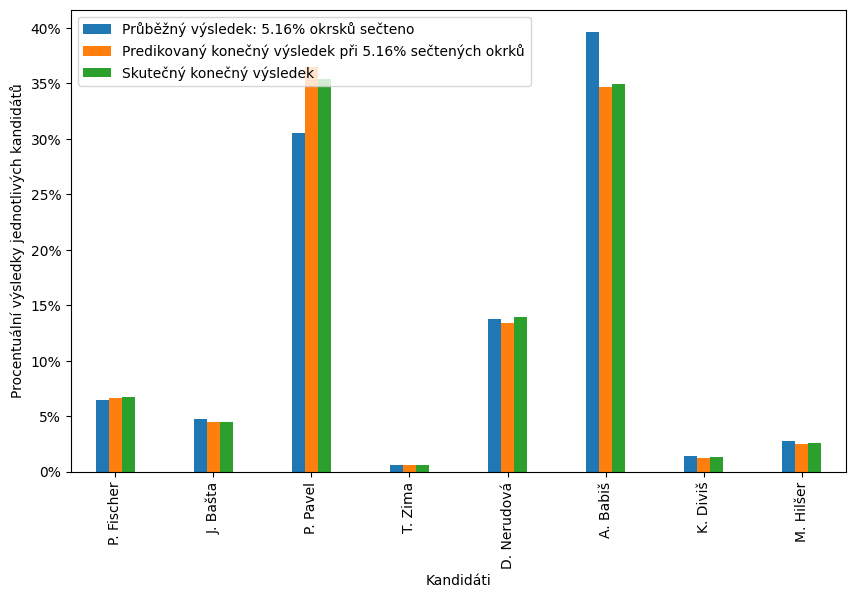

In [ ]:
from matplotlib.ticker import FuncFormatter

def percentage(x, pos):
    return '{:.0%}'.format(x)

ax = vysledky.plot(kind='bar', figsize=(10, 6), width=0.4)

plt.xlabel('Kandidáti')
plt.ylabel('Procentuální výsledky jednotlivých kandidátů')

formatter = FuncFormatter(percentage)
ax.yaxis.set_major_formatter(formatter)

plt.legend(loc='upper left')

plt.show()

In [ ]:
### POZOR, BEZI 6 MINUT
from fancyimpute import IterativeImputer


mse_list = []
rmse_list = []
hlasy_cols = [col for col in prez_2023_1_original_data_proc.columns if col.startswith('HLASY_')]
hlasy_predikce_dict = {col: [] for col in hlasy_cols}

for i in range(1, prez_2023_1_original_data_proc['davka'].max()):

  prez_2023_1_dopl_matic_prubezne_vysl = prez_2023_1_dopl_matic_df[prez_2023_1_dopl_matic_df['davka'] <= i]
  prez_2023_1_dopl_matic_bez_davky = prez_2023_1_dopl_matic_prubezne_vysl.drop(columns = ['davka'], axis = 1)

  prez_2018_1_dopl_matic_df = prez_2018_1_original_data.drop(columns = ['ZAPSANI_VOLICI', 'VYDANE_OBALKY', 'ODEVZDANE_OBALKY' ,'PLATNE_HLASY', 'davka'], axis = 1)
  prez_2018_1_dopl_matic_df = prez_2018_1_dopl_matic_df.fillna(0)
  df_na_values = prez_2018_1_dopl_matic_df.merge(prez_2023_1_dopl_matic_bez_davky, how = 'left', on = ['CIS_OBEC', 'CIS_OKRSEK'], suffixes = ('_2018', '_2023'))
  df_na_values.set_index(['CIS_OBEC', 'CIS_OKRSEK'], inplace=True)

  df_iter_impute = df_na_values.copy()
  df_iter_impute = df_iter_impute.replace({pd.NA: np.nan})
  vote_columns = df_iter_impute.columns
  vote_matrix = df_iter_impute[vote_columns].to_numpy()

  scaler = StandardScaler()
  vote_matrix_standardized = scaler.fit_transform(vote_matrix)
  imputed_matrix_standardized = IterativeImputer().fit_transform(vote_matrix_standardized)
  imputed_matrix = scaler.inverse_transform(imputed_matrix_standardized)

  df_iter_impute[vote_columns] = imputed_matrix
  df_iter_imputed = df_iter_impute.iloc[:, -8:]
  sorted_columns = sorted(df_iter_imputed.columns)
  df_iter_imputed = df_iter_imputed[sorted_columns]

  total_votes_per_party = df_iter_imputed.sum()
  total_votes = total_votes_per_party.sum()
  final_predictions_iter_impute = (total_votes_per_party / total_votes)
  final_predictions_iter_impute = pd.DataFrame(final_predictions_iter_impute).T
  final_predictions_iter_impute.columns = hlasy_cols

  for col in hlasy_predikce_dict:
    hlasy_predikce_dict[col].append(final_predictions_iter_impute[col].values[0])

  mse = mean_squared_error(final_predictions_iter_impute, final_result_prez_2023_1)
  mse_list.append(mse)
  rmse = sqrt(mse)
  rmse_list.append(rmse)

/usr/local/lib/python3.10/dist-packages/sklearn/impute/_iterative.py:825: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/impute/_iterative.py:825: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(


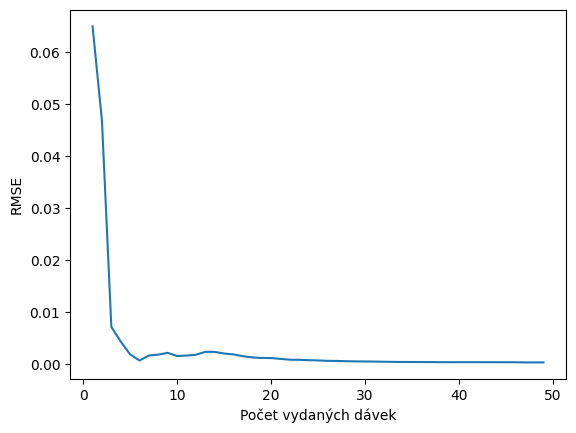

In [ ]:
x = range(1, 1 + len(rmse_list))
plt.plot(x, rmse_list)
plt.xlabel('Počet vydaných dávek')
plt.ylabel('RMSE')
plt.show()

In [ ]:
na_values_back = pd.Series([np.nan])
rmse_list_ser = pd.Series(rmse_list)
rmse_list_ser = pd.concat([rmse_list_ser, na_values_back], ignore_index=True)

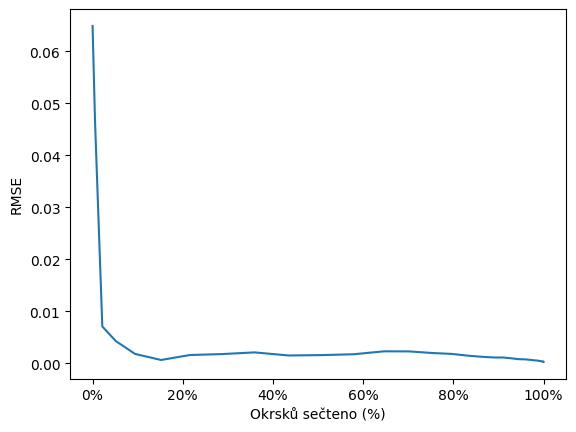

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter


def percentage(x, pos):
    return '{:.0%}'.format(x)

plt.plot(prez_2023_1_original_data_proc['okrsku_secteno'], rmse_list_ser)

plt.xlabel('Okrsků sečteno (%)')
plt.ylabel('RMSE')

formatter = FuncFormatter(percentage)
plt.gca().xaxis.set_major_formatter(formatter)

plt.show()

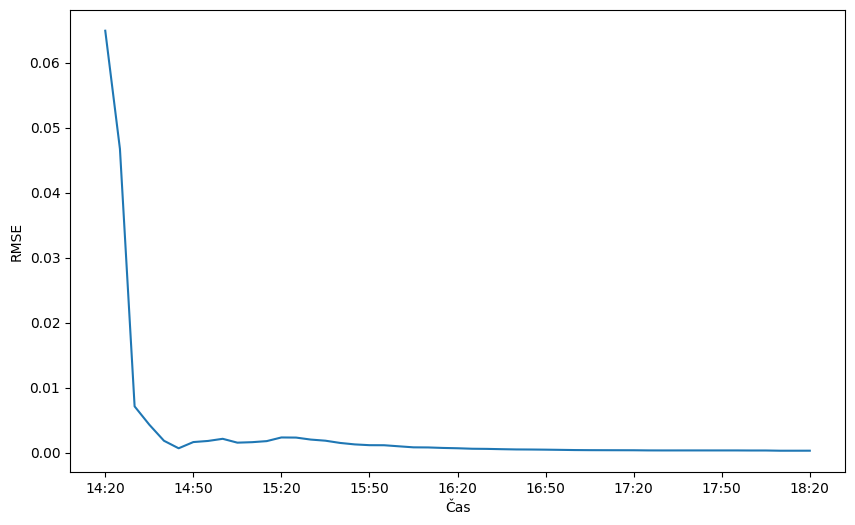

In [ ]:
n_points = len(rmse_list)

start_time = pd.Timestamp('2023-10-10 14:20')
time_labels = [(start_time + pd.Timedelta(minutes=5 * i)).strftime('%H:%M') for i in range(n_points)]

plt.figure(figsize=(10, 6))
plt.plot(range(1, n_points + 1), rmse_list)

plt.xticks(ticks=range(1, n_points + 1, 6), labels=time_labels[::6])

plt.xlabel('Čas')
plt.ylabel('RMSE')

plt.show()


In [ ]:
prejmenovani_klicu_slovniku = {
    'HLASY_1': 'P. Fischer',
    'HLASY_2': 'J. Bašta',
    'HLASY_4': 'P. Pavel',
    'HLASY_5': 'T. Zima',
    'HLASY_6': 'D. Nerudová',
    'HLASY_7': 'A. Babiš',
    'HLASY_8': 'K. Diviš',
    'HLASY_9': 'M. Hilšer'
}

predikce_prejmenovany_dict = {prejmenovani_klicu_slovniku.get(k, k): v for k, v in hlasy_predikce_dict.items()}

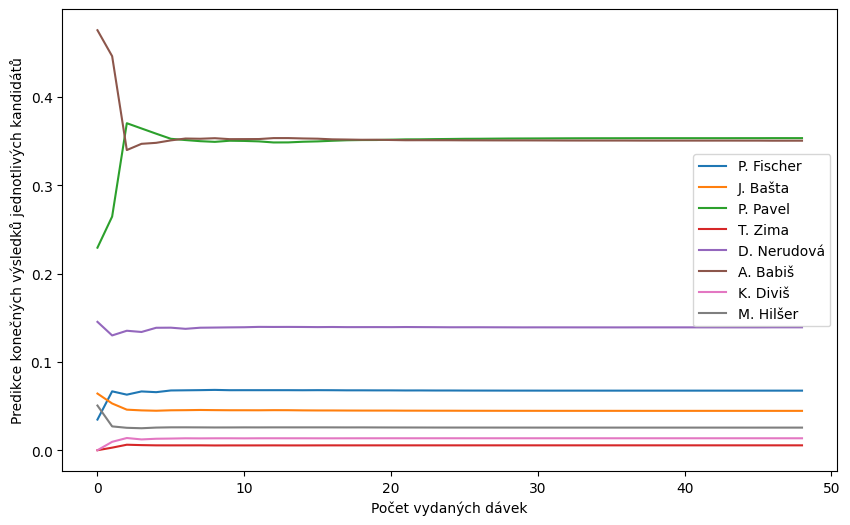

In [ ]:
plt.figure(figsize=(10, 6))

for key, values in predikce_prejmenovany_dict.items():
    plt.plot(values, label=key)

plt.xlabel('Počet vydaných dávek')
plt.ylabel('Predikce konečných výsledků jednotlivých kandidátů')

plt.legend()

plt.show()

In [ ]:
import pandas as pd
import numpy as np

modified_predikce_dict = {}

for key, values in predikce_prejmenovany_dict.items():

    modified_values = pd.concat([pd.Series(values), pd.Series([np.nan])]).reset_index(drop=True)
    modified_predikce_dict[key] = modified_values

for key, values in modified_predikce_dict.items():
    print(f"{key}: {values.tolist()}")


P. Fischer: [0.034708091150442495, 0.06669079686252773, 0.06292950582049157, 0.0665811155726885, 0.06575081793725908, 0.06768109844063103, 0.0678672983645345, 0.06805169220486054, 0.06832449408268224, 0.0679771353888095, 0.06800111763791636, 0.06799510148272812, 0.06800835667320061, 0.06799801238744245, 0.06793610770486953, 0.06801833340908638, 0.06796342190809913, 0.06783953169215053, 0.06783991989526227, 0.06778599119595098, 0.06777942638384747, 0.06768268301342548, 0.06771099967072443, 0.0676390016676421, 0.06763683048713648, 0.06757702192754307, 0.06756238716016766, 0.0675413270838349, 0.06751601997540188, 0.0675177507125934, 0.06750078632242518, 0.06749095796858334, 0.06749845977535032, 0.06749560654225958, 0.06749047492943049, 0.06748698889728506, 0.06748522883503819, 0.06749158080670681, 0.06749148921107537, 0.06749039702104101, 0.06748735819961343, 0.06748838530476392, 0.06748649685332037, 0.06748278038056701, 0.0674830720264173, 0.06748372656070446, 0.06748213933920236, 0.0674

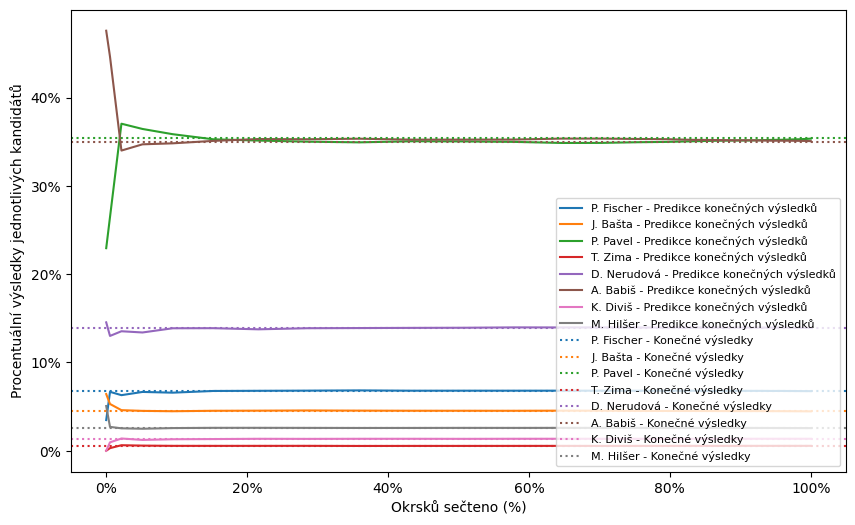

In [ ]:
from matplotlib.ticker import FuncFormatter
import matplotlib.pyplot as plt

def percentage(x, pos):
    return '{:.0%}'.format(x)

plt.figure(figsize=(10, 6))

for key, values in modified_predikce_dict.items():
    plt.plot(prez_2023_1_original_data_proc['okrsku_secteno'], values, label=key + ' - Predikce konečných výsledků')

plt.axhline(y=konecne_vysledky['HLASY_1'], label="P. Fischer - Konečné výsledky", color='#1f77b4', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_2'], label="J. Bašta - Konečné výsledky", color='#ff7f0e', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_4'], label="P. Pavel - Konečné výsledky", color='#2ca02c', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_5'], label="T. Zima - Konečné výsledky", color='#d6272B', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_6'], label="D. Nerudová - Konečné výsledky", color='#9467bd', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_7'], label="A. Babiš - Konečné výsledky", color='#8c564b', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_8'], label="K. Diviš - Konečné výsledky", color='#e377c2', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_9'], label="M. Hilšer - Konečné výsledky", color='#7f7f7f', linestyle='dotted')


plt.xlabel('Okrsků sečteno (%)')
plt.ylabel('Procentuální výsledky jednotlivých kandidátů')

ax = plt.gca()

formatter = FuncFormatter(percentage)
ax.yaxis.set_major_formatter(formatter)
ax.xaxis.set_major_formatter(formatter)

plt.legend(loc='lower right', fontsize=8)

plt.show()

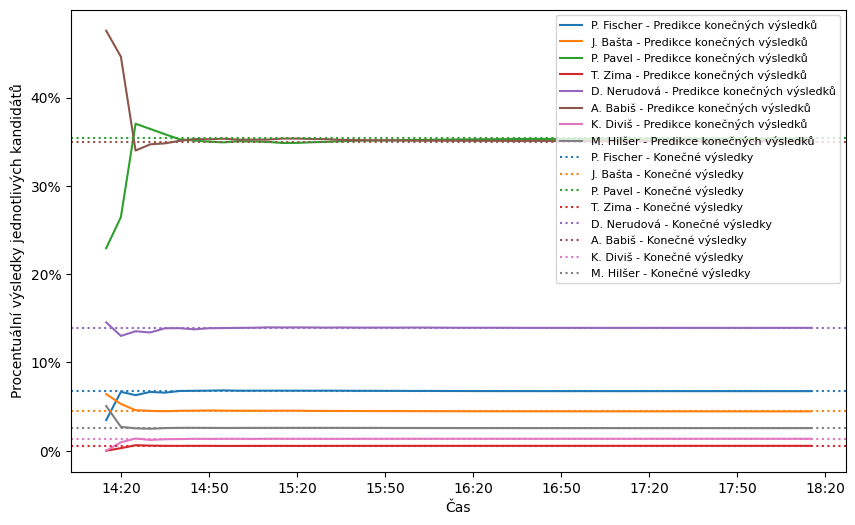

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.ticker import FuncFormatter

def percentage(x, pos):
    return '{:.0%}'.format(x)

n_points = len(next(iter(modified_predikce_dict.values())))

start_time = pd.Timestamp('2023-01-14 14:20')
time_labels = [(start_time + pd.Timedelta(minutes=5 * i)).strftime('%H:%M') for i in range(n_points)]

plt.figure(figsize=(10, 6))

for key, values in modified_predikce_dict.items():
    plt.plot(values, label=key + ' - Predikce konečných výsledků')

plt.axhline(y=konecne_vysledky['HLASY_1'], label="P. Fischer - Konečné výsledky", color='#1f77b4', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_2'], label="J. Bašta - Konečné výsledky", color='#ff7f0e', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_4'], label="P. Pavel - Konečné výsledky", color='#2ca02c', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_5'], label="T. Zima - Konečné výsledky", color='#d6272B', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_6'], label="D. Nerudová - Konečné výsledky", color='#9467bd', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_7'], label="A. Babiš - Konečné výsledky", color='#8c564b', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_8'], label="K. Diviš - Konečné výsledky", color='#e377c2', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_9'], label="M. Hilšer - Konečné výsledky", color='#7f7f7f', linestyle='dotted')

plt.xlabel('Čas')
plt.ylabel('Procentuální výsledky jednotlivých kandidátů')

ax = plt.gca()

formatter = FuncFormatter(percentage)
ax.yaxis.set_major_formatter(formatter)

plt.xticks(ticks=range(1, n_points + 1, 6), labels=time_labels[::6])

plt.legend(loc='upper right', fontsize=8)

plt.show()

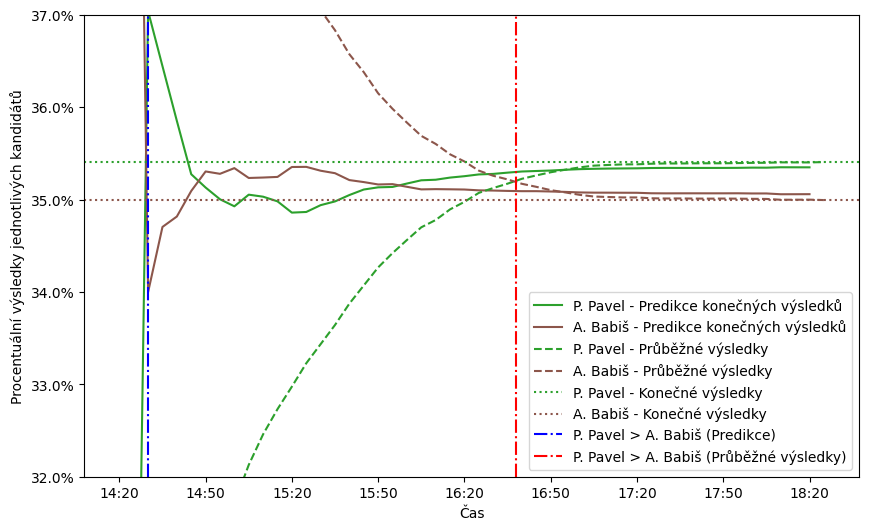

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter


n_points = len(next(iter(modified_predikce_dict.values())))

start_time = pd.Timestamp('2023-01-14 14:20')
time_labels = [(start_time + pd.Timedelta(minutes=5 * i)).strftime('%H:%M') for i in range(n_points)]

prubeh = prez_2023_1_original_data_proc[['HLASY_4', 'HLASY_7']].copy()
prubeh['P. Pavel'] = modified_predikce_dict['P. Pavel']
prubeh['A. Babiš'] = modified_predikce_dict['A. Babiš']

prubeh.columns = ["P. Pavel - sečtené", "A. Babiš - sečtené", "P. Pavel - predikce", "A. Babiš - predikce"]

index_pred_over = (prubeh['P. Pavel - predikce'] > prubeh['A. Babiš - predikce']).idxmax()
index_real_over = (prubeh['P. Pavel - sečtené'] > prubeh['A. Babiš - sečtené']).idxmax()

plt.figure(figsize=(10, 6))

plt.plot(prubeh['P. Pavel - predikce'], '-', label="P. Pavel - Predikce konečných výsledků", color=pavel_color)
plt.plot(prubeh['A. Babiš - predikce'], '-', label="A. Babiš - Predikce konečných výsledků", color=babis_color)

plt.plot(prubeh['P. Pavel - sečtené'], '--', label="P. Pavel - Průběžné výsledky", color=pavel_color)
plt.plot(prubeh['A. Babiš - sečtené'], '--', label="A. Babiš - Průběžné výsledky", color=babis_color)

plt.axhline(y=konecne_vysledky['HLASY_4'], label="P. Pavel - Konečné výsledky", color='#2ca02c', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_7'], label="A. Babiš - Konečné výsledky", color='#8c564b', linestyle='dotted')

plt.axvline(x=index_pred_over, color='blue', linestyle='dashdot', label="P. Pavel > A. Babiš (Predikce)")
plt.axvline(x=index_real_over - 0.4, color='red', linestyle='dashdot', label="P. Pavel > A. Babiš (Průběžné výsledky)")

plt.xlabel('Čas')
plt.ylabel('Procentuální výsledky jednotlivých kandidátů')

plt.xticks(ticks=range(0, n_points, 6), labels=time_labels[::6])

formatter = FuncFormatter(lambda y, _: f'{y:.1%}')
plt.gca().yaxis.set_major_formatter(formatter)

plt.legend()

plt.ylim(0.32, 0.37)

plt.show()


In [ ]:
avg_rmse_iter_imp_1 = sum(rmse_list) / len(rmse_list)
print(f"Průměrný RMSE pro model Iterative-impute a 1. kolo prezidentských voleb v roce 2023 je {avg_rmse_iter_imp_1}.")

Průměrný RMSE pro model Iterative-impute a 1. kolo prezidentských voleb v roce 2023 je 0.003331335815416805.


In [ ]:
rmse_list_ITERIMP_1 = rmse_list
rmse_df = pd.DataFrame(rmse_list_ITERIMP_1)
rmse_df.rename(columns = {0: 'IterImpute'}, inplace = True)
rmse_df.to_csv('rmse_ITERIMP_1.csv', index = False)

## 2. kolo prez voleb 2023

### Leva strana matice z voleb do ps 2021 - pro prezidentske volby 2023 1. kolo - Soft Impute


In [ ]:
ps_2021_original_data = pd.read_csv('ps_2021_abs.csv')
ps_2021_original_data_proc = pd.read_csv('ps_2021_proc.csv')
prez_2023_1_original_data_proc = pd.read_csv('prez_2023_1_proc.csv')

mse_list = []
rmse_list = []
hlasy_cols = [col for col in prez_2023_1_original_data_proc.columns if col.startswith('HLASY_')]
hlasy_predikce_dict = {col: [] for col in hlasy_cols}

max_davka = prez_2023_1_original_data_proc['davka'].max()
prez_2023_1_proc_last_row = prez_2023_1_original_data_proc[prez_2023_1_original_data_proc['davka'] == max_davka]
final_result_prez_2023_1 = prez_2023_1_proc_last_row.drop(columns = ['davka', 'okrsku_secteno', 'volebni_ucast'], axis = 1)
final_result_prez_2023_1


for i in range(1, prez_2023_1_original_data_proc['davka'].max()):

  prez_2023_1_dopl_matic_df = prez_2023_1_original_data.drop(columns = ['ZAPSANI_VOLICI','VYDANE_OBALKY', 'ODEVZDANE_OBALKY', 'PLATNE_HLASY'], axis = 1)
  prez_2023_1_dopl_matic_df = prez_2023_1_dopl_matic_df.fillna(0)
  prez_2023_1_dopl_matic_prubezne_vysl = prez_2023_1_dopl_matic_df[prez_2023_1_dopl_matic_df['davka'] <= i]
  prez_2023_1_dopl_matic_bez_davky = prez_2023_1_dopl_matic_prubezne_vysl.drop(columns = ['davka'], axis = 1)

  hlasy_columns_rel = [col for col in ps_2021_original_data_proc.columns if col.startswith('HLASY_') and col != 'HLASY_ostatni']
  selected_columns = ['CIS_OBEC', 'CIS_OKRSEK'] + hlasy_columns_rel
  ps_2021_selected = ps_2021_original_data[selected_columns]
  hlasy_columns_dopl_matic = [col for col in ps_2021_original_data.columns if col.startswith('HLASY_')]
  hlasy_ostatni_columns = list(set(hlasy_columns_dopl_matic) - set(hlasy_columns_rel))
  ps_2021_selected['HLASY_ostatni'] = ps_2021_original_data[hlasy_ostatni_columns].sum(axis=1)

  df_na_values = ps_2021_selected.merge(prez_2023_1_dopl_matic_bez_davky,  how = 'left', on = ['CIS_OBEC', 'CIS_OKRSEK'])
  df_na_values.set_index(['CIS_OBEC', 'CIS_OKRSEK'], inplace=True)

  df_soft_impute = df_na_values.copy()
  df_soft_impute = df_soft_impute.replace({pd.NA: np.nan})
  vote_columns = df_soft_impute.columns
  vote_matrix = df_soft_impute[vote_columns].to_numpy()

  scaler = StandardScaler()
  vote_matrix_standardized = scaler.fit_transform(vote_matrix)
  imputed_matrix_standardized = SoftImpute().fit_transform(vote_matrix_standardized)
  imputed_matrix = scaler.inverse_transform(imputed_matrix_standardized)

  df_soft_impute[vote_columns] = imputed_matrix
  df_soft_imputed = df_soft_impute.iloc[:, -8:]

  sorted_columns = sorted(df_soft_imputed.columns)
  df_soft_imputed = df_soft_imputed[sorted_columns]

  total_votes_per_party = df_soft_imputed.sum()
  total_votes = total_votes_per_party.sum()
  final_predictions_soft_impute = (total_votes_per_party / total_votes)
  final_predictions_soft_impute = pd.DataFrame(final_predictions_soft_impute).T
  final_predictions_soft_impute.columns = hlasy_cols

  for col in hlasy_predikce_dict:
    hlasy_predikce_dict[col].append(final_predictions_soft_impute[col].values[0])

  mse = mean_squared_error(final_predictions_soft_impute, final_result_prez_2023_1)
  mse_list.append(mse)
  rmse = sqrt(mse)
  rmse_list.append(rmse)

In [ ]:
import statistics

statistics.mean(rmse_list)

### Leva strana matice z prezidentskych voleb 2018 1. a 2. kolo - pro prezidentske volby 2023 1. kolo - Soft Impute

In [ ]:
prez_2018_1_original_data = pd.read_csv('prez_2018_1_abs.csv')
prez_2018_2_original_data = pd.read_csv('prez_2018_2_abs.csv')
ps_2021_original_data = pd.read_csv('ps_2021_abs.csv')
ps_2021_original_data_proc = pd.read_csv('ps_2021_proc.csv')
prez_2023_1_original_data_proc = pd.read_csv('prez_2023_1_proc.csv')

mse_list = []
rmse_list = []
hlasy_cols = [col for col in prez_2023_1_original_data_proc.columns if col.startswith('HLASY_')]
hlasy_predikce_dict = {col: [] for col in hlasy_cols}

max_davka = prez_2023_1_original_data_proc['davka'].max()
prez_2023_1_proc_last_row = prez_2023_1_original_data_proc[prez_2023_1_original_data_proc['davka'] == max_davka]
final_result_prez_2023_1 = prez_2023_1_proc_last_row.drop(columns = ['davka', 'okrsku_secteno', 'volebni_ucast'], axis = 1)
final_result_prez_2023_1


for i in range(1, prez_2023_1_original_data_proc['davka'].max()):

  prez_2023_1_dopl_matic_df = prez_2023_1_original_data.drop(columns = ['ZAPSANI_VOLICI','VYDANE_OBALKY', 'ODEVZDANE_OBALKY', 'PLATNE_HLASY'], axis = 1)
  prez_2023_1_dopl_matic_df = prez_2023_1_dopl_matic_df.fillna(0)
  prez_2023_1_dopl_matic_prubezne_vysl = prez_2023_1_dopl_matic_df[prez_2023_1_dopl_matic_df['davka'] <= i]
  prez_2023_1_dopl_matic_bez_davky = prez_2023_1_dopl_matic_prubezne_vysl.drop(columns = ['davka'], axis = 1)

  prez_2018_1_dopl_matic_df = prez_2018_1_original_data.drop(columns = ['ZAPSANI_VOLICI', 'VYDANE_OBALKY', 'ODEVZDANE_OBALKY' ,'PLATNE_HLASY', 'davka'], axis = 1)
  prez_2018_1_dopl_matic_df = prez_2018_1_dopl_matic_df.fillna(0)

  prez_2018_2_dopl_matic_df = prez_2018_2_original_data.drop(columns = ['ZAPSANI_VOLICI', 'VYDANE_OBALKY', 'ODEVZDANE_OBALKY' ,'PLATNE_HLASY', 'davka'], axis = 1)
  prez_2018_2_dopl_matic_df = prez_2018_2_dopl_matic_df.fillna(0)

  df_2018_merged = prez_2018_1_dopl_matic_df.merge(prez_2018_2_dopl_matic_df, how = 'left', on = ['CIS_OBEC', 'CIS_OKRSEK'])

  df_na_values = df_2018_merged.merge(prez_2023_1_dopl_matic_bez_davky, how = 'left', on = ['CIS_OBEC', 'CIS_OKRSEK'])
  df_na_values.set_index(['CIS_OBEC', 'CIS_OKRSEK'], inplace=True)

  df_soft_impute = df_na_values.copy()
  df_soft_impute = df_soft_impute.replace({pd.NA: np.nan})
  vote_columns = df_soft_impute.columns
  vote_matrix = df_soft_impute[vote_columns].to_numpy()

  scaler = StandardScaler()
  vote_matrix_standardized = scaler.fit_transform(vote_matrix)
  imputed_matrix_standardized = SoftImpute().fit_transform(vote_matrix_standardized)
  imputed_matrix = scaler.inverse_transform(imputed_matrix_standardized)

  df_soft_impute[vote_columns] = imputed_matrix
  df_soft_imputed = df_soft_impute.iloc[:, -8:]
  sorted_columns = sorted(df_soft_imputed.columns)
  df_soft_imputed = df_soft_imputed[sorted_columns]

  total_votes_per_party = df_soft_imputed.sum()
  total_votes = total_votes_per_party.sum()
  final_predictions_soft_impute = (total_votes_per_party / total_votes)
  final_predictions_soft_impute = pd.DataFrame(final_predictions_soft_impute).T
  final_predictions_soft_impute.columns = hlasy_cols

  for col in hlasy_predikce_dict:
    hlasy_predikce_dict[col].append(final_predictions_soft_impute[col].values[0])

  mse = mean_squared_error(final_predictions_soft_impute, final_result_prez_2023_1)
  mse_list.append(mse)
  rmse = sqrt(mse)
  rmse_list.append(rmse)

In [ ]:
import statistics

statistics.mean(rmse_list)

### Leva strana matice z prezidentskych voleb 2018 1. a 2. kolo a voleb do ps 2021 - pro prezidentske volby 2023 1. kolo - Soft Impute - nejlepsi

In [ ]:
prez_2018_1_original_data = pd.read_csv('prez_2018_1_abs.csv')
prez_2018_2_original_data = pd.read_csv('prez_2018_2_abs.csv')
ps_2021_original_data = pd.read_csv('ps_2021_abs.csv')
ps_2021_original_data_proc = pd.read_csv('ps_2021_proc.csv')
prez_2023_1_original_data_proc = pd.read_csv('prez_2023_1_proc.csv')

mse_list = []
rmse_list = []
hlasy_cols = [col for col in prez_2023_1_original_data_proc.columns if col.startswith('HLASY_')]
hlasy_predikce_dict = {col: [] for col in hlasy_cols}

max_davka = prez_2023_1_original_data_proc['davka'].max()
prez_2023_1_proc_last_row = prez_2023_1_original_data_proc[prez_2023_1_original_data_proc['davka'] == max_davka]
final_result_prez_2023_1 = prez_2023_1_proc_last_row.drop(columns = ['davka', 'okrsku_secteno', 'volebni_ucast'], axis = 1)
final_result_prez_2023_1


for i in range(1, prez_2023_1_original_data_proc['davka'].max()):

  prez_2023_1_dopl_matic_df = prez_2023_1_original_data.drop(columns = ['ZAPSANI_VOLICI','VYDANE_OBALKY', 'ODEVZDANE_OBALKY', 'PLATNE_HLASY'], axis = 1)
  prez_2023_1_dopl_matic_df = prez_2023_1_dopl_matic_df.fillna(0)
  prez_2023_1_dopl_matic_prubezne_vysl = prez_2023_1_dopl_matic_df[prez_2023_1_dopl_matic_df['davka'] <= i]
  prez_2023_1_dopl_matic_bez_davky = prez_2023_1_dopl_matic_prubezne_vysl.drop(columns = ['davka'], axis = 1)


  hlasy_columns_rel = [col for col in ps_2021_original_data_proc.columns if col.startswith('HLASY_') and col != 'HLASY_ostatni']
  selected_columns = ['CIS_OBEC', 'CIS_OKRSEK'] + hlasy_columns_rel
  ps_2021_selected = ps_2021_original_data[selected_columns]
  hlasy_columns_dopl_matic = [col for col in ps_2021_original_data.columns if col.startswith('HLASY_')]
  hlasy_ostatni_columns = list(set(hlasy_columns_dopl_matic) - set(hlasy_columns_rel))
  ps_2021_selected['HLASY_ostatni'] = ps_2021_original_data[hlasy_ostatni_columns].sum(axis=1)

  prez_2018_1_dopl_matic_df = prez_2018_1_original_data.drop(columns = ['ZAPSANI_VOLICI', 'VYDANE_OBALKY', 'ODEVZDANE_OBALKY' ,'PLATNE_HLASY', 'davka'], axis = 1)
  prez_2018_1_dopl_matic_df = prez_2018_1_dopl_matic_df.fillna(0)

  prez_2018_2_dopl_matic_df = prez_2018_2_original_data.drop(columns = ['ZAPSANI_VOLICI', 'VYDANE_OBALKY', 'ODEVZDANE_OBALKY' ,'PLATNE_HLASY', 'davka'], axis = 1)
  prez_2018_2_dopl_matic_df = prez_2018_2_dopl_matic_df.fillna(0)

  df_2018_merged = prez_2018_1_dopl_matic_df.merge(prez_2018_2_dopl_matic_df, how = 'left', on = ['CIS_OBEC', 'CIS_OKRSEK'])

  df_2018_2021_merged = df_2018_merged.merge(ps_2021_selected, how = 'left', on = ['CIS_OBEC', 'CIS_OKRSEK'])

  df_na_values = df_2018_2021_merged.merge(prez_2023_1_dopl_matic_bez_davky, how = 'left', on = ['CIS_OBEC', 'CIS_OKRSEK'])
  df_na_values.set_index(['CIS_OBEC', 'CIS_OKRSEK'], inplace=True)

  df_soft_impute = df_na_values.copy()
  df_soft_impute = df_soft_impute.replace({pd.NA: np.nan})
  vote_columns = df_soft_impute.columns
  vote_matrix = df_soft_impute[vote_columns].to_numpy()

  scaler = StandardScaler()
  vote_matrix_standardized = scaler.fit_transform(vote_matrix)
  imputed_matrix_standardized = SoftImpute().fit_transform(vote_matrix_standardized)
  imputed_matrix = scaler.inverse_transform(imputed_matrix_standardized)

  df_soft_impute[vote_columns] = imputed_matrix
  df_soft_imputed = df_soft_impute.iloc[:, -8:]
  sorted_columns = sorted(df_soft_imputed.columns)
  df_soft_imputed = df_soft_imputed[sorted_columns]

  total_votes_per_party = df_soft_imputed.sum()
  total_votes = total_votes_per_party.sum()
  final_predictions_soft_impute = (total_votes_per_party / total_votes)
  final_predictions_soft_impute = pd.DataFrame(final_predictions_soft_impute).T
  final_predictions_soft_impute.columns = hlasy_cols

  for col in hlasy_predikce_dict:
    hlasy_predikce_dict[col].append(final_predictions_soft_impute[col].values[0])

  mse = mean_squared_error(final_predictions_soft_impute, final_result_prez_2023_1)
  mse_list.append(mse)
  rmse = sqrt(mse)
  rmse_list.append(rmse)

In [ ]:
import statistics

statistics.mean(rmse_list)

### Leva strana matice z voleb do ps 2021 - pro prezidentske volby 2023 1. kolo - KNN

In [ ]:
# POZOR, BEZI 60 MINUT
ps_2021_original_data = pd.read_csv('ps_2021_abs.csv')
ps_2021_original_data_proc = pd.read_csv('ps_2021_proc.csv')
prez_2023_1_original_data_proc = pd.read_csv('prez_2023_1_proc.csv')

mse_dict = {k: [] for k in range(2, 11)}
rmse_dict = {k: [] for k in range(2, 11)}

hlasy_cols = [col for col in prez_2023_1_original_data_proc.columns if col.startswith('HLASY_')]
hlasy_predikce_dict = {k: {col: [] for col in hlasy_cols} for k in range(2, 11)}

max_davka = prez_2023_1_original_data_proc['davka'].max()
prez_2023_1_proc_last_row = prez_2023_1_original_data_proc[prez_2023_1_original_data_proc['davka'] == max_davka]
final_result_prez_2023_1 = prez_2023_1_proc_last_row.drop(columns = ['davka', 'okrsku_secteno', 'volebni_ucast'], axis = 1)
final_result_prez_2023_1


for i in [1, 10, 20, 30, 40, 50, 60, 70]:

  prez_2023_1_dopl_matic_df = prez_2023_1_original_data.drop(columns = ['ZAPSANI_VOLICI','VYDANE_OBALKY', 'ODEVZDANE_OBALKY', 'PLATNE_HLASY'], axis = 1)
  prez_2023_1_dopl_matic_df = prez_2023_1_dopl_matic_df.fillna(0)
  prez_2023_1_dopl_matic_prubezne_vysl = prez_2023_1_dopl_matic_df[prez_2023_1_dopl_matic_df['davka'] <= i]
  prez_2023_1_dopl_matic_bez_davky = prez_2023_1_dopl_matic_prubezne_vysl.drop(columns = ['davka'], axis = 1)

  hlasy_columns_rel = [col for col in ps_2021_original_data_proc.columns if col.startswith('HLASY_') and col != 'HLASY_ostatni']
  selected_columns = ['CIS_OBEC', 'CIS_OKRSEK'] + hlasy_columns_rel
  ps_2021_selected = ps_2021_original_data[selected_columns]
  hlasy_columns_dopl_matic = [col for col in ps_2021_original_data.columns if col.startswith('HLASY_')]
  hlasy_ostatni_columns = list(set(hlasy_columns_dopl_matic) - set(hlasy_columns_rel))
  ps_2021_selected['HLASY_ostatni'] = ps_2021_original_data[hlasy_ostatni_columns].sum(axis=1)

  df_na_values = ps_2021_selected.merge(prez_2023_1_dopl_matic_bez_davky,  how = 'left', on = ['CIS_OBEC', 'CIS_OKRSEK'])
  df_na_values.set_index(['CIS_OBEC', 'CIS_OKRSEK'], inplace=True)

  df_knn = df_na_values.copy()
  df_knn = df_knn.replace({pd.NA: np.nan})
  vote_columns = df_knn.columns
  vote_matrix = df_knn[vote_columns].to_numpy()

  scaler = StandardScaler()
  vote_matrix_standardized = scaler.fit_transform(vote_matrix)

  for k in range(2, 11):

      imputed_matrix_standardized = KNN(k=k).fit_transform(vote_matrix_standardized)
      imputed_matrix = scaler.inverse_transform(imputed_matrix_standardized)

      df_knn[vote_columns] = imputed_matrix
      df_knn_imputed = df_knn.iloc[:, -8:]

      sorted_columns = sorted(df_knn_imputed.columns)
      df_knn_imputed = df_knn_imputed[sorted_columns]

      total_votes_per_party = df_knn_imputed.sum()
      total_votes = total_votes_per_party.sum()
      final_predictions_knn = (total_votes_per_party / total_votes)
      final_predictions_knn = pd.DataFrame(final_predictions_knn).T
      final_predictions_knn.columns = hlasy_cols

      for col in hlasy_predikce_dict[k]:
          hlasy_predikce_dict[k][col].append(final_predictions_knn[col].values[0])

      mse = mean_squared_error(final_predictions_knn, final_result_prez_2023_1)
      mse_dict[k].append(mse)
      rmse = sqrt(mse)
      rmse_dict[k].append(rmse)

In [ ]:
avg_rmse_dict = {k: sum(v) / len(v) for k, v in rmse_dict.items()}

print(avg_rmse_dict)

In [ ]:
min(avg_rmse_dict)

Nejlepsi K je 2

### Leva strana matice z prezidentskych voleb 2018 1. a 2. kolo - pro prezidentske volby 2023 1. kolo - KNN - nejlepsi

In [ ]:
# POZOR, BEZI 64 MINUT
prez_2018_1_original_data = pd.read_csv('prez_2018_1_abs.csv')
prez_2018_2_original_data = pd.read_csv('prez_2018_2_abs.csv')
prez_2023_1_original_data_proc = pd.read_csv('prez_2023_1_proc.csv')

mse_dict = {k: [] for k in range(2, 11)}
rmse_dict = {k: [] for k in range(2, 11)}

hlasy_cols = [col for col in prez_2023_1_original_data_proc.columns if col.startswith('HLASY_')]
hlasy_predikce_dict = {k: {col: [] for col in hlasy_cols} for k in range(2, 11)}

max_davka = prez_2023_1_original_data_proc['davka'].max()
prez_2023_1_proc_last_row = prez_2023_1_original_data_proc[prez_2023_1_original_data_proc['davka'] == max_davka]
final_result_prez_2023_1 = prez_2023_1_proc_last_row.drop(columns = ['davka', 'okrsku_secteno', 'volebni_ucast'], axis = 1)
final_result_prez_2023_1


for i in [1, 10, 20, 30, 40, 50, 60, 70]:

  prez_2023_1_dopl_matic_df = prez_2023_1_original_data.drop(columns = ['ZAPSANI_VOLICI','VYDANE_OBALKY', 'ODEVZDANE_OBALKY', 'PLATNE_HLASY'], axis = 1)
  prez_2023_1_dopl_matic_df = prez_2023_1_dopl_matic_df.fillna(0)
  prez_2023_1_dopl_matic_prubezne_vysl = prez_2023_1_dopl_matic_df[prez_2023_1_dopl_matic_df['davka'] <= i]
  prez_2023_1_dopl_matic_bez_davky = prez_2023_1_dopl_matic_prubezne_vysl.drop(columns = ['davka'], axis = 1)

  prez_2018_1_dopl_matic_df = prez_2018_1_original_data.drop(columns = ['ZAPSANI_VOLICI', 'VYDANE_OBALKY', 'ODEVZDANE_OBALKY' ,'PLATNE_HLASY', 'davka'], axis = 1)
  prez_2018_1_dopl_matic_df = prez_2018_1_dopl_matic_df.fillna(0)

  prez_2018_2_dopl_matic_df = prez_2018_2_original_data.drop(columns = ['ZAPSANI_VOLICI', 'VYDANE_OBALKY', 'ODEVZDANE_OBALKY' ,'PLATNE_HLASY', 'davka'], axis = 1)
  prez_2018_2_dopl_matic_df = prez_2018_2_dopl_matic_df.fillna(0)

  df_2018_merged = prez_2018_1_dopl_matic_df.merge(prez_2018_2_dopl_matic_df, how = 'left', on = ['CIS_OBEC', 'CIS_OKRSEK'])

  df_na_values = df_2018_merged.merge(prez_2023_1_dopl_matic_bez_davky, how = 'left', on = ['CIS_OBEC', 'CIS_OKRSEK'])
  df_na_values.set_index(['CIS_OBEC', 'CIS_OKRSEK'], inplace=True)

  df_knn = df_na_values.copy()
  df_knn = df_knn.replace({pd.NA: np.nan})
  vote_columns = df_knn.columns
  vote_matrix = df_knn[vote_columns].to_numpy()

  scaler = StandardScaler()
  vote_matrix_standardized = scaler.fit_transform(vote_matrix)

  for k in range(2, 11):

      imputed_matrix_standardized = KNN(k=k).fit_transform(vote_matrix_standardized)
      imputed_matrix = scaler.inverse_transform(imputed_matrix_standardized)

      df_knn[vote_columns] = imputed_matrix
      df_knn_imputed = df_knn.iloc[:, -8:]

      sorted_columns = sorted(df_knn_imputed.columns)
      df_knn_imputed = df_knn_imputed[sorted_columns]

      total_votes_per_party = df_knn_imputed.sum()
      total_votes = total_votes_per_party.sum()
      final_predictions_knn = (total_votes_per_party / total_votes)
      final_predictions_knn = pd.DataFrame(final_predictions_knn).T
      final_predictions_knn.columns = hlasy_cols

      for col in hlasy_predikce_dict[k]:
          hlasy_predikce_dict[k][col].append(final_predictions_knn[col].values[0])

      mse = mean_squared_error(final_predictions_knn, final_result_prez_2023_1)
      mse_dict[k].append(mse)
      rmse = sqrt(mse)
      rmse_dict[k].append(rmse)

In [ ]:
avg_rmse_dict = {k: sum(v) / len(v) for k, v in rmse_dict.items()}

print(avg_rmse_dict)

In [ ]:
min(avg_rmse_dict)

Nejlepsi K je 2

### Leva strana matice z prezidentskych voleb 2018 1. a 2. kolo a voleb do ps 2021 - pro prezidentske volby 2023 1. kolo - KNN

In [ ]:
# POZOR, BEZI 74 MINUT
prez_2018_1_original_data = pd.read_csv('prez_2018_1_abs.csv')
prez_2018_2_original_data = pd.read_csv('prez_2018_2_abs.csv')
ps_2021_original_data = pd.read_csv('ps_2021_abs.csv')
ps_2021_original_data_proc = pd.read_csv('ps_2021_proc.csv')
prez_2023_1_original_data_proc = pd.read_csv('prez_2023_1_proc.csv')

mse_dict = {k: [] for k in range(2, 11)}
rmse_dict = {k: [] for k in range(2, 11)}

hlasy_cols = [col for col in prez_2023_1_original_data_proc.columns if col.startswith('HLASY_')]
hlasy_predikce_dict = {k: {col: [] for col in hlasy_cols} for k in range(2, 11)}

max_davka = prez_2023_1_original_data_proc['davka'].max()
prez_2023_1_proc_last_row = prez_2023_1_original_data_proc[prez_2023_1_original_data_proc['davka'] == max_davka]
final_result_prez_2023_1 = prez_2023_1_proc_last_row.drop(columns = ['davka', 'okrsku_secteno', 'volebni_ucast'], axis = 1)
final_result_prez_2023_1


for i in [1, 10, 20, 30, 40, 50, 60, 70]:

  prez_2023_1_dopl_matic_df = prez_2023_1_original_data.drop(columns = ['ZAPSANI_VOLICI','VYDANE_OBALKY', 'ODEVZDANE_OBALKY', 'PLATNE_HLASY'], axis = 1)
  prez_2023_1_dopl_matic_df = prez_2023_1_dopl_matic_df.fillna(0)
  prez_2023_1_dopl_matic_prubezne_vysl = prez_2023_1_dopl_matic_df[prez_2023_1_dopl_matic_df['davka'] <= i]
  prez_2023_1_dopl_matic_bez_davky = prez_2023_1_dopl_matic_prubezne_vysl.drop(columns = ['davka'], axis = 1)

  hlasy_columns_rel = [col for col in ps_2021_original_data_proc.columns if col.startswith('HLASY_') and col != 'HLASY_ostatni']
  selected_columns = ['CIS_OBEC', 'CIS_OKRSEK'] + hlasy_columns_rel
  ps_2021_selected = ps_2021_original_data[selected_columns]
  hlasy_columns_dopl_matic = [col for col in ps_2021_original_data.columns if col.startswith('HLASY_')]
  hlasy_ostatni_columns = list(set(hlasy_columns_dopl_matic) - set(hlasy_columns_rel))
  ps_2021_selected['HLASY_ostatni'] = ps_2021_original_data[hlasy_ostatni_columns].sum(axis=1)

  prez_2018_1_dopl_matic_df = prez_2018_1_original_data.drop(columns = ['ZAPSANI_VOLICI', 'VYDANE_OBALKY', 'ODEVZDANE_OBALKY' ,'PLATNE_HLASY', 'davka'], axis = 1)
  prez_2018_1_dopl_matic_df = prez_2018_1_dopl_matic_df.fillna(0)

  prez_2018_2_dopl_matic_df = prez_2018_2_original_data.drop(columns = ['ZAPSANI_VOLICI', 'VYDANE_OBALKY', 'ODEVZDANE_OBALKY' ,'PLATNE_HLASY', 'davka'], axis = 1)
  prez_2018_2_dopl_matic_df = prez_2018_2_dopl_matic_df.fillna(0)

  df_2018_merged = prez_2018_1_dopl_matic_df.merge(prez_2018_2_dopl_matic_df, how = 'left', on = ['CIS_OBEC', 'CIS_OKRSEK'])

  df_2018_2021_merged = df_2018_merged.merge(ps_2021_selected, how = 'left', on = ['CIS_OBEC', 'CIS_OKRSEK'])

  df_na_values = df_2018_2021_merged.merge(prez_2023_1_dopl_matic_bez_davky, how = 'left', on = ['CIS_OBEC', 'CIS_OKRSEK'])
  df_na_values.set_index(['CIS_OBEC', 'CIS_OKRSEK'], inplace=True)

  df_knn = df_na_values.copy()
  df_knn = df_knn.replace({pd.NA: np.nan})
  vote_columns = df_knn.columns
  vote_matrix = df_knn[vote_columns].to_numpy()

  scaler = StandardScaler()
  vote_matrix_standardized = scaler.fit_transform(vote_matrix)

  for k in range(2, 11):

      imputed_matrix_standardized = KNN(k=k).fit_transform(vote_matrix_standardized)
      imputed_matrix = scaler.inverse_transform(imputed_matrix_standardized)

      df_knn[vote_columns] = imputed_matrix
      df_knn_imputed = df_knn.iloc[:, -8:]

      sorted_columns = sorted(df_knn_imputed.columns)
      df_knn_imputed = df_knn_imputed[sorted_columns]

      total_votes_per_party = df_knn_imputed.sum()
      total_votes = total_votes_per_party.sum()
      final_predictions_knn = (total_votes_per_party / total_votes)
      final_predictions_knn = pd.DataFrame(final_predictions_knn).T
      final_predictions_knn.columns = hlasy_cols

      for col in hlasy_predikce_dict[k]:
          hlasy_predikce_dict[k][col].append(final_predictions_knn[col].values[0])

      mse = mean_squared_error(final_predictions_knn, final_result_prez_2023_1)
      mse_dict[k].append(mse)
      rmse = sqrt(mse)
      rmse_dict[k].append(rmse)

In [ ]:
avg_rmse_dict = {k: sum(v) / len(v) for k, v in rmse_dict.items()}

print(avg_rmse_dict)

In [ ]:
min(avg_rmse_dict)

Nejlepsi K je 2

### Leva strana matice z voleb do ps 2021 - pro prezidentske volby 2023 1. kolo - Iterative Imputer

In [ ]:
# POZOR, BEZI 6 MIN
ps_2021_original_data = pd.read_csv('ps_2021_abs.csv')
ps_2021_original_data_proc = pd.read_csv('ps_2021_proc.csv')
prez_2023_1_original_data_proc = pd.read_csv('prez_2023_1_proc.csv')

mse_list = []
rmse_list = []
hlasy_cols = [col for col in prez_2023_1_original_data_proc.columns if col.startswith('HLASY_')]
hlasy_predikce_dict = {col: [] for col in hlasy_cols}

max_davka = prez_2023_1_original_data_proc['davka'].max()
prez_2023_1_proc_last_row = prez_2023_1_original_data_proc[prez_2023_1_original_data_proc['davka'] == max_davka]
final_result_prez_2023_1 = prez_2023_1_proc_last_row.drop(columns = ['davka', 'okrsku_secteno', 'volebni_ucast'], axis = 1)
final_result_prez_2023_1


for i in range(1, prez_2023_1_original_data_proc['davka'].max()):

  prez_2023_1_dopl_matic_df = prez_2023_1_original_data.drop(columns = ['ZAPSANI_VOLICI','VYDANE_OBALKY', 'ODEVZDANE_OBALKY', 'PLATNE_HLASY'], axis = 1)
  prez_2023_1_dopl_matic_df = prez_2023_1_dopl_matic_df.fillna(0)
  prez_2023_1_dopl_matic_prubezne_vysl = prez_2023_1_dopl_matic_df[prez_2023_1_dopl_matic_df['davka'] <= i]
  prez_2023_1_dopl_matic_bez_davky = prez_2023_1_dopl_matic_prubezne_vysl.drop(columns = ['davka'], axis = 1)

  hlasy_columns_rel = [col for col in ps_2021_original_data_proc.columns if col.startswith('HLASY_') and col != 'HLASY_ostatni']
  selected_columns = ['CIS_OBEC', 'CIS_OKRSEK'] + hlasy_columns_rel
  ps_2021_selected = ps_2021_original_data[selected_columns]
  hlasy_columns_dopl_matic = [col for col in ps_2021_original_data.columns if col.startswith('HLASY_')]
  hlasy_ostatni_columns = list(set(hlasy_columns_dopl_matic) - set(hlasy_columns_rel))
  ps_2021_selected['HLASY_ostatni'] = ps_2021_original_data[hlasy_ostatni_columns].sum(axis=1)

  df_na_values = ps_2021_selected.merge(prez_2023_1_dopl_matic_bez_davky,  how = 'left', on = ['CIS_OBEC', 'CIS_OKRSEK'])
  df_na_values.set_index(['CIS_OBEC', 'CIS_OKRSEK'], inplace=True)

  df_iter_impute = df_na_values.copy()
  df_soft_impute = df_iter_impute.replace({pd.NA: np.nan})
  vote_columns = df_iter_impute.columns
  vote_matrix = df_iter_impute[vote_columns].to_numpy()

  scaler = StandardScaler()
  vote_matrix_standardized = scaler.fit_transform(vote_matrix)
  imputed_matrix_standardized = IterativeImputer().fit_transform(vote_matrix_standardized)
  imputed_matrix = scaler.inverse_transform(imputed_matrix_standardized)

  df_iter_impute[vote_columns] = imputed_matrix
  df_iter_imputed = df_iter_impute.iloc[:, -8:]
  sorted_columns = sorted(df_iter_imputed.columns)
  df_iter_imputed = df_iter_imputed[sorted_columns]

  total_votes_per_party = df_iter_imputed.sum()
  total_votes = total_votes_per_party.sum()
  final_predictions_iter_impute = (total_votes_per_party / total_votes)
  final_predictions_iter_impute = pd.DataFrame(final_predictions_iter_impute).T
  final_predictions_iter_impute.columns = hlasy_cols

  for col in hlasy_predikce_dict:
    hlasy_predikce_dict[col].append(final_predictions_iter_impute[col].values[0])

  mse = mean_squared_error(final_predictions_iter_impute, final_result_prez_2023_1)
  mse_list.append(mse)
  rmse = sqrt(mse)
  rmse_list.append(rmse)

In [ ]:
import statistics

statistics.mean(rmse_list)

### Leva strana matice z prezidentskych voleb 2018 1. a 2. kolo - pro prezidentske volby 2023 1. kolo - Iterative Imputer - nejlepsi

In [ ]:
# POZOR, BEZI 6 MIN
prez_2018_1_original_data = pd.read_csv('prez_2018_1_abs.csv')
prez_2018_2_original_data = pd.read_csv('prez_2018_2_abs.csv')
ps_2021_original_data = pd.read_csv('ps_2021_abs.csv')
ps_2021_original_data_proc = pd.read_csv('ps_2021_proc.csv')
prez_2023_1_original_data_proc = pd.read_csv('prez_2023_1_proc.csv')

mse_list = []
rmse_list = []
hlasy_cols = [col for col in prez_2023_1_original_data_proc.columns if col.startswith('HLASY_')]
hlasy_predikce_dict = {col: [] for col in hlasy_cols}

max_davka = prez_2023_1_original_data_proc['davka'].max()
prez_2023_1_proc_last_row = prez_2023_1_original_data_proc[prez_2023_1_original_data_proc['davka'] == max_davka]
final_result_prez_2023_1 = prez_2023_1_proc_last_row.drop(columns = ['davka', 'okrsku_secteno', 'volebni_ucast'], axis = 1)
final_result_prez_2023_1


for i in range(1, prez_2023_1_original_data_proc['davka'].max()):
  prez_2023_1_dopl_matic_df = prez_2023_1_original_data.drop(columns = ['ZAPSANI_VOLICI','VYDANE_OBALKY', 'ODEVZDANE_OBALKY', 'PLATNE_HLASY'], axis = 1)
  prez_2023_1_dopl_matic_df = prez_2023_1_dopl_matic_df.fillna(0)
  prez_2023_1_dopl_matic_prubezne_vysl = prez_2023_1_dopl_matic_df[prez_2023_1_dopl_matic_df['davka'] <= i]
  prez_2023_1_dopl_matic_bez_davky = prez_2023_1_dopl_matic_prubezne_vysl.drop(columns = ['davka'], axis = 1)

  prez_2018_1_dopl_matic_df = prez_2018_1_original_data.drop(columns = ['ZAPSANI_VOLICI', 'VYDANE_OBALKY', 'ODEVZDANE_OBALKY' ,'PLATNE_HLASY', 'davka'], axis = 1)
  prez_2018_1_dopl_matic_df = prez_2018_1_dopl_matic_df.fillna(0)

  prez_2018_2_dopl_matic_df = prez_2018_2_original_data.drop(columns = ['ZAPSANI_VOLICI', 'VYDANE_OBALKY', 'ODEVZDANE_OBALKY' ,'PLATNE_HLASY', 'davka'], axis = 1)
  prez_2018_2_dopl_matic_df = prez_2018_2_dopl_matic_df.fillna(0)

  df_2018_merged = prez_2018_1_dopl_matic_df.merge(prez_2018_2_dopl_matic_df, how = 'left', on = ['CIS_OBEC', 'CIS_OKRSEK'])

  df_na_values = df_2018_merged.merge(prez_2023_1_dopl_matic_bez_davky, how = 'left', on = ['CIS_OBEC', 'CIS_OKRSEK'])
  df_na_values.set_index(['CIS_OBEC', 'CIS_OKRSEK'], inplace=True)

  df_iter_impute = df_na_values.copy()
  df_soft_impute = df_iter_impute.replace({pd.NA: np.nan})
  vote_columns = df_iter_impute.columns
  vote_matrix = df_iter_impute[vote_columns].to_numpy()

  scaler = StandardScaler()
  vote_matrix_standardized = scaler.fit_transform(vote_matrix)
  imputed_matrix_standardized = IterativeImputer().fit_transform(vote_matrix_standardized)
  imputed_matrix = scaler.inverse_transform(imputed_matrix_standardized)
  df_iter_impute[vote_columns] = imputed_matrix
  df_iter_imputed = df_iter_impute.iloc[:, -8:]
  sorted_columns = sorted(df_iter_imputed.columns)
  df_iter_imputed = df_iter_imputed[sorted_columns]

  total_votes_per_party = df_iter_imputed.sum()
  total_votes = total_votes_per_party.sum()
  final_predictions_iter_impute = (total_votes_per_party / total_votes)
  final_predictions_iter_impute = pd.DataFrame(final_predictions_iter_impute).T
  final_predictions_iter_impute.columns = hlasy_cols

  for col in hlasy_predikce_dict:
    hlasy_predikce_dict[col].append(final_predictions_iter_impute[col].values[0])

  mse = mean_squared_error(final_predictions_iter_impute, final_result_prez_2023_1)
  mse_list.append(mse)
  rmse = sqrt(mse)
  rmse_list.append(rmse)

In [ ]:
import statistics

statistics.mean(rmse_list)

### Leva strana matice z prezidentskych voleb 2018 1. a 2. kolo a voleb do ps 2021 - pro prezidentske volby 2023 1. kolo - Iterative Imputer

In [ ]:
# POZOR, BEZI 20 MIN
prez_2018_1_original_data = pd.read_csv('prez_2018_1_abs.csv')
prez_2018_2_original_data = pd.read_csv('prez_2018_2_abs.csv')
ps_2021_original_data = pd.read_csv('ps_2021_abs.csv')
ps_2021_original_data_proc = pd.read_csv('ps_2021_proc.csv')
prez_2023_1_original_data_proc = pd.read_csv('prez_2023_1_proc.csv')

mse_list = []
rmse_list = []
hlasy_cols = [col for col in prez_2023_1_original_data_proc.columns if col.startswith('HLASY_')]
hlasy_predikce_dict = {col: [] for col in hlasy_cols}

max_davka = prez_2023_1_original_data_proc['davka'].max()
prez_2023_1_proc_last_row = prez_2023_1_original_data_proc[prez_2023_1_original_data_proc['davka'] == max_davka]
final_result_prez_2023_1 = prez_2023_1_proc_last_row.drop(columns = ['davka', 'okrsku_secteno', 'volebni_ucast'], axis = 1)
final_result_prez_2023_1


for i in range(1, prez_2023_1_original_data_proc['davka'].max()):
  prez_2023_1_dopl_matic_df = prez_2023_1_original_data.drop(columns = ['ZAPSANI_VOLICI','VYDANE_OBALKY', 'ODEVZDANE_OBALKY', 'PLATNE_HLASY'], axis = 1)
  prez_2023_1_dopl_matic_df = prez_2023_1_dopl_matic_df.fillna(0)
  prez_2023_1_dopl_matic_prubezne_vysl = prez_2023_1_dopl_matic_df[prez_2023_1_dopl_matic_df['davka'] <= i]
  prez_2023_1_dopl_matic_bez_davky = prez_2023_1_dopl_matic_prubezne_vysl.drop(columns = ['davka'], axis = 1)

  hlasy_columns_rel = [col for col in ps_2021_original_data_proc.columns if col.startswith('HLASY_') and col != 'HLASY_ostatni']
  selected_columns = ['CIS_OBEC', 'CIS_OKRSEK'] + hlasy_columns_rel
  ps_2021_selected = ps_2021_original_data[selected_columns]
  hlasy_columns_dopl_matic = [col for col in ps_2021_original_data.columns if col.startswith('HLASY_')]
  hlasy_ostatni_columns = list(set(hlasy_columns_dopl_matic) - set(hlasy_columns_rel))
  ps_2021_selected['HLASY_ostatni'] = ps_2021_original_data[hlasy_ostatni_columns].sum(axis=1)

  prez_2018_1_dopl_matic_df = prez_2018_1_original_data.drop(columns = ['ZAPSANI_VOLICI', 'VYDANE_OBALKY', 'ODEVZDANE_OBALKY' ,'PLATNE_HLASY', 'davka'], axis = 1)
  prez_2018_1_dopl_matic_df = prez_2018_1_dopl_matic_df.fillna(0)

  prez_2018_2_dopl_matic_df = prez_2018_2_original_data.drop(columns = ['ZAPSANI_VOLICI', 'VYDANE_OBALKY', 'ODEVZDANE_OBALKY' ,'PLATNE_HLASY', 'davka'], axis = 1)
  prez_2018_2_dopl_matic_df = prez_2018_2_dopl_matic_df.fillna(0)

  df_2018_merged = prez_2018_1_dopl_matic_df.merge(prez_2018_2_dopl_matic_df, how = 'left', on = ['CIS_OBEC', 'CIS_OKRSEK'])

  df_2018_2021_merged = df_2018_merged.merge(ps_2021_selected, how = 'left', on = ['CIS_OBEC', 'CIS_OKRSEK'])

  df_na_values = df_2018_2021_merged.merge(prez_2023_1_dopl_matic_bez_davky, how = 'left', on = ['CIS_OBEC', 'CIS_OKRSEK'])
  df_na_values.set_index(['CIS_OBEC', 'CIS_OKRSEK'], inplace=True)

  df_iter_impute = df_na_values.copy()
  df_iter_impute = df_iter_impute.replace({pd.NA: np.nan})
  vote_columns = df_iter_impute.columns
  vote_matrix = df_iter_impute[vote_columns].to_numpy()

  scaler = StandardScaler()
  vote_matrix_standardized = scaler.fit_transform(vote_matrix)
  imputed_matrix_standardized = IterativeImputer().fit_transform(vote_matrix_standardized)
  imputed_matrix = scaler.inverse_transform(imputed_matrix_standardized)

  df_iter_impute[vote_columns] = imputed_matrix
  df_iter_imputed = df_iter_impute.iloc[:, -8:]
  sorted_columns = sorted(df_iter_imputed.columns)
  df_iter_imputed = df_iter_imputed[sorted_columns]

  total_votes_per_party = df_iter_imputed.sum()
  total_votes = total_votes_per_party.sum()
  final_predictions_iter_impute = (total_votes_per_party / total_votes)
  final_predictions_iter_impute = pd.DataFrame(final_predictions_iter_impute).T
  final_predictions_iter_impute.columns = hlasy_cols

  for col in hlasy_predikce_dict:
    hlasy_predikce_dict[col].append(final_predictions_iter_impute[col].values[0])

  mse = mean_squared_error(final_predictions_iter_impute, final_result_prez_2023_1)
  mse_list.append(mse)
  rmse = sqrt(mse)
  rmse_list.append(rmse)

In [ ]:
import statistics

statistics.mean(rmse_list)

### Soft impute - prezidentske 2023 2. kolo - predikce

In [ ]:
prez_2018_1_original_data = pd.read_csv('prez_2018_1_abs.csv')
prez_2018_2_original_data = pd.read_csv('prez_2018_2_abs.csv')
ps_2021_original_data = pd.read_csv('ps_2021_abs.csv')
ps_2021_original_data_proc = pd.read_csv('ps_2021_proc.csv')
prez_2023_2_original_data = pd.read_csv('prez_2023_2_abs.csv')
prez_2023_2_original_data_proc = pd.read_csv('prez_2023_2_proc.csv')

prez_2023_2_dopl_matic_df = prez_2023_2_original_data.drop(columns = ['ZAPSANI_VOLICI', 'VYDANE_OBALKY', 'ODEVZDANE_OBALKY' ,'PLATNE_HLASY'], axis = 1)
prez_2023_2_dopl_matic_df = prez_2023_2_dopl_matic_df.fillna(0)

pocet_davek = 3
prez_2023_2_dopl_matic_prubezne_vysl = prez_2023_2_dopl_matic_df[prez_2023_2_dopl_matic_df['davka'] <= pocet_davek]
prez_2023_2_dopl_matic_bez_davky = prez_2023_2_dopl_matic_prubezne_vysl.drop(columns = ['davka'], axis = 1)

hlasy_columns_rel = [col for col in ps_2021_original_data_proc.columns if col.startswith('HLASY_') and col != 'HLASY_ostatni']
selected_columns = ['CIS_OBEC', 'CIS_OKRSEK'] + hlasy_columns_rel
ps_2021_selected = ps_2021_original_data[selected_columns]
hlasy_columns_dopl_matic = [col for col in ps_2021_original_data.columns if col.startswith('HLASY_')]
hlasy_ostatni_columns = list(set(hlasy_columns_dopl_matic) - set(hlasy_columns_rel))
ps_2021_selected['HLASY_ostatni'] = ps_2021_original_data[hlasy_ostatni_columns].sum(axis=1)

prez_2018_1_dopl_matic_df = prez_2018_1_original_data.drop(columns = ['ZAPSANI_VOLICI', 'VYDANE_OBALKY', 'ODEVZDANE_OBALKY' ,'PLATNE_HLASY', 'davka'], axis = 1)
prez_2018_1_dopl_matic_df = prez_2018_1_dopl_matic_df.fillna(0)

prez_2018_2_dopl_matic_df = prez_2018_2_original_data.drop(columns = ['ZAPSANI_VOLICI', 'VYDANE_OBALKY', 'ODEVZDANE_OBALKY' ,'PLATNE_HLASY', 'davka'], axis = 1)
prez_2018_2_dopl_matic_df = prez_2018_2_dopl_matic_df.fillna(0)

df_2018_merged = prez_2018_1_dopl_matic_df.merge(prez_2018_2_dopl_matic_df, how = 'left', on = ['CIS_OBEC', 'CIS_OKRSEK'])

df_2018_2021_merged = df_2018_merged.merge(ps_2021_selected, how = 'left', on = ['CIS_OBEC', 'CIS_OKRSEK'])

df_na_values = df_2018_2021_merged.merge(prez_2023_2_dopl_matic_bez_davky, how = 'left', on = ['CIS_OBEC', 'CIS_OKRSEK'])
df_na_values.set_index(['CIS_OBEC', 'CIS_OKRSEK'], inplace=True)

df_soft_impute = df_na_values.copy()
df_soft_impute = df_soft_impute.replace({pd.NA: np.nan})
vote_columns = df_soft_impute.columns
vote_matrix = df_soft_impute[vote_columns].to_numpy()

scaler = StandardScaler()
vote_matrix_standardized = scaler.fit_transform(vote_matrix)

imputed_matrix_standardized = SoftImpute().fit_transform(vote_matrix_standardized)
imputed_matrix = scaler.inverse_transform(imputed_matrix_standardized)

df_soft_impute[vote_columns] = imputed_matrix
df_soft_imputed = df_soft_impute.iloc[:, -2:]

<ipython-input-495-ac301579b377>:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ps_2021_selected['HLASY_ostatni'] = ps_2021_original_data[hlasy_ostatni_columns].sum(axis=1)


[SoftImpute] Max Singular Value of X_init = 446.692949
[SoftImpute] Iter 1: observed MAE=0.050071 rank=22
[SoftImpute] Iter 2: observed MAE=0.050074 rank=22
[SoftImpute] Iter 3: observed MAE=0.050074 rank=22
[SoftImpute] Iter 4: observed MAE=0.050074 rank=22
[SoftImpute] Iter 5: observed MAE=0.050072 rank=22
[SoftImpute] Iter 6: observed MAE=0.050071 rank=22
[SoftImpute] Iter 7: observed MAE=0.050068 rank=22
[SoftImpute] Iter 8: observed MAE=0.050066 rank=22
[SoftImpute] Iter 9: observed MAE=0.050064 rank=22
[SoftImpute] Iter 10: observed MAE=0.050062 rank=22
[SoftImpute] Iter 11: observed MAE=0.050060 rank=22
[SoftImpute] Iter 12: observed MAE=0.050058 rank=22
[SoftImpute] Iter 13: observed MAE=0.050056 rank=22
[SoftImpute] Iter 14: observed MAE=0.050054 rank=22
[SoftImpute] Iter 15: observed MAE=0.050052 rank=22
[SoftImpute] Iter 16: observed MAE=0.050050 rank=22
[SoftImpute] Iter 17: observed MAE=0.050048 rank=22
[SoftImpute] Iter 18: observed MAE=0.050047 rank=22
[SoftImpute] Iter 

In [ ]:
sorted_columns = sorted(df_soft_imputed.columns)

df_soft_imputed = df_soft_imputed[sorted_columns]
df_soft_imputed.head()

,,HLASY_4,HLASY_7
CIS_OBEC,CIS_OKRSEK,,
566080,1,10.000000,28.000000
573060,5,26.000000,48.000000
547701,1,56.540928,48.969651
542059,1,13.000000,13.000000
599034,1,35.000000,19.000000


In [ ]:
total_votes_per_party = df_soft_imputed.sum()
total_votes = total_votes_per_party.sum()
final_predictions_soft_impute = (total_votes_per_party / total_votes)
final_predictions_soft_impute

,0
HLASY_4,0.529369
HLASY_7,0.470631


In [ ]:
final_predictions_soft_impute = pd.DataFrame(final_predictions_soft_impute).T
final_predictions_soft_impute

,HLASY_4,HLASY_7
0,0.529369,0.470631


In [ ]:
max_davka = prez_2023_2_original_data_proc['davka'].max()
prez_2023_2_proc_last_row = prez_2023_2_original_data_proc[prez_2023_2_original_data_proc['davka'] == max_davka]
final_result_prez_2023_2 = prez_2023_2_proc_last_row.drop(columns = ['davka', 'okrsku_secteno', 'volebni_ucast'], axis = 1)
final_result_prez_2023_2

,HLASY_4,HLASY_7
39,0.583293,0.416707


In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

mse = mean_squared_error(final_predictions_soft_impute, final_result_prez_2023_2)
rmse = sqrt(mse)
print(rmse)

0.05392414093195


In [ ]:
column_mapping = {
    'HLASY_4': 'HLASY_4',
    'HLASY_7_2023': 'HLASY_7'
}

final_predictions_soft_impute.rename(columns=column_mapping, inplace=True)
final_predictions_soft_impute

,HLASY_4,HLASY_7
0,0.529369,0.470631


In [ ]:
prez_2023_2_train_last_row = pd.DataFrame(prez_2023_2_original_data_proc[prez_2023_2_original_data_proc['davka'] <= pocet_davek].iloc[-1]).T
procent_secteno = prez_2023_2_train_last_row['okrsku_secteno'].values[0]
prez_2023_2_train_last_row.drop(['davka', 'okrsku_secteno', 'volebni_ucast'], axis = 1, inplace = True)
prez_2023_2_train_last_row.head()

,HLASY_4,HLASY_7
2,0.529816,0.470184


In [ ]:
vysledky = pd.concat([prez_2023_2_train_last_row, final_predictions_soft_impute, final_result_prez_2023_2])
vysledky = vysledky.T
vysledky.index = ['P. Pavel', 'A. Babiš']
popisek_prubeh = "Průběžný výsledek: " + str(round(procent_secteno * 100, 2)) + "% okrsků sečteno"
popisek_predikce = "Predikovaný konečný výsledek při " + str(round(procent_secteno * 100, 2)) + "% sečtených okrků"
vysledky.columns = [popisek_prubeh, popisek_predikce, 'Skutečný konečný výsledek']
vysledky

,Průběžný výsledek: 6.65% okrsků sečteno,Predikovaný konečný výsledek při 6.65% sečtených okrků,Skutečný konečný výsledek
P. Pavel,0.529816,0.529369,0.583293
A. Babiš,0.470184,0.470631,0.416707


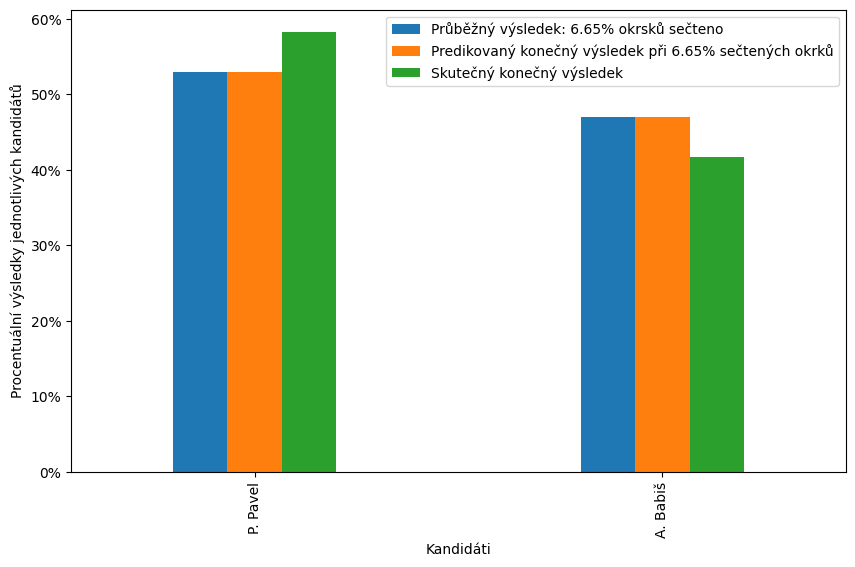

In [ ]:
from matplotlib.ticker import FuncFormatter


def percentage(x, pos):
    return '{:.0%}'.format(x)

ax = vysledky.plot(kind='bar', figsize=(10, 6), width=0.4)

plt.xlabel('Kandidáti')
plt.ylabel('Procentuální výsledky jednotlivých kandidátů')

formatter = FuncFormatter(percentage)
ax.yaxis.set_major_formatter(formatter)

plt.legend(loc='upper right')

plt.show()

In [ ]:
### POZOR, BEZI 2 MINUTY
from fancyimpute import SoftImpute, KNN


mse_list = []
rmse_list = []
hlasy_cols = [col for col in prez_2023_2_original_data.columns if col.startswith('HLASY_')]
hlasy_predikce_dict = {col: [] for col in hlasy_cols}

prez_2023_2_original_data_proc = pd.read_csv('prez_2023_2_proc.csv')
max_davka = prez_2023_2_original_data_proc['davka'].max()
prez_2023_2_proc_last_row = prez_2023_2_original_data_proc[prez_2023_2_original_data_proc['davka'] == max_davka]
final_result_prez_2023_2 = prez_2023_2_proc_last_row.drop(columns = ['davka', 'okrsku_secteno', 'volebni_ucast'], axis = 1)


for i in range(1, prez_2023_2_original_data['davka'].max()):

  prez_2023_2_dopl_matic_df = prez_2023_2_original_data.drop(columns = ['ZAPSANI_VOLICI', 'VYDANE_OBALKY', 'ODEVZDANE_OBALKY' ,'PLATNE_HLASY'], axis = 1)
  prez_2023_2_dopl_matic_df = prez_2023_2_dopl_matic_df.fillna(0)
  prez_2023_2_dopl_matic_prubezne_vysl = prez_2023_2_dopl_matic_df[prez_2023_2_dopl_matic_df['davka'] <= i]
  prez_2023_2_dopl_matic_bez_davky = prez_2023_2_dopl_matic_prubezne_vysl.drop(columns = ['davka'], axis = 1)

  hlasy_columns_rel = [col for col in ps_2021_original_data_proc.columns if col.startswith('HLASY_') and col != 'HLASY_ostatni']
  selected_columns = ['CIS_OBEC', 'CIS_OKRSEK'] + hlasy_columns_rel
  ps_2021_selected = ps_2021_original_data[selected_columns]
  hlasy_columns_dopl_matic = [col for col in ps_2021_original_data.columns if col.startswith('HLASY_')]
  hlasy_ostatni_columns = list(set(hlasy_columns_dopl_matic) - set(hlasy_columns_rel))
  ps_2021_selected['HLASY_ostatni'] = ps_2021_original_data[hlasy_ostatni_columns].sum(axis=1)

  prez_2018_1_dopl_matic_df = prez_2018_1_original_data.drop(columns = ['ZAPSANI_VOLICI', 'VYDANE_OBALKY', 'ODEVZDANE_OBALKY' ,'PLATNE_HLASY', 'davka'], axis = 1)
  prez_2018_1_dopl_matic_df = prez_2018_1_dopl_matic_df.fillna(0)

  prez_2018_2_dopl_matic_df = prez_2018_2_original_data.drop(columns = ['ZAPSANI_VOLICI', 'VYDANE_OBALKY', 'ODEVZDANE_OBALKY' ,'PLATNE_HLASY', 'davka'], axis = 1)
  prez_2018_2_dopl_matic_df = prez_2018_2_dopl_matic_df.fillna(0)

  df_2018_merged = prez_2018_1_dopl_matic_df.merge(prez_2018_2_dopl_matic_df, how = 'left', on = ['CIS_OBEC', 'CIS_OKRSEK'])

  df_2018_2021_merged = df_2018_merged.merge(ps_2021_selected, how = 'left', on = ['CIS_OBEC', 'CIS_OKRSEK'])

  df_na_values = df_2018_2021_merged.merge(prez_2023_2_dopl_matic_bez_davky, how = 'left', on = ['CIS_OBEC', 'CIS_OKRSEK'])
  df_na_values.set_index(['CIS_OBEC', 'CIS_OKRSEK'], inplace=True)

  df_soft_impute = df_na_values.copy()
  df_soft_impute = df_soft_impute.replace({pd.NA: np.nan})
  vote_columns = df_soft_impute.columns
  vote_matrix = df_soft_impute[vote_columns].to_numpy()

  scaler = StandardScaler()
  vote_matrix_standardized = scaler.fit_transform(vote_matrix)
  imputed_matrix_standardized = SoftImpute().fit_transform(vote_matrix_standardized)
  imputed_matrix = scaler.inverse_transform(imputed_matrix_standardized)

  df_soft_impute[vote_columns] = imputed_matrix
  df_soft_imputed = df_soft_impute.iloc[:, -2:]
  sorted_columns = sorted(df_soft_imputed.columns)
  df_soft_imputed = df_soft_imputed[sorted_columns]

  total_votes_per_party = df_soft_imputed.sum()
  total_votes = total_votes_per_party.sum()
  final_predictions_soft_impute = (total_votes_per_party / total_votes)
  final_predictions_soft_impute = pd.DataFrame(final_predictions_soft_impute).T
  final_predictions_soft_impute.columns = hlasy_cols

  for col in hlasy_predikce_dict:
    hlasy_predikce_dict[col].append(final_predictions_soft_impute[col].values[0])

  mse = mean_squared_error(final_predictions_soft_impute, final_result_prez_2023_2)
  mse_list.append(mse)
  rmse = sqrt(mse)
  rmse_list.append(rmse)

<ipython-input-505-a47b18ffc914>:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ps_2021_selected['HLASY_ostatni'] = ps_2021_original_data[hlasy_ostatni_columns].sum(axis=1)


[SoftImpute] Max Singular Value of X_init = 446.670536
[SoftImpute] Iter 1: observed MAE=0.049374 rank=21
[SoftImpute] Iter 2: observed MAE=0.049380 rank=21
[SoftImpute] Iter 3: observed MAE=0.049383 rank=21
[SoftImpute] Iter 4: observed MAE=0.049385 rank=21
[SoftImpute] Iter 5: observed MAE=0.049386 rank=21
[SoftImpute] Iter 6: observed MAE=0.049387 rank=21
[SoftImpute] Iter 7: observed MAE=0.049387 rank=21
[SoftImpute] Iter 8: observed MAE=0.049387 rank=21
[SoftImpute] Iter 9: observed MAE=0.049387 rank=21
[SoftImpute] Iter 10: observed MAE=0.049387 rank=21
[SoftImpute] Iter 11: observed MAE=0.049387 rank=21
[SoftImpute] Iter 12: observed MAE=0.049387 rank=21
[SoftImpute] Iter 13: observed MAE=0.049387 rank=21
[SoftImpute] Iter 14: observed MAE=0.049387 rank=21
[SoftImpute] Iter 15: observed MAE=0.049387 rank=21
[SoftImpute] Iter 16: observed MAE=0.049387 rank=21
[SoftImpute] Iter 17: observed MAE=0.049387 rank=21
[SoftImpute] Iter 18: observed MAE=0.049387 rank=21
[SoftImpute] Iter 

<ipython-input-505-a47b18ffc914>:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ps_2021_selected['HLASY_ostatni'] = ps_2021_original_data[hlasy_ostatni_columns].sum(axis=1)


[SoftImpute] Max Singular Value of X_init = 446.671979
[SoftImpute] Iter 1: observed MAE=0.049765 rank=22
[SoftImpute] Iter 2: observed MAE=0.049770 rank=22
[SoftImpute] Iter 3: observed MAE=0.049773 rank=22
[SoftImpute] Iter 4: observed MAE=0.049774 rank=22
[SoftImpute] Iter 5: observed MAE=0.049774 rank=22
[SoftImpute] Iter 6: observed MAE=0.049774 rank=22
[SoftImpute] Iter 7: observed MAE=0.049774 rank=22
[SoftImpute] Iter 8: observed MAE=0.049773 rank=22
[SoftImpute] Iter 9: observed MAE=0.049772 rank=22
[SoftImpute] Iter 10: observed MAE=0.049772 rank=22
[SoftImpute] Iter 11: observed MAE=0.049771 rank=22
[SoftImpute] Iter 12: observed MAE=0.049770 rank=22
[SoftImpute] Iter 13: observed MAE=0.049770 rank=22
[SoftImpute] Iter 14: observed MAE=0.049769 rank=22
[SoftImpute] Iter 15: observed MAE=0.049768 rank=22
[SoftImpute] Iter 16: observed MAE=0.049768 rank=22
[SoftImpute] Iter 17: observed MAE=0.049767 rank=22
[SoftImpute] Iter 18: observed MAE=0.049766 rank=22
[SoftImpute] Iter 

<ipython-input-505-a47b18ffc914>:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ps_2021_selected['HLASY_ostatni'] = ps_2021_original_data[hlasy_ostatni_columns].sum(axis=1)


[SoftImpute] Max Singular Value of X_init = 446.692949
[SoftImpute] Iter 1: observed MAE=0.050071 rank=22
[SoftImpute] Iter 2: observed MAE=0.050074 rank=22
[SoftImpute] Iter 3: observed MAE=0.050074 rank=22
[SoftImpute] Iter 4: observed MAE=0.050074 rank=22
[SoftImpute] Iter 5: observed MAE=0.050072 rank=22
[SoftImpute] Iter 6: observed MAE=0.050071 rank=22
[SoftImpute] Iter 7: observed MAE=0.050068 rank=22
[SoftImpute] Iter 8: observed MAE=0.050066 rank=22
[SoftImpute] Iter 9: observed MAE=0.050064 rank=22
[SoftImpute] Iter 10: observed MAE=0.050062 rank=22
[SoftImpute] Iter 11: observed MAE=0.050060 rank=22
[SoftImpute] Iter 12: observed MAE=0.050058 rank=22
[SoftImpute] Iter 13: observed MAE=0.050056 rank=22
[SoftImpute] Iter 14: observed MAE=0.050054 rank=22
[SoftImpute] Iter 15: observed MAE=0.050052 rank=22
[SoftImpute] Iter 16: observed MAE=0.050050 rank=22
[SoftImpute] Iter 17: observed MAE=0.050048 rank=22
[SoftImpute] Iter 18: observed MAE=0.050047 rank=22
[SoftImpute] Iter 

<ipython-input-505-a47b18ffc914>:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ps_2021_selected['HLASY_ostatni'] = ps_2021_original_data[hlasy_ostatni_columns].sum(axis=1)


[SoftImpute] Max Singular Value of X_init = 446.800282
[SoftImpute] Iter 1: observed MAE=0.050283 rank=22
[SoftImpute] Iter 2: observed MAE=0.050285 rank=22
[SoftImpute] Iter 3: observed MAE=0.050284 rank=22
[SoftImpute] Iter 4: observed MAE=0.050281 rank=22
[SoftImpute] Iter 5: observed MAE=0.050278 rank=22
[SoftImpute] Iter 6: observed MAE=0.050275 rank=22
[SoftImpute] Iter 7: observed MAE=0.050272 rank=22
[SoftImpute] Iter 8: observed MAE=0.050268 rank=22
[SoftImpute] Iter 9: observed MAE=0.050265 rank=22
[SoftImpute] Iter 10: observed MAE=0.050261 rank=22
[SoftImpute] Iter 11: observed MAE=0.050258 rank=22
[SoftImpute] Iter 12: observed MAE=0.050255 rank=22
[SoftImpute] Iter 13: observed MAE=0.050251 rank=22
[SoftImpute] Iter 14: observed MAE=0.050248 rank=22
[SoftImpute] Iter 15: observed MAE=0.050246 rank=22
[SoftImpute] Iter 16: observed MAE=0.050243 rank=22
[SoftImpute] Iter 17: observed MAE=0.050240 rank=22
[SoftImpute] Iter 18: observed MAE=0.050238 rank=22
[SoftImpute] Iter 

<ipython-input-505-a47b18ffc914>:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ps_2021_selected['HLASY_ostatni'] = ps_2021_original_data[hlasy_ostatni_columns].sum(axis=1)


[SoftImpute] Max Singular Value of X_init = 447.109249
[SoftImpute] Iter 1: observed MAE=0.050380 rank=22
[SoftImpute] Iter 2: observed MAE=0.050380 rank=22
[SoftImpute] Iter 3: observed MAE=0.050378 rank=22
[SoftImpute] Iter 4: observed MAE=0.050375 rank=22
[SoftImpute] Iter 5: observed MAE=0.050371 rank=22
[SoftImpute] Iter 6: observed MAE=0.050367 rank=22
[SoftImpute] Iter 7: observed MAE=0.050363 rank=22
[SoftImpute] Iter 8: observed MAE=0.050358 rank=22
[SoftImpute] Iter 9: observed MAE=0.050354 rank=22
[SoftImpute] Iter 10: observed MAE=0.050350 rank=22
[SoftImpute] Iter 11: observed MAE=0.050346 rank=22
[SoftImpute] Iter 12: observed MAE=0.050341 rank=22
[SoftImpute] Iter 13: observed MAE=0.050338 rank=22
[SoftImpute] Iter 14: observed MAE=0.050334 rank=22
[SoftImpute] Iter 15: observed MAE=0.050330 rank=22
[SoftImpute] Iter 16: observed MAE=0.050327 rank=22
[SoftImpute] Iter 17: observed MAE=0.050323 rank=22
[SoftImpute] Iter 18: observed MAE=0.050320 rank=22
[SoftImpute] Iter 

<ipython-input-505-a47b18ffc914>:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ps_2021_selected['HLASY_ostatni'] = ps_2021_original_data[hlasy_ostatni_columns].sum(axis=1)


[SoftImpute] Max Singular Value of X_init = 447.739398
[SoftImpute] Iter 1: observed MAE=0.050453 rank=22
[SoftImpute] Iter 2: observed MAE=0.050454 rank=22
[SoftImpute] Iter 3: observed MAE=0.050453 rank=22
[SoftImpute] Iter 4: observed MAE=0.050451 rank=22
[SoftImpute] Iter 5: observed MAE=0.050447 rank=22
[SoftImpute] Iter 6: observed MAE=0.050443 rank=22
[SoftImpute] Iter 7: observed MAE=0.050439 rank=22
[SoftImpute] Iter 8: observed MAE=0.050435 rank=22
[SoftImpute] Iter 9: observed MAE=0.050431 rank=22
[SoftImpute] Iter 10: observed MAE=0.050426 rank=22
[SoftImpute] Iter 11: observed MAE=0.050422 rank=22
[SoftImpute] Iter 12: observed MAE=0.050418 rank=22
[SoftImpute] Iter 13: observed MAE=0.050414 rank=22
[SoftImpute] Iter 14: observed MAE=0.050410 rank=22
[SoftImpute] Iter 15: observed MAE=0.050406 rank=22
[SoftImpute] Iter 16: observed MAE=0.050403 rank=22
[SoftImpute] Iter 17: observed MAE=0.050399 rank=22
[SoftImpute] Iter 18: observed MAE=0.050396 rank=22
[SoftImpute] Iter 

<ipython-input-505-a47b18ffc914>:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ps_2021_selected['HLASY_ostatni'] = ps_2021_original_data[hlasy_ostatni_columns].sum(axis=1)


[SoftImpute] Max Singular Value of X_init = 448.836529
[SoftImpute] Iter 1: observed MAE=0.050470 rank=22
[SoftImpute] Iter 2: observed MAE=0.050474 rank=22
[SoftImpute] Iter 3: observed MAE=0.050475 rank=22
[SoftImpute] Iter 4: observed MAE=0.050475 rank=22
[SoftImpute] Iter 5: observed MAE=0.050473 rank=22
[SoftImpute] Iter 6: observed MAE=0.050471 rank=22
[SoftImpute] Iter 7: observed MAE=0.050469 rank=22
[SoftImpute] Iter 8: observed MAE=0.050466 rank=22
[SoftImpute] Iter 9: observed MAE=0.050464 rank=22
[SoftImpute] Iter 10: observed MAE=0.050461 rank=22
[SoftImpute] Iter 11: observed MAE=0.050458 rank=22
[SoftImpute] Iter 12: observed MAE=0.050455 rank=22
[SoftImpute] Iter 13: observed MAE=0.050453 rank=22
[SoftImpute] Iter 14: observed MAE=0.050450 rank=22
[SoftImpute] Iter 15: observed MAE=0.050447 rank=22
[SoftImpute] Iter 16: observed MAE=0.050445 rank=22
[SoftImpute] Iter 17: observed MAE=0.050442 rank=22
[SoftImpute] Iter 18: observed MAE=0.050440 rank=22
[SoftImpute] Iter 

<ipython-input-505-a47b18ffc914>:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ps_2021_selected['HLASY_ostatni'] = ps_2021_original_data[hlasy_ostatni_columns].sum(axis=1)


[SoftImpute] Max Singular Value of X_init = 450.427488
[SoftImpute] Iter 1: observed MAE=0.050444 rank=22
[SoftImpute] Iter 2: observed MAE=0.050451 rank=22
[SoftImpute] Iter 3: observed MAE=0.050455 rank=22
[SoftImpute] Iter 4: observed MAE=0.050458 rank=22
[SoftImpute] Iter 5: observed MAE=0.050460 rank=22
[SoftImpute] Iter 6: observed MAE=0.050461 rank=22
[SoftImpute] Iter 7: observed MAE=0.050462 rank=22
[SoftImpute] Iter 8: observed MAE=0.050462 rank=22
[SoftImpute] Iter 9: observed MAE=0.050462 rank=22
[SoftImpute] Iter 10: observed MAE=0.050462 rank=22
[SoftImpute] Iter 11: observed MAE=0.050462 rank=22
[SoftImpute] Iter 12: observed MAE=0.050462 rank=22
[SoftImpute] Iter 13: observed MAE=0.050461 rank=22
[SoftImpute] Iter 14: observed MAE=0.050461 rank=22
[SoftImpute] Iter 15: observed MAE=0.050461 rank=22
[SoftImpute] Iter 16: observed MAE=0.050461 rank=22
[SoftImpute] Iter 17: observed MAE=0.050461 rank=22
[SoftImpute] Iter 18: observed MAE=0.050461 rank=22
[SoftImpute] Iter 

<ipython-input-505-a47b18ffc914>:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ps_2021_selected['HLASY_ostatni'] = ps_2021_original_data[hlasy_ostatni_columns].sum(axis=1)


[SoftImpute] Max Singular Value of X_init = 452.504172
[SoftImpute] Iter 1: observed MAE=0.050435 rank=22
[SoftImpute] Iter 2: observed MAE=0.050447 rank=22
[SoftImpute] Iter 3: observed MAE=0.050456 rank=22
[SoftImpute] Iter 4: observed MAE=0.050464 rank=22
[SoftImpute] Iter 5: observed MAE=0.050470 rank=22
[SoftImpute] Iter 6: observed MAE=0.050476 rank=22
[SoftImpute] Iter 7: observed MAE=0.050481 rank=22
[SoftImpute] Iter 8: observed MAE=0.050486 rank=22
[SoftImpute] Iter 9: observed MAE=0.050490 rank=22
[SoftImpute] Iter 10: observed MAE=0.050494 rank=22
[SoftImpute] Iter 11: observed MAE=0.050498 rank=22
[SoftImpute] Iter 12: observed MAE=0.050502 rank=22
[SoftImpute] Iter 13: observed MAE=0.050506 rank=22
[SoftImpute] Iter 14: observed MAE=0.050510 rank=22
[SoftImpute] Iter 15: observed MAE=0.050513 rank=22
[SoftImpute] Iter 16: observed MAE=0.050517 rank=22
[SoftImpute] Iter 17: observed MAE=0.050520 rank=22
[SoftImpute] Iter 18: observed MAE=0.050524 rank=22
[SoftImpute] Iter 

<ipython-input-505-a47b18ffc914>:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ps_2021_selected['HLASY_ostatni'] = ps_2021_original_data[hlasy_ostatni_columns].sum(axis=1)


[SoftImpute] Max Singular Value of X_init = 455.169791
[SoftImpute] Iter 1: observed MAE=0.050461 rank=22
[SoftImpute] Iter 2: observed MAE=0.050480 rank=22
[SoftImpute] Iter 3: observed MAE=0.050496 rank=22
[SoftImpute] Iter 4: observed MAE=0.050511 rank=22
[SoftImpute] Iter 5: observed MAE=0.050524 rank=22
[SoftImpute] Iter 6: observed MAE=0.050536 rank=22
[SoftImpute] Iter 7: observed MAE=0.050548 rank=22
[SoftImpute] Iter 8: observed MAE=0.050559 rank=22
[SoftImpute] Iter 9: observed MAE=0.050569 rank=22
[SoftImpute] Iter 10: observed MAE=0.050579 rank=22
[SoftImpute] Iter 11: observed MAE=0.050588 rank=22
[SoftImpute] Iter 12: observed MAE=0.050597 rank=22
[SoftImpute] Iter 13: observed MAE=0.050605 rank=22
[SoftImpute] Iter 14: observed MAE=0.050613 rank=22
[SoftImpute] Iter 15: observed MAE=0.050622 rank=22
[SoftImpute] Iter 16: observed MAE=0.050630 rank=22
[SoftImpute] Iter 17: observed MAE=0.050639 rank=22
[SoftImpute] Iter 18: observed MAE=0.050648 rank=22
[SoftImpute] Iter 

<ipython-input-505-a47b18ffc914>:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ps_2021_selected['HLASY_ostatni'] = ps_2021_original_data[hlasy_ostatni_columns].sum(axis=1)


[SoftImpute] Max Singular Value of X_init = 457.686045
[SoftImpute] Iter 1: observed MAE=0.050474 rank=22
[SoftImpute] Iter 2: observed MAE=0.050501 rank=22
[SoftImpute] Iter 3: observed MAE=0.050525 rank=22
[SoftImpute] Iter 4: observed MAE=0.050547 rank=22
[SoftImpute] Iter 5: observed MAE=0.050568 rank=22
[SoftImpute] Iter 6: observed MAE=0.050589 rank=22
[SoftImpute] Iter 7: observed MAE=0.050608 rank=22
[SoftImpute] Iter 8: observed MAE=0.050627 rank=22
[SoftImpute] Iter 9: observed MAE=0.050645 rank=22
[SoftImpute] Iter 10: observed MAE=0.050663 rank=22
[SoftImpute] Iter 11: observed MAE=0.050680 rank=22
[SoftImpute] Iter 12: observed MAE=0.050698 rank=22
[SoftImpute] Iter 13: observed MAE=0.050715 rank=22
[SoftImpute] Iter 14: observed MAE=0.050732 rank=22
[SoftImpute] Iter 15: observed MAE=0.050749 rank=22
[SoftImpute] Iter 16: observed MAE=0.050767 rank=22
[SoftImpute] Iter 17: observed MAE=0.050784 rank=22
[SoftImpute] Iter 18: observed MAE=0.050801 rank=22
[SoftImpute] Iter 

<ipython-input-505-a47b18ffc914>:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ps_2021_selected['HLASY_ostatni'] = ps_2021_original_data[hlasy_ostatni_columns].sum(axis=1)


[SoftImpute] Max Singular Value of X_init = 460.217894
[SoftImpute] Iter 1: observed MAE=0.050504 rank=22
[SoftImpute] Iter 2: observed MAE=0.050541 rank=22
[SoftImpute] Iter 3: observed MAE=0.050575 rank=22
[SoftImpute] Iter 4: observed MAE=0.050607 rank=22
[SoftImpute] Iter 5: observed MAE=0.050639 rank=22
[SoftImpute] Iter 6: observed MAE=0.050671 rank=22
[SoftImpute] Iter 7: observed MAE=0.050702 rank=22
[SoftImpute] Iter 8: observed MAE=0.050731 rank=22
[SoftImpute] Iter 9: observed MAE=0.050761 rank=22
[SoftImpute] Iter 10: observed MAE=0.050789 rank=22
[SoftImpute] Iter 11: observed MAE=0.050817 rank=22
[SoftImpute] Iter 12: observed MAE=0.050844 rank=22
[SoftImpute] Iter 13: observed MAE=0.050872 rank=22
[SoftImpute] Iter 14: observed MAE=0.050899 rank=22
[SoftImpute] Iter 15: observed MAE=0.050925 rank=22
[SoftImpute] Iter 16: observed MAE=0.050951 rank=22
[SoftImpute] Iter 17: observed MAE=0.050977 rank=22
[SoftImpute] Iter 18: observed MAE=0.051001 rank=22
[SoftImpute] Iter 

<ipython-input-505-a47b18ffc914>:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ps_2021_selected['HLASY_ostatni'] = ps_2021_original_data[hlasy_ostatni_columns].sum(axis=1)


[SoftImpute] Max Singular Value of X_init = 462.421380
[SoftImpute] Iter 1: observed MAE=0.050516 rank=22
[SoftImpute] Iter 2: observed MAE=0.050564 rank=22
[SoftImpute] Iter 3: observed MAE=0.050609 rank=22
[SoftImpute] Iter 4: observed MAE=0.050655 rank=22
[SoftImpute] Iter 5: observed MAE=0.050699 rank=22
[SoftImpute] Iter 6: observed MAE=0.050742 rank=22
[SoftImpute] Iter 7: observed MAE=0.050784 rank=22
[SoftImpute] Iter 8: observed MAE=0.050825 rank=22
[SoftImpute] Iter 9: observed MAE=0.050864 rank=22
[SoftImpute] Iter 10: observed MAE=0.050902 rank=22
[SoftImpute] Iter 11: observed MAE=0.050940 rank=22
[SoftImpute] Iter 12: observed MAE=0.050977 rank=22
[SoftImpute] Iter 13: observed MAE=0.051013 rank=22
[SoftImpute] Iter 14: observed MAE=0.051048 rank=22
[SoftImpute] Iter 15: observed MAE=0.051082 rank=22
[SoftImpute] Iter 16: observed MAE=0.051115 rank=22
[SoftImpute] Iter 17: observed MAE=0.051145 rank=22
[SoftImpute] Iter 18: observed MAE=0.051174 rank=22
[SoftImpute] Iter 

<ipython-input-505-a47b18ffc914>:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ps_2021_selected['HLASY_ostatni'] = ps_2021_original_data[hlasy_ostatni_columns].sum(axis=1)


[SoftImpute] Max Singular Value of X_init = 464.355875
[SoftImpute] Iter 1: observed MAE=0.050520 rank=22
[SoftImpute] Iter 2: observed MAE=0.050582 rank=22
[SoftImpute] Iter 3: observed MAE=0.050642 rank=22
[SoftImpute] Iter 4: observed MAE=0.050702 rank=22
[SoftImpute] Iter 5: observed MAE=0.050759 rank=22
[SoftImpute] Iter 6: observed MAE=0.050816 rank=22
[SoftImpute] Iter 7: observed MAE=0.050869 rank=22
[SoftImpute] Iter 8: observed MAE=0.050920 rank=22
[SoftImpute] Iter 9: observed MAE=0.050968 rank=22
[SoftImpute] Iter 10: observed MAE=0.051014 rank=22
[SoftImpute] Iter 11: observed MAE=0.051059 rank=22
[SoftImpute] Iter 12: observed MAE=0.051101 rank=22
[SoftImpute] Iter 13: observed MAE=0.051140 rank=22
[SoftImpute] Iter 14: observed MAE=0.051177 rank=22
[SoftImpute] Iter 15: observed MAE=0.051210 rank=22
[SoftImpute] Iter 16: observed MAE=0.051239 rank=22
[SoftImpute] Iter 17: observed MAE=0.051264 rank=22
[SoftImpute] Iter 18: observed MAE=0.051285 rank=22
[SoftImpute] Iter 

<ipython-input-505-a47b18ffc914>:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ps_2021_selected['HLASY_ostatni'] = ps_2021_original_data[hlasy_ostatni_columns].sum(axis=1)


[SoftImpute] Max Singular Value of X_init = 466.196497
[SoftImpute] Iter 1: observed MAE=0.050542 rank=22
[SoftImpute] Iter 2: observed MAE=0.050622 rank=22
[SoftImpute] Iter 3: observed MAE=0.050699 rank=22
[SoftImpute] Iter 4: observed MAE=0.050775 rank=22
[SoftImpute] Iter 5: observed MAE=0.050847 rank=22
[SoftImpute] Iter 6: observed MAE=0.050914 rank=22
[SoftImpute] Iter 7: observed MAE=0.050976 rank=22
[SoftImpute] Iter 8: observed MAE=0.051034 rank=22
[SoftImpute] Iter 9: observed MAE=0.051088 rank=22
[SoftImpute] Iter 10: observed MAE=0.051138 rank=22
[SoftImpute] Iter 11: observed MAE=0.051182 rank=22
[SoftImpute] Iter 12: observed MAE=0.051220 rank=22
[SoftImpute] Iter 13: observed MAE=0.051253 rank=22
[SoftImpute] Iter 14: observed MAE=0.051279 rank=22
[SoftImpute] Iter 15: observed MAE=0.051300 rank=22
[SoftImpute] Iter 16: observed MAE=0.051316 rank=22
[SoftImpute] Iter 17: observed MAE=0.051328 rank=22
[SoftImpute] Iter 18: observed MAE=0.051337 rank=22
[SoftImpute] Iter 

<ipython-input-505-a47b18ffc914>:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ps_2021_selected['HLASY_ostatni'] = ps_2021_original_data[hlasy_ostatni_columns].sum(axis=1)


[SoftImpute] Max Singular Value of X_init = 467.491835
[SoftImpute] Iter 1: observed MAE=0.050544 rank=22
[SoftImpute] Iter 2: observed MAE=0.050641 rank=22
[SoftImpute] Iter 3: observed MAE=0.050737 rank=22
[SoftImpute] Iter 4: observed MAE=0.050828 rank=22
[SoftImpute] Iter 5: observed MAE=0.050910 rank=22
[SoftImpute] Iter 6: observed MAE=0.050986 rank=22
[SoftImpute] Iter 7: observed MAE=0.051054 rank=22
[SoftImpute] Iter 8: observed MAE=0.051115 rank=22
[SoftImpute] Iter 9: observed MAE=0.051167 rank=22
[SoftImpute] Iter 10: observed MAE=0.051212 rank=22
[SoftImpute] Iter 11: observed MAE=0.051247 rank=22
[SoftImpute] Iter 12: observed MAE=0.051275 rank=22
[SoftImpute] Iter 13: observed MAE=0.051295 rank=21
[SoftImpute] Iter 14: observed MAE=0.051308 rank=21
[SoftImpute] Iter 15: observed MAE=0.051318 rank=21
[SoftImpute] Iter 16: observed MAE=0.051325 rank=21
[SoftImpute] Iter 17: observed MAE=0.051330 rank=21
[SoftImpute] Iter 18: observed MAE=0.051333 rank=21
[SoftImpute] Iter 

<ipython-input-505-a47b18ffc914>:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ps_2021_selected['HLASY_ostatni'] = ps_2021_original_data[hlasy_ostatni_columns].sum(axis=1)


[SoftImpute] Iter 1: observed MAE=0.050587 rank=22
[SoftImpute] Iter 2: observed MAE=0.050702 rank=22
[SoftImpute] Iter 3: observed MAE=0.050812 rank=22
[SoftImpute] Iter 4: observed MAE=0.050911 rank=22
[SoftImpute] Iter 5: observed MAE=0.050998 rank=22
[SoftImpute] Iter 6: observed MAE=0.051075 rank=22
[SoftImpute] Iter 7: observed MAE=0.051141 rank=22
[SoftImpute] Iter 8: observed MAE=0.051194 rank=21
[SoftImpute] Iter 9: observed MAE=0.051232 rank=21
[SoftImpute] Iter 10: observed MAE=0.051259 rank=21
[SoftImpute] Iter 11: observed MAE=0.051277 rank=21
[SoftImpute] Iter 12: observed MAE=0.051289 rank=21
[SoftImpute] Iter 13: observed MAE=0.051297 rank=21
[SoftImpute] Iter 14: observed MAE=0.051302 rank=21
[SoftImpute] Iter 15: observed MAE=0.051305 rank=21
[SoftImpute] Iter 16: observed MAE=0.051307 rank=21
[SoftImpute] Iter 17: observed MAE=0.051309 rank=21
[SoftImpute] Iter 18: observed MAE=0.051309 rank=21
[SoftImpute] Iter 19: observed MAE=0.051310 rank=21
[SoftImpute] Iter 20:

<ipython-input-505-a47b18ffc914>:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ps_2021_selected['HLASY_ostatni'] = ps_2021_original_data[hlasy_ostatni_columns].sum(axis=1)


[SoftImpute] Max Singular Value of X_init = 469.588808
[SoftImpute] Iter 1: observed MAE=0.050631 rank=22
[SoftImpute] Iter 2: observed MAE=0.050764 rank=22
[SoftImpute] Iter 3: observed MAE=0.050886 rank=22
[SoftImpute] Iter 4: observed MAE=0.050993 rank=22
[SoftImpute] Iter 5: observed MAE=0.051083 rank=22
[SoftImpute] Iter 6: observed MAE=0.051153 rank=21
[SoftImpute] Iter 7: observed MAE=0.051204 rank=21
[SoftImpute] Iter 8: observed MAE=0.051238 rank=21
[SoftImpute] Iter 9: observed MAE=0.051259 rank=21
[SoftImpute] Iter 10: observed MAE=0.051270 rank=21
[SoftImpute] Iter 11: observed MAE=0.051277 rank=21
[SoftImpute] Iter 12: observed MAE=0.051280 rank=21
[SoftImpute] Iter 13: observed MAE=0.051282 rank=21
[SoftImpute] Iter 14: observed MAE=0.051283 rank=21
[SoftImpute] Iter 15: observed MAE=0.051283 rank=21
[SoftImpute] Iter 16: observed MAE=0.051284 rank=21
[SoftImpute] Iter 17: observed MAE=0.051284 rank=21
[SoftImpute] Iter 18: observed MAE=0.051284 rank=21
[SoftImpute] Iter 

<ipython-input-505-a47b18ffc914>:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ps_2021_selected['HLASY_ostatni'] = ps_2021_original_data[hlasy_ostatni_columns].sum(axis=1)


[SoftImpute] Max Singular Value of X_init = 470.253070
[SoftImpute] Iter 1: observed MAE=0.050685 rank=22
[SoftImpute] Iter 2: observed MAE=0.050833 rank=22
[SoftImpute] Iter 3: observed MAE=0.050966 rank=22
[SoftImpute] Iter 4: observed MAE=0.051073 rank=21
[SoftImpute] Iter 5: observed MAE=0.051156 rank=21
[SoftImpute] Iter 6: observed MAE=0.051215 rank=21
[SoftImpute] Iter 7: observed MAE=0.051252 rank=21
[SoftImpute] Iter 8: observed MAE=0.051272 rank=21
[SoftImpute] Iter 9: observed MAE=0.051282 rank=21
[SoftImpute] Iter 10: observed MAE=0.051287 rank=21
[SoftImpute] Iter 11: observed MAE=0.051289 rank=21
[SoftImpute] Iter 12: observed MAE=0.051289 rank=21
[SoftImpute] Iter 13: observed MAE=0.051289 rank=21
[SoftImpute] Iter 14: observed MAE=0.051289 rank=21
[SoftImpute] Iter 15: observed MAE=0.051289 rank=21
[SoftImpute] Iter 16: observed MAE=0.051289 rank=21
[SoftImpute] Iter 17: observed MAE=0.051289 rank=21
[SoftImpute] Iter 18: observed MAE=0.051289 rank=21
[SoftImpute] Iter 

<ipython-input-505-a47b18ffc914>:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ps_2021_selected['HLASY_ostatni'] = ps_2021_original_data[hlasy_ostatni_columns].sum(axis=1)


[SoftImpute] Max Singular Value of X_init = 470.883026
[SoftImpute] Iter 1: observed MAE=0.050758 rank=22
[SoftImpute] Iter 2: observed MAE=0.050913 rank=21
[SoftImpute] Iter 3: observed MAE=0.051043 rank=21
[SoftImpute] Iter 4: observed MAE=0.051144 rank=21
[SoftImpute] Iter 5: observed MAE=0.051214 rank=21
[SoftImpute] Iter 6: observed MAE=0.051256 rank=21
[SoftImpute] Iter 7: observed MAE=0.051279 rank=21
[SoftImpute] Iter 8: observed MAE=0.051290 rank=21
[SoftImpute] Iter 9: observed MAE=0.051295 rank=21
[SoftImpute] Iter 10: observed MAE=0.051297 rank=21
[SoftImpute] Iter 11: observed MAE=0.051298 rank=21
[SoftImpute] Iter 12: observed MAE=0.051298 rank=21
[SoftImpute] Iter 13: observed MAE=0.051299 rank=21
[SoftImpute] Iter 14: observed MAE=0.051298 rank=21
[SoftImpute] Iter 15: observed MAE=0.051298 rank=21
[SoftImpute] Iter 16: observed MAE=0.051298 rank=21
[SoftImpute] Iter 17: observed MAE=0.051298 rank=21
[SoftImpute] Iter 18: observed MAE=0.051298 rank=21
[SoftImpute] Iter 

<ipython-input-505-a47b18ffc914>:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ps_2021_selected['HLASY_ostatni'] = ps_2021_original_data[hlasy_ostatni_columns].sum(axis=1)


[SoftImpute] Max Singular Value of X_init = 471.295405
[SoftImpute] Iter 1: observed MAE=0.050830 rank=21
[SoftImpute] Iter 2: observed MAE=0.050991 rank=21
[SoftImpute] Iter 3: observed MAE=0.051119 rank=21
[SoftImpute] Iter 4: observed MAE=0.051210 rank=21
[SoftImpute] Iter 5: observed MAE=0.051265 rank=21
[SoftImpute] Iter 6: observed MAE=0.051295 rank=21
[SoftImpute] Iter 7: observed MAE=0.051309 rank=21
[SoftImpute] Iter 8: observed MAE=0.051315 rank=21
[SoftImpute] Iter 9: observed MAE=0.051318 rank=21
[SoftImpute] Iter 10: observed MAE=0.051320 rank=21
[SoftImpute] Iter 11: observed MAE=0.051320 rank=21
[SoftImpute] Iter 12: observed MAE=0.051320 rank=21
[SoftImpute] Iter 13: observed MAE=0.051320 rank=21
[SoftImpute] Iter 14: observed MAE=0.051320 rank=21
[SoftImpute] Iter 15: observed MAE=0.051320 rank=21
[SoftImpute] Iter 16: observed MAE=0.051320 rank=21
[SoftImpute] Iter 17: observed MAE=0.051320 rank=21
[SoftImpute] Iter 18: observed MAE=0.051320 rank=21
[SoftImpute] Iter 

<ipython-input-505-a47b18ffc914>:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ps_2021_selected['HLASY_ostatni'] = ps_2021_original_data[hlasy_ostatni_columns].sum(axis=1)


[SoftImpute] Max Singular Value of X_init = 471.500828
[SoftImpute] Iter 1: observed MAE=0.050890 rank=21
[SoftImpute] Iter 2: observed MAE=0.051047 rank=21
[SoftImpute] Iter 3: observed MAE=0.051166 rank=21
[SoftImpute] Iter 4: observed MAE=0.051243 rank=21
[SoftImpute] Iter 5: observed MAE=0.051287 rank=21
[SoftImpute] Iter 6: observed MAE=0.051309 rank=21
[SoftImpute] Iter 7: observed MAE=0.051319 rank=21
[SoftImpute] Iter 8: observed MAE=0.051324 rank=21
[SoftImpute] Iter 9: observed MAE=0.051326 rank=21
[SoftImpute] Iter 10: observed MAE=0.051327 rank=21
[SoftImpute] Iter 11: observed MAE=0.051328 rank=21
[SoftImpute] Iter 12: observed MAE=0.051328 rank=21
[SoftImpute] Iter 13: observed MAE=0.051328 rank=21
[SoftImpute] Iter 14: observed MAE=0.051328 rank=21
[SoftImpute] Iter 15: observed MAE=0.051328 rank=21
[SoftImpute] Iter 16: observed MAE=0.051328 rank=21
[SoftImpute] Iter 17: observed MAE=0.051328 rank=21
[SoftImpute] Iter 18: observed MAE=0.051328 rank=21
[SoftImpute] Iter 

<ipython-input-505-a47b18ffc914>:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ps_2021_selected['HLASY_ostatni'] = ps_2021_original_data[hlasy_ostatni_columns].sum(axis=1)


[SoftImpute] Max Singular Value of X_init = 471.654556
[SoftImpute] Iter 1: observed MAE=0.050929 rank=21
[SoftImpute] Iter 2: observed MAE=0.051084 rank=21
[SoftImpute] Iter 3: observed MAE=0.051196 rank=21
[SoftImpute] Iter 4: observed MAE=0.051266 rank=21
[SoftImpute] Iter 5: observed MAE=0.051303 rank=21
[SoftImpute] Iter 6: observed MAE=0.051321 rank=21
[SoftImpute] Iter 7: observed MAE=0.051330 rank=21
[SoftImpute] Iter 8: observed MAE=0.051334 rank=21
[SoftImpute] Iter 9: observed MAE=0.051335 rank=21
[SoftImpute] Iter 10: observed MAE=0.051336 rank=21
[SoftImpute] Iter 11: observed MAE=0.051337 rank=21
[SoftImpute] Iter 12: observed MAE=0.051337 rank=21
[SoftImpute] Iter 13: observed MAE=0.051337 rank=21
[SoftImpute] Iter 14: observed MAE=0.051337 rank=21
[SoftImpute] Iter 15: observed MAE=0.051337 rank=21
[SoftImpute] Iter 16: observed MAE=0.051337 rank=21
[SoftImpute] Iter 17: observed MAE=0.051337 rank=21
[SoftImpute] Iter 18: observed MAE=0.051337 rank=21
[SoftImpute] Iter 

<ipython-input-505-a47b18ffc914>:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ps_2021_selected['HLASY_ostatni'] = ps_2021_original_data[hlasy_ostatni_columns].sum(axis=1)


[SoftImpute] Max Singular Value of X_init = 471.817755
[SoftImpute] Iter 1: observed MAE=0.050997 rank=21
[SoftImpute] Iter 2: observed MAE=0.051144 rank=21
[SoftImpute] Iter 3: observed MAE=0.051238 rank=21
[SoftImpute] Iter 4: observed MAE=0.051290 rank=21
[SoftImpute] Iter 5: observed MAE=0.051316 rank=21
[SoftImpute] Iter 6: observed MAE=0.051328 rank=21
[SoftImpute] Iter 7: observed MAE=0.051334 rank=21
[SoftImpute] Iter 8: observed MAE=0.051337 rank=21
[SoftImpute] Iter 9: observed MAE=0.051339 rank=21
[SoftImpute] Iter 10: observed MAE=0.051339 rank=21
[SoftImpute] Iter 11: observed MAE=0.051340 rank=21
[SoftImpute] Iter 12: observed MAE=0.051340 rank=21
[SoftImpute] Iter 13: observed MAE=0.051340 rank=21
[SoftImpute] Iter 14: observed MAE=0.051340 rank=21
[SoftImpute] Iter 15: observed MAE=0.051340 rank=21
[SoftImpute] Iter 16: observed MAE=0.051340 rank=21
[SoftImpute] Iter 17: observed MAE=0.051340 rank=21
[SoftImpute] Iter 18: observed MAE=0.051340 rank=21
[SoftImpute] Iter 

<ipython-input-505-a47b18ffc914>:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ps_2021_selected['HLASY_ostatni'] = ps_2021_original_data[hlasy_ostatni_columns].sum(axis=1)


[SoftImpute] Max Singular Value of X_init = 471.765085
[SoftImpute] Iter 1: observed MAE=0.050968 rank=21
[SoftImpute] Iter 2: observed MAE=0.051083 rank=21
[SoftImpute] Iter 3: observed MAE=0.051150 rank=21
[SoftImpute] Iter 4: observed MAE=0.051185 rank=21
[SoftImpute] Iter 5: observed MAE=0.051203 rank=21
[SoftImpute] Iter 6: observed MAE=0.051211 rank=21
[SoftImpute] Iter 7: observed MAE=0.051215 rank=21
[SoftImpute] Iter 8: observed MAE=0.051217 rank=21
[SoftImpute] Iter 9: observed MAE=0.051218 rank=21
[SoftImpute] Iter 10: observed MAE=0.051218 rank=21
[SoftImpute] Iter 11: observed MAE=0.051218 rank=21
[SoftImpute] Iter 12: observed MAE=0.051218 rank=21
[SoftImpute] Iter 13: observed MAE=0.051218 rank=21
[SoftImpute] Iter 14: observed MAE=0.051218 rank=21
[SoftImpute] Iter 15: observed MAE=0.051218 rank=21
[SoftImpute] Iter 16: observed MAE=0.051218 rank=21
[SoftImpute] Iter 17: observed MAE=0.051218 rank=21
[SoftImpute] Iter 18: observed MAE=0.051218 rank=21
[SoftImpute] Iter 

<ipython-input-505-a47b18ffc914>:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ps_2021_selected['HLASY_ostatni'] = ps_2021_original_data[hlasy_ostatni_columns].sum(axis=1)


[SoftImpute] Iter 1: observed MAE=0.051001 rank=21
[SoftImpute] Iter 2: observed MAE=0.051105 rank=21
[SoftImpute] Iter 3: observed MAE=0.051164 rank=21
[SoftImpute] Iter 4: observed MAE=0.051195 rank=21
[SoftImpute] Iter 5: observed MAE=0.051211 rank=21
[SoftImpute] Iter 6: observed MAE=0.051218 rank=21
[SoftImpute] Iter 7: observed MAE=0.051222 rank=21
[SoftImpute] Iter 8: observed MAE=0.051224 rank=21
[SoftImpute] Iter 9: observed MAE=0.051225 rank=21
[SoftImpute] Iter 10: observed MAE=0.051225 rank=21
[SoftImpute] Iter 11: observed MAE=0.051226 rank=21
[SoftImpute] Iter 12: observed MAE=0.051226 rank=21
[SoftImpute] Iter 13: observed MAE=0.051226 rank=21
[SoftImpute] Iter 14: observed MAE=0.051226 rank=21
[SoftImpute] Iter 15: observed MAE=0.051226 rank=21
[SoftImpute] Iter 16: observed MAE=0.051226 rank=21
[SoftImpute] Iter 17: observed MAE=0.051226 rank=21
[SoftImpute] Iter 18: observed MAE=0.051225 rank=21
[SoftImpute] Iter 19: observed MAE=0.051225 rank=21
[SoftImpute] Iter 20:

<ipython-input-505-a47b18ffc914>:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ps_2021_selected['HLASY_ostatni'] = ps_2021_original_data[hlasy_ostatni_columns].sum(axis=1)


[SoftImpute] Max Singular Value of X_init = 471.904944
[SoftImpute] Iter 1: observed MAE=0.051028 rank=21
[SoftImpute] Iter 2: observed MAE=0.051123 rank=21
[SoftImpute] Iter 3: observed MAE=0.051175 rank=21
[SoftImpute] Iter 4: observed MAE=0.051202 rank=21
[SoftImpute] Iter 5: observed MAE=0.051215 rank=21
[SoftImpute] Iter 6: observed MAE=0.051222 rank=21
[SoftImpute] Iter 7: observed MAE=0.051226 rank=21
[SoftImpute] Iter 8: observed MAE=0.051228 rank=21
[SoftImpute] Iter 9: observed MAE=0.051229 rank=21
[SoftImpute] Iter 10: observed MAE=0.051229 rank=21
[SoftImpute] Iter 11: observed MAE=0.051230 rank=21
[SoftImpute] Iter 12: observed MAE=0.051230 rank=21
[SoftImpute] Iter 13: observed MAE=0.051230 rank=21
[SoftImpute] Iter 14: observed MAE=0.051230 rank=21
[SoftImpute] Iter 15: observed MAE=0.051230 rank=21
[SoftImpute] Iter 16: observed MAE=0.051230 rank=21
[SoftImpute] Iter 17: observed MAE=0.051230 rank=21
[SoftImpute] Iter 18: observed MAE=0.051229 rank=21
[SoftImpute] Iter 

<ipython-input-505-a47b18ffc914>:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ps_2021_selected['HLASY_ostatni'] = ps_2021_original_data[hlasy_ostatni_columns].sum(axis=1)


[SoftImpute] Max Singular Value of X_init = 471.887220
[SoftImpute] Iter 1: observed MAE=0.051066 rank=21
[SoftImpute] Iter 2: observed MAE=0.051121 rank=21
[SoftImpute] Iter 3: observed MAE=0.051147 rank=21
[SoftImpute] Iter 4: observed MAE=0.051160 rank=21
[SoftImpute] Iter 5: observed MAE=0.051166 rank=21
[SoftImpute] Iter 6: observed MAE=0.051168 rank=21
[SoftImpute] Iter 7: observed MAE=0.051170 rank=21
[SoftImpute] Iter 8: observed MAE=0.051170 rank=21
[SoftImpute] Iter 9: observed MAE=0.051170 rank=21
[SoftImpute] Iter 10: observed MAE=0.051171 rank=21
[SoftImpute] Iter 11: observed MAE=0.051170 rank=21
[SoftImpute] Iter 12: observed MAE=0.051170 rank=21
[SoftImpute] Iter 13: observed MAE=0.051170 rank=21
[SoftImpute] Iter 14: observed MAE=0.051170 rank=21
[SoftImpute] Iter 15: observed MAE=0.051170 rank=21
[SoftImpute] Iter 16: observed MAE=0.051170 rank=21
[SoftImpute] Iter 17: observed MAE=0.051170 rank=21
[SoftImpute] Iter 18: observed MAE=0.051170 rank=21
[SoftImpute] Iter 

<ipython-input-505-a47b18ffc914>:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ps_2021_selected['HLASY_ostatni'] = ps_2021_original_data[hlasy_ostatni_columns].sum(axis=1)


[SoftImpute] Max Singular Value of X_init = 471.910775
[SoftImpute] Iter 1: observed MAE=0.051099 rank=21
[SoftImpute] Iter 2: observed MAE=0.051136 rank=21
[SoftImpute] Iter 3: observed MAE=0.051154 rank=21
[SoftImpute] Iter 4: observed MAE=0.051162 rank=21
[SoftImpute] Iter 5: observed MAE=0.051165 rank=21
[SoftImpute] Iter 6: observed MAE=0.051167 rank=21
[SoftImpute] Iter 7: observed MAE=0.051167 rank=21
[SoftImpute] Iter 8: observed MAE=0.051168 rank=21
[SoftImpute] Iter 9: observed MAE=0.051168 rank=21
[SoftImpute] Iter 10: observed MAE=0.051168 rank=21
[SoftImpute] Iter 11: observed MAE=0.051167 rank=21
[SoftImpute] Iter 12: observed MAE=0.051167 rank=21
[SoftImpute] Iter 13: observed MAE=0.051167 rank=21
[SoftImpute] Iter 14: observed MAE=0.051167 rank=21
[SoftImpute] Iter 15: observed MAE=0.051167 rank=21
[SoftImpute] Iter 16: observed MAE=0.051167 rank=21
[SoftImpute] Iter 17: observed MAE=0.051167 rank=21
[SoftImpute] Iter 18: observed MAE=0.051167 rank=21
[SoftImpute] Iter 

<ipython-input-505-a47b18ffc914>:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ps_2021_selected['HLASY_ostatni'] = ps_2021_original_data[hlasy_ostatni_columns].sum(axis=1)


[SoftImpute] Max Singular Value of X_init = 471.918977
[SoftImpute] Iter 1: observed MAE=0.051121 rank=21
[SoftImpute] Iter 2: observed MAE=0.051147 rank=21
[SoftImpute] Iter 3: observed MAE=0.051158 rank=21
[SoftImpute] Iter 4: observed MAE=0.051164 rank=21
[SoftImpute] Iter 5: observed MAE=0.051167 rank=21
[SoftImpute] Iter 6: observed MAE=0.051168 rank=21
[SoftImpute] Iter 7: observed MAE=0.051168 rank=21
[SoftImpute] Iter 8: observed MAE=0.051168 rank=21
[SoftImpute] Iter 9: observed MAE=0.051168 rank=21
[SoftImpute] Iter 10: observed MAE=0.051168 rank=21
[SoftImpute] Iter 11: observed MAE=0.051168 rank=21
[SoftImpute] Iter 12: observed MAE=0.051168 rank=21
[SoftImpute] Iter 13: observed MAE=0.051168 rank=21
[SoftImpute] Iter 14: observed MAE=0.051168 rank=21
[SoftImpute] Iter 15: observed MAE=0.051168 rank=21
[SoftImpute] Iter 16: observed MAE=0.051168 rank=21
[SoftImpute] Iter 17: observed MAE=0.051168 rank=21
[SoftImpute] Iter 18: observed MAE=0.051168 rank=21
[SoftImpute] Iter 

<ipython-input-505-a47b18ffc914>:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ps_2021_selected['HLASY_ostatni'] = ps_2021_original_data[hlasy_ostatni_columns].sum(axis=1)


[SoftImpute] Max Singular Value of X_init = 471.912173
[SoftImpute] Iter 1: observed MAE=0.051131 rank=21
[SoftImpute] Iter 2: observed MAE=0.051148 rank=21
[SoftImpute] Iter 3: observed MAE=0.051156 rank=21
[SoftImpute] Iter 4: observed MAE=0.051160 rank=21
[SoftImpute] Iter 5: observed MAE=0.051162 rank=21
[SoftImpute] Iter 6: observed MAE=0.051162 rank=21
[SoftImpute] Iter 7: observed MAE=0.051162 rank=21
[SoftImpute] Iter 8: observed MAE=0.051163 rank=21
[SoftImpute] Iter 9: observed MAE=0.051162 rank=21
[SoftImpute] Iter 10: observed MAE=0.051162 rank=21
[SoftImpute] Iter 11: observed MAE=0.051162 rank=21
[SoftImpute] Iter 12: observed MAE=0.051162 rank=21
[SoftImpute] Iter 13: observed MAE=0.051162 rank=21
[SoftImpute] Iter 14: observed MAE=0.051162 rank=21
[SoftImpute] Iter 15: observed MAE=0.051162 rank=21
[SoftImpute] Iter 16: observed MAE=0.051162 rank=21
[SoftImpute] Iter 17: observed MAE=0.051162 rank=21
[SoftImpute] Iter 18: observed MAE=0.051162 rank=21
[SoftImpute] Iter 

<ipython-input-505-a47b18ffc914>:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ps_2021_selected['HLASY_ostatni'] = ps_2021_original_data[hlasy_ostatni_columns].sum(axis=1)


[SoftImpute] Max Singular Value of X_init = 471.915544
[SoftImpute] Iter 1: observed MAE=0.051133 rank=21
[SoftImpute] Iter 2: observed MAE=0.051149 rank=21
[SoftImpute] Iter 3: observed MAE=0.051157 rank=21
[SoftImpute] Iter 4: observed MAE=0.051160 rank=21
[SoftImpute] Iter 5: observed MAE=0.051162 rank=21
[SoftImpute] Iter 6: observed MAE=0.051163 rank=21
[SoftImpute] Iter 7: observed MAE=0.051163 rank=21
[SoftImpute] Iter 8: observed MAE=0.051163 rank=21
[SoftImpute] Iter 9: observed MAE=0.051163 rank=21
[SoftImpute] Iter 10: observed MAE=0.051163 rank=21
[SoftImpute] Iter 11: observed MAE=0.051163 rank=21
[SoftImpute] Iter 12: observed MAE=0.051162 rank=21
[SoftImpute] Iter 13: observed MAE=0.051162 rank=21
[SoftImpute] Iter 14: observed MAE=0.051162 rank=21
[SoftImpute] Iter 15: observed MAE=0.051162 rank=21
[SoftImpute] Iter 16: observed MAE=0.051162 rank=21
[SoftImpute] Iter 17: observed MAE=0.051162 rank=21
[SoftImpute] Iter 18: observed MAE=0.051162 rank=21
[SoftImpute] Iter 

<ipython-input-505-a47b18ffc914>:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ps_2021_selected['HLASY_ostatni'] = ps_2021_original_data[hlasy_ostatni_columns].sum(axis=1)


[SoftImpute] Max Singular Value of X_init = 471.918432
[SoftImpute] Iter 1: observed MAE=0.051134 rank=21
[SoftImpute] Iter 2: observed MAE=0.051150 rank=21
[SoftImpute] Iter 3: observed MAE=0.051157 rank=21
[SoftImpute] Iter 4: observed MAE=0.051161 rank=21
[SoftImpute] Iter 5: observed MAE=0.051162 rank=21
[SoftImpute] Iter 6: observed MAE=0.051163 rank=21
[SoftImpute] Iter 7: observed MAE=0.051163 rank=21
[SoftImpute] Iter 8: observed MAE=0.051163 rank=21
[SoftImpute] Iter 9: observed MAE=0.051163 rank=21
[SoftImpute] Iter 10: observed MAE=0.051163 rank=21
[SoftImpute] Iter 11: observed MAE=0.051163 rank=21
[SoftImpute] Iter 12: observed MAE=0.051163 rank=21
[SoftImpute] Iter 13: observed MAE=0.051163 rank=21
[SoftImpute] Iter 14: observed MAE=0.051162 rank=21
[SoftImpute] Iter 15: observed MAE=0.051162 rank=21
[SoftImpute] Iter 16: observed MAE=0.051162 rank=21
[SoftImpute] Iter 17: observed MAE=0.051162 rank=21
[SoftImpute] Iter 18: observed MAE=0.051162 rank=21
[SoftImpute] Iter 

<ipython-input-505-a47b18ffc914>:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ps_2021_selected['HLASY_ostatni'] = ps_2021_original_data[hlasy_ostatni_columns].sum(axis=1)


[SoftImpute] Max Singular Value of X_init = 471.912154
[SoftImpute] Iter 1: observed MAE=0.051128 rank=21
[SoftImpute] Iter 2: observed MAE=0.051144 rank=21
[SoftImpute] Iter 3: observed MAE=0.051151 rank=21
[SoftImpute] Iter 4: observed MAE=0.051154 rank=21
[SoftImpute] Iter 5: observed MAE=0.051156 rank=21
[SoftImpute] Iter 6: observed MAE=0.051156 rank=21
[SoftImpute] Iter 7: observed MAE=0.051157 rank=21
[SoftImpute] Iter 8: observed MAE=0.051157 rank=21
[SoftImpute] Iter 9: observed MAE=0.051157 rank=21
[SoftImpute] Iter 10: observed MAE=0.051157 rank=21
[SoftImpute] Iter 11: observed MAE=0.051156 rank=21
[SoftImpute] Iter 12: observed MAE=0.051156 rank=21
[SoftImpute] Iter 13: observed MAE=0.051156 rank=21
[SoftImpute] Iter 14: observed MAE=0.051156 rank=21
[SoftImpute] Iter 15: observed MAE=0.051156 rank=21
[SoftImpute] Iter 16: observed MAE=0.051156 rank=21
[SoftImpute] Iter 17: observed MAE=0.051156 rank=21
[SoftImpute] Iter 18: observed MAE=0.051156 rank=21
[SoftImpute] Iter 

<ipython-input-505-a47b18ffc914>:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ps_2021_selected['HLASY_ostatni'] = ps_2021_original_data[hlasy_ostatni_columns].sum(axis=1)


[SoftImpute] Max Singular Value of X_init = 471.931425
[SoftImpute] Iter 1: observed MAE=0.051129 rank=21
[SoftImpute] Iter 2: observed MAE=0.051145 rank=21
[SoftImpute] Iter 3: observed MAE=0.051152 rank=21
[SoftImpute] Iter 4: observed MAE=0.051155 rank=21
[SoftImpute] Iter 5: observed MAE=0.051157 rank=21
[SoftImpute] Iter 6: observed MAE=0.051157 rank=21
[SoftImpute] Iter 7: observed MAE=0.051158 rank=21
[SoftImpute] Iter 8: observed MAE=0.051158 rank=21
[SoftImpute] Iter 9: observed MAE=0.051158 rank=21
[SoftImpute] Iter 10: observed MAE=0.051158 rank=21
[SoftImpute] Iter 11: observed MAE=0.051157 rank=21
[SoftImpute] Iter 12: observed MAE=0.051157 rank=21
[SoftImpute] Iter 13: observed MAE=0.051157 rank=21
[SoftImpute] Iter 14: observed MAE=0.051157 rank=21
[SoftImpute] Iter 15: observed MAE=0.051157 rank=21
[SoftImpute] Iter 16: observed MAE=0.051157 rank=21
[SoftImpute] Iter 17: observed MAE=0.051157 rank=21
[SoftImpute] Iter 18: observed MAE=0.051157 rank=21
[SoftImpute] Iter 

<ipython-input-505-a47b18ffc914>:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ps_2021_selected['HLASY_ostatni'] = ps_2021_original_data[hlasy_ostatni_columns].sum(axis=1)


[SoftImpute] Max Singular Value of X_init = 471.943771
[SoftImpute] Iter 1: observed MAE=0.051129 rank=21
[SoftImpute] Iter 2: observed MAE=0.051145 rank=21
[SoftImpute] Iter 3: observed MAE=0.051153 rank=21
[SoftImpute] Iter 4: observed MAE=0.051156 rank=21
[SoftImpute] Iter 5: observed MAE=0.051157 rank=21
[SoftImpute] Iter 6: observed MAE=0.051158 rank=21
[SoftImpute] Iter 7: observed MAE=0.051158 rank=21
[SoftImpute] Iter 8: observed MAE=0.051158 rank=21
[SoftImpute] Iter 9: observed MAE=0.051158 rank=21
[SoftImpute] Iter 10: observed MAE=0.051158 rank=21
[SoftImpute] Iter 11: observed MAE=0.051158 rank=21
[SoftImpute] Iter 12: observed MAE=0.051158 rank=21
[SoftImpute] Iter 13: observed MAE=0.051158 rank=21
[SoftImpute] Iter 14: observed MAE=0.051158 rank=21
[SoftImpute] Iter 15: observed MAE=0.051158 rank=21
[SoftImpute] Iter 16: observed MAE=0.051157 rank=21
[SoftImpute] Iter 17: observed MAE=0.051157 rank=21
[SoftImpute] Iter 18: observed MAE=0.051157 rank=21
[SoftImpute] Iter 

<ipython-input-505-a47b18ffc914>:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ps_2021_selected['HLASY_ostatni'] = ps_2021_original_data[hlasy_ostatni_columns].sum(axis=1)


[SoftImpute] Max Singular Value of X_init = 471.961818
[SoftImpute] Iter 1: observed MAE=0.051130 rank=21
[SoftImpute] Iter 2: observed MAE=0.051146 rank=21
[SoftImpute] Iter 3: observed MAE=0.051153 rank=21
[SoftImpute] Iter 4: observed MAE=0.051156 rank=21
[SoftImpute] Iter 5: observed MAE=0.051158 rank=21
[SoftImpute] Iter 6: observed MAE=0.051159 rank=21
[SoftImpute] Iter 7: observed MAE=0.051159 rank=21
[SoftImpute] Iter 8: observed MAE=0.051159 rank=21
[SoftImpute] Iter 9: observed MAE=0.051159 rank=21
[SoftImpute] Iter 10: observed MAE=0.051159 rank=21
[SoftImpute] Iter 11: observed MAE=0.051159 rank=21
[SoftImpute] Iter 12: observed MAE=0.051158 rank=21
[SoftImpute] Iter 13: observed MAE=0.051158 rank=21
[SoftImpute] Iter 14: observed MAE=0.051158 rank=21
[SoftImpute] Iter 15: observed MAE=0.051158 rank=21
[SoftImpute] Iter 16: observed MAE=0.051158 rank=21
[SoftImpute] Iter 17: observed MAE=0.051158 rank=21
[SoftImpute] Iter 18: observed MAE=0.051158 rank=21
[SoftImpute] Iter 

<ipython-input-505-a47b18ffc914>:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ps_2021_selected['HLASY_ostatni'] = ps_2021_original_data[hlasy_ostatni_columns].sum(axis=1)


[SoftImpute] Max Singular Value of X_init = 471.990463
[SoftImpute] Iter 1: observed MAE=0.051130 rank=21
[SoftImpute] Iter 2: observed MAE=0.051146 rank=21
[SoftImpute] Iter 3: observed MAE=0.051154 rank=21
[SoftImpute] Iter 4: observed MAE=0.051157 rank=21
[SoftImpute] Iter 5: observed MAE=0.051158 rank=21
[SoftImpute] Iter 6: observed MAE=0.051159 rank=21
[SoftImpute] Iter 7: observed MAE=0.051159 rank=21
[SoftImpute] Iter 8: observed MAE=0.051159 rank=21
[SoftImpute] Iter 9: observed MAE=0.051159 rank=21
[SoftImpute] Iter 10: observed MAE=0.051159 rank=21
[SoftImpute] Iter 11: observed MAE=0.051159 rank=21
[SoftImpute] Iter 12: observed MAE=0.051159 rank=21
[SoftImpute] Iter 13: observed MAE=0.051159 rank=21
[SoftImpute] Iter 14: observed MAE=0.051159 rank=21
[SoftImpute] Iter 15: observed MAE=0.051159 rank=21
[SoftImpute] Iter 16: observed MAE=0.051159 rank=21
[SoftImpute] Iter 17: observed MAE=0.051158 rank=21
[SoftImpute] Iter 18: observed MAE=0.051158 rank=21
[SoftImpute] Iter 

<ipython-input-505-a47b18ffc914>:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ps_2021_selected['HLASY_ostatni'] = ps_2021_original_data[hlasy_ostatni_columns].sum(axis=1)


[SoftImpute] Max Singular Value of X_init = 471.991569
[SoftImpute] Iter 1: observed MAE=0.051129 rank=21
[SoftImpute] Iter 2: observed MAE=0.051145 rank=21
[SoftImpute] Iter 3: observed MAE=0.051152 rank=21
[SoftImpute] Iter 4: observed MAE=0.051156 rank=21
[SoftImpute] Iter 5: observed MAE=0.051157 rank=21
[SoftImpute] Iter 6: observed MAE=0.051158 rank=21
[SoftImpute] Iter 7: observed MAE=0.051158 rank=21
[SoftImpute] Iter 8: observed MAE=0.051158 rank=21
[SoftImpute] Iter 9: observed MAE=0.051158 rank=21
[SoftImpute] Iter 10: observed MAE=0.051158 rank=21
[SoftImpute] Iter 11: observed MAE=0.051158 rank=21
[SoftImpute] Iter 12: observed MAE=0.051158 rank=21
[SoftImpute] Iter 13: observed MAE=0.051158 rank=21
[SoftImpute] Iter 14: observed MAE=0.051157 rank=21
[SoftImpute] Iter 15: observed MAE=0.051157 rank=21
[SoftImpute] Iter 16: observed MAE=0.051157 rank=21
[SoftImpute] Iter 17: observed MAE=0.051157 rank=21
[SoftImpute] Iter 18: observed MAE=0.051157 rank=21
[SoftImpute] Iter 

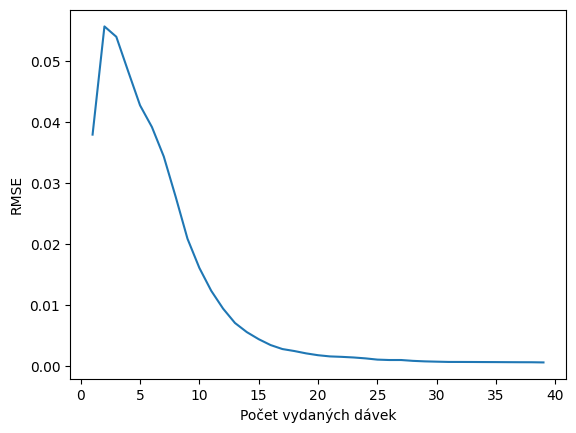

In [ ]:
x = range(1, 1 + len(rmse_list))
plt.plot(x, rmse_list)
plt.xlabel('Počet vydaných dávek')
plt.ylabel('RMSE')
plt.show()

In [ ]:
na_values_back = pd.Series([np.nan])
rmse_list_ser = pd.Series(rmse_list)
rmse_list_ser = pd.concat([rmse_list_ser, na_values_back], ignore_index=True)

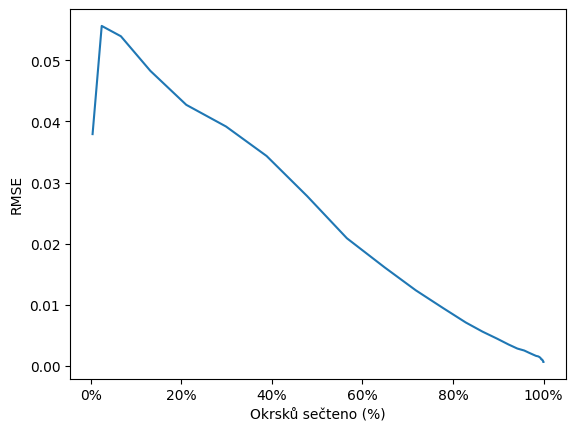

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter


def percentage(x, pos):
    return '{:.0%}'.format(x)

plt.plot(prez_2023_2_original_data_proc['okrsku_secteno'], rmse_list_ser)

plt.xlabel('Okrsků sečteno (%)')
plt.ylabel('RMSE')

formatter = FuncFormatter(percentage)
plt.gca().xaxis.set_major_formatter(formatter)

plt.show()

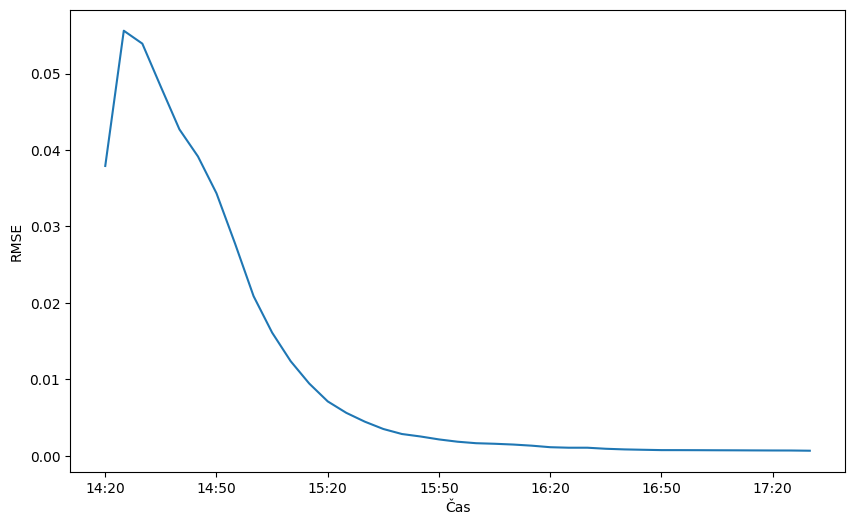

In [ ]:
n_points = len(rmse_list)

start_time = pd.Timestamp('2023-10-10 14:20')
time_labels = [(start_time + pd.Timedelta(minutes=5 * i)).strftime('%H:%M') for i in range(n_points)]

plt.figure(figsize=(10, 6))
plt.plot(range(1, n_points + 1), rmse_list)

plt.xticks(ticks=range(1, n_points + 1, 6), labels=time_labels[::6])

plt.xlabel('Čas')
plt.ylabel('RMSE')

plt.show()

In [ ]:
prejmenovani_klicu_slovniku = {
    'HLASY_4': 'P. Pavel',
    'HLASY_7': 'A. Babiš'
}

predikce_prejmenovany_dict = {prejmenovani_klicu_slovniku.get(k, k): v for k, v in hlasy_predikce_dict.items()}

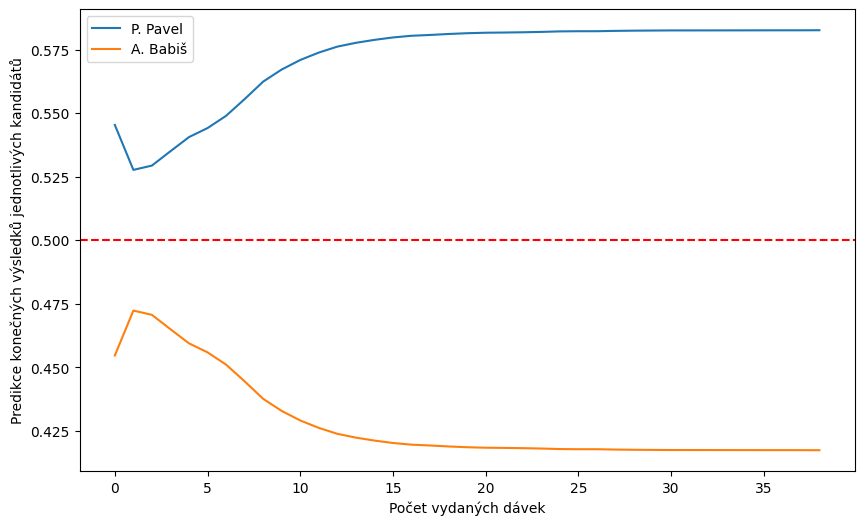

In [ ]:
plt.figure(figsize=(10, 6))

for key, values in predikce_prejmenovany_dict.items():
    plt.plot(values, label=key)

plt.xlabel('Počet vydaných dávek')
plt.ylabel('Predikce konečných výsledků jednotlivých kandidátů')

plt.axhline(y=0.5, color='red', linestyle='--')

plt.legend()

plt.show()

In [ ]:
modified_predikce_dict = {}

for key, values in predikce_prejmenovany_dict.items():

    modified_values = pd.concat([pd.Series(values), pd.Series([np.nan])]).reset_index(drop=True)
    modified_predikce_dict[key] = modified_values

for key, values in modified_predikce_dict.items():
    print(f"{key}: {values.tolist()}")

P. Pavel: [0.5453755631480588, 0.527678641902938, 0.5293689524305124, 0.5350232238625874, 0.5405844746018281, 0.544130018629145, 0.5489541543365658, 0.5555253117184293, 0.5624110025779736, 0.5671803302703241, 0.5709202793842556, 0.5738409011396971, 0.5761832421457443, 0.5776791860218718, 0.5788356189394251, 0.5797944346388927, 0.5804493277759469, 0.5807722136513516, 0.5811577014402498, 0.5814570746058717, 0.5816528667481605, 0.5817260437456158, 0.5818275694466931, 0.5819750270444043, 0.5821765429944906, 0.5822429261496819, 0.5822426766776421, 0.5823808295236487, 0.5824639581256544, 0.5825124881891697, 0.5825565422194322, 0.5825594222226432, 0.582566176351975, 0.5825761260574838, 0.5825837305444984, 0.5825948391346415, 0.5826037802797867, 0.5826084961357658, 0.58263629737556, nan]
A. Babiš: [0.4546244368519413, 0.472321358097062, 0.47063104756948765, 0.4649767761374125, 0.4594155253981718, 0.455869981370855, 0.4510458456634342, 0.44447468828157066, 0.4375889974220264, 0.4328196697296759

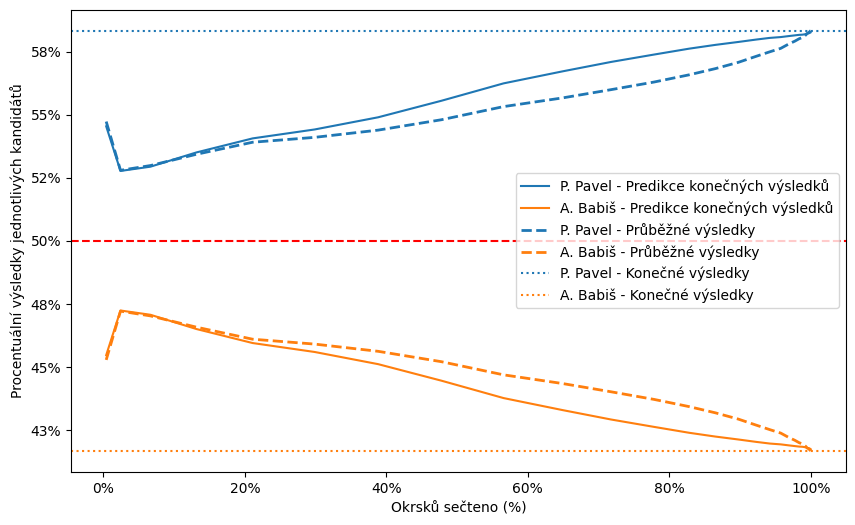

In [ ]:
from matplotlib.ticker import FuncFormatter
import matplotlib.pyplot as plt


prez_2023_2_original_data_proc = pd.read_csv('prez_2023_2_proc.csv')
prubeh = prez_2023_2_original_data_proc[['HLASY_4', 'HLASY_7']].copy()
konecne_vysledky = prubeh.iloc[-1]


def percentage(x, pos):
    return '{:.0%}'.format(x)


plt.figure(figsize=(10, 6))

for key, values in modified_predikce_dict.items():
    plt.plot(prez_2023_2_original_data_proc['okrsku_secteno'], values, label=key + ' - Predikce konečných výsledků')

plt.xlabel('Okrsků sečteno (%)')
plt.ylabel('Procentuální výsledky jednotlivých kandidátů')

plt.plot(prez_2023_2_original_data_proc['okrsku_secteno'], prubeh['HLASY_4'], label="P. Pavel - Průběžné výsledky", color='#1f77b4', linestyle='--', linewidth=2)
plt.plot(prez_2023_2_original_data_proc['okrsku_secteno'], prubeh['HLASY_7'], label="A. Babiš - Průběžné výsledky", color='#ff7f0e', linestyle='--', linewidth=2)

plt.axhline(y=konecne_vysledky['HLASY_4'], label="P. Pavel - Konečné výsledky", color='#1f77b4', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_7'], label="A. Babiš - Konečné výsledky", color='#ff7f0e', linestyle='dotted')

ax = plt.gca()

formatter = FuncFormatter(percentage)
ax.yaxis.set_major_formatter(formatter)
ax.xaxis.set_major_formatter(formatter)

plt.axhline(y=0.5, color='red', linestyle='--')

plt.legend()

plt.show()

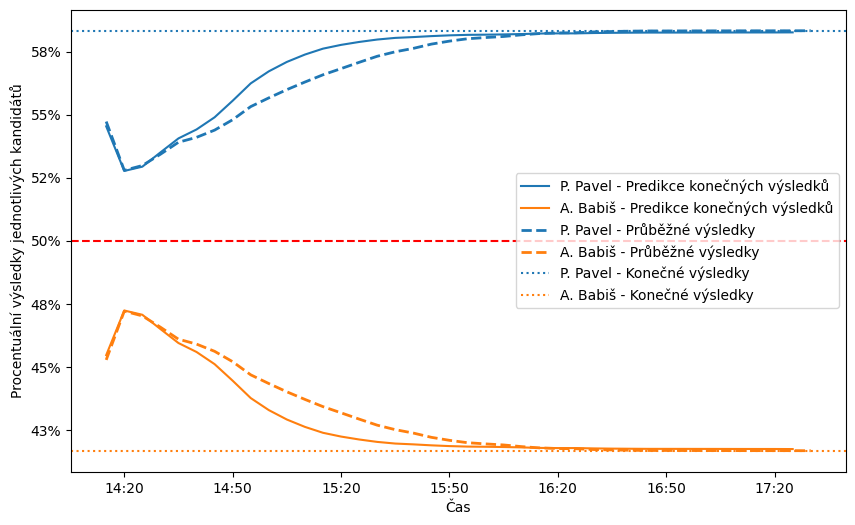

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.ticker import FuncFormatter

prez_2023_2_original_data_proc = pd.read_csv('prez_2023_2_proc.csv')
prubeh = prez_2023_2_original_data_proc[['HLASY_4', 'HLASY_7']].copy()
konecne_vysledky = prubeh.iloc[-1]

def percentage(x, pos):
    return '{:.0%}'.format(x)

n_points = len(next(iter(modified_predikce_dict.values())))

start_time = pd.Timestamp('2023-01-14 14:20')
time_labels = [(start_time + pd.Timedelta(minutes=5 * i)).strftime('%H:%M') for i in range(n_points)]

plt.figure(figsize=(10, 6))

for key, values in modified_predikce_dict.items():
    plt.plot(values, label=key + ' - Predikce konečných výsledků')

plt.xlabel('Čas')
plt.ylabel('Procentuální výsledky jednotlivých kandidátů')

plt.plot(prubeh['HLASY_4'], label="P. Pavel - Průběžné výsledky", color='#1f77b4', linestyle='--', linewidth=2)
plt.plot(prubeh['HLASY_7'], label="A. Babiš - Průběžné výsledky", color='#ff7f0e', linestyle='--', linewidth=2)

plt.axhline(y=konecne_vysledky['HLASY_4'], label="P. Pavel - Konečné výsledky", color='#1f77b4', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_7'], label="A. Babiš - Konečné výsledky", color='#ff7f0e', linestyle='dotted')

ax = plt.gca()

formatter = FuncFormatter(percentage)
ax.yaxis.set_major_formatter(formatter)

plt.axhline(y=0.5, color='red', linestyle='--')

plt.xticks(ticks=range(1, n_points + 1, 6), labels=time_labels[::6])

plt.legend()

plt.show()

In [ ]:
avg_rmse_soft_imp_2 = sum(rmse_list) / len(rmse_list)
print(f"Průměrný RMSE pro model Soft-impute a 2. kolo prezidentských voleb v roce 2023 je {avg_rmse_soft_imp_2}.")

Průměrný RMSE pro model Soft-impute a 2. kolo prezidentských voleb v roce 2023 je 0.011451862793523478.


In [ ]:
rmse_list_SOFTIMP_2 = rmse_list
rmse_df = pd.DataFrame(rmse_list_SOFTIMP_2)
rmse_df.rename(columns = {0: 'SoftImpute'}, inplace = True)
rmse_df.to_csv('rmse_SOFTIMP_2.csv', index = False)

### KNN - prezidentske 2023 - 2.kolo - predikce




In [ ]:
# POZOR, BEZI 2 MINUTY

prez_2023_2_original_data = pd.read_csv('prez_2023_2_abs.csv')
prez_2023_2_original_data_proc = pd.read_csv('prez_2023_2_proc.csv')

prez_2023_2_dopl_matic_df = prez_2023_2_original_data.drop(columns = ['ZAPSANI_VOLICI', 'VYDANE_OBALKY', 'ODEVZDANE_OBALKY' ,'PLATNE_HLASY'], axis = 1)
prez_2023_2_dopl_matic_df = prez_2023_2_dopl_matic_df.fillna(0)

pocet_davek = 3
prez_2023_2_dopl_matic_prubezne_vysl = prez_2023_2_dopl_matic_df[prez_2023_2_dopl_matic_df['davka'] <= pocet_davek]
prez_2023_2_dopl_matic_bez_davky = prez_2023_2_dopl_matic_prubezne_vysl.drop(columns = ['davka'], axis = 1)

prez_2018_1_dopl_matic_df = prez_2018_1_original_data.drop(columns = ['ZAPSANI_VOLICI', 'VYDANE_OBALKY', 'ODEVZDANE_OBALKY' ,'PLATNE_HLASY', 'davka'], axis = 1)
prez_2018_1_dopl_matic_df = prez_2018_1_dopl_matic_df.fillna(0)

prez_2018_2_dopl_matic_df = prez_2018_2_original_data.drop(columns = ['ZAPSANI_VOLICI', 'VYDANE_OBALKY', 'ODEVZDANE_OBALKY' ,'PLATNE_HLASY', 'davka'], axis = 1)
prez_2018_2_dopl_matic_df = prez_2018_2_dopl_matic_df.fillna(0)

df_2018_merged = prez_2018_1_dopl_matic_df.merge(prez_2018_2_dopl_matic_df, how = 'left', on = ['CIS_OBEC', 'CIS_OKRSEK'])

df_na_values = df_2018_merged.merge(prez_2023_2_dopl_matic_bez_davky, how = 'left', on = ['CIS_OBEC', 'CIS_OKRSEK'])
df_na_values.set_index(['CIS_OBEC', 'CIS_OKRSEK'], inplace=True)

df_knn = df_na_values.copy()
df_knn = df_knn.replace({pd.NA: np.nan})
vote_columns = df_knn.columns
vote_matrix = df_knn[vote_columns].to_numpy()

scaler = StandardScaler()
vote_matrix_standardized = scaler.fit_transform(vote_matrix)
imputed_matrix_standardized = KNN(k=2).fit_transform(vote_matrix_standardized)
imputed_matrix = scaler.inverse_transform(imputed_matrix_standardized)

df_knn[vote_columns] = imputed_matrix
df_knn_imputed = df_knn.iloc[:, -2:]

Imputing row 1/14900 with 0 missing, elapsed time: 118.785
Imputing row 101/14900 with 2 missing, elapsed time: 118.804
Imputing row 201/14900 with 0 missing, elapsed time: 118.815
Imputing row 301/14900 with 0 missing, elapsed time: 118.833
Imputing row 401/14900 with 0 missing, elapsed time: 118.860
Imputing row 501/14900 with 2 missing, elapsed time: 118.885
Imputing row 601/14900 with 0 missing, elapsed time: 118.915
Imputing row 701/14900 with 2 missing, elapsed time: 118.960
Imputing row 801/14900 with 2 missing, elapsed time: 118.993
Imputing row 901/14900 with 0 missing, elapsed time: 119.030
Imputing row 1001/14900 with 2 missing, elapsed time: 119.062
Imputing row 1101/14900 with 0 missing, elapsed time: 119.093
Imputing row 1201/14900 with 2 missing, elapsed time: 119.135
Imputing row 1301/14900 with 2 missing, elapsed time: 119.175
Imputing row 1401/14900 with 0 missing, elapsed time: 119.225
Imputing row 1501/14900 with 2 missing, elapsed time: 119.263
Imputing row 1601/14

In [ ]:
sorted_columns = sorted(df_knn_imputed.columns)
df_knn_imputed = df_knn_imputed[sorted_columns]
df_knn_imputed.head()

,,HLASY_4_y,HLASY_7
CIS_OBEC,CIS_OKRSEK,,
566080,1,10.000000,28.000000
573060,5,26.000000,48.000000
547701,1,29.138231,21.514756
542059,1,13.000000,13.000000
599034,1,35.000000,19.000000


In [ ]:
total_votes_per_party = df_knn_imputed.sum()
total_votes = total_votes_per_party.sum()
final_predictions_knn = (total_votes_per_party / total_votes)
final_predictions_knn

,0
HLASY_4_y,0.5775
HLASY_7,0.4225


In [ ]:
final_predictions_knn = pd.DataFrame(final_predictions_knn).T
final_predictions_knn

,HLASY_4_y,HLASY_7
0,0.5775,0.4225


In [ ]:
max_davka = prez_2023_2_original_data_proc['davka'].max()
prez_2023_2_proc_last_row = prez_2023_2_original_data_proc[prez_2023_2_original_data_proc['davka'] == max_davka]
final_result_prez_2023_2 = prez_2023_2_proc_last_row.drop(columns = ['davka', 'okrsku_secteno', 'volebni_ucast'], axis = 1)
final_result_prez_2023_2

,HLASY_4,HLASY_7
39,0.583293,0.416707


In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

mse = mean_squared_error(final_predictions_knn, final_result_prez_2023_2)
rmse = sqrt(mse)
print(rmse)

0.0057931855067434035


In [ ]:
column_mapping = {
    'HLASY_4_y': 'HLASY_4',
    'HLASY_7_2023': 'HLASY_7'
}

final_predictions_knn.rename(columns=column_mapping, inplace=True)
final_predictions_knn

,HLASY_4,HLASY_7
0,0.5775,0.4225


In [ ]:
prez_2023_2_train_last_row = pd.DataFrame(prez_2023_2_original_data_proc[prez_2023_2_original_data_proc['davka'] <= pocet_davek].iloc[-1]).T
procent_secteno = prez_2023_2_train_last_row['okrsku_secteno'].values[0]
prez_2023_2_train_last_row.drop(['davka', 'okrsku_secteno', 'volebni_ucast'], axis = 1, inplace = True)
prez_2023_2_train_last_row.head()

,HLASY_4,HLASY_7
2,0.529816,0.470184


In [ ]:
vysledky = pd.concat([prez_2023_2_train_last_row, final_predictions_knn, final_result_prez_2023_2])
vysledky = vysledky.T
vysledky.index = ['P. Pavel', 'A. Babiš']
popisek_prubeh = "Průběžný výsledek: " + str(round(procent_secteno * 100, 2)) + "% okrsků sečteno"
popisek_predikce = "Predikovaný konečný výsledek při " + str(round(procent_secteno * 100, 2)) + "% sečtených okrků"
vysledky.columns = [popisek_prubeh, popisek_predikce, 'Skutečný konečný výsledek']
vysledky

,Průběžný výsledek: 6.65% okrsků sečteno,Predikovaný konečný výsledek při 6.65% sečtených okrků,Skutečný konečný výsledek
P. Pavel,0.529816,0.5775,0.583293
A. Babiš,0.470184,0.4225,0.416707


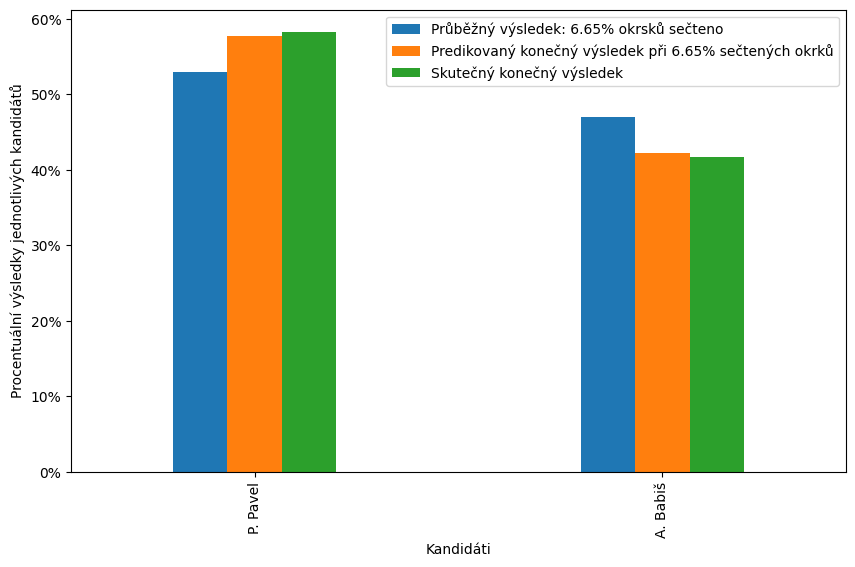

In [ ]:
from matplotlib.ticker import FuncFormatter


def percentage(x, pos):
    return '{:.0%}'.format(x)


ax = vysledky.plot(kind='bar', figsize=(10, 6), width=0.4)  # Adjust the width as needed

plt.xlabel('Kandidáti')
plt.ylabel('Procentuální výsledky jednotlivých kandidátů')

formatter = FuncFormatter(percentage)
ax.yaxis.set_major_formatter(formatter)

plt.legend(loc='upper right')

plt.show()

In [ ]:
# POZOR, BEZI 30 MIN
from fancyimpute import SoftImpute, KNN


mse_list = []
rmse_list = []
hlasy_cols = [col for col in prez_2023_2_original_data.columns if col.startswith('HLASY_')]
hlasy_predikce_dict = {col: [] for col in hlasy_cols}

prez_2023_2_original_data_proc = pd.read_csv('prez_2023_2_proc.csv')
max_davka = prez_2023_2_original_data_proc['davka'].max()
prez_2023_2_proc_last_row = prez_2023_2_original_data_proc[prez_2023_2_original_data_proc['davka'] == max_davka]
final_result_prez_2023_2 = prez_2023_2_proc_last_row.drop(columns = ['davka', 'okrsku_secteno', 'volebni_ucast'], axis = 1)


for i in range(1, prez_2023_2_original_data['davka'].max()):

  prez_2023_2_dopl_matic_df = prez_2023_2_original_data.drop(columns = ['ZAPSANI_VOLICI', 'VYDANE_OBALKY', 'ODEVZDANE_OBALKY' ,'PLATNE_HLASY'], axis = 1)
  prez_2023_2_dopl_matic_df = prez_2023_2_dopl_matic_df.fillna(0)
  prez_2023_2_dopl_matic_prubezne_vysl = prez_2023_2_dopl_matic_df[prez_2023_2_dopl_matic_df['davka'] <= i]
  prez_2023_2_dopl_matic_bez_davky = prez_2023_2_dopl_matic_prubezne_vysl.drop(columns = ['davka'], axis = 1)

  prez_2018_1_dopl_matic_df = prez_2018_1_original_data.drop(columns = ['ZAPSANI_VOLICI', 'VYDANE_OBALKY', 'ODEVZDANE_OBALKY' ,'PLATNE_HLASY', 'davka'], axis = 1)
  prez_2018_1_dopl_matic_df = prez_2018_1_dopl_matic_df.fillna(0)

  prez_2018_2_dopl_matic_df = prez_2018_2_original_data.drop(columns = ['ZAPSANI_VOLICI', 'VYDANE_OBALKY', 'ODEVZDANE_OBALKY' ,'PLATNE_HLASY', 'davka'], axis = 1)
  prez_2018_2_dopl_matic_df = prez_2018_2_dopl_matic_df.fillna(0)

  df_2018_merged = prez_2018_1_dopl_matic_df.merge(prez_2018_2_dopl_matic_df, how = 'left', on = ['CIS_OBEC', 'CIS_OKRSEK'])

  df_na_values = df_2018_merged.merge(prez_2023_2_dopl_matic_bez_davky, how = 'left', on = ['CIS_OBEC', 'CIS_OKRSEK'])
  df_na_values.set_index(['CIS_OBEC', 'CIS_OKRSEK'], inplace=True)

  df_knn = df_na_values.copy()
  df_knn = df_knn.replace({pd.NA: np.nan})
  vote_columns = df_knn.columns
  vote_matrix = df_knn[vote_columns].to_numpy()

  scaler = StandardScaler()
  vote_matrix_standardized = scaler.fit_transform(vote_matrix)
  imputed_matrix_standardized = KNN(k=2).fit_transform(vote_matrix_standardized)
  imputed_matrix = scaler.inverse_transform(imputed_matrix_standardized)

  df_knn[vote_columns] = imputed_matrix
  df_knn_imputed = df_knn.iloc[:, -2:]
  sorted_columns = sorted(df_knn_imputed.columns)
  df_knn_imputed = df_knn_imputed[sorted_columns]

  total_votes_per_party = df_knn_imputed.sum()
  total_votes = total_votes_per_party.sum()
  final_predictions_knn = (total_votes_per_party / total_votes)
  final_predictions_knn = pd.DataFrame(final_predictions_knn).T
  final_predictions_knn.columns = hlasy_cols

  for col in hlasy_predikce_dict:
    hlasy_predikce_dict[col].append(final_predictions_knn[col].values[0])

  mse = mean_squared_error(final_predictions_knn, final_result_prez_2023_2)
  mse_list.append(mse)
  rmse = sqrt(mse)
  rmse_list.append(rmse)

Výstupní stream byl oříznut na posledních 5000 řádků.
Imputing row 9801/14900 with 2 missing, elapsed time: 50.232
Imputing row 9901/14900 with 2 missing, elapsed time: 50.256
Imputing row 10001/14900 with 2 missing, elapsed time: 50.279
Imputing row 10101/14900 with 0 missing, elapsed time: 50.301
Imputing row 10201/14900 with 2 missing, elapsed time: 50.326
Imputing row 10301/14900 with 2 missing, elapsed time: 50.360
Imputing row 10401/14900 with 2 missing, elapsed time: 50.384
Imputing row 10501/14900 with 2 missing, elapsed time: 50.408
Imputing row 10601/14900 with 2 missing, elapsed time: 50.437
Imputing row 10701/14900 with 2 missing, elapsed time: 50.464
Imputing row 10801/14900 with 2 missing, elapsed time: 50.488
Imputing row 10901/14900 with 2 missing, elapsed time: 50.512
Imputing row 11001/14900 with 2 missing, elapsed time: 50.537
Imputing row 11101/14900 with 2 missing, elapsed time: 50.563
Imputing row 11201/14900 with 2 missing, elapsed time: 50.585
Imputing row 11301

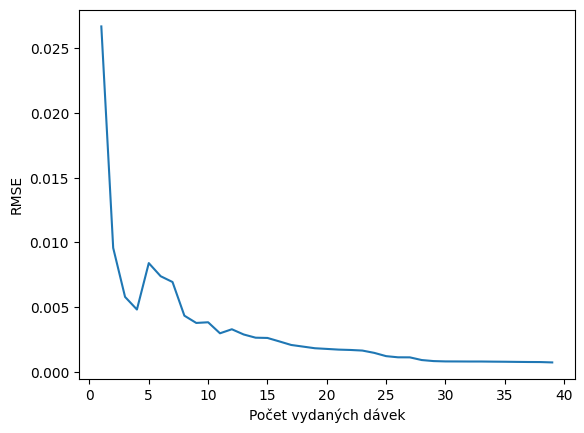

In [ ]:
x = range(1, 1 + len(rmse_list))
plt.plot(x, rmse_list)
plt.xlabel('Počet vydaných dávek')
plt.ylabel('RMSE')
plt.show()

In [ ]:
na_values_back = pd.Series([np.nan])
rmse_list_ser = pd.Series(rmse_list)
rmse_list_ser = pd.concat([rmse_list_ser, na_values_back], ignore_index=True)

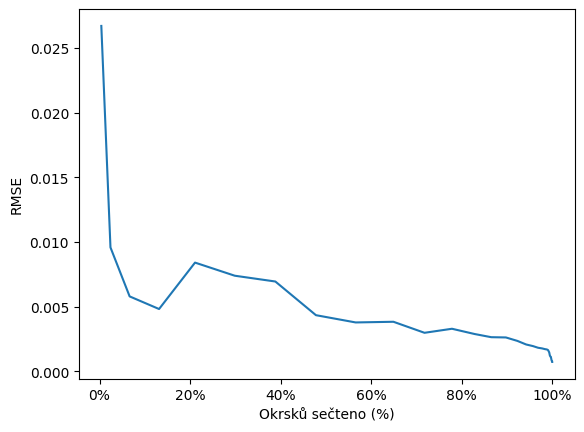

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

def percentage(x, pos):
    return '{:.0%}'.format(x)

plt.plot(prez_2023_2_original_data_proc['okrsku_secteno'], rmse_list_ser)

plt.xlabel('Okrsků sečteno (%)')
plt.ylabel('RMSE')

formatter = FuncFormatter(percentage)
plt.gca().xaxis.set_major_formatter(formatter)

plt.show()

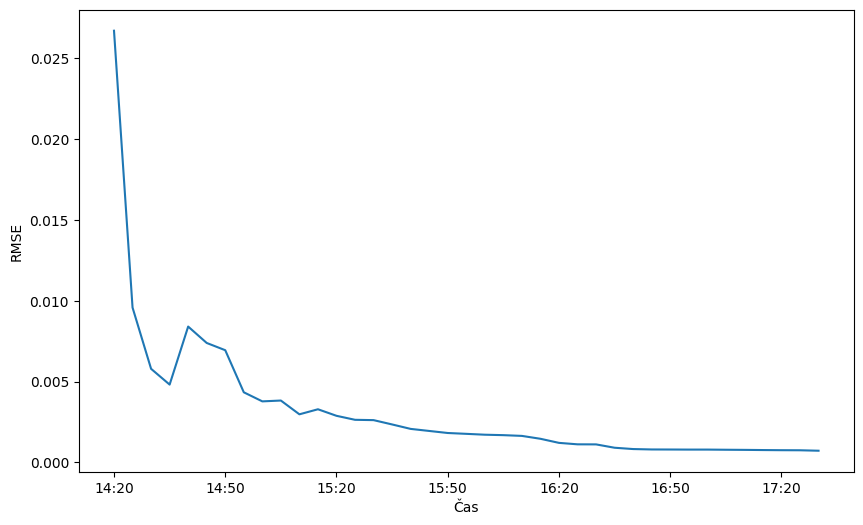

In [ ]:
n_points = len(rmse_list)

start_time = pd.Timestamp('2023-10-10 14:20')
time_labels = [(start_time + pd.Timedelta(minutes=5 * i)).strftime('%H:%M') for i in range(n_points)]

plt.figure(figsize=(10, 6))
plt.plot(range(1, n_points + 1), rmse_list)

plt.xticks(ticks=range(1, n_points + 1, 6), labels=time_labels[::6])  # Popisky každých 30 minut

plt.xlabel('Čas')
plt.ylabel('RMSE')

plt.show()

In [ ]:
prejmenovani_klicu_slovniku = {
    'HLASY_4': 'P. Pavel',
    'HLASY_7': 'A. Babiš'
}

predikce_prejmenovany_dict = {prejmenovani_klicu_slovniku.get(k, k): v for k, v in hlasy_predikce_dict.items()}

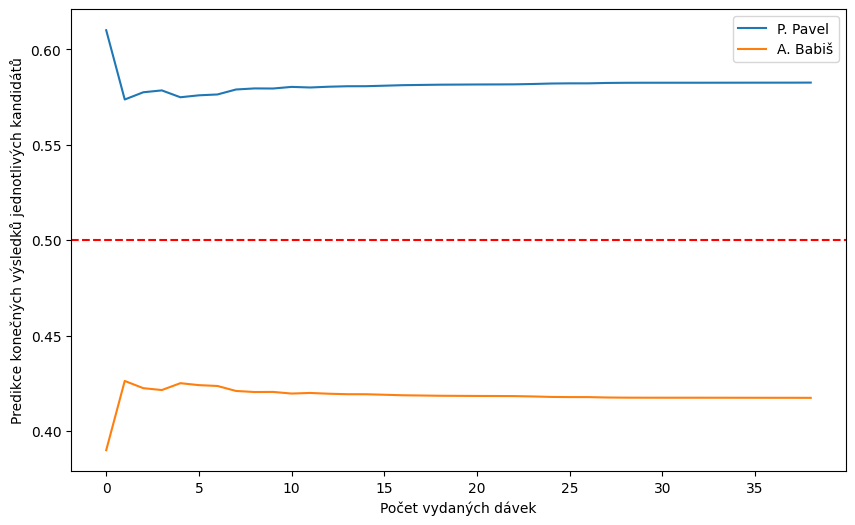

In [ ]:
plt.figure(figsize=(10, 6))

for key, values in predikce_prejmenovany_dict.items():
    plt.plot(values, label=key)

plt.xlabel('Počet vydaných dávek')
plt.ylabel('Predikce konečných výsledků jednotlivých kandidátů')

plt.axhline(y=0.5, color='red', linestyle='--')

plt.legend()

plt.show()

In [ ]:
modified_predikce_dict = {}

for key, values in predikce_prejmenovany_dict.items():

    modified_values = pd.concat([pd.Series(values), pd.Series([np.nan])]).reset_index(drop=True)
    modified_predikce_dict[key] = modified_values

for key, values in modified_predikce_dict.items():
    print(f"{key}: {values.tolist()}")

P. Pavel: [0.6099992310207553, 0.5737113859464136, 0.5774999078557189, 0.5784758338128656, 0.574886648887444, 0.5759008488621776, 0.5763488402649186, 0.5789520675331828, 0.5795136375056119, 0.5794619644825187, 0.5803143834582231, 0.5800019408991621, 0.5804067620981933, 0.5806538780607812, 0.5806739936104177, 0.5809413488887106, 0.5812162988995395, 0.5813433765827495, 0.5814701580278544, 0.5815219710291234, 0.5815756532078789, 0.5816032150970795, 0.5816493782919118, 0.5818277507584003, 0.5820807741617662, 0.5821705652582754, 0.5821747363738028, 0.5823820025205548, 0.5824628896411133, 0.58248832716397, 0.5824916640167547, 0.5824963258447825, 0.5824961902443698, 0.5825061206612123, 0.5825137141267429, 0.5825248151833318, 0.5825337510837736, 0.5825384667396525, 0.5825662576086026, nan]
A. Babiš: [0.39000076897924474, 0.4262886140535864, 0.42250009214428097, 0.4215241661871344, 0.4251133511125559, 0.4240991511378225, 0.4236511597350814, 0.4210479324668171, 0.42048636249438814, 0.42053803551

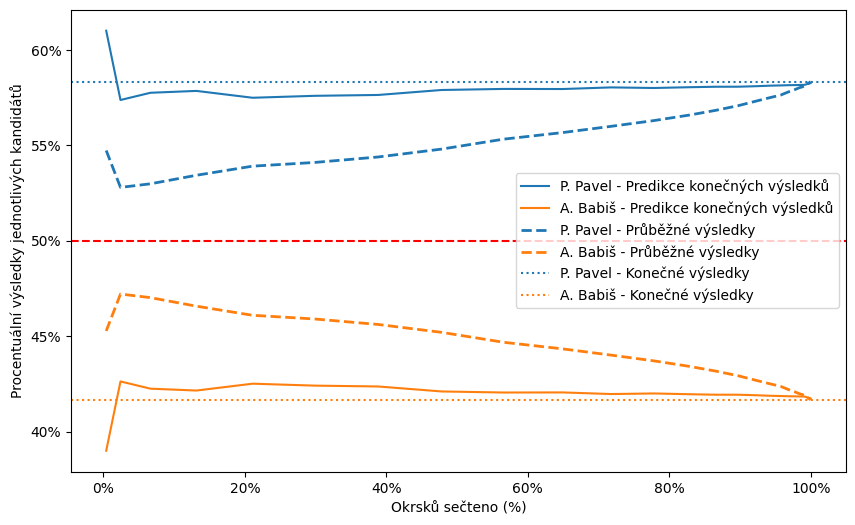

In [ ]:
from matplotlib.ticker import FuncFormatter
import matplotlib.pyplot as plt


prez_2023_2_original_data_proc = pd.read_csv('prez_2023_2_proc.csv')
prubeh = prez_2023_2_original_data_proc[['HLASY_4', 'HLASY_7']].copy()
konecne_vysledky = prubeh.iloc[-1]


def percentage(x, pos):
    return '{:.0%}'.format(x)


plt.figure(figsize=(10, 6))

for key, values in modified_predikce_dict.items():
    plt.plot(prez_2023_2_original_data_proc['okrsku_secteno'], values, label=key + ' - Predikce konečných výsledků')

plt.xlabel('Okrsků sečteno (%)')
plt.ylabel('Procentuální výsledky jednotlivých kandidátů')

plt.plot(prez_2023_2_original_data_proc['okrsku_secteno'], prubeh['HLASY_4'], label="P. Pavel - Průběžné výsledky", color='#1f77b4', linestyle='--', linewidth=2)
plt.plot(prez_2023_2_original_data_proc['okrsku_secteno'], prubeh['HLASY_7'], label="A. Babiš - Průběžné výsledky", color='#ff7f0e', linestyle='--', linewidth=2)

plt.axhline(y=konecne_vysledky['HLASY_4'], label="P. Pavel - Konečné výsledky", color='#1f77b4', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_7'], label="A. Babiš - Konečné výsledky", color='#ff7f0e', linestyle='dotted')

ax = plt.gca()

formatter = FuncFormatter(percentage)
ax.yaxis.set_major_formatter(formatter)
ax.xaxis.set_major_formatter(formatter)

plt.axhline(y=0.5, color='red', linestyle='--')

plt.legend()

plt.show()


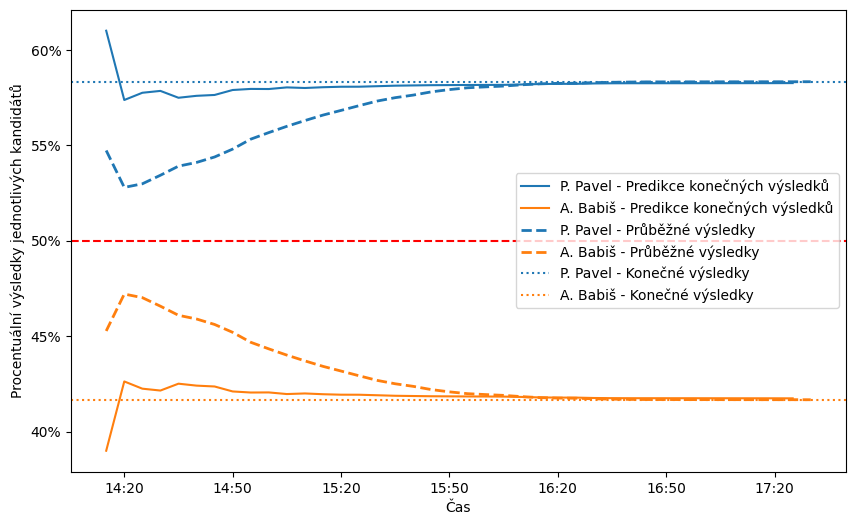

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.ticker import FuncFormatter


prez_2023_2_original_data_proc = pd.read_csv('prez_2023_2_proc.csv')
prubeh = prez_2023_2_original_data_proc[['HLASY_4', 'HLASY_7']].copy()
konecne_vysledky = prubeh.iloc[-1]


def percentage(x, pos):
    return '{:.0%}'.format(x)


n_points = len(next(iter(modified_predikce_dict.values())))

start_time = pd.Timestamp('2023-01-14 14:20')
time_labels = [(start_time + pd.Timedelta(minutes=5 * i)).strftime('%H:%M') for i in range(n_points)]

plt.figure(figsize=(10, 6))

for key, values in modified_predikce_dict.items():
    plt.plot(values, label=key + ' - Predikce konečných výsledků')

plt.xlabel('Čas')
plt.ylabel('Procentuální výsledky jednotlivých kandidátů')

plt.plot(prubeh['HLASY_4'], label="P. Pavel - Průběžné výsledky", color='#1f77b4', linestyle='--', linewidth=2)
plt.plot(prubeh['HLASY_7'], label="A. Babiš - Průběžné výsledky", color='#ff7f0e', linestyle='--', linewidth=2)

plt.axhline(y=konecne_vysledky['HLASY_4'], label="P. Pavel - Konečné výsledky", color='#1f77b4', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_7'], label="A. Babiš - Konečné výsledky", color='#ff7f0e', linestyle='dotted')

ax = plt.gca()

formatter = FuncFormatter(percentage)
ax.yaxis.set_major_formatter(formatter)

plt.axhline(y=0.5, color='red', linestyle='--')

plt.xticks(ticks=range(1, n_points + 1, 6), labels=time_labels[::6])

plt.legend()

plt.show()

In [ ]:
avg_rmse_knn_imp_2 = sum(rmse_list) / len(rmse_list)
print(f"Průměrný RMSE pro model KNN a 2. kolo prezidentských voleb v roce 2023 je {avg_rmse_knn_imp_2}.")

Průměrný RMSE pro model KNN a 2. kolo prezidentských voleb v roce 2023 je 0.003217072839545664.


In [ ]:
rmse_list_KNN_2 = rmse_list
rmse_df = pd.DataFrame(rmse_list_KNN_2)
rmse_df.rename(columns = {0: 'KNN'}, inplace = True)
rmse_df.to_csv('rmse_KNN_2.csv', index = False)

### Iterative Impute - prezidentske 2023 - 2.kolo - predikce




In [ ]:
prez_2018_1_original_data = pd.read_csv('prez_2018_1_abs.csv')
prez_2018_2_original_data = pd.read_csv('prez_2018_2_abs.csv')
ps_2021_original_data = pd.read_csv('ps_2021_abs.csv')
ps_2021_original_data_proc = pd.read_csv('ps_2021_proc.csv')
prez_2023_2_original_data = pd.read_csv('prez_2023_2_abs.csv')
prez_2023_2_original_data_proc = pd.read_csv('prez_2023_2_proc.csv')

prez_2023_2_dopl_matic_df = prez_2023_2_original_data.drop(columns = ['ZAPSANI_VOLICI', 'VYDANE_OBALKY', 'ODEVZDANE_OBALKY' ,'PLATNE_HLASY'], axis = 1)
prez_2023_2_dopl_matic_df = prez_2023_2_dopl_matic_df.fillna(0)

pocet_davek = 3
prez_2023_2_dopl_matic_prubezne_vysl = prez_2023_2_dopl_matic_df[prez_2023_2_dopl_matic_df['davka'] <= pocet_davek]
prez_2023_2_dopl_matic_bez_davky = prez_2023_2_dopl_matic_prubezne_vysl.drop(columns = ['davka'], axis = 1)

prez_2018_1_dopl_matic_df = prez_2018_1_original_data.drop(columns = ['ZAPSANI_VOLICI', 'VYDANE_OBALKY', 'ODEVZDANE_OBALKY' ,'PLATNE_HLASY', 'davka'], axis = 1)
prez_2018_1_dopl_matic_df = prez_2018_1_dopl_matic_df.fillna(0)

prez_2018_2_dopl_matic_df = prez_2018_2_original_data.drop(columns = ['ZAPSANI_VOLICI', 'VYDANE_OBALKY', 'ODEVZDANE_OBALKY' ,'PLATNE_HLASY', 'davka'], axis = 1)
prez_2018_2_dopl_matic_df = prez_2018_2_dopl_matic_df.fillna(0)

df_2018_merged = prez_2018_1_dopl_matic_df.merge(prez_2018_2_dopl_matic_df, how = 'left', on = ['CIS_OBEC', 'CIS_OKRSEK'])

df_na_values = df_2018_merged.merge(prez_2023_2_dopl_matic_bez_davky, how = 'left', on = ['CIS_OBEC', 'CIS_OKRSEK'])
df_na_values.set_index(['CIS_OBEC', 'CIS_OKRSEK'], inplace=True)

df_iter_impute = df_na_values.copy()
df_iter_impute = df_iter_impute.replace({pd.NA: np.nan})
vote_columns = df_iter_impute.columns
vote_matrix = df_iter_impute[vote_columns].to_numpy()

scaler = StandardScaler()
vote_matrix_standardized = scaler.fit_transform(vote_matrix)
imputed_matrix_standardized = IterativeImputer().fit_transform(vote_matrix_standardized)
imputed_matrix = scaler.inverse_transform(imputed_matrix_standardized)

df_iter_impute[vote_columns] = imputed_matrix
df_iter_imputed = df_iter_impute.iloc[:, -2:]

In [ ]:
sorted_columns = sorted(df_iter_imputed.columns)
df_iter_imputed = df_iter_imputed[sorted_columns]
df_iter_imputed.head()

,,HLASY_4_y,HLASY_7
CIS_OBEC,CIS_OKRSEK,,
566080,1,10.000000,28.00000
573060,5,26.000000,48.00000
547701,1,38.650307,16.67872
542059,1,13.000000,13.00000
599034,1,35.000000,19.00000


In [ ]:
total_votes_per_party = df_iter_imputed.sum()
total_votes = total_votes_per_party.sum()
final_predictions_iter_impute = (total_votes_per_party / total_votes)
final_predictions_iter_impute

,0
HLASY_4_y,0.587099
HLASY_7,0.412901


In [ ]:
final_predictions_iter_impute = pd.DataFrame(final_predictions_iter_impute).T
final_predictions_iter_impute

,HLASY_4_y,HLASY_7
0,0.587099,0.412901


In [ ]:
max_davka = prez_2023_2_original_data_proc['davka'].max()
prez_2023_2_proc_last_row = prez_2023_2_original_data_proc[prez_2023_2_original_data_proc['davka'] == max_davka]
final_result_prez_2023_2 = prez_2023_2_proc_last_row.drop(columns = ['davka', 'okrsku_secteno', 'volebni_ucast'], axis = 1)
final_result_prez_2023_2

,HLASY_4,HLASY_7
39,0.583293,0.416707


In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

mse = mean_squared_error(final_predictions_iter_impute, final_result_prez_2023_2)
rmse = sqrt(mse)
print(rmse)

0.0038061012984716702


In [ ]:
column_mapping = {
    'HLASY_4_y': 'HLASY_4',
    'HLASY_7': 'HLASY_7'
}

final_predictions_iter_impute.rename(columns=column_mapping, inplace=True)
final_predictions_iter_impute

,HLASY_4,HLASY_7
0,0.587099,0.412901


In [ ]:
prez_2023_2_train_last_row = pd.DataFrame(prez_2023_2_original_data_proc[prez_2023_2_original_data_proc['davka'] <= pocet_davek].iloc[-1]).T
procent_secteno = prez_2023_2_train_last_row['okrsku_secteno'].values[0]
prez_2023_2_train_last_row.drop(['davka', 'okrsku_secteno', 'volebni_ucast'], axis = 1, inplace = True)
prez_2023_2_train_last_row.head()

,HLASY_4,HLASY_7
2,0.529816,0.470184


In [ ]:
vysledky = pd.concat([prez_2023_2_train_last_row, final_predictions_iter_impute, final_result_prez_2023_2])
vysledky = vysledky.T
vysledky.index = ['P. Pavel', 'A. Babiš']
popisek_prubeh = "Průběžný výsledek: " + str(round(procent_secteno * 100, 2)) + "% okrsků sečteno"
popisek_predikce = "Predikovaný konečný výsledek při " + str(round(procent_secteno * 100, 2)) + "% sečtených okrků"
vysledky.columns = [popisek_prubeh, popisek_predikce, 'Skutečný konečný výsledek']
vysledky

,Průběžný výsledek: 6.65% okrsků sečteno,Predikovaný konečný výsledek při 6.65% sečtených okrků,Skutečný konečný výsledek
P. Pavel,0.529816,0.587099,0.583293
A. Babiš,0.470184,0.412901,0.416707


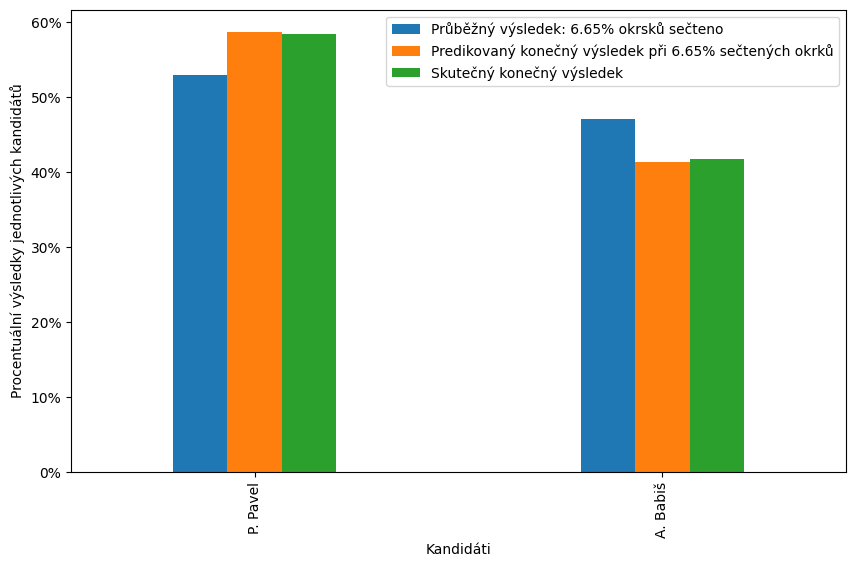

In [ ]:
from matplotlib.ticker import FuncFormatter


def percentage(x, pos):
    return '{:.0%}'.format(x)


ax = vysledky.plot(kind='bar', figsize=(10, 6), width=0.4)

plt.xlabel('Kandidáti')
plt.ylabel('Procentuální výsledky jednotlivých kandidátů')

formatter = FuncFormatter(percentage)
ax.yaxis.set_major_formatter(formatter)

plt.legend(loc='upper right')

plt.show()

In [ ]:
### POZOR, BEZI 2 MINUTY
from fancyimpute import IterativeImputer



mse_list = []
rmse_list = []
hlasy_cols = [col for col in prez_2023_2_original_data.columns if col.startswith('HLASY_')]
hlasy_predikce_dict = {col: [] for col in hlasy_cols}

prez_2023_2_original_data_proc = pd.read_csv('prez_2023_2_proc.csv')
max_davka = prez_2023_2_original_data_proc['davka'].max()
prez_2023_2_proc_last_row = prez_2023_2_original_data_proc[prez_2023_2_original_data_proc['davka'] == max_davka]
final_result_prez_2023_2 = prez_2023_2_proc_last_row.drop(columns = ['davka', 'okrsku_secteno', 'volebni_ucast'], axis = 1)


for i in range(1, prez_2023_2_original_data['davka'].max()):

  prez_2023_2_dopl_matic_df = prez_2023_2_original_data.drop(columns = ['ZAPSANI_VOLICI', 'VYDANE_OBALKY', 'ODEVZDANE_OBALKY' ,'PLATNE_HLASY'], axis = 1)
  prez_2023_2_dopl_matic_df = prez_2023_2_dopl_matic_df.fillna(0)
  prez_2023_2_dopl_matic_prubezne_vysl = prez_2023_2_dopl_matic_df[prez_2023_2_dopl_matic_df['davka'] <= i]
  prez_2023_2_dopl_matic_bez_davky = prez_2023_2_dopl_matic_prubezne_vysl.drop(columns = ['davka'], axis = 1)

  prez_2018_1_dopl_matic_df = prez_2018_1_original_data.drop(columns = ['ZAPSANI_VOLICI', 'VYDANE_OBALKY', 'ODEVZDANE_OBALKY' ,'PLATNE_HLASY', 'davka'], axis = 1)
  prez_2018_1_dopl_matic_df = prez_2018_1_dopl_matic_df.fillna(0)

  prez_2018_2_dopl_matic_df = prez_2018_2_original_data.drop(columns = ['ZAPSANI_VOLICI', 'VYDANE_OBALKY', 'ODEVZDANE_OBALKY' ,'PLATNE_HLASY', 'davka'], axis = 1)
  prez_2018_2_dopl_matic_df = prez_2018_2_dopl_matic_df.fillna(0)

  df_2018_merged = prez_2018_1_dopl_matic_df.merge(prez_2018_2_dopl_matic_df, how = 'left', on = ['CIS_OBEC', 'CIS_OKRSEK'])

  df_na_values = df_2018_merged.merge(prez_2023_2_dopl_matic_bez_davky, how = 'left', on = ['CIS_OBEC', 'CIS_OKRSEK'])
  df_na_values.set_index(['CIS_OBEC', 'CIS_OKRSEK'], inplace=True)


  df_iter_impute = df_na_values.copy()
  df_iter_impute = df_iter_impute.replace({pd.NA: np.nan})
  vote_columns = df_iter_impute.columns
  vote_matrix = df_iter_impute[vote_columns].to_numpy()

  scaler = StandardScaler()
  vote_matrix_standardized = scaler.fit_transform(vote_matrix)
  imputed_matrix_standardized = IterativeImputer().fit_transform(vote_matrix_standardized)
  imputed_matrix = scaler.inverse_transform(imputed_matrix_standardized)

  df_iter_impute[vote_columns] = imputed_matrix
  df_iter_imputed = df_iter_impute.iloc[:, -2:]
  sorted_columns = sorted(df_iter_imputed.columns)
  df_iter_imputed = df_iter_imputed[sorted_columns]

  total_votes_per_party = df_iter_imputed.sum()
  total_votes = total_votes_per_party.sum()
  final_predictions_iter_impute = (total_votes_per_party / total_votes)
  final_predictions_iter_impute = pd.DataFrame(final_predictions_iter_impute).T
  final_predictions_iter_impute.columns = hlasy_cols

  for col in hlasy_predikce_dict:
    hlasy_predikce_dict[col].append(final_predictions_iter_impute[col].values[0])

  mse = mean_squared_error(final_predictions_iter_impute, final_result_prez_2023_2)
  mse_list.append(mse)
  rmse = sqrt(mse)
  rmse_list.append(rmse)

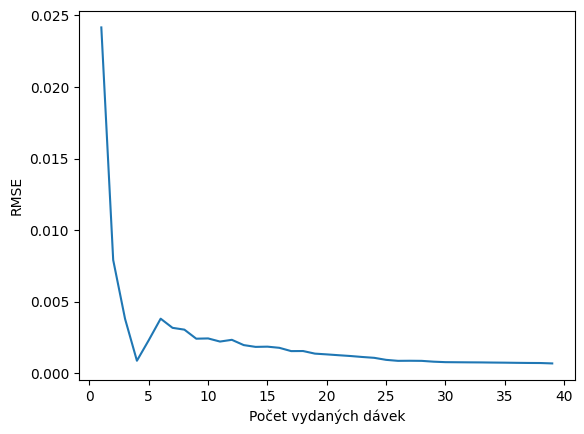

In [ ]:
x = range(1, 1 + len(rmse_list))
plt.plot(x, rmse_list)
plt.xlabel('Počet vydaných dávek')
plt.ylabel('RMSE')
plt.show()

In [ ]:
na_values_back = pd.Series([np.nan])
rmse_list_ser = pd.Series(rmse_list)
rmse_list_ser = pd.concat([rmse_list_ser, na_values_back], ignore_index=True)

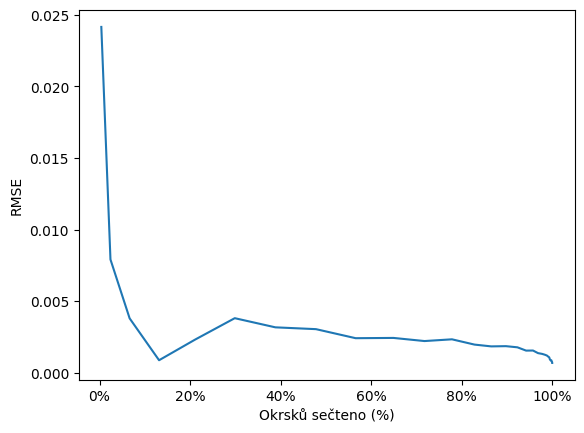

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter


def percentage(x, pos):
    return '{:.0%}'.format(x)


plt.plot(prez_2023_2_original_data_proc['okrsku_secteno'], rmse_list_ser)

plt.xlabel('Okrsků sečteno (%)')
plt.ylabel('RMSE')

formatter = FuncFormatter(percentage)
plt.gca().xaxis.set_major_formatter(formatter)

plt.show()

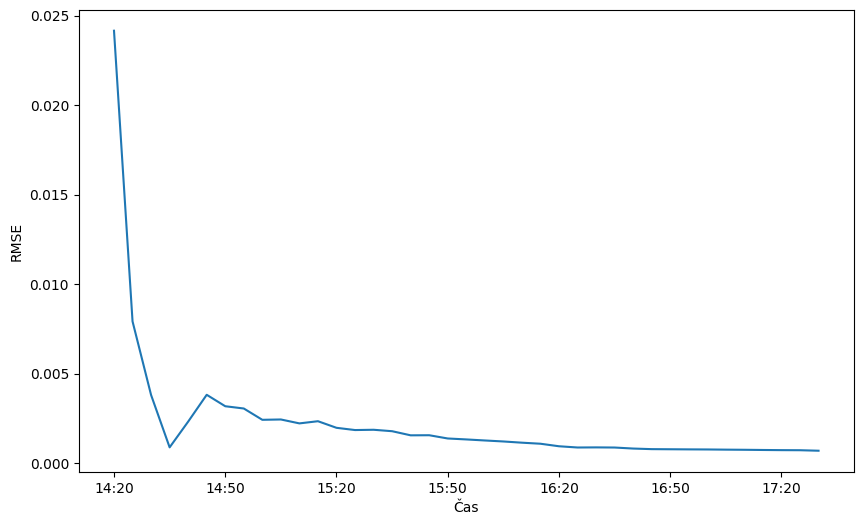

In [ ]:
n_points = len(rmse_list)

start_time = pd.Timestamp('2023-10-10 14:20')
time_labels = [(start_time + pd.Timedelta(minutes=5 * i)).strftime('%H:%M') for i in range(n_points)]

plt.figure(figsize=(10, 6))
plt.plot(range(1, n_points + 1), rmse_list)

plt.xticks(ticks=range(1, n_points + 1, 6), labels=time_labels[::6])  # Popisky každých 30 minut

plt.xlabel('Čas')
plt.ylabel('RMSE')

plt.show()

In [ ]:
prejmenovani_klicu_slovniku = {
    'HLASY_4': 'P. Pavel',
    'HLASY_7': 'A. Babiš'
}

predikce_prejmenovany_dict = {prejmenovani_klicu_slovniku.get(k, k): v for k, v in hlasy_predikce_dict.items()}


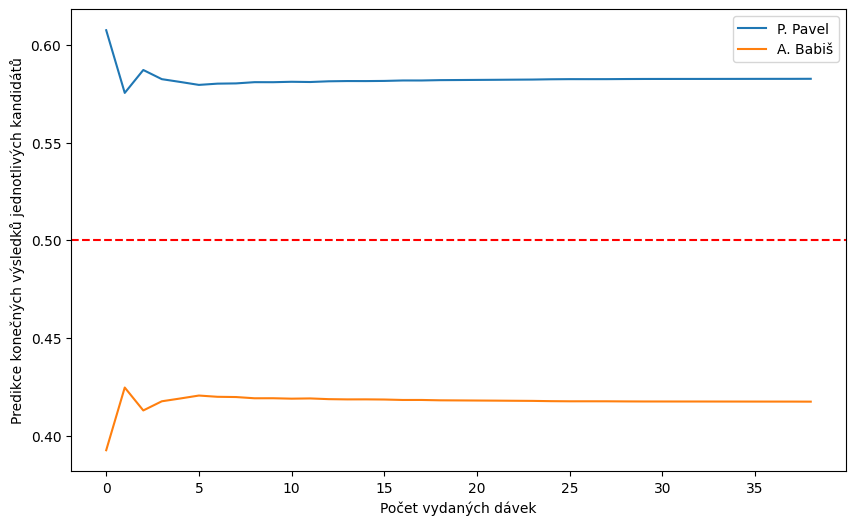

In [ ]:
plt.figure(figsize=(10, 6))

for key, values in predikce_prejmenovany_dict.items():
    plt.plot(values, label=key)

plt.xlabel('Počet vydaných dávek')
plt.ylabel('Predikce konečných výsledků jednotlivých kandidátů')

plt.axhline(y=0.5, color='red', linestyle='--')

plt.legend()

plt.show()

In [ ]:
modified_predikce_dict = {}

for key, values in predikce_prejmenovany_dict.items():

    modified_values = pd.concat([pd.Series(values), pd.Series([np.nan])]).reset_index(drop=True)
    modified_predikce_dict[key] = modified_values

for key, values in modified_predikce_dict.items():
    print(f"{key}: {values.tolist()}")

P. Pavel: [0.6074525190818654, 0.5753756190905788, 0.5870991946609341, 0.5824115364182897, 0.5809733670946239, 0.5794750102875666, 0.5801141508658185, 0.58024080273569, 0.5808726813467128, 0.5808538702851362, 0.5810726001899221, 0.5809511959630704, 0.5813195032805769, 0.5814448758242325, 0.5814288480010609, 0.581509237401073, 0.5817395165348245, 0.581734173229411, 0.5819157147857604, 0.581968894624651, 0.5820271269340439, 0.5820826368710144, 0.5821506830961399, 0.5822091387800488, 0.5823503909864242, 0.5824196855574878, 0.5824136873202717, 0.5824210743548349, 0.5824781877078397, 0.5825112137051764, 0.5825179341481296, 0.5825247987813491, 0.5825295896030819, 0.582539561369178, 0.5825471707456598, 0.5825582680538843, 0.5825671862265334, 0.5825719025088228, 0.5825996810309086, nan]
A. Babiš: [0.39254748091813463, 0.42462438090942123, 0.412900805339066, 0.4175884635817103, 0.4190266329053761, 0.42052498971243335, 0.41988584913418153, 0.41975919726431, 0.41912731865328734, 0.419146129714863

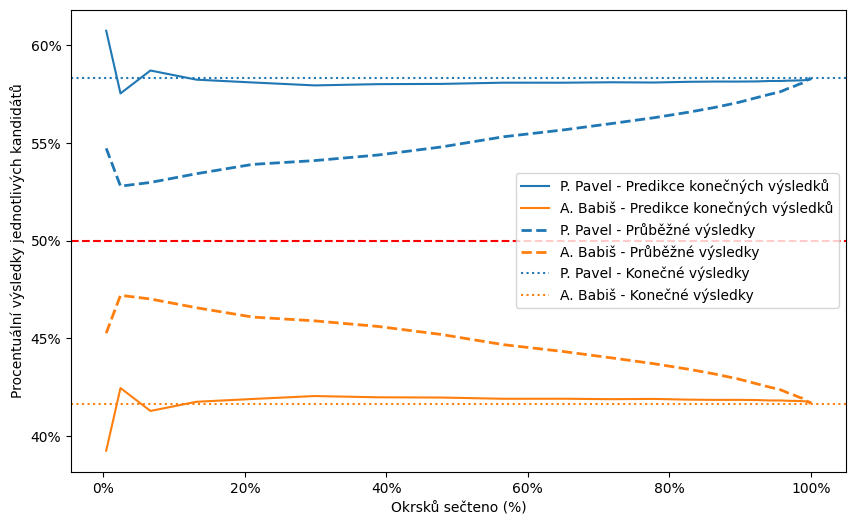

In [ ]:
from matplotlib.ticker import FuncFormatter
import matplotlib.pyplot as plt


prez_2023_2_original_data_proc = pd.read_csv('prez_2023_2_proc.csv')
prubeh = prez_2023_2_original_data_proc[['HLASY_4', 'HLASY_7']].copy()
konecne_vysledky = prubeh.iloc[-1]


def percentage(x, pos):
    return '{:.0%}'.format(x)


plt.figure(figsize=(10, 6))

for key, values in modified_predikce_dict.items():
    plt.plot(prez_2023_2_original_data_proc['okrsku_secteno'], values, label=key + ' - Predikce konečných výsledků')

plt.xlabel('Okrsků sečteno (%)')
plt.ylabel('Procentuální výsledky jednotlivých kandidátů')

plt.plot(prez_2023_2_original_data_proc['okrsku_secteno'], prubeh['HLASY_4'], label="P. Pavel - Průběžné výsledky", color='#1f77b4', linestyle='--', linewidth=2)
plt.plot(prez_2023_2_original_data_proc['okrsku_secteno'], prubeh['HLASY_7'], label="A. Babiš - Průběžné výsledky", color='#ff7f0e', linestyle='--', linewidth=2)

plt.axhline(y=konecne_vysledky['HLASY_4'], label="P. Pavel - Konečné výsledky", color='#1f77b4', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_7'], label="A. Babiš - Konečné výsledky", color='#ff7f0e', linestyle='dotted')

ax = plt.gca()

formatter = FuncFormatter(percentage)
ax.yaxis.set_major_formatter(formatter)
ax.xaxis.set_major_formatter(formatter)

plt.axhline(y=0.5, color='red', linestyle='--')

plt.legend()

plt.show()

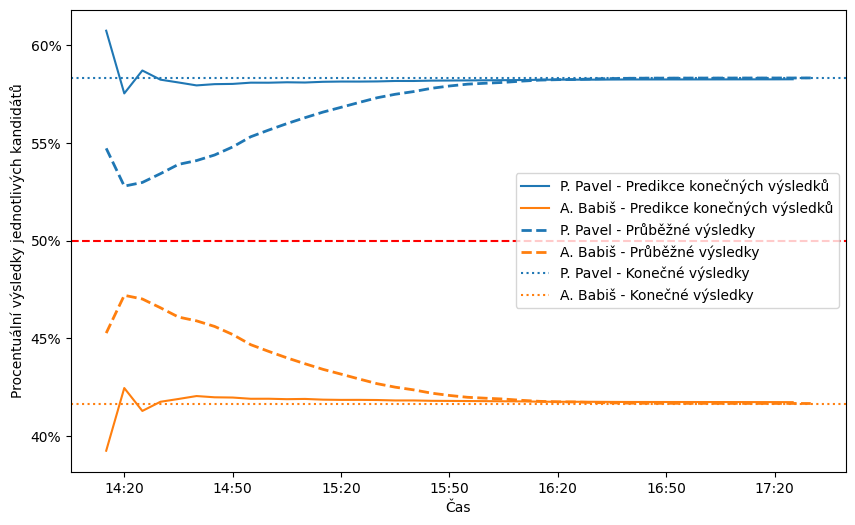

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.ticker import FuncFormatter


prez_2023_2_original_data_proc = pd.read_csv('prez_2023_2_proc.csv')
prubeh = prez_2023_2_original_data_proc[['HLASY_4', 'HLASY_7']].copy()
konecne_vysledky = prubeh.iloc[-1]


def percentage(x, pos):
    return '{:.0%}'.format(x)

n_points = len(next(iter(modified_predikce_dict.values())))

start_time = pd.Timestamp('2023-01-14 14:20')
time_labels = [(start_time + pd.Timedelta(minutes=5 * i)).strftime('%H:%M') for i in range(n_points)]

plt.figure(figsize=(10, 6))

for key, values in modified_predikce_dict.items():
    plt.plot(values, label=key + ' - Predikce konečných výsledků')

plt.xlabel('Čas')
plt.ylabel('Procentuální výsledky jednotlivých kandidátů')

plt.plot(prubeh['HLASY_4'], label="P. Pavel - Průběžné výsledky", color='#1f77b4', linestyle='--', linewidth=2)
plt.plot(prubeh['HLASY_7'], label="A. Babiš - Průběžné výsledky", color='#ff7f0e', linestyle='--', linewidth=2)

plt.axhline(y=konecne_vysledky['HLASY_4'], label="P. Pavel - Konečné výsledky", color='#1f77b4', linestyle='dotted')
plt.axhline(y=konecne_vysledky['HLASY_7'], label="A. Babiš - Konečné výsledky", color='#ff7f0e', linestyle='dotted')

ax = plt.gca()

formatter = FuncFormatter(percentage)
ax.yaxis.set_major_formatter(formatter)

plt.axhline(y=0.5, color='red', linestyle='--')

plt.xticks(ticks=range(1, n_points + 1, 6), labels=time_labels[::6])

plt.legend()

plt.show()

In [ ]:
avg_rmse_iter_imp_2 = sum(rmse_list) / len(rmse_list)
print(f"Průměrný RMSE pro model Iterative-impute a 2. kolo prezidentských voleb v roce 2023 je {avg_rmse_iter_imp_2}.")

Průměrný RMSE pro model Iterative-impute a 2. kolo prezidentských voleb v roce 2023 je 0.002266370915106526.


In [ ]:
rmse_list_ITERIMP_2 = rmse_list
rmse_df = pd.DataFrame(rmse_list_ITERIMP_2)
rmse_df.rename(columns = {0: 'IterImpute'}, inplace = True)
rmse_df.to_csv('rmse_ITERIMP_2.csv', index = False)

# Závěr

## RMSE pro 1. kolo

In [ ]:
import pandas as pd

arima = pd.read_csv('rmse_ARIMA_1.csv', index_col = 0)
arima_na_values_front = pd.Series([np.nan, np.nan])
arima = pd.concat([arima_na_values_front, arima], ignore_index = True)

aglom = pd.read_csv('rmse_AGLOM_1.csv')
kmeans = pd.read_csv('rmse_KMEANS_1.csv')
softimpute = pd.read_csv('rmse_SOFTIMP_1.csv')
knnimpute = pd.read_csv('rmse_KNN_1.csv')
iterimpute = pd.read_csv('rmse_ITERIMP_1.csv')

df = pd.concat([arima['ARIMA'], aglom, kmeans, softimpute, knnimpute, iterimpute], axis=1)

df.tail()

,ARIMA,Aglom,Kmeans,SoftImpute,KNN,IterImpute
44,0.005953,0.000494,0.000591,0.000262,0.000284,0.000337
45,0.005724,0.000498,0.000593,0.000261,0.000285,0.000337
46,0.005574,0.000515,0.000607,0.000225,0.000248,0.000302
47,0.005004,0.000515,0.000607,0.000226,0.000250,0.000303
48,0.005975,0.000515,0.000607,0.000229,0.000252,0.000306


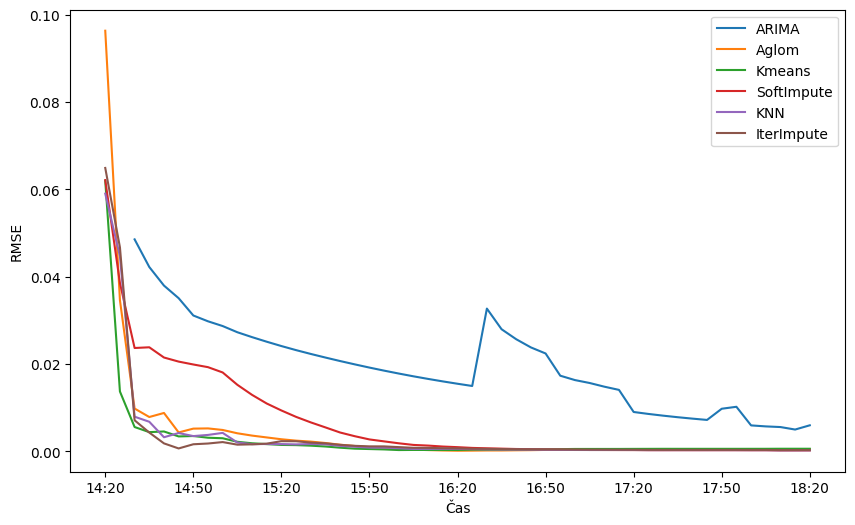

In [ ]:
n_points = 50

start_time = pd.Timestamp('2023-01-14 14:20')
time_labels = [(start_time + pd.Timedelta(minutes=5 * i)).strftime('%H:%M') for i in range(n_points)]

plt.figure(figsize=(10, 6))

for col in df.columns:
    plt.plot(df.index.values + 1, df[col], label=str(col))

plt.xticks(ticks=range(1, n_points + 1, 6), labels=time_labels[::6])

plt.xlabel('Čas')
plt.ylabel('RMSE')

plt.legend()

plt.show()

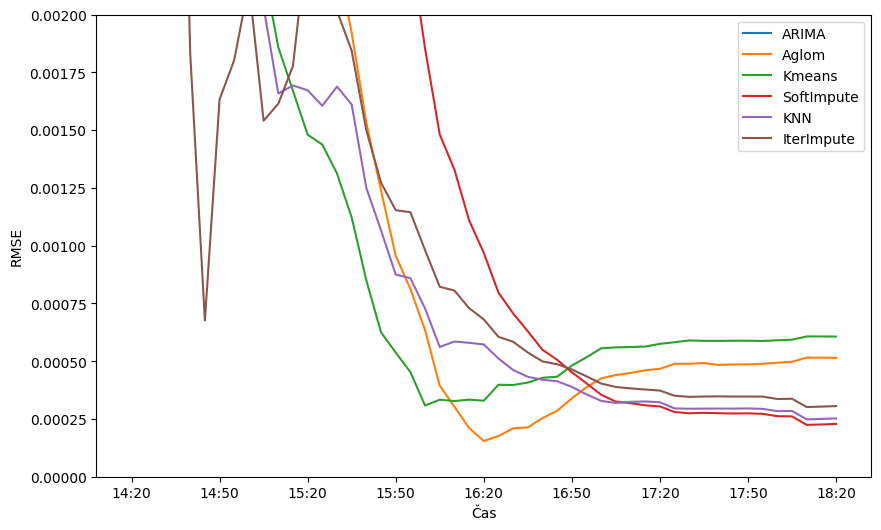

In [ ]:
plt.figure(figsize=(10, 6))

for col in df.columns:
    plt.plot(df.index.values + 1, df[col], label=str(col))

plt.xlabel('Čas')
plt.ylabel('RMSE')

plt.xticks(ticks=range(1, n_points + 1, 6), labels=time_labels[::6])

plt.ylim(0, 0.002)

plt.legend()

plt.show()

## RMSE pro 2. kolo

In [ ]:
arima = pd.read_csv('rmse_ARIMA_2.csv')

arima = pd.concat([arima_na_values_front, arima], ignore_index = True)

aglom = pd.read_csv('rmse_AGLOM_2.csv')
kmeans = pd.read_csv('rmse_KMEANS_2.csv')
softimpute = pd.read_csv('rmse_SOFTIMP_2.csv')
knnimpute = pd.read_csv('rmse_KNN_2.csv')
iterimpute = pd.read_csv('rmse_ITERIMP_2.csv')

df = pd.concat([arima['ARIMA'], aglom, kmeans, softimpute, knnimpute, iterimpute], axis=1)

df.tail()

,ARIMA,Aglom,Kmeans,SoftImpute,KNN,IterImpute
34,0.000377,0.001266,4.557741e-06,0.000709,0.000779,0.000746
35,0.000395,0.001262,5.966760e-06,0.000698,0.000768,0.000735
36,0.000363,0.001261,4.920746e-06,0.000689,0.000759,0.000726
37,0.000350,0.001252,1.010394e-05,0.000685,0.000755,0.000721
38,0.000336,0.001258,9.040003e-08,0.000657,0.000727,0.000693


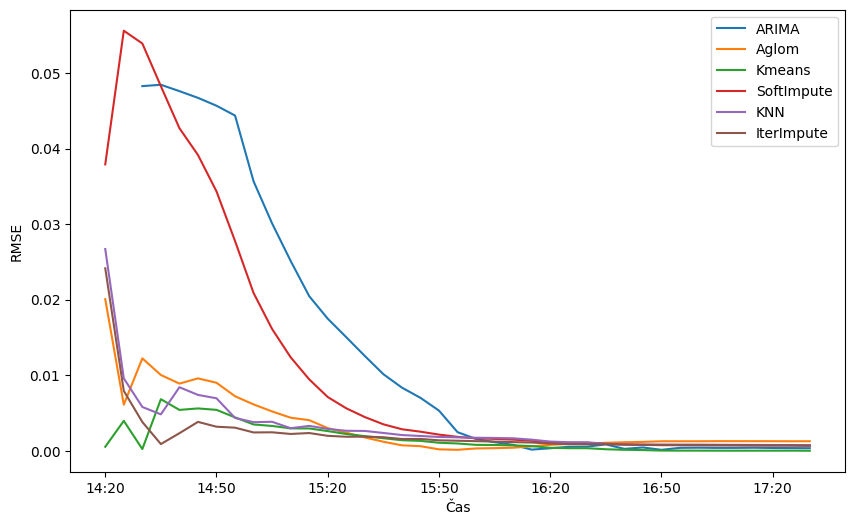

In [ ]:
n_points = 40

start_time = pd.Timestamp('2023-01-14 14:20')
time_labels = [(start_time + pd.Timedelta(minutes=5 * i)).strftime('%H:%M') for i in range(n_points)]

plt.figure(figsize=(10, 6))

for col in df.columns:
    plt.plot(df.index.values + 1, df[col], label=str(col))

plt.xticks(ticks=range(1, n_points + 1, 6), labels=time_labels[::6])

plt.xlabel('Čas')
plt.ylabel('RMSE')

plt.legend()

plt.show()

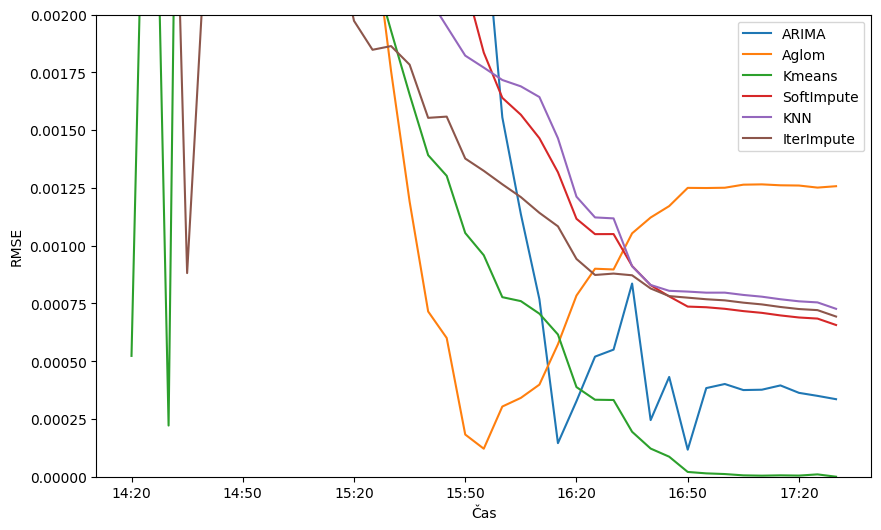

In [ ]:
plt.figure(figsize=(10, 6))

for col in df.columns:
    plt.plot(df.index.values + 1, df[col], label=str(col))

plt.xlabel('Čas')
plt.ylabel('RMSE')

plt.xticks(ticks=range(1, n_points + 1, 6), labels=time_labels[::6])

plt.ylim(0, 0.002)

plt.legend()

plt.show()